# Imports

In [ ]:
#!pip install catboost

In [33]:
import pandas as pd
import numpy as np

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error

import catboost as cb

import matplotlib.pyplot as plt
import seaborn as sns
import math

pd.set_option('display.max_columns', None)

# Read diamonds

In [34]:
diamonds_train_sorted = pd.read_csv('../data/diamonds_train_sorted.csv')
diamonds_train_sorted.head()

,price,carat,cut,color,clarity,depth,table,x,y,z
0,326,0.21,3,5,2,59.8,61.0,3.89,3.84,2.31
1,326,0.23,4,5,1,61.5,55.0,3.95,3.98,2.43
2,327,0.23,1,5,4,56.9,65.0,4.05,4.07,2.31
3,334,0.29,3,1,3,62.4,58.0,4.20,4.23,2.63
4,335,0.31,1,0,1,63.3,58.0,4.34,4.35,2.75


# Diamonds correlation

<Axes: >

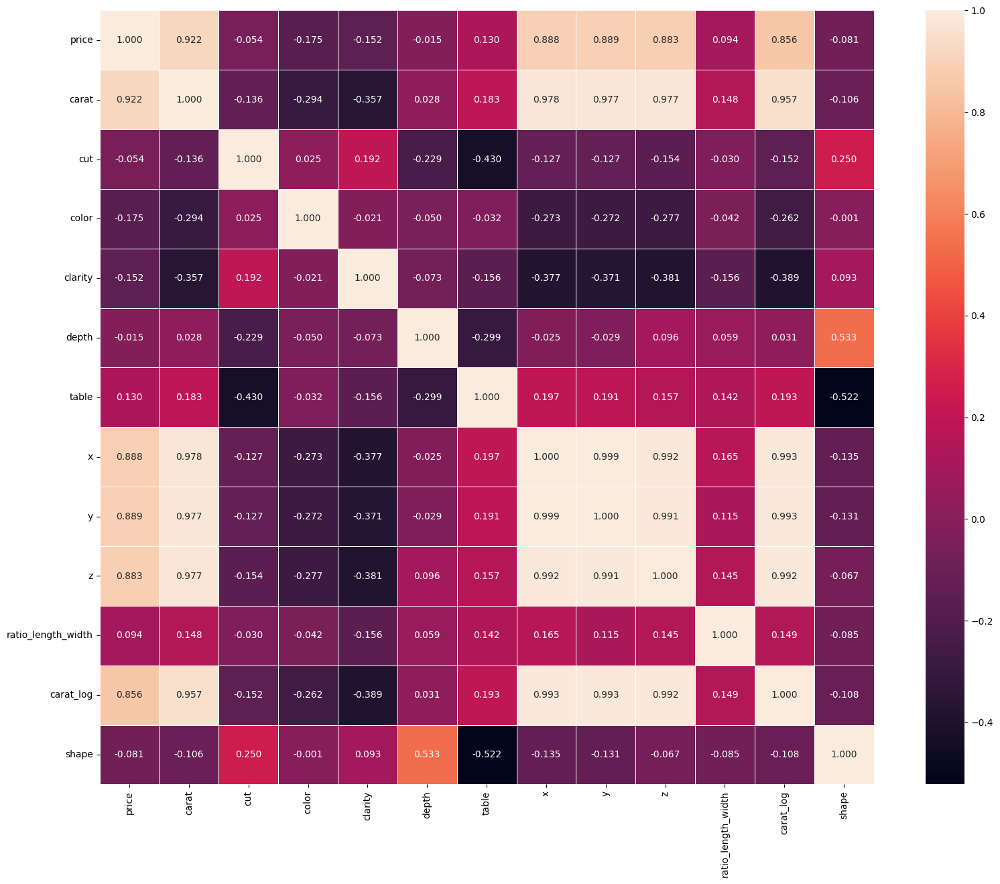

In [40]:
# We do a correlation again to see wich columns we want to keep for the training
plt.subplots(figsize = (20, 15))
corr = diamonds_train_sorted.corr()
sns.heatmap(data = corr, annot = True, fmt = ".3f", cbar = True, linewidth = .5, 
            annot_kws = {'fontsize':10, 'fontweight':'regular'}, square = True)

# Model X and y

In [41]:
# We create X with the columns we want to train with
X = diamonds_train_sorted[['cut',
                           'color', 
                           'clarity',
                           'ratio_length_width',
                           'carat_log',
                           'shape']]

y = diamonds_train_sorted['price']

# Scaling robust

In [42]:
# We perform a scaling robust of the model 
scaler_rs = RobustScaler()
scaling_X_rs = scaler_rs.fit_transform(X)
scaled_X_rs = pd.DataFrame(scaling_X_rs)
scaled_X_rs

,0,1,2,3,4,5
0,0.0,0.666667,-0.5,1.206890,-1.260030,-3.0
1,0.5,0.666667,-1.0,-0.228548,-1.164822,1.0
2,-1.0,0.666667,0.5,-0.045357,-1.164822,-4.0
3,0.0,-0.666667,0.0,-0.197443,-0.922228,0.0
4,-1.0,-1.000000,-1.0,0.137238,-0.852431,0.0
...,...,...,...,...,...,...
40426,0.0,-0.333333,-0.5,1.056684,1.119426,-3.0
40427,0.0,-0.666667,-0.5,0.876156,1.240411,0.0
40428,0.5,0.000000,2.0,-0.079159,0.804579,1.0
40429,-0.5,0.000000,-0.5,-0.315494,1.098702,0.0


# Train model CatBoost

In [43]:
# After trying various models, the best one that worked was CatBoost with Gridsearch
model = cb.CatBoostRegressor(loss_function='RMSE')
parameters_grid = {'iterations': [100, 150, 500],
        'learning_rate': [0.03, 0.1, 0.3],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [44]:
#Train the model
grid_search = GridSearchCV(model,
              parameters_grid,
              cv = 5,
              verbose = 3,
              scoring = 'neg_root_mean_squared_error')
grid_search.fit(scaled_X_rs, y)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
0:	learn: 3973.9250149	total: 24ms	remaining: 2.37s
1:	learn: 3883.9783959	total: 26.6ms	remaining: 1.3s
2:	learn: 3798.8679757	total: 29.3ms	remaining: 946ms
3:	learn: 3715.6114805	total: 32.1ms	remaining: 770ms
4:	learn: 3634.2568010	total: 34.4ms	remaining: 653ms
5:	learn: 3556.0409465	total: 36.7ms	remaining: 576ms
6:	learn: 3484.4953573	total: 39.2ms	remaining: 520ms
7:	learn: 3412.5279939	total: 41.4ms	remaining: 476ms
8:	learn: 3344.4893707	total: 43.7ms	remaining: 442ms
9:	learn: 3276.7978343	total: 46.1ms	remaining: 415ms
10:	learn: 3214.4190849	total: 48.6ms	remaining: 393ms
11:	learn: 3151.4275929	total: 50.9ms	remaining: 373ms
12:	learn: 3091.6463032	total: 53.3ms	remaining: 357ms
13:	learn: 3034.0500334	total: 55.6ms	remaining: 342ms
14:	learn: 2981.4389860	total: 57.8ms	remaining: 327ms
15:	learn: 2927.8159241	total: 60.2ms	remaining: 316ms
16:	learn: 2879.1275053	total: 62.4ms	remaining: 304ms
17:	learn: 2829

91:	learn: 1486.3521777	total: 252ms	remaining: 21.9ms
92:	learn: 1480.3326458	total: 254ms	remaining: 19.1ms
93:	learn: 1473.9617546	total: 257ms	remaining: 16.4ms
94:	learn: 1468.1533435	total: 259ms	remaining: 13.6ms
95:	learn: 1459.9731080	total: 262ms	remaining: 10.9ms
96:	learn: 1454.5706794	total: 264ms	remaining: 8.17ms
97:	learn: 1446.8997613	total: 266ms	remaining: 5.44ms
98:	learn: 1439.6586355	total: 269ms	remaining: 2.72ms
99:	learn: 1434.0888859	total: 272ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=0.2, learning_rate=0.03;, score=-490.608 total time=   0.3s
0:	learn: 4271.3463457	total: 19.9ms	remaining: 1.97s
1:	learn: 4170.4857938	total: 23.4ms	remaining: 1.15s
2:	learn: 4069.9207958	total: 26.1ms	remaining: 844ms
3:	learn: 3975.3403483	total: 29ms	remaining: 697ms
4:	learn: 3881.9697692	total: 31.8ms	remaining: 605ms
5:	learn: 3791.4441954	total: 34.5ms	remaining: 541ms
6:	learn: 3706.6456340	total: 36.7ms	remaining: 488ms
7:	learn: 3622.9915020

42:	learn: 1866.5306084	total: 223ms	remaining: 295ms
43:	learn: 1841.6923584	total: 226ms	remaining: 288ms
44:	learn: 1817.9843959	total: 230ms	remaining: 281ms
45:	learn: 1795.2424895	total: 234ms	remaining: 274ms
46:	learn: 1774.6704222	total: 238ms	remaining: 268ms
47:	learn: 1755.0305348	total: 243ms	remaining: 264ms
48:	learn: 1735.4616960	total: 248ms	remaining: 258ms
49:	learn: 1716.7110227	total: 252ms	remaining: 252ms
50:	learn: 1698.8672935	total: 254ms	remaining: 244ms
51:	learn: 1681.1539188	total: 257ms	remaining: 237ms
52:	learn: 1664.0684812	total: 259ms	remaining: 230ms
53:	learn: 1648.3738302	total: 262ms	remaining: 223ms
54:	learn: 1633.1431687	total: 265ms	remaining: 216ms
55:	learn: 1618.2893734	total: 267ms	remaining: 210ms
56:	learn: 1604.2018810	total: 269ms	remaining: 203ms
57:	learn: 1591.5178958	total: 272ms	remaining: 197ms
58:	learn: 1578.5344534	total: 274ms	remaining: 191ms
59:	learn: 1566.4344042	total: 277ms	remaining: 185ms
60:	learn: 1554.0477528	tota

22:	learn: 1590.1169600	total: 79.2ms	remaining: 265ms
23:	learn: 1555.9734121	total: 82.3ms	remaining: 261ms
24:	learn: 1532.6063761	total: 85ms	remaining: 255ms
25:	learn: 1506.5594165	total: 87.8ms	remaining: 250ms
26:	learn: 1487.0102678	total: 90.4ms	remaining: 244ms
27:	learn: 1467.6491262	total: 93ms	remaining: 239ms
28:	learn: 1446.1686662	total: 95.6ms	remaining: 234ms
29:	learn: 1420.8097875	total: 98ms	remaining: 229ms
30:	learn: 1404.0953360	total: 101ms	remaining: 224ms
31:	learn: 1385.9879177	total: 103ms	remaining: 219ms
32:	learn: 1371.0017887	total: 106ms	remaining: 214ms
33:	learn: 1351.2924862	total: 108ms	remaining: 209ms
34:	learn: 1337.6265560	total: 110ms	remaining: 204ms
35:	learn: 1323.5851706	total: 112ms	remaining: 200ms
36:	learn: 1306.5084207	total: 115ms	remaining: 195ms
37:	learn: 1291.5203170	total: 117ms	remaining: 191ms
38:	learn: 1278.9270584	total: 119ms	remaining: 187ms
39:	learn: 1267.0387936	total: 121ms	remaining: 182ms
40:	learn: 1252.0565291	to

85:	learn: 954.8482989	total: 217ms	remaining: 35.3ms
86:	learn: 951.3963769	total: 219ms	remaining: 32.7ms
87:	learn: 948.2322076	total: 221ms	remaining: 30.2ms
88:	learn: 945.8942619	total: 224ms	remaining: 27.7ms
89:	learn: 942.8167754	total: 226ms	remaining: 25.1ms
90:	learn: 940.4350228	total: 229ms	remaining: 22.6ms
91:	learn: 936.0455603	total: 231ms	remaining: 20.1ms
92:	learn: 933.0728692	total: 233ms	remaining: 17.6ms
93:	learn: 930.6811526	total: 236ms	remaining: 15ms
94:	learn: 928.6884526	total: 238ms	remaining: 12.5ms
95:	learn: 925.5231862	total: 240ms	remaining: 9.99ms
96:	learn: 922.8447680	total: 242ms	remaining: 7.5ms
97:	learn: 920.8520221	total: 245ms	remaining: 4.99ms
98:	learn: 918.8346596	total: 247ms	remaining: 2.49ms
99:	learn: 916.2305544	total: 249ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-274.377 total time=   0.2s
0:	learn: 4028.1797383	total: 18.3ms	remaining: 1.81s
1:	learn: 3713.9825498	total: 20.

82:	learn: 943.9603827	total: 206ms	remaining: 42.1ms
83:	learn: 942.1899267	total: 208ms	remaining: 39.7ms
84:	learn: 939.4657178	total: 211ms	remaining: 37.2ms
85:	learn: 933.3832491	total: 213ms	remaining: 34.6ms
86:	learn: 931.3788724	total: 215ms	remaining: 32.2ms
87:	learn: 926.9211106	total: 218ms	remaining: 29.7ms
88:	learn: 924.3159867	total: 220ms	remaining: 27.2ms
89:	learn: 921.7974883	total: 222ms	remaining: 24.7ms
90:	learn: 919.6619445	total: 225ms	remaining: 22.3ms
91:	learn: 918.0253117	total: 227ms	remaining: 19.7ms
92:	learn: 916.5588978	total: 230ms	remaining: 17.3ms
93:	learn: 914.3557427	total: 232ms	remaining: 14.8ms
94:	learn: 912.0020216	total: 234ms	remaining: 12.3ms
95:	learn: 910.7572462	total: 236ms	remaining: 9.85ms
96:	learn: 908.8566890	total: 238ms	remaining: 7.37ms
97:	learn: 907.8299129	total: 241ms	remaining: 4.91ms
98:	learn: 906.3659912	total: 243ms	remaining: 2.45ms
99:	learn: 904.4419341	total: 245ms	remaining: 0us
[CV 4/5] END depth=2, iteration

90:	learn: 751.1933084	total: 230ms	remaining: 22.7ms
91:	learn: 750.4843442	total: 232ms	remaining: 20.2ms
92:	learn: 749.8534328	total: 235ms	remaining: 17.7ms
93:	learn: 747.8139702	total: 237ms	remaining: 15.1ms
94:	learn: 746.0713050	total: 239ms	remaining: 12.6ms
95:	learn: 745.5249558	total: 242ms	remaining: 10.1ms
96:	learn: 743.9502017	total: 245ms	remaining: 7.57ms
97:	learn: 743.2693365	total: 247ms	remaining: 5.05ms
98:	learn: 739.7067763	total: 250ms	remaining: 2.52ms
99:	learn: 737.9054602	total: 252ms	remaining: 0us
[CV 1/5] END depth=2, iterations=100, l2_leaf_reg=0.2, learning_rate=0.3;, score=-317.156 total time=   0.2s
0:	learn: 3261.6770173	total: 23.9ms	remaining: 2.36s
1:	learn: 2696.7698276	total: 26.3ms	remaining: 1.29s
2:	learn: 2298.2421176	total: 28.4ms	remaining: 920ms
3:	learn: 2012.9462803	total: 30.7ms	remaining: 737ms
4:	learn: 1833.1448913	total: 33ms	remaining: 627ms
5:	learn: 1728.4211905	total: 35.1ms	remaining: 549ms
6:	learn: 1610.8954855	total: 37

65:	learn: 797.8187751	total: 230ms	remaining: 118ms
66:	learn: 796.0822857	total: 233ms	remaining: 115ms
67:	learn: 794.4603280	total: 236ms	remaining: 111ms
68:	learn: 791.4417689	total: 238ms	remaining: 107ms
69:	learn: 785.1513665	total: 241ms	remaining: 103ms
70:	learn: 779.2076817	total: 244ms	remaining: 99.8ms
71:	learn: 777.8803303	total: 248ms	remaining: 96.4ms
72:	learn: 777.3398935	total: 251ms	remaining: 92.8ms
73:	learn: 773.5290739	total: 254ms	remaining: 89.2ms
74:	learn: 772.4285138	total: 257ms	remaining: 85.6ms
75:	learn: 771.7974144	total: 259ms	remaining: 81.9ms
76:	learn: 770.9998538	total: 262ms	remaining: 78.3ms
77:	learn: 767.9560167	total: 265ms	remaining: 74.6ms
78:	learn: 767.0173478	total: 267ms	remaining: 71ms
79:	learn: 766.6785246	total: 269ms	remaining: 67.3ms
80:	learn: 766.3315353	total: 272ms	remaining: 63.7ms
81:	learn: 764.7741823	total: 274ms	remaining: 60.2ms
82:	learn: 762.5003233	total: 276ms	remaining: 56.6ms
83:	learn: 761.9800765	total: 278ms

66:	learn: 293.0746844	total: 168ms	remaining: 82.6ms
67:	learn: 291.6121595	total: 171ms	remaining: 80.3ms
68:	learn: 291.2785621	total: 173ms	remaining: 77.9ms
69:	learn: 290.9265481	total: 176ms	remaining: 75.3ms
70:	learn: 290.5214591	total: 178ms	remaining: 72.7ms
71:	learn: 289.8154226	total: 181ms	remaining: 70.2ms
72:	learn: 289.6156063	total: 183ms	remaining: 67.7ms
73:	learn: 288.3567646	total: 186ms	remaining: 65.3ms
74:	learn: 286.7984148	total: 188ms	remaining: 62.7ms
75:	learn: 286.0860017	total: 190ms	remaining: 60.1ms
76:	learn: 285.5334952	total: 192ms	remaining: 57.5ms
77:	learn: 285.1211345	total: 195ms	remaining: 54.9ms
78:	learn: 284.9275605	total: 197ms	remaining: 52.3ms
79:	learn: 284.0906181	total: 199ms	remaining: 49.9ms
80:	learn: 283.1916125	total: 202ms	remaining: 47.4ms
81:	learn: 282.9687543	total: 205ms	remaining: 44.9ms
82:	learn: 282.5383144	total: 207ms	remaining: 42.4ms
83:	learn: 282.3116209	total: 209ms	remaining: 39.9ms
84:	learn: 282.1128762	total

53:	learn: 1863.4986415	total: 143ms	remaining: 122ms
54:	learn: 1850.0745849	total: 146ms	remaining: 119ms
55:	learn: 1833.6951318	total: 148ms	remaining: 116ms
56:	learn: 1819.9602205	total: 151ms	remaining: 114ms
57:	learn: 1806.6641056	total: 153ms	remaining: 111ms
58:	learn: 1794.5341127	total: 155ms	remaining: 108ms
59:	learn: 1782.5077815	total: 158ms	remaining: 105ms
60:	learn: 1771.7818988	total: 161ms	remaining: 103ms
61:	learn: 1757.1866752	total: 163ms	remaining: 99.9ms
62:	learn: 1745.4122479	total: 165ms	remaining: 97ms
63:	learn: 1735.0024731	total: 168ms	remaining: 94.3ms
64:	learn: 1721.9924449	total: 170ms	remaining: 91.5ms
65:	learn: 1711.6438556	total: 172ms	remaining: 88.7ms
66:	learn: 1701.7853334	total: 175ms	remaining: 86ms
67:	learn: 1691.8727832	total: 177ms	remaining: 83.2ms
68:	learn: 1682.3304206	total: 179ms	remaining: 80.4ms
69:	learn: 1673.1983985	total: 181ms	remaining: 77.6ms
70:	learn: 1664.5764627	total: 184ms	remaining: 75ms
71:	learn: 1652.6330708	

49:	learn: 1718.4795802	total: 133ms	remaining: 133ms
50:	learn: 1700.8424855	total: 136ms	remaining: 130ms
51:	learn: 1683.0406321	total: 138ms	remaining: 127ms
52:	learn: 1665.8965846	total: 140ms	remaining: 124ms
53:	learn: 1650.0982602	total: 143ms	remaining: 122ms
54:	learn: 1635.2868067	total: 145ms	remaining: 119ms
55:	learn: 1620.2526250	total: 148ms	remaining: 116ms
56:	learn: 1606.0515096	total: 151ms	remaining: 114ms
57:	learn: 1593.6553562	total: 153ms	remaining: 111ms
58:	learn: 1580.7017787	total: 156ms	remaining: 108ms
59:	learn: 1568.2003086	total: 158ms	remaining: 105ms
60:	learn: 1555.8378703	total: 160ms	remaining: 102ms
61:	learn: 1544.2730627	total: 163ms	remaining: 99.7ms
62:	learn: 1533.2222629	total: 165ms	remaining: 97ms
63:	learn: 1521.8861062	total: 167ms	remaining: 94.2ms
64:	learn: 1511.6497381	total: 170ms	remaining: 91.3ms
65:	learn: 1501.6096292	total: 172ms	remaining: 88.6ms
66:	learn: 1491.7227219	total: 174ms	remaining: 85.9ms
67:	learn: 1482.4213771	

45:	learn: 1198.8805829	total: 122ms	remaining: 143ms
46:	learn: 1190.9674900	total: 125ms	remaining: 141ms
47:	learn: 1179.1431834	total: 127ms	remaining: 138ms
48:	learn: 1171.1120095	total: 129ms	remaining: 135ms
49:	learn: 1161.3148376	total: 132ms	remaining: 132ms
50:	learn: 1149.8629322	total: 134ms	remaining: 129ms
51:	learn: 1142.6635682	total: 136ms	remaining: 126ms
52:	learn: 1136.6823331	total: 139ms	remaining: 123ms
53:	learn: 1129.7179595	total: 141ms	remaining: 120ms
54:	learn: 1122.7324074	total: 144ms	remaining: 118ms
55:	learn: 1110.6625465	total: 146ms	remaining: 115ms
56:	learn: 1101.8152998	total: 149ms	remaining: 112ms
57:	learn: 1095.7989228	total: 151ms	remaining: 109ms
58:	learn: 1088.3344386	total: 153ms	remaining: 106ms
59:	learn: 1083.4343802	total: 155ms	remaining: 104ms
60:	learn: 1076.6003384	total: 157ms	remaining: 101ms
61:	learn: 1071.0359930	total: 160ms	remaining: 97.8ms
62:	learn: 1066.6513036	total: 162ms	remaining: 95.1ms
63:	learn: 1061.0346447	to

49:	learn: 1119.7268794	total: 140ms	remaining: 140ms
50:	learn: 1112.9335710	total: 143ms	remaining: 137ms
51:	learn: 1106.2620390	total: 145ms	remaining: 134ms
52:	learn: 1100.7780222	total: 147ms	remaining: 131ms
53:	learn: 1089.7113930	total: 149ms	remaining: 127ms
54:	learn: 1082.5152980	total: 152ms	remaining: 124ms
55:	learn: 1073.9672723	total: 154ms	remaining: 121ms
56:	learn: 1068.5277107	total: 157ms	remaining: 118ms
57:	learn: 1062.4116403	total: 159ms	remaining: 115ms
58:	learn: 1057.0089906	total: 162ms	remaining: 112ms
59:	learn: 1049.9280867	total: 164ms	remaining: 109ms
60:	learn: 1042.9682269	total: 167ms	remaining: 106ms
61:	learn: 1037.9455467	total: 169ms	remaining: 104ms
62:	learn: 1033.4324579	total: 171ms	remaining: 101ms
63:	learn: 1028.1700700	total: 174ms	remaining: 97.6ms
64:	learn: 1022.0133169	total: 176ms	remaining: 94.6ms
65:	learn: 1017.6017226	total: 178ms	remaining: 91.8ms
66:	learn: 1013.4486390	total: 181ms	remaining: 88.9ms
67:	learn: 1007.3993187	

19:	learn: 562.0016358	total: 59.8ms	remaining: 239ms
20:	learn: 550.5209980	total: 62.6ms	remaining: 236ms
21:	learn: 539.7593928	total: 64.8ms	remaining: 230ms
22:	learn: 530.6925807	total: 67.2ms	remaining: 225ms
23:	learn: 522.8728187	total: 69.6ms	remaining: 220ms
24:	learn: 514.4703850	total: 71.9ms	remaining: 216ms
25:	learn: 507.3350890	total: 74.2ms	remaining: 211ms
26:	learn: 500.2519505	total: 76.6ms	remaining: 207ms
27:	learn: 494.1182523	total: 79.1ms	remaining: 203ms
28:	learn: 487.7803127	total: 81.2ms	remaining: 199ms
29:	learn: 481.6297786	total: 84ms	remaining: 196ms
30:	learn: 476.6027306	total: 86.4ms	remaining: 192ms
31:	learn: 471.1451986	total: 88.6ms	remaining: 188ms
32:	learn: 465.9614557	total: 90.8ms	remaining: 184ms
33:	learn: 461.6808537	total: 93.2ms	remaining: 181ms
34:	learn: 456.8330648	total: 95.4ms	remaining: 177ms
35:	learn: 453.1087004	total: 97.8ms	remaining: 174ms
36:	learn: 448.8964201	total: 100ms	remaining: 170ms
37:	learn: 444.7396285	total: 1

7:	learn: 1528.5586347	total: 42.2ms	remaining: 486ms
8:	learn: 1464.9487245	total: 45.1ms	remaining: 456ms
9:	learn: 1401.0479494	total: 47.5ms	remaining: 428ms
10:	learn: 1348.9171114	total: 49.7ms	remaining: 402ms
11:	learn: 1289.8045789	total: 51.7ms	remaining: 379ms
12:	learn: 1252.3508967	total: 54.1ms	remaining: 362ms
13:	learn: 1216.3502648	total: 56.5ms	remaining: 347ms
14:	learn: 1183.1964156	total: 59.7ms	remaining: 339ms
15:	learn: 1155.3127758	total: 61.9ms	remaining: 325ms
16:	learn: 1116.1233329	total: 64.1ms	remaining: 313ms
17:	learn: 1094.3283805	total: 66.4ms	remaining: 302ms
18:	learn: 1076.1183917	total: 68.8ms	remaining: 293ms
19:	learn: 1059.8595334	total: 71.1ms	remaining: 284ms
20:	learn: 1046.9648979	total: 74.2ms	remaining: 279ms
21:	learn: 1027.1582654	total: 77ms	remaining: 273ms
22:	learn: 1015.2821666	total: 79.5ms	remaining: 266ms
23:	learn: 1001.7689575	total: 81.7ms	remaining: 259ms
24:	learn: 987.2782277	total: 84.2ms	remaining: 253ms
25:	learn: 976.9

0:	learn: 3314.2206333	total: 24.2ms	remaining: 2.39s
1:	learn: 2587.7228102	total: 26.7ms	remaining: 1.31s
2:	learn: 2114.0598989	total: 29.2ms	remaining: 946ms
3:	learn: 1805.7542258	total: 31.8ms	remaining: 764ms
4:	learn: 1605.5677505	total: 34.4ms	remaining: 653ms
5:	learn: 1489.0658862	total: 37.2ms	remaining: 582ms
6:	learn: 1411.2523144	total: 40.1ms	remaining: 533ms
7:	learn: 1346.5305507	total: 42.4ms	remaining: 488ms
8:	learn: 1296.0344133	total: 44.6ms	remaining: 451ms
9:	learn: 1249.5834482	total: 46.9ms	remaining: 422ms
10:	learn: 1216.6749968	total: 49.2ms	remaining: 398ms
11:	learn: 1189.5618929	total: 51.5ms	remaining: 378ms
12:	learn: 1162.6175631	total: 53.7ms	remaining: 359ms
13:	learn: 1141.3616645	total: 55.8ms	remaining: 343ms
14:	learn: 1119.4417857	total: 58ms	remaining: 329ms
15:	learn: 1103.3667719	total: 60.5ms	remaining: 318ms
16:	learn: 1073.3770246	total: 62.9ms	remaining: 307ms
17:	learn: 1060.8566045	total: 65.4ms	remaining: 298ms
18:	learn: 1047.961169

3:	learn: 3715.6482063	total: 25.3ms	remaining: 606ms
4:	learn: 3634.3024993	total: 28.3ms	remaining: 538ms
5:	learn: 3556.0945908	total: 30.6ms	remaining: 480ms
6:	learn: 3484.5550853	total: 33ms	remaining: 438ms
7:	learn: 3412.5939549	total: 35.2ms	remaining: 405ms
8:	learn: 3344.5603164	total: 37.6ms	remaining: 380ms
9:	learn: 3276.8744542	total: 40.1ms	remaining: 361ms
10:	learn: 3214.4995377	total: 42.9ms	remaining: 347ms
11:	learn: 3151.5129405	total: 45.3ms	remaining: 332ms
12:	learn: 3091.7355825	total: 47.7ms	remaining: 320ms
13:	learn: 3034.1427934	total: 50ms	remaining: 307ms
14:	learn: 2981.5444252	total: 52.2ms	remaining: 296ms
15:	learn: 2927.9238255	total: 54.3ms	remaining: 285ms
16:	learn: 2879.2364040	total: 56.6ms	remaining: 277ms
17:	learn: 2829.1375675	total: 59ms	remaining: 269ms
18:	learn: 2784.0979938	total: 61.4ms	remaining: 262ms
19:	learn: 2741.1099639	total: 63.8ms	remaining: 255ms
20:	learn: 2699.0868705	total: 66ms	remaining: 248ms
21:	learn: 2657.3059842	t

0:	learn: 4271.3591695	total: 27.7ms	remaining: 2.74s
1:	learn: 4170.5096267	total: 31.6ms	remaining: 1.55s
2:	learn: 4069.9557766	total: 34.7ms	remaining: 1.12s
3:	learn: 3975.3855617	total: 37.7ms	remaining: 905ms
4:	learn: 3882.0242608	total: 40.6ms	remaining: 771ms
5:	learn: 3791.5076004	total: 43.3ms	remaining: 678ms
6:	learn: 3706.7168746	total: 45.8ms	remaining: 609ms
7:	learn: 3623.0698794	total: 48.2ms	remaining: 555ms
8:	learn: 3545.2096661	total: 50.8ms	remaining: 514ms
9:	learn: 3466.9371021	total: 53.3ms	remaining: 479ms
10:	learn: 3391.0680119	total: 55.7ms	remaining: 451ms
11:	learn: 3322.5292832	total: 58.1ms	remaining: 426ms
12:	learn: 3252.8668268	total: 60.3ms	remaining: 404ms
13:	learn: 3185.2986989	total: 62.7ms	remaining: 385ms
14:	learn: 3122.6233152	total: 65.1ms	remaining: 369ms
15:	learn: 3061.1893389	total: 67.4ms	remaining: 354ms
16:	learn: 3003.5349218	total: 69.8ms	remaining: 341ms
17:	learn: 2947.5208047	total: 72ms	remaining: 328ms
18:	learn: 2889.687596

0:	learn: 1612.7396375	total: 15.1ms	remaining: 1.5s
1:	learn: 1572.8450790	total: 18.2ms	remaining: 893ms
2:	learn: 1535.1428832	total: 21ms	remaining: 679ms
3:	learn: 1497.1450610	total: 23.5ms	remaining: 563ms
4:	learn: 1460.3687220	total: 26.2ms	remaining: 499ms
5:	learn: 1425.0089394	total: 28.7ms	remaining: 450ms
6:	learn: 1390.6565481	total: 31.1ms	remaining: 414ms
7:	learn: 1357.1389445	total: 33.6ms	remaining: 387ms
8:	learn: 1325.2011196	total: 36.3ms	remaining: 367ms
9:	learn: 1295.4703899	total: 38.8ms	remaining: 349ms
10:	learn: 1265.4667492	total: 41.3ms	remaining: 334ms
11:	learn: 1236.1183567	total: 43.7ms	remaining: 320ms
12:	learn: 1208.3310839	total: 45.8ms	remaining: 307ms
13:	learn: 1181.3555712	total: 48.3ms	remaining: 297ms
14:	learn: 1155.1434682	total: 50.8ms	remaining: 288ms
15:	learn: 1130.7872016	total: 53ms	remaining: 279ms
16:	learn: 1107.5582853	total: 55.4ms	remaining: 270ms
17:	learn: 1083.9438841	total: 58ms	remaining: 264ms
18:	learn: 1061.0503376	tot

98:	learn: 918.0907132	total: 245ms	remaining: 2.47ms
99:	learn: 915.4728318	total: 248ms	remaining: 0us
[CV 1/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.1;, score=-529.424 total time=   0.2s
0:	learn: 3863.7132111	total: 25.2ms	remaining: 2.5s
1:	learn: 3588.4458858	total: 28.1ms	remaining: 1.38s
2:	learn: 3355.7376012	total: 30.3ms	remaining: 981ms
3:	learn: 3135.8466990	total: 32.8ms	remaining: 788ms
4:	learn: 2944.1418295	total: 35.3ms	remaining: 670ms
5:	learn: 2786.7083993	total: 37.7ms	remaining: 591ms
6:	learn: 2631.2962103	total: 40.3ms	remaining: 536ms
7:	learn: 2505.6631582	total: 42.8ms	remaining: 492ms
8:	learn: 2385.4937075	total: 45.5ms	remaining: 460ms
9:	learn: 2275.5647673	total: 48ms	remaining: 432ms
10:	learn: 2188.3111050	total: 50.4ms	remaining: 408ms
11:	learn: 2109.8105905	total: 52.8ms	remaining: 387ms
12:	learn: 2030.7581887	total: 55.3ms	remaining: 370ms
13:	learn: 1963.7481620	total: 57.7ms	remaining: 355ms
14:	learn: 1904.7205235	total: 

82:	learn: 944.8305140	total: 217ms	remaining: 44.4ms
83:	learn: 941.1263326	total: 220ms	remaining: 41.9ms
84:	learn: 936.2307442	total: 222ms	remaining: 39.2ms
85:	learn: 933.6874950	total: 224ms	remaining: 36.5ms
86:	learn: 930.8044908	total: 227ms	remaining: 33.9ms
87:	learn: 926.3796104	total: 229ms	remaining: 31.2ms
88:	learn: 923.8263782	total: 231ms	remaining: 28.6ms
89:	learn: 920.4967004	total: 234ms	remaining: 26ms
90:	learn: 918.3436707	total: 236ms	remaining: 23.4ms
91:	learn: 915.7360515	total: 239ms	remaining: 20.7ms
92:	learn: 912.3757374	total: 241ms	remaining: 18.1ms
93:	learn: 910.1175695	total: 243ms	remaining: 15.5ms
94:	learn: 908.0745255	total: 246ms	remaining: 12.9ms
95:	learn: 906.1132967	total: 248ms	remaining: 10.3ms
96:	learn: 902.4938960	total: 250ms	remaining: 7.75ms
97:	learn: 900.8070943	total: 253ms	remaining: 5.16ms
98:	learn: 897.8550393	total: 255ms	remaining: 2.58ms
99:	learn: 895.5865564	total: 257ms	remaining: 0us
[CV 3/5] END depth=2, iterations=

83:	learn: 348.9431601	total: 201ms	remaining: 38.2ms
84:	learn: 347.9569988	total: 203ms	remaining: 35.9ms
85:	learn: 346.8652360	total: 206ms	remaining: 33.5ms
86:	learn: 345.9180497	total: 208ms	remaining: 31.1ms
87:	learn: 344.9442134	total: 210ms	remaining: 28.6ms
88:	learn: 343.6520362	total: 212ms	remaining: 26.2ms
89:	learn: 342.6183268	total: 215ms	remaining: 23.9ms
90:	learn: 341.7860078	total: 218ms	remaining: 21.5ms
91:	learn: 340.7670758	total: 220ms	remaining: 19.1ms
92:	learn: 339.7476945	total: 223ms	remaining: 16.7ms
93:	learn: 338.7450133	total: 225ms	remaining: 14.3ms
94:	learn: 337.5912899	total: 227ms	remaining: 11.9ms
95:	learn: 336.5459510	total: 229ms	remaining: 9.55ms
96:	learn: 335.5809501	total: 232ms	remaining: 7.16ms
97:	learn: 334.6352735	total: 235ms	remaining: 4.79ms
98:	learn: 333.7653204	total: 237ms	remaining: 2.4ms
99:	learn: 332.9224346	total: 240ms	remaining: 0us
[CV 5/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.1;, score=-5976.0

85:	learn: 772.3046172	total: 215ms	remaining: 35ms
86:	learn: 768.5475885	total: 218ms	remaining: 32.5ms
87:	learn: 768.0779377	total: 220ms	remaining: 30ms
88:	learn: 767.0526987	total: 222ms	remaining: 27.5ms
89:	learn: 765.6480575	total: 225ms	remaining: 25ms
90:	learn: 761.3823471	total: 227ms	remaining: 22.5ms
91:	learn: 759.4510913	total: 230ms	remaining: 20ms
92:	learn: 759.0563423	total: 233ms	remaining: 17.5ms
93:	learn: 758.7254474	total: 235ms	remaining: 15ms
94:	learn: 757.4908899	total: 238ms	remaining: 12.5ms
95:	learn: 757.0402921	total: 240ms	remaining: 10ms
96:	learn: 756.8523015	total: 242ms	remaining: 7.5ms
97:	learn: 755.4654472	total: 245ms	remaining: 4.99ms
98:	learn: 754.0797346	total: 247ms	remaining: 2.49ms
99:	learn: 753.5101138	total: 249ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-303.308 total time=   0.2s
0:	learn: 3360.5586092	total: 21.5ms	remaining: 2.13s
1:	learn: 2683.2709918	total: 23.9ms	remainin

94:	learn: 696.1647366	total: 228ms	remaining: 12ms
95:	learn: 693.7548725	total: 230ms	remaining: 9.59ms
96:	learn: 692.7485826	total: 233ms	remaining: 7.2ms
97:	learn: 690.6342316	total: 235ms	remaining: 4.79ms
98:	learn: 689.1037709	total: 237ms	remaining: 2.4ms
99:	learn: 687.3180196	total: 240ms	remaining: 0us
[CV 4/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-1233.802 total time=   0.2s
0:	learn: 1258.3361602	total: 15.7ms	remaining: 1.56s
1:	learn: 972.5586579	total: 18.4ms	remaining: 900ms
2:	learn: 790.6519683	total: 20.9ms	remaining: 676ms
3:	learn: 679.2994617	total: 23.3ms	remaining: 560ms
4:	learn: 612.9451095	total: 25.7ms	remaining: 489ms
5:	learn: 563.6140007	total: 28.1ms	remaining: 441ms
6:	learn: 529.1267009	total: 30.5ms	remaining: 405ms
7:	learn: 506.3124075	total: 32.7ms	remaining: 377ms
8:	learn: 487.4452117	total: 34.9ms	remaining: 353ms
9:	learn: 471.9204016	total: 37ms	remaining: 333ms
10:	learn: 455.7563193	total: 39.4ms	remaining

77:	learn: 1599.0330723	total: 255ms	remaining: 71.8ms
78:	learn: 1592.0050404	total: 258ms	remaining: 68.6ms
79:	learn: 1585.2810062	total: 262ms	remaining: 65.6ms
80:	learn: 1576.1575685	total: 266ms	remaining: 62.5ms
81:	learn: 1566.2571364	total: 270ms	remaining: 59.2ms
82:	learn: 1556.8705368	total: 273ms	remaining: 55.9ms
83:	learn: 1550.3482822	total: 276ms	remaining: 52.6ms
84:	learn: 1544.0781744	total: 279ms	remaining: 49.2ms
85:	learn: 1536.1922892	total: 281ms	remaining: 45.8ms
86:	learn: 1530.1713876	total: 284ms	remaining: 42.4ms
87:	learn: 1522.2397349	total: 286ms	remaining: 39.1ms
88:	learn: 1513.7462169	total: 289ms	remaining: 35.7ms
89:	learn: 1506.7690779	total: 292ms	remaining: 32.5ms
90:	learn: 1500.7208539	total: 295ms	remaining: 29.1ms
91:	learn: 1492.6819002	total: 297ms	remaining: 25.8ms
92:	learn: 1486.1503764	total: 299ms	remaining: 22.5ms
93:	learn: 1479.7042239	total: 302ms	remaining: 19.3ms
94:	learn: 1473.9960758	total: 304ms	remaining: 16ms
95:	learn: 1

85:	learn: 1514.7483192	total: 220ms	remaining: 35.8ms
86:	learn: 1504.7672524	total: 223ms	remaining: 33.3ms
87:	learn: 1498.4368902	total: 225ms	remaining: 30.7ms
88:	learn: 1492.4056320	total: 227ms	remaining: 28.1ms
89:	learn: 1483.8326251	total: 230ms	remaining: 25.5ms
90:	learn: 1478.0751325	total: 232ms	remaining: 23ms
91:	learn: 1470.0234391	total: 235ms	remaining: 20.4ms
92:	learn: 1463.4459170	total: 237ms	remaining: 17.9ms
93:	learn: 1457.8599597	total: 240ms	remaining: 15.3ms
94:	learn: 1452.6870735	total: 242ms	remaining: 12.8ms
95:	learn: 1445.2896606	total: 245ms	remaining: 10.2ms
96:	learn: 1440.1463580	total: 247ms	remaining: 7.65ms
97:	learn: 1432.2954654	total: 250ms	remaining: 5.1ms
98:	learn: 1424.8270456	total: 252ms	remaining: 2.55ms
99:	learn: 1417.6517131	total: 255ms	remaining: 0us
[CV 3/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.03;, score=-790.880 total time=   0.2s
0:	learn: 4307.6235839	total: 25.6ms	remaining: 2.54s
1:	learn: 4198.4199

73:	learn: 546.2336604	total: 192ms	remaining: 67.4ms
74:	learn: 543.4931839	total: 194ms	remaining: 64.8ms
75:	learn: 540.4943158	total: 197ms	remaining: 62.2ms
76:	learn: 537.8210245	total: 200ms	remaining: 59.6ms
77:	learn: 535.0431451	total: 202ms	remaining: 57ms
78:	learn: 532.4420005	total: 204ms	remaining: 54.4ms
79:	learn: 529.6392865	total: 207ms	remaining: 51.7ms
80:	learn: 526.9627145	total: 210ms	remaining: 49.2ms
81:	learn: 524.5718384	total: 212ms	remaining: 46.6ms
82:	learn: 522.0508952	total: 214ms	remaining: 43.9ms
83:	learn: 519.7892205	total: 217ms	remaining: 41.3ms
84:	learn: 517.6748964	total: 219ms	remaining: 38.6ms
85:	learn: 515.4169032	total: 221ms	remaining: 36ms
86:	learn: 513.1771435	total: 224ms	remaining: 33.4ms
87:	learn: 511.2386019	total: 226ms	remaining: 30.8ms
88:	learn: 509.2504807	total: 229ms	remaining: 28.2ms
89:	learn: 507.2750815	total: 231ms	remaining: 25.6ms
90:	learn: 505.1810105	total: 233ms	remaining: 23ms
91:	learn: 503.0063429	total: 235m

88:	learn: 939.3036393	total: 221ms	remaining: 27.3ms
89:	learn: 935.9222030	total: 224ms	remaining: 24.9ms
90:	learn: 933.0853367	total: 226ms	remaining: 22.4ms
91:	learn: 930.0301000	total: 229ms	remaining: 19.9ms
92:	learn: 926.1504767	total: 231ms	remaining: 17.4ms
93:	learn: 923.6477711	total: 234ms	remaining: 14.9ms
94:	learn: 921.2478418	total: 236ms	remaining: 12.4ms
95:	learn: 918.2698012	total: 238ms	remaining: 9.93ms
96:	learn: 915.0239931	total: 241ms	remaining: 7.45ms
97:	learn: 912.4012106	total: 244ms	remaining: 4.97ms
98:	learn: 909.1065992	total: 246ms	remaining: 2.48ms
99:	learn: 907.2310950	total: 248ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.1;, score=-262.035 total time=   0.2s
0:	learn: 4028.3268788	total: 24.6ms	remaining: 2.44s
1:	learn: 3714.2351330	total: 27.4ms	remaining: 1.34s
2:	learn: 3435.6664011	total: 29.7ms	remaining: 961ms
3:	learn: 3197.3332495	total: 31.9ms	remaining: 765ms
4:	learn: 2992.0258528	total: 33

75:	learn: 967.3598879	total: 214ms	remaining: 67.6ms
76:	learn: 965.3095921	total: 217ms	remaining: 64.9ms
77:	learn: 962.9484119	total: 220ms	remaining: 61.9ms
78:	learn: 960.7805580	total: 222ms	remaining: 59.1ms
79:	learn: 954.9307044	total: 225ms	remaining: 56.3ms
80:	learn: 952.4716735	total: 228ms	remaining: 53.4ms
81:	learn: 949.2555573	total: 230ms	remaining: 50.5ms
82:	learn: 944.8400866	total: 233ms	remaining: 47.7ms
83:	learn: 942.8603409	total: 235ms	remaining: 44.8ms
84:	learn: 940.0979286	total: 238ms	remaining: 42ms
85:	learn: 938.2135461	total: 241ms	remaining: 39.2ms
86:	learn: 936.4278596	total: 243ms	remaining: 36.3ms
87:	learn: 932.7992639	total: 246ms	remaining: 33.5ms
88:	learn: 929.9087953	total: 248ms	remaining: 30.6ms
89:	learn: 926.9950272	total: 250ms	remaining: 27.8ms
90:	learn: 925.3317780	total: 253ms	remaining: 25.1ms
91:	learn: 923.0294748	total: 256ms	remaining: 22.2ms
92:	learn: 921.4541705	total: 258ms	remaining: 19.4ms
93:	learn: 920.2358639	total: 

84:	learn: 773.9489951	total: 223ms	remaining: 39.3ms
85:	learn: 773.6653768	total: 225ms	remaining: 36.7ms
86:	learn: 773.2516077	total: 228ms	remaining: 34ms
87:	learn: 772.8331780	total: 230ms	remaining: 31.4ms
88:	learn: 771.7694408	total: 232ms	remaining: 28.7ms
89:	learn: 771.4449552	total: 235ms	remaining: 26.1ms
90:	learn: 771.0060005	total: 238ms	remaining: 23.5ms
91:	learn: 769.3731302	total: 240ms	remaining: 20.9ms
92:	learn: 768.2756486	total: 243ms	remaining: 18.3ms
93:	learn: 766.3875272	total: 246ms	remaining: 15.7ms
94:	learn: 764.4976299	total: 248ms	remaining: 13ms
95:	learn: 760.7097541	total: 250ms	remaining: 10.4ms
96:	learn: 760.0010324	total: 253ms	remaining: 7.81ms
97:	learn: 759.4816389	total: 255ms	remaining: 5.2ms
98:	learn: 757.6058731	total: 257ms	remaining: 2.6ms
99:	learn: 757.2406973	total: 260ms	remaining: 0us
[CV 1/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-282.070 total time=   0.2s
0:	learn: 3262.0443915	total: 24.2ms	r

53:	learn: 816.0140667	total: 141ms	remaining: 120ms
54:	learn: 813.7041028	total: 144ms	remaining: 117ms
55:	learn: 811.3859825	total: 146ms	remaining: 115ms
56:	learn: 810.3410482	total: 148ms	remaining: 112ms
57:	learn: 805.1904277	total: 150ms	remaining: 109ms
58:	learn: 804.5185938	total: 153ms	remaining: 106ms
59:	learn: 803.3932890	total: 155ms	remaining: 103ms
60:	learn: 800.7478629	total: 158ms	remaining: 101ms
61:	learn: 798.0433764	total: 160ms	remaining: 98.1ms
62:	learn: 797.6172616	total: 163ms	remaining: 95.4ms
63:	learn: 797.0496997	total: 165ms	remaining: 93ms
64:	learn: 795.5103688	total: 168ms	remaining: 90.2ms
65:	learn: 795.0613994	total: 170ms	remaining: 87.5ms
66:	learn: 793.9542320	total: 172ms	remaining: 84.8ms
67:	learn: 787.4393472	total: 174ms	remaining: 82ms
68:	learn: 785.2073785	total: 176ms	remaining: 79.2ms
69:	learn: 777.6703353	total: 179ms	remaining: 76.7ms
70:	learn: 777.0736305	total: 181ms	remaining: 74ms
71:	learn: 775.3995083	total: 183ms	remain

34:	learn: 328.8998756	total: 103ms	remaining: 191ms
35:	learn: 326.9860667	total: 106ms	remaining: 188ms
36:	learn: 325.2729153	total: 108ms	remaining: 184ms
37:	learn: 323.5478886	total: 111ms	remaining: 181ms
38:	learn: 321.6851848	total: 114ms	remaining: 178ms
39:	learn: 318.9021100	total: 116ms	remaining: 174ms
40:	learn: 317.5114918	total: 118ms	remaining: 171ms
41:	learn: 316.1829261	total: 121ms	remaining: 167ms
42:	learn: 315.0699142	total: 123ms	remaining: 163ms
43:	learn: 313.3954095	total: 125ms	remaining: 160ms
44:	learn: 312.3689528	total: 128ms	remaining: 156ms
45:	learn: 311.2218228	total: 130ms	remaining: 153ms
46:	learn: 310.1888093	total: 133ms	remaining: 150ms
47:	learn: 309.3405249	total: 136ms	remaining: 147ms
48:	learn: 308.0745155	total: 138ms	remaining: 144ms
49:	learn: 307.0181969	total: 141ms	remaining: 141ms
50:	learn: 306.2411577	total: 143ms	remaining: 138ms
51:	learn: 305.4273455	total: 146ms	remaining: 135ms
52:	learn: 304.4990790	total: 148ms	remaining:

0:	learn: 4084.4374670	total: 24ms	remaining: 3.58s
1:	learn: 3993.5563237	total: 27.5ms	remaining: 2.03s
2:	learn: 3903.7878390	total: 30ms	remaining: 1.47s
3:	learn: 3819.6412154	total: 32.3ms	remaining: 1.18s
4:	learn: 3736.1420876	total: 34.6ms	remaining: 1s
5:	learn: 3657.2216880	total: 36.9ms	remaining: 885ms
6:	learn: 3585.7972732	total: 39ms	remaining: 797ms
7:	learn: 3513.2083250	total: 41.1ms	remaining: 730ms
8:	learn: 3445.4542362	total: 43.3ms	remaining: 678ms
9:	learn: 3375.9973889	total: 45.4ms	remaining: 636ms
10:	learn: 3315.0223906	total: 47.5ms	remaining: 601ms
11:	learn: 3249.3459115	total: 49.7ms	remaining: 571ms
12:	learn: 3186.4112349	total: 51.9ms	remaining: 547ms
13:	learn: 3126.5080050	total: 54.3ms	remaining: 527ms
14:	learn: 3068.1319700	total: 56.6ms	remaining: 510ms
15:	learn: 3011.1238115	total: 59.1ms	remaining: 495ms
16:	learn: 2961.6888642	total: 61.2ms	remaining: 479ms
17:	learn: 2909.2147589	total: 63.4ms	remaining: 465ms
18:	learn: 2861.7101340	total

0:	learn: 4271.3463457	total: 18.6ms	remaining: 2.77s
1:	learn: 4170.4857938	total: 22.6ms	remaining: 1.67s
2:	learn: 4069.9207958	total: 25.4ms	remaining: 1.24s
3:	learn: 3975.3403483	total: 28ms	remaining: 1.02s
4:	learn: 3881.9697692	total: 30.5ms	remaining: 886ms
5:	learn: 3791.4441954	total: 33.3ms	remaining: 800ms
6:	learn: 3706.6456340	total: 35.7ms	remaining: 730ms
7:	learn: 3622.9915020	total: 38.1ms	remaining: 676ms
8:	learn: 3545.1183704	total: 40.8ms	remaining: 639ms
9:	learn: 3466.8396434	total: 43ms	remaining: 602ms
10:	learn: 3390.9650498	total: 45.2ms	remaining: 571ms
11:	learn: 3322.4182485	total: 47.5ms	remaining: 546ms
12:	learn: 3252.7452089	total: 49.7ms	remaining: 524ms
13:	learn: 3185.1736998	total: 52.1ms	remaining: 507ms
14:	learn: 3122.4868531	total: 54.3ms	remaining: 489ms
15:	learn: 3061.0513314	total: 56.7ms	remaining: 475ms
16:	learn: 3003.3959034	total: 59.1ms	remaining: 463ms
17:	learn: 2947.3808988	total: 61.5ms	remaining: 451ms
18:	learn: 2889.5457579	

0:	learn: 4307.5477221	total: 24ms	remaining: 3.58s
1:	learn: 4198.2934352	total: 28.4ms	remaining: 2.1s
2:	learn: 4091.9741113	total: 31.4ms	remaining: 1.54s
3:	learn: 3989.6985113	total: 34ms	remaining: 1.24s
4:	learn: 3891.4777667	total: 36.7ms	remaining: 1.06s
5:	learn: 3795.1287382	total: 39ms	remaining: 937ms
6:	learn: 3702.2868289	total: 41.6ms	remaining: 850ms
7:	learn: 3612.7861244	total: 44.2ms	remaining: 784ms
8:	learn: 3525.8190221	total: 46.8ms	remaining: 733ms
9:	learn: 3442.1588519	total: 49.7ms	remaining: 696ms
10:	learn: 3363.1265627	total: 52.1ms	remaining: 658ms
11:	learn: 3285.8901265	total: 54.6ms	remaining: 627ms
12:	learn: 3210.6234936	total: 56.7ms	remaining: 598ms
13:	learn: 3138.5240953	total: 59.1ms	remaining: 574ms
14:	learn: 3068.4894178	total: 61.1ms	remaining: 550ms
15:	learn: 3001.4140122	total: 63.3ms	remaining: 530ms
16:	learn: 2936.2044572	total: 65.9ms	remaining: 516ms
17:	learn: 2873.6934427	total: 68.1ms	remaining: 499ms
18:	learn: 2817.3565771	tot

0:	learn: 1612.7364179	total: 16.6ms	remaining: 2.47s
1:	learn: 1572.8389928	total: 20ms	remaining: 1.48s
2:	learn: 1535.1343728	total: 22.6ms	remaining: 1.11s
3:	learn: 1497.1337167	total: 25.2ms	remaining: 921ms
4:	learn: 1460.3548928	total: 28ms	remaining: 812ms
5:	learn: 1424.9928000	total: 30.4ms	remaining: 730ms
6:	learn: 1390.6376321	total: 32.9ms	remaining: 671ms
7:	learn: 1357.1178829	total: 35.6ms	remaining: 631ms
8:	learn: 1325.1782743	total: 38ms	remaining: 596ms
9:	learn: 1295.4461478	total: 40.9ms	remaining: 573ms
10:	learn: 1265.4405076	total: 43.5ms	remaining: 549ms
11:	learn: 1236.0905811	total: 46ms	remaining: 529ms
12:	learn: 1208.3021150	total: 48.5ms	remaining: 511ms
13:	learn: 1181.3255170	total: 50.9ms	remaining: 494ms
14:	learn: 1155.1119133	total: 53.2ms	remaining: 479ms
15:	learn: 1130.7543213	total: 55.6ms	remaining: 465ms
16:	learn: 1107.5248590	total: 57.9ms	remaining: 453ms
17:	learn: 1083.9097921	total: 60.4ms	remaining: 443ms
18:	learn: 1061.0152469	tota

65:	learn: 1051.9860383	total: 212ms	remaining: 269ms
66:	learn: 1043.3974130	total: 216ms	remaining: 267ms
67:	learn: 1037.5941636	total: 219ms	remaining: 264ms
68:	learn: 1033.2413134	total: 223ms	remaining: 262ms
69:	learn: 1028.5775730	total: 227ms	remaining: 259ms
70:	learn: 1024.7652011	total: 230ms	remaining: 256ms
71:	learn: 1018.2299563	total: 236ms	remaining: 255ms
72:	learn: 1014.4726398	total: 238ms	remaining: 251ms
73:	learn: 1011.2046864	total: 241ms	remaining: 247ms
74:	learn: 1007.7518340	total: 243ms	remaining: 243ms
75:	learn: 1002.5786726	total: 246ms	remaining: 239ms
76:	learn: 999.6705677	total: 249ms	remaining: 236ms
77:	learn: 996.2111075	total: 251ms	remaining: 232ms
78:	learn: 991.5371122	total: 254ms	remaining: 229ms
79:	learn: 987.7794290	total: 257ms	remaining: 225ms
80:	learn: 982.3643632	total: 259ms	remaining: 221ms
81:	learn: 976.3852383	total: 261ms	remaining: 217ms
82:	learn: 973.0651935	total: 264ms	remaining: 213ms
83:	learn: 970.2794667	total: 266ms

130:	learn: 857.3985592	total: 326ms	remaining: 47.4ms
131:	learn: 856.4736013	total: 330ms	remaining: 45ms
132:	learn: 855.2298140	total: 332ms	remaining: 42.5ms
133:	learn: 853.5211730	total: 335ms	remaining: 39.9ms
134:	learn: 852.8117949	total: 337ms	remaining: 37.4ms
135:	learn: 851.8535162	total: 340ms	remaining: 34.9ms
136:	learn: 851.1982792	total: 342ms	remaining: 32.5ms
137:	learn: 849.2846263	total: 345ms	remaining: 30ms
138:	learn: 848.2008259	total: 348ms	remaining: 27.5ms
139:	learn: 847.6050578	total: 350ms	remaining: 25ms
140:	learn: 846.5057883	total: 352ms	remaining: 22.5ms
141:	learn: 845.7251293	total: 355ms	remaining: 20ms
142:	learn: 843.9632173	total: 358ms	remaining: 17.5ms
143:	learn: 842.4107767	total: 360ms	remaining: 15ms
144:	learn: 841.3078367	total: 363ms	remaining: 12.5ms
145:	learn: 839.9895474	total: 365ms	remaining: 10ms
146:	learn: 839.4632972	total: 368ms	remaining: 7.51ms
147:	learn: 838.8404384	total: 371ms	remaining: 5.01ms
148:	learn: 837.393403

33:	learn: 1217.6800556	total: 104ms	remaining: 355ms
34:	learn: 1204.2447597	total: 107ms	remaining: 351ms
35:	learn: 1195.3948457	total: 109ms	remaining: 346ms
36:	learn: 1185.5734686	total: 112ms	remaining: 342ms
37:	learn: 1174.8659975	total: 115ms	remaining: 338ms
38:	learn: 1166.5331479	total: 117ms	remaining: 333ms
39:	learn: 1158.7054954	total: 119ms	remaining: 328ms
40:	learn: 1149.5294414	total: 122ms	remaining: 324ms
41:	learn: 1139.7699153	total: 125ms	remaining: 320ms
42:	learn: 1132.8300461	total: 127ms	remaining: 316ms
43:	learn: 1126.5757006	total: 129ms	remaining: 312ms
44:	learn: 1116.3657576	total: 132ms	remaining: 307ms
45:	learn: 1110.1146530	total: 134ms	remaining: 303ms
46:	learn: 1104.0715206	total: 136ms	remaining: 299ms
47:	learn: 1097.7309958	total: 139ms	remaining: 295ms
48:	learn: 1092.5447394	total: 141ms	remaining: 291ms
49:	learn: 1083.0130320	total: 143ms	remaining: 287ms
50:	learn: 1077.5713724	total: 146ms	remaining: 283ms
51:	learn: 1073.3154296	tota

107:	learn: 326.7742333	total: 258ms	remaining: 100ms
108:	learn: 325.9885570	total: 260ms	remaining: 98ms
109:	learn: 325.0135329	total: 263ms	remaining: 95.5ms
110:	learn: 324.4740484	total: 265ms	remaining: 93.1ms
111:	learn: 323.7708826	total: 267ms	remaining: 90.7ms
112:	learn: 323.1562505	total: 270ms	remaining: 88.3ms
113:	learn: 322.5869834	total: 272ms	remaining: 85.9ms
114:	learn: 321.9357606	total: 275ms	remaining: 83.6ms
115:	learn: 321.3476474	total: 277ms	remaining: 81.3ms
116:	learn: 320.4648256	total: 279ms	remaining: 78.8ms
117:	learn: 319.8913990	total: 282ms	remaining: 76.4ms
118:	learn: 319.3144399	total: 284ms	remaining: 74ms
119:	learn: 318.8604569	total: 286ms	remaining: 71.5ms
120:	learn: 318.2351036	total: 288ms	remaining: 69.1ms
121:	learn: 317.3960359	total: 290ms	remaining: 66.7ms
122:	learn: 316.8216195	total: 293ms	remaining: 64.2ms
123:	learn: 316.2504565	total: 295ms	remaining: 61.9ms
124:	learn: 315.6692295	total: 297ms	remaining: 59.4ms
125:	learn: 315

7:	learn: 1528.4987029	total: 39.1ms	remaining: 695ms
8:	learn: 1464.8895102	total: 42ms	remaining: 658ms
9:	learn: 1400.9600923	total: 44.7ms	remaining: 625ms
10:	learn: 1348.8281231	total: 47.4ms	remaining: 599ms
11:	learn: 1289.7202515	total: 49.8ms	remaining: 573ms
12:	learn: 1252.2639029	total: 52.3ms	remaining: 551ms
13:	learn: 1216.2675397	total: 54.7ms	remaining: 531ms
14:	learn: 1183.1128295	total: 57.1ms	remaining: 514ms
15:	learn: 1155.2346873	total: 59.9ms	remaining: 502ms
16:	learn: 1116.0464026	total: 62.3ms	remaining: 487ms
17:	learn: 1094.2503977	total: 64.7ms	remaining: 474ms
18:	learn: 1076.0352043	total: 67.1ms	remaining: 463ms
19:	learn: 1059.7753716	total: 69.4ms	remaining: 451ms
20:	learn: 1046.8859051	total: 71.6ms	remaining: 440ms
21:	learn: 1027.0807683	total: 73.9ms	remaining: 430ms
22:	learn: 1015.1910384	total: 76.2ms	remaining: 421ms
23:	learn: 1001.6896666	total: 78.7ms	remaining: 413ms
24:	learn: 987.1941269	total: 80.9ms	remaining: 405ms
25:	learn: 976.8

81:	learn: 764.7741823	total: 208ms	remaining: 172ms
82:	learn: 762.5003233	total: 210ms	remaining: 170ms
83:	learn: 761.9800765	total: 213ms	remaining: 167ms
84:	learn: 759.5270965	total: 216ms	remaining: 165ms
85:	learn: 758.6441975	total: 218ms	remaining: 162ms
86:	learn: 758.2339759	total: 221ms	remaining: 160ms
87:	learn: 757.4837823	total: 223ms	remaining: 157ms
88:	learn: 754.9428347	total: 226ms	remaining: 155ms
89:	learn: 754.6516400	total: 228ms	remaining: 152ms
90:	learn: 752.5208891	total: 231ms	remaining: 150ms
91:	learn: 751.5592570	total: 233ms	remaining: 147ms
92:	learn: 751.1091218	total: 236ms	remaining: 144ms
93:	learn: 750.1536280	total: 238ms	remaining: 142ms
94:	learn: 748.8495699	total: 240ms	remaining: 139ms
95:	learn: 747.1441267	total: 243ms	remaining: 137ms
96:	learn: 746.6143504	total: 245ms	remaining: 134ms
97:	learn: 745.2690863	total: 248ms	remaining: 131ms
98:	learn: 744.9617293	total: 250ms	remaining: 129ms
99:	learn: 744.0464560	total: 252ms	remaining:

134:	learn: 647.8758666	total: 414ms	remaining: 46ms
135:	learn: 647.2472556	total: 416ms	remaining: 42.9ms
136:	learn: 646.4507716	total: 419ms	remaining: 39.7ms
137:	learn: 645.4249016	total: 421ms	remaining: 36.6ms
138:	learn: 644.7853088	total: 424ms	remaining: 33.5ms
139:	learn: 643.9482420	total: 426ms	remaining: 30.4ms
140:	learn: 643.6094461	total: 429ms	remaining: 27.4ms
141:	learn: 643.3044605	total: 431ms	remaining: 24.3ms
142:	learn: 642.7698168	total: 433ms	remaining: 21.2ms
143:	learn: 642.3187880	total: 436ms	remaining: 18.1ms
144:	learn: 641.9732157	total: 438ms	remaining: 15.1ms
145:	learn: 641.4866841	total: 440ms	remaining: 12.1ms
146:	learn: 640.7259835	total: 443ms	remaining: 9.04ms
147:	learn: 640.1028360	total: 445ms	remaining: 6.02ms
148:	learn: 639.6286848	total: 448ms	remaining: 3.01ms
149:	learn: 639.3630087	total: 450ms	remaining: 0us
[CV 4/5] END depth=2, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-972.549 total time=   0.4s
0:	learn: 1258.3

38:	learn: 2113.2904858	total: 111ms	remaining: 316ms
39:	learn: 2090.1205979	total: 114ms	remaining: 313ms
40:	learn: 2068.7368926	total: 116ms	remaining: 309ms
41:	learn: 2048.1178255	total: 119ms	remaining: 305ms
42:	learn: 2027.1596590	total: 121ms	remaining: 301ms
43:	learn: 2009.0745822	total: 124ms	remaining: 298ms
44:	learn: 1989.4334530	total: 126ms	remaining: 294ms
45:	learn: 1971.3383490	total: 129ms	remaining: 291ms
46:	learn: 1953.2501206	total: 131ms	remaining: 288ms
47:	learn: 1937.2342424	total: 134ms	remaining: 284ms
48:	learn: 1921.5068955	total: 136ms	remaining: 281ms
49:	learn: 1903.9061201	total: 139ms	remaining: 278ms
50:	learn: 1888.3916517	total: 141ms	remaining: 275ms
51:	learn: 1873.8135959	total: 144ms	remaining: 272ms
52:	learn: 1859.5199126	total: 147ms	remaining: 268ms
53:	learn: 1846.9108802	total: 149ms	remaining: 265ms
54:	learn: 1833.8829506	total: 151ms	remaining: 261ms
55:	learn: 1822.3901541	total: 155ms	remaining: 259ms
56:	learn: 1808.2553417	tota

106:	learn: 1393.3882089	total: 266ms	remaining: 107ms
107:	learn: 1386.8075143	total: 268ms	remaining: 104ms
108:	learn: 1382.1245458	total: 271ms	remaining: 102ms
109:	learn: 1377.0380387	total: 273ms	remaining: 99.3ms
110:	learn: 1370.2906985	total: 276ms	remaining: 96.8ms
111:	learn: 1365.6172868	total: 278ms	remaining: 94.4ms
112:	learn: 1360.2168959	total: 281ms	remaining: 91.9ms
113:	learn: 1355.7923293	total: 283ms	remaining: 89.4ms
114:	learn: 1349.5055706	total: 286ms	remaining: 87ms
115:	learn: 1344.5861142	total: 289ms	remaining: 84.6ms
116:	learn: 1339.6942064	total: 291ms	remaining: 82ms
117:	learn: 1335.4141219	total: 293ms	remaining: 79.5ms
118:	learn: 1329.4675840	total: 296ms	remaining: 77ms
119:	learn: 1325.4012788	total: 298ms	remaining: 74.5ms
120:	learn: 1321.3116423	total: 300ms	remaining: 72ms
121:	learn: 1317.0689532	total: 303ms	remaining: 69.5ms
122:	learn: 1312.3151277	total: 305ms	remaining: 67ms
123:	learn: 1307.8014692	total: 307ms	remaining: 64.4ms
124:	

0:	learn: 4307.5558566	total: 26.1ms	remaining: 3.88s
1:	learn: 4198.3069984	total: 30.5ms	remaining: 2.26s
2:	learn: 4091.9967862	total: 34ms	remaining: 1.66s
3:	learn: 3989.7285074	total: 36.7ms	remaining: 1.34s
4:	learn: 3891.5122460	total: 39.3ms	remaining: 1.14s
5:	learn: 3795.1703054	total: 42ms	remaining: 1.01s
6:	learn: 3702.3321601	total: 44.6ms	remaining: 910ms
7:	learn: 3612.8376876	total: 47.2ms	remaining: 838ms
8:	learn: 3525.8757144	total: 50ms	remaining: 784ms
9:	learn: 3442.2183538	total: 52.9ms	remaining: 740ms
10:	learn: 3363.1916435	total: 55.4ms	remaining: 701ms
11:	learn: 3285.9584969	total: 57.7ms	remaining: 664ms
12:	learn: 3210.6964134	total: 60ms	remaining: 633ms
13:	learn: 3138.6011319	total: 62.4ms	remaining: 606ms
14:	learn: 3068.5701185	total: 64.6ms	remaining: 582ms
15:	learn: 3001.4958360	total: 66.9ms	remaining: 560ms
16:	learn: 2936.2877702	total: 69ms	remaining: 540ms
17:	learn: 2873.7790112	total: 71.2ms	remaining: 522ms
18:	learn: 2813.6823136	total:

0:	learn: 1612.7376253	total: 15ms	remaining: 2.23s
1:	learn: 1572.8412752	total: 18.2ms	remaining: 1.34s
2:	learn: 1535.1375643	total: 20.9ms	remaining: 1.02s
3:	learn: 1497.1379710	total: 23.3ms	remaining: 851ms
4:	learn: 1460.3600790	total: 25.8ms	remaining: 748ms
5:	learn: 1424.9988526	total: 28.2ms	remaining: 678ms
6:	learn: 1390.6447259	total: 30.6ms	remaining: 626ms
7:	learn: 1357.1257814	total: 32.9ms	remaining: 585ms
8:	learn: 1325.1868417	total: 35.3ms	remaining: 553ms
9:	learn: 1295.4552390	total: 37.6ms	remaining: 527ms
10:	learn: 1265.4503486	total: 39.9ms	remaining: 504ms
11:	learn: 1236.1009974	total: 42.4ms	remaining: 488ms
12:	learn: 1208.3129788	total: 44.7ms	remaining: 472ms
13:	learn: 1181.3367878	total: 47.2ms	remaining: 458ms
14:	learn: 1155.1237469	total: 49.6ms	remaining: 446ms
15:	learn: 1130.7666519	total: 52ms	remaining: 436ms
16:	learn: 1107.5373944	total: 54.4ms	remaining: 426ms
17:	learn: 1083.9225771	total: 56.9ms	remaining: 418ms
18:	learn: 1061.0284064	

86:	learn: 960.2940656	total: 211ms	remaining: 153ms
87:	learn: 957.2413445	total: 213ms	remaining: 150ms
88:	learn: 951.7182567	total: 216ms	remaining: 148ms
89:	learn: 948.2337559	total: 218ms	remaining: 145ms
90:	learn: 945.5420262	total: 221ms	remaining: 143ms
91:	learn: 942.5422338	total: 223ms	remaining: 141ms
92:	learn: 938.9965600	total: 225ms	remaining: 138ms
93:	learn: 936.5759294	total: 228ms	remaining: 136ms
94:	learn: 934.4202931	total: 230ms	remaining: 133ms
95:	learn: 930.0360537	total: 233ms	remaining: 131ms
96:	learn: 927.5383514	total: 235ms	remaining: 128ms
97:	learn: 925.5957572	total: 237ms	remaining: 126ms
98:	learn: 923.5780271	total: 239ms	remaining: 123ms
99:	learn: 921.0113155	total: 242ms	remaining: 121ms
100:	learn: 918.7534603	total: 244ms	remaining: 118ms
101:	learn: 915.0130399	total: 246ms	remaining: 116ms
102:	learn: 912.8326903	total: 249ms	remaining: 114ms
103:	learn: 909.8968831	total: 251ms	remaining: 111ms
104:	learn: 904.6780380	total: 253ms	remai

124:	learn: 865.7104196	total: 395ms	remaining: 79ms
125:	learn: 864.3609829	total: 398ms	remaining: 75.8ms
126:	learn: 863.4629462	total: 401ms	remaining: 72.5ms
127:	learn: 862.1227482	total: 403ms	remaining: 69.3ms
128:	learn: 860.1109777	total: 406ms	remaining: 66.1ms
129:	learn: 859.2142334	total: 409ms	remaining: 62.9ms
130:	learn: 857.5560997	total: 411ms	remaining: 59.6ms
131:	learn: 856.6284410	total: 414ms	remaining: 56.4ms
132:	learn: 855.3855767	total: 417ms	remaining: 53.3ms
133:	learn: 853.6817312	total: 428ms	remaining: 51.1ms
134:	learn: 852.9746709	total: 433ms	remaining: 48.1ms
135:	learn: 852.0163353	total: 436ms	remaining: 44.9ms
136:	learn: 851.3632992	total: 439ms	remaining: 41.7ms
137:	learn: 849.4499851	total: 442ms	remaining: 38.4ms
138:	learn: 848.3676719	total: 445ms	remaining: 35.2ms
139:	learn: 847.7720845	total: 447ms	remaining: 31.9ms
140:	learn: 846.6732203	total: 450ms	remaining: 28.7ms
141:	learn: 845.8896141	total: 452ms	remaining: 25.5ms
142:	learn: 

3:	learn: 3149.8618915	total: 30.3ms	remaining: 1.1s
4:	learn: 2919.0175846	total: 33.1ms	remaining: 959ms
5:	learn: 2713.3199355	total: 35.2ms	remaining: 844ms
6:	learn: 2534.9973185	total: 37.4ms	remaining: 765ms
7:	learn: 2377.4139664	total: 39.7ms	remaining: 705ms
8:	learn: 2242.6040529	total: 41.9ms	remaining: 656ms
9:	learn: 2117.0583879	total: 44.1ms	remaining: 617ms
10:	learn: 2013.3640749	total: 46.6ms	remaining: 589ms
11:	learn: 1914.7908249	total: 49.3ms	remaining: 567ms
12:	learn: 1829.8011149	total: 51.9ms	remaining: 547ms
13:	learn: 1757.0066163	total: 54.3ms	remaining: 527ms
14:	learn: 1690.9360513	total: 56.8ms	remaining: 511ms
15:	learn: 1638.9700340	total: 59.2ms	remaining: 496ms
16:	learn: 1588.9658795	total: 61.7ms	remaining: 483ms
17:	learn: 1548.8687422	total: 64.1ms	remaining: 470ms
18:	learn: 1513.6584448	total: 66.8ms	remaining: 461ms
19:	learn: 1476.1047424	total: 69.3ms	remaining: 451ms
20:	learn: 1446.8058436	total: 71.8ms	remaining: 441ms
21:	learn: 1417.80

85:	learn: 346.8037190	total: 213ms	remaining: 159ms
86:	learn: 345.8043344	total: 216ms	remaining: 157ms
87:	learn: 344.6245196	total: 219ms	remaining: 154ms
88:	learn: 343.6897884	total: 221ms	remaining: 151ms
89:	learn: 342.7887177	total: 223ms	remaining: 149ms
90:	learn: 341.6031182	total: 226ms	remaining: 147ms
91:	learn: 340.6405503	total: 229ms	remaining: 144ms
92:	learn: 339.4637905	total: 231ms	remaining: 142ms
93:	learn: 338.4836990	total: 233ms	remaining: 139ms
94:	learn: 337.4738772	total: 236ms	remaining: 137ms
95:	learn: 336.6300908	total: 238ms	remaining: 134ms
96:	learn: 335.8388012	total: 241ms	remaining: 132ms
97:	learn: 334.9748921	total: 243ms	remaining: 129ms
98:	learn: 334.0347576	total: 245ms	remaining: 126ms
99:	learn: 332.9778161	total: 248ms	remaining: 124ms
100:	learn: 332.1431157	total: 250ms	remaining: 121ms
101:	learn: 331.3293923	total: 252ms	remaining: 119ms
102:	learn: 330.5591440	total: 255ms	remaining: 116ms
103:	learn: 329.6507089	total: 257ms	remain

0:	learn: 3261.7163950	total: 24.4ms	remaining: 3.64s
1:	learn: 2696.8160444	total: 27.1ms	remaining: 2s
2:	learn: 2298.2859823	total: 29.6ms	remaining: 1.45s
3:	learn: 2013.0010077	total: 31.9ms	remaining: 1.16s
4:	learn: 1833.1960932	total: 34.1ms	remaining: 988ms
5:	learn: 1728.4668151	total: 36.3ms	remaining: 870ms
6:	learn: 1610.9505531	total: 38.4ms	remaining: 784ms
7:	learn: 1528.5586347	total: 40.6ms	remaining: 720ms
8:	learn: 1464.9487245	total: 42.8ms	remaining: 671ms
9:	learn: 1401.0479494	total: 45.2ms	remaining: 632ms
10:	learn: 1348.9171114	total: 47.3ms	remaining: 597ms
11:	learn: 1289.8045789	total: 49.3ms	remaining: 567ms
12:	learn: 1252.3508967	total: 51.7ms	remaining: 545ms
13:	learn: 1216.3502648	total: 53.7ms	remaining: 522ms
14:	learn: 1183.1964156	total: 55.7ms	remaining: 501ms
15:	learn: 1155.3127758	total: 57.7ms	remaining: 483ms
16:	learn: 1116.1233329	total: 59.7ms	remaining: 467ms
17:	learn: 1094.3283805	total: 61.8ms	remaining: 453ms
18:	learn: 1076.1183917

85:	learn: 754.5919642	total: 218ms	remaining: 162ms
86:	learn: 753.7533553	total: 221ms	remaining: 160ms
87:	learn: 753.4964948	total: 223ms	remaining: 157ms
88:	learn: 751.8038025	total: 226ms	remaining: 155ms
89:	learn: 751.3654587	total: 228ms	remaining: 152ms
90:	learn: 748.7886798	total: 231ms	remaining: 150ms
91:	learn: 746.9656478	total: 233ms	remaining: 147ms
92:	learn: 746.3732427	total: 235ms	remaining: 144ms
93:	learn: 746.0975073	total: 238ms	remaining: 142ms
94:	learn: 744.7785078	total: 241ms	remaining: 139ms
95:	learn: 743.8754073	total: 243ms	remaining: 137ms
96:	learn: 743.2887636	total: 246ms	remaining: 134ms
97:	learn: 741.8449266	total: 248ms	remaining: 131ms
98:	learn: 740.5705554	total: 250ms	remaining: 129ms
99:	learn: 739.0682743	total: 253ms	remaining: 127ms
100:	learn: 738.8341206	total: 256ms	remaining: 124ms
101:	learn: 738.5806366	total: 258ms	remaining: 121ms
102:	learn: 737.4673922	total: 260ms	remaining: 119ms
103:	learn: 737.0688893	total: 263ms	remain

138:	learn: 644.7135052	total: 426ms	remaining: 33.7ms
139:	learn: 644.0271245	total: 430ms	remaining: 30.7ms
140:	learn: 643.6948103	total: 433ms	remaining: 27.6ms
141:	learn: 643.3138378	total: 437ms	remaining: 24.6ms
142:	learn: 642.6834360	total: 441ms	remaining: 21.6ms
143:	learn: 642.0260403	total: 444ms	remaining: 18.5ms
144:	learn: 641.1338290	total: 447ms	remaining: 15.4ms
145:	learn: 640.5610815	total: 450ms	remaining: 12.3ms
146:	learn: 639.8210036	total: 454ms	remaining: 9.26ms
147:	learn: 639.2626615	total: 456ms	remaining: 6.16ms
148:	learn: 639.0008850	total: 460ms	remaining: 3.09ms
149:	learn: 638.3751194	total: 463ms	remaining: 0us
[CV 4/5] END depth=2, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-1016.863 total time=   0.5s
0:	learn: 1258.3175490	total: 16.5ms	remaining: 2.46s
1:	learn: 972.5297543	total: 18.9ms	remaining: 1.4s
2:	learn: 790.6255160	total: 21.3ms	remaining: 1.04s
3:	learn: 679.2777441	total: 23.6ms	remaining: 861ms
4:	learn: 612.9255960

23:	learn: 2572.4943537	total: 78.5ms	remaining: 412ms
24:	learn: 2533.3281524	total: 81.3ms	remaining: 407ms
25:	learn: 2497.6100070	total: 83.7ms	remaining: 399ms
26:	learn: 2459.5839759	total: 86ms	remaining: 392ms
27:	learn: 2423.4664222	total: 88.3ms	remaining: 385ms
28:	learn: 2389.3737865	total: 90.6ms	remaining: 378ms
29:	learn: 2356.4404802	total: 93ms	remaining: 372ms
30:	learn: 2323.7415558	total: 95.3ms	remaining: 366ms
31:	learn: 2295.5405012	total: 97.7ms	remaining: 360ms
32:	learn: 2265.5780504	total: 100ms	remaining: 355ms
33:	learn: 2238.1732435	total: 103ms	remaining: 350ms
34:	learn: 2210.6099432	total: 105ms	remaining: 346ms
35:	learn: 2184.3335765	total: 108ms	remaining: 341ms
36:	learn: 2159.4681501	total: 110ms	remaining: 337ms
37:	learn: 2135.8692442	total: 113ms	remaining: 332ms
38:	learn: 2113.3845353	total: 115ms	remaining: 328ms
39:	learn: 2090.2152119	total: 118ms	remaining: 323ms
40:	learn: 2068.8296266	total: 120ms	remaining: 318ms
41:	learn: 2048.2088482

96:	learn: 1452.5313267	total: 244ms	remaining: 133ms
97:	learn: 1446.8706550	total: 247ms	remaining: 131ms
98:	learn: 1439.5352666	total: 249ms	remaining: 128ms
99:	learn: 1433.8030836	total: 252ms	remaining: 126ms
100:	learn: 1428.4053720	total: 255ms	remaining: 124ms
101:	learn: 1421.3916394	total: 258ms	remaining: 121ms
102:	learn: 1416.1189824	total: 260ms	remaining: 119ms
103:	learn: 1410.9344818	total: 263ms	remaining: 116ms
104:	learn: 1405.6367141	total: 266ms	remaining: 114ms
105:	learn: 1398.7435368	total: 268ms	remaining: 111ms
106:	learn: 1393.8702811	total: 271ms	remaining: 109ms
107:	learn: 1387.1685014	total: 273ms	remaining: 106ms
108:	learn: 1382.7004192	total: 276ms	remaining: 104ms
109:	learn: 1377.5874212	total: 278ms	remaining: 101ms
110:	learn: 1371.6272553	total: 281ms	remaining: 98.7ms
111:	learn: 1367.0412312	total: 284ms	remaining: 96.2ms
112:	learn: 1361.4617287	total: 286ms	remaining: 93.7ms
113:	learn: 1355.9541048	total: 289ms	remaining: 91.2ms
114:	learn

0:	learn: 4307.5694106	total: 24.9ms	remaining: 3.7s
1:	learn: 4198.3295989	total: 30ms	remaining: 2.22s
2:	learn: 4092.0345670	total: 32.8ms	remaining: 1.61s
3:	learn: 3989.7784868	total: 35.5ms	remaining: 1.29s
4:	learn: 3891.5696967	total: 37.9ms	remaining: 1.1s
5:	learn: 3795.2395656	total: 40ms	remaining: 959ms
6:	learn: 3702.4076932	total: 42.4ms	remaining: 866ms
7:	learn: 3612.9236040	total: 44.8ms	remaining: 795ms
8:	learn: 3525.9701777	total: 47.4ms	remaining: 742ms
9:	learn: 3442.3174997	total: 50.1ms	remaining: 702ms
10:	learn: 3363.3000848	total: 52.4ms	remaining: 663ms
11:	learn: 3286.0724205	total: 54.8ms	remaining: 630ms
12:	learn: 3210.8179174	total: 57.2ms	remaining: 602ms
13:	learn: 3138.7294958	total: 59.6ms	remaining: 579ms
14:	learn: 3068.7045879	total: 61.8ms	remaining: 556ms
15:	learn: 3001.6321779	total: 63.9ms	remaining: 535ms
16:	learn: 2936.4265949	total: 66.4ms	remaining: 520ms
17:	learn: 2873.9215951	total: 68.6ms	remaining: 503ms
18:	learn: 2813.8246996	to

0:	learn: 1612.7396375	total: 17.1ms	remaining: 2.55s
1:	learn: 1572.8450790	total: 20.4ms	remaining: 1.51s
2:	learn: 1535.1428832	total: 23.1ms	remaining: 1.13s
3:	learn: 1497.1450610	total: 25.4ms	remaining: 926ms
4:	learn: 1460.3687220	total: 27.6ms	remaining: 802ms
5:	learn: 1425.0089394	total: 29.9ms	remaining: 717ms
6:	learn: 1390.6565481	total: 32.1ms	remaining: 656ms
7:	learn: 1357.1389445	total: 34.2ms	remaining: 608ms
8:	learn: 1325.2011196	total: 36.5ms	remaining: 572ms
9:	learn: 1295.4703899	total: 38.8ms	remaining: 543ms
10:	learn: 1265.4667492	total: 41.1ms	remaining: 519ms
11:	learn: 1236.1183567	total: 43.2ms	remaining: 497ms
12:	learn: 1208.3310839	total: 45.5ms	remaining: 480ms
13:	learn: 1181.3555712	total: 47.8ms	remaining: 465ms
14:	learn: 1155.1434682	total: 50.1ms	remaining: 451ms
15:	learn: 1130.7872016	total: 52.7ms	remaining: 442ms
16:	learn: 1107.5582853	total: 55.1ms	remaining: 431ms
17:	learn: 1083.9438841	total: 57.5ms	remaining: 422ms
18:	learn: 1061.0503

84:	learn: 965.3384556	total: 216ms	remaining: 165ms
85:	learn: 958.4566251	total: 218ms	remaining: 163ms
86:	learn: 955.8411393	total: 221ms	remaining: 160ms
87:	learn: 952.8373353	total: 223ms	remaining: 157ms
88:	learn: 949.9858377	total: 225ms	remaining: 155ms
89:	learn: 946.6342115	total: 228ms	remaining: 152ms
90:	learn: 943.5731582	total: 231ms	remaining: 150ms
91:	learn: 941.0913326	total: 233ms	remaining: 147ms
92:	learn: 935.3048374	total: 236ms	remaining: 145ms
93:	learn: 932.9519436	total: 238ms	remaining: 142ms
94:	learn: 930.7211111	total: 241ms	remaining: 139ms
95:	learn: 926.9475680	total: 243ms	remaining: 137ms
96:	learn: 924.5738100	total: 245ms	remaining: 134ms
97:	learn: 922.6069039	total: 248ms	remaining: 131ms
98:	learn: 918.0907132	total: 250ms	remaining: 129ms
99:	learn: 915.4728318	total: 252ms	remaining: 126ms
100:	learn: 912.6027857	total: 254ms	remaining: 123ms
101:	learn: 910.7215772	total: 256ms	remaining: 121ms
102:	learn: 908.4627208	total: 259ms	remaini

84:	learn: 955.7874421	total: 217ms	remaining: 166ms
85:	learn: 952.8991126	total: 220ms	remaining: 164ms
86:	learn: 949.0211332	total: 222ms	remaining: 161ms
87:	learn: 945.8369294	total: 225ms	remaining: 158ms
88:	learn: 943.5048855	total: 227ms	remaining: 156ms
89:	learn: 940.2839497	total: 229ms	remaining: 153ms
90:	learn: 937.7629714	total: 232ms	remaining: 150ms
91:	learn: 933.5753908	total: 235ms	remaining: 148ms
92:	learn: 930.5824970	total: 237ms	remaining: 145ms
93:	learn: 928.3080691	total: 242ms	remaining: 144ms
94:	learn: 925.7715373	total: 245ms	remaining: 142ms
95:	learn: 923.1544157	total: 249ms	remaining: 140ms
96:	learn: 921.1064070	total: 254ms	remaining: 139ms
97:	learn: 919.1214069	total: 257ms	remaining: 136ms
98:	learn: 916.4071611	total: 261ms	remaining: 134ms
99:	learn: 913.6283591	total: 266ms	remaining: 133ms
100:	learn: 910.4909404	total: 270ms	remaining: 131ms
101:	learn: 908.5935536	total: 278ms	remaining: 131ms
102:	learn: 906.3679101	total: 292ms	remaini

119:	learn: 855.1637336	total: 307ms	remaining: 76.8ms
120:	learn: 853.6186526	total: 310ms	remaining: 74.3ms
121:	learn: 852.4236123	total: 313ms	remaining: 71.8ms
122:	learn: 851.3243247	total: 315ms	remaining: 69.2ms
123:	learn: 849.3847711	total: 318ms	remaining: 66.7ms
124:	learn: 848.4497929	total: 321ms	remaining: 64.2ms
125:	learn: 846.5096234	total: 324ms	remaining: 61.7ms
126:	learn: 843.9237059	total: 327ms	remaining: 59.2ms
127:	learn: 841.7357294	total: 330ms	remaining: 56.7ms
128:	learn: 840.4643398	total: 332ms	remaining: 54.1ms
129:	learn: 839.5577151	total: 335ms	remaining: 51.5ms
130:	learn: 838.8742051	total: 337ms	remaining: 48.9ms
131:	learn: 837.0870988	total: 339ms	remaining: 46.3ms
132:	learn: 835.9345990	total: 342ms	remaining: 43.7ms
133:	learn: 835.0624782	total: 344ms	remaining: 41.1ms
134:	learn: 833.4960309	total: 347ms	remaining: 38.5ms
135:	learn: 831.8226403	total: 349ms	remaining: 35.9ms
136:	learn: 830.9584035	total: 351ms	remaining: 33.3ms
137:	learn

6:	learn: 954.0290013	total: 30.3ms	remaining: 620ms
7:	learn: 891.7128644	total: 33.3ms	remaining: 591ms
8:	learn: 838.2141458	total: 35.7ms	remaining: 559ms
9:	learn: 793.5849995	total: 38.1ms	remaining: 534ms
10:	learn: 754.0627013	total: 40.6ms	remaining: 513ms
11:	learn: 720.0089199	total: 42.8ms	remaining: 492ms
12:	learn: 691.7015603	total: 45.2ms	remaining: 476ms
13:	learn: 666.8145383	total: 47.5ms	remaining: 461ms
14:	learn: 643.0745448	total: 49.8ms	remaining: 448ms
15:	learn: 622.8955472	total: 52.3ms	remaining: 438ms
16:	learn: 606.3745573	total: 54.8ms	remaining: 429ms
17:	learn: 588.9857187	total: 57.1ms	remaining: 418ms
18:	learn: 575.7281217	total: 59.5ms	remaining: 410ms
19:	learn: 562.0167527	total: 61.9ms	remaining: 402ms
20:	learn: 550.5355437	total: 64.3ms	remaining: 395ms
21:	learn: 539.7736360	total: 66.6ms	remaining: 387ms
22:	learn: 530.7071440	total: 69.2ms	remaining: 382ms
23:	learn: 522.8891048	total: 71.6ms	remaining: 376ms
24:	learn: 514.4858025	total: 74

87:	learn: 770.8161077	total: 227ms	remaining: 160ms
88:	learn: 769.5272136	total: 229ms	remaining: 157ms
89:	learn: 769.1834072	total: 232ms	remaining: 154ms
90:	learn: 767.8054209	total: 234ms	remaining: 152ms
91:	learn: 766.0817460	total: 236ms	remaining: 149ms
92:	learn: 765.6296215	total: 239ms	remaining: 146ms
93:	learn: 765.0730780	total: 241ms	remaining: 144ms
94:	learn: 764.8756474	total: 243ms	remaining: 141ms
95:	learn: 763.2640216	total: 246ms	remaining: 139ms
96:	learn: 758.3960651	total: 249ms	remaining: 136ms
97:	learn: 757.3609435	total: 251ms	remaining: 133ms
98:	learn: 752.9995666	total: 253ms	remaining: 130ms
99:	learn: 752.4526623	total: 256ms	remaining: 128ms
100:	learn: 752.2401578	total: 258ms	remaining: 125ms
101:	learn: 751.8978049	total: 260ms	remaining: 123ms
102:	learn: 747.7620242	total: 262ms	remaining: 120ms
103:	learn: 747.1748331	total: 265ms	remaining: 117ms
104:	learn: 745.4169681	total: 267ms	remaining: 114ms
105:	learn: 743.5422140	total: 269ms	rema

0:	learn: 3360.5586092	total: 22.1ms	remaining: 3.29s
1:	learn: 2683.2709918	total: 25.1ms	remaining: 1.85s
2:	learn: 2231.2822697	total: 27.7ms	remaining: 1.36s
3:	learn: 1973.3704961	total: 30ms	remaining: 1.09s
4:	learn: 1767.2714559	total: 32.3ms	remaining: 937ms
5:	learn: 1633.6557099	total: 34.7ms	remaining: 832ms
6:	learn: 1532.4449195	total: 37ms	remaining: 756ms
7:	learn: 1463.6672638	total: 39.3ms	remaining: 698ms
8:	learn: 1375.2988694	total: 41.8ms	remaining: 655ms
9:	learn: 1324.2534052	total: 44.1ms	remaining: 617ms
10:	learn: 1271.5150273	total: 46.3ms	remaining: 586ms
11:	learn: 1239.2504935	total: 48.6ms	remaining: 559ms
12:	learn: 1206.8203481	total: 50.7ms	remaining: 534ms
13:	learn: 1162.2052974	total: 53ms	remaining: 515ms
14:	learn: 1137.4717342	total: 55.1ms	remaining: 496ms
15:	learn: 1113.0635052	total: 57.6ms	remaining: 483ms
16:	learn: 1080.6257399	total: 60ms	remaining: 469ms
17:	learn: 1062.1858764	total: 62.4ms	remaining: 458ms
18:	learn: 1052.5435062	tota

85:	learn: 711.4470923	total: 223ms	remaining: 166ms
86:	learn: 709.9338299	total: 226ms	remaining: 163ms
87:	learn: 706.4661028	total: 228ms	remaining: 161ms
88:	learn: 704.1418708	total: 231ms	remaining: 158ms
89:	learn: 701.5776840	total: 233ms	remaining: 155ms
90:	learn: 701.1043906	total: 236ms	remaining: 153ms
91:	learn: 700.5271409	total: 238ms	remaining: 150ms
92:	learn: 699.3183417	total: 241ms	remaining: 148ms
93:	learn: 698.7037697	total: 244ms	remaining: 145ms
94:	learn: 696.1647366	total: 246ms	remaining: 142ms
95:	learn: 693.7548725	total: 248ms	remaining: 140ms
96:	learn: 692.7485826	total: 251ms	remaining: 137ms
97:	learn: 690.6342316	total: 253ms	remaining: 134ms
98:	learn: 689.1037709	total: 255ms	remaining: 131ms
99:	learn: 687.3180196	total: 258ms	remaining: 129ms
100:	learn: 685.7263345	total: 260ms	remaining: 126ms
101:	learn: 684.5991842	total: 263ms	remaining: 124ms
102:	learn: 682.7010111	total: 265ms	remaining: 121ms
103:	learn: 682.3297998	total: 267ms	remain

145:	learn: 261.7759323	total: 401ms	remaining: 11ms
146:	learn: 261.4882475	total: 404ms	remaining: 8.24ms
147:	learn: 261.3057852	total: 406ms	remaining: 5.48ms
148:	learn: 261.0750145	total: 408ms	remaining: 2.74ms
149:	learn: 261.0079121	total: 411ms	remaining: 0us
[CV 5/5] END depth=2, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-5010.843 total time=   0.4s
0:	learn: 3973.9561400	total: 23.2ms	remaining: 3.45s
1:	learn: 3884.0460240	total: 26.1ms	remaining: 1.93s
2:	learn: 3798.9658606	total: 28.8ms	remaining: 1.41s
3:	learn: 3715.7399811	total: 31.1ms	remaining: 1.14s
4:	learn: 3634.4166947	total: 33.6ms	remaining: 974ms
5:	learn: 3556.2286433	total: 36.1ms	remaining: 867ms
6:	learn: 3484.7043428	total: 38.7ms	remaining: 791ms
7:	learn: 3412.7587901	total: 41.2ms	remaining: 732ms
8:	learn: 3344.7376107	total: 43.9ms	remaining: 688ms
9:	learn: 3277.0659295	total: 46.1ms	remaining: 645ms
10:	learn: 3214.7005942	total: 48.6ms	remaining: 614ms
11:	learn: 3151.7262309	tot

38:	learn: 2146.5211625	total: 107ms	remaining: 304ms
39:	learn: 2121.9081578	total: 110ms	remaining: 301ms
40:	learn: 2098.1051214	total: 112ms	remaining: 297ms
41:	learn: 2075.8294018	total: 114ms	remaining: 294ms
42:	learn: 2053.8699098	total: 117ms	remaining: 290ms
43:	learn: 2032.8372127	total: 119ms	remaining: 287ms
44:	learn: 2013.0919943	total: 121ms	remaining: 283ms
45:	learn: 1993.9342355	total: 124ms	remaining: 280ms
46:	learn: 1976.3952309	total: 126ms	remaining: 277ms
47:	learn: 1958.8492633	total: 129ms	remaining: 275ms
48:	learn: 1940.3764096	total: 132ms	remaining: 271ms
49:	learn: 1924.5295998	total: 134ms	remaining: 268ms
50:	learn: 1908.1518214	total: 137ms	remaining: 265ms
51:	learn: 1893.3825850	total: 139ms	remaining: 262ms
52:	learn: 1878.0168395	total: 141ms	remaining: 259ms
53:	learn: 1863.9131465	total: 143ms	remaining: 255ms
54:	learn: 1850.4886443	total: 146ms	remaining: 252ms
55:	learn: 1834.1106350	total: 148ms	remaining: 249ms
56:	learn: 1820.3689013	tota

106:	learn: 1377.7285600	total: 266ms	remaining: 107ms
107:	learn: 1373.1315095	total: 269ms	remaining: 105ms
108:	learn: 1367.4518933	total: 271ms	remaining: 102ms
109:	learn: 1362.6280577	total: 274ms	remaining: 99.6ms
110:	learn: 1356.4294033	total: 277ms	remaining: 97.2ms
111:	learn: 1352.3024223	total: 279ms	remaining: 94.8ms
112:	learn: 1348.4084655	total: 282ms	remaining: 92.3ms
113:	learn: 1342.0683775	total: 285ms	remaining: 89.9ms
114:	learn: 1338.1468620	total: 287ms	remaining: 87.5ms
115:	learn: 1332.3207092	total: 290ms	remaining: 85ms
116:	learn: 1326.3922717	total: 292ms	remaining: 82.5ms
117:	learn: 1322.4325471	total: 295ms	remaining: 79.9ms
118:	learn: 1316.1772772	total: 297ms	remaining: 77.4ms
119:	learn: 1310.7579842	total: 300ms	remaining: 74.9ms
120:	learn: 1307.1599465	total: 302ms	remaining: 72.4ms
121:	learn: 1303.6239610	total: 304ms	remaining: 69.9ms
122:	learn: 1300.2171482	total: 307ms	remaining: 67.4ms
123:	learn: 1295.9669887	total: 309ms	remaining: 64.9

0:	learn: 1612.7476841	total: 14.2ms	remaining: 2.12s
1:	learn: 1572.8602905	total: 17.5ms	remaining: 1.3s
2:	learn: 1535.1641535	total: 20.1ms	remaining: 987ms
3:	learn: 1497.1734141	total: 23.1ms	remaining: 845ms
4:	learn: 1460.4032857	total: 25.8ms	remaining: 748ms
5:	learn: 1425.0492772	total: 28ms	remaining: 672ms
6:	learn: 1390.7038252	total: 30.6ms	remaining: 625ms
7:	learn: 1357.1915844	total: 33.3ms	remaining: 591ms
8:	learn: 1325.2582176	total: 35.7ms	remaining: 560ms
9:	learn: 1295.5309800	total: 38.2ms	remaining: 535ms
10:	learn: 1265.5323363	total: 40.6ms	remaining: 513ms
11:	learn: 1236.1877784	total: 42.8ms	remaining: 492ms
12:	learn: 1208.4034886	total: 44.9ms	remaining: 473ms
13:	learn: 1181.4306889	total: 47.3ms	remaining: 460ms
14:	learn: 1155.2223371	total: 49.6ms	remaining: 447ms
15:	learn: 1130.8693833	total: 51.9ms	remaining: 435ms
16:	learn: 1107.6418323	total: 54.2ms	remaining: 424ms
17:	learn: 1084.0290956	total: 56.6ms	remaining: 415ms
18:	learn: 1061.1380458

80:	learn: 977.1197744	total: 215ms	remaining: 183ms
81:	learn: 973.9599220	total: 218ms	remaining: 180ms
82:	learn: 971.2047721	total: 220ms	remaining: 177ms
83:	learn: 968.3256697	total: 222ms	remaining: 175ms
84:	learn: 961.8667887	total: 224ms	remaining: 172ms
85:	learn: 959.1359406	total: 227ms	remaining: 169ms
86:	learn: 956.0020532	total: 229ms	remaining: 166ms
87:	learn: 952.3259336	total: 231ms	remaining: 163ms
88:	learn: 949.7438398	total: 234ms	remaining: 160ms
89:	learn: 945.9539316	total: 237ms	remaining: 158ms
90:	learn: 943.3951336	total: 239ms	remaining: 155ms
91:	learn: 938.3533906	total: 241ms	remaining: 152ms
92:	learn: 935.0331187	total: 243ms	remaining: 149ms
93:	learn: 932.7727871	total: 245ms	remaining: 146ms
94:	learn: 929.4345788	total: 247ms	remaining: 143ms
95:	learn: 927.4909340	total: 249ms	remaining: 140ms
96:	learn: 924.9385419	total: 252ms	remaining: 138ms
97:	learn: 921.4074546	total: 254ms	remaining: 135ms
98:	learn: 918.4649550	total: 257ms	remaining:

86:	learn: 945.5647081	total: 225ms	remaining: 163ms
87:	learn: 942.3778114	total: 228ms	remaining: 161ms
88:	learn: 939.3036393	total: 231ms	remaining: 158ms
89:	learn: 935.9222030	total: 233ms	remaining: 155ms
90:	learn: 933.0853367	total: 236ms	remaining: 153ms
91:	learn: 930.0301000	total: 238ms	remaining: 150ms
92:	learn: 926.1504767	total: 241ms	remaining: 148ms
93:	learn: 923.6477711	total: 244ms	remaining: 145ms
94:	learn: 921.2478418	total: 246ms	remaining: 143ms
95:	learn: 918.2698012	total: 249ms	remaining: 140ms
96:	learn: 915.0239931	total: 251ms	remaining: 137ms
97:	learn: 912.4012106	total: 254ms	remaining: 135ms
98:	learn: 909.1065992	total: 256ms	remaining: 132ms
99:	learn: 907.2310950	total: 259ms	remaining: 129ms
100:	learn: 905.0468010	total: 261ms	remaining: 127ms
101:	learn: 901.9797798	total: 264ms	remaining: 124ms
102:	learn: 898.6711246	total: 266ms	remaining: 121ms
103:	learn: 896.2696250	total: 269ms	remaining: 119ms
104:	learn: 894.6462448	total: 271ms	remai

141:	learn: 828.0585995	total: 402ms	remaining: 22.7ms
142:	learn: 825.5870697	total: 405ms	remaining: 19.8ms
143:	learn: 824.5016479	total: 407ms	remaining: 17ms
144:	learn: 823.1681407	total: 409ms	remaining: 14.1ms
145:	learn: 822.0863804	total: 412ms	remaining: 11.3ms
146:	learn: 821.4272853	total: 414ms	remaining: 8.45ms
147:	learn: 820.3817656	total: 416ms	remaining: 5.63ms
148:	learn: 819.3887237	total: 419ms	remaining: 2.81ms
149:	learn: 818.9297783	total: 422ms	remaining: 0us
[CV 3/5] END depth=2, iterations=150, l2_leaf_reg=3, learning_rate=0.1;, score=-466.042 total time=   0.4s
0:	learn: 4044.6208650	total: 19.2ms	remaining: 2.87s
1:	learn: 3711.4353204	total: 22.5ms	remaining: 1.66s
2:	learn: 3413.2084935	total: 25.1ms	remaining: 1.23s
3:	learn: 3150.5070484	total: 27.4ms	remaining: 1s
4:	learn: 2919.6988545	total: 29.8ms	remaining: 865ms
5:	learn: 2714.0682043	total: 32.1ms	remaining: 772ms
6:	learn: 2535.7272507	total: 34.6ms	remaining: 706ms
7:	learn: 2378.1237823	total

45:	learn: 419.1227866	total: 116ms	remaining: 262ms
46:	learn: 416.5244503	total: 119ms	remaining: 260ms
47:	learn: 413.9146397	total: 121ms	remaining: 257ms
48:	learn: 410.5252441	total: 124ms	remaining: 255ms
49:	learn: 407.4176746	total: 126ms	remaining: 252ms
50:	learn: 404.4478721	total: 129ms	remaining: 250ms
51:	learn: 402.3181085	total: 131ms	remaining: 246ms
52:	learn: 400.2518021	total: 133ms	remaining: 244ms
53:	learn: 397.6642582	total: 136ms	remaining: 242ms
54:	learn: 395.5777480	total: 139ms	remaining: 240ms
55:	learn: 393.1549345	total: 141ms	remaining: 237ms
56:	learn: 391.2397584	total: 144ms	remaining: 234ms
57:	learn: 389.0692439	total: 146ms	remaining: 232ms
58:	learn: 386.9516042	total: 148ms	remaining: 229ms
59:	learn: 384.5820552	total: 150ms	remaining: 225ms
60:	learn: 382.7493248	total: 153ms	remaining: 223ms
61:	learn: 380.9540299	total: 156ms	remaining: 221ms
62:	learn: 379.3194627	total: 158ms	remaining: 219ms
63:	learn: 377.4706008	total: 161ms	remaining:

112:	learn: 745.0209293	total: 291ms	remaining: 95.1ms
113:	learn: 744.8869135	total: 294ms	remaining: 92.8ms
114:	learn: 744.7292782	total: 296ms	remaining: 90.2ms
115:	learn: 739.4636479	total: 299ms	remaining: 87.5ms
116:	learn: 737.9458773	total: 301ms	remaining: 84.8ms
117:	learn: 736.6831246	total: 303ms	remaining: 82.2ms
118:	learn: 735.4795917	total: 306ms	remaining: 79.6ms
119:	learn: 734.7318389	total: 308ms	remaining: 77ms
120:	learn: 733.7912858	total: 311ms	remaining: 74.4ms
121:	learn: 731.7625466	total: 313ms	remaining: 71.8ms
122:	learn: 730.3502111	total: 315ms	remaining: 69.2ms
123:	learn: 729.0821077	total: 317ms	remaining: 66.6ms
124:	learn: 728.6933768	total: 320ms	remaining: 64ms
125:	learn: 727.9382348	total: 322ms	remaining: 61.3ms
126:	learn: 727.4337670	total: 324ms	remaining: 58.7ms
127:	learn: 727.3497647	total: 327ms	remaining: 56.2ms
128:	learn: 724.2297154	total: 329ms	remaining: 53.6ms
129:	learn: 723.8403702	total: 332ms	remaining: 51ms
130:	learn: 722.

13:	learn: 1162.7828581	total: 53.1ms	remaining: 516ms
14:	learn: 1138.0190656	total: 55.7ms	remaining: 501ms
15:	learn: 1113.6220709	total: 57.9ms	remaining: 485ms
16:	learn: 1081.1660192	total: 60.4ms	remaining: 472ms
17:	learn: 1062.7568504	total: 62.8ms	remaining: 461ms
18:	learn: 1053.1081115	total: 65ms	remaining: 448ms
19:	learn: 1036.1378013	total: 67.1ms	remaining: 436ms
20:	learn: 1017.2050214	total: 69.3ms	remaining: 425ms
21:	learn: 1004.9031904	total: 71.6ms	remaining: 417ms
22:	learn: 993.5175294	total: 74.1ms	remaining: 409ms
23:	learn: 984.2771024	total: 76.1ms	remaining: 400ms
24:	learn: 976.5007135	total: 78.5ms	remaining: 392ms
25:	learn: 963.3184814	total: 80.5ms	remaining: 384ms
26:	learn: 955.0359227	total: 82.4ms	remaining: 375ms
27:	learn: 936.0904563	total: 84.5ms	remaining: 368ms
28:	learn: 928.0693649	total: 86.7ms	remaining: 362ms
29:	learn: 919.7298321	total: 88.9ms	remaining: 356ms
30:	learn: 914.5714432	total: 91.2ms	remaining: 350ms
31:	learn: 903.494279

82:	learn: 720.8709880	total: 226ms	remaining: 182ms
83:	learn: 719.9918679	total: 228ms	remaining: 179ms
84:	learn: 715.2649498	total: 231ms	remaining: 177ms
85:	learn: 714.8300705	total: 234ms	remaining: 174ms
86:	learn: 709.8179593	total: 236ms	remaining: 171ms
87:	learn: 708.5221352	total: 239ms	remaining: 168ms
88:	learn: 706.7623792	total: 241ms	remaining: 165ms
89:	learn: 706.0764054	total: 243ms	remaining: 162ms
90:	learn: 705.3963250	total: 246ms	remaining: 160ms
91:	learn: 704.1312601	total: 249ms	remaining: 157ms
92:	learn: 703.6988296	total: 252ms	remaining: 154ms
93:	learn: 701.8060923	total: 254ms	remaining: 151ms
94:	learn: 698.7744854	total: 256ms	remaining: 148ms
95:	learn: 698.2141464	total: 259ms	remaining: 146ms
96:	learn: 696.6121274	total: 261ms	remaining: 143ms
97:	learn: 694.7061131	total: 264ms	remaining: 140ms
98:	learn: 690.8869435	total: 266ms	remaining: 137ms
99:	learn: 689.2061392	total: 268ms	remaining: 134ms
100:	learn: 686.4958694	total: 271ms	remaining

84:	learn: 280.6250125	total: 201ms	remaining: 153ms
85:	learn: 280.2556071	total: 203ms	remaining: 151ms
86:	learn: 280.0759605	total: 206ms	remaining: 149ms
87:	learn: 279.9254480	total: 208ms	remaining: 147ms
88:	learn: 278.9013510	total: 210ms	remaining: 144ms
89:	learn: 278.6495888	total: 213ms	remaining: 142ms
90:	learn: 278.5382384	total: 216ms	remaining: 140ms
91:	learn: 278.1211230	total: 218ms	remaining: 138ms
92:	learn: 277.4247056	total: 221ms	remaining: 135ms
93:	learn: 277.1131458	total: 223ms	remaining: 133ms
94:	learn: 276.2975902	total: 226ms	remaining: 131ms
95:	learn: 276.1282471	total: 228ms	remaining: 128ms
96:	learn: 275.9120513	total: 230ms	remaining: 126ms
97:	learn: 275.6201564	total: 232ms	remaining: 123ms
98:	learn: 274.9939819	total: 234ms	remaining: 121ms
99:	learn: 274.8544974	total: 237ms	remaining: 118ms
100:	learn: 274.6464302	total: 239ms	remaining: 116ms
101:	learn: 274.3879160	total: 241ms	remaining: 113ms
102:	learn: 273.7825744	total: 243ms	remaini

142:	learn: 1241.2022934	total: 404ms	remaining: 1.01s
143:	learn: 1238.2304845	total: 407ms	remaining: 1s
144:	learn: 1233.7680428	total: 409ms	remaining: 1s
145:	learn: 1229.7379801	total: 411ms	remaining: 998ms
146:	learn: 1226.7120237	total: 414ms	remaining: 994ms
147:	learn: 1222.7964744	total: 416ms	remaining: 990ms
148:	learn: 1219.3265442	total: 419ms	remaining: 986ms
149:	learn: 1215.6731931	total: 421ms	remaining: 982ms
150:	learn: 1211.4911002	total: 423ms	remaining: 979ms
151:	learn: 1208.6007520	total: 426ms	remaining: 975ms
152:	learn: 1204.7692264	total: 428ms	remaining: 971ms
153:	learn: 1201.9344403	total: 431ms	remaining: 968ms
154:	learn: 1199.0587567	total: 433ms	remaining: 964ms
155:	learn: 1195.2378580	total: 435ms	remaining: 960ms
156:	learn: 1192.3515602	total: 438ms	remaining: 957ms
157:	learn: 1189.8355260	total: 440ms	remaining: 953ms
158:	learn: 1186.4293451	total: 443ms	remaining: 949ms
159:	learn: 1183.2479062	total: 445ms	remaining: 945ms
160:	learn: 1180

312:	learn: 937.1473297	total: 790ms	remaining: 472ms
313:	learn: 935.9969382	total: 792ms	remaining: 469ms
314:	learn: 935.3146719	total: 795ms	remaining: 467ms
315:	learn: 934.3958790	total: 798ms	remaining: 464ms
316:	learn: 932.6769790	total: 800ms	remaining: 462ms
317:	learn: 931.9863785	total: 802ms	remaining: 459ms
318:	learn: 931.1223080	total: 805ms	remaining: 457ms
319:	learn: 930.3231665	total: 807ms	remaining: 454ms
320:	learn: 929.6052185	total: 810ms	remaining: 452ms
321:	learn: 928.6828146	total: 813ms	remaining: 449ms
322:	learn: 927.9051506	total: 815ms	remaining: 447ms
323:	learn: 927.0351944	total: 817ms	remaining: 444ms
324:	learn: 925.8463460	total: 820ms	remaining: 441ms
325:	learn: 925.1071734	total: 822ms	remaining: 439ms
326:	learn: 924.3030002	total: 824ms	remaining: 436ms
327:	learn: 923.6697773	total: 827ms	remaining: 434ms
328:	learn: 923.0345680	total: 830ms	remaining: 431ms
329:	learn: 922.3030413	total: 832ms	remaining: 429ms
330:	learn: 921.6722420	tota

471:	learn: 842.9783089	total: 1.18s	remaining: 69.8ms
472:	learn: 842.5813041	total: 1.18s	remaining: 67.3ms
473:	learn: 841.7886931	total: 1.18s	remaining: 64.8ms
474:	learn: 841.4823962	total: 1.18s	remaining: 62.3ms
475:	learn: 841.2642398	total: 1.19s	remaining: 59.8ms
476:	learn: 840.8857505	total: 1.19s	remaining: 57.4ms
477:	learn: 840.5189070	total: 1.19s	remaining: 54.9ms
478:	learn: 840.1449034	total: 1.19s	remaining: 52.4ms
479:	learn: 839.3924417	total: 1.2s	remaining: 49.9ms
480:	learn: 839.1456556	total: 1.2s	remaining: 47.4ms
481:	learn: 838.7965479	total: 1.2s	remaining: 44.9ms
482:	learn: 838.5803111	total: 1.2s	remaining: 42.4ms
483:	learn: 838.1907222	total: 1.21s	remaining: 39.9ms
484:	learn: 837.7226375	total: 1.21s	remaining: 37.4ms
485:	learn: 837.3841227	total: 1.21s	remaining: 34.9ms
486:	learn: 837.0210001	total: 1.21s	remaining: 32.4ms
487:	learn: 836.7552420	total: 1.22s	remaining: 29.9ms
488:	learn: 836.4163719	total: 1.22s	remaining: 27.4ms
489:	learn: 83

192:	learn: 1090.2238474	total: 483ms	remaining: 769ms
193:	learn: 1087.4903448	total: 486ms	remaining: 767ms
194:	learn: 1085.3708668	total: 489ms	remaining: 764ms
195:	learn: 1083.8223738	total: 491ms	remaining: 761ms
196:	learn: 1081.9480934	total: 493ms	remaining: 759ms
197:	learn: 1079.7547427	total: 496ms	remaining: 756ms
198:	learn: 1077.7576900	total: 498ms	remaining: 753ms
199:	learn: 1075.6847176	total: 500ms	remaining: 750ms
200:	learn: 1074.0524769	total: 503ms	remaining: 748ms
201:	learn: 1072.3572415	total: 505ms	remaining: 746ms
202:	learn: 1070.6883291	total: 508ms	remaining: 743ms
203:	learn: 1068.9021211	total: 510ms	remaining: 740ms
204:	learn: 1066.3826106	total: 512ms	remaining: 737ms
205:	learn: 1064.8155005	total: 515ms	remaining: 734ms
206:	learn: 1063.1533755	total: 517ms	remaining: 732ms
207:	learn: 1061.4202055	total: 519ms	remaining: 729ms
208:	learn: 1059.5767450	total: 522ms	remaining: 726ms
209:	learn: 1057.9358631	total: 524ms	remaining: 724ms
210:	learn

356:	learn: 896.5904039	total: 855ms	remaining: 343ms
357:	learn: 896.0289281	total: 858ms	remaining: 340ms
358:	learn: 895.5033525	total: 860ms	remaining: 338ms
359:	learn: 894.6607685	total: 863ms	remaining: 336ms
360:	learn: 894.1324549	total: 865ms	remaining: 333ms
361:	learn: 893.5064124	total: 868ms	remaining: 331ms
362:	learn: 893.0136266	total: 871ms	remaining: 329ms
363:	learn: 892.4959670	total: 873ms	remaining: 326ms
364:	learn: 891.7075635	total: 876ms	remaining: 324ms
365:	learn: 891.1077779	total: 879ms	remaining: 322ms
366:	learn: 890.4049400	total: 881ms	remaining: 319ms
367:	learn: 889.9339637	total: 884ms	remaining: 317ms
368:	learn: 889.4625981	total: 886ms	remaining: 315ms
369:	learn: 888.6810166	total: 889ms	remaining: 312ms
370:	learn: 887.9472645	total: 891ms	remaining: 310ms
371:	learn: 887.3183673	total: 894ms	remaining: 307ms
372:	learn: 886.8730485	total: 896ms	remaining: 305ms
373:	learn: 886.3821676	total: 898ms	remaining: 303ms
374:	learn: 885.8218867	tota

78:	learn: 1570.7948401	total: 221ms	remaining: 1.18s
79:	learn: 1560.4877817	total: 225ms	remaining: 1.18s
80:	learn: 1553.7190012	total: 227ms	remaining: 1.18s
81:	learn: 1547.2382776	total: 230ms	remaining: 1.17s
82:	learn: 1537.4610620	total: 232ms	remaining: 1.17s
83:	learn: 1527.0944674	total: 235ms	remaining: 1.17s
84:	learn: 1519.8239101	total: 238ms	remaining: 1.16s
85:	learn: 1511.4959597	total: 240ms	remaining: 1.16s
86:	learn: 1505.5029536	total: 243ms	remaining: 1.15s
87:	learn: 1496.3915054	total: 246ms	remaining: 1.15s
88:	learn: 1490.0330955	total: 249ms	remaining: 1.15s
89:	learn: 1481.7564905	total: 252ms	remaining: 1.15s
90:	learn: 1475.7473040	total: 254ms	remaining: 1.14s
91:	learn: 1469.9360424	total: 257ms	remaining: 1.14s
92:	learn: 1463.2986861	total: 259ms	remaining: 1.13s
93:	learn: 1454.8963205	total: 262ms	remaining: 1.13s
94:	learn: 1449.4579458	total: 264ms	remaining: 1.13s
95:	learn: 1442.0421780	total: 267ms	remaining: 1.12s
96:	learn: 1436.9025324	tota

242:	learn: 995.9371625	total: 608ms	remaining: 643ms
243:	learn: 994.8159659	total: 611ms	remaining: 641ms
244:	learn: 993.7238534	total: 614ms	remaining: 639ms
245:	learn: 992.3969405	total: 616ms	remaining: 636ms
246:	learn: 991.3665357	total: 619ms	remaining: 634ms
247:	learn: 990.1689298	total: 621ms	remaining: 631ms
248:	learn: 989.2274616	total: 623ms	remaining: 628ms
249:	learn: 988.2309736	total: 626ms	remaining: 626ms
250:	learn: 987.1497433	total: 628ms	remaining: 623ms
251:	learn: 985.3026518	total: 631ms	remaining: 621ms
252:	learn: 984.3823894	total: 633ms	remaining: 618ms
253:	learn: 982.6492773	total: 635ms	remaining: 615ms
254:	learn: 981.5698932	total: 638ms	remaining: 613ms
255:	learn: 980.0481165	total: 640ms	remaining: 610ms
256:	learn: 979.0636125	total: 642ms	remaining: 607ms
257:	learn: 977.8052564	total: 644ms	remaining: 604ms
258:	learn: 976.8582300	total: 647ms	remaining: 602ms
259:	learn: 975.8907414	total: 649ms	remaining: 599ms
260:	learn: 974.5799909	tota

406:	learn: 856.9162909	total: 994ms	remaining: 227ms
407:	learn: 856.6011848	total: 997ms	remaining: 225ms
408:	learn: 856.2245945	total: 1000ms	remaining: 222ms
409:	learn: 855.5942433	total: 1s	remaining: 220ms
410:	learn: 854.9312113	total: 1s	remaining: 217ms
411:	learn: 854.4379922	total: 1.01s	remaining: 215ms
412:	learn: 853.8635764	total: 1.01s	remaining: 212ms
413:	learn: 853.5147488	total: 1.01s	remaining: 210ms
414:	learn: 853.1874622	total: 1.01s	remaining: 208ms
415:	learn: 852.7157579	total: 1.02s	remaining: 205ms
416:	learn: 852.2974496	total: 1.02s	remaining: 203ms
417:	learn: 851.9444095	total: 1.02s	remaining: 200ms
418:	learn: 851.6148231	total: 1.02s	remaining: 198ms
419:	learn: 851.0741153	total: 1.02s	remaining: 195ms
420:	learn: 850.5357916	total: 1.03s	remaining: 193ms
421:	learn: 850.0727252	total: 1.03s	remaining: 190ms
422:	learn: 849.7865734	total: 1.03s	remaining: 188ms
423:	learn: 849.0456744	total: 1.03s	remaining: 185ms
424:	learn: 848.4688769	total: 1.

128:	learn: 1175.5284659	total: 330ms	remaining: 948ms
129:	learn: 1172.8211267	total: 332ms	remaining: 946ms
130:	learn: 1169.4778679	total: 335ms	remaining: 943ms
131:	learn: 1166.4478784	total: 337ms	remaining: 939ms
132:	learn: 1163.8240445	total: 339ms	remaining: 936ms
133:	learn: 1160.5069005	total: 341ms	remaining: 933ms
134:	learn: 1158.0776214	total: 344ms	remaining: 930ms
135:	learn: 1155.8671454	total: 347ms	remaining: 928ms
136:	learn: 1153.4050791	total: 349ms	remaining: 924ms
137:	learn: 1151.3351294	total: 352ms	remaining: 922ms
138:	learn: 1149.0963784	total: 354ms	remaining: 919ms
139:	learn: 1146.9518337	total: 356ms	remaining: 916ms
140:	learn: 1144.4843767	total: 359ms	remaining: 915ms
141:	learn: 1141.8246226	total: 361ms	remaining: 911ms
142:	learn: 1139.4734304	total: 364ms	remaining: 908ms
143:	learn: 1136.8783130	total: 366ms	remaining: 905ms
144:	learn: 1134.8819980	total: 368ms	remaining: 902ms
145:	learn: 1132.7696982	total: 371ms	remaining: 899ms
146:	learn

282:	learn: 945.3490711	total: 712ms	remaining: 546ms
283:	learn: 944.4361079	total: 714ms	remaining: 543ms
284:	learn: 943.8320642	total: 717ms	remaining: 541ms
285:	learn: 943.1878455	total: 719ms	remaining: 538ms
286:	learn: 942.5719973	total: 722ms	remaining: 536ms
287:	learn: 941.2067635	total: 724ms	remaining: 533ms
288:	learn: 940.1925617	total: 727ms	remaining: 531ms
289:	learn: 939.3068622	total: 730ms	remaining: 528ms
290:	learn: 938.6860166	total: 732ms	remaining: 526ms
291:	learn: 937.1074647	total: 734ms	remaining: 523ms
292:	learn: 936.6082289	total: 737ms	remaining: 520ms
293:	learn: 935.3237088	total: 739ms	remaining: 518ms
294:	learn: 934.8223421	total: 741ms	remaining: 515ms
295:	learn: 934.3727335	total: 744ms	remaining: 513ms
296:	learn: 933.5221510	total: 746ms	remaining: 510ms
297:	learn: 932.9353346	total: 748ms	remaining: 507ms
298:	learn: 931.5531644	total: 750ms	remaining: 504ms
299:	learn: 930.9548142	total: 753ms	remaining: 502ms
300:	learn: 930.3268051	tota

439:	learn: 857.9493870	total: 1.1s	remaining: 150ms
440:	learn: 857.7978297	total: 1.1s	remaining: 147ms
441:	learn: 857.4872686	total: 1.1s	remaining: 145ms
442:	learn: 857.1010639	total: 1.1s	remaining: 142ms
443:	learn: 855.9266519	total: 1.11s	remaining: 140ms
444:	learn: 855.6143372	total: 1.11s	remaining: 137ms
445:	learn: 855.4623150	total: 1.11s	remaining: 135ms
446:	learn: 855.3102183	total: 1.12s	remaining: 132ms
447:	learn: 855.0927720	total: 1.12s	remaining: 130ms
448:	learn: 854.4482554	total: 1.12s	remaining: 127ms
449:	learn: 854.0403928	total: 1.12s	remaining: 125ms
450:	learn: 853.8786341	total: 1.13s	remaining: 122ms
451:	learn: 853.4948635	total: 1.13s	remaining: 120ms
452:	learn: 852.3625636	total: 1.13s	remaining: 117ms
453:	learn: 852.0780373	total: 1.13s	remaining: 115ms
454:	learn: 851.8971712	total: 1.14s	remaining: 112ms
455:	learn: 851.2908994	total: 1.14s	remaining: 110ms
456:	learn: 850.3977537	total: 1.14s	remaining: 107ms
457:	learn: 850.1026996	total: 1

133:	learn: 441.4630418	total: 355ms	remaining: 969ms
134:	learn: 440.2884349	total: 358ms	remaining: 967ms
135:	learn: 439.1910470	total: 360ms	remaining: 963ms
136:	learn: 438.2108098	total: 362ms	remaining: 960ms
137:	learn: 437.2041352	total: 365ms	remaining: 956ms
138:	learn: 436.3062280	total: 367ms	remaining: 953ms
139:	learn: 435.2673078	total: 369ms	remaining: 949ms
140:	learn: 434.3018223	total: 371ms	remaining: 945ms
141:	learn: 433.2981868	total: 375ms	remaining: 944ms
142:	learn: 432.3823144	total: 377ms	remaining: 941ms
143:	learn: 431.5015304	total: 379ms	remaining: 938ms
144:	learn: 430.6682321	total: 382ms	remaining: 935ms
145:	learn: 429.5516391	total: 384ms	remaining: 931ms
146:	learn: 428.6900613	total: 387ms	remaining: 928ms
147:	learn: 427.6184635	total: 389ms	remaining: 925ms
148:	learn: 426.8609121	total: 391ms	remaining: 922ms
149:	learn: 426.1083266	total: 394ms	remaining: 918ms
150:	learn: 425.2456634	total: 396ms	remaining: 915ms
151:	learn: 424.4248836	tota

298:	learn: 345.2180964	total: 744ms	remaining: 500ms
299:	learn: 344.9632853	total: 747ms	remaining: 498ms
300:	learn: 344.6539226	total: 749ms	remaining: 495ms
301:	learn: 344.2985609	total: 751ms	remaining: 492ms
302:	learn: 343.9766524	total: 753ms	remaining: 489ms
303:	learn: 343.6462863	total: 755ms	remaining: 487ms
304:	learn: 343.3485199	total: 758ms	remaining: 485ms
305:	learn: 342.9119047	total: 760ms	remaining: 482ms
306:	learn: 342.6273960	total: 763ms	remaining: 479ms
307:	learn: 342.3440477	total: 765ms	remaining: 477ms
308:	learn: 342.0822635	total: 767ms	remaining: 474ms
309:	learn: 341.8579683	total: 769ms	remaining: 471ms
310:	learn: 341.6022816	total: 771ms	remaining: 469ms
311:	learn: 341.3107970	total: 774ms	remaining: 466ms
312:	learn: 341.0034534	total: 777ms	remaining: 464ms
313:	learn: 340.7075537	total: 779ms	remaining: 461ms
314:	learn: 340.4000095	total: 781ms	remaining: 459ms
315:	learn: 340.1192740	total: 783ms	remaining: 456ms
316:	learn: 339.7337980	tota

466:	learn: 309.2783456	total: 1.14s	remaining: 80.8ms
467:	learn: 309.1477516	total: 1.15s	remaining: 78.3ms
468:	learn: 309.0156143	total: 1.15s	remaining: 75.9ms
469:	learn: 308.7815183	total: 1.15s	remaining: 73.4ms
470:	learn: 308.6553006	total: 1.15s	remaining: 71ms
471:	learn: 308.5314164	total: 1.15s	remaining: 68.5ms
472:	learn: 308.4071941	total: 1.16s	remaining: 66ms
473:	learn: 308.2920943	total: 1.16s	remaining: 63.6ms
474:	learn: 308.1837676	total: 1.16s	remaining: 61.1ms
475:	learn: 307.9519121	total: 1.16s	remaining: 58.7ms
476:	learn: 307.8343774	total: 1.17s	remaining: 56.2ms
477:	learn: 307.7116117	total: 1.17s	remaining: 53.8ms
478:	learn: 307.6054392	total: 1.17s	remaining: 51.3ms
479:	learn: 307.4489226	total: 1.17s	remaining: 48.9ms
480:	learn: 307.3331735	total: 1.18s	remaining: 46.4ms
481:	learn: 307.2181549	total: 1.18s	remaining: 44ms
482:	learn: 307.0964011	total: 1.18s	remaining: 41.5ms
483:	learn: 306.8833295	total: 1.18s	remaining: 39.1ms
484:	learn: 306.

173:	learn: 811.8555647	total: 458ms	remaining: 858ms
174:	learn: 811.1722099	total: 461ms	remaining: 856ms
175:	learn: 810.8383699	total: 463ms	remaining: 853ms
176:	learn: 810.3309979	total: 465ms	remaining: 849ms
177:	learn: 809.6146531	total: 468ms	remaining: 846ms
178:	learn: 809.2238493	total: 470ms	remaining: 842ms
179:	learn: 808.7365714	total: 472ms	remaining: 840ms
180:	learn: 807.7244746	total: 475ms	remaining: 837ms
181:	learn: 807.4242205	total: 477ms	remaining: 834ms
182:	learn: 806.6456124	total: 480ms	remaining: 831ms
183:	learn: 804.1606849	total: 482ms	remaining: 827ms
184:	learn: 803.1688617	total: 484ms	remaining: 824ms
185:	learn: 802.9024831	total: 487ms	remaining: 822ms
186:	learn: 802.1858768	total: 489ms	remaining: 819ms
187:	learn: 801.8003069	total: 492ms	remaining: 816ms
188:	learn: 801.5097843	total: 494ms	remaining: 813ms
189:	learn: 800.9354907	total: 496ms	remaining: 810ms
190:	learn: 799.3361128	total: 499ms	remaining: 807ms
191:	learn: 798.6779539	tota

337:	learn: 735.1313069	total: 841ms	remaining: 403ms
338:	learn: 734.7915212	total: 844ms	remaining: 401ms
339:	learn: 734.6876683	total: 846ms	remaining: 398ms
340:	learn: 734.5158335	total: 848ms	remaining: 396ms
341:	learn: 734.1984674	total: 851ms	remaining: 393ms
342:	learn: 734.1299438	total: 853ms	remaining: 390ms
343:	learn: 733.8627044	total: 855ms	remaining: 388ms
344:	learn: 733.5439860	total: 858ms	remaining: 386ms
345:	learn: 733.2847755	total: 861ms	remaining: 383ms
346:	learn: 733.0649116	total: 863ms	remaining: 381ms
347:	learn: 732.9475698	total: 866ms	remaining: 378ms
348:	learn: 732.8803355	total: 868ms	remaining: 375ms
349:	learn: 732.5730429	total: 870ms	remaining: 373ms
350:	learn: 732.5201656	total: 872ms	remaining: 370ms
351:	learn: 731.3971488	total: 875ms	remaining: 368ms
352:	learn: 730.9492740	total: 877ms	remaining: 365ms
353:	learn: 730.7919962	total: 879ms	remaining: 363ms
354:	learn: 730.5726660	total: 881ms	remaining: 360ms
355:	learn: 730.4359928	tota

[CV 1/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-267.052 total time=   1.3s
0:	learn: 3863.6752240	total: 19.5ms	remaining: 9.71s
1:	learn: 3588.3829472	total: 22.1ms	remaining: 5.5s
2:	learn: 3355.6604834	total: 24.6ms	remaining: 4.08s
3:	learn: 3135.7520461	total: 27.1ms	remaining: 3.36s
4:	learn: 2944.0335522	total: 29.4ms	remaining: 2.91s
5:	learn: 2786.5689739	total: 31.7ms	remaining: 2.61s
6:	learn: 2631.1455660	total: 34ms	remaining: 2.4s
7:	learn: 2505.4981725	total: 36.3ms	remaining: 2.23s
8:	learn: 2385.3249142	total: 38.8ms	remaining: 2.11s
9:	learn: 2275.4014917	total: 41.5ms	remaining: 2.03s
10:	learn: 2188.1449956	total: 43.9ms	remaining: 1.95s
11:	learn: 2109.6426357	total: 46.2ms	remaining: 1.88s
12:	learn: 2030.6004945	total: 48.5ms	remaining: 1.82s
13:	learn: 1963.6010353	total: 51ms	remaining: 1.77s
14:	learn: 1904.5731235	total: 53.7ms	remaining: 1.74s
15:	learn: 1848.4874788	total: 56.2ms	remaining: 1.7s
16:	learn: 1797.1229058	tota

206:	learn: 784.6773157	total: 536ms	remaining: 759ms
207:	learn: 784.4327302	total: 539ms	remaining: 757ms
208:	learn: 783.8607539	total: 542ms	remaining: 754ms
209:	learn: 782.9414665	total: 544ms	remaining: 751ms
210:	learn: 781.6867313	total: 546ms	remaining: 748ms
211:	learn: 781.4449703	total: 549ms	remaining: 745ms
212:	learn: 781.0070808	total: 552ms	remaining: 743ms
213:	learn: 778.8059773	total: 554ms	remaining: 741ms
214:	learn: 778.5940663	total: 557ms	remaining: 738ms
215:	learn: 777.9340097	total: 559ms	remaining: 735ms
216:	learn: 777.7310033	total: 561ms	remaining: 732ms
217:	learn: 776.9813274	total: 563ms	remaining: 729ms
218:	learn: 776.1524382	total: 566ms	remaining: 726ms
219:	learn: 774.4152896	total: 568ms	remaining: 723ms
220:	learn: 773.8651751	total: 571ms	remaining: 721ms
221:	learn: 773.6705143	total: 573ms	remaining: 718ms
222:	learn: 772.2396871	total: 575ms	remaining: 715ms
223:	learn: 771.8503664	total: 578ms	remaining: 712ms
224:	learn: 771.4119478	tota

428:	learn: 697.0326128	total: 1.12s	remaining: 186ms
429:	learn: 695.9753732	total: 1.13s	remaining: 183ms
430:	learn: 695.9202199	total: 1.13s	remaining: 181ms
431:	learn: 695.7980281	total: 1.13s	remaining: 178ms
432:	learn: 695.6971035	total: 1.13s	remaining: 175ms
433:	learn: 695.6035632	total: 1.13s	remaining: 173ms
434:	learn: 695.3817056	total: 1.14s	remaining: 170ms
435:	learn: 695.2693396	total: 1.14s	remaining: 167ms
436:	learn: 695.2058039	total: 1.14s	remaining: 165ms
437:	learn: 695.1529574	total: 1.14s	remaining: 162ms
438:	learn: 695.0127355	total: 1.15s	remaining: 159ms
439:	learn: 694.5746963	total: 1.15s	remaining: 157ms
440:	learn: 694.2611444	total: 1.15s	remaining: 154ms
441:	learn: 694.2155159	total: 1.15s	remaining: 151ms
442:	learn: 694.0674031	total: 1.15s	remaining: 149ms
443:	learn: 693.9301849	total: 1.16s	remaining: 146ms
444:	learn: 692.8253316	total: 1.16s	remaining: 143ms
445:	learn: 692.7368712	total: 1.16s	remaining: 141ms
446:	learn: 692.6862206	tota

151:	learn: 812.4849586	total: 400ms	remaining: 915ms
152:	learn: 811.9649661	total: 402ms	remaining: 912ms
153:	learn: 811.5074447	total: 405ms	remaining: 909ms
154:	learn: 810.1582950	total: 407ms	remaining: 905ms
155:	learn: 808.4551588	total: 409ms	remaining: 901ms
156:	learn: 807.8957781	total: 411ms	remaining: 899ms
157:	learn: 807.1082699	total: 413ms	remaining: 895ms
158:	learn: 805.9908486	total: 416ms	remaining: 891ms
159:	learn: 804.3734952	total: 418ms	remaining: 888ms
160:	learn: 803.8645759	total: 420ms	remaining: 885ms
161:	learn: 803.0548997	total: 423ms	remaining: 882ms
162:	learn: 801.8096876	total: 425ms	remaining: 878ms
163:	learn: 801.3301308	total: 427ms	remaining: 875ms
164:	learn: 800.9698339	total: 430ms	remaining: 872ms
165:	learn: 799.8893865	total: 432ms	remaining: 869ms
166:	learn: 798.9013016	total: 434ms	remaining: 866ms
167:	learn: 797.3865525	total: 436ms	remaining: 862ms
168:	learn: 796.3092658	total: 439ms	remaining: 859ms
169:	learn: 795.5553001	tota

317:	learn: 722.6006963	total: 791ms	remaining: 453ms
318:	learn: 722.0344486	total: 794ms	remaining: 451ms
319:	learn: 721.9170025	total: 797ms	remaining: 448ms
320:	learn: 721.3878156	total: 799ms	remaining: 446ms
321:	learn: 720.6536712	total: 802ms	remaining: 443ms
322:	learn: 720.5572665	total: 804ms	remaining: 441ms
323:	learn: 719.9599369	total: 807ms	remaining: 438ms
324:	learn: 719.4611958	total: 809ms	remaining: 436ms
325:	learn: 719.3124019	total: 812ms	remaining: 433ms
326:	learn: 719.2279286	total: 814ms	remaining: 431ms
327:	learn: 718.7633247	total: 818ms	remaining: 429ms
328:	learn: 718.6944348	total: 821ms	remaining: 427ms
329:	learn: 718.3767711	total: 823ms	remaining: 424ms
330:	learn: 718.0028165	total: 826ms	remaining: 422ms
331:	learn: 717.4038643	total: 831ms	remaining: 421ms
332:	learn: 717.3042403	total: 835ms	remaining: 419ms
333:	learn: 716.8565990	total: 838ms	remaining: 417ms
334:	learn: 716.6417995	total: 841ms	remaining: 414ms
335:	learn: 716.5844752	tota

14:	learn: 1690.8711267	total: 59ms	remaining: 1.91s
15:	learn: 1638.9023135	total: 61.5ms	remaining: 1.86s
16:	learn: 1588.9020251	total: 63.8ms	remaining: 1.81s
17:	learn: 1548.8050778	total: 66.1ms	remaining: 1.77s
18:	learn: 1513.5947818	total: 68.5ms	remaining: 1.73s
19:	learn: 1476.0438722	total: 70.9ms	remaining: 1.7s
20:	learn: 1446.7459097	total: 73.5ms	remaining: 1.68s
21:	learn: 1417.7203496	total: 76.4ms	remaining: 1.66s
22:	learn: 1392.0601340	total: 79ms	remaining: 1.64s
23:	learn: 1369.2308836	total: 81.4ms	remaining: 1.61s
24:	learn: 1349.7424968	total: 83.6ms	remaining: 1.59s
25:	learn: 1332.6381494	total: 85.8ms	remaining: 1.56s
26:	learn: 1316.1786504	total: 88.3ms	remaining: 1.55s
27:	learn: 1301.8715678	total: 90.7ms	remaining: 1.53s
28:	learn: 1286.4989235	total: 93ms	remaining: 1.51s
29:	learn: 1269.3988263	total: 95.2ms	remaining: 1.49s
30:	learn: 1255.8419067	total: 97.5ms	remaining: 1.48s
31:	learn: 1242.3479629	total: 99.7ms	remaining: 1.46s
32:	learn: 1228.5

178:	learn: 782.1232979	total: 437ms	remaining: 783ms
179:	learn: 779.8148584	total: 439ms	remaining: 781ms
180:	learn: 777.8711850	total: 442ms	remaining: 779ms
181:	learn: 777.1444614	total: 444ms	remaining: 776ms
182:	learn: 774.7290284	total: 447ms	remaining: 774ms
183:	learn: 774.2787620	total: 449ms	remaining: 772ms
184:	learn: 773.6242232	total: 452ms	remaining: 769ms
185:	learn: 772.4494268	total: 455ms	remaining: 767ms
186:	learn: 771.0731438	total: 457ms	remaining: 765ms
187:	learn: 769.6960734	total: 460ms	remaining: 763ms
188:	learn: 767.6690469	total: 462ms	remaining: 760ms
189:	learn: 765.2458581	total: 464ms	remaining: 758ms
190:	learn: 764.5546682	total: 467ms	remaining: 755ms
191:	learn: 764.0583740	total: 469ms	remaining: 753ms
192:	learn: 763.6891397	total: 472ms	remaining: 750ms
193:	learn: 761.5420418	total: 474ms	remaining: 748ms
194:	learn: 761.0883217	total: 476ms	remaining: 745ms
195:	learn: 759.4008003	total: 479ms	remaining: 742ms
196:	learn: 757.7365195	tota

399:	learn: 651.2445921	total: 1.01s	remaining: 253ms
400:	learn: 651.0141923	total: 1.01s	remaining: 251ms
401:	learn: 650.6225289	total: 1.02s	remaining: 248ms
402:	learn: 650.5715246	total: 1.02s	remaining: 246ms
403:	learn: 650.4834223	total: 1.02s	remaining: 243ms
404:	learn: 650.4097313	total: 1.03s	remaining: 241ms
405:	learn: 649.6358985	total: 1.03s	remaining: 238ms
406:	learn: 649.4369618	total: 1.03s	remaining: 236ms
407:	learn: 649.3326424	total: 1.03s	remaining: 233ms
408:	learn: 649.0161791	total: 1.04s	remaining: 231ms
409:	learn: 648.6701317	total: 1.04s	remaining: 228ms
410:	learn: 648.5047623	total: 1.04s	remaining: 226ms
411:	learn: 648.1613436	total: 1.04s	remaining: 223ms
412:	learn: 647.7814932	total: 1.05s	remaining: 220ms
413:	learn: 647.7235416	total: 1.05s	remaining: 218ms
414:	learn: 647.6332433	total: 1.05s	remaining: 216ms
415:	learn: 647.4078103	total: 1.05s	remaining: 213ms
416:	learn: 647.1088235	total: 1.06s	remaining: 211ms
417:	learn: 646.9996547	tota

116:	learn: 320.4648256	total: 289ms	remaining: 945ms
117:	learn: 319.8913990	total: 292ms	remaining: 944ms
118:	learn: 319.3144399	total: 294ms	remaining: 940ms
119:	learn: 318.8604569	total: 296ms	remaining: 937ms
120:	learn: 318.2351036	total: 298ms	remaining: 934ms
121:	learn: 317.3960359	total: 301ms	remaining: 932ms
122:	learn: 316.8216195	total: 303ms	remaining: 929ms
123:	learn: 316.2504565	total: 305ms	remaining: 926ms
124:	learn: 315.6692295	total: 308ms	remaining: 924ms
125:	learn: 315.0429187	total: 311ms	remaining: 922ms
126:	learn: 314.2288599	total: 313ms	remaining: 920ms
127:	learn: 313.7399813	total: 316ms	remaining: 918ms
128:	learn: 313.3441990	total: 318ms	remaining: 914ms
129:	learn: 312.8711299	total: 320ms	remaining: 911ms
130:	learn: 312.3783183	total: 323ms	remaining: 909ms
131:	learn: 311.9281270	total: 325ms	remaining: 906ms
132:	learn: 311.5396668	total: 327ms	remaining: 903ms
133:	learn: 311.0322200	total: 329ms	remaining: 900ms
134:	learn: 310.5958980	tota

294:	learn: 270.9937270	total: 691ms	remaining: 480ms
295:	learn: 270.9585254	total: 693ms	remaining: 478ms
296:	learn: 270.9097274	total: 696ms	remaining: 475ms
297:	learn: 270.7799422	total: 698ms	remaining: 473ms
298:	learn: 270.7463969	total: 701ms	remaining: 471ms
299:	learn: 270.6686291	total: 703ms	remaining: 468ms
300:	learn: 270.4502413	total: 705ms	remaining: 466ms
301:	learn: 270.1222506	total: 708ms	remaining: 464ms
302:	learn: 270.0546839	total: 710ms	remaining: 462ms
303:	learn: 270.0108770	total: 713ms	remaining: 459ms
304:	learn: 269.9563800	total: 715ms	remaining: 457ms
305:	learn: 269.9092465	total: 717ms	remaining: 455ms
306:	learn: 269.7046603	total: 720ms	remaining: 452ms
307:	learn: 269.6347991	total: 722ms	remaining: 450ms
308:	learn: 269.5276399	total: 724ms	remaining: 447ms
309:	learn: 269.2635367	total: 726ms	remaining: 445ms
310:	learn: 269.1910425	total: 728ms	remaining: 443ms
311:	learn: 269.0865215	total: 731ms	remaining: 440ms
312:	learn: 269.0265461	tota

460:	learn: 256.3223554	total: 1.07s	remaining: 90.8ms
461:	learn: 256.3034767	total: 1.08s	remaining: 88.7ms
462:	learn: 256.2413169	total: 1.08s	remaining: 86.5ms
463:	learn: 256.2170738	total: 1.09s	remaining: 84.5ms
464:	learn: 256.1927884	total: 1.09s	remaining: 82.2ms
465:	learn: 256.1662025	total: 1.1s	remaining: 80.5ms
466:	learn: 256.0983167	total: 1.11s	remaining: 78.7ms
467:	learn: 256.0067552	total: 1.12s	remaining: 76.7ms
468:	learn: 255.9449771	total: 1.13s	remaining: 74.7ms
469:	learn: 255.9141600	total: 1.14s	remaining: 72.5ms
470:	learn: 255.8422674	total: 1.14s	remaining: 70.5ms
471:	learn: 255.8264770	total: 1.16s	remaining: 68.9ms
472:	learn: 255.7879759	total: 1.17s	remaining: 66.6ms
473:	learn: 255.7011958	total: 1.17s	remaining: 64.3ms
474:	learn: 255.6243441	total: 1.18s	remaining: 62ms
475:	learn: 255.5425311	total: 1.18s	remaining: 59.6ms
476:	learn: 255.5228069	total: 1.19s	remaining: 57.2ms
477:	learn: 255.5068175	total: 1.19s	remaining: 54.8ms
478:	learn: 2

162:	learn: 684.4776777	total: 403ms	remaining: 834ms
163:	learn: 684.0680258	total: 406ms	remaining: 832ms
164:	learn: 683.4645796	total: 409ms	remaining: 830ms
165:	learn: 681.2462057	total: 411ms	remaining: 827ms
166:	learn: 681.0348286	total: 414ms	remaining: 825ms
167:	learn: 680.8210552	total: 416ms	remaining: 823ms
168:	learn: 679.9942663	total: 419ms	remaining: 820ms
169:	learn: 679.4491591	total: 421ms	remaining: 817ms
170:	learn: 678.7030427	total: 423ms	remaining: 814ms
171:	learn: 678.4079565	total: 426ms	remaining: 812ms
172:	learn: 677.5898476	total: 428ms	remaining: 810ms
173:	learn: 677.1173793	total: 430ms	remaining: 807ms
174:	learn: 676.7313310	total: 433ms	remaining: 804ms
175:	learn: 676.5969992	total: 435ms	remaining: 801ms
176:	learn: 675.1940214	total: 437ms	remaining: 798ms
177:	learn: 674.6477281	total: 439ms	remaining: 795ms
178:	learn: 674.1383094	total: 442ms	remaining: 792ms
179:	learn: 673.9446881	total: 444ms	remaining: 790ms
180:	learn: 673.5804104	tota

321:	learn: 647.1875113	total: 776ms	remaining: 429ms
322:	learn: 647.0704840	total: 779ms	remaining: 427ms
323:	learn: 646.9897962	total: 781ms	remaining: 424ms
324:	learn: 646.7216194	total: 784ms	remaining: 422ms
325:	learn: 646.6285928	total: 786ms	remaining: 420ms
326:	learn: 646.5509333	total: 789ms	remaining: 417ms
327:	learn: 646.5358024	total: 792ms	remaining: 415ms
328:	learn: 646.4276100	total: 794ms	remaining: 413ms
329:	learn: 646.3237155	total: 797ms	remaining: 410ms
330:	learn: 646.0957804	total: 799ms	remaining: 408ms
331:	learn: 645.9526079	total: 802ms	remaining: 406ms
332:	learn: 645.7958380	total: 804ms	remaining: 403ms
333:	learn: 645.7685701	total: 806ms	remaining: 401ms
334:	learn: 645.6965299	total: 809ms	remaining: 398ms
335:	learn: 645.6463429	total: 811ms	remaining: 396ms
336:	learn: 645.5293330	total: 814ms	remaining: 394ms
337:	learn: 645.5164650	total: 817ms	remaining: 391ms
338:	learn: 645.4596994	total: 819ms	remaining: 389ms
339:	learn: 645.3021189	tota

483:	learn: 635.3768424	total: 1.16s	remaining: 38.4ms
484:	learn: 635.3034657	total: 1.17s	remaining: 36ms
485:	learn: 635.2768387	total: 1.17s	remaining: 33.6ms
486:	learn: 635.2245617	total: 1.17s	remaining: 31.2ms
487:	learn: 635.1894890	total: 1.17s	remaining: 28.8ms
488:	learn: 635.1812345	total: 1.17s	remaining: 26.4ms
489:	learn: 635.1035989	total: 1.18s	remaining: 24ms
490:	learn: 635.0798909	total: 1.18s	remaining: 21.6ms
491:	learn: 635.0296649	total: 1.18s	remaining: 19.2ms
492:	learn: 634.9982002	total: 1.19s	remaining: 16.8ms
493:	learn: 634.9314850	total: 1.19s	remaining: 14.4ms
494:	learn: 634.8538690	total: 1.19s	remaining: 12ms
495:	learn: 634.7825733	total: 1.19s	remaining: 9.61ms
496:	learn: 634.7514060	total: 1.19s	remaining: 7.21ms
497:	learn: 634.7102032	total: 1.2s	remaining: 4.81ms
498:	learn: 634.6408632	total: 1.2s	remaining: 2.4ms
499:	learn: 634.6048409	total: 1.2s	remaining: 0us
[CV 1/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.3;, sco

206:	learn: 691.0332260	total: 500ms	remaining: 708ms
207:	learn: 690.9153287	total: 503ms	remaining: 706ms
208:	learn: 685.3911842	total: 505ms	remaining: 703ms
209:	learn: 685.1875145	total: 507ms	remaining: 700ms
210:	learn: 685.1388655	total: 509ms	remaining: 698ms
211:	learn: 682.7556465	total: 512ms	remaining: 695ms
212:	learn: 682.6727361	total: 514ms	remaining: 693ms
213:	learn: 682.4150297	total: 517ms	remaining: 690ms
214:	learn: 682.1425795	total: 519ms	remaining: 688ms
215:	learn: 681.8681746	total: 521ms	remaining: 686ms
216:	learn: 681.6355236	total: 524ms	remaining: 683ms
217:	learn: 681.4853354	total: 527ms	remaining: 681ms
218:	learn: 681.3779660	total: 529ms	remaining: 678ms
219:	learn: 681.1485675	total: 531ms	remaining: 676ms
220:	learn: 680.9731172	total: 533ms	remaining: 673ms
221:	learn: 680.6594361	total: 535ms	remaining: 670ms
222:	learn: 680.5415346	total: 538ms	remaining: 668ms
223:	learn: 680.4605746	total: 540ms	remaining: 666ms
224:	learn: 680.2994170	tota

368:	learn: 644.3983984	total: 873ms	remaining: 310ms
369:	learn: 644.3424806	total: 876ms	remaining: 308ms
370:	learn: 644.2380883	total: 879ms	remaining: 306ms
371:	learn: 644.2056523	total: 881ms	remaining: 303ms
372:	learn: 644.1677368	total: 883ms	remaining: 301ms
373:	learn: 643.9069456	total: 886ms	remaining: 298ms
374:	learn: 643.6170410	total: 888ms	remaining: 296ms
375:	learn: 643.5007781	total: 890ms	remaining: 294ms
376:	learn: 643.4385990	total: 893ms	remaining: 291ms
377:	learn: 643.2731447	total: 895ms	remaining: 289ms
378:	learn: 643.2302754	total: 897ms	remaining: 287ms
379:	learn: 643.1645488	total: 900ms	remaining: 284ms
380:	learn: 643.1030548	total: 902ms	remaining: 282ms
381:	learn: 643.0032781	total: 905ms	remaining: 279ms
382:	learn: 642.9143941	total: 907ms	remaining: 277ms
383:	learn: 642.8734617	total: 909ms	remaining: 275ms
384:	learn: 642.8427371	total: 912ms	remaining: 272ms
385:	learn: 642.6750957	total: 914ms	remaining: 270ms
386:	learn: 642.6311267	tota

90:	learn: 752.5208891	total: 230ms	remaining: 1.03s
91:	learn: 751.5592570	total: 233ms	remaining: 1.03s
92:	learn: 751.1091218	total: 235ms	remaining: 1.03s
93:	learn: 750.1536280	total: 238ms	remaining: 1.03s
94:	learn: 748.8495699	total: 240ms	remaining: 1.02s
95:	learn: 747.1441267	total: 243ms	remaining: 1.02s
96:	learn: 746.6143504	total: 245ms	remaining: 1.02s
97:	learn: 745.2690863	total: 247ms	remaining: 1.01s
98:	learn: 744.9617293	total: 250ms	remaining: 1.01s
99:	learn: 744.0464560	total: 252ms	remaining: 1.01s
100:	learn: 743.3444889	total: 255ms	remaining: 1.01s
101:	learn: 741.7821588	total: 257ms	remaining: 1s
102:	learn: 741.4422542	total: 260ms	remaining: 1s
103:	learn: 740.3416230	total: 262ms	remaining: 997ms
104:	learn: 740.2041341	total: 264ms	remaining: 993ms
105:	learn: 739.9900749	total: 267ms	remaining: 991ms
106:	learn: 738.5988886	total: 269ms	remaining: 989ms
107:	learn: 737.4252441	total: 271ms	remaining: 985ms
108:	learn: 735.2781275	total: 274ms	remaini

259:	learn: 678.3514219	total: 631ms	remaining: 583ms
260:	learn: 678.2718036	total: 637ms	remaining: 583ms
261:	learn: 678.0877424	total: 642ms	remaining: 583ms
262:	learn: 677.9508310	total: 647ms	remaining: 583ms
263:	learn: 677.8461132	total: 653ms	remaining: 583ms
264:	learn: 677.7480314	total: 658ms	remaining: 583ms
265:	learn: 677.4063552	total: 664ms	remaining: 584ms
266:	learn: 677.2127220	total: 670ms	remaining: 584ms
267:	learn: 676.9935529	total: 677ms	remaining: 586ms
268:	learn: 676.8755913	total: 683ms	remaining: 587ms
269:	learn: 676.7792675	total: 687ms	remaining: 585ms
270:	learn: 676.6058892	total: 691ms	remaining: 584ms
271:	learn: 676.5013118	total: 694ms	remaining: 582ms
272:	learn: 676.3575891	total: 698ms	remaining: 580ms
273:	learn: 676.0798167	total: 701ms	remaining: 579ms
274:	learn: 676.0193249	total: 705ms	remaining: 577ms
275:	learn: 675.8965587	total: 709ms	remaining: 575ms
276:	learn: 675.7268042	total: 713ms	remaining: 574ms
277:	learn: 675.5895679	tota

482:	learn: 641.9400031	total: 1.22s	remaining: 42.9ms
483:	learn: 641.8988516	total: 1.22s	remaining: 40.4ms
484:	learn: 641.8114561	total: 1.22s	remaining: 37.9ms
485:	learn: 641.7429453	total: 1.23s	remaining: 35.4ms
486:	learn: 641.7075762	total: 1.23s	remaining: 32.8ms
487:	learn: 641.6855805	total: 1.23s	remaining: 30.3ms
488:	learn: 638.2359324	total: 1.23s	remaining: 27.8ms
489:	learn: 638.1237664	total: 1.24s	remaining: 25.3ms
490:	learn: 638.0626417	total: 1.24s	remaining: 22.8ms
491:	learn: 638.0307015	total: 1.25s	remaining: 20.2ms
492:	learn: 637.9917374	total: 1.25s	remaining: 17.7ms
493:	learn: 637.9309660	total: 1.25s	remaining: 15.2ms
494:	learn: 637.8699383	total: 1.25s	remaining: 12.7ms
495:	learn: 637.7287191	total: 1.25s	remaining: 10.1ms
496:	learn: 637.6548723	total: 1.26s	remaining: 7.59ms
497:	learn: 637.5748440	total: 1.26s	remaining: 5.06ms
498:	learn: 637.5330731	total: 1.26s	remaining: 2.53ms
499:	learn: 637.4692649	total: 1.26s	remaining: 0us
[CV 3/5] END 

207:	learn: 614.0452925	total: 501ms	remaining: 703ms
208:	learn: 613.6405556	total: 503ms	remaining: 700ms
209:	learn: 613.3143631	total: 505ms	remaining: 698ms
210:	learn: 612.9713381	total: 508ms	remaining: 696ms
211:	learn: 612.5879722	total: 510ms	remaining: 693ms
212:	learn: 612.3094709	total: 513ms	remaining: 691ms
213:	learn: 612.1668261	total: 515ms	remaining: 689ms
214:	learn: 611.9275775	total: 518ms	remaining: 686ms
215:	learn: 611.6908291	total: 521ms	remaining: 684ms
216:	learn: 611.4968093	total: 524ms	remaining: 683ms
217:	learn: 611.3035471	total: 526ms	remaining: 681ms
218:	learn: 611.1572783	total: 528ms	remaining: 678ms
219:	learn: 611.1329293	total: 531ms	remaining: 675ms
220:	learn: 610.9534916	total: 533ms	remaining: 673ms
221:	learn: 610.7716185	total: 535ms	remaining: 670ms
222:	learn: 610.5636950	total: 538ms	remaining: 668ms
223:	learn: 610.3262002	total: 541ms	remaining: 666ms
224:	learn: 610.1520569	total: 543ms	remaining: 664ms
225:	learn: 609.9871332	tota

371:	learn: 589.5495199	total: 887ms	remaining: 305ms
372:	learn: 589.4889732	total: 890ms	remaining: 303ms
373:	learn: 589.4399272	total: 892ms	remaining: 301ms
374:	learn: 589.3400522	total: 895ms	remaining: 298ms
375:	learn: 589.2486931	total: 897ms	remaining: 296ms
376:	learn: 589.1966265	total: 900ms	remaining: 294ms
377:	learn: 589.1465578	total: 902ms	remaining: 291ms
378:	learn: 589.0737299	total: 905ms	remaining: 289ms
379:	learn: 588.9645621	total: 908ms	remaining: 287ms
380:	learn: 588.8943551	total: 911ms	remaining: 284ms
381:	learn: 588.8132305	total: 913ms	remaining: 282ms
382:	learn: 588.7443954	total: 916ms	remaining: 280ms
383:	learn: 588.7192180	total: 919ms	remaining: 277ms
384:	learn: 588.6208892	total: 921ms	remaining: 275ms
385:	learn: 588.5656131	total: 923ms	remaining: 273ms
386:	learn: 588.4783966	total: 926ms	remaining: 270ms
387:	learn: 588.4137624	total: 928ms	remaining: 268ms
388:	learn: 588.3511399	total: 931ms	remaining: 266ms
389:	learn: 588.2572390	tota

91:	learn: 278.1877780	total: 221ms	remaining: 980ms
92:	learn: 277.4676468	total: 224ms	remaining: 980ms
93:	learn: 276.7918524	total: 227ms	remaining: 978ms
94:	learn: 275.8802924	total: 229ms	remaining: 975ms
95:	learn: 275.6295208	total: 231ms	remaining: 972ms
96:	learn: 275.3093994	total: 233ms	remaining: 969ms
97:	learn: 275.1037320	total: 236ms	remaining: 969ms
98:	learn: 274.5401989	total: 239ms	remaining: 968ms
99:	learn: 274.3096419	total: 241ms	remaining: 965ms
100:	learn: 274.1926584	total: 244ms	remaining: 963ms
101:	learn: 273.6086641	total: 246ms	remaining: 960ms
102:	learn: 273.4132903	total: 248ms	remaining: 958ms
103:	learn: 272.8344940	total: 251ms	remaining: 956ms
104:	learn: 272.6735743	total: 253ms	remaining: 953ms
105:	learn: 272.2133893	total: 256ms	remaining: 950ms
106:	learn: 271.9760314	total: 258ms	remaining: 949ms
107:	learn: 271.7911611	total: 261ms	remaining: 947ms
108:	learn: 271.3805121	total: 263ms	remaining: 944ms
109:	learn: 271.1237454	total: 265ms	

254:	learn: 248.8911786	total: 599ms	remaining: 575ms
255:	learn: 248.8146003	total: 602ms	remaining: 574ms
256:	learn: 248.7966136	total: 604ms	remaining: 571ms
257:	learn: 248.7522964	total: 607ms	remaining: 569ms
258:	learn: 248.7348611	total: 609ms	remaining: 567ms
259:	learn: 248.5841030	total: 612ms	remaining: 565ms
260:	learn: 248.4576965	total: 614ms	remaining: 562ms
261:	learn: 248.3892950	total: 616ms	remaining: 560ms
262:	learn: 248.3389677	total: 619ms	remaining: 558ms
263:	learn: 248.3038757	total: 621ms	remaining: 555ms
264:	learn: 248.1916684	total: 623ms	remaining: 553ms
265:	learn: 248.0924206	total: 626ms	remaining: 550ms
266:	learn: 248.0321788	total: 628ms	remaining: 548ms
267:	learn: 248.0081977	total: 630ms	remaining: 546ms
268:	learn: 247.9777140	total: 632ms	remaining: 543ms
269:	learn: 247.9556871	total: 635ms	remaining: 541ms
270:	learn: 247.9356167	total: 637ms	remaining: 538ms
271:	learn: 247.8899557	total: 639ms	remaining: 536ms
272:	learn: 247.8699043	tota

416:	learn: 242.6142377	total: 973ms	remaining: 194ms
417:	learn: 242.5831544	total: 976ms	remaining: 191ms
418:	learn: 242.5734630	total: 978ms	remaining: 189ms
419:	learn: 242.5485639	total: 981ms	remaining: 187ms
420:	learn: 242.5103191	total: 983ms	remaining: 184ms
421:	learn: 242.5017415	total: 985ms	remaining: 182ms
422:	learn: 242.4855913	total: 987ms	remaining: 180ms
423:	learn: 242.4677302	total: 990ms	remaining: 177ms
424:	learn: 242.3089104	total: 992ms	remaining: 175ms
425:	learn: 242.2906870	total: 995ms	remaining: 173ms
426:	learn: 242.2702275	total: 997ms	remaining: 170ms
427:	learn: 242.2526555	total: 999ms	remaining: 168ms
428:	learn: 242.2436246	total: 1s	remaining: 166ms
429:	learn: 242.2303068	total: 1s	remaining: 163ms
430:	learn: 242.1909069	total: 1.01s	remaining: 161ms
431:	learn: 242.1758301	total: 1.01s	remaining: 159ms
432:	learn: 242.1636451	total: 1.01s	remaining: 156ms
433:	learn: 242.1451421	total: 1.01s	remaining: 154ms
434:	learn: 242.1285922	total: 1.0

144:	learn: 1233.8426203	total: 352ms	remaining: 862ms
145:	learn: 1229.8122881	total: 355ms	remaining: 861ms
146:	learn: 1226.7864051	total: 357ms	remaining: 857ms
147:	learn: 1222.8705755	total: 359ms	remaining: 855ms
148:	learn: 1219.4008224	total: 362ms	remaining: 853ms
149:	learn: 1215.7471947	total: 364ms	remaining: 850ms
150:	learn: 1211.5652656	total: 367ms	remaining: 847ms
151:	learn: 1208.6749216	total: 369ms	remaining: 844ms
152:	learn: 1204.8435314	total: 371ms	remaining: 841ms
153:	learn: 1202.0094457	total: 374ms	remaining: 839ms
154:	learn: 1199.1335812	total: 377ms	remaining: 838ms
155:	learn: 1195.3128091	total: 379ms	remaining: 835ms
156:	learn: 1192.4266712	total: 381ms	remaining: 833ms
157:	learn: 1189.9107814	total: 383ms	remaining: 830ms
158:	learn: 1186.5043431	total: 385ms	remaining: 827ms
159:	learn: 1183.3226502	total: 388ms	remaining: 824ms
160:	learn: 1180.8478428	total: 390ms	remaining: 822ms
161:	learn: 1178.2421361	total: 393ms	remaining: 819ms
162:	learn

317:	learn: 931.4274710	total: 737ms	remaining: 422ms
318:	learn: 930.3478841	total: 740ms	remaining: 420ms
319:	learn: 929.5140366	total: 742ms	remaining: 417ms
320:	learn: 928.8795437	total: 744ms	remaining: 415ms
321:	learn: 927.6619312	total: 747ms	remaining: 413ms
322:	learn: 926.9613168	total: 749ms	remaining: 411ms
323:	learn: 926.0457526	total: 752ms	remaining: 408ms
324:	learn: 924.9506711	total: 754ms	remaining: 406ms
325:	learn: 924.1824553	total: 756ms	remaining: 404ms
326:	learn: 923.2744914	total: 759ms	remaining: 402ms
327:	learn: 922.6541161	total: 761ms	remaining: 399ms
328:	learn: 922.0278981	total: 764ms	remaining: 397ms
329:	learn: 921.1558728	total: 766ms	remaining: 395ms
330:	learn: 920.4284218	total: 768ms	remaining: 392ms
331:	learn: 919.6981774	total: 771ms	remaining: 390ms
332:	learn: 918.7958021	total: 773ms	remaining: 387ms
333:	learn: 917.7168649	total: 775ms	remaining: 385ms
334:	learn: 916.8817839	total: 778ms	remaining: 383ms
335:	learn: 915.3529350	tota

482:	learn: 838.9929556	total: 1.12s	remaining: 39.5ms
483:	learn: 838.2110591	total: 1.13s	remaining: 37.2ms
484:	learn: 837.9809716	total: 1.13s	remaining: 34.9ms
485:	learn: 837.6309915	total: 1.13s	remaining: 32.5ms
486:	learn: 837.2702682	total: 1.13s	remaining: 30.2ms
487:	learn: 837.0787797	total: 1.13s	remaining: 27.9ms
488:	learn: 836.7418202	total: 1.14s	remaining: 25.6ms
489:	learn: 836.3492579	total: 1.14s	remaining: 23.3ms
490:	learn: 835.9808430	total: 1.14s	remaining: 20.9ms
491:	learn: 835.6343549	total: 1.14s	remaining: 18.6ms
492:	learn: 835.4428264	total: 1.15s	remaining: 16.3ms
493:	learn: 835.0034600	total: 1.15s	remaining: 14ms
494:	learn: 834.7979472	total: 1.15s	remaining: 11.6ms
495:	learn: 834.0657307	total: 1.15s	remaining: 9.3ms
496:	learn: 833.8012000	total: 1.16s	remaining: 6.97ms
497:	learn: 833.5784590	total: 1.16s	remaining: 4.65ms
498:	learn: 833.2684589	total: 1.16s	remaining: 2.33ms
499:	learn: 832.9398658	total: 1.16s	remaining: 0us
[CV 1/5] END dep

194:	learn: 1085.1432025	total: 523ms	remaining: 817ms
195:	learn: 1083.6117942	total: 525ms	remaining: 815ms
196:	learn: 1081.7854247	total: 528ms	remaining: 811ms
197:	learn: 1079.4883341	total: 530ms	remaining: 808ms
198:	learn: 1077.6464431	total: 532ms	remaining: 805ms
199:	learn: 1075.4510731	total: 535ms	remaining: 802ms
200:	learn: 1073.8524271	total: 538ms	remaining: 800ms
201:	learn: 1072.1734802	total: 540ms	remaining: 796ms
202:	learn: 1070.5190517	total: 542ms	remaining: 793ms
203:	learn: 1068.6015576	total: 545ms	remaining: 791ms
204:	learn: 1067.0592977	total: 552ms	remaining: 794ms
205:	learn: 1065.5253189	total: 554ms	remaining: 791ms
206:	learn: 1063.8256396	total: 557ms	remaining: 789ms
207:	learn: 1062.0396424	total: 560ms	remaining: 787ms
208:	learn: 1060.2153052	total: 563ms	remaining: 784ms
209:	learn: 1058.5976726	total: 565ms	remaining: 781ms
210:	learn: 1056.4601442	total: 568ms	remaining: 778ms
211:	learn: 1054.9806391	total: 570ms	remaining: 775ms
212:	learn

356:	learn: 897.2767184	total: 902ms	remaining: 361ms
357:	learn: 896.7025465	total: 906ms	remaining: 359ms
358:	learn: 896.1375642	total: 908ms	remaining: 357ms
359:	learn: 895.3360174	total: 911ms	remaining: 354ms
360:	learn: 894.7936646	total: 914ms	remaining: 352ms
361:	learn: 893.9658185	total: 917ms	remaining: 349ms
362:	learn: 893.4576666	total: 920ms	remaining: 347ms
363:	learn: 892.8537217	total: 922ms	remaining: 345ms
364:	learn: 892.0157823	total: 925ms	remaining: 342ms
365:	learn: 891.5223406	total: 927ms	remaining: 339ms
366:	learn: 890.9233704	total: 930ms	remaining: 337ms
367:	learn: 890.4567050	total: 933ms	remaining: 335ms
368:	learn: 889.6502872	total: 935ms	remaining: 332ms
369:	learn: 889.0746298	total: 937ms	remaining: 329ms
370:	learn: 888.3283258	total: 940ms	remaining: 327ms
371:	learn: 887.5509556	total: 942ms	remaining: 324ms
372:	learn: 887.1132782	total: 945ms	remaining: 322ms
373:	learn: 886.6187283	total: 947ms	remaining: 319ms
374:	learn: 886.0622461	tota

83:	learn: 1527.1483689	total: 224ms	remaining: 1.11s
84:	learn: 1519.8777246	total: 227ms	remaining: 1.11s
85:	learn: 1511.5498984	total: 229ms	remaining: 1.1s
86:	learn: 1505.5575371	total: 232ms	remaining: 1.1s
87:	learn: 1496.4460699	total: 235ms	remaining: 1.1s
88:	learn: 1490.0903296	total: 237ms	remaining: 1.09s
89:	learn: 1481.8140122	total: 240ms	remaining: 1.09s
90:	learn: 1475.8071870	total: 243ms	remaining: 1.09s
91:	learn: 1469.9976715	total: 245ms	remaining: 1.09s
92:	learn: 1463.3604040	total: 248ms	remaining: 1.08s
93:	learn: 1454.9590285	total: 251ms	remaining: 1.08s
94:	learn: 1449.5220909	total: 253ms	remaining: 1.08s
95:	learn: 1442.1065926	total: 255ms	remaining: 1.07s
96:	learn: 1436.9664927	total: 258ms	remaining: 1.07s
97:	learn: 1432.0383409	total: 260ms	remaining: 1.07s
98:	learn: 1424.3393511	total: 262ms	remaining: 1.06s
99:	learn: 1416.9945451	total: 265ms	remaining: 1.06s
100:	learn: 1412.0658144	total: 268ms	remaining: 1.06s
101:	learn: 1404.6848397	total

245:	learn: 991.8612888	total: 597ms	remaining: 617ms
246:	learn: 990.8260314	total: 600ms	remaining: 614ms
247:	learn: 989.4420427	total: 602ms	remaining: 612ms
248:	learn: 988.3650035	total: 605ms	remaining: 609ms
249:	learn: 987.3549366	total: 607ms	remaining: 607ms
250:	learn: 986.2752314	total: 609ms	remaining: 604ms
251:	learn: 985.2897317	total: 612ms	remaining: 602ms
252:	learn: 984.4349764	total: 614ms	remaining: 600ms
253:	learn: 982.1936186	total: 617ms	remaining: 598ms
254:	learn: 981.1575220	total: 620ms	remaining: 595ms
255:	learn: 980.1446008	total: 622ms	remaining: 593ms
256:	learn: 979.1056406	total: 625ms	remaining: 591ms
257:	learn: 977.7833654	total: 627ms	remaining: 588ms
258:	learn: 976.8857193	total: 629ms	remaining: 585ms
259:	learn: 975.9523872	total: 631ms	remaining: 583ms
260:	learn: 974.7147774	total: 634ms	remaining: 581ms
261:	learn: 973.2441140	total: 636ms	remaining: 578ms
262:	learn: 972.4615784	total: 639ms	remaining: 576ms
263:	learn: 971.3551637	tota

415:	learn: 853.4706000	total: 995ms	remaining: 201ms
416:	learn: 852.7976585	total: 998ms	remaining: 199ms
417:	learn: 852.2695365	total: 1s	remaining: 196ms
418:	learn: 851.9324077	total: 1s	remaining: 194ms
419:	learn: 851.5008665	total: 1s	remaining: 191ms
420:	learn: 851.1847545	total: 1.01s	remaining: 189ms
421:	learn: 850.7109770	total: 1.01s	remaining: 187ms
422:	learn: 850.4372792	total: 1.01s	remaining: 184ms
423:	learn: 849.6780506	total: 1.01s	remaining: 182ms
424:	learn: 849.1747634	total: 1.02s	remaining: 180ms
425:	learn: 848.4658661	total: 1.02s	remaining: 177ms
426:	learn: 848.1784778	total: 1.02s	remaining: 175ms
427:	learn: 847.8990325	total: 1.03s	remaining: 173ms
428:	learn: 847.5618589	total: 1.03s	remaining: 170ms
429:	learn: 846.8963816	total: 1.03s	remaining: 168ms
430:	learn: 846.4275696	total: 1.03s	remaining: 166ms
431:	learn: 845.8835670	total: 1.04s	remaining: 163ms
432:	learn: 845.1651817	total: 1.04s	remaining: 161ms
433:	learn: 844.6468174	total: 1.04s	

125:	learn: 1186.0163511	total: 324ms	remaining: 962ms
126:	learn: 1183.3771823	total: 327ms	remaining: 960ms
127:	learn: 1180.7708160	total: 329ms	remaining: 956ms
128:	learn: 1178.2611903	total: 332ms	remaining: 954ms
129:	learn: 1175.5063781	total: 334ms	remaining: 951ms
130:	learn: 1172.8363937	total: 337ms	remaining: 948ms
131:	learn: 1170.3418043	total: 339ms	remaining: 945ms
132:	learn: 1167.8057757	total: 342ms	remaining: 942ms
133:	learn: 1164.4273327	total: 344ms	remaining: 940ms
134:	learn: 1161.9850614	total: 347ms	remaining: 937ms
135:	learn: 1159.7979181	total: 349ms	remaining: 935ms
136:	learn: 1156.9717172	total: 351ms	remaining: 931ms
137:	learn: 1153.8345508	total: 354ms	remaining: 928ms
138:	learn: 1151.5380291	total: 356ms	remaining: 924ms
139:	learn: 1149.3785388	total: 358ms	remaining: 921ms
140:	learn: 1147.2195089	total: 360ms	remaining: 917ms
141:	learn: 1144.5837537	total: 362ms	remaining: 914ms
142:	learn: 1142.2406344	total: 365ms	remaining: 910ms
143:	learn

297:	learn: 936.7516912	total: 717ms	remaining: 486ms
298:	learn: 936.1335542	total: 719ms	remaining: 484ms
299:	learn: 935.5257793	total: 722ms	remaining: 481ms
300:	learn: 934.9537026	total: 724ms	remaining: 479ms
301:	learn: 934.2810259	total: 726ms	remaining: 476ms
302:	learn: 933.4575194	total: 729ms	remaining: 474ms
303:	learn: 932.9886689	total: 731ms	remaining: 471ms
304:	learn: 931.6239804	total: 733ms	remaining: 469ms
305:	learn: 931.1714297	total: 736ms	remaining: 467ms
306:	learn: 930.5937826	total: 739ms	remaining: 464ms
307:	learn: 929.9333055	total: 741ms	remaining: 462ms
308:	learn: 928.6985982	total: 743ms	remaining: 460ms
309:	learn: 928.0989025	total: 746ms	remaining: 457ms
310:	learn: 927.3525528	total: 748ms	remaining: 455ms
311:	learn: 926.6952955	total: 750ms	remaining: 452ms
312:	learn: 926.1198344	total: 753ms	remaining: 450ms
313:	learn: 925.3795711	total: 755ms	remaining: 447ms
314:	learn: 924.8477801	total: 758ms	remaining: 445ms
315:	learn: 924.0757567	tota

460:	learn: 852.7862527	total: 1.1s	remaining: 93.4ms
461:	learn: 852.6380195	total: 1.11s	remaining: 91.1ms
462:	learn: 852.2422002	total: 1.11s	remaining: 88.7ms
463:	learn: 852.0418722	total: 1.11s	remaining: 86.3ms
464:	learn: 851.1373626	total: 1.11s	remaining: 83.9ms
465:	learn: 850.3152945	total: 1.12s	remaining: 81.5ms
466:	learn: 850.1053675	total: 1.12s	remaining: 79.1ms
467:	learn: 849.2417157	total: 1.12s	remaining: 76.7ms
468:	learn: 848.4192537	total: 1.12s	remaining: 74.3ms
469:	learn: 848.1309069	total: 1.13s	remaining: 71.9ms
470:	learn: 847.9888639	total: 1.13s	remaining: 69.6ms
471:	learn: 847.8494370	total: 1.13s	remaining: 67.2ms
472:	learn: 847.4719769	total: 1.13s	remaining: 64.7ms
473:	learn: 847.1922819	total: 1.14s	remaining: 62.3ms
474:	learn: 847.0577829	total: 1.14s	remaining: 59.9ms
475:	learn: 846.5006970	total: 1.14s	remaining: 57.5ms
476:	learn: 845.5797071	total: 1.14s	remaining: 55.1ms
477:	learn: 845.3561425	total: 1.15s	remaining: 52.7ms
478:	learn:

177:	learn: 403.7969987	total: 434ms	remaining: 784ms
178:	learn: 403.1377542	total: 436ms	remaining: 782ms
179:	learn: 402.4885959	total: 439ms	remaining: 780ms
180:	learn: 401.6713865	total: 441ms	remaining: 777ms
181:	learn: 400.7914443	total: 444ms	remaining: 775ms
182:	learn: 400.2299167	total: 446ms	remaining: 772ms
183:	learn: 399.6828194	total: 448ms	remaining: 770ms
184:	learn: 399.0709015	total: 450ms	remaining: 767ms
185:	learn: 398.2970714	total: 453ms	remaining: 764ms
186:	learn: 397.6658360	total: 455ms	remaining: 762ms
187:	learn: 397.0757471	total: 458ms	remaining: 760ms
188:	learn: 396.4139366	total: 460ms	remaining: 757ms
189:	learn: 395.6647649	total: 462ms	remaining: 755ms
190:	learn: 395.0431413	total: 465ms	remaining: 752ms
191:	learn: 394.2968476	total: 467ms	remaining: 749ms
192:	learn: 393.4640118	total: 469ms	remaining: 746ms
193:	learn: 392.6802593	total: 471ms	remaining: 744ms
194:	learn: 392.1169667	total: 474ms	remaining: 741ms
195:	learn: 391.5441516	tota

343:	learn: 332.5961123	total: 812ms	remaining: 368ms
344:	learn: 332.3502112	total: 814ms	remaining: 366ms
345:	learn: 332.1132040	total: 817ms	remaining: 363ms
346:	learn: 331.8646102	total: 819ms	remaining: 361ms
347:	learn: 331.6630868	total: 822ms	remaining: 359ms
348:	learn: 331.3775652	total: 824ms	remaining: 356ms
349:	learn: 331.0372580	total: 826ms	remaining: 354ms
350:	learn: 330.7822643	total: 829ms	remaining: 352ms
351:	learn: 330.5548033	total: 832ms	remaining: 350ms
352:	learn: 330.3284087	total: 835ms	remaining: 348ms
353:	learn: 330.0967802	total: 837ms	remaining: 345ms
354:	learn: 329.8484903	total: 839ms	remaining: 343ms
355:	learn: 329.6314869	total: 842ms	remaining: 340ms
356:	learn: 329.3878097	total: 844ms	remaining: 338ms
357:	learn: 329.1635257	total: 847ms	remaining: 336ms
358:	learn: 328.9359868	total: 849ms	remaining: 334ms
359:	learn: 328.7174516	total: 851ms	remaining: 331ms
360:	learn: 328.5003670	total: 854ms	remaining: 329ms
361:	learn: 328.2881037	tota

0:	learn: 3768.5451149	total: 24.8ms	remaining: 12.4s
1:	learn: 3496.2883261	total: 27.7ms	remaining: 6.9s
2:	learn: 3253.2489750	total: 30.4ms	remaining: 5.03s
3:	learn: 3042.2526475	total: 35.9ms	remaining: 4.45s
4:	learn: 2858.8651650	total: 39.8ms	remaining: 3.94s
5:	learn: 2707.5656082	total: 44ms	remaining: 3.62s
6:	learn: 2573.0972274	total: 47ms	remaining: 3.31s
7:	learn: 2443.3142372	total: 50ms	remaining: 3.07s
8:	learn: 2329.7444538	total: 53ms	remaining: 2.89s
9:	learn: 2230.2362026	total: 56.9ms	remaining: 2.79s
10:	learn: 2144.5178374	total: 61.4ms	remaining: 2.73s
11:	learn: 2067.1806229	total: 80.5ms	remaining: 3.27s
12:	learn: 1998.0978083	total: 85.4ms	remaining: 3.2s
13:	learn: 1933.4793267	total: 90.7ms	remaining: 3.15s
14:	learn: 1881.0196904	total: 94.2ms	remaining: 3.04s
15:	learn: 1831.9673724	total: 97.1ms	remaining: 2.94s
16:	learn: 1791.0291773	total: 101ms	remaining: 2.87s
17:	learn: 1756.4222381	total: 105ms	remaining: 2.81s
18:	learn: 1726.0082640	total: 1

226:	learn: 776.9125109	total: 601ms	remaining: 723ms
227:	learn: 776.3959642	total: 604ms	remaining: 720ms
228:	learn: 776.2353137	total: 606ms	remaining: 717ms
229:	learn: 774.8054726	total: 609ms	remaining: 714ms
230:	learn: 774.4221258	total: 611ms	remaining: 712ms
231:	learn: 773.9599684	total: 613ms	remaining: 709ms
232:	learn: 773.8143133	total: 616ms	remaining: 706ms
233:	learn: 773.6544754	total: 618ms	remaining: 703ms
234:	learn: 771.9225362	total: 620ms	remaining: 700ms
235:	learn: 771.8104238	total: 623ms	remaining: 697ms
236:	learn: 771.1271987	total: 626ms	remaining: 694ms
237:	learn: 770.7463620	total: 628ms	remaining: 691ms
238:	learn: 770.1569348	total: 630ms	remaining: 688ms
239:	learn: 769.6252006	total: 632ms	remaining: 685ms
240:	learn: 769.5035608	total: 634ms	remaining: 682ms
241:	learn: 769.2220745	total: 637ms	remaining: 679ms
242:	learn: 768.6397794	total: 639ms	remaining: 676ms
243:	learn: 768.1694120	total: 641ms	remaining: 673ms
244:	learn: 768.0078987	tota

391:	learn: 719.7776977	total: 987ms	remaining: 272ms
392:	learn: 719.7314203	total: 990ms	remaining: 270ms
393:	learn: 719.5313617	total: 992ms	remaining: 267ms
394:	learn: 719.3008564	total: 995ms	remaining: 264ms
395:	learn: 719.2637314	total: 997ms	remaining: 262ms
396:	learn: 718.5025512	total: 1s	remaining: 259ms
397:	learn: 718.4095720	total: 1s	remaining: 257ms
398:	learn: 718.2046295	total: 1s	remaining: 254ms
399:	learn: 718.1472163	total: 1.01s	remaining: 252ms
400:	learn: 718.0925835	total: 1.01s	remaining: 249ms
401:	learn: 718.0256526	total: 1.01s	remaining: 247ms
402:	learn: 717.7153456	total: 1.01s	remaining: 244ms
403:	learn: 717.5290211	total: 1.02s	remaining: 242ms
404:	learn: 717.2474278	total: 1.02s	remaining: 239ms
405:	learn: 717.1506958	total: 1.02s	remaining: 237ms
406:	learn: 717.1088543	total: 1.02s	remaining: 234ms
407:	learn: 716.8985809	total: 1.03s	remaining: 232ms
408:	learn: 716.7033178	total: 1.03s	remaining: 229ms
409:	learn: 716.5007461	total: 1.03s	

121:	learn: 871.4811681	total: 298ms	remaining: 924ms
122:	learn: 869.5470323	total: 301ms	remaining: 923ms
123:	learn: 868.0326610	total: 303ms	remaining: 920ms
124:	learn: 865.7104196	total: 306ms	remaining: 917ms
125:	learn: 864.3609829	total: 308ms	remaining: 914ms
126:	learn: 863.4629462	total: 311ms	remaining: 912ms
127:	learn: 862.1227482	total: 313ms	remaining: 910ms
128:	learn: 860.1109777	total: 316ms	remaining: 908ms
129:	learn: 859.2142334	total: 318ms	remaining: 906ms
130:	learn: 857.5560997	total: 321ms	remaining: 903ms
131:	learn: 856.6284410	total: 323ms	remaining: 902ms
132:	learn: 855.3855767	total: 326ms	remaining: 899ms
133:	learn: 853.6817312	total: 328ms	remaining: 896ms
134:	learn: 852.9746709	total: 330ms	remaining: 893ms
135:	learn: 852.0163353	total: 333ms	remaining: 891ms
136:	learn: 851.3632992	total: 335ms	remaining: 888ms
137:	learn: 849.4499851	total: 338ms	remaining: 886ms
138:	learn: 848.3676719	total: 340ms	remaining: 884ms
139:	learn: 847.7720845	tota

288:	learn: 739.7235921	total: 684ms	remaining: 499ms
289:	learn: 738.5358715	total: 686ms	remaining: 497ms
290:	learn: 738.4004763	total: 689ms	remaining: 495ms
291:	learn: 738.2806326	total: 691ms	remaining: 492ms
292:	learn: 737.2473838	total: 694ms	remaining: 490ms
293:	learn: 736.7211874	total: 696ms	remaining: 488ms
294:	learn: 736.5199258	total: 699ms	remaining: 486ms
295:	learn: 736.4302712	total: 701ms	remaining: 483ms
296:	learn: 736.2489605	total: 704ms	remaining: 481ms
297:	learn: 735.7258173	total: 706ms	remaining: 479ms
298:	learn: 735.6327535	total: 709ms	remaining: 477ms
299:	learn: 734.6121925	total: 711ms	remaining: 474ms
300:	learn: 734.0777205	total: 713ms	remaining: 471ms
301:	learn: 733.0903207	total: 715ms	remaining: 469ms
302:	learn: 732.8348766	total: 718ms	remaining: 467ms
303:	learn: 732.7202830	total: 720ms	remaining: 464ms
304:	learn: 731.9506109	total: 722ms	remaining: 462ms
305:	learn: 731.4773842	total: 725ms	remaining: 459ms
306:	learn: 731.1137774	tota

445:	learn: 697.1753089	total: 1.05s	remaining: 127ms
446:	learn: 697.0940066	total: 1.06s	remaining: 125ms
447:	learn: 697.0492765	total: 1.06s	remaining: 123ms
448:	learn: 696.9407643	total: 1.06s	remaining: 120ms
449:	learn: 696.8299417	total: 1.06s	remaining: 118ms
450:	learn: 696.7839156	total: 1.06s	remaining: 116ms
451:	learn: 696.7445139	total: 1.07s	remaining: 113ms
452:	learn: 696.6129981	total: 1.07s	remaining: 111ms
453:	learn: 696.5429889	total: 1.07s	remaining: 109ms
454:	learn: 696.2228729	total: 1.07s	remaining: 106ms
455:	learn: 696.2042878	total: 1.08s	remaining: 104ms
456:	learn: 696.1496148	total: 1.08s	remaining: 102ms
457:	learn: 696.0977543	total: 1.08s	remaining: 99.2ms
458:	learn: 695.9640060	total: 1.08s	remaining: 96.9ms
459:	learn: 695.2831003	total: 1.09s	remaining: 94.5ms
460:	learn: 695.2170919	total: 1.09s	remaining: 92.1ms
461:	learn: 695.0946903	total: 1.09s	remaining: 89.8ms
462:	learn: 694.2502596	total: 1.09s	remaining: 87.4ms
463:	learn: 694.187469

173:	learn: 796.3124204	total: 424ms	remaining: 794ms
174:	learn: 794.3689654	total: 427ms	remaining: 792ms
175:	learn: 793.9935035	total: 429ms	remaining: 790ms
176:	learn: 793.6351200	total: 432ms	remaining: 788ms
177:	learn: 792.8096569	total: 434ms	remaining: 785ms
178:	learn: 792.5271891	total: 436ms	remaining: 782ms
179:	learn: 791.2773616	total: 439ms	remaining: 780ms
180:	learn: 790.4227519	total: 441ms	remaining: 777ms
181:	learn: 790.1533842	total: 443ms	remaining: 775ms
182:	learn: 789.5597972	total: 446ms	remaining: 773ms
183:	learn: 788.6847820	total: 449ms	remaining: 770ms
184:	learn: 786.9497028	total: 451ms	remaining: 767ms
185:	learn: 786.2067720	total: 453ms	remaining: 765ms
186:	learn: 785.9187517	total: 456ms	remaining: 763ms
187:	learn: 785.0539378	total: 458ms	remaining: 760ms
188:	learn: 783.4217471	total: 460ms	remaining: 757ms
189:	learn: 782.8960007	total: 463ms	remaining: 756ms
190:	learn: 782.5285801	total: 466ms	remaining: 753ms
191:	learn: 781.7531395	tota

330:	learn: 721.5140473	total: 797ms	remaining: 407ms
331:	learn: 721.2608950	total: 800ms	remaining: 405ms
332:	learn: 720.6477421	total: 802ms	remaining: 402ms
333:	learn: 720.1192525	total: 805ms	remaining: 400ms
334:	learn: 719.8720325	total: 807ms	remaining: 397ms
335:	learn: 719.2968427	total: 810ms	remaining: 395ms
336:	learn: 719.0869970	total: 812ms	remaining: 393ms
337:	learn: 719.0218104	total: 815ms	remaining: 391ms
338:	learn: 718.9504814	total: 818ms	remaining: 389ms
339:	learn: 718.8985739	total: 821ms	remaining: 386ms
340:	learn: 718.7075167	total: 823ms	remaining: 384ms
341:	learn: 718.3480182	total: 825ms	remaining: 381ms
342:	learn: 718.0790636	total: 827ms	remaining: 379ms
343:	learn: 717.8796902	total: 829ms	remaining: 376ms
344:	learn: 717.7864613	total: 832ms	remaining: 374ms
345:	learn: 717.7494180	total: 834ms	remaining: 371ms
346:	learn: 717.3782893	total: 837ms	remaining: 369ms
347:	learn: 717.2260065	total: 839ms	remaining: 366ms
348:	learn: 717.1461375	tota

491:	learn: 686.5481887	total: 1.18s	remaining: 19.2ms
492:	learn: 686.3918789	total: 1.19s	remaining: 16.8ms
493:	learn: 686.2740209	total: 1.19s	remaining: 14.4ms
494:	learn: 686.1511088	total: 1.19s	remaining: 12ms
495:	learn: 686.1047572	total: 1.19s	remaining: 9.62ms
496:	learn: 685.9872810	total: 1.2s	remaining: 7.22ms
497:	learn: 685.8294082	total: 1.2s	remaining: 4.81ms
498:	learn: 685.7815732	total: 1.2s	remaining: 2.41ms
499:	learn: 685.6739487	total: 1.2s	remaining: 0us
[CV 3/5] END depth=2, iterations=500, l2_leaf_reg=0.5, learning_rate=0.1;, score=-466.163 total time=   1.3s
0:	learn: 4044.3977641	total: 24.3ms	remaining: 12.1s
1:	learn: 3711.0918979	total: 27.2ms	remaining: 6.78s
2:	learn: 3412.6758714	total: 29.7ms	remaining: 4.91s
3:	learn: 3149.8618915	total: 32ms	remaining: 3.96s
4:	learn: 2919.0175846	total: 34.1ms	remaining: 3.38s
5:	learn: 2713.3199355	total: 36.4ms	remaining: 2.99s
6:	learn: 2534.9973185	total: 39.1ms	remaining: 2.75s
7:	learn: 2377.4139664	total:

215:	learn: 745.3236470	total: 527ms	remaining: 694ms
216:	learn: 744.9570325	total: 530ms	remaining: 692ms
217:	learn: 743.2548368	total: 533ms	remaining: 689ms
218:	learn: 742.6601192	total: 535ms	remaining: 687ms
219:	learn: 741.2327556	total: 538ms	remaining: 685ms
220:	learn: 740.7521027	total: 541ms	remaining: 683ms
221:	learn: 740.4656323	total: 543ms	remaining: 680ms
222:	learn: 740.2019018	total: 545ms	remaining: 677ms
223:	learn: 738.8290898	total: 548ms	remaining: 675ms
224:	learn: 737.4940868	total: 551ms	remaining: 673ms
225:	learn: 737.1121899	total: 553ms	remaining: 671ms
226:	learn: 736.3278155	total: 556ms	remaining: 668ms
227:	learn: 734.9100224	total: 558ms	remaining: 666ms
228:	learn: 734.0620774	total: 560ms	remaining: 663ms
229:	learn: 733.6028206	total: 562ms	remaining: 660ms
230:	learn: 732.6231585	total: 565ms	remaining: 657ms
231:	learn: 731.2422398	total: 567ms	remaining: 655ms
232:	learn: 730.9907450	total: 570ms	remaining: 653ms
233:	learn: 730.4798163	tota

369:	learn: 663.8476861	total: 904ms	remaining: 318ms
370:	learn: 663.6465355	total: 907ms	remaining: 315ms
371:	learn: 662.6158628	total: 909ms	remaining: 313ms
372:	learn: 662.5207696	total: 912ms	remaining: 310ms
373:	learn: 662.3539640	total: 914ms	remaining: 308ms
374:	learn: 661.8972783	total: 916ms	remaining: 305ms
375:	learn: 661.5009028	total: 919ms	remaining: 303ms
376:	learn: 661.3380018	total: 921ms	remaining: 300ms
377:	learn: 660.8946372	total: 923ms	remaining: 298ms
378:	learn: 660.4440131	total: 925ms	remaining: 295ms
379:	learn: 660.2827167	total: 928ms	remaining: 293ms
380:	learn: 659.8606906	total: 931ms	remaining: 291ms
381:	learn: 659.7328568	total: 934ms	remaining: 288ms
382:	learn: 659.5701699	total: 936ms	remaining: 286ms
383:	learn: 659.1344358	total: 939ms	remaining: 284ms
384:	learn: 658.8282571	total: 941ms	remaining: 281ms
385:	learn: 658.6558020	total: 943ms	remaining: 279ms
386:	learn: 658.5524132	total: 946ms	remaining: 276ms
387:	learn: 658.0050461	tota

58:	learn: 386.5690987	total: 233ms	remaining: 1.74s
59:	learn: 384.6693714	total: 235ms	remaining: 1.73s
60:	learn: 382.9019027	total: 238ms	remaining: 1.71s
61:	learn: 381.3828812	total: 240ms	remaining: 1.7s
62:	learn: 379.8522376	total: 242ms	remaining: 1.68s
63:	learn: 377.9925806	total: 244ms	remaining: 1.67s
64:	learn: 376.3263920	total: 247ms	remaining: 1.65s
65:	learn: 374.5569923	total: 249ms	remaining: 1.63s
66:	learn: 372.6517753	total: 251ms	remaining: 1.62s
67:	learn: 370.8082661	total: 254ms	remaining: 1.61s
68:	learn: 369.2343000	total: 256ms	remaining: 1.6s
69:	learn: 367.7549655	total: 258ms	remaining: 1.59s
70:	learn: 366.2392519	total: 261ms	remaining: 1.57s
71:	learn: 364.6279893	total: 263ms	remaining: 1.56s
72:	learn: 362.9518471	total: 265ms	remaining: 1.55s
73:	learn: 361.8133175	total: 267ms	remaining: 1.53s
74:	learn: 360.7099702	total: 269ms	remaining: 1.52s
75:	learn: 359.2048020	total: 271ms	remaining: 1.51s
76:	learn: 357.7238203	total: 273ms	remaining: 1

232:	learn: 281.0753558	total: 631ms	remaining: 723ms
233:	learn: 280.7744528	total: 634ms	remaining: 721ms
234:	learn: 280.4417716	total: 636ms	remaining: 717ms
235:	learn: 280.3352893	total: 639ms	remaining: 714ms
236:	learn: 280.2241258	total: 641ms	remaining: 711ms
237:	learn: 280.1027089	total: 643ms	remaining: 708ms
238:	learn: 279.8637810	total: 646ms	remaining: 705ms
239:	learn: 279.7646679	total: 648ms	remaining: 702ms
240:	learn: 279.5834724	total: 651ms	remaining: 699ms
241:	learn: 279.4076251	total: 653ms	remaining: 697ms
242:	learn: 279.1999091	total: 656ms	remaining: 693ms
243:	learn: 279.1251421	total: 658ms	remaining: 690ms
244:	learn: 278.9838215	total: 660ms	remaining: 687ms
245:	learn: 278.7930091	total: 662ms	remaining: 684ms
246:	learn: 278.7273319	total: 665ms	remaining: 681ms
247:	learn: 278.4187962	total: 667ms	remaining: 678ms
248:	learn: 278.2582423	total: 669ms	remaining: 675ms
249:	learn: 277.9388417	total: 672ms	remaining: 672ms
250:	learn: 277.8350277	tota

396:	learn: 260.9061401	total: 1.02s	remaining: 264ms
397:	learn: 260.8963813	total: 1.02s	remaining: 262ms
398:	learn: 260.8866711	total: 1.02s	remaining: 259ms
399:	learn: 260.8606731	total: 1.03s	remaining: 257ms
400:	learn: 260.7053981	total: 1.03s	remaining: 254ms
401:	learn: 260.5333823	total: 1.03s	remaining: 252ms
402:	learn: 260.4958416	total: 1.03s	remaining: 249ms
403:	learn: 260.3561924	total: 1.04s	remaining: 246ms
404:	learn: 260.2651908	total: 1.04s	remaining: 244ms
405:	learn: 260.2428555	total: 1.04s	remaining: 241ms
406:	learn: 260.1213532	total: 1.04s	remaining: 239ms
407:	learn: 259.9139364	total: 1.05s	remaining: 236ms
408:	learn: 259.8769555	total: 1.05s	remaining: 234ms
409:	learn: 259.8296283	total: 1.05s	remaining: 231ms
410:	learn: 259.7173254	total: 1.05s	remaining: 228ms
411:	learn: 259.6817562	total: 1.06s	remaining: 226ms
412:	learn: 259.5142619	total: 1.06s	remaining: 223ms
413:	learn: 259.3853710	total: 1.06s	remaining: 221ms
414:	learn: 259.3610135	tota

111:	learn: 726.7978454	total: 282ms	remaining: 976ms
112:	learn: 726.6205642	total: 285ms	remaining: 976ms
113:	learn: 726.3904913	total: 287ms	remaining: 973ms
114:	learn: 726.0319682	total: 289ms	remaining: 969ms
115:	learn: 725.2215930	total: 292ms	remaining: 965ms
116:	learn: 724.4887329	total: 294ms	remaining: 961ms
117:	learn: 723.4100362	total: 296ms	remaining: 958ms
118:	learn: 723.1497871	total: 299ms	remaining: 957ms
119:	learn: 721.1522536	total: 301ms	remaining: 953ms
120:	learn: 720.0366995	total: 303ms	remaining: 950ms
121:	learn: 718.1592526	total: 305ms	remaining: 946ms
122:	learn: 716.3904776	total: 308ms	remaining: 944ms
123:	learn: 714.2401309	total: 311ms	remaining: 942ms
124:	learn: 713.8867217	total: 313ms	remaining: 940ms
125:	learn: 713.3155177	total: 316ms	remaining: 937ms
126:	learn: 713.0817628	total: 318ms	remaining: 935ms
127:	learn: 712.3723498	total: 321ms	remaining: 933ms
128:	learn: 712.2752143	total: 323ms	remaining: 930ms
129:	learn: 710.8301450	tota

281:	learn: 650.9997006	total: 673ms	remaining: 520ms
282:	learn: 650.7231822	total: 676ms	remaining: 518ms
283:	learn: 650.6651795	total: 678ms	remaining: 516ms
284:	learn: 650.5861497	total: 680ms	remaining: 513ms
285:	learn: 650.5100782	total: 683ms	remaining: 511ms
286:	learn: 650.4558166	total: 685ms	remaining: 508ms
287:	learn: 650.2416467	total: 687ms	remaining: 506ms
288:	learn: 650.2160693	total: 690ms	remaining: 504ms
289:	learn: 650.1356689	total: 692ms	remaining: 501ms
290:	learn: 649.9532671	total: 695ms	remaining: 499ms
291:	learn: 649.8669210	total: 698ms	remaining: 497ms
292:	learn: 649.7600044	total: 700ms	remaining: 495ms
293:	learn: 649.6816051	total: 703ms	remaining: 493ms
294:	learn: 649.6325305	total: 705ms	remaining: 490ms
295:	learn: 649.5627466	total: 708ms	remaining: 488ms
296:	learn: 649.4409906	total: 710ms	remaining: 485ms
297:	learn: 649.3766053	total: 712ms	remaining: 483ms
298:	learn: 649.3280129	total: 715ms	remaining: 480ms
299:	learn: 649.2754298	tota

439:	learn: 637.2623514	total: 1.05s	remaining: 143ms
440:	learn: 637.1797015	total: 1.05s	remaining: 141ms
441:	learn: 637.1711517	total: 1.05s	remaining: 138ms
442:	learn: 637.1125746	total: 1.06s	remaining: 136ms
443:	learn: 637.0765670	total: 1.06s	remaining: 134ms
444:	learn: 637.0270220	total: 1.06s	remaining: 131ms
445:	learn: 636.9650506	total: 1.06s	remaining: 129ms
446:	learn: 636.9585353	total: 1.07s	remaining: 126ms
447:	learn: 636.7202540	total: 1.07s	remaining: 124ms
448:	learn: 636.6014338	total: 1.07s	remaining: 122ms
449:	learn: 636.5474143	total: 1.07s	remaining: 119ms
450:	learn: 636.5131917	total: 1.08s	remaining: 117ms
451:	learn: 636.4424554	total: 1.08s	remaining: 115ms
452:	learn: 636.3901032	total: 1.08s	remaining: 112ms
453:	learn: 636.2805954	total: 1.08s	remaining: 110ms
454:	learn: 636.2453682	total: 1.09s	remaining: 107ms
455:	learn: 636.1886441	total: 1.09s	remaining: 105ms
456:	learn: 636.1541809	total: 1.09s	remaining: 103ms
457:	learn: 636.1053181	tota

166:	learn: 691.8721340	total: 405ms	remaining: 809ms
167:	learn: 691.4770097	total: 408ms	remaining: 807ms
168:	learn: 690.5253379	total: 410ms	remaining: 804ms
169:	learn: 690.1012005	total: 413ms	remaining: 801ms
170:	learn: 689.8928868	total: 415ms	remaining: 799ms
171:	learn: 689.2748526	total: 418ms	remaining: 797ms
172:	learn: 688.8394335	total: 420ms	remaining: 794ms
173:	learn: 688.7007506	total: 423ms	remaining: 792ms
174:	learn: 688.2467496	total: 425ms	remaining: 790ms
175:	learn: 688.1778579	total: 428ms	remaining: 788ms
176:	learn: 687.7877862	total: 430ms	remaining: 786ms
177:	learn: 687.5631976	total: 433ms	remaining: 783ms
178:	learn: 687.3156663	total: 435ms	remaining: 780ms
179:	learn: 687.1934869	total: 437ms	remaining: 777ms
180:	learn: 686.6476644	total: 439ms	remaining: 774ms
181:	learn: 686.0007941	total: 441ms	remaining: 771ms
182:	learn: 685.8764414	total: 444ms	remaining: 769ms
183:	learn: 685.8470745	total: 446ms	remaining: 766ms
184:	learn: 685.6168339	tota

343:	learn: 648.1616083	total: 807ms	remaining: 366ms
344:	learn: 648.1168498	total: 809ms	remaining: 364ms
345:	learn: 648.0720301	total: 812ms	remaining: 361ms
346:	learn: 648.0339408	total: 814ms	remaining: 359ms
347:	learn: 647.9706377	total: 817ms	remaining: 357ms
348:	learn: 647.9080584	total: 819ms	remaining: 355ms
349:	learn: 647.8237824	total: 822ms	remaining: 352ms
350:	learn: 647.6002013	total: 824ms	remaining: 350ms
351:	learn: 647.5374320	total: 827ms	remaining: 348ms
352:	learn: 647.4427926	total: 830ms	remaining: 345ms
353:	learn: 647.3848032	total: 832ms	remaining: 343ms
354:	learn: 647.2841596	total: 835ms	remaining: 341ms
355:	learn: 647.2254054	total: 837ms	remaining: 338ms
356:	learn: 647.1576055	total: 839ms	remaining: 336ms
357:	learn: 647.1032327	total: 842ms	remaining: 334ms
358:	learn: 646.9718229	total: 844ms	remaining: 331ms
359:	learn: 646.9286474	total: 847ms	remaining: 329ms
360:	learn: 646.8306468	total: 850ms	remaining: 327ms
361:	learn: 646.7862571	tota

[CV 2/5] END depth=2, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-360.312 total time=   1.2s
0:	learn: 3360.4850932	total: 24.8ms	remaining: 12.4s
1:	learn: 2683.1808386	total: 27.5ms	remaining: 6.83s
2:	learn: 2231.1538362	total: 29.9ms	remaining: 4.96s
3:	learn: 1973.2591615	total: 32.1ms	remaining: 3.98s
4:	learn: 1767.1589655	total: 34.4ms	remaining: 3.4s
5:	learn: 1633.5534219	total: 36.6ms	remaining: 3.01s
6:	learn: 1532.3613249	total: 38.9ms	remaining: 2.74s
7:	learn: 1463.5916227	total: 41ms	remaining: 2.52s
8:	learn: 1375.2089792	total: 43.4ms	remaining: 2.37s
9:	learn: 1324.1124788	total: 46.1ms	remaining: 2.26s
10:	learn: 1271.3721432	total: 48.4ms	remaining: 2.15s
11:	learn: 1239.1087557	total: 50.7ms	remaining: 2.06s
12:	learn: 1206.6747613	total: 52.9ms	remaining: 1.98s
13:	learn: 1162.0593898	total: 55.3ms	remaining: 1.92s
14:	learn: 1137.3342025	total: 57.6ms	remaining: 1.86s
15:	learn: 1112.9231564	total: 59.6ms	remaining: 1.8s
16:	learn: 1080.4900206	t

231:	learn: 666.6900299	total: 563ms	remaining: 650ms
232:	learn: 666.3696085	total: 566ms	remaining: 648ms
233:	learn: 666.2082073	total: 568ms	remaining: 646ms
234:	learn: 666.0872034	total: 571ms	remaining: 643ms
235:	learn: 663.5451200	total: 573ms	remaining: 641ms
236:	learn: 663.3040268	total: 575ms	remaining: 638ms
237:	learn: 663.0496675	total: 578ms	remaining: 636ms
238:	learn: 662.8632912	total: 580ms	remaining: 634ms
239:	learn: 661.5452659	total: 582ms	remaining: 631ms
240:	learn: 661.4807782	total: 585ms	remaining: 629ms
241:	learn: 661.3784714	total: 588ms	remaining: 627ms
242:	learn: 661.2990728	total: 590ms	remaining: 624ms
243:	learn: 661.1912919	total: 592ms	remaining: 622ms
244:	learn: 660.4565796	total: 595ms	remaining: 619ms
245:	learn: 660.2308362	total: 597ms	remaining: 616ms
246:	learn: 659.6976522	total: 599ms	remaining: 614ms
247:	learn: 659.5947109	total: 602ms	remaining: 612ms
248:	learn: 659.4037645	total: 604ms	remaining: 609ms
249:	learn: 659.2506715	tota

396:	learn: 638.1613525	total: 950ms	remaining: 246ms
397:	learn: 638.1246559	total: 953ms	remaining: 244ms
398:	learn: 638.1219902	total: 955ms	remaining: 242ms
399:	learn: 638.1164417	total: 958ms	remaining: 239ms
400:	learn: 637.9876168	total: 960ms	remaining: 237ms
401:	learn: 637.9191923	total: 963ms	remaining: 235ms
402:	learn: 637.8526132	total: 965ms	remaining: 232ms
403:	learn: 637.7807706	total: 968ms	remaining: 230ms
404:	learn: 637.7021172	total: 971ms	remaining: 228ms
405:	learn: 637.6456922	total: 974ms	remaining: 225ms
406:	learn: 637.6007889	total: 976ms	remaining: 223ms
407:	learn: 637.5787147	total: 979ms	remaining: 221ms
408:	learn: 637.5744509	total: 981ms	remaining: 218ms
409:	learn: 637.5419584	total: 983ms	remaining: 216ms
410:	learn: 637.5271401	total: 985ms	remaining: 213ms
411:	learn: 637.4889894	total: 988ms	remaining: 211ms
412:	learn: 637.4453755	total: 991ms	remaining: 209ms
413:	learn: 637.4001409	total: 993ms	remaining: 206ms
414:	learn: 637.3539081	tota

89:	learn: 704.7093644	total: 305ms	remaining: 1.39s
90:	learn: 703.2626331	total: 308ms	remaining: 1.38s
91:	learn: 701.5767363	total: 310ms	remaining: 1.38s
92:	learn: 698.9857328	total: 312ms	remaining: 1.37s
93:	learn: 697.1127510	total: 315ms	remaining: 1.36s
94:	learn: 694.7066631	total: 317ms	remaining: 1.35s
95:	learn: 693.6586032	total: 320ms	remaining: 1.34s
96:	learn: 691.6340903	total: 322ms	remaining: 1.34s
97:	learn: 689.7736239	total: 325ms	remaining: 1.33s
98:	learn: 689.3624499	total: 327ms	remaining: 1.33s
99:	learn: 688.6778695	total: 330ms	remaining: 1.32s
100:	learn: 687.1549749	total: 332ms	remaining: 1.31s
101:	learn: 684.7336021	total: 335ms	remaining: 1.31s
102:	learn: 683.1696127	total: 337ms	remaining: 1.3s
103:	learn: 681.4767285	total: 340ms	remaining: 1.29s
104:	learn: 679.2716990	total: 342ms	remaining: 1.29s
105:	learn: 678.3794440	total: 345ms	remaining: 1.28s
106:	learn: 677.5054351	total: 347ms	remaining: 1.27s
107:	learn: 675.9513513	total: 349ms	rem

257:	learn: 606.4274998	total: 704ms	remaining: 660ms
258:	learn: 606.3620255	total: 707ms	remaining: 658ms
259:	learn: 606.2417143	total: 709ms	remaining: 655ms
260:	learn: 606.1625288	total: 712ms	remaining: 652ms
261:	learn: 606.0560107	total: 715ms	remaining: 649ms
262:	learn: 605.9437584	total: 717ms	remaining: 647ms
263:	learn: 605.8639251	total: 720ms	remaining: 643ms
264:	learn: 605.7985651	total: 722ms	remaining: 640ms
265:	learn: 605.2010659	total: 724ms	remaining: 637ms
266:	learn: 605.1056093	total: 727ms	remaining: 635ms
267:	learn: 604.9732286	total: 729ms	remaining: 631ms
268:	learn: 604.7892237	total: 732ms	remaining: 628ms
269:	learn: 604.6046335	total: 734ms	remaining: 625ms
270:	learn: 604.4247894	total: 736ms	remaining: 622ms
271:	learn: 604.2336524	total: 738ms	remaining: 619ms
272:	learn: 604.0942293	total: 741ms	remaining: 616ms
273:	learn: 603.9716521	total: 744ms	remaining: 614ms
274:	learn: 603.8033494	total: 747ms	remaining: 611ms
275:	learn: 603.6508473	tota

415:	learn: 591.8497270	total: 1.09s	remaining: 221ms
416:	learn: 591.7962727	total: 1.09s	remaining: 218ms
417:	learn: 591.7833246	total: 1.1s	remaining: 215ms
418:	learn: 591.7695430	total: 1.1s	remaining: 213ms
419:	learn: 591.6923637	total: 1.1s	remaining: 210ms
420:	learn: 591.6140717	total: 1.1s	remaining: 207ms
421:	learn: 591.5656381	total: 1.11s	remaining: 205ms
422:	learn: 591.5121434	total: 1.11s	remaining: 202ms
423:	learn: 591.3866452	total: 1.11s	remaining: 200ms
424:	learn: 591.3225737	total: 1.12s	remaining: 197ms
425:	learn: 591.2602784	total: 1.12s	remaining: 194ms
426:	learn: 591.1082584	total: 1.12s	remaining: 192ms
427:	learn: 591.1065934	total: 1.12s	remaining: 189ms
428:	learn: 590.9967355	total: 1.13s	remaining: 186ms
429:	learn: 590.9424358	total: 1.13s	remaining: 184ms
430:	learn: 590.8944964	total: 1.13s	remaining: 181ms
431:	learn: 590.8410659	total: 1.13s	remaining: 178ms
432:	learn: 590.7963583	total: 1.14s	remaining: 176ms
433:	learn: 590.7392912	total: 1

142:	learn: 261.3673471	total: 336ms	remaining: 838ms
143:	learn: 261.3401013	total: 339ms	remaining: 837ms
144:	learn: 260.9831547	total: 341ms	remaining: 835ms
145:	learn: 260.4679779	total: 343ms	remaining: 832ms
146:	learn: 260.3144636	total: 346ms	remaining: 830ms
147:	learn: 260.0204734	total: 348ms	remaining: 828ms
148:	learn: 259.7753554	total: 351ms	remaining: 826ms
149:	learn: 259.7178004	total: 353ms	remaining: 823ms
150:	learn: 259.5264179	total: 355ms	remaining: 822ms
151:	learn: 259.3657578	total: 358ms	remaining: 820ms
152:	learn: 259.0302583	total: 361ms	remaining: 819ms
153:	learn: 258.7162332	total: 363ms	remaining: 816ms
154:	learn: 258.5495473	total: 366ms	remaining: 814ms
155:	learn: 258.2732022	total: 368ms	remaining: 812ms
156:	learn: 257.9898537	total: 370ms	remaining: 809ms
157:	learn: 257.8769643	total: 372ms	remaining: 806ms
158:	learn: 257.7048910	total: 375ms	remaining: 803ms
159:	learn: 257.3908119	total: 377ms	remaining: 801ms
160:	learn: 257.1554319	tota

310:	learn: 245.4461751	total: 725ms	remaining: 440ms
311:	learn: 245.4210600	total: 727ms	remaining: 438ms
312:	learn: 245.3670767	total: 730ms	remaining: 436ms
313:	learn: 245.2823710	total: 732ms	remaining: 434ms
314:	learn: 245.2595478	total: 735ms	remaining: 431ms
315:	learn: 245.2262923	total: 737ms	remaining: 429ms
316:	learn: 245.2134814	total: 739ms	remaining: 427ms
317:	learn: 245.1589098	total: 741ms	remaining: 424ms
318:	learn: 245.1480762	total: 744ms	remaining: 422ms
319:	learn: 245.0954296	total: 746ms	remaining: 420ms
320:	learn: 245.0680408	total: 748ms	remaining: 417ms
321:	learn: 245.0383059	total: 751ms	remaining: 415ms
322:	learn: 245.0056909	total: 753ms	remaining: 412ms
323:	learn: 244.9820836	total: 755ms	remaining: 410ms
324:	learn: 244.9524834	total: 757ms	remaining: 408ms
325:	learn: 244.6950723	total: 759ms	remaining: 405ms
326:	learn: 244.6884668	total: 762ms	remaining: 403ms
327:	learn: 244.6601788	total: 764ms	remaining: 401ms
328:	learn: 244.5323917	tota

475:	learn: 241.4024683	total: 1.11s	remaining: 56.1ms
476:	learn: 241.3903215	total: 1.11s	remaining: 53.8ms
477:	learn: 241.3775409	total: 1.12s	remaining: 51.4ms
478:	learn: 241.3768211	total: 1.12s	remaining: 49.1ms
479:	learn: 241.3607936	total: 1.12s	remaining: 46.8ms
480:	learn: 241.3512862	total: 1.13s	remaining: 44.5ms
481:	learn: 241.3499950	total: 1.13s	remaining: 42.1ms
482:	learn: 241.3351017	total: 1.13s	remaining: 39.8ms
483:	learn: 241.3195704	total: 1.13s	remaining: 37.5ms
484:	learn: 241.3069136	total: 1.14s	remaining: 35.1ms
485:	learn: 241.2921287	total: 1.14s	remaining: 32.8ms
486:	learn: 241.2818637	total: 1.14s	remaining: 30.4ms
487:	learn: 241.2657879	total: 1.14s	remaining: 28.1ms
488:	learn: 241.2624638	total: 1.15s	remaining: 25.8ms
489:	learn: 241.2593851	total: 1.15s	remaining: 23.4ms
490:	learn: 241.2481401	total: 1.15s	remaining: 21.1ms
491:	learn: 241.2419080	total: 1.15s	remaining: 18.7ms
492:	learn: 241.2405936	total: 1.16s	remaining: 16.4ms
493:	learn

202:	learn: 1079.6187802	total: 482ms	remaining: 705ms
203:	learn: 1077.8621581	total: 485ms	remaining: 703ms
204:	learn: 1076.3408491	total: 487ms	remaining: 700ms
205:	learn: 1074.6758447	total: 489ms	remaining: 698ms
206:	learn: 1073.0506476	total: 491ms	remaining: 695ms
207:	learn: 1071.0521686	total: 494ms	remaining: 693ms
208:	learn: 1069.1507442	total: 496ms	remaining: 691ms
209:	learn: 1067.6608507	total: 498ms	remaining: 688ms
210:	learn: 1064.9396650	total: 501ms	remaining: 686ms
211:	learn: 1063.3967338	total: 503ms	remaining: 683ms
212:	learn: 1061.6420075	total: 506ms	remaining: 681ms
213:	learn: 1060.2711034	total: 508ms	remaining: 679ms
214:	learn: 1058.8292632	total: 510ms	remaining: 676ms
215:	learn: 1057.4559888	total: 512ms	remaining: 673ms
216:	learn: 1055.9304962	total: 514ms	remaining: 671ms
217:	learn: 1054.3120332	total: 516ms	remaining: 668ms
218:	learn: 1052.6574499	total: 518ms	remaining: 665ms
219:	learn: 1051.3470394	total: 521ms	remaining: 663ms
220:	learn

365:	learn: 893.9422092	total: 854ms	remaining: 313ms
366:	learn: 893.4190183	total: 857ms	remaining: 310ms
367:	learn: 892.6037233	total: 859ms	remaining: 308ms
368:	learn: 891.9630022	total: 861ms	remaining: 306ms
369:	learn: 891.4567261	total: 864ms	remaining: 303ms
370:	learn: 890.7252807	total: 866ms	remaining: 301ms
371:	learn: 890.2393895	total: 869ms	remaining: 299ms
372:	learn: 889.5005701	total: 871ms	remaining: 297ms
373:	learn: 888.8964890	total: 873ms	remaining: 294ms
374:	learn: 888.2957911	total: 876ms	remaining: 292ms
375:	learn: 887.7041026	total: 878ms	remaining: 289ms
376:	learn: 887.2481078	total: 880ms	remaining: 287ms
377:	learn: 886.7377887	total: 882ms	remaining: 285ms
378:	learn: 886.1546130	total: 885ms	remaining: 282ms
379:	learn: 885.4361140	total: 887ms	remaining: 280ms
380:	learn: 884.7464906	total: 889ms	remaining: 278ms
381:	learn: 884.1783521	total: 892ms	remaining: 275ms
382:	learn: 883.5892794	total: 894ms	remaining: 273ms
383:	learn: 883.1584647	tota

73:	learn: 1633.4848294	total: 210ms	remaining: 1.21s
74:	learn: 1625.2420636	total: 213ms	remaining: 1.21s
75:	learn: 1617.6471521	total: 216ms	remaining: 1.2s
76:	learn: 1606.9784664	total: 218ms	remaining: 1.2s
77:	learn: 1599.0920933	total: 221ms	remaining: 1.2s
78:	learn: 1591.6210446	total: 224ms	remaining: 1.19s
79:	learn: 1581.0830522	total: 226ms	remaining: 1.19s
80:	learn: 1570.7510120	total: 229ms	remaining: 1.19s
81:	learn: 1563.7119227	total: 232ms	remaining: 1.18s
82:	learn: 1553.9408170	total: 235ms	remaining: 1.18s
83:	learn: 1546.8227409	total: 238ms	remaining: 1.18s
84:	learn: 1539.3169285	total: 241ms	remaining: 1.18s
85:	learn: 1531.0223679	total: 244ms	remaining: 1.18s
86:	learn: 1524.4855648	total: 247ms	remaining: 1.17s
87:	learn: 1516.6664975	total: 250ms	remaining: 1.17s
88:	learn: 1510.0850757	total: 252ms	remaining: 1.16s
89:	learn: 1501.8696822	total: 254ms	remaining: 1.16s
90:	learn: 1493.0865033	total: 257ms	remaining: 1.15s
91:	learn: 1486.8634890	total: 

231:	learn: 1023.5783073	total: 593ms	remaining: 685ms
232:	learn: 1022.2458979	total: 596ms	remaining: 682ms
233:	learn: 1020.8527580	total: 598ms	remaining: 680ms
234:	learn: 1019.7983158	total: 600ms	remaining: 677ms
235:	learn: 1018.1355331	total: 603ms	remaining: 674ms
236:	learn: 1016.5537583	total: 605ms	remaining: 671ms
237:	learn: 1014.8520493	total: 607ms	remaining: 669ms
238:	learn: 1013.6123628	total: 610ms	remaining: 666ms
239:	learn: 1012.3296312	total: 612ms	remaining: 663ms
240:	learn: 1010.8100222	total: 615ms	remaining: 661ms
241:	learn: 1009.1757304	total: 618ms	remaining: 658ms
242:	learn: 1007.9504130	total: 620ms	remaining: 656ms
243:	learn: 1006.3479075	total: 623ms	remaining: 653ms
244:	learn: 1005.2414610	total: 625ms	remaining: 651ms
245:	learn: 1003.7907384	total: 627ms	remaining: 648ms
246:	learn: 1002.6075399	total: 630ms	remaining: 645ms
247:	learn: 1001.2182544	total: 632ms	remaining: 642ms
248:	learn: 1000.1330559	total: 635ms	remaining: 640ms
249:	learn

392:	learn: 876.1026198	total: 965ms	remaining: 263ms
393:	learn: 875.6863688	total: 969ms	remaining: 261ms
394:	learn: 875.1955340	total: 971ms	remaining: 258ms
395:	learn: 874.5309615	total: 973ms	remaining: 256ms
396:	learn: 873.6777382	total: 976ms	remaining: 253ms
397:	learn: 873.2968930	total: 978ms	remaining: 251ms
398:	learn: 872.8224850	total: 980ms	remaining: 248ms
399:	learn: 872.4719949	total: 983ms	remaining: 246ms
400:	learn: 871.7069173	total: 985ms	remaining: 243ms
401:	learn: 871.2577900	total: 988ms	remaining: 241ms
402:	learn: 870.9141204	total: 990ms	remaining: 238ms
403:	learn: 870.5751766	total: 993ms	remaining: 236ms
404:	learn: 870.0321326	total: 995ms	remaining: 233ms
405:	learn: 869.1988467	total: 998ms	remaining: 231ms
406:	learn: 868.8243896	total: 1s	remaining: 229ms
407:	learn: 868.2048538	total: 1s	remaining: 226ms
408:	learn: 867.7824050	total: 1s	remaining: 224ms
409:	learn: 867.0779549	total: 1.01s	remaining: 221ms
410:	learn: 866.4260278	total: 1.01s	

70:	learn: 1645.1993891	total: 285ms	remaining: 1.72s
71:	learn: 1633.5039579	total: 288ms	remaining: 1.71s
72:	learn: 1621.5877488	total: 290ms	remaining: 1.7s
73:	learn: 1613.8144622	total: 293ms	remaining: 1.69s
74:	learn: 1606.4274000	total: 296ms	remaining: 1.67s
75:	learn: 1599.2258782	total: 298ms	remaining: 1.66s
76:	learn: 1587.6541759	total: 301ms	remaining: 1.65s
77:	learn: 1579.6880761	total: 303ms	remaining: 1.64s
78:	learn: 1570.7227955	total: 306ms	remaining: 1.63s
79:	learn: 1560.4876577	total: 308ms	remaining: 1.62s
80:	learn: 1553.6786276	total: 319ms	remaining: 1.65s
81:	learn: 1547.0427023	total: 323ms	remaining: 1.64s
82:	learn: 1536.9935033	total: 326ms	remaining: 1.64s
83:	learn: 1530.5704791	total: 329ms	remaining: 1.63s
84:	learn: 1523.6759773	total: 332ms	remaining: 1.62s
85:	learn: 1514.3957618	total: 334ms	remaining: 1.61s
86:	learn: 1504.4145866	total: 337ms	remaining: 1.6s
87:	learn: 1498.0655938	total: 339ms	remaining: 1.59s
88:	learn: 1492.0187709	total:

224:	learn: 1024.1270444	total: 657ms	remaining: 802ms
225:	learn: 1022.4151548	total: 659ms	remaining: 799ms
226:	learn: 1021.1262009	total: 662ms	remaining: 796ms
227:	learn: 1019.4057342	total: 664ms	remaining: 793ms
228:	learn: 1018.2677735	total: 667ms	remaining: 789ms
229:	learn: 1016.8350893	total: 669ms	remaining: 786ms
230:	learn: 1014.2391769	total: 672ms	remaining: 782ms
231:	learn: 1013.1643954	total: 674ms	remaining: 779ms
232:	learn: 1011.9796392	total: 677ms	remaining: 776ms
233:	learn: 1010.7231485	total: 680ms	remaining: 773ms
234:	learn: 1009.6154068	total: 683ms	remaining: 770ms
235:	learn: 1008.5662188	total: 685ms	remaining: 766ms
236:	learn: 1006.9374835	total: 687ms	remaining: 762ms
237:	learn: 1005.2008451	total: 689ms	remaining: 759ms
238:	learn: 1004.1058859	total: 692ms	remaining: 755ms
239:	learn: 1002.9099926	total: 694ms	remaining: 752ms
240:	learn: 1001.3676335	total: 696ms	remaining: 748ms
241:	learn: 1000.2530887	total: 698ms	remaining: 745ms
242:	learn

390:	learn: 867.7700190	total: 1.04s	remaining: 290ms
391:	learn: 867.1419487	total: 1.04s	remaining: 287ms
392:	learn: 866.4953063	total: 1.04s	remaining: 284ms
393:	learn: 866.1092363	total: 1.05s	remaining: 281ms
394:	learn: 865.6968538	total: 1.05s	remaining: 279ms
395:	learn: 865.1200733	total: 1.05s	remaining: 276ms
396:	learn: 864.5382452	total: 1.05s	remaining: 273ms
397:	learn: 864.1699747	total: 1.05s	remaining: 271ms
398:	learn: 863.7962738	total: 1.06s	remaining: 268ms
399:	learn: 863.1808830	total: 1.06s	remaining: 265ms
400:	learn: 862.8505435	total: 1.06s	remaining: 263ms
401:	learn: 862.5197681	total: 1.06s	remaining: 260ms
402:	learn: 861.9961739	total: 1.07s	remaining: 257ms
403:	learn: 861.5698564	total: 1.07s	remaining: 254ms
404:	learn: 861.0082735	total: 1.07s	remaining: 252ms
405:	learn: 860.2402607	total: 1.07s	remaining: 249ms
406:	learn: 859.8909723	total: 1.08s	remaining: 246ms
407:	learn: 859.5869007	total: 1.08s	remaining: 244ms
408:	learn: 859.2054288	tota

97:	learn: 1288.7101221	total: 272ms	remaining: 1.11s
98:	learn: 1283.7482534	total: 275ms	remaining: 1.11s
99:	learn: 1279.4687052	total: 278ms	remaining: 1.11s
100:	learn: 1275.5496212	total: 281ms	remaining: 1.11s
101:	learn: 1271.1105927	total: 284ms	remaining: 1.11s
102:	learn: 1267.2418093	total: 287ms	remaining: 1.11s
103:	learn: 1262.3878099	total: 289ms	remaining: 1.1s
104:	learn: 1258.4902180	total: 292ms	remaining: 1.1s
105:	learn: 1254.1351421	total: 295ms	remaining: 1.1s
106:	learn: 1250.2755748	total: 298ms	remaining: 1.1s
107:	learn: 1246.5995611	total: 301ms	remaining: 1.09s
108:	learn: 1243.2377868	total: 303ms	remaining: 1.09s
109:	learn: 1239.1929258	total: 306ms	remaining: 1.08s
110:	learn: 1235.2875349	total: 308ms	remaining: 1.08s
111:	learn: 1231.9347941	total: 311ms	remaining: 1.08s
112:	learn: 1228.8755295	total: 314ms	remaining: 1.07s
113:	learn: 1225.3545156	total: 316ms	remaining: 1.07s
114:	learn: 1221.8705534	total: 319ms	remaining: 1.07s
115:	learn: 1217.

252:	learn: 975.1157845	total: 655ms	remaining: 639ms
253:	learn: 974.3324020	total: 658ms	remaining: 637ms
254:	learn: 973.6780740	total: 660ms	remaining: 634ms
255:	learn: 972.0567148	total: 663ms	remaining: 631ms
256:	learn: 971.3843217	total: 665ms	remaining: 629ms
257:	learn: 969.6574462	total: 667ms	remaining: 626ms
258:	learn: 968.8312000	total: 670ms	remaining: 623ms
259:	learn: 967.9695010	total: 672ms	remaining: 620ms
260:	learn: 966.8288099	total: 674ms	remaining: 617ms
261:	learn: 966.1967412	total: 677ms	remaining: 615ms
262:	learn: 965.6412360	total: 680ms	remaining: 613ms
263:	learn: 964.0193828	total: 682ms	remaining: 610ms
264:	learn: 963.2577516	total: 684ms	remaining: 607ms
265:	learn: 962.1811971	total: 687ms	remaining: 604ms
266:	learn: 961.1593176	total: 689ms	remaining: 601ms
267:	learn: 960.4588805	total: 692ms	remaining: 599ms
268:	learn: 959.6585616	total: 694ms	remaining: 596ms
269:	learn: 958.8231773	total: 697ms	remaining: 593ms
270:	learn: 957.1758227	tota

409:	learn: 874.7959425	total: 1.03s	remaining: 226ms
410:	learn: 873.8711199	total: 1.03s	remaining: 224ms
411:	learn: 873.4135339	total: 1.03s	remaining: 221ms
412:	learn: 872.8619872	total: 1.04s	remaining: 218ms
413:	learn: 871.8597833	total: 1.04s	remaining: 216ms
414:	learn: 871.6728019	total: 1.04s	remaining: 213ms
415:	learn: 870.7129053	total: 1.04s	remaining: 211ms
416:	learn: 870.4864101	total: 1.05s	remaining: 208ms
417:	learn: 870.2598931	total: 1.05s	remaining: 206ms
418:	learn: 870.0591364	total: 1.05s	remaining: 203ms
419:	learn: 869.7233167	total: 1.05s	remaining: 201ms
420:	learn: 869.4579889	total: 1.06s	remaining: 198ms
421:	learn: 869.2803039	total: 1.06s	remaining: 196ms
422:	learn: 869.0085603	total: 1.06s	remaining: 193ms
423:	learn: 868.8343690	total: 1.06s	remaining: 191ms
424:	learn: 868.3156636	total: 1.06s	remaining: 188ms
425:	learn: 868.1469672	total: 1.07s	remaining: 186ms
426:	learn: 867.6650587	total: 1.07s	remaining: 183ms
427:	learn: 867.5016330	tota

59:	learn: 598.3923442	total: 148ms	remaining: 1.08s
60:	learn: 593.8755901	total: 151ms	remaining: 1.08s
61:	learn: 589.5525431	total: 153ms	remaining: 1.08s
62:	learn: 585.4189306	total: 156ms	remaining: 1.08s
63:	learn: 581.5142473	total: 158ms	remaining: 1.08s
64:	learn: 577.4192951	total: 161ms	remaining: 1.07s
65:	learn: 573.3049474	total: 163ms	remaining: 1.07s
66:	learn: 569.6447562	total: 166ms	remaining: 1.07s
67:	learn: 566.1308574	total: 169ms	remaining: 1.07s
68:	learn: 562.4067234	total: 171ms	remaining: 1.07s
69:	learn: 559.0554064	total: 174ms	remaining: 1.07s
70:	learn: 555.5346911	total: 176ms	remaining: 1.06s
71:	learn: 552.4012648	total: 178ms	remaining: 1.06s
72:	learn: 549.3120030	total: 181ms	remaining: 1.06s
73:	learn: 546.1775418	total: 183ms	remaining: 1.05s
74:	learn: 543.4373968	total: 185ms	remaining: 1.05s
75:	learn: 540.4389347	total: 188ms	remaining: 1.05s
76:	learn: 537.7655710	total: 190ms	remaining: 1.04s
77:	learn: 534.9882224	total: 192ms	remaining:

227:	learn: 374.1966041	total: 534ms	remaining: 638ms
228:	learn: 373.7543683	total: 537ms	remaining: 636ms
229:	learn: 373.1509375	total: 539ms	remaining: 633ms
230:	learn: 372.6810830	total: 541ms	remaining: 631ms
231:	learn: 372.2776439	total: 544ms	remaining: 628ms
232:	learn: 371.8090031	total: 547ms	remaining: 626ms
233:	learn: 371.3051289	total: 549ms	remaining: 624ms
234:	learn: 370.8285652	total: 552ms	remaining: 622ms
235:	learn: 370.3784011	total: 554ms	remaining: 620ms
236:	learn: 369.9390038	total: 557ms	remaining: 618ms
237:	learn: 369.3525339	total: 559ms	remaining: 616ms
238:	learn: 368.9321470	total: 562ms	remaining: 613ms
239:	learn: 368.4757868	total: 564ms	remaining: 611ms
240:	learn: 368.0523413	total: 566ms	remaining: 608ms
241:	learn: 367.4901654	total: 568ms	remaining: 606ms
242:	learn: 367.0813761	total: 570ms	remaining: 603ms
243:	learn: 366.7182252	total: 573ms	remaining: 601ms
244:	learn: 366.2728664	total: 575ms	remaining: 599ms
245:	learn: 365.7969882	tota

404:	learn: 319.0760823	total: 934ms	remaining: 219ms
405:	learn: 318.9028690	total: 937ms	remaining: 217ms
406:	learn: 318.7199699	total: 940ms	remaining: 215ms
407:	learn: 318.5577109	total: 942ms	remaining: 212ms
408:	learn: 318.3817312	total: 945ms	remaining: 210ms
409:	learn: 318.2032530	total: 947ms	remaining: 208ms
410:	learn: 318.0352806	total: 949ms	remaining: 206ms
411:	learn: 317.8728919	total: 951ms	remaining: 203ms
412:	learn: 317.5940974	total: 954ms	remaining: 201ms
413:	learn: 317.4453512	total: 956ms	remaining: 199ms
414:	learn: 317.2767450	total: 959ms	remaining: 197ms
415:	learn: 317.1144815	total: 962ms	remaining: 194ms
416:	learn: 316.9525039	total: 964ms	remaining: 192ms
417:	learn: 316.7958331	total: 967ms	remaining: 190ms
418:	learn: 316.6328561	total: 969ms	remaining: 187ms
419:	learn: 316.4673882	total: 971ms	remaining: 185ms
420:	learn: 316.3122193	total: 974ms	remaining: 183ms
421:	learn: 316.0471945	total: 976ms	remaining: 180ms
422:	learn: 315.8883629	tota

116:	learn: 878.3152662	total: 293ms	remaining: 961ms
117:	learn: 875.2332248	total: 296ms	remaining: 960ms
118:	learn: 873.9410812	total: 299ms	remaining: 956ms
119:	learn: 872.9713936	total: 301ms	remaining: 954ms
120:	learn: 871.2398354	total: 304ms	remaining: 952ms
121:	learn: 869.8840247	total: 307ms	remaining: 950ms
122:	learn: 868.8605191	total: 309ms	remaining: 947ms
123:	learn: 867.1420181	total: 311ms	remaining: 944ms
124:	learn: 865.7038990	total: 314ms	remaining: 941ms
125:	learn: 864.8394525	total: 316ms	remaining: 939ms
126:	learn: 863.3553235	total: 319ms	remaining: 937ms
127:	learn: 861.1873126	total: 322ms	remaining: 936ms
128:	learn: 859.8289989	total: 324ms	remaining: 933ms
129:	learn: 857.1554920	total: 327ms	remaining: 930ms
130:	learn: 856.3703555	total: 329ms	remaining: 927ms
131:	learn: 854.8421403	total: 331ms	remaining: 924ms
132:	learn: 853.6579976	total: 334ms	remaining: 922ms
133:	learn: 852.6796540	total: 336ms	remaining: 919ms
134:	learn: 849.9862158	tota

281:	learn: 753.6392636	total: 678ms	remaining: 524ms
282:	learn: 752.2633850	total: 681ms	remaining: 522ms
283:	learn: 751.7232636	total: 684ms	remaining: 520ms
284:	learn: 750.9934982	total: 686ms	remaining: 517ms
285:	learn: 750.8945701	total: 688ms	remaining: 515ms
286:	learn: 750.5984412	total: 691ms	remaining: 513ms
287:	learn: 749.9511147	total: 693ms	remaining: 510ms
288:	learn: 749.7409608	total: 696ms	remaining: 508ms
289:	learn: 749.6653917	total: 699ms	remaining: 506ms
290:	learn: 749.1953002	total: 701ms	remaining: 504ms
291:	learn: 749.0452237	total: 704ms	remaining: 501ms
292:	learn: 748.4068247	total: 706ms	remaining: 499ms
293:	learn: 747.9095350	total: 708ms	remaining: 496ms
294:	learn: 747.6615125	total: 711ms	remaining: 494ms
295:	learn: 747.0747995	total: 713ms	remaining: 491ms
296:	learn: 746.9577001	total: 715ms	remaining: 489ms
297:	learn: 746.8980404	total: 717ms	remaining: 486ms
298:	learn: 746.8318346	total: 720ms	remaining: 484ms
299:	learn: 746.3651767	tota

442:	learn: 713.3109825	total: 1.05s	remaining: 135ms
443:	learn: 713.1501553	total: 1.05s	remaining: 133ms
444:	learn: 713.1169135	total: 1.06s	remaining: 131ms
445:	learn: 712.9376602	total: 1.06s	remaining: 128ms
446:	learn: 712.8790801	total: 1.06s	remaining: 126ms
447:	learn: 712.8260674	total: 1.06s	remaining: 124ms
448:	learn: 712.1766633	total: 1.07s	remaining: 121ms
449:	learn: 712.1270032	total: 1.07s	remaining: 119ms
450:	learn: 711.9582479	total: 1.07s	remaining: 116ms
451:	learn: 711.9062066	total: 1.07s	remaining: 114ms
452:	learn: 711.7625114	total: 1.08s	remaining: 112ms
453:	learn: 711.7322666	total: 1.08s	remaining: 109ms
454:	learn: 711.6553782	total: 1.08s	remaining: 107ms
455:	learn: 711.2910483	total: 1.08s	remaining: 105ms
456:	learn: 711.2346348	total: 1.08s	remaining: 102ms
457:	learn: 711.1935059	total: 1.09s	remaining: 99.8ms
458:	learn: 710.3110373	total: 1.09s	remaining: 97.4ms
459:	learn: 710.1711634	total: 1.09s	remaining: 95ms
460:	learn: 710.1283569	tot

143:	learn: 840.1938043	total: 402ms	remaining: 994ms
144:	learn: 839.3307706	total: 405ms	remaining: 992ms
145:	learn: 838.8095867	total: 407ms	remaining: 988ms
146:	learn: 838.3086439	total: 410ms	remaining: 984ms
147:	learn: 836.4701499	total: 412ms	remaining: 980ms
148:	learn: 835.9976214	total: 414ms	remaining: 976ms
149:	learn: 833.6572303	total: 417ms	remaining: 973ms
150:	learn: 832.6970714	total: 419ms	remaining: 969ms
151:	learn: 831.7093851	total: 422ms	remaining: 965ms
152:	learn: 831.0738015	total: 424ms	remaining: 962ms
153:	learn: 829.9323002	total: 427ms	remaining: 959ms
154:	learn: 828.7178276	total: 429ms	remaining: 956ms
155:	learn: 826.7072571	total: 432ms	remaining: 952ms
156:	learn: 826.1667657	total: 434ms	remaining: 948ms
157:	learn: 825.7849610	total: 436ms	remaining: 944ms
158:	learn: 825.2864108	total: 439ms	remaining: 941ms
159:	learn: 824.7791249	total: 441ms	remaining: 938ms
160:	learn: 823.0667220	total: 444ms	remaining: 934ms
161:	learn: 822.5703625	tota

308:	learn: 732.9620408	total: 790ms	remaining: 488ms
309:	learn: 732.8543956	total: 793ms	remaining: 486ms
310:	learn: 731.9771611	total: 795ms	remaining: 483ms
311:	learn: 731.5483346	total: 797ms	remaining: 481ms
312:	learn: 731.3955121	total: 800ms	remaining: 478ms
313:	learn: 731.3346093	total: 803ms	remaining: 475ms
314:	learn: 730.9829368	total: 805ms	remaining: 473ms
315:	learn: 730.1270862	total: 807ms	remaining: 470ms
316:	learn: 729.9722311	total: 810ms	remaining: 467ms
317:	learn: 729.5919814	total: 812ms	remaining: 465ms
318:	learn: 729.4933190	total: 815ms	remaining: 462ms
319:	learn: 728.9912476	total: 817ms	remaining: 459ms
320:	learn: 728.9202157	total: 819ms	remaining: 457ms
321:	learn: 728.5911915	total: 821ms	remaining: 454ms
322:	learn: 728.2395811	total: 824ms	remaining: 451ms
323:	learn: 727.4588440	total: 826ms	remaining: 449ms
324:	learn: 727.1050954	total: 829ms	remaining: 446ms
325:	learn: 726.9643512	total: 831ms	remaining: 443ms
326:	learn: 726.6864940	tota

473:	learn: 690.6910613	total: 1.17s	remaining: 64.3ms
474:	learn: 690.0865519	total: 1.18s	remaining: 61.9ms
475:	learn: 690.0339913	total: 1.18s	remaining: 59.4ms
476:	learn: 689.9722830	total: 1.18s	remaining: 56.9ms
477:	learn: 689.9370315	total: 1.18s	remaining: 54.5ms
478:	learn: 689.8046682	total: 1.19s	remaining: 52ms
479:	learn: 689.7634968	total: 1.19s	remaining: 49.5ms
480:	learn: 689.7315488	total: 1.19s	remaining: 47ms
481:	learn: 688.9839707	total: 1.19s	remaining: 44.5ms
482:	learn: 688.9297421	total: 1.2s	remaining: 42.1ms
483:	learn: 688.1769871	total: 1.2s	remaining: 39.6ms
484:	learn: 688.0630485	total: 1.2s	remaining: 37.1ms
485:	learn: 688.0112008	total: 1.2s	remaining: 34.6ms
486:	learn: 687.9325798	total: 1.2s	remaining: 32.2ms
487:	learn: 687.7056713	total: 1.21s	remaining: 29.7ms
488:	learn: 687.5936739	total: 1.21s	remaining: 27.2ms
489:	learn: 687.5407320	total: 1.21s	remaining: 24.7ms
490:	learn: 687.0101266	total: 1.21s	remaining: 22.3ms
491:	learn: 686.942

189:	learn: 784.1055910	total: 483ms	remaining: 789ms
190:	learn: 783.3304740	total: 486ms	remaining: 787ms
191:	learn: 782.5814994	total: 489ms	remaining: 784ms
192:	learn: 782.3585780	total: 491ms	remaining: 782ms
193:	learn: 781.5108594	total: 494ms	remaining: 779ms
194:	learn: 781.2195328	total: 497ms	remaining: 777ms
195:	learn: 780.5492069	total: 499ms	remaining: 774ms
196:	learn: 779.8999510	total: 501ms	remaining: 771ms
197:	learn: 778.5768944	total: 504ms	remaining: 768ms
198:	learn: 778.0294331	total: 507ms	remaining: 766ms
199:	learn: 777.8459192	total: 509ms	remaining: 763ms
200:	learn: 777.0817126	total: 511ms	remaining: 761ms
201:	learn: 776.8782161	total: 514ms	remaining: 758ms
202:	learn: 775.6428106	total: 516ms	remaining: 755ms
203:	learn: 775.4841384	total: 519ms	remaining: 753ms
204:	learn: 773.6044509	total: 521ms	remaining: 750ms
205:	learn: 773.1270701	total: 524ms	remaining: 747ms
206:	learn: 772.9226802	total: 526ms	remaining: 745ms
207:	learn: 772.2007897	tota

362:	learn: 709.4830412	total: 888ms	remaining: 335ms
363:	learn: 709.3304135	total: 891ms	remaining: 333ms
364:	learn: 709.1081940	total: 893ms	remaining: 330ms
365:	learn: 708.9691889	total: 895ms	remaining: 328ms
366:	learn: 708.7494500	total: 898ms	remaining: 325ms
367:	learn: 708.7128467	total: 900ms	remaining: 323ms
368:	learn: 708.6287836	total: 903ms	remaining: 320ms
369:	learn: 708.5870133	total: 905ms	remaining: 318ms
370:	learn: 708.1864518	total: 908ms	remaining: 316ms
371:	learn: 707.7662801	total: 911ms	remaining: 313ms
372:	learn: 707.4417125	total: 913ms	remaining: 311ms
373:	learn: 707.0156984	total: 915ms	remaining: 308ms
374:	learn: 706.9550540	total: 918ms	remaining: 306ms
375:	learn: 706.6484522	total: 920ms	remaining: 303ms
376:	learn: 706.3773405	total: 922ms	remaining: 301ms
377:	learn: 706.3085724	total: 925ms	remaining: 298ms
378:	learn: 706.0016440	total: 927ms	remaining: 296ms
379:	learn: 705.8031240	total: 929ms	remaining: 293ms
380:	learn: 705.6178339	tota

85:	learn: 933.6271074	total: 218ms	remaining: 1.05s
86:	learn: 931.6823607	total: 221ms	remaining: 1.05s
87:	learn: 927.5094870	total: 224ms	remaining: 1.05s
88:	learn: 925.4989408	total: 226ms	remaining: 1.04s
89:	learn: 921.9864376	total: 229ms	remaining: 1.04s
90:	learn: 920.0800981	total: 232ms	remaining: 1.04s
91:	learn: 916.7418879	total: 234ms	remaining: 1.04s
92:	learn: 915.3365170	total: 237ms	remaining: 1.03s
93:	learn: 913.3503880	total: 239ms	remaining: 1.03s
94:	learn: 911.9240389	total: 242ms	remaining: 1.03s
95:	learn: 910.0889854	total: 245ms	remaining: 1.03s
96:	learn: 907.9981217	total: 247ms	remaining: 1.03s
97:	learn: 906.3292565	total: 250ms	remaining: 1.02s
98:	learn: 904.9216566	total: 252ms	remaining: 1.02s
99:	learn: 902.5440528	total: 255ms	remaining: 1.02s
100:	learn: 901.5166836	total: 259ms	remaining: 1.02s
101:	learn: 898.9878571	total: 261ms	remaining: 1.02s
102:	learn: 897.2161515	total: 264ms	remaining: 1.02s
103:	learn: 893.7141382	total: 267ms	remain

317:	learn: 678.9508331	total: 806ms	remaining: 461ms
318:	learn: 678.7124715	total: 809ms	remaining: 459ms
319:	learn: 678.0661240	total: 812ms	remaining: 456ms
320:	learn: 677.4732703	total: 814ms	remaining: 454ms
321:	learn: 677.2097881	total: 817ms	remaining: 451ms
322:	learn: 676.5927496	total: 820ms	remaining: 449ms
323:	learn: 676.0626026	total: 822ms	remaining: 446ms
324:	learn: 675.4431756	total: 824ms	remaining: 444ms
325:	learn: 675.2738314	total: 827ms	remaining: 441ms
326:	learn: 674.5052985	total: 829ms	remaining: 439ms
327:	learn: 674.2175050	total: 832ms	remaining: 436ms
328:	learn: 673.7363617	total: 834ms	remaining: 434ms
329:	learn: 673.5383681	total: 837ms	remaining: 431ms
330:	learn: 673.4451505	total: 839ms	remaining: 428ms
331:	learn: 673.2150731	total: 841ms	remaining: 426ms
332:	learn: 673.0817971	total: 844ms	remaining: 423ms
333:	learn: 672.6985075	total: 846ms	remaining: 421ms
334:	learn: 672.1104021	total: 849ms	remaining: 418ms
335:	learn: 671.5691636	tota

481:	learn: 633.7533109	total: 1.19s	remaining: 44.4ms
482:	learn: 633.5061647	total: 1.19s	remaining: 41.9ms
483:	learn: 633.3756207	total: 1.19s	remaining: 39.4ms
484:	learn: 633.1083211	total: 1.2s	remaining: 37ms
485:	learn: 632.9755138	total: 1.2s	remaining: 34.5ms
486:	learn: 632.9009486	total: 1.2s	remaining: 32ms
487:	learn: 632.8240882	total: 1.2s	remaining: 29.6ms
488:	learn: 632.7232819	total: 1.2s	remaining: 27.1ms
489:	learn: 632.6715975	total: 1.21s	remaining: 24.6ms
490:	learn: 632.4201935	total: 1.21s	remaining: 22.2ms
491:	learn: 632.3253897	total: 1.21s	remaining: 19.7ms
492:	learn: 632.0831561	total: 1.21s	remaining: 17.2ms
493:	learn: 631.9355696	total: 1.22s	remaining: 14.8ms
494:	learn: 631.8585642	total: 1.22s	remaining: 12.3ms
495:	learn: 631.8043184	total: 1.22s	remaining: 9.85ms
496:	learn: 631.2961080	total: 1.22s	remaining: 7.38ms
497:	learn: 631.2020267	total: 1.23s	remaining: 4.92ms
498:	learn: 631.1394044	total: 1.23s	remaining: 2.46ms
499:	learn: 631.070

207:	learn: 287.3251851	total: 492ms	remaining: 690ms
208:	learn: 286.9923830	total: 495ms	remaining: 689ms
209:	learn: 286.5338676	total: 497ms	remaining: 686ms
210:	learn: 286.4398605	total: 499ms	remaining: 684ms
211:	learn: 286.3177670	total: 502ms	remaining: 682ms
212:	learn: 286.1663751	total: 504ms	remaining: 679ms
213:	learn: 286.0263367	total: 506ms	remaining: 677ms
214:	learn: 285.9205890	total: 509ms	remaining: 674ms
215:	learn: 285.7142992	total: 511ms	remaining: 672ms
216:	learn: 285.5091857	total: 513ms	remaining: 670ms
217:	learn: 285.1946581	total: 516ms	remaining: 667ms
218:	learn: 285.0894639	total: 519ms	remaining: 666ms
219:	learn: 284.8488310	total: 521ms	remaining: 664ms
220:	learn: 284.6928534	total: 524ms	remaining: 661ms
221:	learn: 284.5569177	total: 526ms	remaining: 659ms
222:	learn: 284.4836417	total: 529ms	remaining: 657ms
223:	learn: 284.3200800	total: 531ms	remaining: 654ms
224:	learn: 284.2404236	total: 534ms	remaining: 652ms
225:	learn: 284.1104562	tota

375:	learn: 263.1366227	total: 879ms	remaining: 290ms
376:	learn: 263.0539378	total: 882ms	remaining: 288ms
377:	learn: 262.9344176	total: 884ms	remaining: 285ms
378:	learn: 262.9064099	total: 887ms	remaining: 283ms
379:	learn: 262.8794523	total: 889ms	remaining: 281ms
380:	learn: 262.8210104	total: 891ms	remaining: 278ms
381:	learn: 262.6654020	total: 894ms	remaining: 276ms
382:	learn: 262.6547116	total: 897ms	remaining: 274ms
383:	learn: 262.5304393	total: 899ms	remaining: 272ms
384:	learn: 262.2764471	total: 901ms	remaining: 269ms
385:	learn: 262.1101218	total: 904ms	remaining: 267ms
386:	learn: 262.0084843	total: 906ms	remaining: 265ms
387:	learn: 261.9841521	total: 908ms	remaining: 262ms
388:	learn: 261.9710472	total: 911ms	remaining: 260ms
389:	learn: 261.9333473	total: 913ms	remaining: 257ms
390:	learn: 261.8281130	total: 915ms	remaining: 255ms
391:	learn: 261.7933731	total: 918ms	remaining: 253ms
392:	learn: 261.7301947	total: 920ms	remaining: 250ms
393:	learn: 261.6866753	tota

74:	learn: 792.2549198	total: 245ms	remaining: 1.39s
75:	learn: 789.6187558	total: 248ms	remaining: 1.38s
76:	learn: 788.8989190	total: 250ms	remaining: 1.38s
77:	learn: 785.8126485	total: 253ms	remaining: 1.37s
78:	learn: 783.0870305	total: 255ms	remaining: 1.36s
79:	learn: 781.2248901	total: 258ms	remaining: 1.35s
80:	learn: 780.6280518	total: 260ms	remaining: 1.34s
81:	learn: 779.1511990	total: 262ms	remaining: 1.34s
82:	learn: 777.0607221	total: 265ms	remaining: 1.33s
83:	learn: 776.2952024	total: 267ms	remaining: 1.32s
84:	learn: 774.4332044	total: 270ms	remaining: 1.32s
85:	learn: 774.0896516	total: 272ms	remaining: 1.31s
86:	learn: 772.6766052	total: 274ms	remaining: 1.3s
87:	learn: 770.8161077	total: 276ms	remaining: 1.29s
88:	learn: 769.5272136	total: 278ms	remaining: 1.28s
89:	learn: 769.1834072	total: 281ms	remaining: 1.28s
90:	learn: 767.8054209	total: 283ms	remaining: 1.27s
91:	learn: 766.0817460	total: 285ms	remaining: 1.26s
92:	learn: 765.6296215	total: 288ms	remaining: 

238:	learn: 664.6061568	total: 621ms	remaining: 678ms
239:	learn: 663.9487532	total: 624ms	remaining: 676ms
240:	learn: 663.8333999	total: 626ms	remaining: 673ms
241:	learn: 663.3448560	total: 629ms	remaining: 670ms
242:	learn: 663.1231610	total: 631ms	remaining: 668ms
243:	learn: 663.0689431	total: 634ms	remaining: 665ms
244:	learn: 663.0385731	total: 636ms	remaining: 662ms
245:	learn: 662.9632913	total: 639ms	remaining: 659ms
246:	learn: 662.8248721	total: 641ms	remaining: 656ms
247:	learn: 662.6313356	total: 643ms	remaining: 654ms
248:	learn: 662.4924144	total: 646ms	remaining: 651ms
249:	learn: 662.3475031	total: 648ms	remaining: 648ms
250:	learn: 662.2798704	total: 650ms	remaining: 645ms
251:	learn: 662.1774154	total: 652ms	remaining: 642ms
252:	learn: 661.7330404	total: 655ms	remaining: 639ms
253:	learn: 661.6221318	total: 657ms	remaining: 636ms
254:	learn: 661.1668320	total: 659ms	remaining: 633ms
255:	learn: 661.0482120	total: 662ms	remaining: 631ms
256:	learn: 660.9245477	tota

410:	learn: 642.9684652	total: 1.01s	remaining: 220ms
411:	learn: 642.9293177	total: 1.02s	remaining: 217ms
412:	learn: 642.8974952	total: 1.02s	remaining: 215ms
413:	learn: 642.8356630	total: 1.02s	remaining: 212ms
414:	learn: 642.7251276	total: 1.02s	remaining: 210ms
415:	learn: 642.6816755	total: 1.03s	remaining: 207ms
416:	learn: 642.6215170	total: 1.03s	remaining: 205ms
417:	learn: 642.5082623	total: 1.03s	remaining: 202ms
418:	learn: 642.4608753	total: 1.03s	remaining: 200ms
419:	learn: 642.4034123	total: 1.04s	remaining: 198ms
420:	learn: 642.3212818	total: 1.04s	remaining: 195ms
421:	learn: 642.2644346	total: 1.04s	remaining: 193ms
422:	learn: 642.1867319	total: 1.04s	remaining: 190ms
423:	learn: 642.1570046	total: 1.05s	remaining: 188ms
424:	learn: 642.1248722	total: 1.05s	remaining: 185ms
425:	learn: 642.0826338	total: 1.05s	remaining: 183ms
426:	learn: 642.0291605	total: 1.05s	remaining: 180ms
427:	learn: 641.9411544	total: 1.05s	remaining: 178ms
428:	learn: 641.8923749	tota

129:	learn: 725.3499887	total: 333ms	remaining: 949ms
130:	learn: 724.7596211	total: 336ms	remaining: 948ms
131:	learn: 723.6536068	total: 339ms	remaining: 945ms
132:	learn: 723.3972875	total: 342ms	remaining: 943ms
133:	learn: 723.1498641	total: 344ms	remaining: 940ms
134:	learn: 722.8984243	total: 347ms	remaining: 937ms
135:	learn: 722.7227343	total: 349ms	remaining: 934ms
136:	learn: 722.4844840	total: 351ms	remaining: 931ms
137:	learn: 721.8595598	total: 354ms	remaining: 928ms
138:	learn: 721.3226342	total: 356ms	remaining: 925ms
139:	learn: 720.9712051	total: 359ms	remaining: 923ms
140:	learn: 720.8376965	total: 371ms	remaining: 946ms
141:	learn: 719.4783827	total: 375ms	remaining: 946ms
142:	learn: 718.2840222	total: 378ms	remaining: 945ms
143:	learn: 717.4377495	total: 381ms	remaining: 942ms
144:	learn: 717.2477231	total: 384ms	remaining: 940ms
145:	learn: 716.4597046	total: 386ms	remaining: 937ms
146:	learn: 715.4661356	total: 389ms	remaining: 934ms
147:	learn: 715.0860308	tota

289:	learn: 674.9159038	total: 722ms	remaining: 523ms
290:	learn: 674.6504736	total: 725ms	remaining: 520ms
291:	learn: 674.5640398	total: 727ms	remaining: 518ms
292:	learn: 674.4876467	total: 729ms	remaining: 515ms
293:	learn: 674.3982461	total: 732ms	remaining: 513ms
294:	learn: 674.3447805	total: 735ms	remaining: 511ms
295:	learn: 674.2721958	total: 737ms	remaining: 508ms
296:	learn: 674.2060904	total: 740ms	remaining: 505ms
297:	learn: 674.1329760	total: 742ms	remaining: 503ms
298:	learn: 674.0365129	total: 745ms	remaining: 501ms
299:	learn: 673.9813823	total: 748ms	remaining: 498ms
300:	learn: 673.9232599	total: 750ms	remaining: 496ms
301:	learn: 673.7389746	total: 753ms	remaining: 493ms
302:	learn: 673.6858171	total: 755ms	remaining: 491ms
303:	learn: 673.6176153	total: 757ms	remaining: 488ms
304:	learn: 673.5563309	total: 760ms	remaining: 486ms
305:	learn: 673.3707451	total: 762ms	remaining: 483ms
306:	learn: 673.3459334	total: 765ms	remaining: 481ms
307:	learn: 673.2458000	tota

456:	learn: 644.1402973	total: 1.11s	remaining: 104ms
457:	learn: 644.1183766	total: 1.11s	remaining: 102ms
458:	learn: 644.0827687	total: 1.11s	remaining: 99.4ms
459:	learn: 644.0112782	total: 1.11s	remaining: 97ms
460:	learn: 643.9756632	total: 1.12s	remaining: 94.5ms
461:	learn: 643.9621202	total: 1.12s	remaining: 92.1ms
462:	learn: 643.9385583	total: 1.12s	remaining: 89.7ms
463:	learn: 643.8975104	total: 1.12s	remaining: 87.2ms
464:	learn: 643.8600267	total: 1.13s	remaining: 84.8ms
465:	learn: 643.7662630	total: 1.13s	remaining: 82.4ms
466:	learn: 643.7286310	total: 1.13s	remaining: 80ms
467:	learn: 643.7061587	total: 1.13s	remaining: 77.5ms
468:	learn: 643.6685406	total: 1.14s	remaining: 75.1ms
469:	learn: 643.6642960	total: 1.14s	remaining: 72.7ms
470:	learn: 643.5945379	total: 1.14s	remaining: 70.2ms
471:	learn: 643.5617876	total: 1.14s	remaining: 67.8ms
472:	learn: 643.3926156	total: 1.15s	remaining: 65.4ms
473:	learn: 643.3344178	total: 1.15s	remaining: 63ms
474:	learn: 643.29

164:	learn: 700.6120376	total: 422ms	remaining: 857ms
165:	learn: 700.4590756	total: 425ms	remaining: 855ms
166:	learn: 700.0180779	total: 428ms	remaining: 853ms
167:	learn: 699.1392829	total: 430ms	remaining: 850ms
168:	learn: 698.8887961	total: 432ms	remaining: 847ms
169:	learn: 698.7743875	total: 435ms	remaining: 844ms
170:	learn: 698.1938873	total: 437ms	remaining: 841ms
171:	learn: 698.0985762	total: 440ms	remaining: 839ms
172:	learn: 697.6286290	total: 442ms	remaining: 836ms
173:	learn: 697.2942918	total: 445ms	remaining: 834ms
174:	learn: 696.4944552	total: 448ms	remaining: 832ms
175:	learn: 696.4239749	total: 451ms	remaining: 829ms
176:	learn: 696.3251550	total: 453ms	remaining: 827ms
177:	learn: 695.9822221	total: 456ms	remaining: 824ms
178:	learn: 695.6673554	total: 458ms	remaining: 822ms
179:	learn: 694.8699350	total: 461ms	remaining: 820ms
180:	learn: 694.5057721	total: 464ms	remaining: 817ms
181:	learn: 694.0880652	total: 466ms	remaining: 814ms
182:	learn: 693.8700672	tota

317:	learn: 648.7287033	total: 828ms	remaining: 474ms
318:	learn: 648.3051735	total: 832ms	remaining: 472ms
319:	learn: 648.1703792	total: 836ms	remaining: 470ms
320:	learn: 648.0884464	total: 840ms	remaining: 468ms
321:	learn: 647.7415026	total: 843ms	remaining: 466ms
322:	learn: 647.6744589	total: 849ms	remaining: 465ms
323:	learn: 647.5126868	total: 852ms	remaining: 463ms
324:	learn: 647.4431239	total: 855ms	remaining: 460ms
325:	learn: 647.3559908	total: 857ms	remaining: 458ms
326:	learn: 647.2275523	total: 860ms	remaining: 455ms
327:	learn: 646.9750690	total: 864ms	remaining: 453ms
328:	learn: 646.8863260	total: 866ms	remaining: 450ms
329:	learn: 646.7664964	total: 869ms	remaining: 448ms
330:	learn: 646.6521197	total: 872ms	remaining: 445ms
331:	learn: 646.5671553	total: 875ms	remaining: 443ms
332:	learn: 646.3335345	total: 877ms	remaining: 440ms
333:	learn: 646.2418767	total: 880ms	remaining: 437ms
334:	learn: 645.9921690	total: 882ms	remaining: 435ms
335:	learn: 645.9254498	tota

472:	learn: 634.7783125	total: 1.21s	remaining: 69.2ms
473:	learn: 634.7339887	total: 1.22s	remaining: 66.7ms
474:	learn: 634.6980776	total: 1.22s	remaining: 64.1ms
475:	learn: 634.6537071	total: 1.22s	remaining: 61.5ms
476:	learn: 634.6410819	total: 1.22s	remaining: 59ms
477:	learn: 634.6267847	total: 1.23s	remaining: 56.4ms
478:	learn: 634.6085056	total: 1.23s	remaining: 53.9ms
479:	learn: 634.4662290	total: 1.23s	remaining: 51.3ms
480:	learn: 634.4310354	total: 1.23s	remaining: 48.7ms
481:	learn: 634.3683549	total: 1.24s	remaining: 46.2ms
482:	learn: 634.3369888	total: 1.24s	remaining: 43.6ms
483:	learn: 634.3074073	total: 1.24s	remaining: 41ms
484:	learn: 634.2746371	total: 1.24s	remaining: 38.5ms
485:	learn: 634.2559334	total: 1.25s	remaining: 35.9ms
486:	learn: 634.2341475	total: 1.25s	remaining: 33.3ms
487:	learn: 634.2160498	total: 1.25s	remaining: 30.7ms
488:	learn: 634.1921633	total: 1.25s	remaining: 28.2ms
489:	learn: 634.1422550	total: 1.25s	remaining: 25.6ms
490:	learn: 63

186:	learn: 622.3701675	total: 463ms	remaining: 775ms
187:	learn: 622.0636112	total: 466ms	remaining: 773ms
188:	learn: 621.6599057	total: 468ms	remaining: 771ms
189:	learn: 621.4135179	total: 471ms	remaining: 768ms
190:	learn: 621.1238551	total: 473ms	remaining: 766ms
191:	learn: 620.8198926	total: 476ms	remaining: 763ms
192:	learn: 620.4639941	total: 478ms	remaining: 761ms
193:	learn: 620.2922621	total: 481ms	remaining: 758ms
194:	learn: 620.0408837	total: 483ms	remaining: 755ms
195:	learn: 619.7007829	total: 485ms	remaining: 753ms
196:	learn: 619.4392973	total: 488ms	remaining: 751ms
197:	learn: 619.0778641	total: 491ms	remaining: 748ms
198:	learn: 618.8670818	total: 493ms	remaining: 746ms
199:	learn: 618.5395759	total: 495ms	remaining: 743ms
200:	learn: 618.4094671	total: 498ms	remaining: 740ms
201:	learn: 618.3153597	total: 500ms	remaining: 737ms
202:	learn: 618.1408452	total: 502ms	remaining: 734ms
203:	learn: 617.7069536	total: 505ms	remaining: 732ms
204:	learn: 617.6790402	tota

352:	learn: 595.2971587	total: 851ms	remaining: 354ms
353:	learn: 595.2240871	total: 853ms	remaining: 352ms
354:	learn: 595.1401226	total: 856ms	remaining: 349ms
355:	learn: 595.0739140	total: 858ms	remaining: 347ms
356:	learn: 594.9420692	total: 861ms	remaining: 345ms
357:	learn: 594.9210031	total: 863ms	remaining: 342ms
358:	learn: 594.8391164	total: 865ms	remaining: 340ms
359:	learn: 593.4163947	total: 868ms	remaining: 337ms
360:	learn: 593.3087592	total: 870ms	remaining: 335ms
361:	learn: 593.1948954	total: 873ms	remaining: 333ms
362:	learn: 593.0999609	total: 875ms	remaining: 330ms
363:	learn: 592.9964209	total: 878ms	remaining: 328ms
364:	learn: 592.9283944	total: 881ms	remaining: 326ms
365:	learn: 592.8865754	total: 883ms	remaining: 323ms
366:	learn: 592.7245771	total: 886ms	remaining: 321ms
367:	learn: 592.6481064	total: 889ms	remaining: 319ms
368:	learn: 592.5646613	total: 891ms	remaining: 316ms
369:	learn: 592.4940426	total: 894ms	remaining: 314ms
370:	learn: 592.4088960	tota

85:	learn: 283.9150502	total: 206ms	remaining: 991ms
86:	learn: 283.0675507	total: 209ms	remaining: 993ms
87:	learn: 282.4037726	total: 212ms	remaining: 991ms
88:	learn: 282.1682407	total: 214ms	remaining: 990ms
89:	learn: 281.1831122	total: 217ms	remaining: 988ms
90:	learn: 280.9937852	total: 219ms	remaining: 986ms
91:	learn: 280.3591867	total: 222ms	remaining: 984ms
92:	learn: 279.9107280	total: 224ms	remaining: 981ms
93:	learn: 279.6420598	total: 226ms	remaining: 978ms
94:	learn: 279.5750687	total: 229ms	remaining: 975ms
95:	learn: 279.1762712	total: 231ms	remaining: 974ms
96:	learn: 278.4692379	total: 234ms	remaining: 973ms
97:	learn: 277.3532580	total: 236ms	remaining: 970ms
98:	learn: 276.5731813	total: 239ms	remaining: 967ms
99:	learn: 275.5340066	total: 241ms	remaining: 965ms
100:	learn: 275.3311510	total: 243ms	remaining: 962ms
101:	learn: 275.1724667	total: 246ms	remaining: 961ms
102:	learn: 275.0426161	total: 248ms	remaining: 958ms
103:	learn: 274.3184760	total: 251ms	remain

254:	learn: 250.0152839	total: 591ms	remaining: 567ms
255:	learn: 249.9470461	total: 593ms	remaining: 566ms
256:	learn: 249.9148212	total: 596ms	remaining: 563ms
257:	learn: 249.8533405	total: 598ms	remaining: 561ms
258:	learn: 249.7837204	total: 601ms	remaining: 559ms
259:	learn: 249.7619388	total: 603ms	remaining: 557ms
260:	learn: 249.4643797	total: 605ms	remaining: 554ms
261:	learn: 249.4025236	total: 608ms	remaining: 552ms
262:	learn: 249.3669566	total: 611ms	remaining: 550ms
263:	learn: 249.3530325	total: 613ms	remaining: 548ms
264:	learn: 249.2073415	total: 616ms	remaining: 546ms
265:	learn: 249.1863240	total: 618ms	remaining: 544ms
266:	learn: 249.1703784	total: 620ms	remaining: 541ms
267:	learn: 249.1093973	total: 623ms	remaining: 539ms
268:	learn: 249.0418933	total: 625ms	remaining: 537ms
269:	learn: 248.9910544	total: 627ms	remaining: 534ms
270:	learn: 248.9865629	total: 629ms	remaining: 532ms
271:	learn: 248.9570486	total: 632ms	remaining: 530ms
272:	learn: 248.9372207	tota

419:	learn: 243.4810305	total: 978ms	remaining: 186ms
420:	learn: 243.4745010	total: 981ms	remaining: 184ms
421:	learn: 243.4696634	total: 984ms	remaining: 182ms
422:	learn: 243.4485669	total: 986ms	remaining: 180ms
423:	learn: 243.4281394	total: 989ms	remaining: 177ms
424:	learn: 243.4256326	total: 991ms	remaining: 175ms
425:	learn: 243.4062538	total: 993ms	remaining: 173ms
426:	learn: 243.3906586	total: 996ms	remaining: 170ms
427:	learn: 243.3624108	total: 998ms	remaining: 168ms
428:	learn: 243.3382435	total: 1s	remaining: 166ms
429:	learn: 243.3332803	total: 1s	remaining: 163ms
430:	learn: 243.3209176	total: 1s	remaining: 161ms
431:	learn: 243.3077122	total: 1.01s	remaining: 159ms
432:	learn: 243.2921568	total: 1.01s	remaining: 156ms
433:	learn: 243.2727852	total: 1.01s	remaining: 154ms
434:	learn: 243.2574018	total: 1.01s	remaining: 152ms
435:	learn: 243.2421954	total: 1.02s	remaining: 149ms
436:	learn: 243.2149261	total: 1.02s	remaining: 147ms
437:	learn: 243.1977773	total: 1.02s	

141:	learn: 1246.8332303	total: 368ms	remaining: 927ms
142:	learn: 1243.7834034	total: 371ms	remaining: 925ms
143:	learn: 1239.2182002	total: 373ms	remaining: 922ms
144:	learn: 1234.8513438	total: 375ms	remaining: 918ms
145:	learn: 1230.8007554	total: 377ms	remaining: 915ms
146:	learn: 1226.8764553	total: 379ms	remaining: 911ms
147:	learn: 1223.9307347	total: 382ms	remaining: 908ms
148:	learn: 1220.5710713	total: 384ms	remaining: 905ms
149:	learn: 1216.9798009	total: 386ms	remaining: 901ms
150:	learn: 1214.2564880	total: 389ms	remaining: 898ms
151:	learn: 1211.4864456	total: 391ms	remaining: 894ms
152:	learn: 1207.6292566	total: 393ms	remaining: 891ms
153:	learn: 1204.9181154	total: 396ms	remaining: 889ms
154:	learn: 1201.2649731	total: 398ms	remaining: 886ms
155:	learn: 1197.8743730	total: 401ms	remaining: 883ms
156:	learn: 1194.9875670	total: 403ms	remaining: 880ms
157:	learn: 1192.1467559	total: 405ms	remaining: 877ms
158:	learn: 1189.2940367	total: 408ms	remaining: 874ms
159:	learn

311:	learn: 938.4382225	total: 753ms	remaining: 454ms
312:	learn: 937.7087619	total: 756ms	remaining: 452ms
313:	learn: 936.5477446	total: 759ms	remaining: 449ms
314:	learn: 935.6931045	total: 761ms	remaining: 447ms
315:	learn: 934.7781877	total: 763ms	remaining: 445ms
316:	learn: 934.0756637	total: 766ms	remaining: 442ms
317:	learn: 933.2463878	total: 768ms	remaining: 440ms
318:	learn: 932.1263936	total: 771ms	remaining: 437ms
319:	learn: 931.3101338	total: 773ms	remaining: 435ms
320:	learn: 930.6227819	total: 776ms	remaining: 433ms
321:	learn: 929.9278138	total: 779ms	remaining: 430ms
322:	learn: 929.2244099	total: 781ms	remaining: 428ms
323:	learn: 928.3323128	total: 783ms	remaining: 425ms
324:	learn: 927.2180080	total: 785ms	remaining: 423ms
325:	learn: 926.4554511	total: 787ms	remaining: 420ms
326:	learn: 925.5188669	total: 790ms	remaining: 418ms
327:	learn: 924.9120352	total: 792ms	remaining: 415ms
328:	learn: 924.2817718	total: 794ms	remaining: 413ms
329:	learn: 923.4100318	tota

479:	learn: 842.9822086	total: 1.14s	remaining: 47.4ms
480:	learn: 842.6050973	total: 1.14s	remaining: 45ms
481:	learn: 842.1654270	total: 1.14s	remaining: 42.7ms
482:	learn: 841.9830900	total: 1.14s	remaining: 40.3ms
483:	learn: 841.6117875	total: 1.15s	remaining: 37.9ms
484:	learn: 841.3770994	total: 1.15s	remaining: 35.6ms
485:	learn: 841.2026667	total: 1.15s	remaining: 33.2ms
486:	learn: 840.8374831	total: 1.16s	remaining: 30.8ms
487:	learn: 840.4958065	total: 1.16s	remaining: 28.5ms
488:	learn: 840.1387076	total: 1.16s	remaining: 26.1ms
489:	learn: 839.7944828	total: 1.16s	remaining: 23.7ms
490:	learn: 839.6276482	total: 1.17s	remaining: 21.4ms
491:	learn: 839.1920731	total: 1.17s	remaining: 19ms
492:	learn: 839.0304460	total: 1.17s	remaining: 16.6ms
493:	learn: 838.6974366	total: 1.17s	remaining: 14.2ms
494:	learn: 838.4910322	total: 1.17s	remaining: 11.9ms
495:	learn: 838.1244697	total: 1.18s	remaining: 9.49ms
496:	learn: 837.7840212	total: 1.18s	remaining: 7.12ms
497:	learn: 83

180:	learn: 1119.7707361	total: 503ms	remaining: 886ms
181:	learn: 1116.6522640	total: 505ms	remaining: 883ms
182:	learn: 1113.7111297	total: 508ms	remaining: 880ms
183:	learn: 1112.0115052	total: 510ms	remaining: 876ms
184:	learn: 1109.6198916	total: 513ms	remaining: 873ms
185:	learn: 1107.6667479	total: 515ms	remaining: 870ms
186:	learn: 1104.8973042	total: 518ms	remaining: 866ms
187:	learn: 1102.6570762	total: 520ms	remaining: 863ms
188:	learn: 1100.6868110	total: 522ms	remaining: 860ms
189:	learn: 1098.4911688	total: 525ms	remaining: 857ms
190:	learn: 1096.6208824	total: 528ms	remaining: 854ms
191:	learn: 1094.1442015	total: 530ms	remaining: 850ms
192:	learn: 1091.1630258	total: 532ms	remaining: 846ms
193:	learn: 1088.3638917	total: 534ms	remaining: 843ms
194:	learn: 1086.2293400	total: 536ms	remaining: 839ms
195:	learn: 1084.2871845	total: 538ms	remaining: 835ms
196:	learn: 1082.3318111	total: 541ms	remaining: 832ms
197:	learn: 1080.5624658	total: 544ms	remaining: 829ms
198:	learn

349:	learn: 902.5121027	total: 888ms	remaining: 381ms
350:	learn: 901.9884125	total: 891ms	remaining: 378ms
351:	learn: 901.4383102	total: 894ms	remaining: 376ms
352:	learn: 900.7703398	total: 896ms	remaining: 373ms
353:	learn: 900.0232591	total: 898ms	remaining: 371ms
354:	learn: 899.3563598	total: 901ms	remaining: 368ms
355:	learn: 898.8409497	total: 903ms	remaining: 365ms
356:	learn: 898.0820793	total: 906ms	remaining: 363ms
357:	learn: 897.4561046	total: 908ms	remaining: 360ms
358:	learn: 896.6467535	total: 911ms	remaining: 358ms
359:	learn: 895.7973725	total: 914ms	remaining: 355ms
360:	learn: 895.2267494	total: 916ms	remaining: 353ms
361:	learn: 894.5952787	total: 919ms	remaining: 350ms
362:	learn: 894.1103277	total: 921ms	remaining: 348ms
363:	learn: 893.3055821	total: 924ms	remaining: 345ms
364:	learn: 892.4234153	total: 926ms	remaining: 342ms
365:	learn: 891.6890221	total: 929ms	remaining: 340ms
366:	learn: 890.8439541	total: 931ms	remaining: 337ms
367:	learn: 890.3748017	tota

58:	learn: 1768.7922915	total: 164ms	remaining: 1.23s
59:	learn: 1757.1438291	total: 167ms	remaining: 1.23s
60:	learn: 1745.9398206	total: 169ms	remaining: 1.22s
61:	learn: 1734.5480235	total: 172ms	remaining: 1.21s
62:	learn: 1721.6725167	total: 174ms	remaining: 1.21s
63:	learn: 1711.6675766	total: 177ms	remaining: 1.2s
64:	learn: 1701.4667708	total: 179ms	remaining: 1.2s
65:	learn: 1691.8297096	total: 182ms	remaining: 1.2s
66:	learn: 1682.7592812	total: 184ms	remaining: 1.19s
67:	learn: 1671.3661950	total: 186ms	remaining: 1.18s
68:	learn: 1662.4629423	total: 189ms	remaining: 1.18s
69:	learn: 1653.7397571	total: 192ms	remaining: 1.18s
70:	learn: 1645.5000253	total: 194ms	remaining: 1.18s
71:	learn: 1633.8082351	total: 197ms	remaining: 1.17s
72:	learn: 1621.8928954	total: 199ms	remaining: 1.16s
73:	learn: 1614.1236898	total: 201ms	remaining: 1.16s
74:	learn: 1606.7546007	total: 203ms	remaining: 1.15s
75:	learn: 1599.5471720	total: 206ms	remaining: 1.15s
76:	learn: 1587.9762723	total: 

221:	learn: 1032.0288006	total: 537ms	remaining: 672ms
222:	learn: 1029.1827146	total: 540ms	remaining: 670ms
223:	learn: 1027.8399802	total: 542ms	remaining: 668ms
224:	learn: 1026.0498986	total: 545ms	remaining: 666ms
225:	learn: 1024.3719939	total: 547ms	remaining: 664ms
226:	learn: 1022.2492691	total: 550ms	remaining: 661ms
227:	learn: 1020.8771495	total: 552ms	remaining: 658ms
228:	learn: 1019.6878681	total: 554ms	remaining: 656ms
229:	learn: 1018.2418596	total: 556ms	remaining: 653ms
230:	learn: 1017.0118241	total: 559ms	remaining: 651ms
231:	learn: 1015.8459480	total: 561ms	remaining: 648ms
232:	learn: 1014.7719070	total: 563ms	remaining: 646ms
233:	learn: 1013.5636165	total: 566ms	remaining: 643ms
234:	learn: 1011.6981070	total: 568ms	remaining: 640ms
235:	learn: 1010.0391757	total: 570ms	remaining: 638ms
236:	learn: 1008.6590417	total: 572ms	remaining: 635ms
237:	learn: 1006.9382314	total: 575ms	remaining: 633ms
238:	learn: 1005.8213175	total: 578ms	remaining: 631ms
239:	learn

382:	learn: 872.6144468	total: 906ms	remaining: 277ms
383:	learn: 871.7779686	total: 909ms	remaining: 275ms
384:	learn: 871.0814738	total: 912ms	remaining: 272ms
385:	learn: 870.3728451	total: 914ms	remaining: 270ms
386:	learn: 869.8851359	total: 916ms	remaining: 268ms
387:	learn: 869.2905274	total: 919ms	remaining: 265ms
388:	learn: 868.5185801	total: 922ms	remaining: 263ms
389:	learn: 868.2321660	total: 924ms	remaining: 261ms
390:	learn: 867.9146498	total: 927ms	remaining: 258ms
391:	learn: 867.2007423	total: 930ms	remaining: 256ms
392:	learn: 866.7929635	total: 932ms	remaining: 254ms
393:	learn: 866.3157990	total: 935ms	remaining: 251ms
394:	learn: 865.8773673	total: 937ms	remaining: 249ms
395:	learn: 865.2593208	total: 940ms	remaining: 247ms
396:	learn: 864.4803725	total: 942ms	remaining: 244ms
397:	learn: 864.1044831	total: 944ms	remaining: 242ms
398:	learn: 863.5315860	total: 947ms	remaining: 240ms
399:	learn: 863.2182137	total: 949ms	remaining: 237ms
400:	learn: 862.7185256	tota

94:	learn: 1303.4145432	total: 255ms	remaining: 1.09s
95:	learn: 1298.2173832	total: 258ms	remaining: 1.09s
96:	learn: 1293.8827940	total: 261ms	remaining: 1.08s
97:	learn: 1288.4679599	total: 263ms	remaining: 1.08s
98:	learn: 1284.1658404	total: 265ms	remaining: 1.07s
99:	learn: 1280.0291228	total: 268ms	remaining: 1.07s
100:	learn: 1275.7171723	total: 270ms	remaining: 1.07s
101:	learn: 1271.7971114	total: 273ms	remaining: 1.06s
102:	learn: 1267.8505853	total: 275ms	remaining: 1.06s
103:	learn: 1264.0782861	total: 277ms	remaining: 1.06s
104:	learn: 1259.7167739	total: 280ms	remaining: 1.05s
105:	learn: 1255.4140130	total: 283ms	remaining: 1.05s
106:	learn: 1251.6244772	total: 285ms	remaining: 1.05s
107:	learn: 1248.1399137	total: 288ms	remaining: 1.04s
108:	learn: 1244.5444492	total: 290ms	remaining: 1.04s
109:	learn: 1240.2168813	total: 293ms	remaining: 1.04s
110:	learn: 1236.1413641	total: 295ms	remaining: 1.03s
111:	learn: 1231.8517454	total: 298ms	remaining: 1.03s
112:	learn: 1228

258:	learn: 969.3279101	total: 638ms	remaining: 594ms
259:	learn: 968.4946171	total: 641ms	remaining: 592ms
260:	learn: 967.4163620	total: 644ms	remaining: 590ms
261:	learn: 966.7837436	total: 646ms	remaining: 587ms
262:	learn: 966.2425488	total: 649ms	remaining: 585ms
263:	learn: 965.7598042	total: 651ms	remaining: 582ms
264:	learn: 965.0129909	total: 654ms	remaining: 580ms
265:	learn: 963.9904497	total: 657ms	remaining: 578ms
266:	learn: 963.0200622	total: 659ms	remaining: 575ms
267:	learn: 962.2780724	total: 662ms	remaining: 573ms
268:	learn: 961.4485330	total: 665ms	remaining: 571ms
269:	learn: 960.7330754	total: 667ms	remaining: 568ms
270:	learn: 959.0250673	total: 669ms	remaining: 566ms
271:	learn: 957.9243038	total: 672ms	remaining: 563ms
272:	learn: 957.3556186	total: 674ms	remaining: 561ms
273:	learn: 956.7029918	total: 677ms	remaining: 558ms
274:	learn: 956.1479211	total: 679ms	remaining: 556ms
275:	learn: 955.4718034	total: 682ms	remaining: 553ms
276:	learn: 953.6268894	tota

423:	learn: 868.5035853	total: 1.02s	remaining: 184ms
424:	learn: 868.0414661	total: 1.03s	remaining: 182ms
425:	learn: 867.8688039	total: 1.03s	remaining: 179ms
426:	learn: 867.7098399	total: 1.03s	remaining: 177ms
427:	learn: 867.5527289	total: 1.04s	remaining: 174ms
428:	learn: 867.3301999	total: 1.04s	remaining: 172ms
429:	learn: 866.8006552	total: 1.04s	remaining: 169ms
430:	learn: 866.1913113	total: 1.04s	remaining: 167ms
431:	learn: 865.2513770	total: 1.04s	remaining: 165ms
432:	learn: 865.0136334	total: 1.05s	remaining: 162ms
433:	learn: 864.7646098	total: 1.05s	remaining: 160ms
434:	learn: 864.6140057	total: 1.05s	remaining: 157ms
435:	learn: 864.4188619	total: 1.05s	remaining: 155ms
436:	learn: 863.8366837	total: 1.06s	remaining: 152ms
437:	learn: 863.6935113	total: 1.06s	remaining: 150ms
438:	learn: 862.7939941	total: 1.06s	remaining: 148ms
439:	learn: 862.4671553	total: 1.06s	remaining: 145ms
440:	learn: 862.3219806	total: 1.07s	remaining: 143ms
441:	learn: 862.0361870	tota

77:	learn: 535.0431451	total: 206ms	remaining: 1.11s
78:	learn: 532.4420005	total: 209ms	remaining: 1.11s
79:	learn: 529.6392865	total: 212ms	remaining: 1.11s
80:	learn: 526.9627145	total: 214ms	remaining: 1.11s
81:	learn: 524.5718384	total: 217ms	remaining: 1.1s
82:	learn: 522.0508952	total: 219ms	remaining: 1.1s
83:	learn: 519.7892205	total: 222ms	remaining: 1.1s
84:	learn: 517.6748964	total: 225ms	remaining: 1.1s
85:	learn: 515.4169032	total: 227ms	remaining: 1.09s
86:	learn: 513.1771435	total: 230ms	remaining: 1.09s
87:	learn: 511.2386019	total: 232ms	remaining: 1.09s
88:	learn: 509.2504807	total: 235ms	remaining: 1.08s
89:	learn: 507.2750815	total: 237ms	remaining: 1.08s
90:	learn: 505.1810105	total: 240ms	remaining: 1.08s
91:	learn: 503.0063429	total: 242ms	remaining: 1.07s
92:	learn: 501.1905680	total: 245ms	remaining: 1.07s
93:	learn: 499.1773039	total: 248ms	remaining: 1.07s
94:	learn: 497.4804268	total: 250ms	remaining: 1.07s
95:	learn: 495.5105367	total: 253ms	remaining: 1.0

237:	learn: 369.5032073	total: 576ms	remaining: 634ms
238:	learn: 369.0479189	total: 579ms	remaining: 632ms
239:	learn: 368.5682314	total: 581ms	remaining: 630ms
240:	learn: 368.0999151	total: 583ms	remaining: 627ms
241:	learn: 367.6522705	total: 586ms	remaining: 624ms
242:	learn: 367.1966383	total: 588ms	remaining: 622ms
243:	learn: 366.6525757	total: 590ms	remaining: 619ms
244:	learn: 366.2066579	total: 593ms	remaining: 618ms
245:	learn: 365.7306288	total: 596ms	remaining: 615ms
246:	learn: 365.3516348	total: 598ms	remaining: 613ms
247:	learn: 364.8078956	total: 601ms	remaining: 611ms
248:	learn: 364.3009378	total: 603ms	remaining: 608ms
249:	learn: 363.9137517	total: 606ms	remaining: 606ms
250:	learn: 363.5020046	total: 608ms	remaining: 603ms
251:	learn: 362.9701236	total: 611ms	remaining: 601ms
252:	learn: 362.5467530	total: 613ms	remaining: 598ms
253:	learn: 362.0455061	total: 615ms	remaining: 596ms
254:	learn: 361.6285706	total: 617ms	remaining: 593ms
255:	learn: 361.2413953	tota

406:	learn: 318.8578997	total: 962ms	remaining: 220ms
407:	learn: 318.6931604	total: 965ms	remaining: 217ms
408:	learn: 318.5127416	total: 967ms	remaining: 215ms
409:	learn: 318.3471836	total: 969ms	remaining: 213ms
410:	learn: 318.1674109	total: 972ms	remaining: 210ms
411:	learn: 318.0120667	total: 974ms	remaining: 208ms
412:	learn: 317.8582709	total: 976ms	remaining: 206ms
413:	learn: 317.7098672	total: 979ms	remaining: 203ms
414:	learn: 317.5698237	total: 981ms	remaining: 201ms
415:	learn: 317.4041104	total: 984ms	remaining: 199ms
416:	learn: 317.2323923	total: 986ms	remaining: 196ms
417:	learn: 317.0785968	total: 989ms	remaining: 194ms
418:	learn: 316.9043955	total: 991ms	remaining: 192ms
419:	learn: 316.7341654	total: 994ms	remaining: 189ms
420:	learn: 316.5733420	total: 996ms	remaining: 187ms
421:	learn: 316.4026554	total: 998ms	remaining: 184ms
422:	learn: 316.2765270	total: 1s	remaining: 182ms
423:	learn: 316.1151893	total: 1s	remaining: 180ms
424:	learn: 315.8601291	total: 1s	

105:	learn: 900.6849325	total: 333ms	remaining: 1.24s
106:	learn: 899.0259386	total: 336ms	remaining: 1.23s
107:	learn: 896.1238341	total: 338ms	remaining: 1.23s
108:	learn: 893.4311810	total: 340ms	remaining: 1.22s
109:	learn: 891.9631587	total: 343ms	remaining: 1.22s
110:	learn: 888.7502739	total: 346ms	remaining: 1.21s
111:	learn: 886.3872675	total: 348ms	remaining: 1.21s
112:	learn: 884.6110506	total: 351ms	remaining: 1.2s
113:	learn: 883.3703317	total: 353ms	remaining: 1.2s
114:	learn: 881.2384106	total: 355ms	remaining: 1.19s
115:	learn: 879.4056460	total: 358ms	remaining: 1.19s
116:	learn: 877.6733605	total: 361ms	remaining: 1.18s
117:	learn: 874.9688414	total: 363ms	remaining: 1.17s
118:	learn: 873.5870140	total: 365ms	remaining: 1.17s
119:	learn: 872.2073141	total: 368ms	remaining: 1.16s
120:	learn: 871.2555016	total: 370ms	remaining: 1.16s
121:	learn: 869.8885868	total: 372ms	remaining: 1.15s
122:	learn: 868.4683938	total: 375ms	remaining: 1.15s
123:	learn: 867.5773040	total:

268:	learn: 761.7737108	total: 719ms	remaining: 617ms
269:	learn: 761.3612171	total: 722ms	remaining: 615ms
270:	learn: 761.2577607	total: 724ms	remaining: 612ms
271:	learn: 760.7934167	total: 727ms	remaining: 609ms
272:	learn: 759.7734864	total: 729ms	remaining: 606ms
273:	learn: 759.0925050	total: 732ms	remaining: 603ms
274:	learn: 758.1376468	total: 734ms	remaining: 601ms
275:	learn: 757.8094539	total: 737ms	remaining: 598ms
276:	learn: 757.6922860	total: 739ms	remaining: 595ms
277:	learn: 757.6011161	total: 742ms	remaining: 592ms
278:	learn: 756.9372473	total: 744ms	remaining: 590ms
279:	learn: 756.8708538	total: 747ms	remaining: 587ms
280:	learn: 756.7569669	total: 749ms	remaining: 584ms
281:	learn: 756.1258796	total: 752ms	remaining: 581ms
282:	learn: 755.3382647	total: 754ms	remaining: 578ms
283:	learn: 755.0673896	total: 757ms	remaining: 575ms
284:	learn: 755.0136565	total: 759ms	remaining: 573ms
285:	learn: 754.2352841	total: 762ms	remaining: 570ms
286:	learn: 754.1414515	tota

428:	learn: 718.2500912	total: 1.1s	remaining: 183ms
429:	learn: 718.2262350	total: 1.11s	remaining: 180ms
430:	learn: 718.1789089	total: 1.11s	remaining: 178ms
431:	learn: 718.0200439	total: 1.11s	remaining: 175ms
432:	learn: 717.8961872	total: 1.11s	remaining: 173ms
433:	learn: 717.8346225	total: 1.12s	remaining: 170ms
434:	learn: 717.7827438	total: 1.12s	remaining: 167ms
435:	learn: 717.6850881	total: 1.12s	remaining: 165ms
436:	learn: 717.6336683	total: 1.12s	remaining: 162ms
437:	learn: 717.4162353	total: 1.13s	remaining: 160ms
438:	learn: 717.3603891	total: 1.13s	remaining: 157ms
439:	learn: 717.2047033	total: 1.13s	remaining: 154ms
440:	learn: 717.1182589	total: 1.13s	remaining: 152ms
441:	learn: 716.5229140	total: 1.14s	remaining: 149ms
442:	learn: 716.4723969	total: 1.14s	remaining: 147ms
443:	learn: 715.0014657	total: 1.14s	remaining: 144ms
444:	learn: 714.8296137	total: 1.14s	remaining: 141ms
445:	learn: 714.7185396	total: 1.15s	remaining: 139ms
446:	learn: 714.6535174	total

87:	learn: 942.3778114	total: 221ms	remaining: 1.03s
88:	learn: 939.3036393	total: 224ms	remaining: 1.03s
89:	learn: 935.9222030	total: 227ms	remaining: 1.03s
90:	learn: 933.0853367	total: 229ms	remaining: 1.03s
91:	learn: 930.0301000	total: 232ms	remaining: 1.03s
92:	learn: 926.1504767	total: 234ms	remaining: 1.02s
93:	learn: 923.6477711	total: 236ms	remaining: 1.02s
94:	learn: 921.2478418	total: 239ms	remaining: 1.02s
95:	learn: 918.2698012	total: 241ms	remaining: 1.01s
96:	learn: 915.0239931	total: 244ms	remaining: 1.01s
97:	learn: 912.4012106	total: 246ms	remaining: 1.01s
98:	learn: 909.1065992	total: 249ms	remaining: 1.01s
99:	learn: 907.2310950	total: 251ms	remaining: 1s
100:	learn: 905.0468010	total: 254ms	remaining: 1s
101:	learn: 901.9797798	total: 256ms	remaining: 999ms
102:	learn: 898.6711246	total: 258ms	remaining: 996ms
103:	learn: 896.2696250	total: 261ms	remaining: 992ms
104:	learn: 894.6462448	total: 263ms	remaining: 991ms
105:	learn: 891.9269794	total: 266ms	remaining:

246:	learn: 763.1570884	total: 595ms	remaining: 609ms
247:	learn: 762.6123151	total: 598ms	remaining: 607ms
248:	learn: 762.4687013	total: 600ms	remaining: 605ms
249:	learn: 762.3832007	total: 603ms	remaining: 603ms
250:	learn: 761.7399536	total: 605ms	remaining: 600ms
251:	learn: 761.3867816	total: 607ms	remaining: 598ms
252:	learn: 761.3162331	total: 610ms	remaining: 595ms
253:	learn: 761.2053049	total: 613ms	remaining: 593ms
254:	learn: 760.5110720	total: 615ms	remaining: 591ms
255:	learn: 760.3590924	total: 618ms	remaining: 589ms
256:	learn: 759.8088846	total: 621ms	remaining: 587ms
257:	learn: 758.6117090	total: 623ms	remaining: 584ms
258:	learn: 758.2701928	total: 625ms	remaining: 582ms
259:	learn: 757.9919243	total: 628ms	remaining: 579ms
260:	learn: 757.8321661	total: 630ms	remaining: 577ms
261:	learn: 757.3541876	total: 632ms	remaining: 574ms
262:	learn: 757.2617585	total: 635ms	remaining: 572ms
263:	learn: 756.8096187	total: 637ms	remaining: 570ms
264:	learn: 755.8023384	tota

410:	learn: 712.9014435	total: 984ms	remaining: 213ms
411:	learn: 712.6651725	total: 987ms	remaining: 211ms
412:	learn: 712.5941828	total: 989ms	remaining: 208ms
413:	learn: 712.5764459	total: 992ms	remaining: 206ms
414:	learn: 712.4683399	total: 994ms	remaining: 204ms
415:	learn: 712.2301955	total: 997ms	remaining: 201ms
416:	learn: 712.1852946	total: 999ms	remaining: 199ms
417:	learn: 712.1661145	total: 1s	remaining: 196ms
418:	learn: 711.9934623	total: 1s	remaining: 194ms
419:	learn: 711.9120072	total: 1.01s	remaining: 192ms
420:	learn: 711.8124864	total: 1.01s	remaining: 189ms
421:	learn: 711.5944973	total: 1.01s	remaining: 187ms
422:	learn: 711.5764521	total: 1.01s	remaining: 185ms
423:	learn: 711.5188675	total: 1.02s	remaining: 182ms
424:	learn: 711.4242164	total: 1.02s	remaining: 180ms
425:	learn: 711.1936575	total: 1.02s	remaining: 177ms
426:	learn: 711.1395305	total: 1.02s	remaining: 175ms
427:	learn: 710.9552726	total: 1.02s	remaining: 172ms
428:	learn: 710.7693557	total: 1.0

137:	learn: 832.4288638	total: 345ms	remaining: 905ms
138:	learn: 831.1459343	total: 348ms	remaining: 903ms
139:	learn: 830.5847495	total: 350ms	remaining: 900ms
140:	learn: 828.8181060	total: 352ms	remaining: 897ms
141:	learn: 828.0585995	total: 355ms	remaining: 894ms
142:	learn: 825.5870697	total: 357ms	remaining: 892ms
143:	learn: 824.5016479	total: 360ms	remaining: 890ms
144:	learn: 823.1681407	total: 363ms	remaining: 888ms
145:	learn: 822.0863804	total: 365ms	remaining: 885ms
146:	learn: 821.4272853	total: 368ms	remaining: 883ms
147:	learn: 820.3817656	total: 370ms	remaining: 880ms
148:	learn: 819.3887237	total: 373ms	remaining: 878ms
149:	learn: 818.9297783	total: 375ms	remaining: 875ms
150:	learn: 817.7395396	total: 377ms	remaining: 872ms
151:	learn: 816.5393057	total: 380ms	remaining: 869ms
152:	learn: 816.0081474	total: 382ms	remaining: 866ms
153:	learn: 814.9415856	total: 384ms	remaining: 863ms
154:	learn: 814.3056929	total: 387ms	remaining: 861ms
155:	learn: 813.0010714	tota

294:	learn: 737.6137501	total: 722ms	remaining: 502ms
295:	learn: 736.7657643	total: 725ms	remaining: 499ms
296:	learn: 735.4701398	total: 727ms	remaining: 497ms
297:	learn: 735.3704298	total: 730ms	remaining: 495ms
298:	learn: 734.4596959	total: 732ms	remaining: 492ms
299:	learn: 733.9863503	total: 735ms	remaining: 490ms
300:	learn: 733.8254412	total: 737ms	remaining: 487ms
301:	learn: 733.7402275	total: 740ms	remaining: 485ms
302:	learn: 733.6623457	total: 742ms	remaining: 482ms
303:	learn: 732.5795520	total: 745ms	remaining: 480ms
304:	learn: 732.5371466	total: 747ms	remaining: 478ms
305:	learn: 731.8067952	total: 750ms	remaining: 475ms
306:	learn: 731.7076659	total: 752ms	remaining: 473ms
307:	learn: 730.9151642	total: 755ms	remaining: 470ms
308:	learn: 730.8719414	total: 757ms	remaining: 468ms
309:	learn: 730.0479053	total: 759ms	remaining: 465ms
310:	learn: 729.8495444	total: 762ms	remaining: 463ms
311:	learn: 729.4787080	total: 765ms	remaining: 461ms
312:	learn: 729.4085703	tota

450:	learn: 691.7691599	total: 1.1s	remaining: 120ms
451:	learn: 691.5831299	total: 1.11s	remaining: 118ms
452:	learn: 691.3567470	total: 1.11s	remaining: 115ms
453:	learn: 691.3396413	total: 1.11s	remaining: 113ms
454:	learn: 691.1671125	total: 1.11s	remaining: 110ms
455:	learn: 691.0419166	total: 1.12s	remaining: 108ms
456:	learn: 690.9850465	total: 1.12s	remaining: 105ms
457:	learn: 690.7787868	total: 1.12s	remaining: 103ms
458:	learn: 690.5621224	total: 1.12s	remaining: 100ms
459:	learn: 690.5055066	total: 1.13s	remaining: 98.1ms
460:	learn: 690.3377763	total: 1.13s	remaining: 95.6ms
461:	learn: 690.2775131	total: 1.13s	remaining: 93.2ms
462:	learn: 689.4780102	total: 1.14s	remaining: 90.8ms
463:	learn: 689.4235872	total: 1.14s	remaining: 88.3ms
464:	learn: 688.7254622	total: 1.14s	remaining: 85.9ms
465:	learn: 688.5222707	total: 1.14s	remaining: 83.4ms
466:	learn: 688.4273740	total: 1.15s	remaining: 80.9ms
467:	learn: 688.3580015	total: 1.15s	remaining: 78.5ms
468:	learn: 688.3288

160:	learn: 810.0699178	total: 416ms	remaining: 877ms
161:	learn: 808.5296297	total: 419ms	remaining: 874ms
162:	learn: 806.5558731	total: 421ms	remaining: 871ms
163:	learn: 805.6125800	total: 424ms	remaining: 868ms
164:	learn: 804.1718798	total: 426ms	remaining: 865ms
165:	learn: 803.3202762	total: 429ms	remaining: 862ms
166:	learn: 802.9424612	total: 431ms	remaining: 860ms
167:	learn: 802.4217133	total: 433ms	remaining: 857ms
168:	learn: 801.9708816	total: 436ms	remaining: 854ms
169:	learn: 800.7687292	total: 438ms	remaining: 851ms
170:	learn: 799.4397329	total: 441ms	remaining: 849ms
171:	learn: 798.8920473	total: 444ms	remaining: 847ms
172:	learn: 797.0909343	total: 446ms	remaining: 844ms
173:	learn: 796.2714227	total: 449ms	remaining: 841ms
174:	learn: 795.8141773	total: 451ms	remaining: 838ms
175:	learn: 794.6587083	total: 453ms	remaining: 834ms
176:	learn: 794.2689780	total: 456ms	remaining: 832ms
177:	learn: 793.0866003	total: 458ms	remaining: 829ms
178:	learn: 790.6794788	tota

321:	learn: 684.9498521	total: 803ms	remaining: 444ms
322:	learn: 684.1918089	total: 806ms	remaining: 442ms
323:	learn: 683.7017248	total: 808ms	remaining: 439ms
324:	learn: 683.3706429	total: 811ms	remaining: 437ms
325:	learn: 683.2407019	total: 813ms	remaining: 434ms
326:	learn: 682.3287833	total: 816ms	remaining: 432ms
327:	learn: 682.0433903	total: 819ms	remaining: 429ms
328:	learn: 681.5379555	total: 821ms	remaining: 427ms
329:	learn: 680.7420642	total: 824ms	remaining: 424ms
330:	learn: 679.9602974	total: 827ms	remaining: 422ms
331:	learn: 679.3340952	total: 830ms	remaining: 420ms
332:	learn: 679.0710008	total: 833ms	remaining: 418ms
333:	learn: 678.4349552	total: 835ms	remaining: 415ms
334:	learn: 678.3483543	total: 837ms	remaining: 412ms
335:	learn: 678.1430632	total: 839ms	remaining: 410ms
336:	learn: 678.0123991	total: 842ms	remaining: 407ms
337:	learn: 677.7222756	total: 845ms	remaining: 405ms
338:	learn: 677.0932326	total: 847ms	remaining: 402ms
339:	learn: 676.8797379	tota

485:	learn: 638.9507397	total: 1.19s	remaining: 34.2ms
486:	learn: 638.8885971	total: 1.19s	remaining: 31.8ms
487:	learn: 638.8152513	total: 1.19s	remaining: 29.4ms
488:	learn: 638.6988361	total: 1.2s	remaining: 26.9ms
489:	learn: 638.6536475	total: 1.2s	remaining: 24.5ms
490:	learn: 638.3707055	total: 1.2s	remaining: 22ms
491:	learn: 638.2327998	total: 1.2s	remaining: 19.6ms
492:	learn: 638.1527170	total: 1.21s	remaining: 17.1ms
493:	learn: 637.8669955	total: 1.21s	remaining: 14.7ms
494:	learn: 637.8335767	total: 1.22s	remaining: 12.3ms
495:	learn: 637.5430606	total: 1.22s	remaining: 9.86ms
496:	learn: 637.4568101	total: 1.22s	remaining: 7.39ms
497:	learn: 637.3302654	total: 1.23s	remaining: 4.93ms
498:	learn: 637.2027601	total: 1.23s	remaining: 2.47ms
499:	learn: 637.1790986	total: 1.24s	remaining: 0us
[CV 4/5] END depth=2, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-1048.000 total time=   1.3s
0:	learn: 1518.4264546	total: 16ms	remaining: 7.98s
1:	learn: 1394.1212835	t

185:	learn: 293.1790142	total: 455ms	remaining: 768ms
186:	learn: 293.0708836	total: 458ms	remaining: 766ms
187:	learn: 292.8487709	total: 460ms	remaining: 763ms
188:	learn: 292.6503644	total: 462ms	remaining: 761ms
189:	learn: 292.4687242	total: 465ms	remaining: 758ms
190:	learn: 292.3027950	total: 467ms	remaining: 756ms
191:	learn: 291.6474049	total: 470ms	remaining: 753ms
192:	learn: 291.2799018	total: 472ms	remaining: 751ms
193:	learn: 290.7380337	total: 474ms	remaining: 748ms
194:	learn: 290.5022770	total: 477ms	remaining: 745ms
195:	learn: 290.3549766	total: 479ms	remaining: 743ms
196:	learn: 290.0360449	total: 482ms	remaining: 742ms
197:	learn: 289.9120184	total: 485ms	remaining: 739ms
198:	learn: 289.6858573	total: 487ms	remaining: 736ms
199:	learn: 289.4565321	total: 489ms	remaining: 734ms
200:	learn: 289.3507023	total: 492ms	remaining: 731ms
201:	learn: 289.1722583	total: 494ms	remaining: 729ms
202:	learn: 288.8233315	total: 497ms	remaining: 727ms
203:	learn: 288.6887672	tota

354:	learn: 265.0456658	total: 842ms	remaining: 344ms
355:	learn: 264.9889903	total: 845ms	remaining: 342ms
356:	learn: 264.9088071	total: 847ms	remaining: 339ms
357:	learn: 264.7093377	total: 850ms	remaining: 337ms
358:	learn: 264.6627372	total: 853ms	remaining: 335ms
359:	learn: 264.4874420	total: 855ms	remaining: 333ms
360:	learn: 264.4505770	total: 857ms	remaining: 330ms
361:	learn: 264.2731502	total: 860ms	remaining: 328ms
362:	learn: 264.2275124	total: 862ms	remaining: 325ms
363:	learn: 264.1177211	total: 864ms	remaining: 323ms
364:	learn: 263.9399227	total: 867ms	remaining: 321ms
365:	learn: 263.9268971	total: 869ms	remaining: 318ms
366:	learn: 263.8820943	total: 872ms	remaining: 316ms
367:	learn: 263.8503746	total: 874ms	remaining: 313ms
368:	learn: 263.8245263	total: 876ms	remaining: 311ms
369:	learn: 263.6539549	total: 878ms	remaining: 309ms
370:	learn: 263.6440878	total: 881ms	remaining: 306ms
371:	learn: 263.6050235	total: 883ms	remaining: 304ms
372:	learn: 263.4921978	tota

84:	learn: 773.9489951	total: 218ms	remaining: 1.07s
85:	learn: 773.6653768	total: 221ms	remaining: 1.06s
86:	learn: 773.2516077	total: 224ms	remaining: 1.06s
87:	learn: 772.8331780	total: 226ms	remaining: 1.06s
88:	learn: 771.7694408	total: 229ms	remaining: 1.05s
89:	learn: 771.4449552	total: 231ms	remaining: 1.05s
90:	learn: 771.0060005	total: 234ms	remaining: 1.05s
91:	learn: 769.3731302	total: 236ms	remaining: 1.04s
92:	learn: 768.2756486	total: 238ms	remaining: 1.04s
93:	learn: 766.3875272	total: 241ms	remaining: 1.04s
94:	learn: 764.4976299	total: 243ms	remaining: 1.04s
95:	learn: 760.7097541	total: 246ms	remaining: 1.03s
96:	learn: 760.0010324	total: 249ms	remaining: 1.03s
97:	learn: 759.4816389	total: 251ms	remaining: 1.03s
98:	learn: 757.6058731	total: 254ms	remaining: 1.03s
99:	learn: 757.2406973	total: 256ms	remaining: 1.02s
100:	learn: 756.8355843	total: 259ms	remaining: 1.02s
101:	learn: 755.8306738	total: 261ms	remaining: 1.02s
102:	learn: 753.1678621	total: 264ms	remaini

253:	learn: 663.4565577	total: 607ms	remaining: 588ms
254:	learn: 663.3416496	total: 610ms	remaining: 586ms
255:	learn: 661.7686025	total: 612ms	remaining: 584ms
256:	learn: 661.5464314	total: 615ms	remaining: 581ms
257:	learn: 661.4812792	total: 617ms	remaining: 579ms
258:	learn: 660.8979308	total: 619ms	remaining: 576ms
259:	learn: 660.7522138	total: 622ms	remaining: 574ms
260:	learn: 660.6615046	total: 625ms	remaining: 572ms
261:	learn: 660.4898230	total: 627ms	remaining: 570ms
262:	learn: 660.3974635	total: 630ms	remaining: 568ms
263:	learn: 660.3928246	total: 632ms	remaining: 565ms
264:	learn: 660.2263235	total: 635ms	remaining: 563ms
265:	learn: 660.1601877	total: 637ms	remaining: 560ms
266:	learn: 660.1542244	total: 639ms	remaining: 557ms
267:	learn: 660.0077669	total: 641ms	remaining: 555ms
268:	learn: 659.8758801	total: 643ms	remaining: 552ms
269:	learn: 659.4172533	total: 645ms	remaining: 550ms
270:	learn: 659.2019445	total: 648ms	remaining: 547ms
271:	learn: 659.0610684	tota

413:	learn: 643.2421488	total: 980ms	remaining: 204ms
414:	learn: 643.1288604	total: 983ms	remaining: 201ms
415:	learn: 643.1103610	total: 985ms	remaining: 199ms
416:	learn: 643.0130469	total: 988ms	remaining: 197ms
417:	learn: 642.9898838	total: 990ms	remaining: 194ms
418:	learn: 642.9792279	total: 993ms	remaining: 192ms
419:	learn: 642.9334056	total: 995ms	remaining: 189ms
420:	learn: 642.8875954	total: 997ms	remaining: 187ms
421:	learn: 642.8441073	total: 1000ms	remaining: 185ms
422:	learn: 642.7730962	total: 1s	remaining: 182ms
423:	learn: 642.5900797	total: 1s	remaining: 180ms
424:	learn: 642.5386433	total: 1.01s	remaining: 178ms
425:	learn: 642.5075936	total: 1.01s	remaining: 175ms
426:	learn: 642.4668866	total: 1.01s	remaining: 173ms
427:	learn: 642.3984171	total: 1.01s	remaining: 171ms
428:	learn: 642.3576562	total: 1.02s	remaining: 168ms
429:	learn: 642.3444169	total: 1.02s	remaining: 166ms
430:	learn: 642.2958150	total: 1.02s	remaining: 163ms
431:	learn: 642.2198626	total: 1.

145:	learn: 713.9845672	total: 351ms	remaining: 851ms
146:	learn: 713.2728748	total: 353ms	remaining: 848ms
147:	learn: 713.1187919	total: 356ms	remaining: 846ms
148:	learn: 712.3469218	total: 358ms	remaining: 843ms
149:	learn: 711.9140053	total: 360ms	remaining: 841ms
150:	learn: 711.6122420	total: 363ms	remaining: 839ms
151:	learn: 710.9286294	total: 366ms	remaining: 837ms
152:	learn: 710.4408867	total: 368ms	remaining: 835ms
153:	learn: 709.6884530	total: 371ms	remaining: 833ms
154:	learn: 709.3607872	total: 373ms	remaining: 830ms
155:	learn: 709.0414380	total: 376ms	remaining: 828ms
156:	learn: 708.4837723	total: 378ms	remaining: 825ms
157:	learn: 708.2764273	total: 380ms	remaining: 823ms
158:	learn: 708.2144414	total: 383ms	remaining: 821ms
159:	learn: 707.4696611	total: 385ms	remaining: 819ms
160:	learn: 706.3230181	total: 388ms	remaining: 816ms
161:	learn: 705.6597017	total: 390ms	remaining: 813ms
162:	learn: 705.4844689	total: 392ms	remaining: 811ms
163:	learn: 705.0944278	tota

317:	learn: 656.6108984	total: 745ms	remaining: 426ms
318:	learn: 656.4788836	total: 748ms	remaining: 424ms
319:	learn: 656.4261453	total: 753ms	remaining: 423ms
320:	learn: 656.3134847	total: 759ms	remaining: 423ms
321:	learn: 656.0223321	total: 764ms	remaining: 422ms
322:	learn: 655.8558207	total: 770ms	remaining: 422ms
323:	learn: 655.7977230	total: 779ms	remaining: 423ms
324:	learn: 655.5682814	total: 782ms	remaining: 421ms
325:	learn: 655.4945414	total: 786ms	remaining: 420ms
326:	learn: 655.4298500	total: 793ms	remaining: 420ms
327:	learn: 655.3093661	total: 797ms	remaining: 418ms
328:	learn: 655.2153576	total: 802ms	remaining: 417ms
329:	learn: 655.1491407	total: 811ms	remaining: 418ms
330:	learn: 655.0149569	total: 819ms	remaining: 418ms
331:	learn: 654.9675313	total: 824ms	remaining: 417ms
332:	learn: 654.8437727	total: 827ms	remaining: 415ms
333:	learn: 654.6906923	total: 831ms	remaining: 413ms
334:	learn: 654.6165296	total: 835ms	remaining: 411ms
335:	learn: 654.5275092	tota

7:	learn: 1463.9699417	total: 45.3ms	remaining: 2.78s
8:	learn: 1375.6584583	total: 48.4ms	remaining: 2.64s
9:	learn: 1324.8124691	total: 51ms	remaining: 2.5s
10:	learn: 1272.0815176	total: 53.6ms	remaining: 2.38s
11:	learn: 1239.8118527	total: 56ms	remaining: 2.28s
12:	learn: 1207.3966828	total: 58.4ms	remaining: 2.19s
13:	learn: 1162.7828581	total: 61.1ms	remaining: 2.12s
14:	learn: 1138.0190656	total: 63.7ms	remaining: 2.06s
15:	learn: 1113.6220709	total: 66.1ms	remaining: 2s
16:	learn: 1081.1660192	total: 68.8ms	remaining: 1.95s
17:	learn: 1062.7568504	total: 71.9ms	remaining: 1.93s
18:	learn: 1053.1081115	total: 74.3ms	remaining: 1.88s
19:	learn: 1036.1378013	total: 76.7ms	remaining: 1.84s
20:	learn: 1017.2050214	total: 79.2ms	remaining: 1.81s
21:	learn: 1004.9031904	total: 81.8ms	remaining: 1.78s
22:	learn: 993.5175294	total: 84.8ms	remaining: 1.76s
23:	learn: 984.2771024	total: 87.2ms	remaining: 1.73s
24:	learn: 976.5007135	total: 89.5ms	remaining: 1.7s
25:	learn: 963.3184814	to

238:	learn: 660.0253101	total: 605ms	remaining: 661ms
239:	learn: 659.7925155	total: 608ms	remaining: 658ms
240:	learn: 659.5734933	total: 610ms	remaining: 656ms
241:	learn: 658.4670811	total: 613ms	remaining: 653ms
242:	learn: 657.7739107	total: 615ms	remaining: 650ms
243:	learn: 657.4943676	total: 618ms	remaining: 648ms
244:	learn: 657.3727114	total: 620ms	remaining: 645ms
245:	learn: 657.2771197	total: 623ms	remaining: 643ms
246:	learn: 657.1771574	total: 625ms	remaining: 640ms
247:	learn: 657.0715117	total: 627ms	remaining: 637ms
248:	learn: 656.8880374	total: 630ms	remaining: 635ms
249:	learn: 656.8278358	total: 633ms	remaining: 633ms
250:	learn: 656.6725084	total: 635ms	remaining: 630ms
251:	learn: 656.4850447	total: 637ms	remaining: 627ms
252:	learn: 656.1061055	total: 639ms	remaining: 624ms
253:	learn: 655.9079549	total: 642ms	remaining: 622ms
254:	learn: 655.8403060	total: 644ms	remaining: 619ms
255:	learn: 655.7157153	total: 647ms	remaining: 616ms
256:	learn: 655.6105652	tota

406:	learn: 633.6278201	total: 1s	remaining: 229ms
407:	learn: 633.5280187	total: 1.01s	remaining: 227ms
408:	learn: 633.4461318	total: 1.01s	remaining: 225ms
409:	learn: 633.3759586	total: 1.01s	remaining: 222ms
410:	learn: 633.3256636	total: 1.01s	remaining: 220ms
411:	learn: 633.2609901	total: 1.02s	remaining: 217ms
412:	learn: 633.2258453	total: 1.02s	remaining: 215ms
413:	learn: 633.1702924	total: 1.02s	remaining: 212ms
414:	learn: 633.1208114	total: 1.02s	remaining: 210ms
415:	learn: 632.9867817	total: 1.03s	remaining: 207ms
416:	learn: 632.9193333	total: 1.03s	remaining: 205ms
417:	learn: 632.7671339	total: 1.03s	remaining: 202ms
418:	learn: 632.6997779	total: 1.03s	remaining: 200ms
419:	learn: 632.6496788	total: 1.04s	remaining: 197ms
420:	learn: 632.5771396	total: 1.04s	remaining: 195ms
421:	learn: 632.5365921	total: 1.04s	remaining: 193ms
422:	learn: 632.4955587	total: 1.04s	remaining: 190ms
423:	learn: 632.4273515	total: 1.05s	remaining: 188ms
424:	learn: 632.3818096	total: 

122:	learn: 658.3844535	total: 312ms	remaining: 955ms
123:	learn: 656.9696982	total: 315ms	remaining: 955ms
124:	learn: 656.0880821	total: 317ms	remaining: 952ms
125:	learn: 655.5376181	total: 319ms	remaining: 948ms
126:	learn: 654.1599287	total: 322ms	remaining: 945ms
127:	learn: 653.1846262	total: 325ms	remaining: 943ms
128:	learn: 652.4339432	total: 327ms	remaining: 941ms
129:	learn: 652.1163449	total: 330ms	remaining: 938ms
130:	learn: 650.8197136	total: 332ms	remaining: 936ms
131:	learn: 650.1490854	total: 335ms	remaining: 934ms
132:	learn: 649.5970727	total: 337ms	remaining: 931ms
133:	learn: 648.5420896	total: 340ms	remaining: 929ms
134:	learn: 647.5030913	total: 342ms	remaining: 926ms
135:	learn: 646.1206117	total: 345ms	remaining: 922ms
136:	learn: 645.7941127	total: 347ms	remaining: 919ms
137:	learn: 645.6699389	total: 349ms	remaining: 916ms
138:	learn: 644.8817534	total: 352ms	remaining: 913ms
139:	learn: 644.1238849	total: 354ms	remaining: 910ms
140:	learn: 643.6347631	tota

287:	learn: 600.3848353	total: 697ms	remaining: 513ms
288:	learn: 600.2378792	total: 699ms	remaining: 511ms
289:	learn: 600.1584877	total: 702ms	remaining: 508ms
290:	learn: 600.0677965	total: 705ms	remaining: 506ms
291:	learn: 600.0297007	total: 707ms	remaining: 504ms
292:	learn: 599.9163134	total: 709ms	remaining: 501ms
293:	learn: 599.8080168	total: 712ms	remaining: 499ms
294:	learn: 599.6751707	total: 714ms	remaining: 496ms
295:	learn: 599.6013958	total: 716ms	remaining: 494ms
296:	learn: 599.4793744	total: 719ms	remaining: 491ms
297:	learn: 599.4447474	total: 721ms	remaining: 489ms
298:	learn: 599.3525261	total: 724ms	remaining: 486ms
299:	learn: 599.2414182	total: 726ms	remaining: 484ms
300:	learn: 599.0645501	total: 728ms	remaining: 481ms
301:	learn: 598.8710048	total: 730ms	remaining: 479ms
302:	learn: 598.7709282	total: 733ms	remaining: 476ms
303:	learn: 598.7279439	total: 735ms	remaining: 474ms
304:	learn: 598.5889322	total: 738ms	remaining: 472ms
305:	learn: 598.4951171	tota

451:	learn: 587.6120729	total: 1.08s	remaining: 115ms
452:	learn: 587.5386057	total: 1.08s	remaining: 113ms
453:	learn: 587.4818425	total: 1.09s	remaining: 110ms
454:	learn: 587.4305187	total: 1.09s	remaining: 108ms
455:	learn: 587.3628079	total: 1.09s	remaining: 105ms
456:	learn: 587.2991465	total: 1.09s	remaining: 103ms
457:	learn: 587.2286756	total: 1.1s	remaining: 101ms
458:	learn: 587.1856409	total: 1.1s	remaining: 98.3ms
459:	learn: 587.1352198	total: 1.1s	remaining: 95.9ms
460:	learn: 587.1011403	total: 1.1s	remaining: 93.5ms
461:	learn: 587.0966140	total: 1.11s	remaining: 91.2ms
462:	learn: 587.0426864	total: 1.11s	remaining: 88.8ms
463:	learn: 587.0128269	total: 1.11s	remaining: 86.4ms
464:	learn: 586.9691591	total: 1.11s	remaining: 84ms
465:	learn: 586.9094875	total: 1.12s	remaining: 81.6ms
466:	learn: 586.8665097	total: 1.12s	remaining: 79.2ms
467:	learn: 586.8096446	total: 1.12s	remaining: 76.8ms
468:	learn: 586.7583785	total: 1.13s	remaining: 74.4ms
469:	learn: 586.7306615

175:	learn: 256.7770537	total: 414ms	remaining: 763ms
176:	learn: 256.7121463	total: 417ms	remaining: 762ms
177:	learn: 256.5893476	total: 420ms	remaining: 760ms
178:	learn: 256.5442679	total: 422ms	remaining: 757ms
179:	learn: 256.3680669	total: 425ms	remaining: 755ms
180:	learn: 256.2556466	total: 427ms	remaining: 753ms
181:	learn: 256.2418245	total: 430ms	remaining: 751ms
182:	learn: 256.2168891	total: 433ms	remaining: 750ms
183:	learn: 255.8607383	total: 435ms	remaining: 747ms
184:	learn: 255.8295973	total: 438ms	remaining: 745ms
185:	learn: 255.4515529	total: 440ms	remaining: 743ms
186:	learn: 255.4235144	total: 442ms	remaining: 741ms
187:	learn: 255.3769441	total: 445ms	remaining: 738ms
188:	learn: 255.1987705	total: 447ms	remaining: 736ms
189:	learn: 254.9931240	total: 449ms	remaining: 733ms
190:	learn: 254.8885469	total: 452ms	remaining: 732ms
191:	learn: 254.7477097	total: 455ms	remaining: 729ms
192:	learn: 254.5379865	total: 457ms	remaining: 727ms
193:	learn: 254.5015171	tota

332:	learn: 245.2083770	total: 785ms	remaining: 394ms
333:	learn: 245.1884370	total: 788ms	remaining: 392ms
334:	learn: 245.1618811	total: 790ms	remaining: 389ms
335:	learn: 245.1271744	total: 793ms	remaining: 387ms
336:	learn: 245.0750954	total: 795ms	remaining: 385ms
337:	learn: 245.0524838	total: 797ms	remaining: 382ms
338:	learn: 245.0166152	total: 800ms	remaining: 380ms
339:	learn: 244.9798508	total: 802ms	remaining: 378ms
340:	learn: 244.9745315	total: 805ms	remaining: 375ms
341:	learn: 244.9270443	total: 808ms	remaining: 373ms
342:	learn: 244.8630306	total: 810ms	remaining: 371ms
343:	learn: 244.8512724	total: 813ms	remaining: 369ms
344:	learn: 244.8284166	total: 815ms	remaining: 366ms
345:	learn: 244.7973441	total: 818ms	remaining: 364ms
346:	learn: 244.7577430	total: 820ms	remaining: 362ms
347:	learn: 244.7366888	total: 822ms	remaining: 359ms
348:	learn: 244.6684713	total: 825ms	remaining: 357ms
349:	learn: 244.6450494	total: 827ms	remaining: 355ms
350:	learn: 244.6176903	tota

489:	learn: 240.9285471	total: 1.16s	remaining: 23.6ms
490:	learn: 240.9114604	total: 1.16s	remaining: 21.3ms
491:	learn: 240.9025230	total: 1.16s	remaining: 18.9ms
492:	learn: 240.8902182	total: 1.17s	remaining: 16.6ms
493:	learn: 240.8890902	total: 1.17s	remaining: 14.2ms
494:	learn: 240.8558254	total: 1.17s	remaining: 11.8ms
495:	learn: 240.8421899	total: 1.17s	remaining: 9.46ms
496:	learn: 240.8071873	total: 1.18s	remaining: 7.1ms
497:	learn: 240.7828688	total: 1.18s	remaining: 4.73ms
498:	learn: 240.7635326	total: 1.18s	remaining: 2.37ms
499:	learn: 240.7216595	total: 1.18s	remaining: 0us
[CV 5/5] END depth=2, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-5086.249 total time=   1.2s
0:	learn: 3963.6075467	total: 44ms	remaining: 4.36s
1:	learn: 3864.1036489	total: 49.2ms	remaining: 2.41s
2:	learn: 3768.3120385	total: 53.8ms	remaining: 1.74s
3:	learn: 3679.1768230	total: 58.5ms	remaining: 1.4s
4:	learn: 3588.5352344	total: 63ms	remaining: 1.2s
5:	learn: 3505.1731930	tota

76:	learn: 1167.5976214	total: 284ms	remaining: 84.8ms
77:	learn: 1157.1412778	total: 289ms	remaining: 81.5ms
78:	learn: 1148.0811516	total: 292ms	remaining: 77.7ms
79:	learn: 1138.8296448	total: 295ms	remaining: 73.9ms
80:	learn: 1130.0883150	total: 299ms	remaining: 70.1ms
81:	learn: 1120.6465394	total: 302ms	remaining: 66.3ms
82:	learn: 1112.4652335	total: 305ms	remaining: 62.6ms
83:	learn: 1103.9774241	total: 309ms	remaining: 58.8ms
84:	learn: 1095.2668096	total: 313ms	remaining: 55.2ms
85:	learn: 1087.2140344	total: 316ms	remaining: 51.5ms
86:	learn: 1079.5354334	total: 320ms	remaining: 47.7ms
87:	learn: 1072.0046504	total: 323ms	remaining: 44.1ms
88:	learn: 1064.0107476	total: 326ms	remaining: 40.3ms
89:	learn: 1056.9755874	total: 330ms	remaining: 36.7ms
90:	learn: 1049.6665978	total: 333ms	remaining: 33ms
91:	learn: 1043.1708839	total: 337ms	remaining: 29.3ms
92:	learn: 1036.8615957	total: 340ms	remaining: 25.6ms
93:	learn: 1030.7264109	total: 343ms	remaining: 21.9ms
94:	learn: 1

60:	learn: 1306.6641496	total: 254ms	remaining: 162ms
61:	learn: 1291.5543290	total: 258ms	remaining: 158ms
62:	learn: 1277.4985289	total: 262ms	remaining: 154ms
63:	learn: 1263.0038443	total: 266ms	remaining: 150ms
64:	learn: 1248.5833360	total: 270ms	remaining: 145ms
65:	learn: 1234.9185245	total: 273ms	remaining: 141ms
66:	learn: 1222.2913651	total: 277ms	remaining: 136ms
67:	learn: 1209.0214332	total: 281ms	remaining: 132ms
68:	learn: 1197.3962446	total: 285ms	remaining: 128ms
69:	learn: 1185.0475790	total: 289ms	remaining: 124ms
70:	learn: 1173.1860836	total: 292ms	remaining: 119ms
71:	learn: 1162.5084416	total: 296ms	remaining: 115ms
72:	learn: 1151.8892370	total: 299ms	remaining: 111ms
73:	learn: 1140.8665884	total: 303ms	remaining: 106ms
74:	learn: 1130.3573139	total: 306ms	remaining: 102ms
75:	learn: 1120.9510643	total: 310ms	remaining: 97.9ms
76:	learn: 1110.4416110	total: 314ms	remaining: 93.7ms
77:	learn: 1101.1986312	total: 318ms	remaining: 89.6ms
78:	learn: 1092.6747811	t

58:	learn: 743.2701892	total: 225ms	remaining: 156ms
59:	learn: 736.4596869	total: 229ms	remaining: 153ms
60:	learn: 731.7389845	total: 232ms	remaining: 149ms
61:	learn: 729.3012771	total: 236ms	remaining: 145ms
62:	learn: 725.8505299	total: 240ms	remaining: 141ms
63:	learn: 721.5633649	total: 244ms	remaining: 137ms
64:	learn: 717.5282649	total: 247ms	remaining: 133ms
65:	learn: 715.4524152	total: 251ms	remaining: 129ms
66:	learn: 712.3289302	total: 255ms	remaining: 125ms
67:	learn: 708.4299426	total: 259ms	remaining: 122ms
68:	learn: 705.0058512	total: 262ms	remaining: 118ms
69:	learn: 702.7805981	total: 266ms	remaining: 114ms
70:	learn: 699.5568180	total: 269ms	remaining: 110ms
71:	learn: 697.9272313	total: 273ms	remaining: 106ms
72:	learn: 695.9030075	total: 276ms	remaining: 102ms
73:	learn: 691.9401639	total: 280ms	remaining: 98.3ms
74:	learn: 689.5369442	total: 283ms	remaining: 94.4ms
75:	learn: 686.9799355	total: 286ms	remaining: 90.5ms
76:	learn: 685.2257119	total: 290ms	remaini

56:	learn: 726.5568306	total: 220ms	remaining: 166ms
57:	learn: 721.0064381	total: 223ms	remaining: 162ms
58:	learn: 716.0751401	total: 227ms	remaining: 157ms
59:	learn: 712.8614677	total: 230ms	remaining: 153ms
60:	learn: 709.2751310	total: 233ms	remaining: 149ms
61:	learn: 705.1810011	total: 237ms	remaining: 145ms
62:	learn: 702.6145539	total: 240ms	remaining: 141ms
63:	learn: 700.1678276	total: 244ms	remaining: 137ms
64:	learn: 696.0908969	total: 247ms	remaining: 133ms
65:	learn: 693.5309498	total: 251ms	remaining: 130ms
66:	learn: 691.2496450	total: 255ms	remaining: 126ms
67:	learn: 686.1182411	total: 258ms	remaining: 122ms
68:	learn: 682.2943721	total: 262ms	remaining: 118ms
69:	learn: 678.7182193	total: 265ms	remaining: 114ms
70:	learn: 676.5877868	total: 269ms	remaining: 110ms
71:	learn: 673.3195279	total: 272ms	remaining: 106ms
72:	learn: 671.3782935	total: 275ms	remaining: 102ms
73:	learn: 669.6807849	total: 279ms	remaining: 98ms
74:	learn: 668.0427814	total: 282ms	remaining: 

42:	learn: 321.9579468	total: 172ms	remaining: 228ms
43:	learn: 319.7141550	total: 176ms	remaining: 223ms
44:	learn: 317.2830652	total: 179ms	remaining: 219ms
45:	learn: 314.7835029	total: 183ms	remaining: 214ms
46:	learn: 311.8511846	total: 186ms	remaining: 210ms
47:	learn: 309.5938955	total: 189ms	remaining: 205ms
48:	learn: 307.3531771	total: 192ms	remaining: 200ms
49:	learn: 305.0216178	total: 196ms	remaining: 196ms
50:	learn: 303.0015313	total: 200ms	remaining: 192ms
51:	learn: 301.2217703	total: 204ms	remaining: 188ms
52:	learn: 299.7777567	total: 207ms	remaining: 184ms
53:	learn: 297.6505818	total: 210ms	remaining: 179ms
54:	learn: 295.7824256	total: 214ms	remaining: 175ms
55:	learn: 293.3042590	total: 217ms	remaining: 171ms
56:	learn: 291.0490708	total: 221ms	remaining: 167ms
57:	learn: 289.4897386	total: 224ms	remaining: 162ms
58:	learn: 288.2524578	total: 227ms	remaining: 158ms
59:	learn: 287.0003317	total: 230ms	remaining: 154ms
60:	learn: 285.6497238	total: 234ms	remaining:

94:	learn: 577.3753785	total: 350ms	remaining: 18.4ms
95:	learn: 576.8893048	total: 354ms	remaining: 14.8ms
96:	learn: 576.5721755	total: 358ms	remaining: 11.1ms
97:	learn: 576.1672592	total: 361ms	remaining: 7.37ms
98:	learn: 575.8073277	total: 365ms	remaining: 3.68ms
99:	learn: 575.3157890	total: 368ms	remaining: 0us
[CV 1/5] END depth=4, iterations=100, l2_leaf_reg=0.2, learning_rate=0.3;, score=-238.358 total time=   0.3s
0:	learn: 3166.0332510	total: 25.9ms	remaining: 2.56s
1:	learn: 2505.2271352	total: 29.8ms	remaining: 1.46s
2:	learn: 2033.7671300	total: 33ms	remaining: 1.06s
3:	learn: 1682.0032889	total: 36.4ms	remaining: 875ms
4:	learn: 1453.7889030	total: 40ms	remaining: 759ms
5:	learn: 1278.7505669	total: 43.6ms	remaining: 683ms
6:	learn: 1155.5704712	total: 47.3ms	remaining: 628ms
7:	learn: 1070.7805013	total: 50.6ms	remaining: 582ms
8:	learn: 993.6454821	total: 53.8ms	remaining: 544ms
9:	learn: 949.3994737	total: 57.5ms	remaining: 517ms
10:	learn: 914.2973236	total: 61.6ms

73:	learn: 577.5025937	total: 273ms	remaining: 96.1ms
74:	learn: 576.2574131	total: 278ms	remaining: 92.7ms
75:	learn: 575.1846656	total: 282ms	remaining: 88.9ms
76:	learn: 573.7517808	total: 285ms	remaining: 85.1ms
77:	learn: 572.8357748	total: 290ms	remaining: 81.7ms
78:	learn: 572.4285906	total: 293ms	remaining: 78ms
79:	learn: 571.8242497	total: 297ms	remaining: 74.2ms
80:	learn: 571.0865396	total: 300ms	remaining: 70.5ms
81:	learn: 570.4353318	total: 304ms	remaining: 66.7ms
82:	learn: 570.0877279	total: 308ms	remaining: 63.1ms
83:	learn: 569.4531855	total: 312ms	remaining: 59.4ms
84:	learn: 568.2717931	total: 315ms	remaining: 55.6ms
85:	learn: 567.9291266	total: 318ms	remaining: 51.8ms
86:	learn: 567.6685289	total: 322ms	remaining: 48.1ms
87:	learn: 567.2360856	total: 325ms	remaining: 44.4ms
88:	learn: 566.5931060	total: 329ms	remaining: 40.6ms
89:	learn: 565.8932875	total: 331ms	remaining: 36.8ms
90:	learn: 565.3307795	total: 335ms	remaining: 33.1ms
91:	learn: 564.7375653	total: 

61:	learn: 239.2134561	total: 220ms	remaining: 135ms
62:	learn: 238.9569160	total: 224ms	remaining: 132ms
63:	learn: 237.9838623	total: 227ms	remaining: 128ms
64:	learn: 237.7305322	total: 231ms	remaining: 124ms
65:	learn: 237.4605710	total: 234ms	remaining: 121ms
66:	learn: 237.1670394	total: 237ms	remaining: 117ms
67:	learn: 236.7745632	total: 241ms	remaining: 113ms
68:	learn: 236.6172538	total: 244ms	remaining: 110ms
69:	learn: 236.3224620	total: 248ms	remaining: 106ms
70:	learn: 236.2327272	total: 251ms	remaining: 103ms
71:	learn: 235.9545200	total: 255ms	remaining: 99ms
72:	learn: 235.6472368	total: 258ms	remaining: 95.3ms
73:	learn: 235.3989360	total: 261ms	remaining: 91.7ms
74:	learn: 235.2282780	total: 265ms	remaining: 88.2ms
75:	learn: 235.0061869	total: 268ms	remaining: 84.6ms
76:	learn: 234.8883713	total: 271ms	remaining: 81.1ms
77:	learn: 234.5126366	total: 275ms	remaining: 77.6ms
78:	learn: 234.3372022	total: 278ms	remaining: 74ms
79:	learn: 234.1501674	total: 282ms	remain

37:	learn: 1886.2116464	total: 156ms	remaining: 254ms
38:	learn: 1856.9052191	total: 159ms	remaining: 249ms
39:	learn: 1827.2802008	total: 163ms	remaining: 244ms
40:	learn: 1798.4349925	total: 166ms	remaining: 239ms
41:	learn: 1771.4540437	total: 169ms	remaining: 234ms
42:	learn: 1743.6972014	total: 173ms	remaining: 229ms
43:	learn: 1717.5135414	total: 176ms	remaining: 224ms
44:	learn: 1691.3896001	total: 180ms	remaining: 220ms
45:	learn: 1667.0076895	total: 184ms	remaining: 215ms
46:	learn: 1642.1407486	total: 187ms	remaining: 211ms
47:	learn: 1618.9088336	total: 190ms	remaining: 206ms
48:	learn: 1596.4931883	total: 193ms	remaining: 201ms
49:	learn: 1575.6868358	total: 197ms	remaining: 197ms
50:	learn: 1555.7859394	total: 200ms	remaining: 192ms
51:	learn: 1534.3170780	total: 203ms	remaining: 188ms
52:	learn: 1514.7992569	total: 207ms	remaining: 183ms
53:	learn: 1493.8324091	total: 210ms	remaining: 179ms
54:	learn: 1473.7438925	total: 213ms	remaining: 174ms
55:	learn: 1454.7031233	tota

[CV 3/5] END depth=4, iterations=100, l2_leaf_reg=0.5, learning_rate=0.03;, score=-562.995 total time=   0.3s
0:	learn: 4305.9088995	total: 25.8ms	remaining: 2.56s
1:	learn: 4191.5329357	total: 30.1ms	remaining: 1.47s
2:	learn: 4082.1128837	total: 33.8ms	remaining: 1.09s
3:	learn: 3976.8695025	total: 37.4ms	remaining: 898ms
4:	learn: 3873.2974190	total: 41.2ms	remaining: 782ms
5:	learn: 3774.0546685	total: 44.5ms	remaining: 696ms
6:	learn: 3676.1564177	total: 47.8ms	remaining: 635ms
7:	learn: 3582.1470819	total: 51ms	remaining: 586ms
8:	learn: 3493.0133807	total: 54.2ms	remaining: 548ms
9:	learn: 3405.0278873	total: 57.6ms	remaining: 518ms
10:	learn: 3320.0267103	total: 60.8ms	remaining: 492ms
11:	learn: 3238.9084108	total: 63.8ms	remaining: 468ms
12:	learn: 3158.7194187	total: 66.9ms	remaining: 448ms
13:	learn: 3085.7954400	total: 70.1ms	remaining: 431ms
14:	learn: 3010.9934175	total: 73.9ms	remaining: 419ms
15:	learn: 2938.7589755	total: 77.1ms	remaining: 405ms
16:	learn: 2869.313002

51:	learn: 561.9928461	total: 175ms	remaining: 162ms
52:	learn: 554.4984682	total: 179ms	remaining: 159ms
53:	learn: 547.2501647	total: 182ms	remaining: 155ms
54:	learn: 540.2210545	total: 186ms	remaining: 152ms
55:	learn: 533.6247035	total: 189ms	remaining: 149ms
56:	learn: 527.0568998	total: 192ms	remaining: 145ms
57:	learn: 520.9213182	total: 196ms	remaining: 142ms
58:	learn: 514.7192336	total: 199ms	remaining: 138ms
59:	learn: 508.8223708	total: 202ms	remaining: 135ms
60:	learn: 503.0236583	total: 206ms	remaining: 132ms
61:	learn: 497.4904538	total: 210ms	remaining: 128ms
62:	learn: 491.9735388	total: 213ms	remaining: 125ms
63:	learn: 487.1827370	total: 217ms	remaining: 122ms
64:	learn: 482.3222921	total: 220ms	remaining: 118ms
65:	learn: 477.4005895	total: 223ms	remaining: 115ms
66:	learn: 472.6036068	total: 226ms	remaining: 111ms
67:	learn: 468.4424485	total: 229ms	remaining: 108ms
68:	learn: 464.0599564	total: 233ms	remaining: 105ms
69:	learn: 460.1884460	total: 236ms	remaining:

55:	learn: 754.7685784	total: 224ms	remaining: 176ms
56:	learn: 749.4264705	total: 228ms	remaining: 172ms
57:	learn: 745.9106962	total: 231ms	remaining: 167ms
58:	learn: 741.1128761	total: 235ms	remaining: 163ms
59:	learn: 738.1283251	total: 239ms	remaining: 159ms
60:	learn: 732.6195960	total: 242ms	remaining: 155ms
61:	learn: 729.0472587	total: 246ms	remaining: 151ms
62:	learn: 723.7467727	total: 250ms	remaining: 147ms
63:	learn: 721.1843671	total: 254ms	remaining: 143ms
64:	learn: 717.5916997	total: 258ms	remaining: 139ms
65:	learn: 714.7007159	total: 262ms	remaining: 135ms
66:	learn: 711.8297250	total: 266ms	remaining: 131ms
67:	learn: 709.5034229	total: 269ms	remaining: 127ms
68:	learn: 704.6300080	total: 273ms	remaining: 123ms
69:	learn: 702.2896539	total: 276ms	remaining: 118ms
70:	learn: 698.9303902	total: 279ms	remaining: 114ms
71:	learn: 696.0660521	total: 282ms	remaining: 110ms
72:	learn: 693.0610227	total: 286ms	remaining: 106ms
73:	learn: 690.7312089	total: 289ms	remaining:

59:	learn: 707.6538171	total: 226ms	remaining: 151ms
60:	learn: 702.7249337	total: 230ms	remaining: 147ms
61:	learn: 698.5895641	total: 234ms	remaining: 143ms
62:	learn: 695.7818121	total: 237ms	remaining: 139ms
63:	learn: 690.8831279	total: 241ms	remaining: 136ms
64:	learn: 686.2659197	total: 245ms	remaining: 132ms
65:	learn: 683.8798909	total: 248ms	remaining: 128ms
66:	learn: 681.1518924	total: 252ms	remaining: 124ms
67:	learn: 677.0047220	total: 256ms	remaining: 120ms
68:	learn: 672.4419984	total: 259ms	remaining: 116ms
69:	learn: 669.0714114	total: 263ms	remaining: 113ms
70:	learn: 665.5911780	total: 266ms	remaining: 109ms
71:	learn: 660.5811171	total: 270ms	remaining: 105ms
72:	learn: 658.3046593	total: 273ms	remaining: 101ms
73:	learn: 655.5564514	total: 276ms	remaining: 97.1ms
74:	learn: 651.2342121	total: 280ms	remaining: 93.2ms
75:	learn: 648.3996369	total: 283ms	remaining: 89.4ms
76:	learn: 645.2816447	total: 287ms	remaining: 85.6ms
77:	learn: 643.3833203	total: 290ms	remain

60:	learn: 599.9552861	total: 223ms	remaining: 143ms
61:	learn: 599.0300270	total: 228ms	remaining: 139ms
62:	learn: 598.4673217	total: 231ms	remaining: 136ms
63:	learn: 597.8490860	total: 235ms	remaining: 132ms
64:	learn: 596.6224056	total: 239ms	remaining: 129ms
65:	learn: 595.1651802	total: 242ms	remaining: 125ms
66:	learn: 594.4893099	total: 246ms	remaining: 121ms
67:	learn: 593.6955312	total: 250ms	remaining: 117ms
68:	learn: 592.3530395	total: 253ms	remaining: 114ms
69:	learn: 591.6685485	total: 257ms	remaining: 110ms
70:	learn: 591.1227736	total: 261ms	remaining: 107ms
71:	learn: 590.5343585	total: 264ms	remaining: 103ms
72:	learn: 589.6395232	total: 268ms	remaining: 99ms
73:	learn: 588.8096138	total: 271ms	remaining: 95.2ms
74:	learn: 588.4959042	total: 274ms	remaining: 91.5ms
75:	learn: 588.0437603	total: 278ms	remaining: 87.7ms
76:	learn: 587.5651633	total: 281ms	remaining: 84ms
77:	learn: 587.1589057	total: 285ms	remaining: 80.3ms
78:	learn: 586.1467749	total: 288ms	remainin

62:	learn: 585.3441221	total: 244ms	remaining: 143ms
63:	learn: 584.7948741	total: 248ms	remaining: 139ms
64:	learn: 584.4455913	total: 252ms	remaining: 135ms
65:	learn: 583.1131074	total: 256ms	remaining: 132ms
66:	learn: 582.1356885	total: 259ms	remaining: 128ms
67:	learn: 581.1891145	total: 263ms	remaining: 124ms
68:	learn: 580.5963018	total: 267ms	remaining: 120ms
69:	learn: 579.8855831	total: 271ms	remaining: 116ms
70:	learn: 578.8802368	total: 275ms	remaining: 112ms
71:	learn: 577.6845885	total: 278ms	remaining: 108ms
72:	learn: 577.0333361	total: 282ms	remaining: 104ms
73:	learn: 576.0473241	total: 285ms	remaining: 100ms
74:	learn: 575.2392182	total: 289ms	remaining: 96.3ms
75:	learn: 574.5433709	total: 293ms	remaining: 92.4ms
76:	learn: 573.3164720	total: 296ms	remaining: 88.4ms
77:	learn: 572.6977510	total: 299ms	remaining: 84.4ms
78:	learn: 572.0240156	total: 303ms	remaining: 80.5ms
79:	learn: 571.3357697	total: 306ms	remaining: 76.6ms
80:	learn: 571.0110012	total: 310ms	rema

64:	learn: 238.3793335	total: 235ms	remaining: 127ms
65:	learn: 238.2042234	total: 239ms	remaining: 123ms
66:	learn: 237.9015223	total: 243ms	remaining: 120ms
67:	learn: 237.7714546	total: 246ms	remaining: 116ms
68:	learn: 237.5770223	total: 250ms	remaining: 112ms
69:	learn: 237.4197023	total: 254ms	remaining: 109ms
70:	learn: 237.2448629	total: 257ms	remaining: 105ms
71:	learn: 237.0281977	total: 261ms	remaining: 101ms
72:	learn: 236.8807133	total: 264ms	remaining: 97.6ms
73:	learn: 236.7577630	total: 268ms	remaining: 94ms
74:	learn: 236.6007174	total: 271ms	remaining: 90.5ms
75:	learn: 236.5177068	total: 275ms	remaining: 86.8ms
76:	learn: 236.4054341	total: 278ms	remaining: 83.1ms
77:	learn: 236.3168566	total: 282ms	remaining: 79.4ms
78:	learn: 236.0923240	total: 285ms	remaining: 75.8ms
79:	learn: 235.8751694	total: 289ms	remaining: 72.2ms
80:	learn: 235.6446746	total: 292ms	remaining: 68.6ms
81:	learn: 234.8028657	total: 296ms	remaining: 64.9ms
82:	learn: 234.4151073	total: 299ms	re

55:	learn: 1455.3409279	total: 229ms	remaining: 180ms
56:	learn: 1438.0358261	total: 233ms	remaining: 176ms
57:	learn: 1421.3909254	total: 236ms	remaining: 171ms
58:	learn: 1404.8183486	total: 240ms	remaining: 167ms
59:	learn: 1387.0963938	total: 244ms	remaining: 162ms
60:	learn: 1371.9131151	total: 247ms	remaining: 158ms
61:	learn: 1356.7392845	total: 251ms	remaining: 154ms
62:	learn: 1340.9556529	total: 254ms	remaining: 149ms
63:	learn: 1327.6375112	total: 258ms	remaining: 145ms
64:	learn: 1313.4269346	total: 270ms	remaining: 146ms
65:	learn: 1298.8938691	total: 275ms	remaining: 141ms
66:	learn: 1284.9018242	total: 279ms	remaining: 137ms
67:	learn: 1271.4982069	total: 283ms	remaining: 133ms
68:	learn: 1258.2662365	total: 287ms	remaining: 129ms
69:	learn: 1245.0401203	total: 290ms	remaining: 124ms
70:	learn: 1233.8619182	total: 294ms	remaining: 120ms
71:	learn: 1221.5959575	total: 297ms	remaining: 116ms
72:	learn: 1209.7534834	total: 301ms	remaining: 111ms
73:	learn: 1198.8019803	tota

42:	learn: 1687.7087999	total: 171ms	remaining: 227ms
43:	learn: 1660.1530035	total: 175ms	remaining: 223ms
44:	learn: 1633.9055967	total: 179ms	remaining: 218ms
45:	learn: 1607.3751985	total: 182ms	remaining: 214ms
46:	learn: 1582.9024076	total: 186ms	remaining: 210ms
47:	learn: 1559.0012893	total: 190ms	remaining: 206ms
48:	learn: 1536.0032532	total: 194ms	remaining: 202ms
49:	learn: 1512.2940461	total: 197ms	remaining: 197ms
50:	learn: 1489.3648964	total: 201ms	remaining: 193ms
51:	learn: 1468.2635642	total: 205ms	remaining: 189ms
52:	learn: 1448.4126149	total: 208ms	remaining: 185ms
53:	learn: 1429.4972464	total: 212ms	remaining: 180ms
54:	learn: 1410.4265177	total: 216ms	remaining: 177ms
55:	learn: 1393.0743162	total: 219ms	remaining: 172ms
56:	learn: 1375.3572018	total: 223ms	remaining: 168ms
57:	learn: 1358.4024873	total: 226ms	remaining: 164ms
58:	learn: 1340.4724621	total: 230ms	remaining: 160ms
59:	learn: 1323.8466445	total: 233ms	remaining: 156ms
60:	learn: 1307.1991052	tota

96:	learn: 383.8500017	total: 344ms	remaining: 10.6ms
97:	learn: 381.9719423	total: 348ms	remaining: 7.09ms
98:	learn: 380.1886121	total: 351ms	remaining: 3.54ms
99:	learn: 378.3971836	total: 354ms	remaining: 0us
[CV 5/5] END depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.03;, score=-6436.324 total time=   0.3s
0:	learn: 3733.6014807	total: 22.2ms	remaining: 2.2s
1:	learn: 3427.8754993	total: 25.6ms	remaining: 1.26s
2:	learn: 3156.2556366	total: 29.1ms	remaining: 941ms
3:	learn: 2926.4479112	total: 32.1ms	remaining: 771ms
4:	learn: 2711.7305928	total: 35.6ms	remaining: 677ms
5:	learn: 2527.3142450	total: 38.8ms	remaining: 607ms
6:	learn: 2357.1439910	total: 41.9ms	remaining: 557ms
7:	learn: 2207.6454128	total: 44.9ms	remaining: 516ms
8:	learn: 2076.2843112	total: 48ms	remaining: 486ms
9:	learn: 1957.7353839	total: 51.3ms	remaining: 462ms
10:	learn: 1853.2609012	total: 54.5ms	remaining: 441ms
11:	learn: 1757.9596518	total: 57.7ms	remaining: 423ms
12:	learn: 1674.7659418	total: 

[CV 2/5] END depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.1;, score=-239.684 total time=   0.3s
0:	learn: 4011.5063199	total: 21.6ms	remaining: 2.14s
1:	learn: 3666.9231684	total: 25.2ms	remaining: 1.24s
2:	learn: 3367.7043625	total: 28.8ms	remaining: 932ms
3:	learn: 3111.0910987	total: 31.9ms	remaining: 765ms
4:	learn: 2862.4397865	total: 35ms	remaining: 666ms
5:	learn: 2646.4396674	total: 38ms	remaining: 595ms
6:	learn: 2452.5485271	total: 41ms	remaining: 544ms
7:	learn: 2280.3963998	total: 44ms	remaining: 506ms
8:	learn: 2129.3906257	total: 47.5ms	remaining: 481ms
9:	learn: 1989.9150321	total: 50.5ms	remaining: 454ms
10:	learn: 1870.0525046	total: 54ms	remaining: 437ms
11:	learn: 1767.7958610	total: 57.2ms	remaining: 419ms
12:	learn: 1669.0812018	total: 60.5ms	remaining: 405ms
13:	learn: 1584.8573634	total: 63.7ms	remaining: 391ms
14:	learn: 1509.5437079	total: 66.9ms	remaining: 379ms
15:	learn: 1443.5025826	total: 70ms	remaining: 367ms
16:	learn: 1383.1847564	total: 73.2

61:	learn: 702.7977786	total: 227ms	remaining: 139ms
62:	learn: 699.9631511	total: 231ms	remaining: 136ms
63:	learn: 695.4009463	total: 234ms	remaining: 132ms
64:	learn: 690.1895603	total: 237ms	remaining: 128ms
65:	learn: 686.3674140	total: 241ms	remaining: 124ms
66:	learn: 684.0986879	total: 245ms	remaining: 121ms
67:	learn: 680.0407415	total: 248ms	remaining: 117ms
68:	learn: 675.6199153	total: 252ms	remaining: 113ms
69:	learn: 672.7847928	total: 255ms	remaining: 109ms
70:	learn: 670.7473861	total: 259ms	remaining: 106ms
71:	learn: 667.6053788	total: 263ms	remaining: 102ms
72:	learn: 665.2558161	total: 266ms	remaining: 98.5ms
73:	learn: 663.5776024	total: 269ms	remaining: 94.6ms
74:	learn: 661.6270877	total: 273ms	remaining: 90.9ms
75:	learn: 656.2797115	total: 276ms	remaining: 87.2ms
76:	learn: 652.9772841	total: 279ms	remaining: 83.4ms
77:	learn: 648.8122401	total: 282ms	remaining: 79.6ms
78:	learn: 645.3889889	total: 286ms	remaining: 75.9ms
79:	learn: 643.9588045	total: 289ms	rem

46:	learn: 621.2533407	total: 233ms	remaining: 263ms
47:	learn: 617.6610157	total: 254ms	remaining: 275ms
48:	learn: 614.9271239	total: 274ms	remaining: 285ms
49:	learn: 613.7948146	total: 280ms	remaining: 280ms
50:	learn: 611.9329455	total: 285ms	remaining: 274ms
51:	learn: 611.0280243	total: 289ms	remaining: 267ms
52:	learn: 608.8857269	total: 294ms	remaining: 261ms
53:	learn: 606.8305604	total: 298ms	remaining: 254ms
54:	learn: 605.7886916	total: 303ms	remaining: 248ms
55:	learn: 605.0300169	total: 307ms	remaining: 241ms
56:	learn: 603.7279988	total: 312ms	remaining: 235ms
57:	learn: 603.2380428	total: 316ms	remaining: 229ms
58:	learn: 601.7912358	total: 321ms	remaining: 223ms
59:	learn: 601.0844113	total: 325ms	remaining: 217ms
60:	learn: 599.6918380	total: 330ms	remaining: 211ms
61:	learn: 598.6296405	total: 335ms	remaining: 205ms
62:	learn: 597.7371000	total: 339ms	remaining: 199ms
63:	learn: 596.9449446	total: 342ms	remaining: 193ms
64:	learn: 595.1322972	total: 346ms	remaining:

21:	learn: 710.0930270	total: 98.7ms	remaining: 350ms
22:	learn: 705.4098573	total: 102ms	remaining: 342ms
23:	learn: 696.9081505	total: 105ms	remaining: 334ms
24:	learn: 689.1625635	total: 109ms	remaining: 326ms
25:	learn: 682.4812698	total: 112ms	remaining: 318ms
26:	learn: 677.0903872	total: 115ms	remaining: 311ms
27:	learn: 672.7287140	total: 118ms	remaining: 304ms
28:	learn: 664.8377786	total: 121ms	remaining: 297ms
29:	learn: 663.1198748	total: 125ms	remaining: 291ms
30:	learn: 655.1728342	total: 128ms	remaining: 285ms
31:	learn: 652.0031421	total: 131ms	remaining: 279ms
32:	learn: 648.6289929	total: 135ms	remaining: 274ms
33:	learn: 646.4352900	total: 139ms	remaining: 269ms
34:	learn: 643.0282941	total: 142ms	remaining: 264ms
35:	learn: 640.5134060	total: 145ms	remaining: 258ms
36:	learn: 634.8571421	total: 149ms	remaining: 254ms
37:	learn: 632.7219577	total: 153ms	remaining: 249ms
38:	learn: 629.9258109	total: 156ms	remaining: 244ms
39:	learn: 628.1600959	total: 159ms	remaining

78:	learn: 533.8141153	total: 296ms	remaining: 78.7ms
79:	learn: 533.2193782	total: 300ms	remaining: 75.1ms
80:	learn: 532.7346430	total: 304ms	remaining: 71.3ms
81:	learn: 532.2546668	total: 308ms	remaining: 67.5ms
82:	learn: 531.6148263	total: 312ms	remaining: 63.9ms
83:	learn: 531.2123048	total: 316ms	remaining: 60.1ms
84:	learn: 530.6905964	total: 319ms	remaining: 56.3ms
85:	learn: 530.3009527	total: 323ms	remaining: 52.5ms
86:	learn: 529.0358870	total: 327ms	remaining: 48.8ms
87:	learn: 528.5760007	total: 331ms	remaining: 45.1ms
88:	learn: 528.1073144	total: 335ms	remaining: 41.4ms
89:	learn: 527.7356031	total: 338ms	remaining: 37.6ms
90:	learn: 527.3342438	total: 342ms	remaining: 33.8ms
91:	learn: 527.0564617	total: 345ms	remaining: 30ms
92:	learn: 526.0920853	total: 349ms	remaining: 26.3ms
93:	learn: 525.5066477	total: 353ms	remaining: 22.5ms
94:	learn: 525.2401646	total: 356ms	remaining: 18.8ms
95:	learn: 524.8664659	total: 360ms	remaining: 15ms
96:	learn: 524.1965807	total: 36

81:	learn: 1114.4958924	total: 300ms	remaining: 65.8ms
82:	learn: 1106.5500923	total: 303ms	remaining: 62.2ms
83:	learn: 1098.6962223	total: 307ms	remaining: 58.5ms
84:	learn: 1091.8561328	total: 311ms	remaining: 54.8ms
85:	learn: 1083.8015908	total: 314ms	remaining: 51.1ms
86:	learn: 1075.8506791	total: 317ms	remaining: 47.4ms
87:	learn: 1068.3087545	total: 321ms	remaining: 43.8ms
88:	learn: 1061.1839389	total: 324ms	remaining: 40.1ms
89:	learn: 1054.5143110	total: 328ms	remaining: 36.5ms
90:	learn: 1047.9654375	total: 332ms	remaining: 32.8ms
91:	learn: 1041.7463632	total: 335ms	remaining: 29.2ms
92:	learn: 1034.8134323	total: 339ms	remaining: 25.5ms
93:	learn: 1029.0064016	total: 342ms	remaining: 21.9ms
94:	learn: 1023.1961531	total: 346ms	remaining: 18.2ms
95:	learn: 1017.2562600	total: 349ms	remaining: 14.5ms
96:	learn: 1010.8869332	total: 353ms	remaining: 10.9ms
97:	learn: 1005.1241794	total: 356ms	remaining: 7.26ms
98:	learn: 1000.1895251	total: 359ms	remaining: 3.63ms
99:	learn:

70:	learn: 1208.9955548	total: 278ms	remaining: 113ms
71:	learn: 1197.0061783	total: 282ms	remaining: 110ms
72:	learn: 1185.6251905	total: 285ms	remaining: 105ms
73:	learn: 1174.9638716	total: 289ms	remaining: 101ms
74:	learn: 1163.2092842	total: 292ms	remaining: 97.5ms
75:	learn: 1153.1057553	total: 296ms	remaining: 93.4ms
76:	learn: 1143.7198393	total: 299ms	remaining: 89.4ms
77:	learn: 1134.5490697	total: 303ms	remaining: 85.5ms
78:	learn: 1125.3419693	total: 307ms	remaining: 81.6ms
79:	learn: 1115.6847173	total: 311ms	remaining: 77.8ms
80:	learn: 1105.9010714	total: 315ms	remaining: 73.9ms
81:	learn: 1097.7316656	total: 318ms	remaining: 69.9ms
82:	learn: 1089.5194715	total: 322ms	remaining: 65.9ms
83:	learn: 1081.9370133	total: 325ms	remaining: 62ms
84:	learn: 1073.6827272	total: 329ms	remaining: 58.1ms
85:	learn: 1065.7353589	total: 332ms	remaining: 54.1ms
86:	learn: 1059.2926367	total: 336ms	remaining: 50.2ms
87:	learn: 1051.3838714	total: 339ms	remaining: 46.3ms
88:	learn: 1043.

43:	learn: 631.1878240	total: 159ms	remaining: 202ms
44:	learn: 621.6038933	total: 163ms	remaining: 199ms
45:	learn: 611.8991113	total: 166ms	remaining: 195ms
46:	learn: 603.0693655	total: 169ms	remaining: 191ms
47:	learn: 594.1232011	total: 172ms	remaining: 187ms
48:	learn: 585.6943758	total: 175ms	remaining: 183ms
49:	learn: 577.6362588	total: 179ms	remaining: 179ms
50:	learn: 569.5085097	total: 182ms	remaining: 175ms
51:	learn: 562.0560306	total: 186ms	remaining: 172ms
52:	learn: 554.5140401	total: 190ms	remaining: 168ms
53:	learn: 547.2429196	total: 193ms	remaining: 164ms
54:	learn: 540.2294922	total: 196ms	remaining: 161ms
55:	learn: 533.6598927	total: 200ms	remaining: 157ms
56:	learn: 527.0950311	total: 203ms	remaining: 153ms
57:	learn: 521.0477516	total: 207ms	remaining: 150ms
58:	learn: 514.7999718	total: 210ms	remaining: 146ms
59:	learn: 509.2452880	total: 213ms	remaining: 142ms
60:	learn: 503.4635284	total: 217ms	remaining: 139ms
61:	learn: 497.9415560	total: 220ms	remaining:

0:	learn: 3834.6569857	total: 29.3ms	remaining: 2.9s
1:	learn: 3526.7677975	total: 33.4ms	remaining: 1.64s
2:	learn: 3249.5990008	total: 37.1ms	remaining: 1.2s
3:	learn: 3009.0691896	total: 40.5ms	remaining: 972ms
4:	learn: 2791.7462655	total: 43.8ms	remaining: 833ms
5:	learn: 2590.7111462	total: 47.4ms	remaining: 743ms
6:	learn: 2416.7779693	total: 50.7ms	remaining: 674ms
7:	learn: 2263.7975610	total: 54ms	remaining: 621ms
8:	learn: 2126.3368103	total: 57.3ms	remaining: 580ms
9:	learn: 2000.8056761	total: 60.9ms	remaining: 548ms
10:	learn: 1889.6315743	total: 64.3ms	remaining: 520ms
11:	learn: 1787.0170523	total: 67.8ms	remaining: 497ms
12:	learn: 1691.9510124	total: 71.4ms	remaining: 478ms
13:	learn: 1610.1617300	total: 74.9ms	remaining: 460ms
14:	learn: 1540.4410680	total: 78.3ms	remaining: 444ms
15:	learn: 1478.6347732	total: 81.5ms	remaining: 428ms
16:	learn: 1417.9435313	total: 84.9ms	remaining: 414ms
17:	learn: 1360.1496386	total: 88.1ms	remaining: 401ms
18:	learn: 1314.3799388	

56:	learn: 731.3479901	total: 221ms	remaining: 167ms
57:	learn: 725.2670138	total: 225ms	remaining: 163ms
58:	learn: 721.1134555	total: 229ms	remaining: 159ms
59:	learn: 716.3752530	total: 232ms	remaining: 155ms
60:	learn: 712.3465188	total: 236ms	remaining: 151ms
61:	learn: 707.8956176	total: 239ms	remaining: 147ms
62:	learn: 704.7915664	total: 243ms	remaining: 143ms
63:	learn: 702.2861520	total: 246ms	remaining: 139ms
64:	learn: 698.3410216	total: 250ms	remaining: 135ms
65:	learn: 694.7372983	total: 255ms	remaining: 131ms
66:	learn: 692.0272112	total: 258ms	remaining: 127ms
67:	learn: 689.8442316	total: 262ms	remaining: 123ms
68:	learn: 687.8579503	total: 265ms	remaining: 119ms
69:	learn: 685.8085760	total: 269ms	remaining: 115ms
70:	learn: 683.1153634	total: 273ms	remaining: 111ms
71:	learn: 681.9700608	total: 276ms	remaining: 107ms
72:	learn: 680.1421076	total: 280ms	remaining: 103ms
73:	learn: 676.8680667	total: 283ms	remaining: 99.5ms
74:	learn: 675.1914457	total: 286ms	remaining

64:	learn: 280.2821185	total: 232ms	remaining: 125ms
65:	learn: 279.3314436	total: 236ms	remaining: 122ms
66:	learn: 278.0062932	total: 239ms	remaining: 118ms
67:	learn: 276.9787802	total: 243ms	remaining: 114ms
68:	learn: 275.8991466	total: 246ms	remaining: 111ms
69:	learn: 274.8954201	total: 249ms	remaining: 107ms
70:	learn: 274.0876291	total: 253ms	remaining: 103ms
71:	learn: 273.3902396	total: 256ms	remaining: 99.5ms
72:	learn: 272.1938551	total: 259ms	remaining: 95.9ms
73:	learn: 271.1377746	total: 263ms	remaining: 92.4ms
74:	learn: 270.1991276	total: 266ms	remaining: 88.6ms
75:	learn: 269.1682809	total: 269ms	remaining: 85ms
76:	learn: 268.3555042	total: 273ms	remaining: 81.4ms
77:	learn: 266.9614680	total: 276ms	remaining: 77.8ms
78:	learn: 265.8373428	total: 279ms	remaining: 74.3ms
79:	learn: 264.9771157	total: 283ms	remaining: 70.7ms
80:	learn: 264.3777050	total: 286ms	remaining: 67.1ms
81:	learn: 263.7658831	total: 289ms	remaining: 63.5ms
82:	learn: 263.0084189	total: 293ms	r

62:	learn: 599.2217397	total: 255ms	remaining: 150ms
63:	learn: 598.5074372	total: 264ms	remaining: 148ms
64:	learn: 597.7879743	total: 277ms	remaining: 149ms
65:	learn: 596.7991608	total: 288ms	remaining: 148ms
66:	learn: 596.1080059	total: 297ms	remaining: 146ms
67:	learn: 595.7903750	total: 307ms	remaining: 145ms
68:	learn: 595.1419352	total: 313ms	remaining: 140ms
69:	learn: 593.9113015	total: 317ms	remaining: 136ms
70:	learn: 593.2712605	total: 321ms	remaining: 131ms
71:	learn: 592.6417005	total: 326ms	remaining: 127ms
72:	learn: 591.8291411	total: 330ms	remaining: 122ms
73:	learn: 590.4056410	total: 334ms	remaining: 117ms
74:	learn: 588.8929652	total: 338ms	remaining: 113ms
75:	learn: 587.9614182	total: 341ms	remaining: 108ms
76:	learn: 587.5944356	total: 345ms	remaining: 103ms
77:	learn: 587.0186426	total: 348ms	remaining: 98.3ms
78:	learn: 585.5640905	total: 352ms	remaining: 93.5ms
79:	learn: 584.8922992	total: 355ms	remaining: 88.9ms
80:	learn: 584.0478967	total: 359ms	remaini

60:	learn: 552.6647171	total: 230ms	remaining: 147ms
61:	learn: 551.8217665	total: 234ms	remaining: 143ms
62:	learn: 550.1564367	total: 237ms	remaining: 139ms
63:	learn: 549.7620226	total: 241ms	remaining: 135ms
64:	learn: 549.0391677	total: 244ms	remaining: 131ms
65:	learn: 548.1670470	total: 248ms	remaining: 128ms
66:	learn: 546.4760483	total: 251ms	remaining: 124ms
67:	learn: 545.3310403	total: 255ms	remaining: 120ms
68:	learn: 544.9614599	total: 258ms	remaining: 116ms
69:	learn: 544.7376279	total: 262ms	remaining: 112ms
70:	learn: 543.6552533	total: 266ms	remaining: 109ms
71:	learn: 542.8042961	total: 269ms	remaining: 105ms
72:	learn: 542.2295790	total: 273ms	remaining: 101ms
73:	learn: 541.3722229	total: 276ms	remaining: 97ms
74:	learn: 540.9694331	total: 280ms	remaining: 93.3ms
75:	learn: 539.4513310	total: 284ms	remaining: 89.6ms
76:	learn: 538.7313997	total: 287ms	remaining: 85.7ms
77:	learn: 537.9683432	total: 290ms	remaining: 81.8ms
78:	learn: 537.6785603	total: 294ms	remaini

61:	learn: 1333.2780058	total: 232ms	remaining: 329ms
62:	learn: 1318.3712333	total: 236ms	remaining: 325ms
63:	learn: 1304.3628280	total: 239ms	remaining: 322ms
64:	learn: 1290.6956927	total: 243ms	remaining: 318ms
65:	learn: 1277.2535958	total: 246ms	remaining: 314ms
66:	learn: 1264.7732354	total: 250ms	remaining: 310ms
67:	learn: 1251.6937751	total: 253ms	remaining: 306ms
68:	learn: 1240.5214173	total: 257ms	remaining: 302ms
69:	learn: 1229.2622802	total: 261ms	remaining: 298ms
70:	learn: 1218.9313629	total: 265ms	remaining: 295ms
71:	learn: 1207.3832012	total: 269ms	remaining: 291ms
72:	learn: 1197.5265394	total: 272ms	remaining: 287ms
73:	learn: 1187.1067219	total: 275ms	remaining: 283ms
74:	learn: 1176.7412625	total: 279ms	remaining: 279ms
75:	learn: 1167.2726906	total: 282ms	remaining: 275ms
76:	learn: 1157.5658409	total: 286ms	remaining: 271ms
77:	learn: 1147.5959806	total: 289ms	remaining: 267ms
78:	learn: 1138.6543407	total: 292ms	remaining: 263ms
79:	learn: 1129.9771617	tota

67:	learn: 1273.5225732	total: 251ms	remaining: 302ms
68:	learn: 1260.2558636	total: 254ms	remaining: 299ms
69:	learn: 1247.0783803	total: 258ms	remaining: 295ms
70:	learn: 1234.9569845	total: 261ms	remaining: 291ms
71:	learn: 1222.4178564	total: 265ms	remaining: 287ms
72:	learn: 1210.2732674	total: 268ms	remaining: 283ms
73:	learn: 1199.4902647	total: 272ms	remaining: 279ms
74:	learn: 1187.9832060	total: 275ms	remaining: 275ms
75:	learn: 1177.8335426	total: 279ms	remaining: 272ms
76:	learn: 1167.5976214	total: 283ms	remaining: 268ms
77:	learn: 1157.1412778	total: 286ms	remaining: 264ms
78:	learn: 1148.0811516	total: 289ms	remaining: 260ms
79:	learn: 1138.8296448	total: 292ms	remaining: 256ms
80:	learn: 1130.0883150	total: 296ms	remaining: 252ms
81:	learn: 1120.6465394	total: 299ms	remaining: 248ms
82:	learn: 1112.4652335	total: 302ms	remaining: 244ms
83:	learn: 1103.9774241	total: 306ms	remaining: 240ms
84:	learn: 1095.2668096	total: 309ms	remaining: 236ms
85:	learn: 1087.2140344	tota

74:	learn: 1166.5712900	total: 292ms	remaining: 292ms
75:	learn: 1156.5972962	total: 296ms	remaining: 288ms
76:	learn: 1147.1873701	total: 300ms	remaining: 284ms
77:	learn: 1138.1443888	total: 303ms	remaining: 280ms
78:	learn: 1128.7618385	total: 307ms	remaining: 276ms
79:	learn: 1119.0220405	total: 310ms	remaining: 272ms
80:	learn: 1109.4423742	total: 314ms	remaining: 268ms
81:	learn: 1099.8338422	total: 318ms	remaining: 264ms
82:	learn: 1092.0416963	total: 322ms	remaining: 260ms
83:	learn: 1084.4565895	total: 326ms	remaining: 256ms
84:	learn: 1076.1801114	total: 329ms	remaining: 252ms
85:	learn: 1068.2593775	total: 333ms	remaining: 248ms
86:	learn: 1061.8132160	total: 336ms	remaining: 243ms
87:	learn: 1053.8973156	total: 339ms	remaining: 239ms
88:	learn: 1047.0900536	total: 343ms	remaining: 235ms
89:	learn: 1039.6237164	total: 346ms	remaining: 231ms
90:	learn: 1032.3958826	total: 350ms	remaining: 227ms
91:	learn: 1026.1009271	total: 353ms	remaining: 223ms
92:	learn: 1018.6261233	tota

116:	learn: 875.6211087	total: 500ms	remaining: 141ms
117:	learn: 872.6728069	total: 504ms	remaining: 137ms
118:	learn: 869.6350447	total: 508ms	remaining: 132ms
119:	learn: 866.8743967	total: 511ms	remaining: 128ms
120:	learn: 863.5613253	total: 514ms	remaining: 123ms
121:	learn: 860.3416111	total: 517ms	remaining: 119ms
122:	learn: 857.4070749	total: 521ms	remaining: 114ms
123:	learn: 854.7648790	total: 524ms	remaining: 110ms
124:	learn: 852.2492552	total: 527ms	remaining: 105ms
125:	learn: 849.6866076	total: 531ms	remaining: 101ms
126:	learn: 846.6884596	total: 545ms	remaining: 98.7ms
127:	learn: 844.3374360	total: 550ms	remaining: 94.5ms
128:	learn: 841.7143458	total: 555ms	remaining: 90.3ms
129:	learn: 839.0841965	total: 558ms	remaining: 85.9ms
130:	learn: 836.8110608	total: 562ms	remaining: 81.5ms
131:	learn: 834.4714677	total: 565ms	remaining: 77.1ms
132:	learn: 832.1949569	total: 568ms	remaining: 72.6ms
133:	learn: 829.5662396	total: 572ms	remaining: 68.3ms
134:	learn: 827.0249

117:	learn: 350.6107539	total: 423ms	remaining: 115ms
118:	learn: 349.4079171	total: 427ms	remaining: 111ms
119:	learn: 348.3681877	total: 430ms	remaining: 108ms
120:	learn: 347.1339754	total: 434ms	remaining: 104ms
121:	learn: 345.9045522	total: 437ms	remaining: 100ms
122:	learn: 344.8025964	total: 441ms	remaining: 96.8ms
123:	learn: 343.5593950	total: 444ms	remaining: 93.2ms
124:	learn: 342.2383330	total: 448ms	remaining: 89.6ms
125:	learn: 341.0635416	total: 452ms	remaining: 86ms
126:	learn: 339.9649006	total: 455ms	remaining: 82.5ms
127:	learn: 338.9953170	total: 458ms	remaining: 78.8ms
128:	learn: 338.1013668	total: 462ms	remaining: 75.1ms
129:	learn: 337.2108590	total: 465ms	remaining: 71.6ms
130:	learn: 336.1933395	total: 469ms	remaining: 68ms
131:	learn: 335.2011568	total: 472ms	remaining: 64.4ms
132:	learn: 334.0170223	total: 476ms	remaining: 60.8ms
133:	learn: 332.9717124	total: 479ms	remaining: 57.2ms
134:	learn: 332.1214689	total: 482ms	remaining: 53.6ms
135:	learn: 331.154

5:	learn: 2588.9079048	total: 42.3ms	remaining: 1.01s
6:	learn: 2414.7828359	total: 46.4ms	remaining: 947ms
7:	learn: 2261.8239163	total: 49.7ms	remaining: 881ms
8:	learn: 2124.3536624	total: 53ms	remaining: 831ms
9:	learn: 1998.8303201	total: 56.4ms	remaining: 789ms
10:	learn: 1887.7070205	total: 59.7ms	remaining: 754ms
11:	learn: 1785.0298670	total: 63.2ms	remaining: 727ms
12:	learn: 1689.8299268	total: 66.6ms	remaining: 702ms
13:	learn: 1608.0834871	total: 70.5ms	remaining: 685ms
14:	learn: 1538.3598545	total: 74.6ms	remaining: 671ms
15:	learn: 1476.6558166	total: 77.8ms	remaining: 652ms
16:	learn: 1420.4923958	total: 81.1ms	remaining: 635ms
17:	learn: 1365.2971739	total: 84.5ms	remaining: 620ms
18:	learn: 1319.5073171	total: 87.9ms	remaining: 606ms
19:	learn: 1272.5992974	total: 91.3ms	remaining: 594ms
20:	learn: 1233.4673319	total: 95.1ms	remaining: 584ms
21:	learn: 1196.1919949	total: 98.6ms	remaining: 574ms
22:	learn: 1159.1018529	total: 102ms	remaining: 564ms
23:	learn: 1127.43

21:	learn: 1155.8060000	total: 93.8ms	remaining: 546ms
22:	learn: 1122.4700739	total: 97.4ms	remaining: 538ms
23:	learn: 1090.7333362	total: 101ms	remaining: 530ms
24:	learn: 1063.8282887	total: 104ms	remaining: 522ms
25:	learn: 1040.9220328	total: 109ms	remaining: 521ms
26:	learn: 1016.9142504	total: 113ms	remaining: 513ms
27:	learn: 994.3617509	total: 116ms	remaining: 507ms
28:	learn: 976.0962594	total: 120ms	remaining: 500ms
29:	learn: 958.9403563	total: 123ms	remaining: 494ms
30:	learn: 939.8851268	total: 127ms	remaining: 489ms
31:	learn: 927.3318566	total: 131ms	remaining: 483ms
32:	learn: 914.6090631	total: 134ms	remaining: 476ms
33:	learn: 901.1992758	total: 138ms	remaining: 469ms
34:	learn: 888.5726882	total: 141ms	remaining: 464ms
35:	learn: 876.8949333	total: 144ms	remaining: 457ms
36:	learn: 865.4073855	total: 148ms	remaining: 452ms
37:	learn: 854.3690215	total: 151ms	remaining: 445ms
38:	learn: 843.4134937	total: 154ms	remaining: 440ms
39:	learn: 835.8128734	total: 158ms	re

31:	learn: 899.4637703	total: 129ms	remaining: 476ms
32:	learn: 885.9898534	total: 133ms	remaining: 471ms
33:	learn: 875.2424512	total: 136ms	remaining: 465ms
34:	learn: 863.9137765	total: 140ms	remaining: 460ms
35:	learn: 855.0336910	total: 143ms	remaining: 454ms
36:	learn: 846.1380377	total: 147ms	remaining: 449ms
37:	learn: 838.2902424	total: 150ms	remaining: 443ms
38:	learn: 830.3328763	total: 154ms	remaining: 438ms
39:	learn: 822.3161208	total: 158ms	remaining: 434ms
40:	learn: 816.0148953	total: 161ms	remaining: 429ms
41:	learn: 810.3109064	total: 165ms	remaining: 423ms
42:	learn: 803.3473900	total: 168ms	remaining: 418ms
43:	learn: 793.2332673	total: 171ms	remaining: 413ms
44:	learn: 787.3746587	total: 175ms	remaining: 407ms
45:	learn: 779.9903450	total: 178ms	remaining: 402ms
46:	learn: 775.3290338	total: 181ms	remaining: 397ms
47:	learn: 767.7135513	total: 185ms	remaining: 392ms
48:	learn: 763.4130568	total: 188ms	remaining: 387ms
49:	learn: 759.5886068	total: 191ms	remaining:

86:	learn: 261.4075550	total: 368ms	remaining: 267ms
87:	learn: 261.0137049	total: 372ms	remaining: 262ms
88:	learn: 260.6209159	total: 375ms	remaining: 257ms
89:	learn: 260.0308172	total: 378ms	remaining: 252ms
90:	learn: 259.5715735	total: 381ms	remaining: 247ms
91:	learn: 258.6432557	total: 384ms	remaining: 242ms
92:	learn: 258.1889770	total: 388ms	remaining: 238ms
93:	learn: 257.7081201	total: 391ms	remaining: 233ms
94:	learn: 256.9764567	total: 395ms	remaining: 229ms
95:	learn: 256.6839805	total: 399ms	remaining: 224ms
96:	learn: 256.2695708	total: 402ms	remaining: 220ms
97:	learn: 255.3887713	total: 405ms	remaining: 215ms
98:	learn: 255.1644809	total: 409ms	remaining: 211ms
99:	learn: 254.6838194	total: 412ms	remaining: 206ms
100:	learn: 254.3938440	total: 415ms	remaining: 201ms
101:	learn: 253.9862290	total: 418ms	remaining: 197ms
102:	learn: 253.5402142	total: 422ms	remaining: 192ms
103:	learn: 253.2151975	total: 425ms	remaining: 188ms
104:	learn: 252.8030699	total: 428ms	remai

98:	learn: 575.8073277	total: 350ms	remaining: 180ms
99:	learn: 575.3157890	total: 354ms	remaining: 177ms
100:	learn: 574.9751145	total: 357ms	remaining: 173ms
101:	learn: 574.4385634	total: 360ms	remaining: 169ms
102:	learn: 573.8041536	total: 363ms	remaining: 166ms
103:	learn: 573.1487884	total: 367ms	remaining: 162ms
104:	learn: 572.6049330	total: 370ms	remaining: 159ms
105:	learn: 572.3709969	total: 373ms	remaining: 155ms
106:	learn: 571.8150865	total: 376ms	remaining: 151ms
107:	learn: 571.5079520	total: 380ms	remaining: 148ms
108:	learn: 570.9672564	total: 384ms	remaining: 144ms
109:	learn: 570.7331452	total: 388ms	remaining: 141ms
110:	learn: 570.2309466	total: 391ms	remaining: 137ms
111:	learn: 569.9049721	total: 395ms	remaining: 134ms
112:	learn: 569.4741688	total: 398ms	remaining: 130ms
113:	learn: 569.2353536	total: 401ms	remaining: 127ms
114:	learn: 568.9724636	total: 405ms	remaining: 123ms
115:	learn: 568.6295678	total: 408ms	remaining: 120ms
116:	learn: 568.1310570	total:

123:	learn: 561.6345766	total: 427ms	remaining: 89.6ms
124:	learn: 561.4222733	total: 431ms	remaining: 86.2ms
125:	learn: 560.7412589	total: 435ms	remaining: 82.8ms
126:	learn: 560.3625174	total: 438ms	remaining: 79.4ms
127:	learn: 560.0396730	total: 442ms	remaining: 76ms
128:	learn: 559.8816254	total: 445ms	remaining: 72.5ms
129:	learn: 559.5506184	total: 449ms	remaining: 69.1ms
130:	learn: 559.2507067	total: 453ms	remaining: 65.7ms
131:	learn: 559.1191450	total: 457ms	remaining: 62.3ms
132:	learn: 558.9576908	total: 460ms	remaining: 58.8ms
133:	learn: 558.6980610	total: 464ms	remaining: 55.4ms
134:	learn: 558.3638265	total: 468ms	remaining: 52ms
135:	learn: 557.8726212	total: 472ms	remaining: 48.6ms
136:	learn: 557.5375457	total: 475ms	remaining: 45.1ms
137:	learn: 557.2308895	total: 479ms	remaining: 41.6ms
138:	learn: 556.8780723	total: 483ms	remaining: 38.2ms
139:	learn: 556.6233643	total: 486ms	remaining: 34.7ms
140:	learn: 556.0723510	total: 491ms	remaining: 31.3ms
141:	learn: 55

1:	learn: 2500.8460741	total: 28.7ms	remaining: 2.12s
2:	learn: 1967.2154617	total: 32.8ms	remaining: 1.6s
3:	learn: 1609.9855610	total: 36ms	remaining: 1.31s
4:	learn: 1370.6677617	total: 39.3ms	remaining: 1.14s
5:	learn: 1198.9063526	total: 42.7ms	remaining: 1.02s
6:	learn: 1084.0896118	total: 46.1ms	remaining: 942ms
7:	learn: 1005.7359383	total: 49.4ms	remaining: 877ms
8:	learn: 944.2519192	total: 52.7ms	remaining: 826ms
9:	learn: 896.7596451	total: 56.1ms	remaining: 785ms
10:	learn: 870.9657006	total: 59.7ms	remaining: 755ms
11:	learn: 834.6475721	total: 62.7ms	remaining: 721ms
12:	learn: 819.1589495	total: 66.3ms	remaining: 699ms
13:	learn: 803.0477975	total: 69.5ms	remaining: 675ms
14:	learn: 776.1584700	total: 72.9ms	remaining: 656ms
15:	learn: 759.4038534	total: 76.2ms	remaining: 639ms
16:	learn: 743.4081960	total: 79.6ms	remaining: 623ms
17:	learn: 730.5521177	total: 83ms	remaining: 608ms
18:	learn: 719.2495326	total: 86.3ms	remaining: 595ms
19:	learn: 710.6389108	total: 89.6m

16:	learn: 296.6491532	total: 66.7ms	remaining: 522ms
17:	learn: 291.3980571	total: 70.4ms	remaining: 517ms
18:	learn: 286.5050788	total: 73.9ms	remaining: 510ms
19:	learn: 283.0873398	total: 77.3ms	remaining: 502ms
20:	learn: 280.2241885	total: 81.2ms	remaining: 499ms
21:	learn: 278.4499463	total: 85ms	remaining: 495ms
22:	learn: 275.7316940	total: 88.3ms	remaining: 487ms
23:	learn: 273.5264539	total: 91.6ms	remaining: 481ms
24:	learn: 270.5252713	total: 94.9ms	remaining: 474ms
25:	learn: 267.7269150	total: 98.4ms	remaining: 469ms
26:	learn: 265.3100934	total: 102ms	remaining: 464ms
27:	learn: 263.3825062	total: 105ms	remaining: 460ms
28:	learn: 261.7827752	total: 109ms	remaining: 454ms
29:	learn: 260.1738375	total: 112ms	remaining: 448ms
30:	learn: 258.5256934	total: 116ms	remaining: 443ms
31:	learn: 257.4667939	total: 119ms	remaining: 438ms
32:	learn: 256.2369507	total: 122ms	remaining: 433ms
33:	learn: 255.2165267	total: 126ms	remaining: 429ms
34:	learn: 253.6125705	total: 129ms	re

23:	learn: 2358.3517039	total: 102ms	remaining: 538ms
24:	learn: 2312.1968565	total: 106ms	remaining: 532ms
25:	learn: 2266.2271053	total: 110ms	remaining: 523ms
26:	learn: 2223.7656487	total: 113ms	remaining: 516ms
27:	learn: 2182.7054950	total: 117ms	remaining: 508ms
28:	learn: 2142.2666883	total: 120ms	remaining: 501ms
29:	learn: 2103.0739348	total: 124ms	remaining: 494ms
30:	learn: 2065.8094162	total: 127ms	remaining: 488ms
31:	learn: 2028.9929224	total: 131ms	remaining: 482ms
32:	learn: 1992.9799914	total: 134ms	remaining: 477ms
33:	learn: 1959.2300457	total: 138ms	remaining: 470ms
34:	learn: 1926.3454725	total: 141ms	remaining: 465ms
35:	learn: 1894.3090123	total: 145ms	remaining: 459ms
36:	learn: 1862.7730702	total: 149ms	remaining: 454ms
37:	learn: 1832.8969150	total: 152ms	remaining: 447ms
38:	learn: 1804.3490917	total: 155ms	remaining: 441ms
39:	learn: 1777.0764478	total: 158ms	remaining: 434ms
40:	learn: 1749.7882785	total: 161ms	remaining: 428ms
41:	learn: 1723.2219871	tota

29:	learn: 2168.6561007	total: 122ms	remaining: 487ms
30:	learn: 2128.9548042	total: 126ms	remaining: 482ms
31:	learn: 2092.2387538	total: 129ms	remaining: 476ms
32:	learn: 2055.6848668	total: 133ms	remaining: 470ms
33:	learn: 2020.4014094	total: 136ms	remaining: 465ms
34:	learn: 1985.5046333	total: 140ms	remaining: 459ms
35:	learn: 1951.4476607	total: 143ms	remaining: 454ms
36:	learn: 1918.9760637	total: 147ms	remaining: 448ms
37:	learn: 1886.2116464	total: 151ms	remaining: 444ms
38:	learn: 1856.9052191	total: 155ms	remaining: 440ms
39:	learn: 1827.2802008	total: 158ms	remaining: 435ms
40:	learn: 1798.4349925	total: 161ms	remaining: 429ms
41:	learn: 1771.4540437	total: 165ms	remaining: 423ms
42:	learn: 1743.6972014	total: 168ms	remaining: 418ms
43:	learn: 1717.5135414	total: 171ms	remaining: 412ms
44:	learn: 1691.3896001	total: 175ms	remaining: 407ms
45:	learn: 1667.0076895	total: 178ms	remaining: 402ms
46:	learn: 1642.1407486	total: 182ms	remaining: 398ms
47:	learn: 1618.9088336	tota

67:	learn: 1250.4714076	total: 266ms	remaining: 320ms
68:	learn: 1236.6422582	total: 270ms	remaining: 317ms
69:	learn: 1224.0262070	total: 274ms	remaining: 313ms
70:	learn: 1213.6690219	total: 278ms	remaining: 309ms
71:	learn: 1201.2929300	total: 282ms	remaining: 305ms
72:	learn: 1189.2682007	total: 286ms	remaining: 302ms
73:	learn: 1178.8041568	total: 290ms	remaining: 298ms
74:	learn: 1166.7830242	total: 294ms	remaining: 294ms
75:	learn: 1156.8084979	total: 298ms	remaining: 290ms
76:	learn: 1147.4004794	total: 302ms	remaining: 286ms
77:	learn: 1138.3569849	total: 306ms	remaining: 283ms
78:	learn: 1128.9747085	total: 310ms	remaining: 278ms
79:	learn: 1119.2358061	total: 313ms	remaining: 274ms
80:	learn: 1109.6558089	total: 317ms	remaining: 270ms
81:	learn: 1100.0458052	total: 320ms	remaining: 266ms
82:	learn: 1092.2522893	total: 324ms	remaining: 261ms
83:	learn: 1084.6637968	total: 327ms	remaining: 257ms
84:	learn: 1076.3877313	total: 331ms	remaining: 253ms
85:	learn: 1068.4677857	tota

67:	learn: 1208.9281626	total: 250ms	remaining: 301ms
68:	learn: 1197.2951287	total: 253ms	remaining: 298ms
69:	learn: 1185.1239457	total: 257ms	remaining: 294ms
70:	learn: 1174.9459689	total: 260ms	remaining: 290ms
71:	learn: 1163.8879344	total: 264ms	remaining: 286ms
72:	learn: 1153.8143517	total: 268ms	remaining: 282ms
73:	learn: 1143.1503869	total: 271ms	remaining: 279ms
74:	learn: 1132.5695025	total: 275ms	remaining: 275ms
75:	learn: 1122.5587486	total: 278ms	remaining: 271ms
76:	learn: 1112.5850729	total: 282ms	remaining: 268ms
77:	learn: 1102.6840986	total: 286ms	remaining: 264ms
78:	learn: 1094.1846454	total: 289ms	remaining: 260ms
79:	learn: 1085.2624453	total: 292ms	remaining: 256ms
80:	learn: 1077.0170712	total: 295ms	remaining: 252ms
81:	learn: 1068.3029878	total: 299ms	remaining: 248ms
82:	learn: 1060.4910545	total: 302ms	remaining: 244ms
83:	learn: 1052.0521712	total: 305ms	remaining: 240ms
84:	learn: 1044.2382572	total: 308ms	remaining: 236ms
85:	learn: 1035.7721456	tota

75:	learn: 437.5313813	total: 274ms	remaining: 267ms
76:	learn: 434.1156169	total: 278ms	remaining: 263ms
77:	learn: 430.8717017	total: 281ms	remaining: 260ms
78:	learn: 427.6556309	total: 285ms	remaining: 256ms
79:	learn: 424.5633467	total: 288ms	remaining: 252ms
80:	learn: 421.5508690	total: 292ms	remaining: 249ms
81:	learn: 418.7943617	total: 296ms	remaining: 245ms
82:	learn: 416.0242292	total: 299ms	remaining: 241ms
83:	learn: 413.3390237	total: 303ms	remaining: 238ms
84:	learn: 410.5560082	total: 307ms	remaining: 234ms
85:	learn: 407.9907943	total: 310ms	remaining: 231ms
86:	learn: 405.5083893	total: 314ms	remaining: 227ms
87:	learn: 403.0557896	total: 317ms	remaining: 224ms
88:	learn: 400.7634997	total: 321ms	remaining: 220ms
89:	learn: 398.3798567	total: 324ms	remaining: 216ms
90:	learn: 396.1036906	total: 328ms	remaining: 213ms
91:	learn: 393.9809472	total: 331ms	remaining: 209ms
92:	learn: 391.9471499	total: 335ms	remaining: 205ms
93:	learn: 389.8965942	total: 338ms	remaining:

90:	learn: 654.4264114	total: 306ms	remaining: 198ms
91:	learn: 652.7466191	total: 310ms	remaining: 195ms
92:	learn: 651.2622925	total: 314ms	remaining: 192ms
93:	learn: 649.0760327	total: 318ms	remaining: 189ms
94:	learn: 647.8460372	total: 322ms	remaining: 186ms
95:	learn: 645.6978664	total: 325ms	remaining: 183ms
96:	learn: 644.6152183	total: 329ms	remaining: 179ms
97:	learn: 642.9199210	total: 332ms	remaining: 176ms
98:	learn: 641.3772908	total: 336ms	remaining: 173ms
99:	learn: 640.5696649	total: 340ms	remaining: 170ms
100:	learn: 638.3294351	total: 343ms	remaining: 166ms
101:	learn: 636.9501532	total: 347ms	remaining: 163ms
102:	learn: 635.5997767	total: 350ms	remaining: 160ms
103:	learn: 634.2526972	total: 354ms	remaining: 156ms
104:	learn: 633.2976038	total: 357ms	remaining: 153ms
105:	learn: 632.5857770	total: 361ms	remaining: 150ms
106:	learn: 631.9117278	total: 364ms	remaining: 146ms
107:	learn: 631.0076482	total: 368ms	remaining: 143ms
108:	learn: 630.4341410	total: 372ms	r

143:	learn: 606.6132226	total: 522ms	remaining: 21.7ms
144:	learn: 606.2135251	total: 526ms	remaining: 18.1ms
145:	learn: 604.7318916	total: 529ms	remaining: 14.5ms
146:	learn: 603.7870376	total: 533ms	remaining: 10.9ms
147:	learn: 603.5578857	total: 536ms	remaining: 7.25ms
148:	learn: 603.1005763	total: 539ms	remaining: 3.62ms
149:	learn: 602.4200482	total: 543ms	remaining: 0us
[CV 2/5] END depth=4, iterations=150, l2_leaf_reg=0.5, learning_rate=0.1;, score=-224.057 total time=   0.5s
0:	learn: 4011.3888233	total: 24.6ms	remaining: 3.67s
1:	learn: 3666.6983709	total: 28.1ms	remaining: 2.08s
2:	learn: 3367.3975899	total: 31.2ms	remaining: 1.53s
3:	learn: 3110.7606809	total: 34.4ms	remaining: 1.25s
4:	learn: 2862.0676695	total: 37.7ms	remaining: 1.09s
5:	learn: 2646.0249004	total: 41ms	remaining: 983ms
6:	learn: 2452.1263541	total: 44.1ms	remaining: 901ms
7:	learn: 2279.9756986	total: 47.3ms	remaining: 839ms
8:	learn: 2128.9747135	total: 50.6ms	remaining: 792ms
9:	learn: 1989.5018182	to

18:	learn: 1236.5095266	total: 84.9ms	remaining: 586ms
19:	learn: 1195.6680969	total: 89.8ms	remaining: 584ms
20:	learn: 1155.8820236	total: 93.7ms	remaining: 576ms
21:	learn: 1124.2634606	total: 97.1ms	remaining: 565ms
22:	learn: 1089.7757336	total: 101ms	remaining: 555ms
23:	learn: 1061.1204343	total: 104ms	remaining: 548ms
24:	learn: 1035.1450011	total: 108ms	remaining: 540ms
25:	learn: 1009.7718908	total: 111ms	remaining: 531ms
26:	learn: 987.5334736	total: 115ms	remaining: 525ms
27:	learn: 964.4011607	total: 119ms	remaining: 518ms
28:	learn: 946.4791373	total: 122ms	remaining: 511ms
29:	learn: 930.8628173	total: 126ms	remaining: 503ms
30:	learn: 915.8576200	total: 129ms	remaining: 497ms
31:	learn: 899.6154614	total: 133ms	remaining: 490ms
32:	learn: 886.1449168	total: 137ms	remaining: 484ms
33:	learn: 875.4036336	total: 141ms	remaining: 481ms
34:	learn: 864.0894968	total: 144ms	remaining: 474ms
35:	learn: 855.2139631	total: 147ms	remaining: 467ms
36:	learn: 846.3462226	total: 151m

31:	learn: 363.5610829	total: 114ms	remaining: 422ms
32:	learn: 358.4211681	total: 118ms	remaining: 418ms
33:	learn: 354.1747950	total: 121ms	remaining: 413ms
34:	learn: 349.9408596	total: 124ms	remaining: 409ms
35:	learn: 346.0268015	total: 127ms	remaining: 404ms
36:	learn: 342.1258902	total: 131ms	remaining: 399ms
37:	learn: 339.0424087	total: 134ms	remaining: 394ms
38:	learn: 334.8526161	total: 137ms	remaining: 390ms
39:	learn: 331.5312638	total: 141ms	remaining: 387ms
40:	learn: 328.5753026	total: 144ms	remaining: 382ms
41:	learn: 325.0378389	total: 147ms	remaining: 378ms
42:	learn: 321.5963263	total: 150ms	remaining: 374ms
43:	learn: 319.2711270	total: 154ms	remaining: 371ms
44:	learn: 316.7275675	total: 157ms	remaining: 367ms
45:	learn: 314.1427899	total: 160ms	remaining: 362ms
46:	learn: 311.3399872	total: 163ms	remaining: 358ms
47:	learn: 308.8443081	total: 167ms	remaining: 354ms
48:	learn: 306.8276135	total: 170ms	remaining: 350ms
49:	learn: 304.4023150	total: 173ms	remaining:

57:	learn: 603.0002434	total: 219ms	remaining: 347ms
58:	learn: 601.6874500	total: 223ms	remaining: 343ms
59:	learn: 600.9701875	total: 226ms	remaining: 339ms
60:	learn: 599.9552861	total: 230ms	remaining: 335ms
61:	learn: 599.0300270	total: 234ms	remaining: 332ms
62:	learn: 598.4673217	total: 237ms	remaining: 328ms
63:	learn: 597.8490860	total: 241ms	remaining: 324ms
64:	learn: 596.6224056	total: 245ms	remaining: 320ms
65:	learn: 595.1651802	total: 248ms	remaining: 316ms
66:	learn: 594.4893099	total: 252ms	remaining: 312ms
67:	learn: 593.6955312	total: 256ms	remaining: 309ms
68:	learn: 592.3530395	total: 259ms	remaining: 305ms
69:	learn: 591.6685485	total: 263ms	remaining: 300ms
70:	learn: 591.1227736	total: 266ms	remaining: 296ms
71:	learn: 590.5343585	total: 269ms	remaining: 292ms
72:	learn: 589.6395232	total: 273ms	remaining: 288ms
73:	learn: 588.8096138	total: 276ms	remaining: 284ms
74:	learn: 588.4959042	total: 280ms	remaining: 280ms
75:	learn: 588.0437603	total: 283ms	remaining:

63:	learn: 594.4773494	total: 236ms	remaining: 318ms
64:	learn: 593.4019260	total: 240ms	remaining: 314ms
65:	learn: 592.8914674	total: 244ms	remaining: 310ms
66:	learn: 592.2348292	total: 247ms	remaining: 306ms
67:	learn: 591.7027605	total: 250ms	remaining: 302ms
68:	learn: 590.8073070	total: 254ms	remaining: 298ms
69:	learn: 590.2972354	total: 258ms	remaining: 294ms
70:	learn: 589.3566800	total: 261ms	remaining: 290ms
71:	learn: 588.7550566	total: 264ms	remaining: 286ms
72:	learn: 588.3752115	total: 267ms	remaining: 282ms
73:	learn: 587.8511380	total: 271ms	remaining: 278ms
74:	learn: 586.9946850	total: 274ms	remaining: 274ms
75:	learn: 585.8523479	total: 278ms	remaining: 271ms
76:	learn: 585.2766389	total: 282ms	remaining: 267ms
77:	learn: 584.3127169	total: 285ms	remaining: 263ms
78:	learn: 584.0374499	total: 289ms	remaining: 260ms
79:	learn: 583.5938892	total: 292ms	remaining: 256ms
80:	learn: 582.8440363	total: 296ms	remaining: 252ms
81:	learn: 582.4466873	total: 299ms	remaining:

67:	learn: 581.1891145	total: 249ms	remaining: 301ms
68:	learn: 580.5963018	total: 254ms	remaining: 298ms
69:	learn: 579.8855831	total: 257ms	remaining: 294ms
70:	learn: 578.8802368	total: 261ms	remaining: 290ms
71:	learn: 577.6845885	total: 265ms	remaining: 287ms
72:	learn: 577.0333361	total: 269ms	remaining: 284ms
73:	learn: 576.0473241	total: 272ms	remaining: 280ms
74:	learn: 575.2392182	total: 276ms	remaining: 276ms
75:	learn: 574.5433709	total: 279ms	remaining: 272ms
76:	learn: 573.3164720	total: 283ms	remaining: 268ms
77:	learn: 572.6977510	total: 287ms	remaining: 265ms
78:	learn: 572.0240156	total: 302ms	remaining: 271ms
79:	learn: 571.3357697	total: 306ms	remaining: 268ms
80:	learn: 571.0110012	total: 311ms	remaining: 265ms
81:	learn: 570.3302658	total: 315ms	remaining: 261ms
82:	learn: 569.7044598	total: 318ms	remaining: 257ms
83:	learn: 569.3110941	total: 322ms	remaining: 253ms
84:	learn: 568.8545783	total: 326ms	remaining: 249ms
85:	learn: 567.7040176	total: 329ms	remaining:

123:	learn: 513.5853803	total: 471ms	remaining: 98.8ms
124:	learn: 513.2875751	total: 476ms	remaining: 95.1ms
125:	learn: 512.8289002	total: 479ms	remaining: 91.3ms
126:	learn: 512.5489966	total: 483ms	remaining: 87.4ms
127:	learn: 512.1319218	total: 486ms	remaining: 83.6ms
128:	learn: 511.8728750	total: 490ms	remaining: 79.7ms
129:	learn: 511.5580433	total: 493ms	remaining: 75.9ms
130:	learn: 511.3798460	total: 497ms	remaining: 72.1ms
131:	learn: 510.8616633	total: 501ms	remaining: 68.3ms
132:	learn: 510.6017614	total: 505ms	remaining: 64.6ms
133:	learn: 510.1689230	total: 509ms	remaining: 60.7ms
134:	learn: 509.9886565	total: 512ms	remaining: 56.9ms
135:	learn: 509.5287700	total: 516ms	remaining: 53.1ms
136:	learn: 509.1257802	total: 520ms	remaining: 49.3ms
137:	learn: 508.7781823	total: 523ms	remaining: 45.5ms
138:	learn: 508.5766904	total: 527ms	remaining: 41.7ms
139:	learn: 508.0639684	total: 530ms	remaining: 37.9ms
140:	learn: 507.8329649	total: 534ms	remaining: 34.1ms
141:	learn

126:	learn: 227.8254468	total: 448ms	remaining: 81.2ms
127:	learn: 227.6606098	total: 452ms	remaining: 77.7ms
128:	learn: 227.4983631	total: 456ms	remaining: 74.2ms
129:	learn: 227.4301857	total: 459ms	remaining: 70.6ms
130:	learn: 227.3650999	total: 462ms	remaining: 67ms
131:	learn: 227.2862439	total: 466ms	remaining: 63.5ms
132:	learn: 227.1136951	total: 469ms	remaining: 60ms
133:	learn: 227.0035932	total: 473ms	remaining: 56.5ms
134:	learn: 226.8484325	total: 476ms	remaining: 52.9ms
135:	learn: 226.7591192	total: 480ms	remaining: 49.4ms
136:	learn: 226.6578930	total: 484ms	remaining: 45.9ms
137:	learn: 226.5801599	total: 487ms	remaining: 42.4ms
138:	learn: 226.5008636	total: 490ms	remaining: 38.8ms
139:	learn: 226.3988077	total: 494ms	remaining: 35.3ms
140:	learn: 226.3508411	total: 497ms	remaining: 31.7ms
141:	learn: 226.2259113	total: 500ms	remaining: 28.2ms
142:	learn: 226.1347550	total: 503ms	remaining: 24.6ms
143:	learn: 226.0860172	total: 507ms	remaining: 21.1ms
144:	learn: 22

131:	learn: 868.9375734	total: 461ms	remaining: 62.9ms
132:	learn: 865.6949379	total: 465ms	remaining: 59.5ms
133:	learn: 862.8249543	total: 469ms	remaining: 56ms
134:	learn: 860.0733196	total: 472ms	remaining: 52.5ms
135:	learn: 856.9820191	total: 476ms	remaining: 49ms
136:	learn: 854.6348240	total: 479ms	remaining: 45.5ms
137:	learn: 852.2697767	total: 483ms	remaining: 42ms
138:	learn: 849.2868179	total: 486ms	remaining: 38.5ms
139:	learn: 846.4707357	total: 490ms	remaining: 35ms
140:	learn: 843.0725588	total: 494ms	remaining: 31.5ms
141:	learn: 840.9263591	total: 497ms	remaining: 28ms
142:	learn: 838.3914986	total: 501ms	remaining: 24.5ms
143:	learn: 835.7328227	total: 504ms	remaining: 21ms
144:	learn: 833.5416599	total: 507ms	remaining: 17.5ms
145:	learn: 831.4155870	total: 510ms	remaining: 14ms
146:	learn: 828.3886578	total: 513ms	remaining: 10.5ms
147:	learn: 826.0970990	total: 517ms	remaining: 6.99ms
148:	learn: 824.0661054	total: 520ms	remaining: 3.49ms
149:	learn: 820.9468053	

142:	learn: 836.6258651	total: 496ms	remaining: 24.3ms
143:	learn: 833.7242090	total: 499ms	remaining: 20.8ms
144:	learn: 831.4873908	total: 503ms	remaining: 17.3ms
145:	learn: 828.6574657	total: 507ms	remaining: 13.9ms
146:	learn: 825.8521431	total: 511ms	remaining: 10.4ms
147:	learn: 823.4745220	total: 515ms	remaining: 6.96ms
148:	learn: 820.8003665	total: 519ms	remaining: 3.48ms
149:	learn: 818.0721603	total: 523ms	remaining: 0us
[CV 2/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.03;, score=-256.627 total time=   0.5s
0:	learn: 4266.4652101	total: 22.8ms	remaining: 3.4s
1:	learn: 4154.7238657	total: 27.1ms	remaining: 2.01s
2:	learn: 4049.5393203	total: 31ms	remaining: 1.52s
3:	learn: 3949.8719036	total: 34.3ms	remaining: 1.25s
4:	learn: 3849.4410490	total: 37.7ms	remaining: 1.09s
5:	learn: 3752.7548293	total: 41.3ms	remaining: 992ms
6:	learn: 3659.9133860	total: 44.5ms	remaining: 910ms
7:	learn: 3567.5031621	total: 47.7ms	remaining: 846ms
8:	learn: 3479.0986086	tot

144:	learn: 822.6575426	total: 526ms	remaining: 18.1ms
145:	learn: 819.7781938	total: 530ms	remaining: 14.5ms
146:	learn: 817.1385457	total: 533ms	remaining: 10.9ms
147:	learn: 814.6474251	total: 537ms	remaining: 7.25ms
148:	learn: 811.5370208	total: 540ms	remaining: 3.62ms
149:	learn: 809.9094722	total: 543ms	remaining: 0us
[CV 3/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.03;, score=-494.479 total time=   0.5s
0:	learn: 4305.9441911	total: 26.6ms	remaining: 3.96s
1:	learn: 4191.5919786	total: 32.2ms	remaining: 2.38s
2:	learn: 4082.2001816	total: 36.2ms	remaining: 1.77s
3:	learn: 3976.9784146	total: 40.2ms	remaining: 1.47s
4:	learn: 3873.4239516	total: 43.9ms	remaining: 1.27s
5:	learn: 3774.2138235	total: 47.5ms	remaining: 1.14s
6:	learn: 3676.3267420	total: 51.2ms	remaining: 1.05s
7:	learn: 3582.3268708	total: 54.6ms	remaining: 969ms
8:	learn: 3493.2053723	total: 58ms	remaining: 908ms
9:	learn: 3405.2329791	total: 61.6ms	remaining: 862ms
10:	learn: 3320.2386683	tot

147:	learn: 799.0242633	total: 530ms	remaining: 7.16ms
148:	learn: 796.8949801	total: 533ms	remaining: 3.58ms
149:	learn: 794.3023462	total: 537ms	remaining: 0us
[CV 4/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.03;, score=-1345.892 total time=   0.5s
0:	learn: 1611.0347439	total: 15.7ms	remaining: 2.34s
1:	learn: 1568.7248739	total: 19.9ms	remaining: 1.47s
2:	learn: 1527.8178810	total: 25.4ms	remaining: 1.24s
3:	learn: 1487.6120692	total: 31.6ms	remaining: 1.15s
4:	learn: 1449.7574895	total: 36.8ms	remaining: 1.07s
5:	learn: 1413.9969192	total: 49.1ms	remaining: 1.18s
6:	learn: 1377.5544891	total: 53.8ms	remaining: 1.1s
7:	learn: 1342.9671522	total: 60.4ms	remaining: 1.07s
8:	learn: 1309.1400850	total: 73.7ms	remaining: 1.16s
9:	learn: 1277.0498302	total: 79.2ms	remaining: 1.11s
10:	learn: 1245.9019031	total: 87.2ms	remaining: 1.1s
11:	learn: 1215.4510847	total: 91.9ms	remaining: 1.06s
12:	learn: 1186.6058912	total: 97.6ms	remaining: 1.03s
13:	learn: 1157.8237990	to

31:	learn: 967.7482786	total: 135ms	remaining: 497ms
32:	learn: 954.6602090	total: 139ms	remaining: 492ms
33:	learn: 942.6856167	total: 142ms	remaining: 486ms
34:	learn: 932.2883446	total: 146ms	remaining: 481ms
35:	learn: 919.2981938	total: 150ms	remaining: 476ms
36:	learn: 904.4380748	total: 154ms	remaining: 469ms
37:	learn: 893.6932114	total: 157ms	remaining: 463ms
38:	learn: 884.8774690	total: 161ms	remaining: 458ms
39:	learn: 876.8904798	total: 165ms	remaining: 452ms
40:	learn: 865.1778520	total: 168ms	remaining: 448ms
41:	learn: 854.7257068	total: 172ms	remaining: 443ms
42:	learn: 846.4369395	total: 176ms	remaining: 438ms
43:	learn: 838.0164335	total: 179ms	remaining: 432ms
44:	learn: 828.8566657	total: 183ms	remaining: 426ms
45:	learn: 822.3125414	total: 186ms	remaining: 420ms
46:	learn: 815.7104215	total: 190ms	remaining: 416ms
47:	learn: 810.0012414	total: 193ms	remaining: 411ms
48:	learn: 803.8691729	total: 197ms	remaining: 406ms
49:	learn: 798.5417962	total: 200ms	remaining:

89:	learn: 657.6024053	total: 319ms	remaining: 212ms
90:	learn: 656.5882381	total: 322ms	remaining: 209ms
91:	learn: 655.4051971	total: 326ms	remaining: 206ms
92:	learn: 653.2445926	total: 329ms	remaining: 202ms
93:	learn: 651.3727323	total: 333ms	remaining: 199ms
94:	learn: 649.8567477	total: 337ms	remaining: 195ms
95:	learn: 648.9370314	total: 341ms	remaining: 192ms
96:	learn: 648.0995120	total: 345ms	remaining: 188ms
97:	learn: 647.0416889	total: 348ms	remaining: 185ms
98:	learn: 645.8523528	total: 352ms	remaining: 181ms
99:	learn: 644.4130672	total: 356ms	remaining: 178ms
100:	learn: 643.4557895	total: 361ms	remaining: 175ms
101:	learn: 642.0486451	total: 365ms	remaining: 172ms
102:	learn: 639.3659729	total: 368ms	remaining: 168ms
103:	learn: 638.6849633	total: 372ms	remaining: 164ms
104:	learn: 638.0820054	total: 376ms	remaining: 161ms
105:	learn: 637.3153250	total: 379ms	remaining: 157ms
106:	learn: 636.0794392	total: 383ms	remaining: 154ms
107:	learn: 635.2039027	total: 386ms	re

136:	learn: 590.0346810	total: 488ms	remaining: 46.3ms
137:	learn: 589.5569694	total: 492ms	remaining: 42.8ms
138:	learn: 589.0718978	total: 496ms	remaining: 39.2ms
139:	learn: 588.5845761	total: 500ms	remaining: 35.7ms
140:	learn: 588.1266090	total: 503ms	remaining: 32.1ms
141:	learn: 587.7603820	total: 507ms	remaining: 28.6ms
142:	learn: 587.2889848	total: 511ms	remaining: 25ms
143:	learn: 586.5704158	total: 514ms	remaining: 21.4ms
144:	learn: 586.2170405	total: 518ms	remaining: 17.9ms
145:	learn: 585.6913085	total: 522ms	remaining: 14.3ms
146:	learn: 585.2682806	total: 525ms	remaining: 10.7ms
147:	learn: 584.2833139	total: 529ms	remaining: 7.15ms
148:	learn: 583.5066220	total: 533ms	remaining: 3.58ms
149:	learn: 582.6997030	total: 536ms	remaining: 0us
[CV 3/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.1;, score=-387.316 total time=   0.5s
0:	learn: 4038.8691769	total: 24.9ms	remaining: 3.7s
1:	learn: 3688.8575080	total: 28.6ms	remaining: 2.12s
2:	learn: 3375.601793

22:	learn: 429.3879115	total: 85.2ms	remaining: 470ms
23:	learn: 419.2899333	total: 89.2ms	remaining: 468ms
24:	learn: 410.2985359	total: 92.7ms	remaining: 464ms
25:	learn: 401.7798897	total: 96.1ms	remaining: 458ms
26:	learn: 394.2176568	total: 99.5ms	remaining: 453ms
27:	learn: 387.1006200	total: 103ms	remaining: 448ms
28:	learn: 380.2086936	total: 106ms	remaining: 442ms
29:	learn: 374.4108738	total: 109ms	remaining: 438ms
30:	learn: 368.9688543	total: 113ms	remaining: 432ms
31:	learn: 363.5221383	total: 116ms	remaining: 428ms
32:	learn: 358.4655111	total: 120ms	remaining: 424ms
33:	learn: 353.6437536	total: 123ms	remaining: 419ms
34:	learn: 348.9546219	total: 126ms	remaining: 415ms
35:	learn: 345.0663190	total: 129ms	remaining: 409ms
36:	learn: 341.6189718	total: 133ms	remaining: 405ms
37:	learn: 337.7752712	total: 136ms	remaining: 401ms
38:	learn: 334.1160571	total: 140ms	remaining: 397ms
39:	learn: 330.6269451	total: 143ms	remaining: 392ms
40:	learn: 327.8185128	total: 146ms	remai

36:	learn: 645.5050693	total: 143ms	remaining: 438ms
37:	learn: 644.1721569	total: 148ms	remaining: 435ms
38:	learn: 641.1970511	total: 151ms	remaining: 431ms
39:	learn: 639.4783764	total: 155ms	remaining: 427ms
40:	learn: 633.3508123	total: 159ms	remaining: 423ms
41:	learn: 632.2892733	total: 163ms	remaining: 419ms
42:	learn: 630.7500946	total: 167ms	remaining: 415ms
43:	learn: 628.0881989	total: 170ms	remaining: 410ms
44:	learn: 627.2826507	total: 174ms	remaining: 405ms
45:	learn: 625.2439791	total: 178ms	remaining: 402ms
46:	learn: 621.2533407	total: 182ms	remaining: 398ms
47:	learn: 617.6610157	total: 185ms	remaining: 393ms
48:	learn: 614.9271239	total: 188ms	remaining: 388ms
49:	learn: 613.7948146	total: 192ms	remaining: 383ms
50:	learn: 611.9329455	total: 195ms	remaining: 378ms
51:	learn: 611.0280243	total: 198ms	remaining: 374ms
52:	learn: 608.8857269	total: 202ms	remaining: 369ms
53:	learn: 606.8305604	total: 205ms	remaining: 364ms
54:	learn: 605.7886916	total: 208ms	remaining:

38:	learn: 637.6037501	total: 152ms	remaining: 432ms
39:	learn: 634.6184478	total: 155ms	remaining: 427ms
40:	learn: 631.4483366	total: 159ms	remaining: 423ms
41:	learn: 629.0371312	total: 163ms	remaining: 419ms
42:	learn: 627.5936107	total: 166ms	remaining: 414ms
43:	learn: 624.0173673	total: 170ms	remaining: 409ms
44:	learn: 622.3081214	total: 173ms	remaining: 404ms
45:	learn: 620.1885253	total: 177ms	remaining: 399ms
46:	learn: 618.4317915	total: 180ms	remaining: 395ms
47:	learn: 616.8731927	total: 184ms	remaining: 391ms
48:	learn: 615.5011486	total: 187ms	remaining: 386ms
49:	learn: 613.9127475	total: 191ms	remaining: 382ms
50:	learn: 612.3712216	total: 194ms	remaining: 377ms
51:	learn: 611.7017950	total: 197ms	remaining: 372ms
52:	learn: 610.9860947	total: 201ms	remaining: 368ms
53:	learn: 609.7227023	total: 204ms	remaining: 363ms
54:	learn: 608.3141418	total: 208ms	remaining: 359ms
55:	learn: 606.6191437	total: 211ms	remaining: 355ms
56:	learn: 604.6474946	total: 215ms	remaining:

77:	learn: 575.4983371	total: 294ms	remaining: 271ms
78:	learn: 574.6794936	total: 298ms	remaining: 267ms
79:	learn: 574.2143534	total: 301ms	remaining: 264ms
80:	learn: 573.7703870	total: 305ms	remaining: 260ms
81:	learn: 573.4692115	total: 308ms	remaining: 256ms
82:	learn: 573.1696103	total: 312ms	remaining: 252ms
83:	learn: 572.5109035	total: 315ms	remaining: 247ms
84:	learn: 571.8749302	total: 318ms	remaining: 243ms
85:	learn: 571.3166594	total: 322ms	remaining: 240ms
86:	learn: 571.0877232	total: 326ms	remaining: 236ms
87:	learn: 569.6565341	total: 329ms	remaining: 232ms
88:	learn: 569.5085241	total: 333ms	remaining: 228ms
89:	learn: 567.9052824	total: 337ms	remaining: 224ms
90:	learn: 567.2198938	total: 340ms	remaining: 220ms
91:	learn: 566.9330717	total: 343ms	remaining: 216ms
92:	learn: 566.3482867	total: 347ms	remaining: 213ms
93:	learn: 565.6954434	total: 350ms	remaining: 209ms
94:	learn: 565.2656223	total: 353ms	remaining: 205ms
95:	learn: 564.9058388	total: 357ms	remaining:

87:	learn: 528.5760007	total: 319ms	remaining: 224ms
88:	learn: 528.1073144	total: 323ms	remaining: 221ms
89:	learn: 527.7356031	total: 327ms	remaining: 218ms
90:	learn: 527.3342438	total: 330ms	remaining: 214ms
91:	learn: 527.0564617	total: 335ms	remaining: 211ms
92:	learn: 526.0920853	total: 338ms	remaining: 207ms
93:	learn: 525.5066477	total: 342ms	remaining: 204ms
94:	learn: 525.2401646	total: 346ms	remaining: 200ms
95:	learn: 524.8664659	total: 350ms	remaining: 197ms
96:	learn: 524.1965807	total: 354ms	remaining: 193ms
97:	learn: 523.4230432	total: 358ms	remaining: 190ms
98:	learn: 523.0700151	total: 362ms	remaining: 186ms
99:	learn: 522.4762692	total: 365ms	remaining: 183ms
100:	learn: 522.1143951	total: 369ms	remaining: 179ms
101:	learn: 521.8862166	total: 373ms	remaining: 175ms
102:	learn: 521.7730532	total: 376ms	remaining: 172ms
103:	learn: 521.3833054	total: 380ms	remaining: 168ms
104:	learn: 520.9962802	total: 383ms	remaining: 164ms
105:	learn: 520.6632260	total: 386ms	rema

89:	learn: 233.2284166	total: 315ms	remaining: 210ms
90:	learn: 233.1183462	total: 319ms	remaining: 207ms
91:	learn: 232.9428246	total: 322ms	remaining: 203ms
92:	learn: 232.7365858	total: 326ms	remaining: 200ms
93:	learn: 232.6269427	total: 330ms	remaining: 196ms
94:	learn: 232.4082068	total: 334ms	remaining: 193ms
95:	learn: 232.2705191	total: 337ms	remaining: 190ms
96:	learn: 232.1778743	total: 341ms	remaining: 186ms
97:	learn: 231.9123977	total: 344ms	remaining: 182ms
98:	learn: 231.7347126	total: 347ms	remaining: 179ms
99:	learn: 231.5852363	total: 351ms	remaining: 176ms
100:	learn: 231.4148799	total: 354ms	remaining: 172ms
101:	learn: 231.2722372	total: 357ms	remaining: 168ms
102:	learn: 231.0887164	total: 360ms	remaining: 164ms
103:	learn: 230.8965937	total: 363ms	remaining: 161ms
104:	learn: 230.7888440	total: 366ms	remaining: 157ms
105:	learn: 230.6273293	total: 370ms	remaining: 154ms
106:	learn: 230.4961421	total: 373ms	remaining: 150ms
107:	learn: 230.3180248	total: 377ms	re

100:	learn: 990.0632721	total: 356ms	remaining: 173ms
101:	learn: 984.1835830	total: 360ms	remaining: 169ms
102:	learn: 979.2495289	total: 363ms	remaining: 166ms
103:	learn: 974.5969911	total: 367ms	remaining: 162ms
104:	learn: 968.8315481	total: 370ms	remaining: 159ms
105:	learn: 964.2323568	total: 374ms	remaining: 155ms
106:	learn: 958.7834432	total: 377ms	remaining: 151ms
107:	learn: 953.9807102	total: 380ms	remaining: 148ms
108:	learn: 949.6193825	total: 384ms	remaining: 144ms
109:	learn: 945.3115990	total: 387ms	remaining: 141ms
110:	learn: 940.8104334	total: 391ms	remaining: 137ms
111:	learn: 936.4821735	total: 394ms	remaining: 134ms
112:	learn: 932.7572627	total: 398ms	remaining: 130ms
113:	learn: 928.9213706	total: 401ms	remaining: 127ms
114:	learn: 924.9982387	total: 404ms	remaining: 123ms
115:	learn: 920.9140043	total: 408ms	remaining: 119ms
116:	learn: 917.2460921	total: 411ms	remaining: 116ms
117:	learn: 913.8851790	total: 414ms	remaining: 112ms
118:	learn: 910.6985942	tota

121:	learn: 900.7369256	total: 415ms	remaining: 95.3ms
122:	learn: 897.8051352	total: 419ms	remaining: 92ms
123:	learn: 894.6377242	total: 422ms	remaining: 88.6ms
124:	learn: 891.0733679	total: 426ms	remaining: 85.1ms
125:	learn: 887.7969413	total: 429ms	remaining: 81.7ms
126:	learn: 885.1746295	total: 433ms	remaining: 78.3ms
127:	learn: 882.5477323	total: 436ms	remaining: 75ms
128:	learn: 879.9094365	total: 440ms	remaining: 71.6ms
129:	learn: 877.2777482	total: 443ms	remaining: 68.2ms
130:	learn: 874.2437025	total: 447ms	remaining: 64.9ms
131:	learn: 871.6301823	total: 451ms	remaining: 61.5ms
132:	learn: 867.8726687	total: 454ms	remaining: 58.1ms
133:	learn: 864.8276470	total: 458ms	remaining: 54.7ms
134:	learn: 862.7025266	total: 461ms	remaining: 51.2ms
135:	learn: 859.4936686	total: 465ms	remaining: 47.8ms
136:	learn: 856.7119508	total: 468ms	remaining: 44.4ms
137:	learn: 854.2665781	total: 472ms	remaining: 41ms
138:	learn: 851.9536459	total: 475ms	remaining: 37.6ms
139:	learn: 849.

0:	learn: 4306.0830388	total: 19.5ms	remaining: 2.9s
1:	learn: 4191.8252616	total: 25.4ms	remaining: 1.88s
2:	learn: 4082.5464059	total: 29.8ms	remaining: 1.46s
3:	learn: 3977.4080881	total: 33.8ms	remaining: 1.23s
4:	learn: 3873.9239333	total: 37.6ms	remaining: 1.09s
5:	learn: 3774.8442471	total: 41.7ms	remaining: 1s
6:	learn: 3677.0022462	total: 45.8ms	remaining: 936ms
7:	learn: 3583.0406070	total: 49.7ms	remaining: 883ms
8:	learn: 3493.9681763	total: 53.6ms	remaining: 840ms
9:	learn: 3406.0481919	total: 57.3ms	remaining: 802ms
10:	learn: 3321.0817190	total: 60.8ms	remaining: 768ms
11:	learn: 3240.0621193	total: 64.2ms	remaining: 738ms
12:	learn: 3159.9020438	total: 67.7ms	remaining: 714ms
13:	learn: 3087.0797962	total: 71.2ms	remaining: 692ms
14:	learn: 3012.3007668	total: 74.7ms	remaining: 672ms
15:	learn: 2940.1531282	total: 78.1ms	remaining: 654ms
16:	learn: 2870.7673765	total: 81.6ms	remaining: 638ms
17:	learn: 2803.2902603	total: 85.1ms	remaining: 624ms
18:	learn: 2740.3089420	

8:	learn: 1309.2659942	total: 43ms	remaining: 673ms
9:	learn: 1277.1870809	total: 46.2ms	remaining: 647ms
10:	learn: 1246.0442354	total: 49.4ms	remaining: 624ms
11:	learn: 1215.6036588	total: 52.7ms	remaining: 606ms
12:	learn: 1186.7668446	total: 56ms	remaining: 590ms
13:	learn: 1157.9959439	total: 59.4ms	remaining: 577ms
14:	learn: 1130.9346067	total: 62.9ms	remaining: 566ms
15:	learn: 1104.2925130	total: 66.2ms	remaining: 555ms
16:	learn: 1078.9095556	total: 69.7ms	remaining: 545ms
17:	learn: 1053.4740492	total: 73.4ms	remaining: 538ms
18:	learn: 1029.1762247	total: 76.9ms	remaining: 530ms
19:	learn: 1005.3622414	total: 80.5ms	remaining: 523ms
20:	learn: 983.2074528	total: 83.7ms	remaining: 514ms
21:	learn: 961.7381267	total: 86.9ms	remaining: 506ms
22:	learn: 940.7519661	total: 90.1ms	remaining: 497ms
23:	learn: 920.2699670	total: 93.3ms	remaining: 490ms
24:	learn: 900.3564010	total: 96.8ms	remaining: 484ms
25:	learn: 881.3509546	total: 100ms	remaining: 477ms
26:	learn: 863.1887856	

12:	learn: 1671.9299924	total: 69.9ms	remaining: 737ms
13:	learn: 1588.8370472	total: 73.7ms	remaining: 715ms
14:	learn: 1518.5982193	total: 77.3ms	remaining: 696ms
15:	learn: 1451.8582550	total: 81ms	remaining: 678ms
16:	learn: 1394.8535914	total: 85ms	remaining: 665ms
17:	learn: 1344.9885885	total: 88.8ms	remaining: 651ms
18:	learn: 1295.4148921	total: 92.2ms	remaining: 636ms
19:	learn: 1249.9294228	total: 95.8ms	remaining: 623ms
20:	learn: 1213.4680754	total: 99.3ms	remaining: 610ms
21:	learn: 1179.1419543	total: 103ms	remaining: 600ms
22:	learn: 1147.6205582	total: 107ms	remaining: 591ms
23:	learn: 1118.8296739	total: 111ms	remaining: 581ms
24:	learn: 1091.6470992	total: 114ms	remaining: 571ms
25:	learn: 1067.3901260	total: 118ms	remaining: 561ms
26:	learn: 1045.3853176	total: 121ms	remaining: 552ms
27:	learn: 1023.5712986	total: 125ms	remaining: 543ms
28:	learn: 1004.9320091	total: 128ms	remaining: 534ms
29:	learn: 989.4889066	total: 131ms	remaining: 525ms
30:	learn: 972.9136155	t

19:	learn: 1270.8092753	total: 85.7ms	remaining: 557ms
20:	learn: 1231.4894436	total: 89.3ms	remaining: 549ms
21:	learn: 1198.7595536	total: 92.8ms	remaining: 540ms
22:	learn: 1165.6531287	total: 96.3ms	remaining: 532ms
23:	learn: 1131.9814871	total: 99.7ms	remaining: 524ms
24:	learn: 1103.9509470	total: 103ms	remaining: 515ms
25:	learn: 1079.3718925	total: 106ms	remaining: 507ms
26:	learn: 1058.4284224	total: 110ms	remaining: 500ms
27:	learn: 1035.7774889	total: 113ms	remaining: 493ms
28:	learn: 1018.4934671	total: 117ms	remaining: 488ms
29:	learn: 999.2672205	total: 121ms	remaining: 483ms
30:	learn: 984.0998151	total: 124ms	remaining: 476ms
31:	learn: 967.8432698	total: 127ms	remaining: 469ms
32:	learn: 954.8037027	total: 130ms	remaining: 462ms
33:	learn: 942.6735913	total: 134ms	remaining: 456ms
34:	learn: 928.5268472	total: 137ms	remaining: 449ms
35:	learn: 917.3936453	total: 140ms	remaining: 444ms
36:	learn: 903.3481889	total: 143ms	remaining: 438ms
37:	learn: 893.9443310	total: 1

20:	learn: 1192.4622668	total: 94.5ms	remaining: 581ms
21:	learn: 1158.0718958	total: 98.7ms	remaining: 574ms
22:	learn: 1124.6328408	total: 103ms	remaining: 567ms
23:	learn: 1092.8346312	total: 106ms	remaining: 557ms
24:	learn: 1065.8792958	total: 110ms	remaining: 548ms
25:	learn: 1042.8855738	total: 113ms	remaining: 540ms
26:	learn: 1018.8862658	total: 117ms	remaining: 531ms
27:	learn: 996.3187342	total: 120ms	remaining: 524ms
28:	learn: 978.1181330	total: 124ms	remaining: 516ms
29:	learn: 961.0165605	total: 127ms	remaining: 509ms
30:	learn: 941.9754096	total: 131ms	remaining: 504ms
31:	learn: 929.4777665	total: 135ms	remaining: 496ms
32:	learn: 916.7538347	total: 138ms	remaining: 489ms
33:	learn: 903.3827296	total: 141ms	remaining: 481ms
34:	learn: 890.8407198	total: 144ms	remaining: 474ms
35:	learn: 879.1191222	total: 148ms	remaining: 469ms
36:	learn: 867.6158767	total: 152ms	remaining: 463ms
37:	learn: 856.5439675	total: 155ms	remaining: 457ms
38:	learn: 845.7000568	total: 158ms	r

68:	learn: 669.2883284	total: 265ms	remaining: 311ms
69:	learn: 666.8964192	total: 269ms	remaining: 307ms
70:	learn: 663.6242200	total: 272ms	remaining: 303ms
71:	learn: 661.2364434	total: 276ms	remaining: 299ms
72:	learn: 658.8721515	total: 279ms	remaining: 295ms
73:	learn: 656.4818110	total: 283ms	remaining: 291ms
74:	learn: 654.8559320	total: 287ms	remaining: 287ms
75:	learn: 653.0348334	total: 290ms	remaining: 283ms
76:	learn: 650.5386933	total: 294ms	remaining: 279ms
77:	learn: 648.5771078	total: 297ms	remaining: 274ms
78:	learn: 645.6713992	total: 301ms	remaining: 270ms
79:	learn: 642.8619489	total: 305ms	remaining: 267ms
80:	learn: 641.1941633	total: 308ms	remaining: 262ms
81:	learn: 639.3093547	total: 311ms	remaining: 258ms
82:	learn: 637.2325818	total: 315ms	remaining: 254ms
83:	learn: 634.5822181	total: 318ms	remaining: 250ms
84:	learn: 632.6951798	total: 322ms	remaining: 246ms
85:	learn: 631.1811173	total: 325ms	remaining: 242ms
86:	learn: 627.6773829	total: 329ms	remaining:

86:	learn: 260.9323757	total: 295ms	remaining: 213ms
87:	learn: 260.2401658	total: 298ms	remaining: 210ms
88:	learn: 259.8573422	total: 301ms	remaining: 206ms
89:	learn: 259.0823828	total: 305ms	remaining: 203ms
90:	learn: 258.6624531	total: 308ms	remaining: 199ms
91:	learn: 258.0169331	total: 311ms	remaining: 196ms
92:	learn: 256.9252789	total: 314ms	remaining: 193ms
93:	learn: 256.2729756	total: 318ms	remaining: 189ms
94:	learn: 255.9546666	total: 321ms	remaining: 186ms
95:	learn: 255.4832722	total: 325ms	remaining: 183ms
96:	learn: 254.9781899	total: 328ms	remaining: 179ms
97:	learn: 254.5672274	total: 331ms	remaining: 176ms
98:	learn: 254.2448118	total: 334ms	remaining: 172ms
99:	learn: 253.7921695	total: 337ms	remaining: 169ms
100:	learn: 253.1757123	total: 341ms	remaining: 165ms
101:	learn: 252.8343511	total: 344ms	remaining: 162ms
102:	learn: 252.4432991	total: 347ms	remaining: 158ms
103:	learn: 251.8556281	total: 350ms	remaining: 155ms
104:	learn: 251.5228591	total: 354ms	remai

95:	learn: 578.6006348	total: 343ms	remaining: 193ms
96:	learn: 578.3994418	total: 347ms	remaining: 190ms
97:	learn: 577.9861516	total: 350ms	remaining: 186ms
98:	learn: 577.4508679	total: 354ms	remaining: 182ms
99:	learn: 577.0996294	total: 357ms	remaining: 179ms
100:	learn: 576.3317000	total: 360ms	remaining: 175ms
101:	learn: 575.6994168	total: 364ms	remaining: 171ms
102:	learn: 575.1170156	total: 368ms	remaining: 168ms
103:	learn: 574.6640298	total: 371ms	remaining: 164ms
104:	learn: 574.2268909	total: 375ms	remaining: 161ms
105:	learn: 573.8250030	total: 378ms	remaining: 157ms
106:	learn: 573.4212062	total: 381ms	remaining: 153ms
107:	learn: 572.9151729	total: 384ms	remaining: 149ms
108:	learn: 572.5258633	total: 388ms	remaining: 146ms
109:	learn: 572.1417256	total: 391ms	remaining: 142ms
110:	learn: 571.8439683	total: 394ms	remaining: 139ms
111:	learn: 571.7324859	total: 398ms	remaining: 135ms
112:	learn: 571.3415535	total: 401ms	remaining: 131ms
113:	learn: 571.0997345	total: 40

98:	learn: 575.0643833	total: 364ms	remaining: 187ms
99:	learn: 574.2847211	total: 368ms	remaining: 184ms
100:	learn: 573.8745401	total: 371ms	remaining: 180ms
101:	learn: 573.3770203	total: 375ms	remaining: 176ms
102:	learn: 573.1946789	total: 379ms	remaining: 173ms
103:	learn: 572.9741329	total: 383ms	remaining: 169ms
104:	learn: 572.6473403	total: 386ms	remaining: 166ms
105:	learn: 572.1690450	total: 389ms	remaining: 162ms
106:	learn: 571.8312041	total: 393ms	remaining: 158ms
107:	learn: 571.2822929	total: 396ms	remaining: 154ms
108:	learn: 571.0592146	total: 400ms	remaining: 150ms
109:	learn: 570.7776616	total: 403ms	remaining: 147ms
110:	learn: 570.2313475	total: 407ms	remaining: 143ms
111:	learn: 569.7643828	total: 410ms	remaining: 139ms
112:	learn: 569.5043421	total: 413ms	remaining: 135ms
113:	learn: 569.1203688	total: 416ms	remaining: 131ms
114:	learn: 568.8015543	total: 420ms	remaining: 128ms
115:	learn: 568.5147558	total: 423ms	remaining: 124ms
116:	learn: 568.3243927	total:

116:	learn: 557.9035977	total: 420ms	remaining: 118ms
117:	learn: 557.6327919	total: 423ms	remaining: 115ms
118:	learn: 557.3444551	total: 427ms	remaining: 111ms
119:	learn: 556.8699430	total: 431ms	remaining: 108ms
120:	learn: 556.2974270	total: 434ms	remaining: 104ms
121:	learn: 556.2238540	total: 438ms	remaining: 100ms
122:	learn: 555.5600354	total: 441ms	remaining: 96.8ms
123:	learn: 555.3437938	total: 444ms	remaining: 93.2ms
124:	learn: 554.9470097	total: 448ms	remaining: 89.6ms
125:	learn: 554.6717403	total: 451ms	remaining: 86ms
126:	learn: 554.5526232	total: 455ms	remaining: 82.5ms
127:	learn: 554.3051891	total: 459ms	remaining: 78.8ms
128:	learn: 554.0285133	total: 462ms	remaining: 75.2ms
129:	learn: 553.7986510	total: 465ms	remaining: 71.5ms
130:	learn: 553.1762894	total: 468ms	remaining: 67.9ms
131:	learn: 552.8335711	total: 471ms	remaining: 64.3ms
132:	learn: 552.5003349	total: 475ms	remaining: 60.8ms
133:	learn: 552.1217787	total: 478ms	remaining: 57.1ms
134:	learn: 551.75

128:	learn: 516.5964430	total: 446ms	remaining: 72.6ms
129:	learn: 516.3417452	total: 450ms	remaining: 69.3ms
130:	learn: 515.6996358	total: 457ms	remaining: 66.3ms
131:	learn: 515.1825180	total: 466ms	remaining: 63.5ms
132:	learn: 514.9116802	total: 474ms	remaining: 60.5ms
133:	learn: 514.7397038	total: 489ms	remaining: 58.4ms
134:	learn: 514.3194379	total: 499ms	remaining: 55.4ms
135:	learn: 514.0695677	total: 512ms	remaining: 52.7ms
136:	learn: 513.9376837	total: 524ms	remaining: 49.7ms
137:	learn: 513.5605008	total: 529ms	remaining: 46ms
138:	learn: 513.2589948	total: 534ms	remaining: 42.2ms
139:	learn: 512.8311624	total: 539ms	remaining: 38.5ms
140:	learn: 512.5983883	total: 542ms	remaining: 34.6ms
141:	learn: 512.3610877	total: 547ms	remaining: 30.8ms
142:	learn: 512.1859793	total: 552ms	remaining: 27ms
143:	learn: 511.9283748	total: 556ms	remaining: 23.2ms
144:	learn: 511.6147307	total: 559ms	remaining: 19.3ms
145:	learn: 511.3858334	total: 563ms	remaining: 15.4ms
146:	learn: 51

12:	learn: 2979.5746422	total: 68.3ms	remaining: 2.56s
13:	learn: 2913.0990256	total: 72.3ms	remaining: 2.51s
14:	learn: 2848.6824081	total: 76ms	remaining: 2.46s
15:	learn: 2788.4038170	total: 79.8ms	remaining: 2.41s
16:	learn: 2727.9663271	total: 83.6ms	remaining: 2.38s
17:	learn: 2668.4131235	total: 87.3ms	remaining: 2.34s
18:	learn: 2612.8376003	total: 91.2ms	remaining: 2.31s
19:	learn: 2557.3867461	total: 94.9ms	remaining: 2.28s
20:	learn: 2505.1211232	total: 98.4ms	remaining: 2.24s
21:	learn: 2455.0962766	total: 102ms	remaining: 2.22s
22:	learn: 2404.8648752	total: 107ms	remaining: 2.21s
23:	learn: 2358.1330455	total: 110ms	remaining: 2.19s
24:	learn: 2311.9772527	total: 114ms	remaining: 2.17s
25:	learn: 2266.0032296	total: 117ms	remaining: 2.14s
26:	learn: 2223.5429510	total: 121ms	remaining: 2.12s
27:	learn: 2182.4807695	total: 125ms	remaining: 2.1s
28:	learn: 2142.0416704	total: 128ms	remaining: 2.08s
29:	learn: 2102.8464338	total: 132ms	remaining: 2.06s
30:	learn: 2065.582516

180:	learn: 759.8300716	total: 671ms	remaining: 1.18s
181:	learn: 758.1588106	total: 675ms	remaining: 1.18s
182:	learn: 756.5825696	total: 678ms	remaining: 1.18s
183:	learn: 755.3322892	total: 682ms	remaining: 1.17s
184:	learn: 754.1715839	total: 686ms	remaining: 1.17s
185:	learn: 752.9011030	total: 690ms	remaining: 1.16s
186:	learn: 751.3843113	total: 694ms	remaining: 1.16s
187:	learn: 749.2025672	total: 697ms	remaining: 1.16s
188:	learn: 748.0764686	total: 701ms	remaining: 1.15s
189:	learn: 746.8185003	total: 706ms	remaining: 1.15s
190:	learn: 745.5155021	total: 710ms	remaining: 1.15s
191:	learn: 743.6010478	total: 713ms	remaining: 1.14s
192:	learn: 742.0664205	total: 717ms	remaining: 1.14s
193:	learn: 740.3145026	total: 720ms	remaining: 1.14s
194:	learn: 739.0968705	total: 724ms	remaining: 1.13s
195:	learn: 737.7407042	total: 728ms	remaining: 1.13s
196:	learn: 736.0818893	total: 731ms	remaining: 1.12s
197:	learn: 734.8733150	total: 735ms	remaining: 1.12s
198:	learn: 733.7504192	tota

355:	learn: 627.5094676	total: 1.28s	remaining: 518ms
356:	learn: 627.2457483	total: 1.28s	remaining: 515ms
357:	learn: 627.0015736	total: 1.29s	remaining: 511ms
358:	learn: 626.7773561	total: 1.29s	remaining: 507ms
359:	learn: 626.4533847	total: 1.29s	remaining: 504ms
360:	learn: 626.0217701	total: 1.3s	remaining: 500ms
361:	learn: 625.7006869	total: 1.3s	remaining: 497ms
362:	learn: 625.2675151	total: 1.31s	remaining: 493ms
363:	learn: 624.8172613	total: 1.31s	remaining: 489ms
364:	learn: 624.4336240	total: 1.31s	remaining: 486ms
365:	learn: 624.2410609	total: 1.32s	remaining: 482ms
366:	learn: 623.9867776	total: 1.32s	remaining: 478ms
367:	learn: 623.7990766	total: 1.32s	remaining: 475ms
368:	learn: 623.5993011	total: 1.33s	remaining: 471ms
369:	learn: 623.0198742	total: 1.33s	remaining: 468ms
370:	learn: 622.8234805	total: 1.33s	remaining: 464ms
371:	learn: 622.5587169	total: 1.34s	remaining: 460ms
372:	learn: 622.1995502	total: 1.34s	remaining: 457ms
373:	learn: 621.9497876	total:

58:	learn: 1404.3386414	total: 221ms	remaining: 1.65s
59:	learn: 1389.7784681	total: 225ms	remaining: 1.65s
60:	learn: 1374.5660462	total: 228ms	remaining: 1.64s
61:	learn: 1359.5098116	total: 232ms	remaining: 1.64s
62:	learn: 1343.8135942	total: 236ms	remaining: 1.64s
63:	learn: 1329.9785467	total: 239ms	remaining: 1.63s
64:	learn: 1314.5103730	total: 242ms	remaining: 1.62s
65:	learn: 1301.5168273	total: 246ms	remaining: 1.61s
66:	learn: 1287.4361340	total: 250ms	remaining: 1.61s
67:	learn: 1273.5225732	total: 253ms	remaining: 1.61s
68:	learn: 1260.2558636	total: 257ms	remaining: 1.6s
69:	learn: 1247.0783803	total: 260ms	remaining: 1.6s
70:	learn: 1234.9569845	total: 263ms	remaining: 1.59s
71:	learn: 1222.4178564	total: 266ms	remaining: 1.58s
72:	learn: 1210.2732674	total: 270ms	remaining: 1.58s
73:	learn: 1199.4902647	total: 273ms	remaining: 1.57s
74:	learn: 1187.9832060	total: 277ms	remaining: 1.57s
75:	learn: 1177.8335426	total: 280ms	remaining: 1.56s
76:	learn: 1167.5976214	total:

236:	learn: 689.5952548	total: 821ms	remaining: 911ms
237:	learn: 688.9179170	total: 838ms	remaining: 923ms
238:	learn: 688.2575913	total: 855ms	remaining: 933ms
239:	learn: 687.4287471	total: 874ms	remaining: 946ms
240:	learn: 686.7370257	total: 887ms	remaining: 953ms
241:	learn: 685.5605194	total: 892ms	remaining: 951ms
242:	learn: 684.8656491	total: 899ms	remaining: 950ms
243:	learn: 683.8838309	total: 906ms	remaining: 950ms
244:	learn: 682.8877892	total: 911ms	remaining: 948ms
245:	learn: 682.1458803	total: 916ms	remaining: 946ms
246:	learn: 681.5143484	total: 921ms	remaining: 943ms
247:	learn: 680.8937526	total: 926ms	remaining: 941ms
248:	learn: 680.4897637	total: 930ms	remaining: 937ms
249:	learn: 679.4587781	total: 934ms	remaining: 934ms
250:	learn: 678.6846335	total: 938ms	remaining: 931ms
251:	learn: 677.9844873	total: 942ms	remaining: 927ms
252:	learn: 677.3160396	total: 946ms	remaining: 923ms
253:	learn: 676.7036949	total: 952ms	remaining: 922ms
254:	learn: 676.0974986	tota

394:	learn: 615.0730804	total: 1.44s	remaining: 382ms
395:	learn: 614.9279236	total: 1.44s	remaining: 378ms
396:	learn: 614.6451621	total: 1.44s	remaining: 375ms
397:	learn: 614.3438441	total: 1.45s	remaining: 371ms
398:	learn: 614.1844107	total: 1.45s	remaining: 367ms
399:	learn: 614.0265464	total: 1.45s	remaining: 364ms
400:	learn: 613.7469459	total: 1.46s	remaining: 360ms
401:	learn: 613.2521895	total: 1.46s	remaining: 356ms
402:	learn: 612.7958652	total: 1.47s	remaining: 353ms
403:	learn: 612.6112508	total: 1.47s	remaining: 349ms
404:	learn: 612.3592168	total: 1.47s	remaining: 346ms
405:	learn: 612.1409462	total: 1.48s	remaining: 342ms
406:	learn: 611.6638832	total: 1.48s	remaining: 338ms
407:	learn: 611.3776220	total: 1.48s	remaining: 335ms
408:	learn: 611.1142436	total: 1.49s	remaining: 331ms
409:	learn: 610.9323717	total: 1.49s	remaining: 327ms
410:	learn: 610.7907045	total: 1.49s	remaining: 324ms
411:	learn: 610.5560186	total: 1.5s	remaining: 320ms
412:	learn: 610.0443713	total

61:	learn: 1336.3978875	total: 225ms	remaining: 1.59s
62:	learn: 1320.0963109	total: 230ms	remaining: 1.59s
63:	learn: 1306.0487063	total: 233ms	remaining: 1.59s
64:	learn: 1291.9513483	total: 237ms	remaining: 1.58s
65:	learn: 1276.8140377	total: 240ms	remaining: 1.58s
66:	learn: 1263.7588397	total: 244ms	remaining: 1.58s
67:	learn: 1250.2573700	total: 247ms	remaining: 1.57s
68:	learn: 1236.4285604	total: 251ms	remaining: 1.57s
69:	learn: 1223.8138810	total: 255ms	remaining: 1.56s
70:	learn: 1213.4586537	total: 258ms	remaining: 1.56s
71:	learn: 1201.0810483	total: 262ms	remaining: 1.56s
72:	learn: 1189.0572956	total: 266ms	remaining: 1.56s
73:	learn: 1178.5931710	total: 270ms	remaining: 1.55s
74:	learn: 1166.5712900	total: 273ms	remaining: 1.55s
75:	learn: 1156.5972962	total: 277ms	remaining: 1.54s
76:	learn: 1147.1873701	total: 281ms	remaining: 1.54s
77:	learn: 1138.1443888	total: 284ms	remaining: 1.54s
78:	learn: 1128.7618385	total: 288ms	remaining: 1.53s
79:	learn: 1119.0220405	tota

231:	learn: 690.1418016	total: 813ms	remaining: 939ms
232:	learn: 689.1789593	total: 817ms	remaining: 936ms
233:	learn: 687.8911702	total: 820ms	remaining: 932ms
234:	learn: 686.4928080	total: 824ms	remaining: 929ms
235:	learn: 685.8293756	total: 827ms	remaining: 925ms
236:	learn: 684.2661717	total: 831ms	remaining: 922ms
237:	learn: 683.6934479	total: 834ms	remaining: 918ms
238:	learn: 683.0926852	total: 837ms	remaining: 915ms
239:	learn: 682.4742685	total: 841ms	remaining: 911ms
240:	learn: 681.7683316	total: 844ms	remaining: 907ms
241:	learn: 680.5792559	total: 848ms	remaining: 904ms
242:	learn: 679.6776575	total: 852ms	remaining: 901ms
243:	learn: 678.1378992	total: 855ms	remaining: 897ms
244:	learn: 677.4795105	total: 859ms	remaining: 894ms
245:	learn: 676.6040743	total: 862ms	remaining: 890ms
246:	learn: 675.5409521	total: 865ms	remaining: 886ms
247:	learn: 675.1517847	total: 869ms	remaining: 883ms
248:	learn: 674.7984983	total: 872ms	remaining: 879ms
249:	learn: 673.8039152	tota

409:	learn: 602.8229435	total: 1.43s	remaining: 313ms
410:	learn: 602.6879028	total: 1.43s	remaining: 310ms
411:	learn: 602.4821603	total: 1.43s	remaining: 306ms
412:	learn: 602.3271926	total: 1.44s	remaining: 303ms
413:	learn: 602.1305900	total: 1.44s	remaining: 299ms
414:	learn: 601.6564547	total: 1.44s	remaining: 296ms
415:	learn: 601.4268072	total: 1.45s	remaining: 292ms
416:	learn: 601.2475250	total: 1.45s	remaining: 289ms
417:	learn: 600.9159350	total: 1.45s	remaining: 285ms
418:	learn: 600.7798365	total: 1.46s	remaining: 282ms
419:	learn: 600.6092035	total: 1.46s	remaining: 278ms
420:	learn: 600.5108057	total: 1.46s	remaining: 275ms
421:	learn: 600.3662850	total: 1.47s	remaining: 271ms
422:	learn: 600.2242006	total: 1.47s	remaining: 268ms
423:	learn: 600.0013388	total: 1.48s	remaining: 264ms
424:	learn: 599.8848120	total: 1.48s	remaining: 261ms
425:	learn: 599.7036537	total: 1.48s	remaining: 258ms
426:	learn: 599.5442075	total: 1.49s	remaining: 254ms
427:	learn: 599.3823114	tota

61:	learn: 1291.5543290	total: 246ms	remaining: 1.73s
62:	learn: 1277.4985289	total: 249ms	remaining: 1.73s
63:	learn: 1263.0038443	total: 253ms	remaining: 1.72s
64:	learn: 1248.5833360	total: 257ms	remaining: 1.72s
65:	learn: 1234.9185245	total: 261ms	remaining: 1.72s
66:	learn: 1222.2913651	total: 265ms	remaining: 1.71s
67:	learn: 1209.0214332	total: 269ms	remaining: 1.71s
68:	learn: 1197.3962446	total: 273ms	remaining: 1.71s
69:	learn: 1185.0475790	total: 277ms	remaining: 1.7s
70:	learn: 1173.1860836	total: 281ms	remaining: 1.7s
71:	learn: 1162.5084416	total: 285ms	remaining: 1.69s
72:	learn: 1151.8892370	total: 288ms	remaining: 1.68s
73:	learn: 1140.8665884	total: 292ms	remaining: 1.68s
74:	learn: 1130.3573139	total: 295ms	remaining: 1.67s
75:	learn: 1120.9510643	total: 300ms	remaining: 1.67s
76:	learn: 1110.4416110	total: 303ms	remaining: 1.67s
77:	learn: 1101.1986312	total: 307ms	remaining: 1.66s
78:	learn: 1092.6747811	total: 311ms	remaining: 1.66s
79:	learn: 1083.7247975	total:

220:	learn: 686.5919575	total: 825ms	remaining: 1.04s
221:	learn: 685.2615204	total: 830ms	remaining: 1.04s
222:	learn: 683.9860590	total: 833ms	remaining: 1.03s
223:	learn: 682.6951345	total: 837ms	remaining: 1.03s
224:	learn: 681.0752087	total: 840ms	remaining: 1.03s
225:	learn: 679.7713795	total: 844ms	remaining: 1.02s
226:	learn: 678.5732474	total: 848ms	remaining: 1.02s
227:	learn: 677.0788210	total: 852ms	remaining: 1.02s
228:	learn: 676.0447692	total: 855ms	remaining: 1.01s
229:	learn: 674.8644886	total: 859ms	remaining: 1.01s
230:	learn: 674.2178894	total: 864ms	remaining: 1s
231:	learn: 673.3652266	total: 867ms	remaining: 1s
232:	learn: 672.4711085	total: 871ms	remaining: 998ms
233:	learn: 671.4420995	total: 874ms	remaining: 994ms
234:	learn: 670.1411401	total: 878ms	remaining: 990ms
235:	learn: 669.3298716	total: 882ms	remaining: 986ms
236:	learn: 668.5891900	total: 885ms	remaining: 983ms
237:	learn: 667.5218670	total: 889ms	remaining: 979ms
238:	learn: 666.4516626	total: 893

384:	learn: 580.2251316	total: 1.42s	remaining: 425ms
385:	learn: 579.8183007	total: 1.43s	remaining: 421ms
386:	learn: 579.5055934	total: 1.43s	remaining: 418ms
387:	learn: 579.2576838	total: 1.43s	remaining: 414ms
388:	learn: 579.0082957	total: 1.44s	remaining: 410ms
389:	learn: 578.6580625	total: 1.44s	remaining: 407ms
390:	learn: 578.2504797	total: 1.45s	remaining: 403ms
391:	learn: 577.8576880	total: 1.45s	remaining: 399ms
392:	learn: 577.4625387	total: 1.45s	remaining: 396ms
393:	learn: 577.0550915	total: 1.46s	remaining: 392ms
394:	learn: 576.8463718	total: 1.46s	remaining: 389ms
395:	learn: 576.5023910	total: 1.47s	remaining: 385ms
396:	learn: 576.2684606	total: 1.47s	remaining: 381ms
397:	learn: 575.9093477	total: 1.47s	remaining: 378ms
398:	learn: 575.5987145	total: 1.48s	remaining: 374ms
399:	learn: 575.2715352	total: 1.48s	remaining: 370ms
400:	learn: 574.8330509	total: 1.48s	remaining: 367ms
401:	learn: 574.4708577	total: 1.49s	remaining: 363ms
402:	learn: 574.2519372	tota

60:	learn: 502.9754806	total: 291ms	remaining: 2.1s
61:	learn: 497.4412960	total: 298ms	remaining: 2.1s
62:	learn: 491.9242686	total: 301ms	remaining: 2.09s
63:	learn: 487.1329431	total: 306ms	remaining: 2.08s
64:	learn: 482.2834702	total: 310ms	remaining: 2.07s
65:	learn: 477.3721079	total: 314ms	remaining: 2.06s
66:	learn: 472.5855884	total: 318ms	remaining: 2.05s
67:	learn: 468.4143427	total: 322ms	remaining: 2.05s
68:	learn: 464.0341939	total: 326ms	remaining: 2.04s
69:	learn: 460.1650240	total: 330ms	remaining: 2.03s
70:	learn: 455.8648426	total: 333ms	remaining: 2.01s
71:	learn: 452.0501847	total: 338ms	remaining: 2.01s
72:	learn: 448.3037698	total: 341ms	remaining: 1.99s
73:	learn: 444.7171437	total: 345ms	remaining: 1.99s
74:	learn: 440.9792668	total: 348ms	remaining: 1.97s
75:	learn: 437.3251028	total: 352ms	remaining: 1.96s
76:	learn: 433.9257617	total: 355ms	remaining: 1.95s
77:	learn: 430.6707305	total: 359ms	remaining: 1.94s
78:	learn: 427.4492274	total: 363ms	remaining: 1

226:	learn: 277.6791695	total: 898ms	remaining: 1.08s
227:	learn: 277.1592499	total: 902ms	remaining: 1.08s
228:	learn: 276.9042002	total: 906ms	remaining: 1.07s
229:	learn: 276.5817873	total: 909ms	remaining: 1.07s
230:	learn: 276.2771613	total: 913ms	remaining: 1.06s
231:	learn: 275.9866168	total: 917ms	remaining: 1.06s
232:	learn: 275.5252203	total: 921ms	remaining: 1.05s
233:	learn: 275.2007046	total: 924ms	remaining: 1.05s
234:	learn: 274.8636768	total: 928ms	remaining: 1.04s
235:	learn: 274.5555154	total: 931ms	remaining: 1.04s
236:	learn: 274.1642347	total: 935ms	remaining: 1.04s
237:	learn: 273.6432333	total: 938ms	remaining: 1.03s
238:	learn: 273.4110797	total: 941ms	remaining: 1.03s
239:	learn: 273.1352104	total: 945ms	remaining: 1.02s
240:	learn: 272.8304158	total: 949ms	remaining: 1.02s
241:	learn: 272.5387045	total: 952ms	remaining: 1.01s
242:	learn: 272.1891459	total: 956ms	remaining: 1.01s
243:	learn: 271.8979362	total: 959ms	remaining: 1s
244:	learn: 271.6095205	total: 

399:	learn: 245.3748414	total: 1.51s	remaining: 377ms
400:	learn: 245.2804685	total: 1.51s	remaining: 374ms
401:	learn: 245.0970322	total: 1.52s	remaining: 370ms
402:	learn: 245.0221871	total: 1.52s	remaining: 366ms
403:	learn: 244.9247199	total: 1.52s	remaining: 362ms
404:	learn: 244.8703352	total: 1.53s	remaining: 358ms
405:	learn: 244.7793914	total: 1.53s	remaining: 354ms
406:	learn: 244.6979626	total: 1.53s	remaining: 351ms
407:	learn: 244.6335706	total: 1.54s	remaining: 347ms
408:	learn: 244.5437532	total: 1.54s	remaining: 343ms
409:	learn: 244.4635987	total: 1.54s	remaining: 339ms
410:	learn: 244.3819651	total: 1.55s	remaining: 336ms
411:	learn: 244.2449647	total: 1.55s	remaining: 332ms
412:	learn: 244.1904639	total: 1.56s	remaining: 328ms
413:	learn: 244.1038504	total: 1.56s	remaining: 324ms
414:	learn: 244.0369729	total: 1.56s	remaining: 320ms
415:	learn: 243.9326962	total: 1.57s	remaining: 317ms
416:	learn: 243.8286637	total: 1.57s	remaining: 313ms
417:	learn: 243.7788209	tota

56:	learn: 752.6084595	total: 220ms	remaining: 1.71s
57:	learn: 748.5146980	total: 224ms	remaining: 1.71s
58:	learn: 743.2701892	total: 228ms	remaining: 1.71s
59:	learn: 736.4596869	total: 232ms	remaining: 1.7s
60:	learn: 731.7389845	total: 236ms	remaining: 1.7s
61:	learn: 729.3012771	total: 239ms	remaining: 1.69s
62:	learn: 725.8505299	total: 243ms	remaining: 1.68s
63:	learn: 721.5633649	total: 247ms	remaining: 1.68s
64:	learn: 717.5282649	total: 251ms	remaining: 1.68s
65:	learn: 715.4524152	total: 254ms	remaining: 1.67s
66:	learn: 712.3289302	total: 258ms	remaining: 1.66s
67:	learn: 708.4299426	total: 261ms	remaining: 1.66s
68:	learn: 705.0058512	total: 264ms	remaining: 1.65s
69:	learn: 702.7805981	total: 267ms	remaining: 1.64s
70:	learn: 699.5568180	total: 271ms	remaining: 1.64s
71:	learn: 697.9272313	total: 274ms	remaining: 1.63s
72:	learn: 695.9030075	total: 278ms	remaining: 1.62s
73:	learn: 691.9401639	total: 281ms	remaining: 1.62s
74:	learn: 689.5369442	total: 285ms	remaining: 1

226:	learn: 571.9349908	total: 803ms	remaining: 966ms
227:	learn: 571.7265711	total: 807ms	remaining: 963ms
228:	learn: 571.4272281	total: 811ms	remaining: 959ms
229:	learn: 571.2620948	total: 814ms	remaining: 955ms
230:	learn: 571.0185681	total: 818ms	remaining: 952ms
231:	learn: 570.8666393	total: 821ms	remaining: 949ms
232:	learn: 570.6825879	total: 825ms	remaining: 945ms
233:	learn: 570.4857674	total: 829ms	remaining: 942ms
234:	learn: 570.3416475	total: 832ms	remaining: 938ms
235:	learn: 570.2073857	total: 836ms	remaining: 935ms
236:	learn: 569.8882181	total: 839ms	remaining: 931ms
237:	learn: 569.7881243	total: 843ms	remaining: 928ms
238:	learn: 569.7335468	total: 846ms	remaining: 924ms
239:	learn: 569.4531059	total: 849ms	remaining: 920ms
240:	learn: 569.1942079	total: 853ms	remaining: 916ms
241:	learn: 569.0405929	total: 856ms	remaining: 913ms
242:	learn: 568.7942703	total: 860ms	remaining: 909ms
243:	learn: 568.6522844	total: 863ms	remaining: 905ms
244:	learn: 568.5190920	tota

390:	learn: 550.1057254	total: 1.38s	remaining: 385ms
391:	learn: 550.0480864	total: 1.39s	remaining: 382ms
392:	learn: 549.9028074	total: 1.39s	remaining: 378ms
393:	learn: 549.8324694	total: 1.39s	remaining: 375ms
394:	learn: 549.7941682	total: 1.4s	remaining: 371ms
395:	learn: 549.7561887	total: 1.4s	remaining: 368ms
396:	learn: 549.6521321	total: 1.41s	remaining: 365ms
397:	learn: 549.5223346	total: 1.41s	remaining: 361ms
398:	learn: 549.4243026	total: 1.41s	remaining: 358ms
399:	learn: 549.3279173	total: 1.42s	remaining: 354ms
400:	learn: 549.2934451	total: 1.42s	remaining: 351ms
401:	learn: 549.2540794	total: 1.43s	remaining: 347ms
402:	learn: 549.1552601	total: 1.43s	remaining: 344ms
403:	learn: 548.9489110	total: 1.43s	remaining: 340ms
404:	learn: 548.8851801	total: 1.44s	remaining: 337ms
405:	learn: 548.8228112	total: 1.44s	remaining: 333ms
406:	learn: 548.7682636	total: 1.44s	remaining: 330ms
407:	learn: 548.6589503	total: 1.45s	remaining: 326ms
408:	learn: 548.5345533	total:

54:	learn: 757.7637145	total: 214ms	remaining: 1.73s
55:	learn: 754.4720067	total: 218ms	remaining: 1.73s
56:	learn: 749.1115541	total: 221ms	remaining: 1.72s
57:	learn: 745.5966837	total: 225ms	remaining: 1.71s
58:	learn: 740.8006458	total: 229ms	remaining: 1.71s
59:	learn: 737.8217447	total: 233ms	remaining: 1.71s
60:	learn: 732.3141166	total: 236ms	remaining: 1.7s
61:	learn: 728.7002974	total: 240ms	remaining: 1.7s
62:	learn: 723.4026576	total: 245ms	remaining: 1.7s
63:	learn: 720.8413433	total: 248ms	remaining: 1.69s
64:	learn: 717.2486264	total: 252ms	remaining: 1.68s
65:	learn: 714.3032386	total: 255ms	remaining: 1.68s
66:	learn: 711.4307221	total: 258ms	remaining: 1.67s
67:	learn: 708.6697796	total: 262ms	remaining: 1.67s
68:	learn: 705.0007839	total: 266ms	remaining: 1.66s
69:	learn: 703.2683323	total: 270ms	remaining: 1.66s
70:	learn: 700.5031859	total: 273ms	remaining: 1.65s
71:	learn: 697.8866278	total: 276ms	remaining: 1.64s
72:	learn: 694.3912755	total: 280ms	remaining: 1.

218:	learn: 575.5485596	total: 814ms	remaining: 1.04s
219:	learn: 575.1333567	total: 818ms	remaining: 1.04s
220:	learn: 574.9760210	total: 822ms	remaining: 1.04s
221:	learn: 574.2676986	total: 826ms	remaining: 1.03s
222:	learn: 574.0967545	total: 830ms	remaining: 1.03s
223:	learn: 573.7751338	total: 833ms	remaining: 1.03s
224:	learn: 573.4689684	total: 837ms	remaining: 1.02s
225:	learn: 572.6712101	total: 841ms	remaining: 1.02s
226:	learn: 572.5271069	total: 845ms	remaining: 1.02s
227:	learn: 572.3807838	total: 849ms	remaining: 1.01s
228:	learn: 572.2252886	total: 853ms	remaining: 1.01s
229:	learn: 571.9499013	total: 856ms	remaining: 1s
230:	learn: 571.7086559	total: 860ms	remaining: 1s
231:	learn: 571.4865341	total: 864ms	remaining: 998ms
232:	learn: 571.3340608	total: 867ms	remaining: 994ms
233:	learn: 571.2159201	total: 871ms	remaining: 990ms
234:	learn: 571.0541771	total: 874ms	remaining: 985ms
235:	learn: 570.9559640	total: 877ms	remaining: 981ms
236:	learn: 570.7510091	total: 881

389:	learn: 549.3159225	total: 1.43s	remaining: 402ms
390:	learn: 549.1739261	total: 1.43s	remaining: 398ms
391:	learn: 549.1163958	total: 1.43s	remaining: 395ms
392:	learn: 549.0451128	total: 1.44s	remaining: 391ms
393:	learn: 548.9293567	total: 1.44s	remaining: 388ms
394:	learn: 548.8425470	total: 1.44s	remaining: 384ms
395:	learn: 548.7634010	total: 1.45s	remaining: 380ms
396:	learn: 548.6596682	total: 1.45s	remaining: 376ms
397:	learn: 548.5735111	total: 1.45s	remaining: 373ms
398:	learn: 548.4792326	total: 1.46s	remaining: 369ms
399:	learn: 548.3538896	total: 1.46s	remaining: 366ms
400:	learn: 548.2397372	total: 1.47s	remaining: 362ms
401:	learn: 548.1858337	total: 1.47s	remaining: 358ms
402:	learn: 548.0618219	total: 1.47s	remaining: 355ms
403:	learn: 547.9882406	total: 1.48s	remaining: 351ms
404:	learn: 547.8411730	total: 1.48s	remaining: 347ms
405:	learn: 547.7915775	total: 1.48s	remaining: 344ms
406:	learn: 547.7080346	total: 1.49s	remaining: 340ms
407:	learn: 547.6418686	tota

62:	learn: 702.6145539	total: 343ms	remaining: 2.38s
63:	learn: 700.1678276	total: 346ms	remaining: 2.36s
64:	learn: 696.0908969	total: 350ms	remaining: 2.34s
65:	learn: 693.5309498	total: 354ms	remaining: 2.33s
66:	learn: 691.2496450	total: 357ms	remaining: 2.31s
67:	learn: 686.1182411	total: 361ms	remaining: 2.29s
68:	learn: 682.2943721	total: 364ms	remaining: 2.27s
69:	learn: 678.7182193	total: 368ms	remaining: 2.26s
70:	learn: 676.5877868	total: 371ms	remaining: 2.24s
71:	learn: 673.3195279	total: 375ms	remaining: 2.23s
72:	learn: 671.3782935	total: 379ms	remaining: 2.21s
73:	learn: 669.6807849	total: 382ms	remaining: 2.2s
74:	learn: 668.0427814	total: 386ms	remaining: 2.19s
75:	learn: 665.3191021	total: 389ms	remaining: 2.17s
76:	learn: 662.0979608	total: 392ms	remaining: 2.15s
77:	learn: 658.2283647	total: 395ms	remaining: 2.14s
78:	learn: 656.6138163	total: 399ms	remaining: 2.12s
79:	learn: 653.3815666	total: 402ms	remaining: 2.11s
80:	learn: 651.3076586	total: 406ms	remaining: 

226:	learn: 559.1353791	total: 930ms	remaining: 1.12s
227:	learn: 558.8496991	total: 934ms	remaining: 1.11s
228:	learn: 558.6224514	total: 938ms	remaining: 1.11s
229:	learn: 558.3442109	total: 941ms	remaining: 1.1s
230:	learn: 558.1378052	total: 945ms	remaining: 1.1s
231:	learn: 557.9026798	total: 949ms	remaining: 1.09s
232:	learn: 557.7972213	total: 952ms	remaining: 1.09s
233:	learn: 557.6345022	total: 955ms	remaining: 1.09s
234:	learn: 557.5514755	total: 959ms	remaining: 1.08s
235:	learn: 557.3832381	total: 963ms	remaining: 1.08s
236:	learn: 557.1298638	total: 967ms	remaining: 1.07s
237:	learn: 556.9185008	total: 970ms	remaining: 1.07s
238:	learn: 556.7241229	total: 974ms	remaining: 1.06s
239:	learn: 556.2545512	total: 977ms	remaining: 1.06s
240:	learn: 556.0780429	total: 981ms	remaining: 1.05s
241:	learn: 555.6616630	total: 984ms	remaining: 1.05s
242:	learn: 555.3914606	total: 988ms	remaining: 1.04s
243:	learn: 555.2183751	total: 991ms	remaining: 1.04s
244:	learn: 554.9693980	total:

391:	learn: 535.8807425	total: 1.51s	remaining: 416ms
392:	learn: 535.6445576	total: 1.51s	remaining: 412ms
393:	learn: 535.5981743	total: 1.52s	remaining: 408ms
394:	learn: 535.5447292	total: 1.52s	remaining: 404ms
395:	learn: 535.4724852	total: 1.52s	remaining: 400ms
396:	learn: 535.3688530	total: 1.53s	remaining: 396ms
397:	learn: 535.2573388	total: 1.53s	remaining: 392ms
398:	learn: 535.1585904	total: 1.53s	remaining: 388ms
399:	learn: 535.0800915	total: 1.54s	remaining: 384ms
400:	learn: 535.0461238	total: 1.54s	remaining: 381ms
401:	learn: 535.0055652	total: 1.54s	remaining: 377ms
402:	learn: 534.8957933	total: 1.55s	remaining: 373ms
403:	learn: 534.8380344	total: 1.55s	remaining: 369ms
404:	learn: 534.6920023	total: 1.56s	remaining: 365ms
405:	learn: 534.6276069	total: 1.56s	remaining: 361ms
406:	learn: 534.5389969	total: 1.56s	remaining: 357ms
407:	learn: 534.3479853	total: 1.57s	remaining: 353ms
408:	learn: 534.2288429	total: 1.57s	remaining: 350ms
409:	learn: 534.1408268	tota

91:	learn: 610.0963469	total: 344ms	remaining: 1.52s
92:	learn: 608.9195037	total: 348ms	remaining: 1.52s
93:	learn: 607.4173553	total: 351ms	remaining: 1.52s
94:	learn: 605.4187482	total: 355ms	remaining: 1.51s
95:	learn: 604.4016305	total: 359ms	remaining: 1.51s
96:	learn: 602.9168770	total: 363ms	remaining: 1.51s
97:	learn: 601.2130141	total: 367ms	remaining: 1.5s
98:	learn: 599.9513037	total: 371ms	remaining: 1.5s
99:	learn: 597.9289364	total: 375ms	remaining: 1.5s
100:	learn: 596.3473172	total: 379ms	remaining: 1.5s
101:	learn: 595.2314813	total: 383ms	remaining: 1.49s
102:	learn: 593.2188403	total: 386ms	remaining: 1.49s
103:	learn: 592.2324270	total: 390ms	remaining: 1.48s
104:	learn: 591.2589796	total: 393ms	remaining: 1.48s
105:	learn: 590.4917120	total: 397ms	remaining: 1.48s
106:	learn: 588.8919494	total: 401ms	remaining: 1.47s
107:	learn: 586.8603793	total: 404ms	remaining: 1.47s
108:	learn: 584.6789172	total: 408ms	remaining: 1.46s
109:	learn: 584.1832225	total: 411ms	rema

245:	learn: 518.0061092	total: 929ms	remaining: 960ms
246:	learn: 517.8968792	total: 934ms	remaining: 957ms
247:	learn: 517.7966587	total: 938ms	remaining: 953ms
248:	learn: 517.6925321	total: 942ms	remaining: 950ms
249:	learn: 517.5697135	total: 946ms	remaining: 946ms
250:	learn: 517.4958275	total: 950ms	remaining: 942ms
251:	learn: 517.2414343	total: 954ms	remaining: 939ms
252:	learn: 517.1494256	total: 958ms	remaining: 935ms
253:	learn: 516.9612529	total: 962ms	remaining: 932ms
254:	learn: 516.7405257	total: 967ms	remaining: 929ms
255:	learn: 516.6045772	total: 971ms	remaining: 925ms
256:	learn: 516.4665213	total: 974ms	remaining: 921ms
257:	learn: 516.3477011	total: 978ms	remaining: 917ms
258:	learn: 516.1971046	total: 982ms	remaining: 913ms
259:	learn: 516.0591211	total: 985ms	remaining: 910ms
260:	learn: 515.8232249	total: 989ms	remaining: 906ms
261:	learn: 515.5818083	total: 992ms	remaining: 901ms
262:	learn: 515.4549622	total: 996ms	remaining: 897ms
263:	learn: 515.2780881	tota

414:	learn: 497.1981492	total: 1.54s	remaining: 316ms
415:	learn: 497.1329464	total: 1.55s	remaining: 312ms
416:	learn: 497.0631324	total: 1.55s	remaining: 309ms
417:	learn: 496.9173455	total: 1.55s	remaining: 305ms
418:	learn: 496.8674431	total: 1.56s	remaining: 301ms
419:	learn: 496.7689901	total: 1.56s	remaining: 298ms
420:	learn: 496.6763767	total: 1.56s	remaining: 294ms
421:	learn: 496.5956701	total: 1.57s	remaining: 290ms
422:	learn: 496.5232325	total: 1.57s	remaining: 286ms
423:	learn: 496.4223698	total: 1.58s	remaining: 283ms
424:	learn: 496.3552703	total: 1.58s	remaining: 279ms
425:	learn: 496.2535406	total: 1.58s	remaining: 275ms
426:	learn: 496.1855927	total: 1.59s	remaining: 271ms
427:	learn: 496.0283040	total: 1.59s	remaining: 268ms
428:	learn: 495.9451813	total: 1.59s	remaining: 264ms
429:	learn: 495.7909894	total: 1.6s	remaining: 260ms
430:	learn: 495.6764359	total: 1.6s	remaining: 256ms
431:	learn: 495.5910981	total: 1.6s	remaining: 253ms
432:	learn: 495.5357017	total: 

113:	learn: 249.1336555	total: 430ms	remaining: 1.45s
114:	learn: 248.7898502	total: 434ms	remaining: 1.45s
115:	learn: 248.5018765	total: 437ms	remaining: 1.45s
116:	learn: 248.2534641	total: 441ms	remaining: 1.44s
117:	learn: 247.9567250	total: 444ms	remaining: 1.44s
118:	learn: 247.6744168	total: 448ms	remaining: 1.43s
119:	learn: 247.4641859	total: 451ms	remaining: 1.43s
120:	learn: 247.3254251	total: 455ms	remaining: 1.43s
121:	learn: 247.0688182	total: 459ms	remaining: 1.42s
122:	learn: 246.8407203	total: 463ms	remaining: 1.42s
123:	learn: 246.5434598	total: 467ms	remaining: 1.41s
124:	learn: 245.9273238	total: 470ms	remaining: 1.41s
125:	learn: 245.7387711	total: 474ms	remaining: 1.41s
126:	learn: 245.4699230	total: 477ms	remaining: 1.4s
127:	learn: 245.2279745	total: 480ms	remaining: 1.4s
128:	learn: 245.0309191	total: 484ms	remaining: 1.39s
129:	learn: 244.6951192	total: 487ms	remaining: 1.39s
130:	learn: 244.4611188	total: 491ms	remaining: 1.38s
131:	learn: 244.2115035	total:

285:	learn: 228.6657712	total: 1.03s	remaining: 768ms
286:	learn: 228.6041674	total: 1.03s	remaining: 766ms
287:	learn: 228.5740437	total: 1.03s	remaining: 762ms
288:	learn: 228.5178873	total: 1.04s	remaining: 758ms
289:	learn: 228.4905389	total: 1.04s	remaining: 755ms
290:	learn: 228.4541893	total: 1.04s	remaining: 751ms
291:	learn: 228.3971083	total: 1.05s	remaining: 747ms
292:	learn: 228.3360802	total: 1.05s	remaining: 744ms
293:	learn: 228.2884992	total: 1.06s	remaining: 740ms
294:	learn: 228.2504483	total: 1.06s	remaining: 737ms
295:	learn: 228.2170554	total: 1.06s	remaining: 734ms
296:	learn: 228.1885316	total: 1.07s	remaining: 730ms
297:	learn: 228.1305796	total: 1.07s	remaining: 726ms
298:	learn: 228.1032974	total: 1.07s	remaining: 722ms
299:	learn: 228.0307784	total: 1.08s	remaining: 718ms
300:	learn: 227.9868421	total: 1.08s	remaining: 715ms
301:	learn: 227.9418613	total: 1.08s	remaining: 711ms
302:	learn: 227.9071339	total: 1.09s	remaining: 707ms
303:	learn: 227.8665205	tota

455:	learn: 222.7601739	total: 1.61s	remaining: 156ms
456:	learn: 222.7338001	total: 1.62s	remaining: 152ms
457:	learn: 222.7318593	total: 1.62s	remaining: 149ms
458:	learn: 222.6997049	total: 1.62s	remaining: 145ms
459:	learn: 222.6832636	total: 1.63s	remaining: 141ms
460:	learn: 222.6583240	total: 1.63s	remaining: 138ms
461:	learn: 222.6320178	total: 1.63s	remaining: 134ms
462:	learn: 222.5983815	total: 1.64s	remaining: 131ms
463:	learn: 222.5802538	total: 1.64s	remaining: 127ms
464:	learn: 222.5750216	total: 1.65s	remaining: 124ms
465:	learn: 222.5592822	total: 1.65s	remaining: 120ms
466:	learn: 222.5387546	total: 1.65s	remaining: 117ms
467:	learn: 222.5346031	total: 1.66s	remaining: 113ms
468:	learn: 222.4995036	total: 1.66s	remaining: 110ms
469:	learn: 222.4887244	total: 1.66s	remaining: 106ms
470:	learn: 222.4643231	total: 1.67s	remaining: 103ms
471:	learn: 222.4321151	total: 1.67s	remaining: 99ms
472:	learn: 222.3969119	total: 1.67s	remaining: 95.4ms
473:	learn: 222.3749438	tota

154:	learn: 555.7321223	total: 625ms	remaining: 1.39s
155:	learn: 555.4295251	total: 628ms	remaining: 1.39s
156:	learn: 555.2383535	total: 632ms	remaining: 1.38s
157:	learn: 554.9693458	total: 637ms	remaining: 1.38s
158:	learn: 554.8577922	total: 640ms	remaining: 1.37s
159:	learn: 554.5100450	total: 644ms	remaining: 1.37s
160:	learn: 554.1080915	total: 648ms	remaining: 1.36s
161:	learn: 553.8699757	total: 651ms	remaining: 1.36s
162:	learn: 553.4085999	total: 655ms	remaining: 1.35s
163:	learn: 553.1351413	total: 660ms	remaining: 1.35s
164:	learn: 552.9085603	total: 664ms	remaining: 1.35s
165:	learn: 552.7170355	total: 668ms	remaining: 1.34s
166:	learn: 552.5463695	total: 672ms	remaining: 1.34s
167:	learn: 552.2447286	total: 675ms	remaining: 1.33s
168:	learn: 552.1092047	total: 679ms	remaining: 1.33s
169:	learn: 551.7870283	total: 683ms	remaining: 1.32s
170:	learn: 551.6584245	total: 686ms	remaining: 1.32s
171:	learn: 551.4773235	total: 689ms	remaining: 1.31s
172:	learn: 551.3281666	tota

321:	learn: 525.6112483	total: 1.22s	remaining: 676ms
322:	learn: 525.5270797	total: 1.23s	remaining: 672ms
323:	learn: 525.4586815	total: 1.23s	remaining: 668ms
324:	learn: 525.4233663	total: 1.23s	remaining: 664ms
325:	learn: 525.3123505	total: 1.24s	remaining: 660ms
326:	learn: 525.0607055	total: 1.24s	remaining: 656ms
327:	learn: 525.0060496	total: 1.24s	remaining: 653ms
328:	learn: 524.8370247	total: 1.25s	remaining: 649ms
329:	learn: 524.5644401	total: 1.25s	remaining: 645ms
330:	learn: 524.3922777	total: 1.25s	remaining: 641ms
331:	learn: 524.3466821	total: 1.26s	remaining: 637ms
332:	learn: 524.3250649	total: 1.26s	remaining: 633ms
333:	learn: 524.0975730	total: 1.27s	remaining: 629ms
334:	learn: 524.0535767	total: 1.27s	remaining: 625ms
335:	learn: 523.9425201	total: 1.27s	remaining: 621ms
336:	learn: 523.8261013	total: 1.28s	remaining: 617ms
337:	learn: 523.6516504	total: 1.28s	remaining: 613ms
338:	learn: 523.5647583	total: 1.28s	remaining: 609ms
339:	learn: 523.4046239	tota

486:	learn: 509.4259990	total: 1.8s	remaining: 48.2ms
487:	learn: 509.3516061	total: 1.81s	remaining: 44.5ms
488:	learn: 509.2730937	total: 1.81s	remaining: 40.8ms
489:	learn: 509.2008571	total: 1.82s	remaining: 37.1ms
490:	learn: 509.1278190	total: 1.82s	remaining: 33.4ms
491:	learn: 509.0837375	total: 1.82s	remaining: 29.7ms
492:	learn: 508.9627404	total: 1.83s	remaining: 26ms
493:	learn: 508.9242338	total: 1.83s	remaining: 22.2ms
494:	learn: 508.8515021	total: 1.83s	remaining: 18.5ms
495:	learn: 508.6302349	total: 1.84s	remaining: 14.8ms
496:	learn: 508.5414476	total: 1.84s	remaining: 11.1ms
497:	learn: 508.4984758	total: 1.85s	remaining: 7.42ms
498:	learn: 508.3747118	total: 1.85s	remaining: 3.71ms
499:	learn: 508.3046892	total: 1.85s	remaining: 0us
[CV 1/5] END depth=4, iterations=500, l2_leaf_reg=0.2, learning_rate=0.3;, score=-228.419 total time=   1.9s
0:	learn: 3166.0332510	total: 25.4ms	remaining: 12.7s
1:	learn: 2505.2271352	total: 29.5ms	remaining: 7.35s
2:	learn: 2033.7671

193:	learn: 542.1789317	total: 722ms	remaining: 1.14s
194:	learn: 542.0390512	total: 727ms	remaining: 1.14s
195:	learn: 541.9419388	total: 731ms	remaining: 1.13s
196:	learn: 541.7756488	total: 734ms	remaining: 1.13s
197:	learn: 541.6182919	total: 738ms	remaining: 1.13s
198:	learn: 541.4071775	total: 742ms	remaining: 1.12s
199:	learn: 541.1904987	total: 745ms	remaining: 1.12s
200:	learn: 541.0237627	total: 749ms	remaining: 1.11s
201:	learn: 540.8543897	total: 753ms	remaining: 1.11s
202:	learn: 540.7329919	total: 757ms	remaining: 1.11s
203:	learn: 540.5718168	total: 761ms	remaining: 1.1s
204:	learn: 540.3735166	total: 764ms	remaining: 1.1s
205:	learn: 540.2966553	total: 768ms	remaining: 1.09s
206:	learn: 540.1669293	total: 772ms	remaining: 1.09s
207:	learn: 539.8834508	total: 775ms	remaining: 1.09s
208:	learn: 539.7067174	total: 779ms	remaining: 1.08s
209:	learn: 539.5806726	total: 782ms	remaining: 1.08s
210:	learn: 539.4418802	total: 786ms	remaining: 1.08s
211:	learn: 538.9893272	total:

356:	learn: 517.1654477	total: 1.31s	remaining: 524ms
357:	learn: 517.0692322	total: 1.31s	remaining: 521ms
358:	learn: 516.9014911	total: 1.32s	remaining: 517ms
359:	learn: 516.8406741	total: 1.32s	remaining: 513ms
360:	learn: 516.7446315	total: 1.32s	remaining: 510ms
361:	learn: 516.7285696	total: 1.33s	remaining: 506ms
362:	learn: 516.6786626	total: 1.33s	remaining: 503ms
363:	learn: 516.4969760	total: 1.33s	remaining: 499ms
364:	learn: 516.4105565	total: 1.34s	remaining: 495ms
365:	learn: 516.2745977	total: 1.34s	remaining: 492ms
366:	learn: 516.0174581	total: 1.35s	remaining: 488ms
367:	learn: 515.7098071	total: 1.35s	remaining: 484ms
368:	learn: 515.6698746	total: 1.35s	remaining: 481ms
369:	learn: 515.5208623	total: 1.36s	remaining: 477ms
370:	learn: 515.4906631	total: 1.36s	remaining: 474ms
371:	learn: 515.4534441	total: 1.36s	remaining: 470ms
372:	learn: 515.4340037	total: 1.37s	remaining: 466ms
373:	learn: 515.3282677	total: 1.37s	remaining: 462ms
374:	learn: 515.2525189	tota

56:	learn: 594.9134696	total: 232ms	remaining: 1.8s
57:	learn: 593.4731326	total: 236ms	remaining: 1.8s
58:	learn: 592.9853666	total: 240ms	remaining: 1.79s
59:	learn: 592.0275805	total: 244ms	remaining: 1.79s
60:	learn: 591.0409504	total: 247ms	remaining: 1.78s
61:	learn: 589.0095611	total: 251ms	remaining: 1.77s
62:	learn: 588.5338781	total: 255ms	remaining: 1.77s
63:	learn: 587.5623078	total: 259ms	remaining: 1.76s
64:	learn: 585.5331978	total: 263ms	remaining: 1.76s
65:	learn: 585.0719963	total: 267ms	remaining: 1.76s
66:	learn: 583.5472268	total: 271ms	remaining: 1.75s
67:	learn: 582.6667567	total: 274ms	remaining: 1.74s
68:	learn: 581.8757955	total: 278ms	remaining: 1.74s
69:	learn: 580.5426433	total: 282ms	remaining: 1.73s
70:	learn: 579.6749749	total: 285ms	remaining: 1.72s
71:	learn: 578.9857378	total: 289ms	remaining: 1.72s
72:	learn: 578.4537702	total: 293ms	remaining: 1.71s
73:	learn: 577.5025937	total: 296ms	remaining: 1.7s
74:	learn: 576.2574131	total: 299ms	remaining: 1.

218:	learn: 525.9006094	total: 817ms	remaining: 1.05s
219:	learn: 525.7330440	total: 822ms	remaining: 1.04s
220:	learn: 525.6499555	total: 826ms	remaining: 1.04s
221:	learn: 525.4272624	total: 830ms	remaining: 1.04s
222:	learn: 525.2115432	total: 834ms	remaining: 1.03s
223:	learn: 524.8695877	total: 838ms	remaining: 1.03s
224:	learn: 524.7283516	total: 842ms	remaining: 1.03s
225:	learn: 524.6200640	total: 846ms	remaining: 1.02s
226:	learn: 524.2883408	total: 851ms	remaining: 1.02s
227:	learn: 524.1988162	total: 854ms	remaining: 1.02s
228:	learn: 524.0702754	total: 858ms	remaining: 1.01s
229:	learn: 523.7136201	total: 862ms	remaining: 1.01s
230:	learn: 523.5349810	total: 865ms	remaining: 1.01s
231:	learn: 523.3161235	total: 870ms	remaining: 1s
232:	learn: 523.1011210	total: 873ms	remaining: 1s
233:	learn: 522.9175512	total: 877ms	remaining: 997ms
234:	learn: 522.7236572	total: 881ms	remaining: 993ms
235:	learn: 522.5535258	total: 884ms	remaining: 989ms
236:	learn: 522.3810200	total: 888

380:	learn: 502.6990147	total: 1.42s	remaining: 442ms
381:	learn: 502.6114923	total: 1.42s	remaining: 439ms
382:	learn: 502.3837173	total: 1.42s	remaining: 435ms
383:	learn: 502.1202487	total: 1.43s	remaining: 431ms
384:	learn: 502.0302545	total: 1.43s	remaining: 428ms
385:	learn: 501.8172923	total: 1.44s	remaining: 424ms
386:	learn: 501.7477842	total: 1.44s	remaining: 420ms
387:	learn: 501.7357440	total: 1.44s	remaining: 416ms
388:	learn: 501.6903962	total: 1.45s	remaining: 413ms
389:	learn: 501.6123255	total: 1.45s	remaining: 409ms
390:	learn: 501.5072952	total: 1.45s	remaining: 405ms
391:	learn: 501.4564673	total: 1.46s	remaining: 402ms
392:	learn: 501.3950810	total: 1.46s	remaining: 398ms
393:	learn: 501.3453015	total: 1.47s	remaining: 394ms
394:	learn: 501.2873787	total: 1.47s	remaining: 391ms
395:	learn: 501.2528326	total: 1.47s	remaining: 387ms
396:	learn: 501.2278455	total: 1.48s	remaining: 383ms
397:	learn: 501.1352211	total: 1.48s	remaining: 379ms
398:	learn: 501.0650481	tota

68:	learn: 539.3999905	total: 327ms	remaining: 2.04s
69:	learn: 538.8631259	total: 331ms	remaining: 2.03s
70:	learn: 537.6486575	total: 335ms	remaining: 2.02s
71:	learn: 536.8497276	total: 339ms	remaining: 2.02s
72:	learn: 536.4360036	total: 343ms	remaining: 2s
73:	learn: 535.6482825	total: 347ms	remaining: 2s
74:	learn: 535.1722882	total: 350ms	remaining: 1.98s
75:	learn: 534.4701243	total: 354ms	remaining: 1.97s
76:	learn: 533.7790664	total: 358ms	remaining: 1.96s
77:	learn: 533.3919729	total: 362ms	remaining: 1.96s
78:	learn: 532.4411143	total: 365ms	remaining: 1.94s
79:	learn: 532.0773142	total: 368ms	remaining: 1.93s
80:	learn: 531.4032108	total: 372ms	remaining: 1.92s
81:	learn: 530.9153673	total: 376ms	remaining: 1.91s
82:	learn: 530.5606215	total: 379ms	remaining: 1.91s
83:	learn: 530.0000453	total: 383ms	remaining: 1.89s
84:	learn: 529.5708019	total: 386ms	remaining: 1.88s
85:	learn: 528.7331964	total: 389ms	remaining: 1.87s
86:	learn: 528.1105526	total: 393ms	remaining: 1.87s

233:	learn: 485.2644530	total: 924ms	remaining: 1.05s
234:	learn: 485.1127944	total: 928ms	remaining: 1.05s
235:	learn: 485.0502211	total: 932ms	remaining: 1.04s
236:	learn: 484.8898150	total: 936ms	remaining: 1.04s
237:	learn: 484.7130755	total: 940ms	remaining: 1.03s
238:	learn: 484.5268353	total: 944ms	remaining: 1.03s
239:	learn: 484.3409154	total: 948ms	remaining: 1.03s
240:	learn: 484.2696789	total: 951ms	remaining: 1.02s
241:	learn: 484.0637132	total: 955ms	remaining: 1.02s
242:	learn: 483.7404330	total: 959ms	remaining: 1.01s
243:	learn: 483.6258688	total: 963ms	remaining: 1.01s
244:	learn: 483.5929233	total: 966ms	remaining: 1s
245:	learn: 483.4265653	total: 970ms	remaining: 1s
246:	learn: 483.3443777	total: 973ms	remaining: 997ms
247:	learn: 483.2533357	total: 977ms	remaining: 993ms
248:	learn: 483.1259513	total: 981ms	remaining: 989ms
249:	learn: 483.0318978	total: 985ms	remaining: 985ms
250:	learn: 482.9643337	total: 988ms	remaining: 981ms
251:	learn: 482.7017907	total: 992

395:	learn: 462.4352529	total: 1.52s	remaining: 399ms
396:	learn: 461.9453400	total: 1.52s	remaining: 396ms
397:	learn: 461.8289017	total: 1.53s	remaining: 392ms
398:	learn: 461.6358469	total: 1.53s	remaining: 388ms
399:	learn: 461.4570452	total: 1.53s	remaining: 384ms
400:	learn: 461.3264996	total: 1.54s	remaining: 380ms
401:	learn: 461.2075012	total: 1.54s	remaining: 376ms
402:	learn: 461.1528902	total: 1.55s	remaining: 372ms
403:	learn: 461.0549780	total: 1.55s	remaining: 369ms
404:	learn: 461.0187546	total: 1.55s	remaining: 365ms
405:	learn: 461.0118444	total: 1.56s	remaining: 361ms
406:	learn: 460.9522879	total: 1.56s	remaining: 357ms
407:	learn: 460.9003400	total: 1.56s	remaining: 353ms
408:	learn: 460.7759425	total: 1.57s	remaining: 349ms
409:	learn: 460.7698701	total: 1.57s	remaining: 345ms
410:	learn: 460.6327888	total: 1.57s	remaining: 341ms
411:	learn: 460.5412189	total: 1.58s	remaining: 337ms
412:	learn: 460.5347161	total: 1.58s	remaining: 333ms
413:	learn: 460.4128642	tota

97:	learn: 231.1457889	total: 370ms	remaining: 1.52s
98:	learn: 230.9966120	total: 375ms	remaining: 1.52s
99:	learn: 230.8454437	total: 379ms	remaining: 1.51s
100:	learn: 230.7321942	total: 382ms	remaining: 1.51s
101:	learn: 230.5754847	total: 386ms	remaining: 1.51s
102:	learn: 230.3841714	total: 390ms	remaining: 1.5s
103:	learn: 230.2751378	total: 393ms	remaining: 1.5s
104:	learn: 230.1631237	total: 397ms	remaining: 1.49s
105:	learn: 230.0179937	total: 401ms	remaining: 1.49s
106:	learn: 229.8916611	total: 405ms	remaining: 1.49s
107:	learn: 229.8031934	total: 409ms	remaining: 1.49s
108:	learn: 229.6691369	total: 413ms	remaining: 1.48s
109:	learn: 229.4644613	total: 417ms	remaining: 1.48s
110:	learn: 229.3599492	total: 420ms	remaining: 1.47s
111:	learn: 229.2992538	total: 423ms	remaining: 1.47s
112:	learn: 229.1861443	total: 427ms	remaining: 1.46s
113:	learn: 228.9250091	total: 431ms	remaining: 1.46s
114:	learn: 228.8081846	total: 434ms	remaining: 1.45s
115:	learn: 228.6538819	total: 43

266:	learn: 217.7213849	total: 972ms	remaining: 848ms
267:	learn: 217.6630600	total: 976ms	remaining: 845ms
268:	learn: 217.6036669	total: 980ms	remaining: 841ms
269:	learn: 217.5384431	total: 983ms	remaining: 838ms
270:	learn: 217.4633520	total: 987ms	remaining: 834ms
271:	learn: 217.4236248	total: 991ms	remaining: 831ms
272:	learn: 217.3761759	total: 995ms	remaining: 827ms
273:	learn: 217.3190782	total: 999ms	remaining: 824ms
274:	learn: 217.2599540	total: 1s	remaining: 820ms
275:	learn: 217.2271649	total: 1.01s	remaining: 817ms
276:	learn: 217.2020167	total: 1.01s	remaining: 814ms
277:	learn: 217.1735027	total: 1.01s	remaining: 810ms
278:	learn: 217.1293810	total: 1.02s	remaining: 806ms
279:	learn: 217.1015781	total: 1.02s	remaining: 802ms
280:	learn: 217.0764212	total: 1.02s	remaining: 799ms
281:	learn: 216.9885221	total: 1.03s	remaining: 796ms
282:	learn: 216.9309400	total: 1.03s	remaining: 792ms
283:	learn: 216.8894652	total: 1.04s	remaining: 789ms
284:	learn: 216.8318425	total: 

436:	learn: 211.6108129	total: 1.57s	remaining: 226ms
437:	learn: 211.5934944	total: 1.57s	remaining: 223ms
438:	learn: 211.5678312	total: 1.58s	remaining: 219ms
439:	learn: 211.5409176	total: 1.58s	remaining: 216ms
440:	learn: 211.5112909	total: 1.58s	remaining: 212ms
441:	learn: 211.4725577	total: 1.59s	remaining: 209ms
442:	learn: 211.4239082	total: 1.59s	remaining: 205ms
443:	learn: 211.3683456	total: 1.6s	remaining: 201ms
444:	learn: 211.3462332	total: 1.6s	remaining: 198ms
445:	learn: 211.3136859	total: 1.6s	remaining: 194ms
446:	learn: 211.3097196	total: 1.61s	remaining: 191ms
447:	learn: 211.2716240	total: 1.61s	remaining: 187ms
448:	learn: 211.2562824	total: 1.61s	remaining: 184ms
449:	learn: 211.2373237	total: 1.62s	remaining: 180ms
450:	learn: 211.2259783	total: 1.62s	remaining: 176ms
451:	learn: 211.1652015	total: 1.63s	remaining: 173ms
452:	learn: 211.1328675	total: 1.63s	remaining: 169ms
453:	learn: 211.0926997	total: 1.63s	remaining: 166ms
454:	learn: 211.0795834	total: 

134:	learn: 861.6573869	total: 524ms	remaining: 1.42s
135:	learn: 859.1697280	total: 529ms	remaining: 1.42s
136:	learn: 856.3819727	total: 533ms	remaining: 1.41s
137:	learn: 853.9917233	total: 537ms	remaining: 1.41s
138:	learn: 851.2874618	total: 541ms	remaining: 1.41s
139:	learn: 848.8190222	total: 545ms	remaining: 1.4s
140:	learn: 845.5200208	total: 549ms	remaining: 1.4s
141:	learn: 842.3899359	total: 553ms	remaining: 1.39s
142:	learn: 839.8035274	total: 557ms	remaining: 1.39s
143:	learn: 837.6297860	total: 561ms	remaining: 1.39s
144:	learn: 835.1041819	total: 565ms	remaining: 1.38s
145:	learn: 832.6665939	total: 568ms	remaining: 1.38s
146:	learn: 829.7903697	total: 572ms	remaining: 1.37s
147:	learn: 827.6718595	total: 575ms	remaining: 1.37s
148:	learn: 825.4903255	total: 579ms	remaining: 1.36s
149:	learn: 822.6366326	total: 583ms	remaining: 1.36s
150:	learn: 820.3999954	total: 587ms	remaining: 1.35s
151:	learn: 818.0603074	total: 590ms	remaining: 1.35s
152:	learn: 815.9148748	total:

296:	learn: 652.8919703	total: 1.12s	remaining: 768ms
297:	learn: 652.1177321	total: 1.13s	remaining: 764ms
298:	learn: 651.8308564	total: 1.13s	remaining: 760ms
299:	learn: 651.3918881	total: 1.13s	remaining: 757ms
300:	learn: 650.9004055	total: 1.14s	remaining: 753ms
301:	learn: 650.3729091	total: 1.14s	remaining: 749ms
302:	learn: 650.1024430	total: 1.15s	remaining: 745ms
303:	learn: 649.1902350	total: 1.15s	remaining: 741ms
304:	learn: 648.7238065	total: 1.15s	remaining: 738ms
305:	learn: 648.1500831	total: 1.16s	remaining: 734ms
306:	learn: 647.7559849	total: 1.16s	remaining: 730ms
307:	learn: 647.3715925	total: 1.17s	remaining: 726ms
308:	learn: 646.9370847	total: 1.17s	remaining: 722ms
309:	learn: 646.4789228	total: 1.17s	remaining: 718ms
310:	learn: 646.1313561	total: 1.18s	remaining: 714ms
311:	learn: 645.2638241	total: 1.18s	remaining: 710ms
312:	learn: 645.0027804	total: 1.18s	remaining: 706ms
313:	learn: 644.6605711	total: 1.19s	remaining: 702ms
314:	learn: 643.8986153	tota

461:	learn: 602.6596657	total: 1.72s	remaining: 142ms
462:	learn: 602.3090272	total: 1.73s	remaining: 138ms
463:	learn: 602.1452016	total: 1.73s	remaining: 134ms
464:	learn: 602.0153134	total: 1.74s	remaining: 131ms
465:	learn: 601.8623207	total: 1.74s	remaining: 127ms
466:	learn: 601.7188178	total: 1.74s	remaining: 123ms
467:	learn: 601.5651720	total: 1.75s	remaining: 120ms
468:	learn: 601.4350969	total: 1.75s	remaining: 116ms
469:	learn: 601.1240387	total: 1.76s	remaining: 112ms
470:	learn: 601.0401382	total: 1.76s	remaining: 108ms
471:	learn: 600.8487201	total: 1.76s	remaining: 105ms
472:	learn: 600.6937458	total: 1.77s	remaining: 101ms
473:	learn: 600.4280368	total: 1.77s	remaining: 97.2ms
474:	learn: 600.3232612	total: 1.77s	remaining: 93.4ms
475:	learn: 600.2035902	total: 1.78s	remaining: 89.7ms
476:	learn: 600.0532503	total: 1.78s	remaining: 86ms
477:	learn: 599.6830571	total: 1.79s	remaining: 82.2ms
478:	learn: 599.5787303	total: 1.79s	remaining: 78.5ms
479:	learn: 599.4822465	

147:	learn: 824.7119737	total: 604ms	remaining: 1.44s
148:	learn: 822.5106069	total: 608ms	remaining: 1.43s
149:	learn: 819.7971323	total: 611ms	remaining: 1.43s
150:	learn: 817.7674714	total: 615ms	remaining: 1.42s
151:	learn: 815.1636669	total: 618ms	remaining: 1.42s
152:	learn: 813.1992080	total: 622ms	remaining: 1.41s
153:	learn: 811.1291318	total: 625ms	remaining: 1.4s
154:	learn: 808.5364332	total: 629ms	remaining: 1.4s
155:	learn: 806.0515081	total: 632ms	remaining: 1.39s
156:	learn: 803.5095182	total: 636ms	remaining: 1.39s
157:	learn: 800.9333214	total: 641ms	remaining: 1.39s
158:	learn: 799.1376004	total: 644ms	remaining: 1.38s
159:	learn: 797.4288959	total: 647ms	remaining: 1.38s
160:	learn: 795.4221053	total: 651ms	remaining: 1.37s
161:	learn: 793.6699202	total: 655ms	remaining: 1.37s
162:	learn: 791.5066984	total: 659ms	remaining: 1.36s
163:	learn: 788.6320011	total: 662ms	remaining: 1.36s
164:	learn: 787.1374154	total: 666ms	remaining: 1.35s
165:	learn: 785.8296476	total:

317:	learn: 641.3088341	total: 1.21s	remaining: 695ms
318:	learn: 640.7804576	total: 1.22s	remaining: 692ms
319:	learn: 640.4396445	total: 1.22s	remaining: 688ms
320:	learn: 639.7587706	total: 1.23s	remaining: 684ms
321:	learn: 639.4650796	total: 1.23s	remaining: 680ms
322:	learn: 638.9484755	total: 1.23s	remaining: 676ms
323:	learn: 638.6302369	total: 1.24s	remaining: 672ms
324:	learn: 638.3589477	total: 1.24s	remaining: 668ms
325:	learn: 637.7675608	total: 1.25s	remaining: 665ms
326:	learn: 637.4789636	total: 1.25s	remaining: 661ms
327:	learn: 636.9691150	total: 1.25s	remaining: 658ms
328:	learn: 636.6882133	total: 1.26s	remaining: 654ms
329:	learn: 636.2647208	total: 1.26s	remaining: 649ms
330:	learn: 635.9925767	total: 1.26s	remaining: 645ms
331:	learn: 635.7649461	total: 1.27s	remaining: 642ms
332:	learn: 635.4260200	total: 1.27s	remaining: 638ms
333:	learn: 635.0916036	total: 1.27s	remaining: 634ms
334:	learn: 634.5765213	total: 1.28s	remaining: 630ms
335:	learn: 633.9817378	tota

482:	learn: 594.1174276	total: 1.81s	remaining: 63.8ms
483:	learn: 593.6592837	total: 1.82s	remaining: 60.1ms
484:	learn: 593.5718164	total: 1.82s	remaining: 56.3ms
485:	learn: 593.4896173	total: 1.82s	remaining: 52.5ms
486:	learn: 593.3918367	total: 1.83s	remaining: 48.8ms
487:	learn: 593.1613260	total: 1.83s	remaining: 45ms
488:	learn: 593.0552744	total: 1.83s	remaining: 41.3ms
489:	learn: 592.9029920	total: 1.84s	remaining: 37.5ms
490:	learn: 592.8313716	total: 1.84s	remaining: 33.8ms
491:	learn: 592.7151328	total: 1.85s	remaining: 30ms
492:	learn: 592.6148659	total: 1.85s	remaining: 26.3ms
493:	learn: 592.4020307	total: 1.85s	remaining: 22.5ms
494:	learn: 592.0130625	total: 1.86s	remaining: 18.8ms
495:	learn: 591.9020739	total: 1.86s	remaining: 15ms
496:	learn: 591.8091105	total: 1.86s	remaining: 11.3ms
497:	learn: 591.6599793	total: 1.87s	remaining: 7.5ms
498:	learn: 591.3583529	total: 1.87s	remaining: 3.75ms
499:	learn: 591.2649485	total: 1.88s	remaining: 0us
[CV 2/5] END depth=4

171:	learn: 768.5323389	total: 665ms	remaining: 1.27s
172:	learn: 767.1942016	total: 670ms	remaining: 1.27s
173:	learn: 764.9935420	total: 674ms	remaining: 1.26s
174:	learn: 763.0213573	total: 678ms	remaining: 1.26s
175:	learn: 760.8274931	total: 682ms	remaining: 1.25s
176:	learn: 758.8667763	total: 686ms	remaining: 1.25s
177:	learn: 756.6131718	total: 690ms	remaining: 1.25s
178:	learn: 755.2821725	total: 693ms	remaining: 1.24s
179:	learn: 753.6641923	total: 697ms	remaining: 1.24s
180:	learn: 752.4887993	total: 702ms	remaining: 1.24s
181:	learn: 751.2454089	total: 706ms	remaining: 1.23s
182:	learn: 749.1707516	total: 709ms	remaining: 1.23s
183:	learn: 747.4455959	total: 713ms	remaining: 1.22s
184:	learn: 745.1714403	total: 716ms	remaining: 1.22s
185:	learn: 743.7483563	total: 720ms	remaining: 1.21s
186:	learn: 742.5570504	total: 723ms	remaining: 1.21s
187:	learn: 741.0825025	total: 727ms	remaining: 1.21s
188:	learn: 740.0407441	total: 730ms	remaining: 1.2s
189:	learn: 738.0938380	total

332:	learn: 628.7245734	total: 1.25s	remaining: 626ms
333:	learn: 628.1428754	total: 1.25s	remaining: 622ms
334:	learn: 627.8172388	total: 1.25s	remaining: 618ms
335:	learn: 627.4753327	total: 1.26s	remaining: 614ms
336:	learn: 627.0109805	total: 1.26s	remaining: 611ms
337:	learn: 626.7977335	total: 1.27s	remaining: 607ms
338:	learn: 626.5407792	total: 1.27s	remaining: 603ms
339:	learn: 626.2604037	total: 1.27s	remaining: 600ms
340:	learn: 625.9782092	total: 1.28s	remaining: 596ms
341:	learn: 625.4988865	total: 1.28s	remaining: 592ms
342:	learn: 625.1737569	total: 1.29s	remaining: 589ms
343:	learn: 624.6692933	total: 1.29s	remaining: 585ms
344:	learn: 624.1339494	total: 1.29s	remaining: 581ms
345:	learn: 623.9222140	total: 1.3s	remaining: 577ms
346:	learn: 623.7531896	total: 1.3s	remaining: 573ms
347:	learn: 623.3931971	total: 1.3s	remaining: 570ms
348:	learn: 622.8875802	total: 1.31s	remaining: 566ms
349:	learn: 622.3262848	total: 1.31s	remaining: 562ms
350:	learn: 622.0750664	total: 

489:	learn: 586.6320650	total: 1.83s	remaining: 37.3ms
490:	learn: 586.4528364	total: 1.83s	remaining: 33.6ms
491:	learn: 586.1562896	total: 1.84s	remaining: 29.9ms
492:	learn: 586.0618706	total: 1.84s	remaining: 26.1ms
493:	learn: 585.6370436	total: 1.84s	remaining: 22.4ms
494:	learn: 585.5281333	total: 1.85s	remaining: 18.7ms
495:	learn: 585.3755043	total: 1.85s	remaining: 14.9ms
496:	learn: 585.2432955	total: 1.86s	remaining: 11.2ms
497:	learn: 585.1158656	total: 1.86s	remaining: 7.47ms
498:	learn: 584.9397908	total: 1.86s	remaining: 3.73ms
499:	learn: 584.7979109	total: 1.87s	remaining: 0us
[CV 3/5] END depth=4, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-406.753 total time=   1.9s
0:	learn: 4305.9088995	total: 25.1ms	remaining: 12.5s
1:	learn: 4191.5329357	total: 31.5ms	remaining: 7.85s
2:	learn: 4082.1128837	total: 35.7ms	remaining: 5.91s
3:	learn: 3976.8695025	total: 39.4ms	remaining: 4.88s
4:	learn: 3873.2974190	total: 43.2ms	remaining: 4.28s
5:	learn: 3774.054

195:	learn: 713.6655675	total: 716ms	remaining: 1.11s
196:	learn: 712.2216564	total: 721ms	remaining: 1.11s
197:	learn: 711.1429871	total: 724ms	remaining: 1.1s
198:	learn: 709.4319416	total: 727ms	remaining: 1.1s
199:	learn: 708.5236272	total: 731ms	remaining: 1.1s
200:	learn: 707.6015849	total: 734ms	remaining: 1.09s
201:	learn: 706.1406942	total: 738ms	remaining: 1.09s
202:	learn: 704.6018607	total: 742ms	remaining: 1.08s
203:	learn: 703.8425255	total: 745ms	remaining: 1.08s
204:	learn: 702.9453940	total: 749ms	remaining: 1.08s
205:	learn: 701.5826364	total: 753ms	remaining: 1.07s
206:	learn: 700.2513182	total: 756ms	remaining: 1.07s
207:	learn: 699.2449435	total: 760ms	remaining: 1.07s
208:	learn: 698.3782133	total: 763ms	remaining: 1.06s
209:	learn: 697.0334928	total: 766ms	remaining: 1.06s
210:	learn: 695.8322886	total: 770ms	remaining: 1.05s
211:	learn: 694.4061530	total: 773ms	remaining: 1.05s
212:	learn: 693.2997314	total: 777ms	remaining: 1.05s
213:	learn: 692.4597656	total: 

360:	learn: 588.6928658	total: 1.3s	remaining: 501ms
361:	learn: 588.3652308	total: 1.3s	remaining: 497ms
362:	learn: 588.1234650	total: 1.31s	remaining: 493ms
363:	learn: 587.7620638	total: 1.31s	remaining: 490ms
364:	learn: 587.2898655	total: 1.31s	remaining: 486ms
365:	learn: 587.0192395	total: 1.32s	remaining: 483ms
366:	learn: 586.5840408	total: 1.32s	remaining: 479ms
367:	learn: 586.3261344	total: 1.33s	remaining: 476ms
368:	learn: 585.8150936	total: 1.33s	remaining: 472ms
369:	learn: 585.3389660	total: 1.33s	remaining: 469ms
370:	learn: 584.7462210	total: 1.34s	remaining: 465ms
371:	learn: 584.3340328	total: 1.34s	remaining: 461ms
372:	learn: 584.0534539	total: 1.34s	remaining: 458ms
373:	learn: 583.6854924	total: 1.35s	remaining: 454ms
374:	learn: 583.4581495	total: 1.35s	remaining: 451ms
375:	learn: 583.1241500	total: 1.35s	remaining: 447ms
376:	learn: 582.8421771	total: 1.36s	remaining: 443ms
377:	learn: 582.4916978	total: 1.36s	remaining: 439ms
378:	learn: 582.2126707	total:

48:	learn: 585.5570926	total: 261ms	remaining: 2.4s
49:	learn: 577.5193135	total: 266ms	remaining: 2.39s
50:	learn: 569.5957259	total: 270ms	remaining: 2.37s
51:	learn: 561.9928461	total: 273ms	remaining: 2.35s
52:	learn: 554.4984682	total: 277ms	remaining: 2.34s
53:	learn: 547.2501647	total: 281ms	remaining: 2.32s
54:	learn: 540.2210545	total: 285ms	remaining: 2.3s
55:	learn: 533.6247035	total: 288ms	remaining: 2.29s
56:	learn: 527.0568998	total: 292ms	remaining: 2.27s
57:	learn: 520.9213182	total: 296ms	remaining: 2.25s
58:	learn: 514.7192336	total: 299ms	remaining: 2.24s
59:	learn: 508.8223708	total: 303ms	remaining: 2.22s
60:	learn: 503.0236583	total: 306ms	remaining: 2.2s
61:	learn: 497.4904538	total: 310ms	remaining: 2.19s
62:	learn: 491.9735388	total: 313ms	remaining: 2.17s
63:	learn: 487.1827370	total: 317ms	remaining: 2.16s
64:	learn: 482.3222921	total: 321ms	remaining: 2.15s
65:	learn: 477.4005895	total: 325ms	remaining: 2.13s
66:	learn: 472.6036068	total: 328ms	remaining: 2.

216:	learn: 281.5182201	total: 859ms	remaining: 1.12s
217:	learn: 281.1001253	total: 863ms	remaining: 1.11s
218:	learn: 280.7670547	total: 866ms	remaining: 1.11s
219:	learn: 280.4528355	total: 869ms	remaining: 1.11s
220:	learn: 280.1884383	total: 872ms	remaining: 1.1s
221:	learn: 279.8155643	total: 876ms	remaining: 1.1s
222:	learn: 279.3125650	total: 880ms	remaining: 1.09s
223:	learn: 278.9512170	total: 883ms	remaining: 1.09s
224:	learn: 278.5836371	total: 887ms	remaining: 1.08s
225:	learn: 278.2410008	total: 891ms	remaining: 1.08s
226:	learn: 277.9632940	total: 895ms	remaining: 1.08s
227:	learn: 277.7022059	total: 898ms	remaining: 1.07s
228:	learn: 277.3677239	total: 902ms	remaining: 1.07s
229:	learn: 277.0794245	total: 905ms	remaining: 1.06s
230:	learn: 276.7993050	total: 909ms	remaining: 1.06s
231:	learn: 276.4980209	total: 912ms	remaining: 1.05s
232:	learn: 276.2559903	total: 915ms	remaining: 1.05s
233:	learn: 275.9172105	total: 919ms	remaining: 1.04s
234:	learn: 275.4838194	total:

384:	learn: 247.3656575	total: 1.43s	remaining: 427ms
385:	learn: 247.2351592	total: 1.43s	remaining: 423ms
386:	learn: 247.1319294	total: 1.44s	remaining: 420ms
387:	learn: 247.0439585	total: 1.44s	remaining: 416ms
388:	learn: 246.9640276	total: 1.44s	remaining: 412ms
389:	learn: 246.7795801	total: 1.45s	remaining: 408ms
390:	learn: 246.6767396	total: 1.45s	remaining: 404ms
391:	learn: 246.5757849	total: 1.45s	remaining: 401ms
392:	learn: 246.5065675	total: 1.46s	remaining: 397ms
393:	learn: 246.4516612	total: 1.46s	remaining: 393ms
394:	learn: 246.2961862	total: 1.47s	remaining: 390ms
395:	learn: 246.1352958	total: 1.47s	remaining: 386ms
396:	learn: 246.0407986	total: 1.47s	remaining: 382ms
397:	learn: 245.9827460	total: 1.48s	remaining: 378ms
398:	learn: 245.8843663	total: 1.48s	remaining: 375ms
399:	learn: 245.7798440	total: 1.48s	remaining: 371ms
400:	learn: 245.7327039	total: 1.49s	remaining: 367ms
401:	learn: 245.6410847	total: 1.49s	remaining: 363ms
402:	learn: 245.5556756	tota

38:	learn: 883.7521180	total: 164ms	remaining: 1.94s
39:	learn: 875.5640902	total: 169ms	remaining: 1.94s
40:	learn: 867.8581951	total: 173ms	remaining: 1.93s
41:	learn: 858.5767948	total: 176ms	remaining: 1.92s
42:	learn: 848.0307129	total: 180ms	remaining: 1.91s
43:	learn: 839.0129890	total: 183ms	remaining: 1.9s
44:	learn: 829.5311059	total: 187ms	remaining: 1.89s
45:	learn: 823.1165287	total: 191ms	remaining: 1.88s
46:	learn: 815.2944406	total: 194ms	remaining: 1.87s
47:	learn: 806.0555567	total: 199ms	remaining: 1.87s
48:	learn: 800.4050842	total: 203ms	remaining: 1.86s
49:	learn: 795.3762690	total: 207ms	remaining: 1.86s
50:	learn: 790.1199900	total: 210ms	remaining: 1.85s
51:	learn: 781.4930992	total: 214ms	remaining: 1.84s
52:	learn: 777.3767572	total: 217ms	remaining: 1.83s
53:	learn: 770.9948265	total: 221ms	remaining: 1.82s
54:	learn: 767.6176386	total: 224ms	remaining: 1.81s
55:	learn: 761.0616090	total: 228ms	remaining: 1.81s
56:	learn: 756.0389108	total: 232ms	remaining: 

198:	learn: 580.7439739	total: 741ms	remaining: 1.12s
199:	learn: 580.4513337	total: 746ms	remaining: 1.12s
200:	learn: 579.9069847	total: 749ms	remaining: 1.11s
201:	learn: 579.7499184	total: 753ms	remaining: 1.11s
202:	learn: 579.5680138	total: 757ms	remaining: 1.11s
203:	learn: 579.1007640	total: 760ms	remaining: 1.1s
204:	learn: 578.7455294	total: 764ms	remaining: 1.1s
205:	learn: 578.5588376	total: 767ms	remaining: 1.09s
206:	learn: 578.3886889	total: 771ms	remaining: 1.09s
207:	learn: 578.2124399	total: 776ms	remaining: 1.09s
208:	learn: 577.8000160	total: 779ms	remaining: 1.08s
209:	learn: 577.5958182	total: 783ms	remaining: 1.08s
210:	learn: 577.4068723	total: 786ms	remaining: 1.08s
211:	learn: 577.1406770	total: 790ms	remaining: 1.07s
212:	learn: 576.8543761	total: 794ms	remaining: 1.07s
213:	learn: 576.6920732	total: 797ms	remaining: 1.06s
214:	learn: 576.5078417	total: 801ms	remaining: 1.06s
215:	learn: 575.6544554	total: 805ms	remaining: 1.06s
216:	learn: 575.4298855	total:

358:	learn: 554.3481987	total: 1.33s	remaining: 522ms
359:	learn: 554.2287532	total: 1.33s	remaining: 519ms
360:	learn: 554.1705434	total: 1.34s	remaining: 515ms
361:	learn: 553.9630364	total: 1.34s	remaining: 511ms
362:	learn: 553.8789442	total: 1.34s	remaining: 507ms
363:	learn: 553.7914844	total: 1.35s	remaining: 504ms
364:	learn: 553.6519109	total: 1.35s	remaining: 500ms
365:	learn: 553.5564769	total: 1.35s	remaining: 496ms
366:	learn: 553.5115833	total: 1.36s	remaining: 492ms
367:	learn: 553.4760489	total: 1.36s	remaining: 489ms
368:	learn: 553.3504468	total: 1.36s	remaining: 485ms
369:	learn: 553.2309855	total: 1.37s	remaining: 481ms
370:	learn: 553.1787289	total: 1.37s	remaining: 477ms
371:	learn: 553.1004115	total: 1.38s	remaining: 474ms
372:	learn: 552.9930153	total: 1.38s	remaining: 470ms
373:	learn: 552.8932078	total: 1.38s	remaining: 466ms
374:	learn: 552.7171598	total: 1.39s	remaining: 462ms
375:	learn: 552.6140170	total: 1.39s	remaining: 458ms
376:	learn: 552.5084040	tota

62:	learn: 723.7467727	total: 245ms	remaining: 1.7s
63:	learn: 721.1843671	total: 250ms	remaining: 1.7s
64:	learn: 717.5916997	total: 253ms	remaining: 1.7s
65:	learn: 714.7007159	total: 257ms	remaining: 1.69s
66:	learn: 711.8297250	total: 261ms	remaining: 1.68s
67:	learn: 709.5034229	total: 264ms	remaining: 1.68s
68:	learn: 704.6300080	total: 268ms	remaining: 1.67s
69:	learn: 702.2896539	total: 271ms	remaining: 1.67s
70:	learn: 698.9303902	total: 275ms	remaining: 1.66s
71:	learn: 696.0660521	total: 279ms	remaining: 1.66s
72:	learn: 693.0610227	total: 283ms	remaining: 1.66s
73:	learn: 690.7312089	total: 287ms	remaining: 1.65s
74:	learn: 687.5544390	total: 290ms	remaining: 1.65s
75:	learn: 685.0696974	total: 293ms	remaining: 1.64s
76:	learn: 682.2941721	total: 297ms	remaining: 1.63s
77:	learn: 680.3318738	total: 300ms	remaining: 1.63s
78:	learn: 678.7961390	total: 304ms	remaining: 1.62s
79:	learn: 676.3014783	total: 307ms	remaining: 1.61s
80:	learn: 674.4890887	total: 310ms	remaining: 1.

219:	learn: 577.7876360	total: 814ms	remaining: 1.03s
220:	learn: 577.6519816	total: 818ms	remaining: 1.03s
221:	learn: 577.5137768	total: 821ms	remaining: 1.03s
222:	learn: 577.3976009	total: 825ms	remaining: 1.02s
223:	learn: 577.1505477	total: 829ms	remaining: 1.02s
224:	learn: 576.9460739	total: 833ms	remaining: 1.02s
225:	learn: 576.5834886	total: 836ms	remaining: 1.01s
226:	learn: 576.4339153	total: 840ms	remaining: 1.01s
227:	learn: 575.3200612	total: 844ms	remaining: 1.01s
228:	learn: 574.6686687	total: 847ms	remaining: 1s
229:	learn: 574.4554342	total: 851ms	remaining: 999ms
230:	learn: 574.1940777	total: 855ms	remaining: 995ms
231:	learn: 574.0167321	total: 858ms	remaining: 991ms
232:	learn: 573.7673619	total: 861ms	remaining: 987ms
233:	learn: 573.6173125	total: 865ms	remaining: 983ms
234:	learn: 573.5084308	total: 869ms	remaining: 980ms
235:	learn: 573.3959770	total: 872ms	remaining: 976ms
236:	learn: 573.2282764	total: 876ms	remaining: 972ms
237:	learn: 573.0710261	total: 

388:	learn: 551.5006005	total: 1.41s	remaining: 402ms
389:	learn: 551.3926755	total: 1.41s	remaining: 399ms
390:	learn: 551.3373607	total: 1.42s	remaining: 395ms
391:	learn: 551.1952008	total: 1.42s	remaining: 392ms
392:	learn: 551.0981953	total: 1.43s	remaining: 388ms
393:	learn: 551.0185213	total: 1.43s	remaining: 384ms
394:	learn: 550.8322997	total: 1.43s	remaining: 381ms
395:	learn: 550.7759235	total: 1.44s	remaining: 377ms
396:	learn: 550.7187575	total: 1.44s	remaining: 373ms
397:	learn: 550.6688942	total: 1.44s	remaining: 370ms
398:	learn: 550.5585017	total: 1.45s	remaining: 366ms
399:	learn: 550.4084241	total: 1.45s	remaining: 363ms
400:	learn: 550.2635369	total: 1.45s	remaining: 359ms
401:	learn: 550.1540141	total: 1.46s	remaining: 355ms
402:	learn: 549.9844144	total: 1.46s	remaining: 351ms
403:	learn: 549.8836705	total: 1.46s	remaining: 348ms
404:	learn: 549.7904925	total: 1.47s	remaining: 344ms
405:	learn: 549.7360456	total: 1.47s	remaining: 341ms
406:	learn: 549.6823428	tota

80:	learn: 653.1368492	total: 368ms	remaining: 1.9s
81:	learn: 651.9731576	total: 372ms	remaining: 1.9s
82:	learn: 650.5212840	total: 376ms	remaining: 1.89s
83:	learn: 648.2193965	total: 379ms	remaining: 1.88s
84:	learn: 647.3180270	total: 383ms	remaining: 1.87s
85:	learn: 646.4037047	total: 386ms	remaining: 1.86s
86:	learn: 643.6602433	total: 390ms	remaining: 1.85s
87:	learn: 642.3989811	total: 393ms	remaining: 1.84s
88:	learn: 641.4177504	total: 397ms	remaining: 1.83s
89:	learn: 639.0568461	total: 401ms	remaining: 1.82s
90:	learn: 636.7425742	total: 404ms	remaining: 1.82s
91:	learn: 635.2915714	total: 409ms	remaining: 1.81s
92:	learn: 634.4705821	total: 412ms	remaining: 1.8s
93:	learn: 633.1438498	total: 415ms	remaining: 1.79s
94:	learn: 631.4836930	total: 419ms	remaining: 1.78s
95:	learn: 630.4997597	total: 422ms	remaining: 1.78s
96:	learn: 629.5948663	total: 426ms	remaining: 1.77s
97:	learn: 628.6615725	total: 430ms	remaining: 1.76s
98:	learn: 627.1806401	total: 433ms	remaining: 1.

246:	learn: 554.9179154	total: 965ms	remaining: 989ms
247:	learn: 554.7419694	total: 969ms	remaining: 985ms
248:	learn: 554.5690982	total: 973ms	remaining: 981ms
249:	learn: 554.2923648	total: 977ms	remaining: 977ms
250:	learn: 554.1282711	total: 980ms	remaining: 972ms
251:	learn: 553.9665869	total: 984ms	remaining: 968ms
252:	learn: 553.8512822	total: 987ms	remaining: 964ms
253:	learn: 553.6739834	total: 991ms	remaining: 959ms
254:	learn: 553.4208785	total: 994ms	remaining: 955ms
255:	learn: 553.2714082	total: 998ms	remaining: 952ms
256:	learn: 553.0665622	total: 1s	remaining: 947ms
257:	learn: 552.9707205	total: 1s	remaining: 943ms
258:	learn: 552.8264411	total: 1.01s	remaining: 939ms
259:	learn: 552.6983534	total: 1.01s	remaining: 934ms
260:	learn: 552.5541219	total: 1.01s	remaining: 930ms
261:	learn: 552.4100114	total: 1.02s	remaining: 926ms
262:	learn: 552.3208638	total: 1.02s	remaining: 921ms
263:	learn: 552.0701075	total: 1.02s	remaining: 917ms
264:	learn: 551.9547147	total: 1.0

415:	learn: 534.1133157	total: 1.56s	remaining: 316ms
416:	learn: 534.0179606	total: 1.57s	remaining: 312ms
417:	learn: 533.9876205	total: 1.57s	remaining: 308ms
418:	learn: 533.8843214	total: 1.57s	remaining: 305ms
419:	learn: 533.8046128	total: 1.58s	remaining: 301ms
420:	learn: 533.7154836	total: 1.58s	remaining: 297ms
421:	learn: 533.6433592	total: 1.59s	remaining: 293ms
422:	learn: 533.5518477	total: 1.59s	remaining: 290ms
423:	learn: 533.4573282	total: 1.59s	remaining: 286ms
424:	learn: 533.3359412	total: 1.6s	remaining: 282ms
425:	learn: 533.2350678	total: 1.6s	remaining: 278ms
426:	learn: 533.1813857	total: 1.6s	remaining: 275ms
427:	learn: 533.0844334	total: 1.61s	remaining: 271ms
428:	learn: 533.0062723	total: 1.61s	remaining: 267ms
429:	learn: 532.8900339	total: 1.62s	remaining: 263ms
430:	learn: 532.7789839	total: 1.62s	remaining: 259ms
431:	learn: 532.7126418	total: 1.62s	remaining: 256ms
432:	learn: 532.6159715	total: 1.63s	remaining: 252ms
433:	learn: 532.5790388	total: 

116:	learn: 575.9388603	total: 434ms	remaining: 1.42s
117:	learn: 574.3135833	total: 438ms	remaining: 1.42s
118:	learn: 573.3958753	total: 442ms	remaining: 1.41s
119:	learn: 572.7814507	total: 445ms	remaining: 1.41s
120:	learn: 572.3104343	total: 448ms	remaining: 1.4s
121:	learn: 571.2349314	total: 452ms	remaining: 1.4s
122:	learn: 570.1849909	total: 456ms	remaining: 1.4s
123:	learn: 568.7790290	total: 460ms	remaining: 1.39s
124:	learn: 568.0460550	total: 463ms	remaining: 1.39s
125:	learn: 567.2692372	total: 467ms	remaining: 1.38s
126:	learn: 566.4231114	total: 471ms	remaining: 1.38s
127:	learn: 566.0425629	total: 474ms	remaining: 1.38s
128:	learn: 565.1223534	total: 478ms	remaining: 1.37s
129:	learn: 564.3201678	total: 482ms	remaining: 1.37s
130:	learn: 563.6270766	total: 485ms	remaining: 1.37s
131:	learn: 562.9935213	total: 489ms	remaining: 1.36s
132:	learn: 562.3901634	total: 493ms	remaining: 1.36s
133:	learn: 560.9137615	total: 496ms	remaining: 1.35s
134:	learn: 559.8436164	total: 

287:	learn: 511.6113812	total: 1.04s	remaining: 769ms
288:	learn: 511.5211715	total: 1.05s	remaining: 766ms
289:	learn: 511.3943291	total: 1.05s	remaining: 763ms
290:	learn: 511.2249264	total: 1.06s	remaining: 759ms
291:	learn: 511.0678462	total: 1.06s	remaining: 756ms
292:	learn: 511.0402515	total: 1.06s	remaining: 752ms
293:	learn: 510.8600545	total: 1.07s	remaining: 748ms
294:	learn: 510.7339105	total: 1.07s	remaining: 745ms
295:	learn: 510.6505371	total: 1.07s	remaining: 741ms
296:	learn: 510.4073962	total: 1.08s	remaining: 738ms
297:	learn: 510.2207064	total: 1.08s	remaining: 734ms
298:	learn: 509.9932282	total: 1.09s	remaining: 731ms
299:	learn: 509.8594743	total: 1.09s	remaining: 727ms
300:	learn: 509.7436698	total: 1.09s	remaining: 723ms
301:	learn: 509.6090250	total: 1.1s	remaining: 719ms
302:	learn: 509.5048964	total: 1.1s	remaining: 716ms
303:	learn: 509.3807561	total: 1.1s	remaining: 712ms
304:	learn: 509.2894516	total: 1.11s	remaining: 708ms
305:	learn: 509.2163602	total: 

452:	learn: 494.6217447	total: 1.63s	remaining: 170ms
453:	learn: 494.5461830	total: 1.64s	remaining: 166ms
454:	learn: 494.4590425	total: 1.64s	remaining: 162ms
455:	learn: 494.4096417	total: 1.65s	remaining: 159ms
456:	learn: 494.3443990	total: 1.65s	remaining: 155ms
457:	learn: 494.2944978	total: 1.65s	remaining: 152ms
458:	learn: 494.1886096	total: 1.66s	remaining: 148ms
459:	learn: 494.0707929	total: 1.66s	remaining: 144ms
460:	learn: 493.9577721	total: 1.66s	remaining: 141ms
461:	learn: 493.8993094	total: 1.67s	remaining: 137ms
462:	learn: 493.7858941	total: 1.67s	remaining: 134ms
463:	learn: 493.7156910	total: 1.67s	remaining: 130ms
464:	learn: 493.6002010	total: 1.68s	remaining: 126ms
465:	learn: 493.5627216	total: 1.68s	remaining: 123ms
466:	learn: 493.4289089	total: 1.68s	remaining: 119ms
467:	learn: 493.2614817	total: 1.69s	remaining: 115ms
468:	learn: 493.1799891	total: 1.69s	remaining: 112ms
469:	learn: 493.0847082	total: 1.7s	remaining: 108ms
470:	learn: 493.0458027	total

109:	learn: 249.5616312	total: 396ms	remaining: 1.4s
110:	learn: 249.2261442	total: 401ms	remaining: 1.4s
111:	learn: 248.9950493	total: 404ms	remaining: 1.4s
112:	learn: 248.4439257	total: 408ms	remaining: 1.4s
113:	learn: 248.0908712	total: 412ms	remaining: 1.39s
114:	learn: 247.6578746	total: 416ms	remaining: 1.39s
115:	learn: 247.3728597	total: 419ms	remaining: 1.39s
116:	learn: 247.1608498	total: 423ms	remaining: 1.38s
117:	learn: 246.7667153	total: 426ms	remaining: 1.38s
118:	learn: 246.4902294	total: 431ms	remaining: 1.38s
119:	learn: 246.1183069	total: 435ms	remaining: 1.38s
120:	learn: 245.8808076	total: 438ms	remaining: 1.37s
121:	learn: 245.4329892	total: 442ms	remaining: 1.37s
122:	learn: 245.2804876	total: 445ms	remaining: 1.36s
123:	learn: 244.9265345	total: 449ms	remaining: 1.36s
124:	learn: 244.4851001	total: 453ms	remaining: 1.36s
125:	learn: 244.1840475	total: 456ms	remaining: 1.35s
126:	learn: 244.0034935	total: 460ms	remaining: 1.35s
127:	learn: 243.7393818	total: 4

272:	learn: 229.2032694	total: 980ms	remaining: 815ms
273:	learn: 229.1672440	total: 984ms	remaining: 812ms
274:	learn: 229.1400148	total: 988ms	remaining: 808ms
275:	learn: 229.0952471	total: 991ms	remaining: 804ms
276:	learn: 229.0150581	total: 994ms	remaining: 800ms
277:	learn: 228.9681465	total: 998ms	remaining: 797ms
278:	learn: 228.9422281	total: 1s	remaining: 793ms
279:	learn: 228.9131317	total: 1s	remaining: 789ms
280:	learn: 228.8476107	total: 1.01s	remaining: 786ms
281:	learn: 228.8136626	total: 1.01s	remaining: 783ms
282:	learn: 228.7753220	total: 1.02s	remaining: 779ms
283:	learn: 228.6697525	total: 1.02s	remaining: 775ms
284:	learn: 228.5922276	total: 1.02s	remaining: 772ms
285:	learn: 228.5114064	total: 1.02s	remaining: 768ms
286:	learn: 228.4661462	total: 1.03s	remaining: 764ms
287:	learn: 228.4269409	total: 1.03s	remaining: 760ms
288:	learn: 228.3944818	total: 1.04s	remaining: 756ms
289:	learn: 228.3778340	total: 1.04s	remaining: 753ms
290:	learn: 228.3460452	total: 1.0

443:	learn: 223.5253437	total: 1.59s	remaining: 201ms
444:	learn: 223.4836229	total: 1.59s	remaining: 197ms
445:	learn: 223.4615048	total: 1.6s	remaining: 194ms
446:	learn: 223.4513350	total: 1.6s	remaining: 190ms
447:	learn: 223.4371463	total: 1.61s	remaining: 187ms
448:	learn: 223.4073085	total: 1.61s	remaining: 183ms
449:	learn: 223.3873672	total: 1.61s	remaining: 179ms
450:	learn: 223.3423501	total: 1.62s	remaining: 176ms
451:	learn: 223.3198452	total: 1.62s	remaining: 172ms
452:	learn: 223.2965927	total: 1.63s	remaining: 169ms
453:	learn: 223.2779222	total: 1.63s	remaining: 165ms
454:	learn: 223.2384347	total: 1.63s	remaining: 162ms
455:	learn: 223.1898267	total: 1.64s	remaining: 158ms
456:	learn: 223.1623348	total: 1.64s	remaining: 154ms
457:	learn: 223.1401041	total: 1.64s	remaining: 151ms
458:	learn: 223.1144378	total: 1.65s	remaining: 147ms
459:	learn: 223.0832259	total: 1.65s	remaining: 144ms
460:	learn: 223.0719515	total: 1.66s	remaining: 140ms
461:	learn: 223.0413565	total:

120:	learn: 567.2461516	total: 541ms	remaining: 1.7s
121:	learn: 566.8320707	total: 546ms	remaining: 1.69s
122:	learn: 566.4552561	total: 550ms	remaining: 1.69s
123:	learn: 566.2390105	total: 554ms	remaining: 1.68s
124:	learn: 565.9292381	total: 558ms	remaining: 1.67s
125:	learn: 565.5477812	total: 562ms	remaining: 1.67s
126:	learn: 565.2182964	total: 566ms	remaining: 1.66s
127:	learn: 565.0468824	total: 569ms	remaining: 1.65s
128:	learn: 564.6312615	total: 573ms	remaining: 1.65s
129:	learn: 564.2006398	total: 577ms	remaining: 1.64s
130:	learn: 563.7163800	total: 581ms	remaining: 1.64s
131:	learn: 563.4292382	total: 584ms	remaining: 1.63s
132:	learn: 563.1372349	total: 588ms	remaining: 1.62s
133:	learn: 562.9192237	total: 591ms	remaining: 1.61s
134:	learn: 562.5056201	total: 595ms	remaining: 1.61s
135:	learn: 562.2414102	total: 599ms	remaining: 1.6s
136:	learn: 561.8921481	total: 603ms	remaining: 1.6s
137:	learn: 561.6581337	total: 606ms	remaining: 1.59s
138:	learn: 561.4456504	total: 

286:	learn: 530.2634368	total: 1.14s	remaining: 845ms
287:	learn: 530.1441292	total: 1.14s	remaining: 841ms
288:	learn: 529.9837318	total: 1.15s	remaining: 837ms
289:	learn: 529.6859358	total: 1.15s	remaining: 833ms
290:	learn: 529.5975427	total: 1.15s	remaining: 829ms
291:	learn: 529.5580110	total: 1.16s	remaining: 825ms
292:	learn: 529.4464072	total: 1.16s	remaining: 821ms
293:	learn: 529.3649623	total: 1.17s	remaining: 816ms
294:	learn: 529.2680314	total: 1.17s	remaining: 812ms
295:	learn: 529.0606936	total: 1.17s	remaining: 808ms
296:	learn: 528.8345867	total: 1.18s	remaining: 805ms
297:	learn: 528.6702814	total: 1.18s	remaining: 801ms
298:	learn: 528.4971539	total: 1.18s	remaining: 796ms
299:	learn: 528.3007603	total: 1.19s	remaining: 792ms
300:	learn: 528.1484733	total: 1.19s	remaining: 788ms
301:	learn: 527.9526625	total: 1.2s	remaining: 784ms
302:	learn: 527.8903852	total: 1.2s	remaining: 780ms
303:	learn: 527.7672148	total: 1.2s	remaining: 775ms
304:	learn: 527.5613322	total: 

442:	learn: 513.2784435	total: 1.72s	remaining: 221ms
443:	learn: 513.1578378	total: 1.72s	remaining: 217ms
444:	learn: 513.0742782	total: 1.72s	remaining: 213ms
445:	learn: 513.0017407	total: 1.73s	remaining: 209ms
446:	learn: 512.8703300	total: 1.73s	remaining: 205ms
447:	learn: 512.8522913	total: 1.74s	remaining: 201ms
448:	learn: 512.6911629	total: 1.74s	remaining: 197ms
449:	learn: 512.6003961	total: 1.74s	remaining: 193ms
450:	learn: 512.5778982	total: 1.75s	remaining: 190ms
451:	learn: 512.5152027	total: 1.75s	remaining: 186ms
452:	learn: 512.4767579	total: 1.75s	remaining: 182ms
453:	learn: 512.4078323	total: 1.76s	remaining: 178ms
454:	learn: 512.3590767	total: 1.76s	remaining: 174ms
455:	learn: 512.3118609	total: 1.76s	remaining: 170ms
456:	learn: 512.3004201	total: 1.77s	remaining: 166ms
457:	learn: 512.2651408	total: 1.77s	remaining: 162ms
458:	learn: 512.1851864	total: 1.77s	remaining: 158ms
459:	learn: 512.1734963	total: 1.78s	remaining: 155ms
460:	learn: 512.1367738	tota

140:	learn: 555.2248407	total: 525ms	remaining: 1.34s
141:	learn: 554.9037744	total: 529ms	remaining: 1.33s
142:	learn: 554.6317098	total: 533ms	remaining: 1.33s
143:	learn: 554.4442544	total: 536ms	remaining: 1.32s
144:	learn: 554.2666263	total: 540ms	remaining: 1.32s
145:	learn: 553.8056606	total: 544ms	remaining: 1.32s
146:	learn: 553.5198827	total: 547ms	remaining: 1.31s
147:	learn: 553.0950080	total: 551ms	remaining: 1.31s
148:	learn: 552.9504821	total: 554ms	remaining: 1.31s
149:	learn: 552.7692917	total: 558ms	remaining: 1.3s
150:	learn: 552.5523416	total: 563ms	remaining: 1.3s
151:	learn: 552.3606879	total: 567ms	remaining: 1.3s
152:	learn: 552.0723729	total: 570ms	remaining: 1.29s
153:	learn: 551.9222679	total: 574ms	remaining: 1.29s
154:	learn: 551.7113175	total: 577ms	remaining: 1.28s
155:	learn: 551.4980935	total: 581ms	remaining: 1.28s
156:	learn: 551.0774891	total: 584ms	remaining: 1.28s
157:	learn: 550.8459612	total: 588ms	remaining: 1.27s
158:	learn: 550.4774824	total: 

303:	learn: 525.2742674	total: 1.1s	remaining: 712ms
304:	learn: 525.1501742	total: 1.11s	remaining: 709ms
305:	learn: 525.0284901	total: 1.11s	remaining: 706ms
306:	learn: 524.7521796	total: 1.12s	remaining: 702ms
307:	learn: 524.6051335	total: 1.12s	remaining: 698ms
308:	learn: 524.5189812	total: 1.12s	remaining: 695ms
309:	learn: 524.4766742	total: 1.13s	remaining: 691ms
310:	learn: 524.3298572	total: 1.13s	remaining: 688ms
311:	learn: 524.2901800	total: 1.13s	remaining: 684ms
312:	learn: 524.2043346	total: 1.14s	remaining: 680ms
313:	learn: 524.1232862	total: 1.14s	remaining: 677ms
314:	learn: 524.0071249	total: 1.15s	remaining: 673ms
315:	learn: 523.9288538	total: 1.15s	remaining: 670ms
316:	learn: 523.6259016	total: 1.15s	remaining: 666ms
317:	learn: 523.1115373	total: 1.16s	remaining: 662ms
318:	learn: 523.0805240	total: 1.16s	remaining: 659ms
319:	learn: 523.0034404	total: 1.16s	remaining: 655ms
320:	learn: 522.9113673	total: 1.17s	remaining: 651ms
321:	learn: 522.8516633	total

466:	learn: 508.6717359	total: 1.7s	remaining: 120ms
467:	learn: 508.6224294	total: 1.71s	remaining: 117ms
468:	learn: 508.5389716	total: 1.71s	remaining: 113ms
469:	learn: 508.4983117	total: 1.72s	remaining: 109ms
470:	learn: 508.3498819	total: 1.72s	remaining: 106ms
471:	learn: 508.2525727	total: 1.72s	remaining: 102ms
472:	learn: 508.2358478	total: 1.73s	remaining: 98.6ms
473:	learn: 508.1793523	total: 1.73s	remaining: 94.9ms
474:	learn: 508.0861329	total: 1.73s	remaining: 91.3ms
475:	learn: 507.9870180	total: 1.74s	remaining: 87.6ms
476:	learn: 507.8861058	total: 1.74s	remaining: 84ms
477:	learn: 507.8417702	total: 1.75s	remaining: 80.3ms
478:	learn: 507.7423015	total: 1.75s	remaining: 76.6ms
479:	learn: 507.7007680	total: 1.75s	remaining: 73ms
480:	learn: 507.5139119	total: 1.75s	remaining: 69.3ms
481:	learn: 507.4429217	total: 1.76s	remaining: 65.7ms
482:	learn: 507.3782204	total: 1.76s	remaining: 62.1ms
483:	learn: 507.3080350	total: 1.77s	remaining: 58.4ms
484:	learn: 507.15861

169:	learn: 537.1574607	total: 620ms	remaining: 1.2s
170:	learn: 536.8743788	total: 625ms	remaining: 1.2s
171:	learn: 536.7813331	total: 628ms	remaining: 1.2s
172:	learn: 536.6641101	total: 632ms	remaining: 1.19s
173:	learn: 536.3933246	total: 636ms	remaining: 1.19s
174:	learn: 536.1284344	total: 640ms	remaining: 1.19s
175:	learn: 535.9063837	total: 644ms	remaining: 1.19s
176:	learn: 535.6276890	total: 648ms	remaining: 1.18s
177:	learn: 535.4965731	total: 652ms	remaining: 1.18s
178:	learn: 535.2350904	total: 656ms	remaining: 1.18s
179:	learn: 535.0189229	total: 661ms	remaining: 1.17s
180:	learn: 534.8816450	total: 664ms	remaining: 1.17s
181:	learn: 534.6429955	total: 668ms	remaining: 1.17s
182:	learn: 534.4236282	total: 672ms	remaining: 1.16s
183:	learn: 534.2234063	total: 676ms	remaining: 1.16s
184:	learn: 534.1210515	total: 679ms	remaining: 1.16s
185:	learn: 533.9113337	total: 683ms	remaining: 1.15s
186:	learn: 533.5687957	total: 686ms	remaining: 1.15s
187:	learn: 533.4470786	total: 

330:	learn: 510.5606795	total: 1.22s	remaining: 622ms
331:	learn: 510.4772251	total: 1.22s	remaining: 618ms
332:	learn: 510.1890830	total: 1.23s	remaining: 614ms
333:	learn: 510.0457370	total: 1.23s	remaining: 611ms
334:	learn: 509.7599823	total: 1.23s	remaining: 607ms
335:	learn: 509.7161692	total: 1.24s	remaining: 603ms
336:	learn: 509.5855980	total: 1.24s	remaining: 600ms
337:	learn: 509.5296473	total: 1.24s	remaining: 596ms
338:	learn: 509.2867291	total: 1.25s	remaining: 592ms
339:	learn: 509.1102263	total: 1.25s	remaining: 589ms
340:	learn: 509.0909466	total: 1.26s	remaining: 586ms
341:	learn: 508.9761376	total: 1.26s	remaining: 582ms
342:	learn: 508.8072180	total: 1.26s	remaining: 579ms
343:	learn: 508.7411032	total: 1.27s	remaining: 575ms
344:	learn: 508.5600468	total: 1.27s	remaining: 572ms
345:	learn: 508.4808869	total: 1.27s	remaining: 568ms
346:	learn: 508.2491129	total: 1.28s	remaining: 564ms
347:	learn: 508.1467087	total: 1.28s	remaining: 560ms
348:	learn: 507.8834677	tota

495:	learn: 493.9772233	total: 1.8s	remaining: 14.5ms
496:	learn: 493.9608276	total: 1.8s	remaining: 10.9ms
497:	learn: 493.8838784	total: 1.81s	remaining: 7.26ms
498:	learn: 493.6843939	total: 1.81s	remaining: 3.63ms
499:	learn: 493.5639425	total: 1.82s	remaining: 0us
[CV 3/5] END depth=4, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-350.120 total time=   1.9s
0:	learn: 3295.6600496	total: 25.6ms	remaining: 12.8s
1:	learn: 2501.1310585	total: 29.4ms	remaining: 7.32s
2:	learn: 1967.4709716	total: 32.7ms	remaining: 5.42s
3:	learn: 1610.1859369	total: 36ms	remaining: 4.46s
4:	learn: 1370.8313090	total: 39.4ms	remaining: 3.9s
5:	learn: 1199.0674865	total: 43.1ms	remaining: 3.55s
6:	learn: 1084.2375455	total: 46.8ms	remaining: 3.3s
7:	learn: 1005.8410309	total: 50.3ms	remaining: 3.09s
8:	learn: 944.4126026	total: 53.7ms	remaining: 2.93s
9:	learn: 896.9277076	total: 57.7ms	remaining: 2.83s
10:	learn: 871.1517614	total: 63.9ms	remaining: 2.84s
11:	learn: 834.8641349	total: 71.

172:	learn: 499.0333733	total: 730ms	remaining: 1.38s
173:	learn: 498.8338923	total: 735ms	remaining: 1.38s
174:	learn: 498.5361860	total: 738ms	remaining: 1.37s
175:	learn: 498.4477013	total: 742ms	remaining: 1.36s
176:	learn: 498.2680754	total: 745ms	remaining: 1.36s
177:	learn: 497.8032101	total: 749ms	remaining: 1.35s
178:	learn: 497.5898127	total: 754ms	remaining: 1.35s
179:	learn: 497.3327098	total: 757ms	remaining: 1.34s
180:	learn: 497.1204869	total: 761ms	remaining: 1.34s
181:	learn: 497.0267023	total: 764ms	remaining: 1.33s
182:	learn: 496.8558437	total: 768ms	remaining: 1.33s
183:	learn: 496.7439264	total: 771ms	remaining: 1.32s
184:	learn: 496.5938471	total: 775ms	remaining: 1.32s
185:	learn: 496.1881246	total: 778ms	remaining: 1.31s
186:	learn: 495.8831354	total: 781ms	remaining: 1.31s
187:	learn: 495.6944843	total: 785ms	remaining: 1.3s
188:	learn: 495.4423797	total: 788ms	remaining: 1.3s
189:	learn: 495.2041057	total: 792ms	remaining: 1.29s
190:	learn: 495.0442824	total:

334:	learn: 469.2794503	total: 1.31s	remaining: 645ms
335:	learn: 469.0409389	total: 1.31s	remaining: 642ms
336:	learn: 468.8053128	total: 1.32s	remaining: 637ms
337:	learn: 468.6136329	total: 1.32s	remaining: 633ms
338:	learn: 468.5330185	total: 1.32s	remaining: 629ms
339:	learn: 468.5190037	total: 1.33s	remaining: 625ms
340:	learn: 468.4769353	total: 1.33s	remaining: 621ms
341:	learn: 468.3518510	total: 1.34s	remaining: 617ms
342:	learn: 468.2607274	total: 1.34s	remaining: 613ms
343:	learn: 468.1211592	total: 1.34s	remaining: 609ms
344:	learn: 467.9915817	total: 1.35s	remaining: 605ms
345:	learn: 467.9624888	total: 1.35s	remaining: 601ms
346:	learn: 467.8401195	total: 1.35s	remaining: 597ms
347:	learn: 467.8027126	total: 1.36s	remaining: 593ms
348:	learn: 467.6870191	total: 1.36s	remaining: 589ms
349:	learn: 467.5839172	total: 1.36s	remaining: 585ms
350:	learn: 467.4763192	total: 1.37s	remaining: 581ms
351:	learn: 467.2596748	total: 1.37s	remaining: 577ms
352:	learn: 467.1199880	tota

499:	learn: 453.6195344	total: 1.89s	remaining: 0us
[CV 4/5] END depth=4, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-556.063 total time=   2.0s
0:	learn: 1239.2947219	total: 17ms	remaining: 8.48s
1:	learn: 943.0923582	total: 20.6ms	remaining: 5.12s
2:	learn: 743.0937670	total: 24.3ms	remaining: 4.02s
3:	learn: 615.1745174	total: 27.4ms	remaining: 3.4s
4:	learn: 528.4122522	total: 30.5ms	remaining: 3.02s
5:	learn: 468.3084960	total: 33.8ms	remaining: 2.78s
6:	learn: 426.7224504	total: 37.4ms	remaining: 2.63s
7:	learn: 399.1860322	total: 41.1ms	remaining: 2.53s
8:	learn: 377.7677195	total: 44.6ms	remaining: 2.43s
9:	learn: 358.4469143	total: 47.7ms	remaining: 2.34s
10:	learn: 343.5420493	total: 50.8ms	remaining: 2.26s
11:	learn: 334.0193113	total: 54.4ms	remaining: 2.21s
12:	learn: 322.7241927	total: 58ms	remaining: 2.17s
13:	learn: 315.6430006	total: 61.2ms	remaining: 2.13s
14:	learn: 308.5609529	total: 64.3ms	remaining: 2.08s
15:	learn: 303.1076123	total: 67.8ms	remain

207:	learn: 221.3101196	total: 735ms	remaining: 1.03s
208:	learn: 221.2210924	total: 739ms	remaining: 1.03s
209:	learn: 221.1195420	total: 743ms	remaining: 1.02s
210:	learn: 220.9949348	total: 746ms	remaining: 1.02s
211:	learn: 220.9367037	total: 750ms	remaining: 1.02s
212:	learn: 220.8348408	total: 754ms	remaining: 1.02s
213:	learn: 220.7763694	total: 758ms	remaining: 1.01s
214:	learn: 220.7185112	total: 761ms	remaining: 1.01s
215:	learn: 220.6362442	total: 765ms	remaining: 1.01s
216:	learn: 220.5483065	total: 769ms	remaining: 1s
217:	learn: 220.4800527	total: 773ms	remaining: 1000ms
218:	learn: 220.3870584	total: 777ms	remaining: 997ms
219:	learn: 220.3242954	total: 780ms	remaining: 993ms
220:	learn: 220.2599410	total: 784ms	remaining: 989ms
221:	learn: 220.1926435	total: 787ms	remaining: 985ms
222:	learn: 220.1734363	total: 790ms	remaining: 982ms
223:	learn: 220.1156075	total: 794ms	remaining: 978ms
224:	learn: 220.0708425	total: 797ms	remaining: 974ms
225:	learn: 219.9893122	total:

369:	learn: 213.7600597	total: 1.3s	remaining: 458ms
370:	learn: 213.7207819	total: 1.31s	remaining: 455ms
371:	learn: 213.6739764	total: 1.31s	remaining: 451ms
372:	learn: 213.6076173	total: 1.31s	remaining: 448ms
373:	learn: 213.6029898	total: 1.32s	remaining: 444ms
374:	learn: 213.5535973	total: 1.32s	remaining: 441ms
375:	learn: 213.5293309	total: 1.32s	remaining: 437ms
376:	learn: 213.4868040	total: 1.33s	remaining: 434ms
377:	learn: 213.4768694	total: 1.33s	remaining: 430ms
378:	learn: 213.4472726	total: 1.34s	remaining: 427ms
379:	learn: 213.3789793	total: 1.34s	remaining: 423ms
380:	learn: 213.3401819	total: 1.34s	remaining: 420ms
381:	learn: 213.3085523	total: 1.35s	remaining: 416ms
382:	learn: 213.2974921	total: 1.35s	remaining: 413ms
383:	learn: 213.2195079	total: 1.35s	remaining: 409ms
384:	learn: 213.1973334	total: 1.36s	remaining: 406ms
385:	learn: 213.1730467	total: 1.36s	remaining: 402ms
386:	learn: 213.1413991	total: 1.36s	remaining: 398ms
387:	learn: 213.1103750	total

69:	learn: 1228.4853499	total: 282ms	remaining: 1.73s
70:	learn: 1216.3996410	total: 286ms	remaining: 1.73s
71:	learn: 1206.4897180	total: 290ms	remaining: 1.72s
72:	learn: 1196.8643810	total: 294ms	remaining: 1.72s
73:	learn: 1186.2489951	total: 298ms	remaining: 1.71s
74:	learn: 1175.3518979	total: 302ms	remaining: 1.71s
75:	learn: 1165.4307159	total: 306ms	remaining: 1.7s
76:	learn: 1155.8646687	total: 309ms	remaining: 1.7s
77:	learn: 1146.7803151	total: 313ms	remaining: 1.69s
78:	learn: 1138.3802884	total: 317ms	remaining: 1.69s
79:	learn: 1129.4324902	total: 321ms	remaining: 1.68s
80:	learn: 1121.2941500	total: 324ms	remaining: 1.68s
81:	learn: 1112.2561966	total: 327ms	remaining: 1.67s
82:	learn: 1104.1439969	total: 331ms	remaining: 1.66s
83:	learn: 1096.3385007	total: 334ms	remaining: 1.65s
84:	learn: 1089.4626118	total: 338ms	remaining: 1.65s
85:	learn: 1081.4497776	total: 341ms	remaining: 1.64s
86:	learn: 1073.3593366	total: 344ms	remaining: 1.64s
87:	learn: 1065.8902905	total:

239:	learn: 687.4650605	total: 892ms	remaining: 966ms
240:	learn: 686.7064072	total: 896ms	remaining: 963ms
241:	learn: 685.8084124	total: 900ms	remaining: 959ms
242:	learn: 685.1788266	total: 904ms	remaining: 956ms
243:	learn: 684.0734566	total: 907ms	remaining: 952ms
244:	learn: 683.4306418	total: 911ms	remaining: 948ms
245:	learn: 682.7628264	total: 914ms	remaining: 944ms
246:	learn: 681.8386469	total: 917ms	remaining: 940ms
247:	learn: 681.3119310	total: 921ms	remaining: 936ms
248:	learn: 680.7471272	total: 925ms	remaining: 933ms
249:	learn: 679.7981873	total: 929ms	remaining: 929ms
250:	learn: 679.0247023	total: 932ms	remaining: 925ms
251:	learn: 678.2040970	total: 936ms	remaining: 921ms
252:	learn: 677.3162841	total: 939ms	remaining: 917ms
253:	learn: 676.2388436	total: 942ms	remaining: 912ms
254:	learn: 675.6734728	total: 946ms	remaining: 909ms
255:	learn: 675.0484047	total: 949ms	remaining: 905ms
256:	learn: 674.3351195	total: 953ms	remaining: 901ms
257:	learn: 673.4061406	tota

404:	learn: 613.8293730	total: 1.48s	remaining: 347ms
405:	learn: 613.2513290	total: 1.48s	remaining: 343ms
406:	learn: 612.9238310	total: 1.49s	remaining: 340ms
407:	learn: 612.4882689	total: 1.49s	remaining: 336ms
408:	learn: 612.2925878	total: 1.49s	remaining: 332ms
409:	learn: 612.1678973	total: 1.5s	remaining: 329ms
410:	learn: 611.9583914	total: 1.5s	remaining: 325ms
411:	learn: 611.7568297	total: 1.5s	remaining: 321ms
412:	learn: 610.9904449	total: 1.51s	remaining: 318ms
413:	learn: 610.6930768	total: 1.51s	remaining: 314ms
414:	learn: 610.4126865	total: 1.52s	remaining: 311ms
415:	learn: 610.1772680	total: 1.52s	remaining: 307ms
416:	learn: 609.7543140	total: 1.52s	remaining: 303ms
417:	learn: 609.0400584	total: 1.53s	remaining: 300ms
418:	learn: 608.8803343	total: 1.53s	remaining: 296ms
419:	learn: 608.7187238	total: 1.53s	remaining: 292ms
420:	learn: 608.5767195	total: 1.54s	remaining: 289ms
421:	learn: 608.3960744	total: 1.54s	remaining: 285ms
422:	learn: 607.9979631	total: 

87:	learn: 1071.8507729	total: 412ms	remaining: 1.93s
88:	learn: 1064.0428241	total: 416ms	remaining: 1.92s
89:	learn: 1056.4392089	total: 420ms	remaining: 1.91s
90:	learn: 1049.8823811	total: 424ms	remaining: 1.91s
91:	learn: 1043.1882224	total: 428ms	remaining: 1.9s
92:	learn: 1037.2137130	total: 432ms	remaining: 1.89s
93:	learn: 1031.3585588	total: 435ms	remaining: 1.88s
94:	learn: 1025.9500219	total: 439ms	remaining: 1.87s
95:	learn: 1019.9218681	total: 443ms	remaining: 1.86s
96:	learn: 1013.8305863	total: 447ms	remaining: 1.86s
97:	learn: 1007.9191671	total: 451ms	remaining: 1.85s
98:	learn: 1002.9155820	total: 454ms	remaining: 1.84s
99:	learn: 996.8143599	total: 458ms	remaining: 1.83s
100:	learn: 990.7572924	total: 461ms	remaining: 1.82s
101:	learn: 985.5169925	total: 464ms	remaining: 1.81s
102:	learn: 979.3196411	total: 468ms	remaining: 1.8s
103:	learn: 974.2589956	total: 472ms	remaining: 1.79s
104:	learn: 968.4178009	total: 475ms	remaining: 1.79s
105:	learn: 963.6088695	total: 

244:	learn: 681.0738360	total: 1.01s	remaining: 1.05s
245:	learn: 680.3529066	total: 1.02s	remaining: 1.05s
246:	learn: 679.0947974	total: 1.02s	remaining: 1.05s
247:	learn: 678.3900436	total: 1.03s	remaining: 1.04s
248:	learn: 677.9483989	total: 1.03s	remaining: 1.04s
249:	learn: 677.2739955	total: 1.03s	remaining: 1.03s
250:	learn: 676.7907122	total: 1.04s	remaining: 1.03s
251:	learn: 676.1062874	total: 1.04s	remaining: 1.03s
252:	learn: 675.6421422	total: 1.05s	remaining: 1.02s
253:	learn: 675.0757519	total: 1.05s	remaining: 1.02s
254:	learn: 673.8747072	total: 1.06s	remaining: 1.01s
255:	learn: 672.9793219	total: 1.06s	remaining: 1.01s
256:	learn: 672.2108214	total: 1.06s	remaining: 1.01s
257:	learn: 671.5927562	total: 1.07s	remaining: 1s
258:	learn: 671.1159233	total: 1.07s	remaining: 998ms
259:	learn: 670.4303337	total: 1.08s	remaining: 994ms
260:	learn: 669.8327053	total: 1.08s	remaining: 990ms
261:	learn: 668.9382761	total: 1.08s	remaining: 985ms
262:	learn: 668.4171082	total: 

404:	learn: 612.3592608	total: 1.61s	remaining: 378ms
405:	learn: 611.9896512	total: 1.61s	remaining: 374ms
406:	learn: 611.6473901	total: 1.62s	remaining: 370ms
407:	learn: 611.4561948	total: 1.62s	remaining: 366ms
408:	learn: 611.2543333	total: 1.63s	remaining: 362ms
409:	learn: 610.9763649	total: 1.63s	remaining: 358ms
410:	learn: 610.6617871	total: 1.63s	remaining: 354ms
411:	learn: 610.3830441	total: 1.64s	remaining: 350ms
412:	learn: 609.8446065	total: 1.64s	remaining: 346ms
413:	learn: 609.5269479	total: 1.64s	remaining: 342ms
414:	learn: 609.3231577	total: 1.65s	remaining: 338ms
415:	learn: 609.0450886	total: 1.65s	remaining: 334ms
416:	learn: 608.9022583	total: 1.66s	remaining: 330ms
417:	learn: 608.7232498	total: 1.66s	remaining: 325ms
418:	learn: 608.4044314	total: 1.66s	remaining: 321ms
419:	learn: 608.2621547	total: 1.67s	remaining: 317ms
420:	learn: 608.0908773	total: 1.67s	remaining: 313ms
421:	learn: 607.9469031	total: 1.67s	remaining: 309ms
422:	learn: 607.8222929	tota

104:	learn: 950.8249261	total: 408ms	remaining: 1.53s
105:	learn: 946.5147804	total: 412ms	remaining: 1.53s
106:	learn: 941.6423287	total: 416ms	remaining: 1.53s
107:	learn: 936.8954112	total: 420ms	remaining: 1.52s
108:	learn: 931.6791968	total: 423ms	remaining: 1.52s
109:	learn: 927.1179066	total: 427ms	remaining: 1.51s
110:	learn: 922.7824339	total: 430ms	remaining: 1.51s
111:	learn: 918.5185080	total: 434ms	remaining: 1.5s
112:	learn: 914.9741963	total: 438ms	remaining: 1.5s
113:	learn: 910.5014153	total: 442ms	remaining: 1.5s
114:	learn: 906.5970493	total: 446ms	remaining: 1.49s
115:	learn: 902.3930514	total: 450ms	remaining: 1.49s
116:	learn: 899.0665285	total: 454ms	remaining: 1.49s
117:	learn: 895.5705772	total: 457ms	remaining: 1.48s
118:	learn: 892.0171285	total: 461ms	remaining: 1.48s
119:	learn: 887.8838584	total: 465ms	remaining: 1.47s
120:	learn: 883.9700538	total: 468ms	remaining: 1.47s
121:	learn: 880.8164536	total: 472ms	remaining: 1.46s
122:	learn: 877.7528423	total: 

270:	learn: 658.9722853	total: 1.01s	remaining: 854ms
271:	learn: 658.2654828	total: 1.01s	remaining: 851ms
272:	learn: 657.1614747	total: 1.02s	remaining: 847ms
273:	learn: 656.7475454	total: 1.02s	remaining: 843ms
274:	learn: 656.3899083	total: 1.03s	remaining: 840ms
275:	learn: 655.9957350	total: 1.03s	remaining: 836ms
276:	learn: 655.2765889	total: 1.03s	remaining: 833ms
277:	learn: 654.8336629	total: 1.04s	remaining: 829ms
278:	learn: 654.2225888	total: 1.04s	remaining: 826ms
279:	learn: 653.6318494	total: 1.05s	remaining: 822ms
280:	learn: 652.9456935	total: 1.05s	remaining: 818ms
281:	learn: 652.0484483	total: 1.05s	remaining: 814ms
282:	learn: 651.5623279	total: 1.06s	remaining: 811ms
283:	learn: 651.0789925	total: 1.06s	remaining: 807ms
284:	learn: 650.3416243	total: 1.06s	remaining: 803ms
285:	learn: 649.9764595	total: 1.07s	remaining: 799ms
286:	learn: 649.6198073	total: 1.07s	remaining: 795ms
287:	learn: 649.0840349	total: 1.07s	remaining: 791ms
288:	learn: 648.5089125	tota

432:	learn: 599.1005896	total: 1.61s	remaining: 249ms
433:	learn: 598.9379834	total: 1.61s	remaining: 245ms
434:	learn: 598.7933337	total: 1.62s	remaining: 242ms
435:	learn: 598.3562829	total: 1.62s	remaining: 238ms
436:	learn: 598.2064195	total: 1.62s	remaining: 234ms
437:	learn: 598.0684159	total: 1.63s	remaining: 231ms
438:	learn: 597.7586283	total: 1.63s	remaining: 227ms
439:	learn: 597.6432283	total: 1.64s	remaining: 223ms
440:	learn: 597.5448682	total: 1.64s	remaining: 219ms
441:	learn: 597.4384585	total: 1.64s	remaining: 216ms
442:	learn: 597.2719009	total: 1.65s	remaining: 212ms
443:	learn: 597.1069788	total: 1.65s	remaining: 208ms
444:	learn: 597.0174958	total: 1.66s	remaining: 205ms
445:	learn: 596.5742626	total: 1.66s	remaining: 201ms
446:	learn: 596.3964537	total: 1.66s	remaining: 197ms
447:	learn: 595.7760191	total: 1.67s	remaining: 193ms
448:	learn: 595.6680221	total: 1.67s	remaining: 190ms
449:	learn: 595.5716407	total: 1.67s	remaining: 186ms
450:	learn: 595.1565042	tota

134:	learn: 827.4644916	total: 513ms	remaining: 1.39s
135:	learn: 824.9410076	total: 517ms	remaining: 1.38s
136:	learn: 822.6927694	total: 521ms	remaining: 1.38s
137:	learn: 820.5801701	total: 524ms	remaining: 1.38s
138:	learn: 818.7035944	total: 528ms	remaining: 1.37s
139:	learn: 816.4211848	total: 532ms	remaining: 1.37s
140:	learn: 813.4498748	total: 536ms	remaining: 1.36s
141:	learn: 811.3066402	total: 539ms	remaining: 1.36s
142:	learn: 809.5379746	total: 543ms	remaining: 1.36s
143:	learn: 807.8178361	total: 547ms	remaining: 1.35s
144:	learn: 805.9733794	total: 551ms	remaining: 1.35s
145:	learn: 803.5353241	total: 556ms	remaining: 1.35s
146:	learn: 801.7065471	total: 559ms	remaining: 1.34s
147:	learn: 799.0242633	total: 563ms	remaining: 1.34s
148:	learn: 796.8949801	total: 566ms	remaining: 1.33s
149:	learn: 794.3023462	total: 570ms	remaining: 1.33s
150:	learn: 792.6192955	total: 574ms	remaining: 1.32s
151:	learn: 789.8181715	total: 577ms	remaining: 1.32s
152:	learn: 787.5165516	tota

299:	learn: 620.8876457	total: 1.11s	remaining: 739ms
300:	learn: 620.5243834	total: 1.11s	remaining: 736ms
301:	learn: 620.1678116	total: 1.12s	remaining: 732ms
302:	learn: 619.5400783	total: 1.12s	remaining: 729ms
303:	learn: 618.5936306	total: 1.12s	remaining: 725ms
304:	learn: 618.0308718	total: 1.13s	remaining: 721ms
305:	learn: 617.5037598	total: 1.13s	remaining: 718ms
306:	learn: 616.3417866	total: 1.14s	remaining: 714ms
307:	learn: 615.8378896	total: 1.14s	remaining: 710ms
308:	learn: 615.2434649	total: 1.14s	remaining: 706ms
309:	learn: 614.7962613	total: 1.15s	remaining: 703ms
310:	learn: 614.0963839	total: 1.15s	remaining: 699ms
311:	learn: 613.0976082	total: 1.15s	remaining: 695ms
312:	learn: 612.6241400	total: 1.16s	remaining: 692ms
313:	learn: 612.2329143	total: 1.16s	remaining: 688ms
314:	learn: 611.6928426	total: 1.16s	remaining: 684ms
315:	learn: 611.3672663	total: 1.17s	remaining: 680ms
316:	learn: 610.5327252	total: 1.17s	remaining: 676ms
317:	learn: 609.9926414	tota

464:	learn: 559.1465296	total: 1.7s	remaining: 128ms
465:	learn: 558.9573988	total: 1.71s	remaining: 125ms
466:	learn: 558.8164129	total: 1.71s	remaining: 121ms
467:	learn: 558.6253030	total: 1.72s	remaining: 117ms
468:	learn: 558.2490205	total: 1.72s	remaining: 114ms
469:	learn: 558.1060159	total: 1.72s	remaining: 110ms
470:	learn: 557.9218343	total: 1.73s	remaining: 106ms
471:	learn: 557.7786582	total: 1.73s	remaining: 103ms
472:	learn: 557.5861161	total: 1.74s	remaining: 99.1ms
473:	learn: 557.2163303	total: 1.74s	remaining: 95.5ms
474:	learn: 556.9392909	total: 1.74s	remaining: 91.8ms
475:	learn: 556.5114252	total: 1.75s	remaining: 88.1ms
476:	learn: 556.3154198	total: 1.75s	remaining: 84.4ms
477:	learn: 556.1770945	total: 1.75s	remaining: 80.8ms
478:	learn: 555.9697571	total: 1.76s	remaining: 77.1ms
479:	learn: 555.8000147	total: 1.76s	remaining: 73.5ms
480:	learn: 555.5291512	total: 1.77s	remaining: 69.8ms
481:	learn: 555.4152713	total: 1.77s	remaining: 66.1ms
482:	learn: 554.816

139:	learn: 327.6258428	total: 619ms	remaining: 1.59s
140:	learn: 326.7655841	total: 623ms	remaining: 1.58s
141:	learn: 325.8401713	total: 626ms	remaining: 1.58s
142:	learn: 325.0469787	total: 630ms	remaining: 1.57s
143:	learn: 324.3709904	total: 633ms	remaining: 1.56s
144:	learn: 323.4139202	total: 637ms	remaining: 1.56s
145:	learn: 322.5314655	total: 640ms	remaining: 1.55s
146:	learn: 321.6179686	total: 644ms	remaining: 1.55s
147:	learn: 320.7774929	total: 647ms	remaining: 1.54s
148:	learn: 319.9968829	total: 651ms	remaining: 1.53s
149:	learn: 319.2775480	total: 654ms	remaining: 1.53s
150:	learn: 318.4502620	total: 658ms	remaining: 1.52s
151:	learn: 317.7680414	total: 662ms	remaining: 1.51s
152:	learn: 317.0621102	total: 665ms	remaining: 1.51s
153:	learn: 316.2974893	total: 668ms	remaining: 1.5s
154:	learn: 315.5962529	total: 672ms	remaining: 1.49s
155:	learn: 314.8343767	total: 675ms	remaining: 1.49s
156:	learn: 313.8690482	total: 678ms	remaining: 1.48s
157:	learn: 313.1550106	total

306:	learn: 258.2058760	total: 1.22s	remaining: 764ms
307:	learn: 258.0491604	total: 1.22s	remaining: 760ms
308:	learn: 257.9083293	total: 1.22s	remaining: 756ms
309:	learn: 257.7709807	total: 1.23s	remaining: 752ms
310:	learn: 257.6367630	total: 1.23s	remaining: 748ms
311:	learn: 257.4318856	total: 1.23s	remaining: 744ms
312:	learn: 257.3149559	total: 1.24s	remaining: 739ms
313:	learn: 257.1230768	total: 1.24s	remaining: 735ms
314:	learn: 256.9644604	total: 1.24s	remaining: 731ms
315:	learn: 256.8251977	total: 1.25s	remaining: 727ms
316:	learn: 256.6689368	total: 1.25s	remaining: 722ms
317:	learn: 256.5037527	total: 1.25s	remaining: 718ms
318:	learn: 256.3430353	total: 1.26s	remaining: 713ms
319:	learn: 256.1255660	total: 1.26s	remaining: 709ms
320:	learn: 255.9855297	total: 1.26s	remaining: 705ms
321:	learn: 255.8124061	total: 1.27s	remaining: 700ms
322:	learn: 255.6505964	total: 1.27s	remaining: 696ms
323:	learn: 255.5445162	total: 1.27s	remaining: 692ms
324:	learn: 255.4141680	tota

479:	learn: 240.2683462	total: 1.81s	remaining: 75.5ms
480:	learn: 240.2120468	total: 1.82s	remaining: 71.7ms
481:	learn: 240.1783260	total: 1.82s	remaining: 68ms
482:	learn: 240.1484689	total: 1.82s	remaining: 64.2ms
483:	learn: 240.0856178	total: 1.83s	remaining: 60.4ms
484:	learn: 239.9510363	total: 1.83s	remaining: 56.6ms
485:	learn: 239.9013610	total: 1.83s	remaining: 52.9ms
486:	learn: 239.8232928	total: 1.84s	remaining: 49.1ms
487:	learn: 239.7593667	total: 1.84s	remaining: 45.3ms
488:	learn: 239.7284408	total: 1.84s	remaining: 41.5ms
489:	learn: 239.6547676	total: 1.85s	remaining: 37.7ms
490:	learn: 239.5982122	total: 1.85s	remaining: 34ms
491:	learn: 239.5669401	total: 1.86s	remaining: 30.2ms
492:	learn: 239.5185994	total: 1.86s	remaining: 26.4ms
493:	learn: 239.4615426	total: 1.86s	remaining: 22.6ms
494:	learn: 239.3678292	total: 1.87s	remaining: 18.9ms
495:	learn: 239.3192219	total: 1.87s	remaining: 15.1ms
496:	learn: 239.2791682	total: 1.87s	remaining: 11.3ms
497:	learn: 23

170:	learn: 594.0108619	total: 648ms	remaining: 1.25s
171:	learn: 593.7455906	total: 653ms	remaining: 1.25s
172:	learn: 593.5770281	total: 657ms	remaining: 1.24s
173:	learn: 593.1966655	total: 661ms	remaining: 1.24s
174:	learn: 592.9965351	total: 665ms	remaining: 1.24s
175:	learn: 592.7315904	total: 669ms	remaining: 1.23s
176:	learn: 591.6850866	total: 673ms	remaining: 1.23s
177:	learn: 591.5147900	total: 677ms	remaining: 1.22s
178:	learn: 591.1757754	total: 681ms	remaining: 1.22s
179:	learn: 590.9562432	total: 684ms	remaining: 1.22s
180:	learn: 590.0395175	total: 689ms	remaining: 1.21s
181:	learn: 589.4550357	total: 692ms	remaining: 1.21s
182:	learn: 588.8364852	total: 696ms	remaining: 1.21s
183:	learn: 588.2119444	total: 699ms	remaining: 1.2s
184:	learn: 587.9104741	total: 703ms	remaining: 1.2s
185:	learn: 587.6399266	total: 707ms	remaining: 1.19s
186:	learn: 587.3984265	total: 710ms	remaining: 1.19s
187:	learn: 587.2339939	total: 714ms	remaining: 1.18s
188:	learn: 586.9896018	total:

328:	learn: 560.8453962	total: 1.23s	remaining: 640ms
329:	learn: 560.6681932	total: 1.24s	remaining: 637ms
330:	learn: 560.5929711	total: 1.24s	remaining: 633ms
331:	learn: 560.5017628	total: 1.24s	remaining: 629ms
332:	learn: 560.3914529	total: 1.25s	remaining: 625ms
333:	learn: 560.2003544	total: 1.25s	remaining: 621ms
334:	learn: 560.1063506	total: 1.25s	remaining: 618ms
335:	learn: 559.9970345	total: 1.26s	remaining: 614ms
336:	learn: 559.8849315	total: 1.26s	remaining: 610ms
337:	learn: 559.7785538	total: 1.26s	remaining: 606ms
338:	learn: 559.6630011	total: 1.27s	remaining: 603ms
339:	learn: 559.5673829	total: 1.27s	remaining: 599ms
340:	learn: 559.4803290	total: 1.27s	remaining: 595ms
341:	learn: 559.3617927	total: 1.28s	remaining: 591ms
342:	learn: 559.2841098	total: 1.28s	remaining: 587ms
343:	learn: 559.2328787	total: 1.28s	remaining: 583ms
344:	learn: 559.1420571	total: 1.29s	remaining: 579ms
345:	learn: 559.0169610	total: 1.29s	remaining: 575ms
346:	learn: 558.8930849	tota

494:	learn: 546.4996063	total: 1.81s	remaining: 18.3ms
495:	learn: 546.3814846	total: 1.82s	remaining: 14.7ms
496:	learn: 546.2778746	total: 1.82s	remaining: 11ms
497:	learn: 546.2286918	total: 1.82s	remaining: 7.33ms
498:	learn: 546.1426070	total: 1.83s	remaining: 3.66ms
499:	learn: 546.0816444	total: 1.83s	remaining: 0us
[CV 1/5] END depth=4, iterations=500, l2_leaf_reg=1, learning_rate=0.1;, score=-199.351 total time=   1.9s
0:	learn: 3834.1374945	total: 26.3ms	remaining: 13.1s
1:	learn: 3525.8775067	total: 29.8ms	remaining: 7.42s
2:	learn: 3248.4951722	total: 33.2ms	remaining: 5.5s
3:	learn: 3007.9161737	total: 36.9ms	remaining: 4.57s
4:	learn: 2790.4922468	total: 40.5ms	remaining: 4.01s
5:	learn: 2589.4245275	total: 44ms	remaining: 3.62s
6:	learn: 2415.3582828	total: 47.2ms	remaining: 3.32s
7:	learn: 2262.3930645	total: 50.3ms	remaining: 3.1s
8:	learn: 2124.9252607	total: 53.9ms	remaining: 2.94s
9:	learn: 1999.3990565	total: 57.5ms	remaining: 2.82s
10:	learn: 1888.2606379	total: 6

191:	learn: 585.5726312	total: 705ms	remaining: 1.13s
192:	learn: 584.9239982	total: 709ms	remaining: 1.13s
193:	learn: 584.5651073	total: 713ms	remaining: 1.12s
194:	learn: 583.9889887	total: 716ms	remaining: 1.12s
195:	learn: 583.8230196	total: 719ms	remaining: 1.11s
196:	learn: 583.5449653	total: 723ms	remaining: 1.11s
197:	learn: 583.3265747	total: 727ms	remaining: 1.11s
198:	learn: 583.1145037	total: 730ms	remaining: 1.1s
199:	learn: 582.9311252	total: 734ms	remaining: 1.1s
200:	learn: 582.7655155	total: 737ms	remaining: 1.1s
201:	learn: 582.3012391	total: 741ms	remaining: 1.09s
202:	learn: 582.0609052	total: 745ms	remaining: 1.09s
203:	learn: 581.9158930	total: 750ms	remaining: 1.09s
204:	learn: 581.8036289	total: 753ms	remaining: 1.08s
205:	learn: 581.5527492	total: 756ms	remaining: 1.08s
206:	learn: 581.3807106	total: 760ms	remaining: 1.07s
207:	learn: 581.2278050	total: 763ms	remaining: 1.07s
208:	learn: 580.8978801	total: 766ms	remaining: 1.07s
209:	learn: 580.5293230	total: 

357:	learn: 555.2818914	total: 1.3s	remaining: 515ms
358:	learn: 555.0387058	total: 1.3s	remaining: 512ms
359:	learn: 554.9270199	total: 1.31s	remaining: 508ms
360:	learn: 554.6886430	total: 1.31s	remaining: 504ms
361:	learn: 554.5297391	total: 1.31s	remaining: 501ms
362:	learn: 554.4520097	total: 1.32s	remaining: 497ms
363:	learn: 554.3806165	total: 1.32s	remaining: 494ms
364:	learn: 554.3175228	total: 1.32s	remaining: 490ms
365:	learn: 554.2850112	total: 1.33s	remaining: 486ms
366:	learn: 554.1893612	total: 1.33s	remaining: 483ms
367:	learn: 554.0636651	total: 1.34s	remaining: 479ms
368:	learn: 553.9787454	total: 1.34s	remaining: 476ms
369:	learn: 553.9551395	total: 1.34s	remaining: 472ms
370:	learn: 553.6974360	total: 1.35s	remaining: 468ms
371:	learn: 553.5373688	total: 1.35s	remaining: 465ms
372:	learn: 553.3889509	total: 1.35s	remaining: 461ms
373:	learn: 553.3039322	total: 1.36s	remaining: 457ms
374:	learn: 553.1456354	total: 1.36s	remaining: 454ms
375:	learn: 552.9474943	total:

40:	learn: 828.8355320	total: 247ms	remaining: 2.76s
41:	learn: 821.1054088	total: 251ms	remaining: 2.74s
42:	learn: 813.1558408	total: 255ms	remaining: 2.71s
43:	learn: 807.0260348	total: 259ms	remaining: 2.68s
44:	learn: 797.5218999	total: 262ms	remaining: 2.65s
45:	learn: 788.6617100	total: 266ms	remaining: 2.63s
46:	learn: 781.1790305	total: 270ms	remaining: 2.61s
47:	learn: 776.3823658	total: 274ms	remaining: 2.58s
48:	learn: 771.7534850	total: 278ms	remaining: 2.56s
49:	learn: 763.6467087	total: 282ms	remaining: 2.54s
50:	learn: 756.3658989	total: 287ms	remaining: 2.52s
51:	learn: 752.0751701	total: 291ms	remaining: 2.5s
52:	learn: 748.5277602	total: 294ms	remaining: 2.48s
53:	learn: 741.6011250	total: 298ms	remaining: 2.46s
54:	learn: 735.9794105	total: 301ms	remaining: 2.44s
55:	learn: 730.8482725	total: 305ms	remaining: 2.42s
56:	learn: 727.4261989	total: 309ms	remaining: 2.4s
57:	learn: 721.9397415	total: 312ms	remaining: 2.38s
58:	learn: 717.0086370	total: 315ms	remaining: 2

204:	learn: 565.3594172	total: 829ms	remaining: 1.19s
205:	learn: 565.2035933	total: 833ms	remaining: 1.19s
206:	learn: 564.7708187	total: 837ms	remaining: 1.18s
207:	learn: 564.5617493	total: 841ms	remaining: 1.18s
208:	learn: 564.3417040	total: 845ms	remaining: 1.18s
209:	learn: 564.1753290	total: 848ms	remaining: 1.17s
210:	learn: 563.5261360	total: 852ms	remaining: 1.17s
211:	learn: 563.3407041	total: 856ms	remaining: 1.16s
212:	learn: 563.1278312	total: 859ms	remaining: 1.16s
213:	learn: 562.8530116	total: 863ms	remaining: 1.15s
214:	learn: 562.6731380	total: 868ms	remaining: 1.15s
215:	learn: 562.4124241	total: 872ms	remaining: 1.15s
216:	learn: 562.1449841	total: 875ms	remaining: 1.14s
217:	learn: 562.0328073	total: 878ms	remaining: 1.14s
218:	learn: 561.8384113	total: 882ms	remaining: 1.13s
219:	learn: 561.6381320	total: 885ms	remaining: 1.13s
220:	learn: 561.4671937	total: 888ms	remaining: 1.12s
221:	learn: 561.1731787	total: 892ms	remaining: 1.12s
222:	learn: 561.0664825	tota

362:	learn: 540.1035179	total: 1.41s	remaining: 534ms
363:	learn: 539.9838036	total: 1.42s	remaining: 530ms
364:	learn: 539.9349754	total: 1.42s	remaining: 526ms
365:	learn: 539.7757214	total: 1.43s	remaining: 522ms
366:	learn: 539.6806741	total: 1.43s	remaining: 518ms
367:	learn: 539.5494044	total: 1.43s	remaining: 514ms
368:	learn: 539.4682005	total: 1.44s	remaining: 510ms
369:	learn: 539.4177682	total: 1.44s	remaining: 506ms
370:	learn: 539.3928269	total: 1.44s	remaining: 502ms
371:	learn: 539.3402920	total: 1.45s	remaining: 498ms
372:	learn: 539.1179477	total: 1.45s	remaining: 495ms
373:	learn: 539.0340774	total: 1.46s	remaining: 491ms
374:	learn: 538.9247441	total: 1.46s	remaining: 487ms
375:	learn: 538.8665128	total: 1.46s	remaining: 483ms
376:	learn: 538.7549494	total: 1.47s	remaining: 479ms
377:	learn: 538.7005581	total: 1.47s	remaining: 475ms
378:	learn: 538.6562513	total: 1.47s	remaining: 471ms
379:	learn: 538.5620633	total: 1.48s	remaining: 467ms
380:	learn: 538.4104248	tota

67:	learn: 680.0407415	total: 269ms	remaining: 1.71s
68:	learn: 675.6199153	total: 273ms	remaining: 1.71s
69:	learn: 672.7847928	total: 277ms	remaining: 1.7s
70:	learn: 670.7473861	total: 281ms	remaining: 1.7s
71:	learn: 667.6053788	total: 284ms	remaining: 1.69s
72:	learn: 665.2558161	total: 288ms	remaining: 1.68s
73:	learn: 663.5776024	total: 291ms	remaining: 1.68s
74:	learn: 661.6270877	total: 294ms	remaining: 1.67s
75:	learn: 656.2797115	total: 298ms	remaining: 1.66s
76:	learn: 652.9772841	total: 302ms	remaining: 1.66s
77:	learn: 648.8122401	total: 305ms	remaining: 1.65s
78:	learn: 645.3889889	total: 308ms	remaining: 1.64s
79:	learn: 643.9588045	total: 312ms	remaining: 1.64s
80:	learn: 641.0327920	total: 316ms	remaining: 1.63s
81:	learn: 639.3285373	total: 320ms	remaining: 1.63s
82:	learn: 637.4193958	total: 323ms	remaining: 1.62s
83:	learn: 634.4845449	total: 327ms	remaining: 1.62s
84:	learn: 631.9145566	total: 330ms	remaining: 1.61s
85:	learn: 630.0629623	total: 334ms	remaining: 1

228:	learn: 523.0659648	total: 854ms	remaining: 1.01s
229:	learn: 522.9502126	total: 858ms	remaining: 1.01s
230:	learn: 522.8395468	total: 862ms	remaining: 1s
231:	learn: 522.5295135	total: 865ms	remaining: 999ms
232:	learn: 522.3682249	total: 869ms	remaining: 996ms
233:	learn: 522.2180685	total: 872ms	remaining: 992ms
234:	learn: 521.9764337	total: 876ms	remaining: 988ms
235:	learn: 521.8464020	total: 880ms	remaining: 984ms
236:	learn: 521.7414537	total: 883ms	remaining: 980ms
237:	learn: 521.4514719	total: 887ms	remaining: 977ms
238:	learn: 521.1007177	total: 891ms	remaining: 973ms
239:	learn: 520.9379029	total: 895ms	remaining: 970ms
240:	learn: 520.7960913	total: 899ms	remaining: 966ms
241:	learn: 520.6484825	total: 902ms	remaining: 962ms
242:	learn: 520.3284692	total: 905ms	remaining: 958ms
243:	learn: 520.2056091	total: 909ms	remaining: 954ms
244:	learn: 520.0884014	total: 912ms	remaining: 950ms
245:	learn: 519.8942917	total: 916ms	remaining: 945ms
246:	learn: 519.6816154	total: 

395:	learn: 500.8759984	total: 1.44s	remaining: 377ms
396:	learn: 500.7920787	total: 1.44s	remaining: 374ms
397:	learn: 500.7497497	total: 1.44s	remaining: 370ms
398:	learn: 500.6412996	total: 1.45s	remaining: 366ms
399:	learn: 500.5953700	total: 1.45s	remaining: 363ms
400:	learn: 500.4967050	total: 1.45s	remaining: 359ms
401:	learn: 500.4424288	total: 1.46s	remaining: 355ms
402:	learn: 500.2762247	total: 1.46s	remaining: 352ms
403:	learn: 500.1518488	total: 1.47s	remaining: 348ms
404:	learn: 499.9942117	total: 1.47s	remaining: 345ms
405:	learn: 499.8836186	total: 1.47s	remaining: 341ms
406:	learn: 499.8070819	total: 1.48s	remaining: 338ms
407:	learn: 499.7399342	total: 1.48s	remaining: 334ms
408:	learn: 499.6822932	total: 1.48s	remaining: 330ms
409:	learn: 499.5053037	total: 1.49s	remaining: 327ms
410:	learn: 499.4167912	total: 1.49s	remaining: 323ms
411:	learn: 499.3034786	total: 1.5s	remaining: 319ms
412:	learn: 499.2385524	total: 1.5s	remaining: 316ms
413:	learn: 499.1779936	total:

58:	learn: 288.4007116	total: 219ms	remaining: 1.64s
59:	learn: 287.1577751	total: 223ms	remaining: 1.64s
60:	learn: 285.8065988	total: 227ms	remaining: 1.63s
61:	learn: 284.5670553	total: 231ms	remaining: 1.63s
62:	learn: 283.5297090	total: 235ms	remaining: 1.63s
63:	learn: 282.2322536	total: 239ms	remaining: 1.63s
64:	learn: 281.1390461	total: 242ms	remaining: 1.62s
65:	learn: 280.0600167	total: 246ms	remaining: 1.62s
66:	learn: 278.3979953	total: 250ms	remaining: 1.62s
67:	learn: 277.3069036	total: 254ms	remaining: 1.61s
68:	learn: 276.3197532	total: 258ms	remaining: 1.61s
69:	learn: 275.2873702	total: 262ms	remaining: 1.61s
70:	learn: 274.4842326	total: 265ms	remaining: 1.6s
71:	learn: 273.6647645	total: 268ms	remaining: 1.59s
72:	learn: 272.8860060	total: 272ms	remaining: 1.59s
73:	learn: 271.9140372	total: 275ms	remaining: 1.58s
74:	learn: 271.0652562	total: 279ms	remaining: 1.58s
75:	learn: 270.2965360	total: 282ms	remaining: 1.57s
76:	learn: 269.4484321	total: 285ms	remaining: 

224:	learn: 232.1686090	total: 803ms	remaining: 981ms
225:	learn: 232.1061927	total: 807ms	remaining: 979ms
226:	learn: 232.0777082	total: 811ms	remaining: 975ms
227:	learn: 232.0097499	total: 815ms	remaining: 972ms
228:	learn: 231.9774667	total: 818ms	remaining: 968ms
229:	learn: 231.8571504	total: 822ms	remaining: 965ms
230:	learn: 231.8142673	total: 825ms	remaining: 961ms
231:	learn: 231.7677689	total: 829ms	remaining: 958ms
232:	learn: 231.7051781	total: 832ms	remaining: 954ms
233:	learn: 231.6693381	total: 836ms	remaining: 950ms
234:	learn: 231.6549164	total: 839ms	remaining: 946ms
235:	learn: 231.6369812	total: 843ms	remaining: 943ms
236:	learn: 231.5420681	total: 846ms	remaining: 939ms
237:	learn: 231.4019996	total: 850ms	remaining: 935ms
238:	learn: 231.3487224	total: 853ms	remaining: 931ms
239:	learn: 231.2980859	total: 857ms	remaining: 928ms
240:	learn: 231.2434532	total: 861ms	remaining: 925ms
241:	learn: 231.1603178	total: 864ms	remaining: 921ms
242:	learn: 231.1357386	tota

390:	learn: 225.2715282	total: 1.39s	remaining: 387ms
391:	learn: 225.2291012	total: 1.39s	remaining: 383ms
392:	learn: 225.1993215	total: 1.4s	remaining: 380ms
393:	learn: 225.1707640	total: 1.4s	remaining: 376ms
394:	learn: 225.1427517	total: 1.4s	remaining: 373ms
395:	learn: 225.0955877	total: 1.41s	remaining: 369ms
396:	learn: 225.0694246	total: 1.41s	remaining: 366ms
397:	learn: 225.0484347	total: 1.41s	remaining: 362ms
398:	learn: 225.0209866	total: 1.42s	remaining: 359ms
399:	learn: 224.9798138	total: 1.42s	remaining: 355ms
400:	learn: 224.9565981	total: 1.42s	remaining: 352ms
401:	learn: 224.9296690	total: 1.43s	remaining: 348ms
402:	learn: 224.8987015	total: 1.43s	remaining: 345ms
403:	learn: 224.8570336	total: 1.44s	remaining: 341ms
404:	learn: 224.8543763	total: 1.44s	remaining: 337ms
405:	learn: 224.8429877	total: 1.44s	remaining: 334ms
406:	learn: 224.8121607	total: 1.45s	remaining: 330ms
407:	learn: 224.7778278	total: 1.45s	remaining: 327ms
408:	learn: 224.6945820	total: 

70:	learn: 590.2775770	total: 353ms	remaining: 2.13s
71:	learn: 589.8634607	total: 357ms	remaining: 2.12s
72:	learn: 589.4382158	total: 361ms	remaining: 2.11s
73:	learn: 588.9427627	total: 365ms	remaining: 2.1s
74:	learn: 587.9189471	total: 369ms	remaining: 2.09s
75:	learn: 587.3467416	total: 372ms	remaining: 2.08s
76:	learn: 586.9564460	total: 376ms	remaining: 2.06s
77:	learn: 586.6359685	total: 379ms	remaining: 2.05s
78:	learn: 585.8443602	total: 383ms	remaining: 2.04s
79:	learn: 585.1487008	total: 386ms	remaining: 2.03s
80:	learn: 584.4227703	total: 391ms	remaining: 2.02s
81:	learn: 583.9844100	total: 395ms	remaining: 2.01s
82:	learn: 583.5118680	total: 398ms	remaining: 2s
83:	learn: 582.0500925	total: 401ms	remaining: 1.98s
84:	learn: 581.6351093	total: 404ms	remaining: 1.97s
85:	learn: 581.0204903	total: 407ms	remaining: 1.96s
86:	learn: 580.1448030	total: 411ms	remaining: 1.95s
87:	learn: 579.4122717	total: 414ms	remaining: 1.94s
88:	learn: 578.8915363	total: 417ms	remaining: 1.9

236:	learn: 540.5759269	total: 932ms	remaining: 1.03s
237:	learn: 540.4410672	total: 936ms	remaining: 1.03s
238:	learn: 540.1125337	total: 941ms	remaining: 1.03s
239:	learn: 539.9879956	total: 944ms	remaining: 1.02s
240:	learn: 539.9061224	total: 948ms	remaining: 1.02s
241:	learn: 539.7405616	total: 952ms	remaining: 1.01s
242:	learn: 539.3017307	total: 956ms	remaining: 1.01s
243:	learn: 539.1958349	total: 960ms	remaining: 1.01s
244:	learn: 539.1061793	total: 963ms	remaining: 1s
245:	learn: 538.9701582	total: 967ms	remaining: 999ms
246:	learn: 538.7748117	total: 972ms	remaining: 996ms
247:	learn: 538.6486591	total: 976ms	remaining: 992ms
248:	learn: 538.5619393	total: 979ms	remaining: 987ms
249:	learn: 538.3972837	total: 983ms	remaining: 983ms
250:	learn: 538.2614480	total: 986ms	remaining: 979ms
251:	learn: 538.1821935	total: 990ms	remaining: 974ms
252:	learn: 538.0718210	total: 993ms	remaining: 970ms
253:	learn: 537.9070419	total: 997ms	remaining: 965ms
254:	learn: 537.7598997	total: 

400:	learn: 520.7880474	total: 1.52s	remaining: 375ms
401:	learn: 520.6906185	total: 1.52s	remaining: 371ms
402:	learn: 520.6119252	total: 1.52s	remaining: 367ms
403:	learn: 520.4132555	total: 1.53s	remaining: 363ms
404:	learn: 520.3771678	total: 1.53s	remaining: 359ms
405:	learn: 520.3097411	total: 1.53s	remaining: 355ms
406:	learn: 520.2364838	total: 1.54s	remaining: 352ms
407:	learn: 520.1946814	total: 1.54s	remaining: 348ms
408:	learn: 520.0532586	total: 1.54s	remaining: 344ms
409:	learn: 519.9080068	total: 1.55s	remaining: 340ms
410:	learn: 519.7609065	total: 1.55s	remaining: 336ms
411:	learn: 519.7075894	total: 1.56s	remaining: 333ms
412:	learn: 519.6096761	total: 1.56s	remaining: 329ms
413:	learn: 519.5118246	total: 1.56s	remaining: 325ms
414:	learn: 519.4254724	total: 1.57s	remaining: 321ms
415:	learn: 519.3346542	total: 1.57s	remaining: 317ms
416:	learn: 519.2514799	total: 1.57s	remaining: 313ms
417:	learn: 519.1292556	total: 1.58s	remaining: 309ms
418:	learn: 519.1269185	tota

54:	learn: 608.3141418	total: 219ms	remaining: 1.77s
55:	learn: 606.6191437	total: 223ms	remaining: 1.77s
56:	learn: 604.6474946	total: 227ms	remaining: 1.76s
57:	learn: 602.9631930	total: 230ms	remaining: 1.76s
58:	learn: 602.2627296	total: 234ms	remaining: 1.75s
59:	learn: 601.2359486	total: 238ms	remaining: 1.74s
60:	learn: 600.1713182	total: 241ms	remaining: 1.73s
61:	learn: 599.6153968	total: 245ms	remaining: 1.73s
62:	learn: 598.5455647	total: 248ms	remaining: 1.72s
63:	learn: 597.8898549	total: 252ms	remaining: 1.72s
64:	learn: 596.9823647	total: 256ms	remaining: 1.71s
65:	learn: 596.4549052	total: 259ms	remaining: 1.7s
66:	learn: 596.1503181	total: 263ms	remaining: 1.7s
67:	learn: 595.7263655	total: 266ms	remaining: 1.69s
68:	learn: 594.9844334	total: 269ms	remaining: 1.68s
69:	learn: 594.1022652	total: 272ms	remaining: 1.67s
70:	learn: 593.0273609	total: 276ms	remaining: 1.67s
71:	learn: 592.4828872	total: 280ms	remaining: 1.66s
72:	learn: 591.9038424	total: 283ms	remaining: 1

226:	learn: 536.4482130	total: 833ms	remaining: 1s
227:	learn: 536.3908796	total: 837ms	remaining: 998ms
228:	learn: 536.2963039	total: 840ms	remaining: 994ms
229:	learn: 535.9628704	total: 844ms	remaining: 990ms
230:	learn: 535.5587349	total: 848ms	remaining: 987ms
231:	learn: 535.3275644	total: 851ms	remaining: 983ms
232:	learn: 534.8486630	total: 856ms	remaining: 980ms
233:	learn: 534.6483627	total: 859ms	remaining: 977ms
234:	learn: 534.4971648	total: 863ms	remaining: 973ms
235:	learn: 534.2992084	total: 867ms	remaining: 970ms
236:	learn: 533.9291019	total: 870ms	remaining: 966ms
237:	learn: 533.7302370	total: 873ms	remaining: 962ms
238:	learn: 533.6444318	total: 876ms	remaining: 957ms
239:	learn: 533.4679983	total: 880ms	remaining: 953ms
240:	learn: 533.2482269	total: 883ms	remaining: 949ms
241:	learn: 533.1303961	total: 887ms	remaining: 945ms
242:	learn: 532.9287628	total: 890ms	remaining: 941ms
243:	learn: 532.8102752	total: 893ms	remaining: 937ms
244:	learn: 532.6770101	total: 

392:	learn: 515.5552878	total: 1.43s	remaining: 389ms
393:	learn: 515.3879382	total: 1.43s	remaining: 385ms
394:	learn: 515.2854289	total: 1.44s	remaining: 382ms
395:	learn: 515.2287633	total: 1.44s	remaining: 378ms
396:	learn: 515.0559199	total: 1.44s	remaining: 374ms
397:	learn: 515.0214121	total: 1.45s	remaining: 371ms
398:	learn: 514.9863917	total: 1.45s	remaining: 367ms
399:	learn: 514.7618057	total: 1.45s	remaining: 363ms
400:	learn: 514.7238309	total: 1.46s	remaining: 360ms
401:	learn: 514.6186949	total: 1.46s	remaining: 356ms
402:	learn: 514.5734426	total: 1.46s	remaining: 353ms
403:	learn: 514.5101334	total: 1.47s	remaining: 349ms
404:	learn: 514.4966902	total: 1.47s	remaining: 345ms
405:	learn: 514.4330506	total: 1.48s	remaining: 342ms
406:	learn: 514.2397460	total: 1.48s	remaining: 338ms
407:	learn: 514.1568714	total: 1.48s	remaining: 334ms
408:	learn: 513.8909430	total: 1.49s	remaining: 331ms
409:	learn: 513.8733396	total: 1.49s	remaining: 327ms
410:	learn: 513.7229234	tota

57:	learn: 594.2727581	total: 223ms	remaining: 1.7s
58:	learn: 593.2229132	total: 228ms	remaining: 1.71s
59:	learn: 591.4630332	total: 232ms	remaining: 1.7s
60:	learn: 590.3744150	total: 236ms	remaining: 1.7s
61:	learn: 588.6907654	total: 239ms	remaining: 1.69s
62:	learn: 587.3662858	total: 243ms	remaining: 1.69s
63:	learn: 586.4771062	total: 246ms	remaining: 1.68s
64:	learn: 585.3985630	total: 250ms	remaining: 1.67s
65:	learn: 584.6690479	total: 254ms	remaining: 1.67s
66:	learn: 584.0683861	total: 258ms	remaining: 1.67s
67:	learn: 583.3830930	total: 262ms	remaining: 1.66s
68:	learn: 582.9410406	total: 265ms	remaining: 1.66s
69:	learn: 582.2551759	total: 269ms	remaining: 1.65s
70:	learn: 579.8898474	total: 272ms	remaining: 1.65s
71:	learn: 579.0202793	total: 276ms	remaining: 1.64s
72:	learn: 578.6765482	total: 279ms	remaining: 1.63s
73:	learn: 577.9454667	total: 283ms	remaining: 1.63s
74:	learn: 577.2781652	total: 287ms	remaining: 1.62s
75:	learn: 577.0918734	total: 290ms	remaining: 1.

224:	learn: 527.3851412	total: 825ms	remaining: 1.01s
225:	learn: 527.3741920	total: 829ms	remaining: 1s
226:	learn: 527.3466882	total: 833ms	remaining: 1s
227:	learn: 527.3413967	total: 837ms	remaining: 998ms
228:	learn: 527.1303825	total: 841ms	remaining: 995ms
229:	learn: 526.9393371	total: 845ms	remaining: 992ms
230:	learn: 526.6784766	total: 849ms	remaining: 988ms
231:	learn: 526.3828891	total: 853ms	remaining: 985ms
232:	learn: 526.1559905	total: 856ms	remaining: 981ms
233:	learn: 526.0700187	total: 860ms	remaining: 978ms
234:	learn: 525.8858773	total: 865ms	remaining: 975ms
235:	learn: 525.6220484	total: 869ms	remaining: 972ms
236:	learn: 525.4936081	total: 872ms	remaining: 967ms
237:	learn: 525.3513282	total: 875ms	remaining: 964ms
238:	learn: 525.1199489	total: 879ms	remaining: 960ms
239:	learn: 524.9904355	total: 883ms	remaining: 957ms
240:	learn: 524.9579829	total: 887ms	remaining: 953ms
241:	learn: 524.8753622	total: 890ms	remaining: 949ms
242:	learn: 524.6405835	total: 893

384:	learn: 505.8696549	total: 1.42s	remaining: 425ms
385:	learn: 505.8357688	total: 1.43s	remaining: 422ms
386:	learn: 505.7588611	total: 1.43s	remaining: 418ms
387:	learn: 505.6868650	total: 1.44s	remaining: 414ms
388:	learn: 505.6691389	total: 1.44s	remaining: 411ms
389:	learn: 505.6392866	total: 1.44s	remaining: 407ms
390:	learn: 505.5829579	total: 1.45s	remaining: 403ms
391:	learn: 505.5058279	total: 1.45s	remaining: 400ms
392:	learn: 505.4939211	total: 1.45s	remaining: 396ms
393:	learn: 505.2026016	total: 1.46s	remaining: 392ms
394:	learn: 505.1320232	total: 1.46s	remaining: 389ms
395:	learn: 504.9804481	total: 1.47s	remaining: 385ms
396:	learn: 504.8815050	total: 1.47s	remaining: 381ms
397:	learn: 504.7283270	total: 1.47s	remaining: 377ms
398:	learn: 504.6709633	total: 1.48s	remaining: 373ms
399:	learn: 504.5998967	total: 1.48s	remaining: 370ms
400:	learn: 504.5833207	total: 1.48s	remaining: 366ms
401:	learn: 504.5470550	total: 1.49s	remaining: 362ms
402:	learn: 504.5072153	tota

72:	learn: 537.9709242	total: 357ms	remaining: 2.09s
73:	learn: 537.6959491	total: 361ms	remaining: 2.08s
74:	learn: 536.8650010	total: 365ms	remaining: 2.07s
75:	learn: 536.3644991	total: 369ms	remaining: 2.06s
76:	learn: 535.4449446	total: 373ms	remaining: 2.05s
77:	learn: 534.6189798	total: 377ms	remaining: 2.04s
78:	learn: 533.8141153	total: 381ms	remaining: 2.03s
79:	learn: 533.2193782	total: 384ms	remaining: 2.02s
80:	learn: 532.7346430	total: 388ms	remaining: 2.01s
81:	learn: 532.2546668	total: 392ms	remaining: 2s
82:	learn: 531.6148263	total: 397ms	remaining: 1.99s
83:	learn: 531.2123048	total: 400ms	remaining: 1.98s
84:	learn: 530.6905964	total: 405ms	remaining: 1.98s
85:	learn: 530.3009527	total: 409ms	remaining: 1.97s
86:	learn: 529.0358870	total: 413ms	remaining: 1.96s
87:	learn: 528.5760007	total: 416ms	remaining: 1.95s
88:	learn: 528.1073144	total: 420ms	remaining: 1.94s
89:	learn: 527.7356031	total: 423ms	remaining: 1.93s
90:	learn: 527.3342438	total: 427ms	remaining: 1.

236:	learn: 486.8553413	total: 959ms	remaining: 1.06s
237:	learn: 486.6590975	total: 963ms	remaining: 1.06s
238:	learn: 486.5713408	total: 967ms	remaining: 1.05s
239:	learn: 486.4139374	total: 971ms	remaining: 1.05s
240:	learn: 486.3237129	total: 974ms	remaining: 1.05s
241:	learn: 486.1665291	total: 978ms	remaining: 1.04s
242:	learn: 485.8818145	total: 982ms	remaining: 1.04s
243:	learn: 485.8290651	total: 986ms	remaining: 1.03s
244:	learn: 485.4520098	total: 990ms	remaining: 1.03s
245:	learn: 485.3448482	total: 994ms	remaining: 1.03s
246:	learn: 485.0996387	total: 999ms	remaining: 1.02s
247:	learn: 485.0488516	total: 1s	remaining: 1.02s
248:	learn: 484.8184829	total: 1s	remaining: 1.01s
249:	learn: 484.6719316	total: 1.01s	remaining: 1.01s
250:	learn: 484.5592028	total: 1.01s	remaining: 1s
251:	learn: 484.4659293	total: 1.02s	remaining: 1s
252:	learn: 484.3272245	total: 1.02s	remaining: 996ms
253:	learn: 484.2555413	total: 1.02s	remaining: 992ms
254:	learn: 483.9795363	total: 1.03s	rem

404:	learn: 464.8029887	total: 1.55s	remaining: 364ms
405:	learn: 464.6139345	total: 1.56s	remaining: 361ms
406:	learn: 464.5638988	total: 1.56s	remaining: 357ms
407:	learn: 464.5397083	total: 1.56s	remaining: 353ms
408:	learn: 464.4119876	total: 1.57s	remaining: 349ms
409:	learn: 464.3756518	total: 1.57s	remaining: 345ms
410:	learn: 464.3536753	total: 1.58s	remaining: 341ms
411:	learn: 464.3391352	total: 1.58s	remaining: 337ms
412:	learn: 464.2868835	total: 1.58s	remaining: 334ms
413:	learn: 464.2415540	total: 1.59s	remaining: 330ms
414:	learn: 464.1667194	total: 1.59s	remaining: 326ms
415:	learn: 464.1475391	total: 1.59s	remaining: 322ms
416:	learn: 464.0381539	total: 1.6s	remaining: 318ms
417:	learn: 463.9263525	total: 1.6s	remaining: 314ms
418:	learn: 463.8935643	total: 1.6s	remaining: 310ms
419:	learn: 463.8798591	total: 1.61s	remaining: 306ms
420:	learn: 463.8711850	total: 1.61s	remaining: 302ms
421:	learn: 463.7903656	total: 1.61s	remaining: 298ms
422:	learn: 463.7821839	total: 

57:	learn: 241.1754329	total: 222ms	remaining: 1.7s
58:	learn: 240.9754260	total: 227ms	remaining: 1.7s
59:	learn: 240.7865250	total: 231ms	remaining: 1.69s
60:	learn: 240.2391007	total: 235ms	remaining: 1.69s
61:	learn: 240.0914978	total: 239ms	remaining: 1.69s
62:	learn: 239.7553360	total: 243ms	remaining: 1.69s
63:	learn: 239.1938921	total: 246ms	remaining: 1.68s
64:	learn: 238.8503935	total: 250ms	remaining: 1.67s
65:	learn: 238.5523967	total: 254ms	remaining: 1.67s
66:	learn: 238.2367132	total: 258ms	remaining: 1.67s
67:	learn: 237.9166619	total: 262ms	remaining: 1.67s
68:	learn: 237.8632011	total: 266ms	remaining: 1.66s
69:	learn: 237.6250206	total: 270ms	remaining: 1.66s
70:	learn: 237.4369914	total: 273ms	remaining: 1.65s
71:	learn: 237.1430677	total: 277ms	remaining: 1.64s
72:	learn: 236.9252043	total: 280ms	remaining: 1.64s
73:	learn: 236.7405125	total: 283ms	remaining: 1.63s
74:	learn: 236.3445626	total: 287ms	remaining: 1.63s
75:	learn: 236.0473143	total: 291ms	remaining: 1

227:	learn: 220.9480936	total: 826ms	remaining: 985ms
228:	learn: 220.8740148	total: 830ms	remaining: 983ms
229:	learn: 220.8343726	total: 834ms	remaining: 979ms
230:	learn: 220.8173430	total: 838ms	remaining: 976ms
231:	learn: 220.7453294	total: 841ms	remaining: 972ms
232:	learn: 220.7153308	total: 845ms	remaining: 968ms
233:	learn: 220.6736801	total: 848ms	remaining: 964ms
234:	learn: 220.6188066	total: 852ms	remaining: 961ms
235:	learn: 220.5601535	total: 856ms	remaining: 957ms
236:	learn: 220.5241497	total: 859ms	remaining: 953ms
237:	learn: 220.4161979	total: 863ms	remaining: 950ms
238:	learn: 220.3426259	total: 866ms	remaining: 946ms
239:	learn: 220.3248949	total: 870ms	remaining: 942ms
240:	learn: 220.3131447	total: 873ms	remaining: 938ms
241:	learn: 220.2775713	total: 876ms	remaining: 934ms
242:	learn: 220.2204059	total: 880ms	remaining: 931ms
243:	learn: 220.1737684	total: 884ms	remaining: 928ms
244:	learn: 220.1129208	total: 887ms	remaining: 923ms
245:	learn: 220.0520375	tota

395:	learn: 214.1263195	total: 1.42s	remaining: 374ms
396:	learn: 214.1253772	total: 1.43s	remaining: 370ms
397:	learn: 214.1217662	total: 1.43s	remaining: 367ms
398:	learn: 214.0980855	total: 1.43s	remaining: 363ms
399:	learn: 214.0501817	total: 1.44s	remaining: 360ms
400:	learn: 214.0465078	total: 1.44s	remaining: 356ms
401:	learn: 214.0162452	total: 1.45s	remaining: 353ms
402:	learn: 214.0070006	total: 1.45s	remaining: 349ms
403:	learn: 213.9309565	total: 1.45s	remaining: 346ms
404:	learn: 213.8821485	total: 1.46s	remaining: 342ms
405:	learn: 213.8455815	total: 1.46s	remaining: 338ms
406:	learn: 213.8368765	total: 1.47s	remaining: 335ms
407:	learn: 213.8110360	total: 1.47s	remaining: 331ms
408:	learn: 213.8054787	total: 1.47s	remaining: 328ms
409:	learn: 213.8048150	total: 1.48s	remaining: 324ms
410:	learn: 213.8036394	total: 1.48s	remaining: 321ms
411:	learn: 213.7986908	total: 1.48s	remaining: 317ms
412:	learn: 213.7917701	total: 1.49s	remaining: 313ms
413:	learn: 213.7487053	tota

94:	learn: 1023.1961531	total: 365ms	remaining: 1.55s
95:	learn: 1017.2562600	total: 369ms	remaining: 1.55s
96:	learn: 1010.8869332	total: 373ms	remaining: 1.55s
97:	learn: 1005.1241794	total: 377ms	remaining: 1.54s
98:	learn: 1000.1895251	total: 380ms	remaining: 1.54s
99:	learn: 994.7596644	total: 384ms	remaining: 1.53s
100:	learn: 990.0632721	total: 387ms	remaining: 1.53s
101:	learn: 984.1835830	total: 391ms	remaining: 1.52s
102:	learn: 979.2495289	total: 394ms	remaining: 1.52s
103:	learn: 974.5969911	total: 398ms	remaining: 1.51s
104:	learn: 968.8315481	total: 402ms	remaining: 1.51s
105:	learn: 964.2323568	total: 407ms	remaining: 1.51s
106:	learn: 958.7834432	total: 411ms	remaining: 1.51s
107:	learn: 953.9807102	total: 415ms	remaining: 1.5s
108:	learn: 949.6193825	total: 418ms	remaining: 1.5s
109:	learn: 945.3115990	total: 422ms	remaining: 1.5s
110:	learn: 940.8104334	total: 425ms	remaining: 1.49s
111:	learn: 936.4821735	total: 428ms	remaining: 1.48s
112:	learn: 932.7572627	total: 4

256:	learn: 678.7474969	total: 946ms	remaining: 895ms
257:	learn: 678.1824464	total: 950ms	remaining: 891ms
258:	learn: 677.7279256	total: 954ms	remaining: 888ms
259:	learn: 676.9974783	total: 957ms	remaining: 884ms
260:	learn: 676.4375736	total: 961ms	remaining: 880ms
261:	learn: 676.0253084	total: 965ms	remaining: 877ms
262:	learn: 675.5067465	total: 969ms	remaining: 873ms
263:	learn: 674.9818239	total: 972ms	remaining: 869ms
264:	learn: 674.4242596	total: 976ms	remaining: 865ms
265:	learn: 674.0098980	total: 980ms	remaining: 862ms
266:	learn: 673.2051531	total: 984ms	remaining: 858ms
267:	learn: 672.3198526	total: 988ms	remaining: 855ms
268:	learn: 671.9216743	total: 991ms	remaining: 851ms
269:	learn: 670.9050233	total: 995ms	remaining: 848ms
270:	learn: 670.4879407	total: 999ms	remaining: 844ms
271:	learn: 670.0776283	total: 1s	remaining: 840ms
272:	learn: 669.1049322	total: 1s	remaining: 836ms
273:	learn: 668.3875746	total: 1.01s	remaining: 832ms
274:	learn: 667.8131452	total: 1.0

419:	learn: 614.2613086	total: 1.54s	remaining: 294ms
420:	learn: 614.1348952	total: 1.55s	remaining: 291ms
421:	learn: 614.0045142	total: 1.55s	remaining: 287ms
422:	learn: 613.8523324	total: 1.56s	remaining: 283ms
423:	learn: 613.5502519	total: 1.56s	remaining: 280ms
424:	learn: 613.4152963	total: 1.56s	remaining: 276ms
425:	learn: 613.0863225	total: 1.57s	remaining: 272ms
426:	learn: 612.9620473	total: 1.57s	remaining: 269ms
427:	learn: 612.7509456	total: 1.57s	remaining: 265ms
428:	learn: 612.5037453	total: 1.58s	remaining: 261ms
429:	learn: 612.0635549	total: 1.58s	remaining: 258ms
430:	learn: 611.9314087	total: 1.59s	remaining: 254ms
431:	learn: 611.5246190	total: 1.59s	remaining: 251ms
432:	learn: 611.4063394	total: 1.59s	remaining: 247ms
433:	learn: 611.2645910	total: 1.6s	remaining: 243ms
434:	learn: 610.8521576	total: 1.6s	remaining: 239ms
435:	learn: 610.7193207	total: 1.61s	remaining: 236ms
436:	learn: 610.5657195	total: 1.61s	remaining: 232ms
437:	learn: 609.9391450	total:

101:	learn: 986.8484676	total: 459ms	remaining: 1.79s
102:	learn: 981.1493772	total: 464ms	remaining: 1.79s
103:	learn: 975.5681721	total: 467ms	remaining: 1.78s
104:	learn: 969.4173692	total: 472ms	remaining: 1.77s
105:	learn: 964.5168485	total: 475ms	remaining: 1.77s
106:	learn: 959.3870558	total: 479ms	remaining: 1.76s
107:	learn: 955.3518846	total: 483ms	remaining: 1.75s
108:	learn: 950.8230409	total: 487ms	remaining: 1.75s
109:	learn: 946.6906234	total: 490ms	remaining: 1.74s
110:	learn: 942.6625160	total: 494ms	remaining: 1.73s
111:	learn: 938.6883015	total: 499ms	remaining: 1.73s
112:	learn: 934.7901618	total: 502ms	remaining: 1.72s
113:	learn: 930.9847580	total: 506ms	remaining: 1.71s
114:	learn: 927.0368984	total: 509ms	remaining: 1.71s
115:	learn: 922.4449317	total: 513ms	remaining: 1.7s
116:	learn: 918.8511852	total: 517ms	remaining: 1.69s
117:	learn: 915.4909470	total: 520ms	remaining: 1.68s
118:	learn: 912.0757542	total: 524ms	remaining: 1.68s
119:	learn: 908.7821959	total

260:	learn: 676.0947363	total: 1.04s	remaining: 953ms
261:	learn: 675.6743193	total: 1.04s	remaining: 949ms
262:	learn: 675.0845377	total: 1.05s	remaining: 945ms
263:	learn: 674.5489488	total: 1.05s	remaining: 941ms
264:	learn: 673.7115677	total: 1.06s	remaining: 936ms
265:	learn: 672.8842207	total: 1.06s	remaining: 932ms
266:	learn: 672.4696439	total: 1.06s	remaining: 928ms
267:	learn: 671.8419898	total: 1.07s	remaining: 924ms
268:	learn: 671.3910356	total: 1.07s	remaining: 919ms
269:	learn: 670.3649279	total: 1.07s	remaining: 915ms
270:	learn: 669.8746684	total: 1.08s	remaining: 911ms
271:	learn: 669.0158106	total: 1.08s	remaining: 907ms
272:	learn: 668.5955882	total: 1.09s	remaining: 903ms
273:	learn: 667.8343102	total: 1.09s	remaining: 899ms
274:	learn: 667.4563703	total: 1.09s	remaining: 895ms
275:	learn: 666.6139047	total: 1.1s	remaining: 890ms
276:	learn: 665.9549868	total: 1.1s	remaining: 887ms
277:	learn: 665.5949660	total: 1.1s	remaining: 882ms
278:	learn: 665.0296403	total: 

423:	learn: 611.8270919	total: 1.63s	remaining: 291ms
424:	learn: 611.6718118	total: 1.63s	remaining: 288ms
425:	learn: 611.5500334	total: 1.63s	remaining: 284ms
426:	learn: 611.3866961	total: 1.64s	remaining: 280ms
427:	learn: 611.2141701	total: 1.64s	remaining: 276ms
428:	learn: 610.9315016	total: 1.65s	remaining: 272ms
429:	learn: 610.7224381	total: 1.65s	remaining: 268ms
430:	learn: 610.6164232	total: 1.65s	remaining: 265ms
431:	learn: 610.4530222	total: 1.66s	remaining: 261ms
432:	learn: 610.2117361	total: 1.66s	remaining: 257ms
433:	learn: 609.3857352	total: 1.67s	remaining: 253ms
434:	learn: 609.1381568	total: 1.67s	remaining: 249ms
435:	learn: 609.0285813	total: 1.67s	remaining: 246ms
436:	learn: 608.2568141	total: 1.68s	remaining: 242ms
437:	learn: 608.1014637	total: 1.68s	remaining: 238ms
438:	learn: 607.9678230	total: 1.68s	remaining: 234ms
439:	learn: 607.7191504	total: 1.69s	remaining: 230ms
440:	learn: 607.5082330	total: 1.69s	remaining: 226ms
441:	learn: 607.3379408	tota

120:	learn: 888.0520609	total: 466ms	remaining: 1.46s
121:	learn: 885.1428053	total: 470ms	remaining: 1.46s
122:	learn: 882.3107164	total: 473ms	remaining: 1.45s
123:	learn: 879.0647349	total: 478ms	remaining: 1.45s
124:	learn: 876.4020951	total: 482ms	remaining: 1.45s
125:	learn: 873.4835734	total: 486ms	remaining: 1.44s
126:	learn: 870.7362561	total: 490ms	remaining: 1.44s
127:	learn: 868.1540378	total: 494ms	remaining: 1.43s
128:	learn: 865.3048693	total: 497ms	remaining: 1.43s
129:	learn: 862.7583461	total: 501ms	remaining: 1.43s
130:	learn: 860.0795009	total: 505ms	remaining: 1.42s
131:	learn: 857.7179458	total: 509ms	remaining: 1.42s
132:	learn: 855.5159578	total: 512ms	remaining: 1.41s
133:	learn: 852.4625599	total: 516ms	remaining: 1.41s
134:	learn: 849.0249002	total: 520ms	remaining: 1.4s
135:	learn: 846.4002688	total: 523ms	remaining: 1.4s
136:	learn: 844.0153220	total: 527ms	remaining: 1.4s
137:	learn: 841.7746671	total: 530ms	remaining: 1.39s
138:	learn: 839.9013433	total: 

280:	learn: 656.9155264	total: 1.05s	remaining: 816ms
281:	learn: 655.8211499	total: 1.05s	remaining: 813ms
282:	learn: 655.4700257	total: 1.05s	remaining: 809ms
283:	learn: 654.9400288	total: 1.06s	remaining: 805ms
284:	learn: 654.5402656	total: 1.06s	remaining: 801ms
285:	learn: 654.1780628	total: 1.07s	remaining: 798ms
286:	learn: 653.9421527	total: 1.07s	remaining: 794ms
287:	learn: 653.0013028	total: 1.07s	remaining: 790ms
288:	learn: 652.4985777	total: 1.08s	remaining: 786ms
289:	learn: 652.0054838	total: 1.08s	remaining: 783ms
290:	learn: 651.2323921	total: 1.08s	remaining: 779ms
291:	learn: 650.6731864	total: 1.09s	remaining: 776ms
292:	learn: 649.7659066	total: 1.09s	remaining: 772ms
293:	learn: 649.1503726	total: 1.09s	remaining: 768ms
294:	learn: 648.6608637	total: 1.1s	remaining: 764ms
295:	learn: 648.3253530	total: 1.1s	remaining: 760ms
296:	learn: 647.7171472	total: 1.11s	remaining: 756ms
297:	learn: 646.9696291	total: 1.11s	remaining: 752ms
298:	learn: 646.5683775	total:

442:	learn: 600.3517456	total: 1.63s	remaining: 210ms
443:	learn: 600.1638415	total: 1.64s	remaining: 206ms
444:	learn: 599.9614966	total: 1.64s	remaining: 203ms
445:	learn: 599.8580812	total: 1.64s	remaining: 199ms
446:	learn: 599.7695005	total: 1.65s	remaining: 195ms
447:	learn: 599.5218550	total: 1.65s	remaining: 192ms
448:	learn: 599.0435765	total: 1.65s	remaining: 188ms
449:	learn: 598.5851520	total: 1.66s	remaining: 184ms
450:	learn: 598.3955149	total: 1.66s	remaining: 181ms
451:	learn: 598.2412287	total: 1.67s	remaining: 177ms
452:	learn: 598.1047291	total: 1.67s	remaining: 173ms
453:	learn: 597.9033951	total: 1.67s	remaining: 170ms
454:	learn: 597.8164694	total: 1.68s	remaining: 166ms
455:	learn: 597.6679694	total: 1.68s	remaining: 162ms
456:	learn: 597.2297090	total: 1.69s	remaining: 159ms
457:	learn: 596.9750180	total: 1.69s	remaining: 155ms
458:	learn: 596.8927366	total: 1.69s	remaining: 151ms
459:	learn: 596.6944816	total: 1.7s	remaining: 147ms
460:	learn: 596.6000614	total

143:	learn: 805.9097721	total: 531ms	remaining: 1.31s
144:	learn: 804.0327541	total: 536ms	remaining: 1.31s
145:	learn: 801.5603537	total: 539ms	remaining: 1.31s
146:	learn: 798.4735570	total: 543ms	remaining: 1.3s
147:	learn: 795.8715003	total: 546ms	remaining: 1.3s
148:	learn: 793.9436179	total: 550ms	remaining: 1.29s
149:	learn: 792.1178770	total: 553ms	remaining: 1.29s
150:	learn: 790.4999228	total: 557ms	remaining: 1.29s
151:	learn: 788.5336266	total: 560ms	remaining: 1.28s
152:	learn: 786.2061386	total: 564ms	remaining: 1.28s
153:	learn: 784.5040020	total: 567ms	remaining: 1.27s
154:	learn: 782.6180227	total: 571ms	remaining: 1.27s
155:	learn: 780.1402463	total: 575ms	remaining: 1.27s
156:	learn: 777.9604873	total: 578ms	remaining: 1.26s
157:	learn: 776.1064601	total: 581ms	remaining: 1.26s
158:	learn: 774.4262100	total: 585ms	remaining: 1.25s
159:	learn: 772.6154536	total: 589ms	remaining: 1.25s
160:	learn: 771.2430004	total: 592ms	remaining: 1.25s
161:	learn: 769.0101518	total:

308:	learn: 617.8986992	total: 1.11s	remaining: 689ms
309:	learn: 617.5694076	total: 1.12s	remaining: 686ms
310:	learn: 617.2601521	total: 1.12s	remaining: 682ms
311:	learn: 616.5709828	total: 1.13s	remaining: 679ms
312:	learn: 615.9288978	total: 1.13s	remaining: 675ms
313:	learn: 615.3212212	total: 1.13s	remaining: 672ms
314:	learn: 614.6564052	total: 1.14s	remaining: 668ms
315:	learn: 614.3516075	total: 1.14s	remaining: 665ms
316:	learn: 613.4498444	total: 1.15s	remaining: 661ms
317:	learn: 612.9301347	total: 1.15s	remaining: 658ms
318:	learn: 612.5025011	total: 1.15s	remaining: 654ms
319:	learn: 612.0786400	total: 1.16s	remaining: 651ms
320:	learn: 611.5342082	total: 1.16s	remaining: 648ms
321:	learn: 611.0121041	total: 1.16s	remaining: 644ms
322:	learn: 610.7348433	total: 1.17s	remaining: 640ms
323:	learn: 610.4951686	total: 1.17s	remaining: 637ms
324:	learn: 610.0818487	total: 1.18s	remaining: 633ms
325:	learn: 609.4325981	total: 1.18s	remaining: 629ms
326:	learn: 609.0032765	tota

471:	learn: 562.1522581	total: 1.71s	remaining: 102ms
472:	learn: 562.0155804	total: 1.72s	remaining: 98ms
473:	learn: 561.8758176	total: 1.72s	remaining: 94.4ms
474:	learn: 561.5254330	total: 1.72s	remaining: 90.7ms
475:	learn: 561.4298995	total: 1.73s	remaining: 87.1ms
476:	learn: 561.2214510	total: 1.73s	remaining: 83.5ms
477:	learn: 560.7277183	total: 1.74s	remaining: 79.9ms
478:	learn: 560.6178551	total: 1.74s	remaining: 76.2ms
479:	learn: 560.4088842	total: 1.74s	remaining: 72.6ms
480:	learn: 560.2434777	total: 1.75s	remaining: 69ms
481:	learn: 560.1360758	total: 1.75s	remaining: 65.3ms
482:	learn: 559.9125916	total: 1.75s	remaining: 61.7ms
483:	learn: 559.7387172	total: 1.76s	remaining: 58.1ms
484:	learn: 559.5626632	total: 1.76s	remaining: 54.4ms
485:	learn: 559.2393889	total: 1.76s	remaining: 50.8ms
486:	learn: 559.0781682	total: 1.77s	remaining: 47.2ms
487:	learn: 558.8968648	total: 1.77s	remaining: 43.6ms
488:	learn: 558.8140256	total: 1.77s	remaining: 39.9ms
489:	learn: 558

146:	learn: 321.1203687	total: 649ms	remaining: 1.56s
147:	learn: 320.2891525	total: 653ms	remaining: 1.55s
148:	learn: 319.5523286	total: 657ms	remaining: 1.55s
149:	learn: 318.8484773	total: 660ms	remaining: 1.54s
150:	learn: 318.1126843	total: 664ms	remaining: 1.53s
151:	learn: 317.2883397	total: 667ms	remaining: 1.53s
152:	learn: 316.5928291	total: 671ms	remaining: 1.52s
153:	learn: 315.9366266	total: 674ms	remaining: 1.51s
154:	learn: 315.3343466	total: 678ms	remaining: 1.51s
155:	learn: 314.5923174	total: 682ms	remaining: 1.5s
156:	learn: 313.7776316	total: 685ms	remaining: 1.5s
157:	learn: 313.0245846	total: 689ms	remaining: 1.49s
158:	learn: 312.2159386	total: 693ms	remaining: 1.49s
159:	learn: 311.5973697	total: 696ms	remaining: 1.48s
160:	learn: 310.7926120	total: 700ms	remaining: 1.47s
161:	learn: 310.0850339	total: 704ms	remaining: 1.47s
162:	learn: 309.2893146	total: 708ms	remaining: 1.46s
163:	learn: 308.4172948	total: 711ms	remaining: 1.46s
164:	learn: 307.8381753	total:

311:	learn: 257.3529945	total: 1.23s	remaining: 739ms
312:	learn: 257.2236825	total: 1.23s	remaining: 736ms
313:	learn: 257.0327967	total: 1.24s	remaining: 732ms
314:	learn: 256.8489179	total: 1.24s	remaining: 728ms
315:	learn: 256.7309014	total: 1.24s	remaining: 723ms
316:	learn: 256.5702228	total: 1.25s	remaining: 719ms
317:	learn: 256.4005209	total: 1.25s	remaining: 715ms
318:	learn: 256.2451807	total: 1.25s	remaining: 711ms
319:	learn: 256.0767422	total: 1.26s	remaining: 707ms
320:	learn: 255.9305702	total: 1.26s	remaining: 703ms
321:	learn: 255.7807269	total: 1.26s	remaining: 698ms
322:	learn: 255.6095659	total: 1.27s	remaining: 695ms
323:	learn: 255.4603863	total: 1.27s	remaining: 691ms
324:	learn: 255.3271533	total: 1.27s	remaining: 687ms
325:	learn: 255.1736503	total: 1.28s	remaining: 682ms
326:	learn: 255.0366688	total: 1.28s	remaining: 678ms
327:	learn: 254.8925670	total: 1.29s	remaining: 674ms
328:	learn: 254.8011002	total: 1.29s	remaining: 670ms
329:	learn: 254.5770794	tota

480:	learn: 240.2586003	total: 1.82s	remaining: 72ms
481:	learn: 240.2027710	total: 1.83s	remaining: 68.3ms
482:	learn: 240.1650919	total: 1.83s	remaining: 64.5ms
483:	learn: 240.1207089	total: 1.83s	remaining: 60.7ms
484:	learn: 240.0568059	total: 1.84s	remaining: 56.9ms
485:	learn: 240.0073260	total: 1.84s	remaining: 53.1ms
486:	learn: 239.9090775	total: 1.85s	remaining: 49.3ms
487:	learn: 239.8493405	total: 1.85s	remaining: 45.5ms
488:	learn: 239.8200562	total: 1.85s	remaining: 41.7ms
489:	learn: 239.7658093	total: 1.86s	remaining: 37.9ms
490:	learn: 239.7269651	total: 1.86s	remaining: 34.1ms
491:	learn: 239.6985811	total: 1.86s	remaining: 30.3ms
492:	learn: 239.6067012	total: 1.87s	remaining: 26.5ms
493:	learn: 239.5465829	total: 1.87s	remaining: 22.7ms
494:	learn: 239.4600345	total: 1.87s	remaining: 18.9ms
495:	learn: 239.4375416	total: 1.88s	remaining: 15.1ms
496:	learn: 239.3830129	total: 1.88s	remaining: 11.4ms
497:	learn: 239.3439931	total: 1.89s	remaining: 7.57ms
498:	learn: 

185:	learn: 590.8815518	total: 668ms	remaining: 1.13s
186:	learn: 590.5542808	total: 672ms	remaining: 1.13s
187:	learn: 590.3402742	total: 676ms	remaining: 1.12s
188:	learn: 589.9849794	total: 680ms	remaining: 1.12s
189:	learn: 589.7401153	total: 684ms	remaining: 1.12s
190:	learn: 589.0612088	total: 688ms	remaining: 1.11s
191:	learn: 588.8949051	total: 692ms	remaining: 1.11s
192:	learn: 588.6223292	total: 695ms	remaining: 1.1s
193:	learn: 588.4935832	total: 699ms	remaining: 1.1s
194:	learn: 588.2236971	total: 702ms	remaining: 1.1s
195:	learn: 587.9234616	total: 706ms	remaining: 1.09s
196:	learn: 587.1622641	total: 710ms	remaining: 1.09s
197:	learn: 586.9190837	total: 713ms	remaining: 1.09s
198:	learn: 586.7050198	total: 717ms	remaining: 1.08s
199:	learn: 586.5517709	total: 720ms	remaining: 1.08s
200:	learn: 586.4015200	total: 724ms	remaining: 1.08s
201:	learn: 585.6518543	total: 728ms	remaining: 1.07s
202:	learn: 585.4044657	total: 732ms	remaining: 1.07s
203:	learn: 584.9875986	total: 

348:	learn: 560.2876369	total: 1.27s	remaining: 548ms
349:	learn: 560.2041545	total: 1.27s	remaining: 545ms
350:	learn: 560.0646785	total: 1.27s	remaining: 541ms
351:	learn: 559.9844705	total: 1.28s	remaining: 538ms
352:	learn: 559.8409051	total: 1.28s	remaining: 534ms
353:	learn: 559.6796444	total: 1.28s	remaining: 530ms
354:	learn: 559.5910336	total: 1.29s	remaining: 527ms
355:	learn: 559.4861854	total: 1.29s	remaining: 523ms
356:	learn: 559.4059113	total: 1.3s	remaining: 519ms
357:	learn: 559.3346548	total: 1.3s	remaining: 516ms
358:	learn: 559.1969025	total: 1.3s	remaining: 512ms
359:	learn: 559.0849666	total: 1.31s	remaining: 509ms
360:	learn: 558.9879627	total: 1.31s	remaining: 505ms
361:	learn: 558.8870879	total: 1.31s	remaining: 501ms
362:	learn: 558.7850949	total: 1.32s	remaining: 498ms
363:	learn: 558.7186236	total: 1.32s	remaining: 494ms
364:	learn: 558.5589302	total: 1.32s	remaining: 490ms
365:	learn: 558.4755075	total: 1.33s	remaining: 486ms
366:	learn: 558.3198061	total: 

0:	learn: 3834.6569857	total: 25ms	remaining: 12.5s
1:	learn: 3526.7677975	total: 29.1ms	remaining: 7.24s
2:	learn: 3249.5990008	total: 32.8ms	remaining: 5.43s
3:	learn: 3009.0691896	total: 36.3ms	remaining: 4.5s
4:	learn: 2791.7462655	total: 40.1ms	remaining: 3.97s
5:	learn: 2590.7111462	total: 44.2ms	remaining: 3.64s
6:	learn: 2416.7779693	total: 47.9ms	remaining: 3.37s
7:	learn: 2263.7975610	total: 51.1ms	remaining: 3.14s
8:	learn: 2126.3368103	total: 54.4ms	remaining: 2.96s
9:	learn: 2000.8056761	total: 57.9ms	remaining: 2.83s
10:	learn: 1889.6315743	total: 61.7ms	remaining: 2.74s
11:	learn: 1787.0170523	total: 65.4ms	remaining: 2.66s
12:	learn: 1691.9510124	total: 68.9ms	remaining: 2.58s
13:	learn: 1610.1617300	total: 72.4ms	remaining: 2.51s
14:	learn: 1540.4410680	total: 75.9ms	remaining: 2.45s
15:	learn: 1478.6347732	total: 79.4ms	remaining: 2.4s
16:	learn: 1417.9435313	total: 83.1ms	remaining: 2.36s
17:	learn: 1360.1496386	total: 86.6ms	remaining: 2.32s
18:	learn: 1314.3799388	

158:	learn: 600.6642994	total: 611ms	remaining: 1.31s
159:	learn: 599.5119328	total: 615ms	remaining: 1.31s
160:	learn: 599.1516966	total: 618ms	remaining: 1.3s
161:	learn: 598.1540237	total: 622ms	remaining: 1.3s
162:	learn: 597.9755624	total: 625ms	remaining: 1.29s
163:	learn: 597.7586748	total: 629ms	remaining: 1.29s
164:	learn: 596.8366919	total: 632ms	remaining: 1.28s
165:	learn: 595.7373516	total: 636ms	remaining: 1.28s
166:	learn: 595.3730203	total: 640ms	remaining: 1.27s
167:	learn: 594.9114297	total: 643ms	remaining: 1.27s
168:	learn: 594.5709536	total: 647ms	remaining: 1.27s
169:	learn: 593.9269602	total: 652ms	remaining: 1.26s
170:	learn: 593.2991079	total: 656ms	remaining: 1.26s
171:	learn: 592.9980393	total: 660ms	remaining: 1.26s
172:	learn: 592.8001229	total: 664ms	remaining: 1.25s
173:	learn: 592.5410182	total: 668ms	remaining: 1.25s
174:	learn: 592.1728123	total: 671ms	remaining: 1.25s
175:	learn: 591.9847072	total: 675ms	remaining: 1.24s
176:	learn: 591.8456535	total:

324:	learn: 560.3921258	total: 1.21s	remaining: 652ms
325:	learn: 560.3314105	total: 1.21s	remaining: 648ms
326:	learn: 560.2197072	total: 1.22s	remaining: 644ms
327:	learn: 560.0774490	total: 1.22s	remaining: 640ms
328:	learn: 559.9463816	total: 1.22s	remaining: 636ms
329:	learn: 559.8529123	total: 1.23s	remaining: 633ms
330:	learn: 559.7596975	total: 1.23s	remaining: 629ms
331:	learn: 559.6645269	total: 1.23s	remaining: 625ms
332:	learn: 559.4402569	total: 1.24s	remaining: 621ms
333:	learn: 559.2837774	total: 1.24s	remaining: 617ms
334:	learn: 559.1014186	total: 1.24s	remaining: 613ms
335:	learn: 559.0303314	total: 1.25s	remaining: 609ms
336:	learn: 558.9073533	total: 1.25s	remaining: 606ms
337:	learn: 558.7876366	total: 1.25s	remaining: 602ms
338:	learn: 558.7198109	total: 1.26s	remaining: 598ms
339:	learn: 558.5734241	total: 1.26s	remaining: 594ms
340:	learn: 558.4246952	total: 1.27s	remaining: 590ms
341:	learn: 558.3583684	total: 1.27s	remaining: 587ms
342:	learn: 558.2997868	tota

[CV 2/5] END depth=4, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-196.736 total time=   1.9s
0:	learn: 4011.9746293	total: 26.8ms	remaining: 13.4s
1:	learn: 3667.8188546	total: 30.7ms	remaining: 7.65s
2:	learn: 3368.9250547	total: 34.1ms	remaining: 5.64s
3:	learn: 3112.4028900	total: 37.2ms	remaining: 4.62s
4:	learn: 2863.9196510	total: 40.6ms	remaining: 4.02s
5:	learn: 2648.0764167	total: 43.8ms	remaining: 3.6s
6:	learn: 2454.2183460	total: 47ms	remaining: 3.31s
7:	learn: 2282.0633850	total: 50.3ms	remaining: 3.09s
8:	learn: 2131.0401718	total: 53.7ms	remaining: 2.93s
9:	learn: 1991.5557397	total: 57ms	remaining: 2.79s
10:	learn: 1871.6239011	total: 60.5ms	remaining: 2.69s
11:	learn: 1769.3008765	total: 63.9ms	remaining: 2.6s
12:	learn: 1670.5926970	total: 67.3ms	remaining: 2.52s
13:	learn: 1586.3252915	total: 70.8ms	remaining: 2.46s
14:	learn: 1511.0466749	total: 74.2ms	remaining: 2.4s
15:	learn: 1444.9716315	total: 77.5ms	remaining: 2.34s
16:	learn: 1384.6489851	total:

202:	learn: 568.9790019	total: 788ms	remaining: 1.15s
203:	learn: 568.7632719	total: 792ms	remaining: 1.15s
204:	learn: 568.4278831	total: 795ms	remaining: 1.14s
205:	learn: 568.2826063	total: 799ms	remaining: 1.14s
206:	learn: 568.1136768	total: 802ms	remaining: 1.14s
207:	learn: 567.9574643	total: 806ms	remaining: 1.13s
208:	learn: 567.7376293	total: 809ms	remaining: 1.13s
209:	learn: 567.0243381	total: 812ms	remaining: 1.12s
210:	learn: 566.6840663	total: 816ms	remaining: 1.12s
211:	learn: 566.4559740	total: 820ms	remaining: 1.11s
212:	learn: 566.2883653	total: 823ms	remaining: 1.11s
213:	learn: 566.1899422	total: 827ms	remaining: 1.1s
214:	learn: 565.8708960	total: 831ms	remaining: 1.1s
215:	learn: 565.5995555	total: 834ms	remaining: 1.1s
216:	learn: 565.2618573	total: 837ms	remaining: 1.09s
217:	learn: 565.1402400	total: 841ms	remaining: 1.09s
218:	learn: 564.9377076	total: 844ms	remaining: 1.08s
219:	learn: 564.7478902	total: 847ms	remaining: 1.08s
220:	learn: 564.4488514	total: 

386:	learn: 540.2959312	total: 1.4s	remaining: 409ms
387:	learn: 540.2151309	total: 1.4s	remaining: 406ms
388:	learn: 540.1319516	total: 1.41s	remaining: 402ms
389:	learn: 540.0858155	total: 1.41s	remaining: 398ms
390:	learn: 539.9663921	total: 1.42s	remaining: 395ms
391:	learn: 539.9190819	total: 1.42s	remaining: 391ms
392:	learn: 539.9002014	total: 1.42s	remaining: 387ms
393:	learn: 539.8050029	total: 1.43s	remaining: 384ms
394:	learn: 539.6301561	total: 1.43s	remaining: 380ms
395:	learn: 539.5146989	total: 1.43s	remaining: 376ms
396:	learn: 539.4882000	total: 1.44s	remaining: 373ms
397:	learn: 539.3913508	total: 1.44s	remaining: 369ms
398:	learn: 539.3325663	total: 1.44s	remaining: 365ms
399:	learn: 539.2836240	total: 1.45s	remaining: 362ms
400:	learn: 539.1631009	total: 1.45s	remaining: 358ms
401:	learn: 539.0335071	total: 1.45s	remaining: 354ms
402:	learn: 538.9799072	total: 1.46s	remaining: 351ms
403:	learn: 538.8445459	total: 1.46s	remaining: 347ms
404:	learn: 538.7701575	total:

44:	learn: 779.5023683	total: 170ms	remaining: 1.72s
45:	learn: 773.8037043	total: 175ms	remaining: 1.72s
46:	learn: 768.7757453	total: 178ms	remaining: 1.72s
47:	learn: 764.7903813	total: 181ms	remaining: 1.71s
48:	learn: 760.4369887	total: 185ms	remaining: 1.7s
49:	learn: 753.0487190	total: 188ms	remaining: 1.7s
50:	learn: 744.1300442	total: 192ms	remaining: 1.69s
51:	learn: 738.7968500	total: 195ms	remaining: 1.68s
52:	learn: 732.6839514	total: 199ms	remaining: 1.68s
53:	learn: 727.9178030	total: 202ms	remaining: 1.67s
54:	learn: 722.9506979	total: 206ms	remaining: 1.66s
55:	learn: 718.2594322	total: 209ms	remaining: 1.66s
56:	learn: 715.2812160	total: 213ms	remaining: 1.66s
57:	learn: 710.9304280	total: 216ms	remaining: 1.65s
58:	learn: 706.8977638	total: 219ms	remaining: 1.64s
59:	learn: 702.8654352	total: 223ms	remaining: 1.63s
60:	learn: 697.5896506	total: 227ms	remaining: 1.63s
61:	learn: 692.0943838	total: 230ms	remaining: 1.63s
62:	learn: 688.3978240	total: 234ms	remaining: 1

212:	learn: 527.2135505	total: 756ms	remaining: 1.02s
213:	learn: 526.9984633	total: 760ms	remaining: 1.02s
214:	learn: 526.7513600	total: 764ms	remaining: 1.01s
215:	learn: 526.3686781	total: 768ms	remaining: 1.01s
216:	learn: 526.1206397	total: 771ms	remaining: 1s
217:	learn: 526.0121414	total: 775ms	remaining: 1s
218:	learn: 525.8875721	total: 779ms	remaining: 999ms
219:	learn: 525.7830689	total: 782ms	remaining: 996ms
220:	learn: 525.5059438	total: 786ms	remaining: 992ms
221:	learn: 525.2370981	total: 789ms	remaining: 988ms
222:	learn: 524.9502413	total: 793ms	remaining: 985ms
223:	learn: 524.7533851	total: 797ms	remaining: 982ms
224:	learn: 524.5638618	total: 801ms	remaining: 979ms
225:	learn: 524.4351720	total: 805ms	remaining: 976ms
226:	learn: 524.3038090	total: 808ms	remaining: 972ms
227:	learn: 524.0043752	total: 812ms	remaining: 969ms
228:	learn: 523.9170889	total: 815ms	remaining: 965ms
229:	learn: 523.5833922	total: 819ms	remaining: 961ms
230:	learn: 523.3071138	total: 822

383:	learn: 503.7565038	total: 1.34s	remaining: 405ms
384:	learn: 503.6782874	total: 1.34s	remaining: 402ms
385:	learn: 503.5752309	total: 1.35s	remaining: 398ms
386:	learn: 503.5215922	total: 1.35s	remaining: 395ms
387:	learn: 503.4052541	total: 1.35s	remaining: 391ms
388:	learn: 503.3673690	total: 1.36s	remaining: 388ms
389:	learn: 503.1775195	total: 1.36s	remaining: 384ms
390:	learn: 503.0894786	total: 1.36s	remaining: 381ms
391:	learn: 503.0387622	total: 1.37s	remaining: 377ms
392:	learn: 502.9145832	total: 1.37s	remaining: 374ms
393:	learn: 502.7989032	total: 1.38s	remaining: 370ms
394:	learn: 502.6987559	total: 1.38s	remaining: 367ms
395:	learn: 502.6285264	total: 1.38s	remaining: 363ms
396:	learn: 502.5382725	total: 1.39s	remaining: 360ms
397:	learn: 502.4857065	total: 1.39s	remaining: 356ms
398:	learn: 502.3907342	total: 1.39s	remaining: 353ms
399:	learn: 502.3181049	total: 1.4s	remaining: 349ms
400:	learn: 502.2614859	total: 1.4s	remaining: 346ms
401:	learn: 502.1804962	total:

55:	learn: 293.5274730	total: 203ms	remaining: 1.61s
56:	learn: 292.2008262	total: 208ms	remaining: 1.61s
57:	learn: 290.3388217	total: 211ms	remaining: 1.61s
58:	learn: 288.8781039	total: 214ms	remaining: 1.6s
59:	learn: 287.7419758	total: 218ms	remaining: 1.6s
60:	learn: 286.1538920	total: 221ms	remaining: 1.59s
61:	learn: 284.4134092	total: 225ms	remaining: 1.59s
62:	learn: 283.5101626	total: 228ms	remaining: 1.58s
63:	learn: 281.5941666	total: 232ms	remaining: 1.58s
64:	learn: 280.2821185	total: 235ms	remaining: 1.57s
65:	learn: 279.3314436	total: 239ms	remaining: 1.57s
66:	learn: 278.0062932	total: 243ms	remaining: 1.57s
67:	learn: 276.9787802	total: 246ms	remaining: 1.56s
68:	learn: 275.8991466	total: 250ms	remaining: 1.56s
69:	learn: 274.8954201	total: 253ms	remaining: 1.55s
70:	learn: 274.0876291	total: 257ms	remaining: 1.55s
71:	learn: 273.3902396	total: 260ms	remaining: 1.54s
72:	learn: 272.1938551	total: 264ms	remaining: 1.54s
73:	learn: 271.1377746	total: 267ms	remaining: 1

229:	learn: 232.0036096	total: 797ms	remaining: 935ms
230:	learn: 231.9610116	total: 801ms	remaining: 933ms
231:	learn: 231.8747657	total: 805ms	remaining: 929ms
232:	learn: 231.8519558	total: 808ms	remaining: 926ms
233:	learn: 231.8326872	total: 811ms	remaining: 922ms
234:	learn: 231.7546861	total: 815ms	remaining: 919ms
235:	learn: 231.7174173	total: 818ms	remaining: 915ms
236:	learn: 231.6679938	total: 821ms	remaining: 912ms
237:	learn: 231.5921346	total: 825ms	remaining: 908ms
238:	learn: 231.5293086	total: 829ms	remaining: 905ms
239:	learn: 231.5165544	total: 832ms	remaining: 901ms
240:	learn: 231.4391567	total: 836ms	remaining: 898ms
241:	learn: 231.3823619	total: 839ms	remaining: 895ms
242:	learn: 231.3496332	total: 843ms	remaining: 892ms
243:	learn: 231.3125813	total: 847ms	remaining: 888ms
244:	learn: 231.2751973	total: 850ms	remaining: 885ms
245:	learn: 231.2085335	total: 853ms	remaining: 881ms
246:	learn: 231.1709314	total: 857ms	remaining: 878ms
247:	learn: 231.1346550	tota

399:	learn: 225.7666875	total: 1.37s	remaining: 343ms
400:	learn: 225.7342866	total: 1.38s	remaining: 340ms
401:	learn: 225.7118386	total: 1.38s	remaining: 336ms
402:	learn: 225.6865809	total: 1.38s	remaining: 333ms
403:	learn: 225.6816682	total: 1.39s	remaining: 330ms
404:	learn: 225.6662338	total: 1.39s	remaining: 326ms
405:	learn: 225.6445511	total: 1.39s	remaining: 323ms
406:	learn: 225.6177108	total: 1.4s	remaining: 319ms
407:	learn: 225.5979792	total: 1.4s	remaining: 316ms
408:	learn: 225.5775685	total: 1.4s	remaining: 313ms
409:	learn: 225.5646078	total: 1.41s	remaining: 309ms
410:	learn: 225.5305878	total: 1.41s	remaining: 306ms
411:	learn: 225.5227304	total: 1.42s	remaining: 302ms
412:	learn: 225.4893092	total: 1.42s	remaining: 299ms
413:	learn: 225.4709734	total: 1.42s	remaining: 295ms
414:	learn: 225.4595453	total: 1.43s	remaining: 292ms
415:	learn: 225.4465677	total: 1.43s	remaining: 289ms
416:	learn: 225.4279457	total: 1.43s	remaining: 285ms
417:	learn: 225.3889818	total: 

55:	learn: 610.4693415	total: 214ms	remaining: 1.7s
56:	learn: 608.7077014	total: 219ms	remaining: 1.7s
57:	learn: 607.5634471	total: 222ms	remaining: 1.69s
58:	learn: 606.0086921	total: 225ms	remaining: 1.68s
59:	learn: 605.2183384	total: 229ms	remaining: 1.68s
60:	learn: 604.0832541	total: 232ms	remaining: 1.67s
61:	learn: 603.6017800	total: 236ms	remaining: 1.66s
62:	learn: 602.9552541	total: 239ms	remaining: 1.66s
63:	learn: 601.9959157	total: 242ms	remaining: 1.65s
64:	learn: 601.0905725	total: 246ms	remaining: 1.64s
65:	learn: 600.4565560	total: 249ms	remaining: 1.64s
66:	learn: 598.8364357	total: 254ms	remaining: 1.64s
67:	learn: 597.8622638	total: 260ms	remaining: 1.65s
68:	learn: 597.1314752	total: 265ms	remaining: 1.66s
69:	learn: 596.3060990	total: 274ms	remaining: 1.68s
70:	learn: 594.8228213	total: 278ms	remaining: 1.68s
71:	learn: 594.3326743	total: 285ms	remaining: 1.7s
72:	learn: 593.7302681	total: 292ms	remaining: 1.71s
73:	learn: 592.8707825	total: 296ms	remaining: 1.

258:	learn: 539.6668996	total: 1.01s	remaining: 943ms
259:	learn: 539.5185447	total: 1.02s	remaining: 939ms
260:	learn: 539.4643258	total: 1.02s	remaining: 935ms
261:	learn: 539.4127175	total: 1.02s	remaining: 931ms
262:	learn: 539.3359404	total: 1.03s	remaining: 926ms
263:	learn: 539.1882681	total: 1.03s	remaining: 922ms
264:	learn: 539.0625647	total: 1.03s	remaining: 918ms
265:	learn: 538.8203156	total: 1.04s	remaining: 914ms
266:	learn: 538.7719470	total: 1.04s	remaining: 910ms
267:	learn: 538.5814713	total: 1.05s	remaining: 906ms
268:	learn: 538.5481848	total: 1.05s	remaining: 902ms
269:	learn: 538.5446330	total: 1.05s	remaining: 898ms
270:	learn: 538.4163546	total: 1.06s	remaining: 894ms
271:	learn: 537.7495798	total: 1.06s	remaining: 890ms
272:	learn: 537.5534909	total: 1.06s	remaining: 886ms
273:	learn: 537.4081869	total: 1.07s	remaining: 882ms
274:	learn: 537.2499982	total: 1.07s	remaining: 878ms
275:	learn: 537.1471809	total: 1.08s	remaining: 874ms
276:	learn: 537.1284611	tota

422:	learn: 521.9007920	total: 1.6s	remaining: 291ms
423:	learn: 521.8586970	total: 1.6s	remaining: 287ms
424:	learn: 521.8482219	total: 1.6s	remaining: 283ms
425:	learn: 521.8271721	total: 1.61s	remaining: 279ms
426:	learn: 521.7160419	total: 1.61s	remaining: 275ms
427:	learn: 521.6456636	total: 1.61s	remaining: 272ms
428:	learn: 521.5821291	total: 1.62s	remaining: 268ms
429:	learn: 521.5807667	total: 1.62s	remaining: 264ms
430:	learn: 521.4913237	total: 1.63s	remaining: 260ms
431:	learn: 521.3228563	total: 1.63s	remaining: 256ms
432:	learn: 521.2718964	total: 1.63s	remaining: 253ms
433:	learn: 521.1779761	total: 1.64s	remaining: 249ms
434:	learn: 521.1767415	total: 1.64s	remaining: 245ms
435:	learn: 521.1718964	total: 1.64s	remaining: 241ms
436:	learn: 521.1236196	total: 1.65s	remaining: 237ms
437:	learn: 521.0290171	total: 1.65s	remaining: 234ms
438:	learn: 520.9797452	total: 1.65s	remaining: 230ms
439:	learn: 520.7620361	total: 1.66s	remaining: 226ms
440:	learn: 520.7319442	total: 

125:	learn: 564.4029474	total: 469ms	remaining: 1.39s
126:	learn: 564.1083118	total: 473ms	remaining: 1.39s
127:	learn: 563.7350824	total: 476ms	remaining: 1.38s
128:	learn: 563.4553190	total: 480ms	remaining: 1.38s
129:	learn: 563.2668252	total: 484ms	remaining: 1.38s
130:	learn: 562.7248378	total: 487ms	remaining: 1.37s
131:	learn: 562.6600587	total: 491ms	remaining: 1.37s
132:	learn: 562.2841645	total: 495ms	remaining: 1.36s
133:	learn: 562.1128369	total: 498ms	remaining: 1.36s
134:	learn: 561.9459525	total: 502ms	remaining: 1.36s
135:	learn: 561.4290182	total: 505ms	remaining: 1.35s
136:	learn: 561.0251652	total: 509ms	remaining: 1.35s
137:	learn: 560.7651979	total: 513ms	remaining: 1.34s
138:	learn: 560.5577513	total: 517ms	remaining: 1.34s
139:	learn: 560.3095638	total: 521ms	remaining: 1.34s
140:	learn: 559.8074684	total: 524ms	remaining: 1.33s
141:	learn: 559.5457823	total: 528ms	remaining: 1.33s
142:	learn: 559.3293316	total: 531ms	remaining: 1.33s
143:	learn: 558.9421355	tota

299:	learn: 529.2119369	total: 1.07s	remaining: 713ms
300:	learn: 529.1484410	total: 1.07s	remaining: 709ms
301:	learn: 529.1099381	total: 1.08s	remaining: 706ms
302:	learn: 528.9511843	total: 1.08s	remaining: 702ms
303:	learn: 528.7787908	total: 1.08s	remaining: 699ms
304:	learn: 528.6461761	total: 1.09s	remaining: 695ms
305:	learn: 528.5713668	total: 1.09s	remaining: 692ms
306:	learn: 528.5154460	total: 1.09s	remaining: 688ms
307:	learn: 528.4344277	total: 1.1s	remaining: 684ms
308:	learn: 528.4131085	total: 1.1s	remaining: 681ms
309:	learn: 528.3143832	total: 1.1s	remaining: 677ms
310:	learn: 528.1413623	total: 1.11s	remaining: 673ms
311:	learn: 528.0102577	total: 1.11s	remaining: 670ms
312:	learn: 527.8727519	total: 1.11s	remaining: 666ms
313:	learn: 527.6909397	total: 1.12s	remaining: 663ms
314:	learn: 527.6107235	total: 1.12s	remaining: 659ms
315:	learn: 527.3298934	total: 1.13s	remaining: 656ms
316:	learn: 526.9507341	total: 1.13s	remaining: 652ms
317:	learn: 526.8856604	total: 

469:	learn: 512.7871496	total: 1.66s	remaining: 106ms
470:	learn: 512.7054436	total: 1.67s	remaining: 103ms
471:	learn: 512.5471079	total: 1.67s	remaining: 99.1ms
472:	learn: 512.4670296	total: 1.67s	remaining: 95.5ms
473:	learn: 512.4340431	total: 1.68s	remaining: 92ms
474:	learn: 512.2351361	total: 1.68s	remaining: 88.4ms
475:	learn: 512.0789448	total: 1.68s	remaining: 84.9ms
476:	learn: 512.0414026	total: 1.69s	remaining: 81.4ms
477:	learn: 511.8751034	total: 1.69s	remaining: 77.8ms
478:	learn: 511.8221903	total: 1.69s	remaining: 74.3ms
479:	learn: 511.7265226	total: 1.7s	remaining: 70.7ms
480:	learn: 511.6729942	total: 1.7s	remaining: 67.2ms
481:	learn: 511.5965964	total: 1.7s	remaining: 63.7ms
482:	learn: 511.5243105	total: 1.71s	remaining: 60.1ms
483:	learn: 511.4988023	total: 1.71s	remaining: 56.6ms
484:	learn: 511.4318550	total: 1.72s	remaining: 53.1ms
485:	learn: 511.3358154	total: 1.72s	remaining: 49.6ms
486:	learn: 511.3290469	total: 1.72s	remaining: 46ms
487:	learn: 511.286

172:	learn: 541.3453553	total: 645ms	remaining: 1.22s
173:	learn: 541.1193131	total: 649ms	remaining: 1.22s
174:	learn: 540.8547793	total: 652ms	remaining: 1.21s
175:	learn: 540.6105731	total: 657ms	remaining: 1.21s
176:	learn: 540.3445463	total: 661ms	remaining: 1.21s
177:	learn: 540.1162123	total: 665ms	remaining: 1.2s
178:	learn: 539.7638197	total: 669ms	remaining: 1.2s
179:	learn: 539.6000772	total: 672ms	remaining: 1.19s
180:	learn: 539.4776485	total: 675ms	remaining: 1.19s
181:	learn: 539.2989413	total: 679ms	remaining: 1.19s
182:	learn: 539.0464007	total: 683ms	remaining: 1.18s
183:	learn: 538.9504516	total: 686ms	remaining: 1.18s
184:	learn: 538.7164391	total: 690ms	remaining: 1.18s
185:	learn: 538.3990125	total: 694ms	remaining: 1.17s
186:	learn: 537.9975593	total: 697ms	remaining: 1.17s
187:	learn: 537.7186777	total: 701ms	remaining: 1.16s
188:	learn: 537.5280670	total: 705ms	remaining: 1.16s
189:	learn: 537.3341779	total: 708ms	remaining: 1.16s
190:	learn: 537.1128754	total:

337:	learn: 515.6846751	total: 1.23s	remaining: 591ms
338:	learn: 515.6460976	total: 1.24s	remaining: 587ms
339:	learn: 515.4607599	total: 1.24s	remaining: 584ms
340:	learn: 515.4408907	total: 1.24s	remaining: 580ms
341:	learn: 515.3371719	total: 1.25s	remaining: 576ms
342:	learn: 515.2760766	total: 1.25s	remaining: 573ms
343:	learn: 515.1762538	total: 1.25s	remaining: 569ms
344:	learn: 514.9004905	total: 1.26s	remaining: 565ms
345:	learn: 514.7564320	total: 1.26s	remaining: 562ms
346:	learn: 514.6106117	total: 1.26s	remaining: 558ms
347:	learn: 514.5430963	total: 1.27s	remaining: 554ms
348:	learn: 514.4442380	total: 1.27s	remaining: 551ms
349:	learn: 514.3524525	total: 1.28s	remaining: 547ms
350:	learn: 514.2164220	total: 1.28s	remaining: 544ms
351:	learn: 514.0857742	total: 1.28s	remaining: 540ms
352:	learn: 513.9908392	total: 1.29s	remaining: 536ms
353:	learn: 513.9531871	total: 1.29s	remaining: 533ms
354:	learn: 513.8848651	total: 1.29s	remaining: 529ms
355:	learn: 513.7338147	tota

0:	learn: 3297.3087923	total: 25.7ms	remaining: 12.8s
1:	learn: 2503.4976557	total: 29.4ms	remaining: 7.32s
2:	learn: 1969.6148821	total: 32.9ms	remaining: 5.44s
3:	learn: 1611.8868041	total: 36.5ms	remaining: 4.52s
4:	learn: 1372.2363379	total: 40ms	remaining: 3.96s
5:	learn: 1200.4420419	total: 43.6ms	remaining: 3.59s
6:	learn: 1085.5131119	total: 47.2ms	remaining: 3.32s
7:	learn: 1006.7720137	total: 50.6ms	remaining: 3.11s
8:	learn: 945.7548303	total: 54ms	remaining: 2.95s
9:	learn: 898.3107394	total: 57.5ms	remaining: 2.82s
10:	learn: 872.6665824	total: 60.9ms	remaining: 2.71s
11:	learn: 836.6155707	total: 64.3ms	remaining: 2.61s
12:	learn: 821.0675359	total: 67.7ms	remaining: 2.54s
13:	learn: 804.9356053	total: 71ms	remaining: 2.47s
14:	learn: 778.0539948	total: 74.3ms	remaining: 2.4s
15:	learn: 761.3013107	total: 77.6ms	remaining: 2.35s
16:	learn: 746.1738723	total: 80.9ms	remaining: 2.3s
17:	learn: 733.2289260	total: 84.5ms	remaining: 2.26s
18:	learn: 721.9284988	total: 88.3ms	r

157:	learn: 508.9668178	total: 631ms	remaining: 1.37s
158:	learn: 508.4339253	total: 635ms	remaining: 1.36s
159:	learn: 508.2671385	total: 638ms	remaining: 1.36s
160:	learn: 508.0593494	total: 642ms	remaining: 1.35s
161:	learn: 507.8950081	total: 645ms	remaining: 1.35s
162:	learn: 507.6329256	total: 649ms	remaining: 1.34s
163:	learn: 507.2465809	total: 653ms	remaining: 1.34s
164:	learn: 506.9801384	total: 657ms	remaining: 1.33s
165:	learn: 506.8332211	total: 660ms	remaining: 1.33s
166:	learn: 506.1062150	total: 664ms	remaining: 1.32s
167:	learn: 505.6988210	total: 668ms	remaining: 1.32s
168:	learn: 505.3292424	total: 671ms	remaining: 1.31s
169:	learn: 504.8715363	total: 675ms	remaining: 1.31s
170:	learn: 504.5137087	total: 678ms	remaining: 1.3s
171:	learn: 504.3100676	total: 682ms	remaining: 1.3s
172:	learn: 503.9538011	total: 686ms	remaining: 1.29s
173:	learn: 503.7576165	total: 689ms	remaining: 1.29s
174:	learn: 503.4132631	total: 692ms	remaining: 1.28s
175:	learn: 503.0732752	total:

325:	learn: 478.0209690	total: 1.22s	remaining: 650ms
326:	learn: 477.9064786	total: 1.22s	remaining: 647ms
327:	learn: 477.7581572	total: 1.23s	remaining: 643ms
328:	learn: 477.4899752	total: 1.23s	remaining: 639ms
329:	learn: 477.2684235	total: 1.23s	remaining: 635ms
330:	learn: 477.1553612	total: 1.24s	remaining: 631ms
331:	learn: 477.0528162	total: 1.24s	remaining: 627ms
332:	learn: 476.9905193	total: 1.24s	remaining: 623ms
333:	learn: 476.8627503	total: 1.25s	remaining: 619ms
334:	learn: 476.7610360	total: 1.25s	remaining: 615ms
335:	learn: 476.6696570	total: 1.25s	remaining: 612ms
336:	learn: 476.5810618	total: 1.26s	remaining: 608ms
337:	learn: 476.3798813	total: 1.26s	remaining: 604ms
338:	learn: 476.2732852	total: 1.26s	remaining: 600ms
339:	learn: 476.2219687	total: 1.27s	remaining: 596ms
340:	learn: 476.2040895	total: 1.27s	remaining: 593ms
341:	learn: 476.0815805	total: 1.27s	remaining: 589ms
342:	learn: 476.0665049	total: 1.28s	remaining: 585ms
343:	learn: 476.0001625	tota

496:	learn: 463.1465321	total: 1.82s	remaining: 11ms
497:	learn: 463.0917745	total: 1.82s	remaining: 7.31ms
498:	learn: 463.0102917	total: 1.82s	remaining: 3.65ms
499:	learn: 462.8727927	total: 1.83s	remaining: 0us
[CV 4/5] END depth=4, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-559.758 total time=   1.9s
0:	learn: 1239.5087150	total: 16.5ms	remaining: 8.23s
1:	learn: 943.4980104	total: 20ms	remaining: 4.98s
2:	learn: 743.5965999	total: 23.4ms	remaining: 3.88s
3:	learn: 615.6012137	total: 26.8ms	remaining: 3.32s
4:	learn: 528.8314400	total: 30ms	remaining: 2.97s
5:	learn: 468.7328887	total: 33.6ms	remaining: 2.77s
6:	learn: 427.1468013	total: 37.1ms	remaining: 2.61s
7:	learn: 399.5632281	total: 41.2ms	remaining: 2.53s
8:	learn: 378.2429864	total: 44.2ms	remaining: 2.41s
9:	learn: 358.8601765	total: 47.5ms	remaining: 2.33s
10:	learn: 343.9668895	total: 50.8ms	remaining: 2.26s
11:	learn: 334.4358338	total: 54.1ms	remaining: 2.2s
12:	learn: 323.1118940	total: 57.4ms	remaini

161:	learn: 225.4405237	total: 554ms	remaining: 1.16s
162:	learn: 225.3612237	total: 558ms	remaining: 1.15s
163:	learn: 225.2421605	total: 561ms	remaining: 1.15s
164:	learn: 225.1400610	total: 564ms	remaining: 1.15s
165:	learn: 225.0636176	total: 568ms	remaining: 1.14s
166:	learn: 225.0029286	total: 571ms	remaining: 1.14s
167:	learn: 224.8991588	total: 574ms	remaining: 1.13s
168:	learn: 224.8956444	total: 578ms	remaining: 1.13s
169:	learn: 224.8412859	total: 581ms	remaining: 1.13s
170:	learn: 224.7916028	total: 584ms	remaining: 1.12s
171:	learn: 224.7732349	total: 587ms	remaining: 1.12s
172:	learn: 224.6767106	total: 591ms	remaining: 1.12s
173:	learn: 224.6247498	total: 594ms	remaining: 1.11s
174:	learn: 224.5549076	total: 597ms	remaining: 1.11s
175:	learn: 224.4957201	total: 600ms	remaining: 1.1s
176:	learn: 224.4822028	total: 603ms	remaining: 1.1s
177:	learn: 224.4382785	total: 607ms	remaining: 1.1s
178:	learn: 224.3647814	total: 610ms	remaining: 1.09s
179:	learn: 224.3005819	total: 

344:	learn: 216.4882682	total: 1.17s	remaining: 524ms
345:	learn: 216.4128988	total: 1.17s	remaining: 521ms
346:	learn: 216.3491341	total: 1.17s	remaining: 518ms
347:	learn: 216.3005727	total: 1.18s	remaining: 514ms
348:	learn: 216.1700219	total: 1.18s	remaining: 511ms
349:	learn: 216.1636198	total: 1.18s	remaining: 508ms
350:	learn: 216.1382375	total: 1.19s	remaining: 504ms
351:	learn: 216.1047413	total: 1.19s	remaining: 501ms
352:	learn: 216.1044297	total: 1.19s	remaining: 498ms
353:	learn: 216.0410025	total: 1.2s	remaining: 494ms
354:	learn: 216.0282730	total: 1.2s	remaining: 491ms
355:	learn: 215.9809895	total: 1.2s	remaining: 487ms
356:	learn: 215.9657925	total: 1.21s	remaining: 484ms
357:	learn: 215.9502069	total: 1.21s	remaining: 481ms
358:	learn: 215.9309446	total: 1.22s	remaining: 478ms
359:	learn: 215.9296130	total: 1.22s	remaining: 474ms
360:	learn: 215.9108494	total: 1.22s	remaining: 471ms
361:	learn: 215.8606161	total: 1.23s	remaining: 467ms
362:	learn: 215.8407997	total: 

0:	learn: 3956.4906541	total: 27.8ms	remaining: 2.75s
1:	learn: 3853.3512544	total: 34ms	remaining: 1.67s
2:	learn: 3753.5129993	total: 39.3ms	remaining: 1.27s
3:	learn: 3654.8797580	total: 44.9ms	remaining: 1.08s
4:	learn: 3563.4000492	total: 50.3ms	remaining: 955ms
5:	learn: 3472.3716398	total: 55.2ms	remaining: 865ms
6:	learn: 3386.9257710	total: 60.1ms	remaining: 799ms
7:	learn: 3301.3289932	total: 65ms	remaining: 747ms
8:	learn: 3216.8401637	total: 69.4ms	remaining: 702ms
9:	learn: 3134.6310128	total: 74ms	remaining: 666ms
10:	learn: 3055.6815278	total: 79.4ms	remaining: 643ms
11:	learn: 2983.3938264	total: 84.5ms	remaining: 620ms
12:	learn: 2909.6863478	total: 89.4ms	remaining: 598ms
13:	learn: 2838.7694883	total: 93.9ms	remaining: 577ms
14:	learn: 2770.4436549	total: 98.3ms	remaining: 557ms
15:	learn: 2702.2928751	total: 103ms	remaining: 540ms
16:	learn: 2638.1485578	total: 108ms	remaining: 526ms
17:	learn: 2576.7549368	total: 113ms	remaining: 514ms
18:	learn: 2515.6277979	total

51:	learn: 1324.3945851	total: 293ms	remaining: 270ms
52:	learn: 1303.6375301	total: 298ms	remaining: 264ms
53:	learn: 1283.2956844	total: 303ms	remaining: 258ms
54:	learn: 1263.5977377	total: 308ms	remaining: 252ms
55:	learn: 1244.3456458	total: 313ms	remaining: 246ms
56:	learn: 1225.0813212	total: 317ms	remaining: 239ms
57:	learn: 1207.3431196	total: 322ms	remaining: 233ms
58:	learn: 1190.5211509	total: 327ms	remaining: 227ms
59:	learn: 1174.0462031	total: 332ms	remaining: 221ms
60:	learn: 1157.8176893	total: 337ms	remaining: 216ms
61:	learn: 1142.5087996	total: 342ms	remaining: 209ms
62:	learn: 1127.3034073	total: 346ms	remaining: 203ms
63:	learn: 1113.0846953	total: 351ms	remaining: 198ms
64:	learn: 1099.5834049	total: 356ms	remaining: 192ms
65:	learn: 1086.5787189	total: 361ms	remaining: 186ms
66:	learn: 1073.5669820	total: 366ms	remaining: 180ms
67:	learn: 1060.8297640	total: 370ms	remaining: 174ms
68:	learn: 1048.5986314	total: 375ms	remaining: 168ms
69:	learn: 1035.9551669	tota

31:	learn: 1946.5458005	total: 175ms	remaining: 372ms
32:	learn: 1902.3626032	total: 180ms	remaining: 366ms
33:	learn: 1860.1864583	total: 185ms	remaining: 359ms
34:	learn: 1819.8288992	total: 190ms	remaining: 353ms
35:	learn: 1780.3350784	total: 195ms	remaining: 346ms
36:	learn: 1742.1676792	total: 200ms	remaining: 340ms
37:	learn: 1706.0428160	total: 205ms	remaining: 334ms
38:	learn: 1672.6153817	total: 209ms	remaining: 327ms
39:	learn: 1637.6480517	total: 214ms	remaining: 322ms
40:	learn: 1605.1684548	total: 220ms	remaining: 316ms
41:	learn: 1573.3856599	total: 224ms	remaining: 310ms
42:	learn: 1542.8616146	total: 229ms	remaining: 304ms
43:	learn: 1515.3316364	total: 234ms	remaining: 298ms
44:	learn: 1485.6668309	total: 239ms	remaining: 292ms
45:	learn: 1458.5385795	total: 243ms	remaining: 286ms
46:	learn: 1432.4277766	total: 248ms	remaining: 280ms
47:	learn: 1406.8500233	total: 253ms	remaining: 274ms
48:	learn: 1380.9509840	total: 258ms	remaining: 268ms
49:	learn: 1356.7063183	tota

0:	learn: 3709.0855455	total: 26.7ms	remaining: 2.64s
1:	learn: 3386.8406595	total: 31.5ms	remaining: 1.54s
2:	learn: 3103.9986202	total: 36.4ms	remaining: 1.18s
3:	learn: 2845.3446581	total: 41.3ms	remaining: 991ms
4:	learn: 2618.6506241	total: 46.1ms	remaining: 876ms
5:	learn: 2410.7210966	total: 50.9ms	remaining: 798ms
6:	learn: 2228.6052535	total: 55.9ms	remaining: 742ms
7:	learn: 2064.0717350	total: 61ms	remaining: 701ms
8:	learn: 1919.9323916	total: 66.7ms	remaining: 674ms
9:	learn: 1785.3069486	total: 72ms	remaining: 648ms
10:	learn: 1665.2291301	total: 76.8ms	remaining: 622ms
11:	learn: 1564.8203085	total: 81.7ms	remaining: 599ms
12:	learn: 1470.6769208	total: 86.3ms	remaining: 578ms
13:	learn: 1384.9398431	total: 90.9ms	remaining: 558ms
14:	learn: 1308.5093584	total: 95.6ms	remaining: 542ms
15:	learn: 1238.0845632	total: 100ms	remaining: 526ms
16:	learn: 1178.7317222	total: 105ms	remaining: 512ms
17:	learn: 1125.3832600	total: 110ms	remaining: 499ms
18:	learn: 1077.4898622	tot

80:	learn: 589.9852136	total: 441ms	remaining: 103ms
81:	learn: 589.3703757	total: 446ms	remaining: 97.9ms
82:	learn: 588.2586450	total: 451ms	remaining: 92.4ms
83:	learn: 587.4845711	total: 455ms	remaining: 86.8ms
84:	learn: 586.4480456	total: 460ms	remaining: 81.2ms
85:	learn: 585.7914502	total: 465ms	remaining: 75.7ms
86:	learn: 584.6261024	total: 469ms	remaining: 70.1ms
87:	learn: 583.9304646	total: 474ms	remaining: 64.6ms
88:	learn: 582.8449706	total: 479ms	remaining: 59.2ms
89:	learn: 582.2273669	total: 483ms	remaining: 53.7ms
90:	learn: 581.7347149	total: 488ms	remaining: 48.3ms
91:	learn: 581.0473384	total: 492ms	remaining: 42.8ms
92:	learn: 580.6362367	total: 497ms	remaining: 37.4ms
93:	learn: 580.1099299	total: 501ms	remaining: 32ms
94:	learn: 579.5543708	total: 506ms	remaining: 26.6ms
95:	learn: 578.6452137	total: 510ms	remaining: 21.3ms
96:	learn: 578.1003803	total: 515ms	remaining: 15.9ms
97:	learn: 577.3577462	total: 519ms	remaining: 10.6ms
98:	learn: 576.8567412	total: 5

64:	learn: 573.9315682	total: 337ms	remaining: 182ms
65:	learn: 572.1318435	total: 343ms	remaining: 177ms
66:	learn: 568.9329389	total: 348ms	remaining: 171ms
67:	learn: 566.6810369	total: 353ms	remaining: 166ms
68:	learn: 564.9131822	total: 358ms	remaining: 161ms
69:	learn: 563.2471131	total: 363ms	remaining: 156ms
70:	learn: 561.9315745	total: 368ms	remaining: 150ms
71:	learn: 560.7583407	total: 373ms	remaining: 145ms
72:	learn: 559.0747035	total: 377ms	remaining: 140ms
73:	learn: 557.7065964	total: 382ms	remaining: 134ms
74:	learn: 556.6327474	total: 387ms	remaining: 129ms
75:	learn: 554.5065411	total: 392ms	remaining: 124ms
76:	learn: 553.3957293	total: 397ms	remaining: 119ms
77:	learn: 551.4737036	total: 401ms	remaining: 113ms
78:	learn: 549.1581901	total: 406ms	remaining: 108ms
79:	learn: 548.2440847	total: 411ms	remaining: 103ms
80:	learn: 547.3046569	total: 415ms	remaining: 97.4ms
81:	learn: 546.2853574	total: 420ms	remaining: 92.1ms
82:	learn: 545.4546852	total: 424ms	remainin

51:	learn: 568.9187227	total: 273ms	remaining: 252ms
52:	learn: 567.6396540	total: 278ms	remaining: 246ms
53:	learn: 566.8882303	total: 282ms	remaining: 240ms
54:	learn: 565.5795627	total: 287ms	remaining: 235ms
55:	learn: 564.9946213	total: 291ms	remaining: 229ms
56:	learn: 564.1857622	total: 296ms	remaining: 223ms
57:	learn: 563.4759735	total: 301ms	remaining: 218ms
58:	learn: 562.7921893	total: 305ms	remaining: 212ms
59:	learn: 561.9526904	total: 310ms	remaining: 206ms
60:	learn: 561.1788659	total: 314ms	remaining: 201ms
61:	learn: 560.2655254	total: 319ms	remaining: 196ms
62:	learn: 559.6810258	total: 324ms	remaining: 190ms
63:	learn: 558.7400692	total: 329ms	remaining: 185ms
64:	learn: 557.8348622	total: 333ms	remaining: 179ms
65:	learn: 557.1347468	total: 338ms	remaining: 174ms
66:	learn: 556.5534555	total: 342ms	remaining: 168ms
67:	learn: 555.6583064	total: 347ms	remaining: 163ms
68:	learn: 555.1516761	total: 351ms	remaining: 158ms
69:	learn: 554.5396033	total: 355ms	remaining:

42:	learn: 562.6237173	total: 229ms	remaining: 304ms
43:	learn: 561.3832513	total: 234ms	remaining: 298ms
44:	learn: 560.1613480	total: 239ms	remaining: 292ms
45:	learn: 558.8047134	total: 244ms	remaining: 286ms
46:	learn: 557.3424774	total: 249ms	remaining: 281ms
47:	learn: 556.0883045	total: 254ms	remaining: 276ms
48:	learn: 554.7651310	total: 260ms	remaining: 270ms
49:	learn: 553.8087885	total: 265ms	remaining: 265ms
50:	learn: 552.4458519	total: 269ms	remaining: 259ms
51:	learn: 551.6565239	total: 275ms	remaining: 254ms
52:	learn: 550.6028293	total: 280ms	remaining: 248ms
53:	learn: 549.2838016	total: 285ms	remaining: 243ms
54:	learn: 548.5569154	total: 290ms	remaining: 238ms
55:	learn: 547.4244270	total: 295ms	remaining: 232ms
56:	learn: 546.8238225	total: 299ms	remaining: 226ms
57:	learn: 546.1144434	total: 304ms	remaining: 220ms
58:	learn: 545.2529572	total: 309ms	remaining: 215ms
59:	learn: 544.5342228	total: 314ms	remaining: 209ms
60:	learn: 543.8815465	total: 319ms	remaining:

19:	learn: 254.7106159	total: 119ms	remaining: 475ms
20:	learn: 252.8939134	total: 124ms	remaining: 468ms
21:	learn: 249.8293913	total: 130ms	remaining: 463ms
22:	learn: 248.1577297	total: 136ms	remaining: 455ms
23:	learn: 246.3661415	total: 141ms	remaining: 447ms
24:	learn: 244.8653380	total: 146ms	remaining: 437ms
25:	learn: 243.7689772	total: 150ms	remaining: 428ms
26:	learn: 242.4117445	total: 155ms	remaining: 420ms
27:	learn: 241.5132787	total: 160ms	remaining: 412ms
28:	learn: 240.5925592	total: 166ms	remaining: 405ms
29:	learn: 240.0072143	total: 171ms	remaining: 398ms
30:	learn: 239.4399124	total: 176ms	remaining: 391ms
31:	learn: 239.1311226	total: 181ms	remaining: 384ms
32:	learn: 238.7389032	total: 186ms	remaining: 377ms
33:	learn: 237.6722313	total: 190ms	remaining: 370ms
34:	learn: 236.6726052	total: 195ms	remaining: 363ms
35:	learn: 235.8417233	total: 200ms	remaining: 356ms
36:	learn: 235.4276664	total: 206ms	remaining: 350ms
37:	learn: 234.9185906	total: 211ms	remaining:

71:	learn: 1007.8381712	total: 377ms	remaining: 147ms
72:	learn: 997.5911810	total: 382ms	remaining: 141ms
73:	learn: 986.9797386	total: 387ms	remaining: 136ms
74:	learn: 977.1643269	total: 392ms	remaining: 131ms
75:	learn: 967.7884587	total: 397ms	remaining: 125ms
76:	learn: 958.6525568	total: 401ms	remaining: 120ms
77:	learn: 949.5430978	total: 406ms	remaining: 115ms
78:	learn: 940.7513723	total: 411ms	remaining: 109ms
79:	learn: 932.1191133	total: 416ms	remaining: 104ms
80:	learn: 923.7057022	total: 421ms	remaining: 98.9ms
81:	learn: 915.9319159	total: 426ms	remaining: 93.6ms
82:	learn: 908.6074563	total: 431ms	remaining: 88.4ms
83:	learn: 901.5742765	total: 436ms	remaining: 83.1ms
84:	learn: 894.4033975	total: 441ms	remaining: 77.8ms
85:	learn: 886.9083488	total: 446ms	remaining: 72.6ms
86:	learn: 880.3941546	total: 451ms	remaining: 67.3ms
87:	learn: 874.2768920	total: 455ms	remaining: 62.1ms
88:	learn: 868.0414331	total: 460ms	remaining: 56.8ms
89:	learn: 861.6844632	total: 465ms	

44:	learn: 1496.6307967	total: 231ms	remaining: 282ms
45:	learn: 1468.1409133	total: 236ms	remaining: 277ms
46:	learn: 1441.7883552	total: 241ms	remaining: 272ms
47:	learn: 1415.8080075	total: 246ms	remaining: 267ms
48:	learn: 1390.6142661	total: 251ms	remaining: 261ms
49:	learn: 1366.5426640	total: 256ms	remaining: 256ms
50:	learn: 1344.1610054	total: 261ms	remaining: 251ms
51:	learn: 1321.0478096	total: 266ms	remaining: 246ms
52:	learn: 1298.7885291	total: 271ms	remaining: 240ms
53:	learn: 1277.0827865	total: 276ms	remaining: 235ms
54:	learn: 1256.8377458	total: 281ms	remaining: 230ms
55:	learn: 1236.7563102	total: 286ms	remaining: 225ms
56:	learn: 1216.9055156	total: 291ms	remaining: 220ms
57:	learn: 1198.6402198	total: 296ms	remaining: 215ms
58:	learn: 1180.5033348	total: 301ms	remaining: 209ms
59:	learn: 1163.2057299	total: 306ms	remaining: 204ms
60:	learn: 1146.6981505	total: 311ms	remaining: 199ms
61:	learn: 1130.4721515	total: 316ms	remaining: 194ms
62:	learn: 1114.5678850	tota

12:	learn: 1169.0363654	total: 98.4ms	remaining: 658ms
13:	learn: 1139.5123678	total: 104ms	remaining: 637ms
14:	learn: 1110.7356664	total: 109ms	remaining: 617ms
15:	learn: 1082.9659629	total: 114ms	remaining: 598ms
16:	learn: 1056.6500314	total: 119ms	remaining: 580ms
17:	learn: 1030.5891433	total: 124ms	remaining: 564ms
18:	learn: 1005.9231377	total: 129ms	remaining: 549ms
19:	learn: 981.9092305	total: 134ms	remaining: 536ms
20:	learn: 958.7266536	total: 139ms	remaining: 523ms
21:	learn: 935.9098709	total: 144ms	remaining: 512ms
22:	learn: 913.9525058	total: 150ms	remaining: 502ms
23:	learn: 892.5314928	total: 155ms	remaining: 490ms
24:	learn: 871.4963736	total: 159ms	remaining: 478ms
25:	learn: 851.3118723	total: 164ms	remaining: 467ms
26:	learn: 832.5471550	total: 169ms	remaining: 457ms
27:	learn: 813.6607916	total: 174ms	remaining: 446ms
28:	learn: 796.1812307	total: 179ms	remaining: 437ms
29:	learn: 778.3501436	total: 184ms	remaining: 429ms
30:	learn: 761.0548026	total: 188ms	re

72:	learn: 596.3960285	total: 349ms	remaining: 129ms
73:	learn: 594.9814487	total: 355ms	remaining: 125ms
74:	learn: 593.7869662	total: 359ms	remaining: 120ms
75:	learn: 592.4021361	total: 364ms	remaining: 115ms
76:	learn: 591.5189861	total: 369ms	remaining: 110ms
77:	learn: 590.3837823	total: 374ms	remaining: 105ms
78:	learn: 589.1946604	total: 378ms	remaining: 101ms
79:	learn: 588.4439487	total: 383ms	remaining: 95.7ms
80:	learn: 587.4504088	total: 387ms	remaining: 90.8ms
81:	learn: 586.7209925	total: 392ms	remaining: 86ms
82:	learn: 585.5290821	total: 396ms	remaining: 81.2ms
83:	learn: 584.3613688	total: 401ms	remaining: 76.4ms
84:	learn: 583.6865459	total: 406ms	remaining: 71.6ms
85:	learn: 583.1320484	total: 410ms	remaining: 66.7ms
86:	learn: 582.4593771	total: 414ms	remaining: 61.9ms
87:	learn: 581.7184352	total: 419ms	remaining: 57.1ms
88:	learn: 580.8190118	total: 424ms	remaining: 52.4ms
89:	learn: 580.0314413	total: 428ms	remaining: 47.6ms
90:	learn: 579.3946842	total: 433ms	r

56:	learn: 614.6008892	total: 300ms	remaining: 226ms
57:	learn: 611.7566440	total: 306ms	remaining: 221ms
58:	learn: 610.2443728	total: 310ms	remaining: 215ms
59:	learn: 608.0147054	total: 315ms	remaining: 210ms
60:	learn: 605.6044835	total: 320ms	remaining: 204ms
61:	learn: 603.8552907	total: 325ms	remaining: 199ms
62:	learn: 601.4521607	total: 329ms	remaining: 193ms
63:	learn: 600.1201357	total: 334ms	remaining: 188ms
64:	learn: 599.1348387	total: 338ms	remaining: 182ms
65:	learn: 597.1964640	total: 343ms	remaining: 177ms
66:	learn: 596.1273199	total: 348ms	remaining: 172ms
67:	learn: 594.8285630	total: 353ms	remaining: 166ms
68:	learn: 593.4689240	total: 356ms	remaining: 160ms
69:	learn: 591.9515283	total: 360ms	remaining: 154ms
70:	learn: 589.9150212	total: 364ms	remaining: 149ms
71:	learn: 589.2061749	total: 368ms	remaining: 143ms
72:	learn: 587.3449309	total: 373ms	remaining: 138ms
73:	learn: 585.7643627	total: 377ms	remaining: 133ms
74:	learn: 584.5920517	total: 382ms	remaining:

26:	learn: 335.3810529	total: 240ms	remaining: 649ms
27:	learn: 328.9223189	total: 246ms	remaining: 632ms
28:	learn: 322.5909042	total: 251ms	remaining: 614ms
29:	learn: 316.8238549	total: 257ms	remaining: 599ms
30:	learn: 311.5166761	total: 261ms	remaining: 582ms
31:	learn: 306.4995921	total: 266ms	remaining: 566ms
32:	learn: 301.7550383	total: 271ms	remaining: 551ms
33:	learn: 297.8121327	total: 277ms	remaining: 537ms
34:	learn: 294.0533744	total: 282ms	remaining: 523ms
35:	learn: 290.9668676	total: 287ms	remaining: 511ms
36:	learn: 287.6227037	total: 292ms	remaining: 498ms
37:	learn: 284.8582432	total: 298ms	remaining: 486ms
38:	learn: 282.1908447	total: 303ms	remaining: 474ms
39:	learn: 279.6414017	total: 308ms	remaining: 462ms
40:	learn: 277.1620540	total: 313ms	remaining: 450ms
41:	learn: 274.8014260	total: 318ms	remaining: 439ms
42:	learn: 272.8778548	total: 322ms	remaining: 427ms
43:	learn: 271.3791277	total: 327ms	remaining: 417ms
44:	learn: 269.3639405	total: 332ms	remaining:

85:	learn: 542.7955684	total: 417ms	remaining: 67.9ms
86:	learn: 542.5110689	total: 421ms	remaining: 63ms
87:	learn: 542.0478429	total: 426ms	remaining: 58.1ms
88:	learn: 541.5583554	total: 431ms	remaining: 53.2ms
89:	learn: 541.1072465	total: 435ms	remaining: 48.4ms
90:	learn: 539.7506314	total: 440ms	remaining: 43.5ms
91:	learn: 538.9233819	total: 445ms	remaining: 38.7ms
92:	learn: 538.2511120	total: 450ms	remaining: 33.8ms
93:	learn: 537.4347020	total: 454ms	remaining: 29ms
94:	learn: 536.6367738	total: 459ms	remaining: 24.1ms
95:	learn: 536.2255695	total: 463ms	remaining: 19.3ms
96:	learn: 535.9518482	total: 468ms	remaining: 14.5ms
97:	learn: 535.4116616	total: 473ms	remaining: 9.65ms
98:	learn: 535.0556535	total: 477ms	remaining: 4.82ms
99:	learn: 534.7002021	total: 482ms	remaining: 0us
[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=0.5, learning_rate=0.3;, score=-213.835 total time=   0.4s
0:	learn: 3113.7504094	total: 27ms	remaining: 2.67s
1:	learn: 2349.2294979	total: 31.2ms

43:	learn: 563.5899667	total: 279ms	remaining: 355ms
44:	learn: 562.8435227	total: 284ms	remaining: 348ms
45:	learn: 561.1455443	total: 289ms	remaining: 339ms
46:	learn: 559.7498569	total: 294ms	remaining: 332ms
47:	learn: 559.0388620	total: 299ms	remaining: 324ms
48:	learn: 557.8082856	total: 304ms	remaining: 316ms
49:	learn: 556.7337059	total: 308ms	remaining: 308ms
50:	learn: 555.8967681	total: 313ms	remaining: 301ms
51:	learn: 554.8616530	total: 317ms	remaining: 293ms
52:	learn: 553.3693717	total: 323ms	remaining: 286ms
53:	learn: 552.5285365	total: 328ms	remaining: 279ms
54:	learn: 551.9119412	total: 333ms	remaining: 272ms
55:	learn: 551.1064041	total: 338ms	remaining: 265ms
56:	learn: 549.9501270	total: 343ms	remaining: 258ms
57:	learn: 548.8091204	total: 348ms	remaining: 252ms
58:	learn: 548.0129764	total: 353ms	remaining: 245ms
59:	learn: 547.1657776	total: 357ms	remaining: 238ms
60:	learn: 546.5113626	total: 362ms	remaining: 232ms
61:	learn: 545.2963608	total: 367ms	remaining:

19:	learn: 253.6643992	total: 113ms	remaining: 454ms
20:	learn: 251.6996627	total: 119ms	remaining: 446ms
21:	learn: 249.5037305	total: 123ms	remaining: 436ms
22:	learn: 247.8906048	total: 128ms	remaining: 428ms
23:	learn: 247.0367474	total: 133ms	remaining: 420ms
24:	learn: 245.5230392	total: 138ms	remaining: 414ms
25:	learn: 244.0771979	total: 143ms	remaining: 407ms
26:	learn: 243.5803736	total: 147ms	remaining: 399ms
27:	learn: 242.9347299	total: 152ms	remaining: 391ms
28:	learn: 241.9278430	total: 157ms	remaining: 384ms
29:	learn: 240.6131798	total: 162ms	remaining: 377ms
30:	learn: 239.4179375	total: 167ms	remaining: 371ms
31:	learn: 238.6513702	total: 172ms	remaining: 366ms
32:	learn: 237.9054645	total: 177ms	remaining: 359ms
33:	learn: 236.9248016	total: 182ms	remaining: 352ms
34:	learn: 236.1974705	total: 186ms	remaining: 346ms
35:	learn: 235.8149988	total: 191ms	remaining: 340ms
36:	learn: 235.4632840	total: 196ms	remaining: 334ms
37:	learn: 234.7378902	total: 201ms	remaining:

87:	learn: 875.2344456	total: 438ms	remaining: 59.7ms
88:	learn: 868.9847155	total: 444ms	remaining: 54.8ms
89:	learn: 862.3339799	total: 449ms	remaining: 49.9ms
90:	learn: 856.3361685	total: 454ms	remaining: 44.9ms
91:	learn: 850.7652698	total: 460ms	remaining: 40ms
92:	learn: 845.0045828	total: 465ms	remaining: 35ms
93:	learn: 839.3855451	total: 471ms	remaining: 30ms
94:	learn: 834.1768994	total: 476ms	remaining: 25.1ms
95:	learn: 828.7543606	total: 481ms	remaining: 20.1ms
96:	learn: 823.3234350	total: 487ms	remaining: 15.1ms
97:	learn: 818.0274268	total: 492ms	remaining: 10ms
98:	learn: 813.3352591	total: 497ms	remaining: 5.02ms
99:	learn: 808.5434045	total: 503ms	remaining: 0us
[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.03;, score=-726.956 total time=   0.5s
0:	learn: 4071.1249826	total: 21.9ms	remaining: 2.17s
1:	learn: 3965.5282816	total: 26.8ms	remaining: 1.31s
2:	learn: 3863.5331229	total: 31.5ms	remaining: 1.02s
3:	learn: 3764.2592615	total: 36.4ms	re

52:	learn: 1299.1593697	total: 305ms	remaining: 271ms
53:	learn: 1277.2983902	total: 311ms	remaining: 265ms
54:	learn: 1257.3069813	total: 317ms	remaining: 259ms
55:	learn: 1237.6475423	total: 322ms	remaining: 253ms
56:	learn: 1218.0574529	total: 328ms	remaining: 247ms
57:	learn: 1199.4791224	total: 334ms	remaining: 242ms
58:	learn: 1181.3937983	total: 339ms	remaining: 236ms
59:	learn: 1164.2531902	total: 345ms	remaining: 230ms
60:	learn: 1147.5687471	total: 351ms	remaining: 224ms
61:	learn: 1132.1059323	total: 358ms	remaining: 219ms
62:	learn: 1116.2367649	total: 363ms	remaining: 213ms
63:	learn: 1101.6109469	total: 369ms	remaining: 207ms
64:	learn: 1086.8066741	total: 375ms	remaining: 202ms
65:	learn: 1072.5855858	total: 380ms	remaining: 196ms
66:	learn: 1058.9265614	total: 386ms	remaining: 190ms
67:	learn: 1045.9075765	total: 391ms	remaining: 184ms
68:	learn: 1033.2787597	total: 397ms	remaining: 178ms
69:	learn: 1020.7346345	total: 402ms	remaining: 172ms
70:	learn: 1008.7047030	tota

28:	learn: 794.7569971	total: 142ms	remaining: 348ms
29:	learn: 776.9409368	total: 147ms	remaining: 343ms
30:	learn: 759.7663774	total: 152ms	remaining: 338ms
31:	learn: 743.5628741	total: 157ms	remaining: 333ms
32:	learn: 728.1346974	total: 162ms	remaining: 328ms
33:	learn: 713.1651366	total: 167ms	remaining: 323ms
34:	learn: 698.9084727	total: 172ms	remaining: 319ms
35:	learn: 684.5834447	total: 176ms	remaining: 313ms
36:	learn: 670.9238148	total: 181ms	remaining: 309ms
37:	learn: 657.1959030	total: 186ms	remaining: 304ms
38:	learn: 644.9028961	total: 191ms	remaining: 299ms
39:	learn: 632.6521214	total: 196ms	remaining: 294ms
40:	learn: 620.7318629	total: 201ms	remaining: 289ms
41:	learn: 609.2881790	total: 205ms	remaining: 284ms
42:	learn: 598.2072642	total: 211ms	remaining: 279ms
43:	learn: 587.6424864	total: 215ms	remaining: 274ms
44:	learn: 577.2742044	total: 220ms	remaining: 269ms
45:	learn: 567.2473678	total: 225ms	remaining: 264ms
46:	learn: 557.2519337	total: 230ms	remaining:

87:	learn: 586.7571077	total: 439ms	remaining: 59.9ms
88:	learn: 585.7957423	total: 444ms	remaining: 54.9ms
89:	learn: 585.0709782	total: 449ms	remaining: 49.9ms
90:	learn: 583.8458557	total: 454ms	remaining: 44.9ms
91:	learn: 583.3409324	total: 459ms	remaining: 39.9ms
92:	learn: 582.7778600	total: 465ms	remaining: 35ms
93:	learn: 582.3860006	total: 470ms	remaining: 30ms
94:	learn: 581.6482908	total: 475ms	remaining: 25ms
95:	learn: 580.7636477	total: 480ms	remaining: 20ms
96:	learn: 580.1011177	total: 485ms	remaining: 15ms
97:	learn: 579.6516930	total: 490ms	remaining: 10ms
98:	learn: 578.9128922	total: 495ms	remaining: 5ms
99:	learn: 578.4693933	total: 500ms	remaining: 0us
[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.1;, score=-292.476 total time=   0.5s
0:	learn: 3818.2189589	total: 30.5ms	remaining: 3.02s
1:	learn: 3494.0939920	total: 35.3ms	remaining: 1.73s
2:	learn: 3202.3761065	total: 40.4ms	remaining: 1.31s
3:	learn: 2939.4228554	total: 44.9ms	remaining:

45:	learn: 651.9396266	total: 234ms	remaining: 274ms
46:	learn: 647.3470037	total: 238ms	remaining: 269ms
47:	learn: 642.7048162	total: 243ms	remaining: 263ms
48:	learn: 638.7219563	total: 248ms	remaining: 258ms
49:	learn: 634.5694656	total: 254ms	remaining: 254ms
50:	learn: 631.6002968	total: 258ms	remaining: 248ms
51:	learn: 627.8944486	total: 263ms	remaining: 243ms
52:	learn: 625.4239328	total: 268ms	remaining: 237ms
53:	learn: 623.2675498	total: 273ms	remaining: 232ms
54:	learn: 620.5648874	total: 278ms	remaining: 228ms
55:	learn: 618.1150193	total: 283ms	remaining: 222ms
56:	learn: 615.5220858	total: 288ms	remaining: 217ms
57:	learn: 612.9258953	total: 293ms	remaining: 212ms
58:	learn: 611.1856229	total: 297ms	remaining: 206ms
59:	learn: 608.7469824	total: 302ms	remaining: 201ms
60:	learn: 606.4954310	total: 307ms	remaining: 196ms
61:	learn: 604.6079351	total: 311ms	remaining: 191ms
62:	learn: 602.5209800	total: 316ms	remaining: 186ms
63:	learn: 600.5255113	total: 321ms	remaining:

25:	learn: 343.0430085	total: 132ms	remaining: 376ms
26:	learn: 335.3656552	total: 137ms	remaining: 371ms
27:	learn: 328.9802998	total: 142ms	remaining: 366ms
28:	learn: 322.2728347	total: 147ms	remaining: 361ms
29:	learn: 316.5084109	total: 152ms	remaining: 356ms
30:	learn: 311.1309986	total: 157ms	remaining: 350ms
31:	learn: 306.3903530	total: 162ms	remaining: 344ms
32:	learn: 302.0084330	total: 167ms	remaining: 339ms
33:	learn: 298.0469111	total: 172ms	remaining: 334ms
34:	learn: 294.4650916	total: 178ms	remaining: 330ms
35:	learn: 291.1302235	total: 182ms	remaining: 324ms
36:	learn: 288.1631746	total: 187ms	remaining: 318ms
37:	learn: 284.6149867	total: 192ms	remaining: 313ms
38:	learn: 281.8106868	total: 196ms	remaining: 307ms
39:	learn: 279.2636877	total: 201ms	remaining: 301ms
40:	learn: 276.9290347	total: 206ms	remaining: 296ms
41:	learn: 274.4740024	total: 211ms	remaining: 291ms
42:	learn: 272.4024854	total: 216ms	remaining: 286ms
43:	learn: 270.4838060	total: 220ms	remaining:

89:	learn: 544.0013744	total: 435ms	remaining: 48.3ms
90:	learn: 543.6350365	total: 440ms	remaining: 43.5ms
91:	learn: 542.6758483	total: 444ms	remaining: 38.6ms
92:	learn: 542.1622121	total: 449ms	remaining: 33.8ms
93:	learn: 541.5512973	total: 454ms	remaining: 29ms
94:	learn: 541.1472015	total: 458ms	remaining: 24.1ms
95:	learn: 540.8356924	total: 463ms	remaining: 19.3ms
96:	learn: 540.0221334	total: 468ms	remaining: 14.5ms
97:	learn: 539.4837147	total: 473ms	remaining: 9.64ms
98:	learn: 538.9838397	total: 478ms	remaining: 4.83ms
99:	learn: 538.2372359	total: 483ms	remaining: 0us
[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-234.593 total time=   0.5s
0:	learn: 3114.4710947	total: 27.1ms	remaining: 2.68s
1:	learn: 2350.2608626	total: 31.7ms	remaining: 1.55s
2:	learn: 1837.8701743	total: 35.6ms	remaining: 1.15s
3:	learn: 1478.9749558	total: 39.7ms	remaining: 954ms
4:	learn: 1234.5888558	total: 44.2ms	remaining: 839ms
5:	learn: 1065.5244889	total: 48.5

64:	learn: 540.4703815	total: 351ms	remaining: 189ms
65:	learn: 539.7227493	total: 357ms	remaining: 184ms
66:	learn: 539.2779736	total: 362ms	remaining: 178ms
67:	learn: 537.9147944	total: 367ms	remaining: 173ms
68:	learn: 537.0200774	total: 372ms	remaining: 167ms
69:	learn: 536.4458533	total: 378ms	remaining: 162ms
70:	learn: 535.6555914	total: 383ms	remaining: 156ms
71:	learn: 535.2196407	total: 388ms	remaining: 151ms
72:	learn: 534.4731111	total: 393ms	remaining: 145ms
73:	learn: 534.2440810	total: 398ms	remaining: 140ms
74:	learn: 533.7264541	total: 403ms	remaining: 134ms
75:	learn: 533.4395213	total: 409ms	remaining: 129ms
76:	learn: 532.9094507	total: 414ms	remaining: 124ms
77:	learn: 532.6300709	total: 419ms	remaining: 118ms
78:	learn: 532.1535302	total: 424ms	remaining: 113ms
79:	learn: 531.6985172	total: 429ms	remaining: 107ms
80:	learn: 531.2180955	total: 434ms	remaining: 102ms
81:	learn: 530.2875374	total: 438ms	remaining: 96.2ms
82:	learn: 529.7514295	total: 443ms	remaining

20:	learn: 252.9688660	total: 109ms	remaining: 410ms
21:	learn: 251.2979191	total: 119ms	remaining: 421ms
22:	learn: 248.6155602	total: 127ms	remaining: 425ms
23:	learn: 247.6580294	total: 139ms	remaining: 439ms
24:	learn: 246.4012596	total: 147ms	remaining: 441ms
25:	learn: 245.0709555	total: 159ms	remaining: 454ms
26:	learn: 243.8367170	total: 182ms	remaining: 492ms
27:	learn: 243.0894439	total: 190ms	remaining: 488ms
28:	learn: 241.7946449	total: 197ms	remaining: 481ms
29:	learn: 240.8948083	total: 203ms	remaining: 473ms
30:	learn: 239.7564297	total: 209ms	remaining: 464ms
31:	learn: 239.0502930	total: 215ms	remaining: 457ms
32:	learn: 238.5887207	total: 221ms	remaining: 449ms
33:	learn: 237.8542668	total: 228ms	remaining: 442ms
34:	learn: 237.5626200	total: 233ms	remaining: 432ms
35:	learn: 236.7118599	total: 238ms	remaining: 423ms
36:	learn: 235.8406523	total: 243ms	remaining: 414ms
37:	learn: 235.4371704	total: 249ms	remaining: 406ms
38:	learn: 234.8689114	total: 254ms	remaining:

0:	learn: 4071.4183418	total: 26.7ms	remaining: 2.65s
1:	learn: 3966.0571285	total: 32.1ms	remaining: 1.57s
2:	learn: 3864.5893092	total: 37.2ms	remaining: 1.2s
3:	learn: 3765.7620136	total: 42.2ms	remaining: 1.01s
4:	learn: 3670.5417909	total: 47ms	remaining: 894ms
5:	learn: 3576.2656165	total: 52.2ms	remaining: 819ms
6:	learn: 3490.2461381	total: 57.8ms	remaining: 768ms
7:	learn: 3401.6565297	total: 62.7ms	remaining: 721ms
8:	learn: 3313.9685518	total: 67.3ms	remaining: 681ms
9:	learn: 3230.1856142	total: 71.7ms	remaining: 645ms
10:	learn: 3149.7305639	total: 76.4ms	remaining: 618ms
11:	learn: 3071.8159480	total: 81ms	remaining: 594ms
12:	learn: 2998.3533342	total: 85.8ms	remaining: 574ms
13:	learn: 2924.0584025	total: 90.4ms	remaining: 556ms
14:	learn: 2852.4733438	total: 95ms	remaining: 538ms
15:	learn: 2783.1358357	total: 99.8ms	remaining: 524ms
16:	learn: 2715.9221242	total: 104ms	remaining: 509ms
17:	learn: 2652.1329704	total: 109ms	remaining: 494ms
18:	learn: 2589.9763303	total

51:	learn: 1322.3236227	total: 285ms	remaining: 263ms
52:	learn: 1300.3737231	total: 291ms	remaining: 258ms
53:	learn: 1278.9024656	total: 296ms	remaining: 252ms
54:	learn: 1258.2759758	total: 301ms	remaining: 246ms
55:	learn: 1238.1926727	total: 306ms	remaining: 240ms
56:	learn: 1218.6521389	total: 310ms	remaining: 234ms
57:	learn: 1200.4130950	total: 315ms	remaining: 228ms
58:	learn: 1182.2364761	total: 320ms	remaining: 222ms
59:	learn: 1164.9803394	total: 325ms	remaining: 217ms
60:	learn: 1148.5238588	total: 330ms	remaining: 211ms
61:	learn: 1132.6212315	total: 336ms	remaining: 206ms
62:	learn: 1116.5452206	total: 340ms	remaining: 200ms
63:	learn: 1102.1321887	total: 345ms	remaining: 194ms
64:	learn: 1087.3516672	total: 350ms	remaining: 188ms
65:	learn: 1073.3287984	total: 355ms	remaining: 183ms
66:	learn: 1060.1624464	total: 360ms	remaining: 177ms
67:	learn: 1046.9362813	total: 365ms	remaining: 172ms
68:	learn: 1034.3669571	total: 369ms	remaining: 166ms
69:	learn: 1021.8227412	tota

28:	learn: 795.0346290	total: 155ms	remaining: 381ms
29:	learn: 777.2575510	total: 160ms	remaining: 374ms
30:	learn: 760.2861008	total: 165ms	remaining: 368ms
31:	learn: 744.0264543	total: 171ms	remaining: 363ms
32:	learn: 728.0974931	total: 176ms	remaining: 357ms
33:	learn: 712.8579489	total: 181ms	remaining: 351ms
34:	learn: 698.5989832	total: 187ms	remaining: 348ms
35:	learn: 684.6453008	total: 192ms	remaining: 342ms
36:	learn: 670.9688521	total: 198ms	remaining: 337ms
37:	learn: 657.8067150	total: 205ms	remaining: 334ms
38:	learn: 645.4599841	total: 210ms	remaining: 329ms
39:	learn: 633.1616687	total: 215ms	remaining: 323ms
40:	learn: 621.2394136	total: 221ms	remaining: 318ms
41:	learn: 610.1536250	total: 225ms	remaining: 311ms
42:	learn: 598.7150190	total: 230ms	remaining: 305ms
43:	learn: 588.1122422	total: 236ms	remaining: 300ms
44:	learn: 577.7114887	total: 240ms	remaining: 294ms
45:	learn: 567.7011182	total: 245ms	remaining: 287ms
46:	learn: 557.7782629	total: 250ms	remaining:

0:	learn: 3819.1883493	total: 36.3ms	remaining: 3.59s
1:	learn: 3495.5052310	total: 41.9ms	remaining: 2.05s
2:	learn: 3205.2453127	total: 47.3ms	remaining: 1.53s
3:	learn: 2943.2915200	total: 52.7ms	remaining: 1.26s
4:	learn: 2701.1712345	total: 58.8ms	remaining: 1.12s
5:	learn: 2492.7756496	total: 63.7ms	remaining: 998ms
6:	learn: 2305.0155437	total: 68.6ms	remaining: 911ms
7:	learn: 2136.5117065	total: 74.1ms	remaining: 852ms
8:	learn: 1984.3573923	total: 78.7ms	remaining: 796ms
9:	learn: 1844.5411820	total: 83.8ms	remaining: 754ms
10:	learn: 1715.5416454	total: 89.1ms	remaining: 721ms
11:	learn: 1599.9225709	total: 95ms	remaining: 697ms
12:	learn: 1499.3000009	total: 100ms	remaining: 671ms
13:	learn: 1408.9740130	total: 106ms	remaining: 652ms
14:	learn: 1332.9960501	total: 112ms	remaining: 633ms
15:	learn: 1262.1197969	total: 118ms	remaining: 618ms
16:	learn: 1197.7999506	total: 124ms	remaining: 605ms
17:	learn: 1141.3932512	total: 130ms	remaining: 591ms
18:	learn: 1091.7919464	tota

78:	learn: 584.4271411	total: 425ms	remaining: 113ms
79:	learn: 583.3596090	total: 430ms	remaining: 108ms
80:	learn: 582.6852567	total: 435ms	remaining: 102ms
81:	learn: 581.3827806	total: 441ms	remaining: 96.8ms
82:	learn: 580.3609479	total: 446ms	remaining: 91.3ms
83:	learn: 579.3011041	total: 451ms	remaining: 85.9ms
84:	learn: 578.5525529	total: 457ms	remaining: 80.6ms
85:	learn: 577.8313028	total: 462ms	remaining: 75.1ms
86:	learn: 577.3345642	total: 467ms	remaining: 69.7ms
87:	learn: 576.9773275	total: 472ms	remaining: 64.4ms
88:	learn: 576.1263623	total: 477ms	remaining: 58.9ms
89:	learn: 575.5251044	total: 482ms	remaining: 53.5ms
90:	learn: 574.6866011	total: 487ms	remaining: 48.2ms
91:	learn: 573.7565744	total: 492ms	remaining: 42.8ms
92:	learn: 572.9301059	total: 497ms	remaining: 37.4ms
93:	learn: 572.0558475	total: 502ms	remaining: 32.1ms
94:	learn: 571.2905782	total: 507ms	remaining: 26.7ms
95:	learn: 570.4415538	total: 512ms	remaining: 21.3ms
96:	learn: 569.7920748	total: 5

56:	learn: 253.9315815	total: 317ms	remaining: 239ms
57:	learn: 253.2479347	total: 322ms	remaining: 233ms
58:	learn: 252.2766056	total: 327ms	remaining: 227ms
59:	learn: 251.2295309	total: 331ms	remaining: 221ms
60:	learn: 250.4949977	total: 336ms	remaining: 215ms
61:	learn: 249.6964020	total: 341ms	remaining: 209ms
62:	learn: 248.9108412	total: 346ms	remaining: 203ms
63:	learn: 248.2897012	total: 351ms	remaining: 197ms
64:	learn: 247.3709038	total: 355ms	remaining: 191ms
65:	learn: 247.0184353	total: 361ms	remaining: 186ms
66:	learn: 246.2223002	total: 366ms	remaining: 180ms
67:	learn: 245.6038534	total: 371ms	remaining: 175ms
68:	learn: 245.1616381	total: 375ms	remaining: 169ms
69:	learn: 244.6702598	total: 380ms	remaining: 163ms
70:	learn: 244.1991195	total: 385ms	remaining: 157ms
71:	learn: 243.5598231	total: 389ms	remaining: 151ms
72:	learn: 243.0413941	total: 394ms	remaining: 146ms
73:	learn: 242.6906308	total: 398ms	remaining: 140ms
74:	learn: 242.4134828	total: 402ms	remaining:

33:	learn: 600.9672937	total: 239ms	remaining: 464ms
34:	learn: 599.6350824	total: 244ms	remaining: 453ms
35:	learn: 598.1162860	total: 249ms	remaining: 442ms
36:	learn: 595.7692898	total: 253ms	remaining: 431ms
37:	learn: 592.7883347	total: 258ms	remaining: 420ms
38:	learn: 591.0802988	total: 262ms	remaining: 410ms
39:	learn: 589.2982179	total: 267ms	remaining: 400ms
40:	learn: 588.3579711	total: 271ms	remaining: 390ms
41:	learn: 587.2502496	total: 276ms	remaining: 381ms
42:	learn: 586.2834080	total: 281ms	remaining: 372ms
43:	learn: 585.1586926	total: 285ms	remaining: 363ms
44:	learn: 583.7188217	total: 290ms	remaining: 354ms
45:	learn: 583.1138557	total: 294ms	remaining: 345ms
46:	learn: 581.8581397	total: 299ms	remaining: 337ms
47:	learn: 580.2600679	total: 303ms	remaining: 329ms
48:	learn: 578.9944472	total: 308ms	remaining: 320ms
49:	learn: 577.2114384	total: 312ms	remaining: 312ms
50:	learn: 575.8904077	total: 317ms	remaining: 304ms
51:	learn: 574.9804932	total: 321ms	remaining:

94:	learn: 529.9898069	total: 461ms	remaining: 24.2ms
95:	learn: 529.6393180	total: 466ms	remaining: 19.4ms
96:	learn: 529.6265285	total: 470ms	remaining: 14.5ms
97:	learn: 529.3659369	total: 475ms	remaining: 9.69ms
98:	learn: 529.0329066	total: 479ms	remaining: 4.84ms
99:	learn: 528.8527301	total: 484ms	remaining: 0us
[CV 3/5] END depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-440.932 total time=   0.5s
0:	learn: 3255.7664507	total: 27.1ms	remaining: 2.68s
1:	learn: 2463.7787588	total: 32ms	remaining: 1.57s
2:	learn: 1889.3485068	total: 36.9ms	remaining: 1.19s
3:	learn: 1497.2280469	total: 41.7ms	remaining: 1s
4:	learn: 1228.2955285	total: 46.4ms	remaining: 882ms
5:	learn: 1045.3407456	total: 51ms	remaining: 798ms
6:	learn: 932.2169374	total: 55.5ms	remaining: 737ms
7:	learn: 852.3801344	total: 60ms	remaining: 690ms
8:	learn: 796.8717631	total: 64.7ms	remaining: 654ms
9:	learn: 748.2144132	total: 69.2ms	remaining: 623ms
10:	learn: 715.8978994	total: 73.7ms	remainin

78:	learn: 223.4139045	total: 413ms	remaining: 110ms
79:	learn: 223.2860134	total: 418ms	remaining: 105ms
80:	learn: 223.1128200	total: 423ms	remaining: 99.2ms
81:	learn: 222.9510103	total: 428ms	remaining: 94ms
82:	learn: 222.7288429	total: 433ms	remaining: 88.7ms
83:	learn: 222.5442331	total: 438ms	remaining: 83.4ms
84:	learn: 222.3547696	total: 443ms	remaining: 78.1ms
85:	learn: 222.2066421	total: 448ms	remaining: 73ms
86:	learn: 222.0810382	total: 453ms	remaining: 67.7ms
87:	learn: 221.8904777	total: 459ms	remaining: 62.5ms
88:	learn: 221.7585024	total: 464ms	remaining: 57.4ms
89:	learn: 221.5976037	total: 469ms	remaining: 52.1ms
90:	learn: 221.4869814	total: 474ms	remaining: 46.8ms
91:	learn: 221.4351677	total: 479ms	remaining: 41.6ms
92:	learn: 221.3425991	total: 483ms	remaining: 36.4ms
93:	learn: 221.1043207	total: 488ms	remaining: 31.1ms
94:	learn: 220.8827550	total: 493ms	remaining: 25.9ms
95:	learn: 220.7335369	total: 498ms	remaining: 20.7ms
96:	learn: 220.6210644	total: 502m

4:	learn: 3668.1941147	total: 50.9ms	remaining: 1.48s
5:	learn: 3573.6258197	total: 55.9ms	remaining: 1.34s
6:	learn: 3487.0823154	total: 60.5ms	remaining: 1.24s
7:	learn: 3398.3045870	total: 65.8ms	remaining: 1.17s
8:	learn: 3310.3579325	total: 70.6ms	remaining: 1.1s
9:	learn: 3226.4286915	total: 75.2ms	remaining: 1.05s
10:	learn: 3146.1555959	total: 79.8ms	remaining: 1.01s
11:	learn: 3067.9653127	total: 84ms	remaining: 966ms
12:	learn: 2994.1004728	total: 88.3ms	remaining: 931ms
13:	learn: 2919.4737414	total: 93ms	remaining: 903ms
14:	learn: 2848.0315319	total: 97ms	remaining: 873ms
15:	learn: 2778.3365214	total: 101ms	remaining: 850ms
16:	learn: 2711.2739615	total: 106ms	remaining: 826ms
17:	learn: 2646.5801384	total: 110ms	remaining: 807ms
18:	learn: 2584.5016987	total: 115ms	remaining: 790ms
19:	learn: 2523.3673225	total: 119ms	remaining: 774ms
20:	learn: 2464.0753021	total: 123ms	remaining: 758ms
21:	learn: 2405.7730419	total: 128ms	remaining: 745ms
22:	learn: 2349.3146424	total:

25:	learn: 2241.4248311	total: 141ms	remaining: 674ms
26:	learn: 2190.3338976	total: 147ms	remaining: 669ms
27:	learn: 2138.7923187	total: 152ms	remaining: 661ms
28:	learn: 2091.0758936	total: 157ms	remaining: 655ms
29:	learn: 2045.5624392	total: 162ms	remaining: 648ms
30:	learn: 1999.2499080	total: 167ms	remaining: 640ms
31:	learn: 1956.2601724	total: 171ms	remaining: 632ms
32:	learn: 1912.7927411	total: 176ms	remaining: 623ms
33:	learn: 1870.6892878	total: 181ms	remaining: 618ms
34:	learn: 1831.2502801	total: 186ms	remaining: 611ms
35:	learn: 1792.8887360	total: 191ms	remaining: 603ms
36:	learn: 1754.7745665	total: 196ms	remaining: 599ms
37:	learn: 1718.7257519	total: 201ms	remaining: 593ms
38:	learn: 1683.8406629	total: 206ms	remaining: 586ms
39:	learn: 1650.3434817	total: 211ms	remaining: 581ms
40:	learn: 1617.4265156	total: 216ms	remaining: 574ms
41:	learn: 1585.4264645	total: 221ms	remaining: 568ms
42:	learn: 1554.4924091	total: 226ms	remaining: 563ms
43:	learn: 1526.4503761	tota

26:	learn: 2186.4228471	total: 145ms	remaining: 659ms
27:	learn: 2134.1575096	total: 149ms	remaining: 651ms
28:	learn: 2084.1334858	total: 154ms	remaining: 644ms
29:	learn: 2037.2467694	total: 159ms	remaining: 636ms
30:	learn: 1990.2125306	total: 163ms	remaining: 627ms
31:	learn: 1946.5458005	total: 168ms	remaining: 620ms
32:	learn: 1902.3626032	total: 173ms	remaining: 613ms
33:	learn: 1860.1864583	total: 178ms	remaining: 606ms
34:	learn: 1819.8288992	total: 182ms	remaining: 599ms
35:	learn: 1780.3350784	total: 187ms	remaining: 592ms
36:	learn: 1742.1676792	total: 192ms	remaining: 585ms
37:	learn: 1706.0428160	total: 196ms	remaining: 579ms
38:	learn: 1672.6153817	total: 201ms	remaining: 573ms
39:	learn: 1637.6480517	total: 206ms	remaining: 567ms
40:	learn: 1605.1684548	total: 211ms	remaining: 561ms
41:	learn: 1573.3856599	total: 216ms	remaining: 555ms
42:	learn: 1542.8616146	total: 221ms	remaining: 549ms
43:	learn: 1515.3316364	total: 225ms	remaining: 543ms
44:	learn: 1485.6668309	tota

58:	learn: 461.8555357	total: 352ms	remaining: 542ms
59:	learn: 455.4741996	total: 357ms	remaining: 536ms
60:	learn: 449.4165024	total: 362ms	remaining: 528ms
61:	learn: 443.8986415	total: 367ms	remaining: 520ms
62:	learn: 438.2123276	total: 371ms	remaining: 513ms
63:	learn: 433.0663830	total: 375ms	remaining: 505ms
64:	learn: 427.6868169	total: 380ms	remaining: 497ms
65:	learn: 422.6526333	total: 385ms	remaining: 490ms
66:	learn: 417.5379671	total: 390ms	remaining: 483ms
67:	learn: 412.7441177	total: 394ms	remaining: 475ms
68:	learn: 408.0300551	total: 400ms	remaining: 469ms
69:	learn: 403.7414501	total: 405ms	remaining: 463ms
70:	learn: 399.4536545	total: 410ms	remaining: 456ms
71:	learn: 395.6210422	total: 415ms	remaining: 450ms
72:	learn: 391.5588849	total: 420ms	remaining: 443ms
73:	learn: 387.6038710	total: 425ms	remaining: 437ms
74:	learn: 383.5486355	total: 431ms	remaining: 431ms
75:	learn: 379.9159719	total: 435ms	remaining: 424ms
76:	learn: 376.2424112	total: 440ms	remaining:

63:	learn: 609.2771509	total: 339ms	remaining: 455ms
64:	learn: 608.1539764	total: 344ms	remaining: 449ms
65:	learn: 606.1484510	total: 348ms	remaining: 443ms
66:	learn: 604.1541806	total: 353ms	remaining: 437ms
67:	learn: 602.5867649	total: 358ms	remaining: 431ms
68:	learn: 600.9842728	total: 362ms	remaining: 425ms
69:	learn: 599.9511524	total: 367ms	remaining: 419ms
70:	learn: 598.4126649	total: 372ms	remaining: 414ms
71:	learn: 597.5839988	total: 377ms	remaining: 408ms
72:	learn: 596.4502010	total: 381ms	remaining: 402ms
73:	learn: 595.5178560	total: 386ms	remaining: 396ms
74:	learn: 594.5396733	total: 391ms	remaining: 391ms
75:	learn: 593.0257505	total: 396ms	remaining: 385ms
76:	learn: 592.0622337	total: 400ms	remaining: 380ms
77:	learn: 590.6012005	total: 406ms	remaining: 374ms
78:	learn: 589.7007827	total: 410ms	remaining: 369ms
79:	learn: 588.9469463	total: 415ms	remaining: 363ms
80:	learn: 588.1568002	total: 420ms	remaining: 358ms
81:	learn: 587.0167850	total: 425ms	remaining:

65:	learn: 609.0915467	total: 358ms	remaining: 455ms
66:	learn: 607.4981888	total: 379ms	remaining: 469ms
67:	learn: 605.6947945	total: 390ms	remaining: 470ms
68:	learn: 604.6246506	total: 403ms	remaining: 474ms
69:	learn: 603.4852062	total: 412ms	remaining: 471ms
70:	learn: 602.1218546	total: 420ms	remaining: 468ms
71:	learn: 601.1195534	total: 427ms	remaining: 463ms
72:	learn: 599.5303953	total: 434ms	remaining: 458ms
73:	learn: 597.9567773	total: 442ms	remaining: 454ms
74:	learn: 596.5262517	total: 452ms	remaining: 452ms
75:	learn: 595.6656319	total: 458ms	remaining: 446ms
76:	learn: 594.1451728	total: 464ms	remaining: 440ms
77:	learn: 593.3639246	total: 469ms	remaining: 433ms
78:	learn: 592.2337090	total: 474ms	remaining: 426ms
79:	learn: 590.9788042	total: 479ms	remaining: 419ms
80:	learn: 589.9852136	total: 484ms	remaining: 412ms
81:	learn: 589.3703757	total: 489ms	remaining: 405ms
82:	learn: 588.2586450	total: 494ms	remaining: 399ms
83:	learn: 587.4845711	total: 500ms	remaining:

99:	learn: 562.8365906	total: 502ms	remaining: 251ms
100:	learn: 562.3243426	total: 507ms	remaining: 246ms
101:	learn: 561.7348332	total: 512ms	remaining: 241ms
102:	learn: 561.4721615	total: 516ms	remaining: 235ms
103:	learn: 561.1886345	total: 520ms	remaining: 230ms
104:	learn: 560.2265155	total: 524ms	remaining: 225ms
105:	learn: 559.8710266	total: 529ms	remaining: 220ms
106:	learn: 559.5057410	total: 533ms	remaining: 214ms
107:	learn: 559.0945807	total: 537ms	remaining: 209ms
108:	learn: 558.8064819	total: 542ms	remaining: 204ms
109:	learn: 558.1269963	total: 547ms	remaining: 199ms
110:	learn: 557.6816875	total: 551ms	remaining: 194ms
111:	learn: 557.1114276	total: 556ms	remaining: 189ms
112:	learn: 556.7455765	total: 560ms	remaining: 183ms
113:	learn: 556.3474115	total: 565ms	remaining: 178ms
114:	learn: 555.8749076	total: 569ms	remaining: 173ms
115:	learn: 555.3066673	total: 574ms	remaining: 168ms
116:	learn: 554.9624073	total: 578ms	remaining: 163ms
117:	learn: 554.6972115	total

131:	learn: 513.9952257	total: 713ms	remaining: 97.3ms
132:	learn: 513.6586759	total: 719ms	remaining: 91.8ms
133:	learn: 512.8609327	total: 724ms	remaining: 86.4ms
134:	learn: 512.3048807	total: 729ms	remaining: 81ms
135:	learn: 511.8853375	total: 734ms	remaining: 75.5ms
136:	learn: 511.6477979	total: 738ms	remaining: 70.1ms
137:	learn: 511.2534063	total: 743ms	remaining: 64.6ms
138:	learn: 510.9039312	total: 748ms	remaining: 59.2ms
139:	learn: 510.4843932	total: 753ms	remaining: 53.8ms
140:	learn: 509.9098482	total: 758ms	remaining: 48.4ms
141:	learn: 509.4343468	total: 762ms	remaining: 43ms
142:	learn: 509.1395646	total: 768ms	remaining: 37.6ms
143:	learn: 508.8238791	total: 773ms	remaining: 32.2ms
144:	learn: 508.5173467	total: 778ms	remaining: 26.8ms
145:	learn: 508.0120291	total: 782ms	remaining: 21.4ms
146:	learn: 507.7385731	total: 787ms	remaining: 16.1ms
147:	learn: 507.2454268	total: 792ms	remaining: 10.7ms
148:	learn: 506.8679054	total: 797ms	remaining: 5.35ms
149:	learn: 50

135:	learn: 227.4610051	total: 667ms	remaining: 68.7ms
136:	learn: 227.3664718	total: 672ms	remaining: 63.8ms
137:	learn: 227.2691463	total: 676ms	remaining: 58.8ms
138:	learn: 227.1091429	total: 681ms	remaining: 53.9ms
139:	learn: 226.9678772	total: 685ms	remaining: 48.9ms
140:	learn: 226.8457900	total: 689ms	remaining: 44ms
141:	learn: 226.7130497	total: 693ms	remaining: 39.1ms
142:	learn: 226.6106712	total: 698ms	remaining: 34.2ms
143:	learn: 226.4778122	total: 702ms	remaining: 29.3ms
144:	learn: 226.3909770	total: 706ms	remaining: 24.4ms
145:	learn: 226.2223699	total: 711ms	remaining: 19.5ms
146:	learn: 226.1812479	total: 715ms	remaining: 14.6ms
147:	learn: 226.0799034	total: 719ms	remaining: 9.71ms
148:	learn: 225.8797514	total: 723ms	remaining: 4.85ms
149:	learn: 225.7894300	total: 728ms	remaining: 0us
[CV 5/5] END depth=6, iterations=150, l2_leaf_reg=0.2, learning_rate=0.1;, score=-5384.886 total time=   0.7s
0:	learn: 3020.0609566	total: 26.7ms	remaining: 3.98s
1:	learn: 2280.0

144:	learn: 514.6297986	total: 680ms	remaining: 23.5ms
145:	learn: 514.4393374	total: 685ms	remaining: 18.8ms
146:	learn: 514.2441738	total: 689ms	remaining: 14.1ms
147:	learn: 513.9730564	total: 693ms	remaining: 9.37ms
148:	learn: 513.6202907	total: 697ms	remaining: 4.68ms
149:	learn: 513.2725294	total: 702ms	remaining: 0us
[CV 1/5] END depth=6, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-239.432 total time=   0.7s
0:	learn: 3113.3133303	total: 24.5ms	remaining: 3.65s
1:	learn: 2348.6022443	total: 29.1ms	remaining: 2.15s
2:	learn: 1835.9403783	total: 33.7ms	remaining: 1.65s
3:	learn: 1477.2518902	total: 38.1ms	remaining: 1.39s
4:	learn: 1233.0221822	total: 42.4ms	remaining: 1.23s
5:	learn: 1064.1262125	total: 46.6ms	remaining: 1.12s
6:	learn: 955.8438153	total: 50.9ms	remaining: 1.04s
7:	learn: 875.4310716	total: 55.4ms	remaining: 983ms
8:	learn: 815.6062331	total: 59.8ms	remaining: 938ms
9:	learn: 777.2365020	total: 64.4ms	remaining: 901ms
10:	learn: 744.9671703	total

147:	learn: 512.3790539	total: 716ms	remaining: 9.68ms
148:	learn: 511.9456137	total: 721ms	remaining: 4.84ms
149:	learn: 511.7538694	total: 726ms	remaining: 0us
[CV 2/5] END depth=6, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-184.075 total time=   0.7s
0:	learn: 3204.1534159	total: 40.5ms	remaining: 6.04s
1:	learn: 2392.4978587	total: 47.3ms	remaining: 3.5s
2:	learn: 1833.6444892	total: 53.5ms	remaining: 2.62s
3:	learn: 1452.3890498	total: 59.8ms	remaining: 2.18s
4:	learn: 1205.1710920	total: 65.6ms	remaining: 1.9s
5:	learn: 1034.6437496	total: 71.5ms	remaining: 1.72s
6:	learn: 922.3811823	total: 77.5ms	remaining: 1.58s
7:	learn: 845.0281370	total: 83.1ms	remaining: 1.47s
8:	learn: 787.7308856	total: 87.8ms	remaining: 1.38s
9:	learn: 745.9926503	total: 92.8ms	remaining: 1.3s
10:	learn: 717.8667109	total: 97.8ms	remaining: 1.24s
11:	learn: 694.7528614	total: 103ms	remaining: 1.18s
12:	learn: 677.7034227	total: 108ms	remaining: 1.14s
13:	learn: 664.0749937	total: 112ms	

18:	learn: 600.5705142	total: 106ms	remaining: 728ms
19:	learn: 592.4021989	total: 110ms	remaining: 718ms
20:	learn: 586.5412683	total: 115ms	remaining: 707ms
21:	learn: 579.5040754	total: 120ms	remaining: 697ms
22:	learn: 574.7622573	total: 124ms	remaining: 686ms
23:	learn: 570.2795147	total: 129ms	remaining: 676ms
24:	learn: 565.7109331	total: 134ms	remaining: 669ms
25:	learn: 561.9929827	total: 138ms	remaining: 660ms
26:	learn: 557.6925022	total: 143ms	remaining: 652ms
27:	learn: 554.8093997	total: 148ms	remaining: 643ms
28:	learn: 551.7769571	total: 152ms	remaining: 636ms
29:	learn: 547.7533135	total: 157ms	remaining: 629ms
30:	learn: 545.4338765	total: 162ms	remaining: 621ms
31:	learn: 542.2123706	total: 167ms	remaining: 614ms
32:	learn: 540.2691616	total: 171ms	remaining: 607ms
33:	learn: 538.4484738	total: 176ms	remaining: 600ms
34:	learn: 536.7599424	total: 180ms	remaining: 593ms
35:	learn: 535.2363448	total: 185ms	remaining: 586ms
36:	learn: 534.0941160	total: 190ms	remaining:

62:	learn: 225.4764241	total: 299ms	remaining: 413ms
63:	learn: 225.1729088	total: 304ms	remaining: 409ms
64:	learn: 224.8533066	total: 309ms	remaining: 404ms
65:	learn: 224.6287611	total: 314ms	remaining: 399ms
66:	learn: 224.5336217	total: 319ms	remaining: 395ms
67:	learn: 224.3906319	total: 323ms	remaining: 389ms
68:	learn: 224.1501628	total: 328ms	remaining: 385ms
69:	learn: 223.7745685	total: 333ms	remaining: 380ms
70:	learn: 223.5856447	total: 337ms	remaining: 375ms
71:	learn: 223.3862806	total: 343ms	remaining: 371ms
72:	learn: 223.0844828	total: 347ms	remaining: 367ms
73:	learn: 222.8350298	total: 352ms	remaining: 362ms
74:	learn: 222.5802388	total: 357ms	remaining: 357ms
75:	learn: 222.3865485	total: 361ms	remaining: 352ms
76:	learn: 222.1519387	total: 366ms	remaining: 347ms
77:	learn: 221.8919718	total: 370ms	remaining: 342ms
78:	learn: 221.7618811	total: 375ms	remaining: 337ms
79:	learn: 221.6819394	total: 380ms	remaining: 332ms
80:	learn: 221.5980895	total: 384ms	remaining:

67:	learn: 1053.2235348	total: 336ms	remaining: 406ms
68:	learn: 1041.2680201	total: 341ms	remaining: 401ms
69:	learn: 1029.8612616	total: 346ms	remaining: 395ms
70:	learn: 1018.4010735	total: 351ms	remaining: 390ms
71:	learn: 1007.8381712	total: 355ms	remaining: 385ms
72:	learn: 997.5911810	total: 360ms	remaining: 380ms
73:	learn: 986.9797386	total: 365ms	remaining: 375ms
74:	learn: 977.1643269	total: 370ms	remaining: 370ms
75:	learn: 967.7884587	total: 375ms	remaining: 366ms
76:	learn: 958.6525568	total: 381ms	remaining: 361ms
77:	learn: 949.5430978	total: 385ms	remaining: 356ms
78:	learn: 940.7513723	total: 390ms	remaining: 351ms
79:	learn: 932.1191133	total: 395ms	remaining: 346ms
80:	learn: 923.7057022	total: 400ms	remaining: 341ms
81:	learn: 915.9319159	total: 405ms	remaining: 336ms
82:	learn: 908.6074563	total: 410ms	remaining: 331ms
83:	learn: 901.5742765	total: 415ms	remaining: 326ms
84:	learn: 894.4033975	total: 420ms	remaining: 321ms
85:	learn: 886.9083488	total: 425ms	remai

94:	learn: 833.6408256	total: 552ms	remaining: 320ms
95:	learn: 828.0131035	total: 557ms	remaining: 313ms
96:	learn: 822.5178248	total: 562ms	remaining: 307ms
97:	learn: 817.1416467	total: 567ms	remaining: 301ms
98:	learn: 812.2165634	total: 571ms	remaining: 294ms
99:	learn: 807.5223471	total: 576ms	remaining: 288ms
100:	learn: 802.7507844	total: 581ms	remaining: 282ms
101:	learn: 798.3701321	total: 585ms	remaining: 275ms
102:	learn: 793.9311419	total: 590ms	remaining: 269ms
103:	learn: 789.7633249	total: 595ms	remaining: 263ms
104:	learn: 785.7342437	total: 600ms	remaining: 257ms
105:	learn: 781.7517519	total: 604ms	remaining: 251ms
106:	learn: 777.4890736	total: 609ms	remaining: 245ms
107:	learn: 773.2890601	total: 614ms	remaining: 239ms
108:	learn: 769.6143045	total: 619ms	remaining: 233ms
109:	learn: 765.6777428	total: 623ms	remaining: 227ms
110:	learn: 761.9935014	total: 628ms	remaining: 221ms
111:	learn: 758.1289122	total: 633ms	remaining: 215ms
112:	learn: 754.4410747	total: 637

95:	learn: 807.2496826	total: 468ms	remaining: 263ms
96:	learn: 802.1889786	total: 473ms	remaining: 258ms
97:	learn: 796.8616601	total: 477ms	remaining: 253ms
98:	learn: 791.8585169	total: 482ms	remaining: 248ms
99:	learn: 787.3549599	total: 487ms	remaining: 243ms
100:	learn: 782.8429035	total: 491ms	remaining: 238ms
101:	learn: 778.4922114	total: 496ms	remaining: 233ms
102:	learn: 774.1401648	total: 500ms	remaining: 228ms
103:	learn: 770.1135259	total: 505ms	remaining: 224ms
104:	learn: 766.1676077	total: 510ms	remaining: 219ms
105:	learn: 762.0678351	total: 515ms	remaining: 214ms
106:	learn: 757.8075919	total: 519ms	remaining: 209ms
107:	learn: 753.4630202	total: 524ms	remaining: 204ms
108:	learn: 749.8710261	total: 528ms	remaining: 199ms
109:	learn: 746.3793228	total: 533ms	remaining: 194ms
110:	learn: 742.6664995	total: 538ms	remaining: 189ms
111:	learn: 738.9062299	total: 542ms	remaining: 184ms
112:	learn: 735.2864073	total: 547ms	remaining: 179ms
113:	learn: 732.1705558	total: 55

128:	learn: 678.1569524	total: 680ms	remaining: 111ms
129:	learn: 675.6014948	total: 685ms	remaining: 105ms
130:	learn: 673.4837760	total: 689ms	remaining: 100ms
131:	learn: 671.2873521	total: 694ms	remaining: 94.6ms
132:	learn: 669.3708376	total: 698ms	remaining: 89.2ms
133:	learn: 667.1457930	total: 703ms	remaining: 83.9ms
134:	learn: 665.3144058	total: 707ms	remaining: 78.6ms
135:	learn: 663.2997638	total: 712ms	remaining: 73.3ms
136:	learn: 661.4594240	total: 716ms	remaining: 67.9ms
137:	learn: 659.6305223	total: 720ms	remaining: 62.6ms
138:	learn: 657.6906357	total: 725ms	remaining: 57.4ms
139:	learn: 655.8329844	total: 729ms	remaining: 52.1ms
140:	learn: 653.7786398	total: 734ms	remaining: 46.8ms
141:	learn: 651.9465606	total: 738ms	remaining: 41.6ms
142:	learn: 650.1959793	total: 742ms	remaining: 36.3ms
143:	learn: 648.6996277	total: 746ms	remaining: 31.1ms
144:	learn: 647.1642197	total: 751ms	remaining: 25.9ms
145:	learn: 645.7518160	total: 755ms	remaining: 20.7ms
146:	learn: 6

137:	learn: 277.0309281	total: 647ms	remaining: 56.2ms
138:	learn: 276.2426522	total: 652ms	remaining: 51.6ms
139:	learn: 275.5993266	total: 656ms	remaining: 46.9ms
140:	learn: 274.9915388	total: 661ms	remaining: 42.2ms
141:	learn: 274.4481053	total: 665ms	remaining: 37.5ms
142:	learn: 273.7851525	total: 670ms	remaining: 32.8ms
143:	learn: 273.2328531	total: 675ms	remaining: 28.1ms
144:	learn: 272.6154334	total: 679ms	remaining: 23.4ms
145:	learn: 272.0272973	total: 684ms	remaining: 18.7ms
146:	learn: 271.5750441	total: 688ms	remaining: 14ms
147:	learn: 270.9881836	total: 693ms	remaining: 9.37ms
148:	learn: 270.4035885	total: 698ms	remaining: 4.68ms
149:	learn: 269.7768514	total: 702ms	remaining: 0us
[CV 5/5] END depth=6, iterations=150, l2_leaf_reg=0.5, learning_rate=0.03;, score=-5916.648 total time=   0.7s
0:	learn: 3709.2925039	total: 30.7ms	remaining: 4.58s
1:	learn: 3387.1836291	total: 35.5ms	remaining: 2.63s
2:	learn: 3104.5505747	total: 40.3ms	remaining: 1.98s
3:	learn: 2845.98

148:	learn: 555.6251570	total: 677ms	remaining: 4.54ms
149:	learn: 555.1134928	total: 681ms	remaining: 0us
[CV 1/5] END depth=6, iterations=150, l2_leaf_reg=0.5, learning_rate=0.1;, score=-244.793 total time=   0.7s
0:	learn: 3817.9679950	total: 27.7ms	remaining: 4.13s
1:	learn: 3493.7271116	total: 32.4ms	remaining: 2.4s
2:	learn: 3201.6121234	total: 37.1ms	remaining: 1.82s
3:	learn: 2938.3977269	total: 41.7ms	remaining: 1.52s
4:	learn: 2696.0927757	total: 46.1ms	remaining: 1.34s
5:	learn: 2487.2557197	total: 50.4ms	remaining: 1.21s
6:	learn: 2299.6136983	total: 54.9ms	remaining: 1.12s
7:	learn: 2131.1673898	total: 59.2ms	remaining: 1.05s
8:	learn: 1978.8294956	total: 63.4ms	remaining: 993ms
9:	learn: 1839.0031343	total: 67.8ms	remaining: 949ms
10:	learn: 1710.1008571	total: 72.1ms	remaining: 910ms
11:	learn: 1603.0506669	total: 76.3ms	remaining: 877ms
12:	learn: 1502.8446375	total: 80.7ms	remaining: 850ms
13:	learn: 1410.7883158	total: 85ms	remaining: 826ms
14:	learn: 1330.2244677	tot

0:	learn: 3980.6287087	total: 22.7ms	remaining: 3.39s
1:	learn: 3626.1214049	total: 26.9ms	remaining: 1.99s
2:	learn: 3314.5414993	total: 30.8ms	remaining: 1.51s
3:	learn: 3027.7472828	total: 34.8ms	remaining: 1.27s
4:	learn: 2778.1511430	total: 38.7ms	remaining: 1.12s
5:	learn: 2544.1768861	total: 42.7ms	remaining: 1.02s
6:	learn: 2351.2308927	total: 46.9ms	remaining: 959ms
7:	learn: 2164.9095968	total: 51.5ms	remaining: 915ms
8:	learn: 1998.4051844	total: 55.9ms	remaining: 876ms
9:	learn: 1851.0404326	total: 60.4ms	remaining: 845ms
10:	learn: 1720.1979192	total: 64.9ms	remaining: 820ms
11:	learn: 1608.4189109	total: 69.5ms	remaining: 799ms
12:	learn: 1502.4177394	total: 74ms	remaining: 779ms
13:	learn: 1408.3105543	total: 78.3ms	remaining: 761ms
14:	learn: 1323.7177881	total: 82.7ms	remaining: 745ms
15:	learn: 1254.1497005	total: 87.1ms	remaining: 730ms
16:	learn: 1188.4667153	total: 91.5ms	remaining: 716ms
17:	learn: 1131.0674631	total: 96.1ms	remaining: 705ms
18:	learn: 1079.513512

40:	learn: 654.8731365	total: 234ms	remaining: 622ms
41:	learn: 648.4102855	total: 239ms	remaining: 615ms
42:	learn: 642.5785060	total: 244ms	remaining: 607ms
43:	learn: 638.1633440	total: 249ms	remaining: 600ms
44:	learn: 633.8845881	total: 254ms	remaining: 593ms
45:	learn: 629.6588192	total: 259ms	remaining: 587ms
46:	learn: 625.3492761	total: 265ms	remaining: 581ms
47:	learn: 621.8754792	total: 270ms	remaining: 574ms
48:	learn: 618.6328604	total: 275ms	remaining: 566ms
49:	learn: 614.9958587	total: 280ms	remaining: 560ms
50:	learn: 611.5752265	total: 285ms	remaining: 553ms
51:	learn: 608.0638508	total: 290ms	remaining: 546ms
52:	learn: 604.2170943	total: 295ms	remaining: 540ms
53:	learn: 601.1188929	total: 300ms	remaining: 534ms
54:	learn: 598.7209683	total: 305ms	remaining: 527ms
55:	learn: 595.9564825	total: 310ms	remaining: 521ms
56:	learn: 593.5668634	total: 315ms	remaining: 514ms
57:	learn: 590.1057225	total: 320ms	remaining: 507ms
58:	learn: 587.5578815	total: 325ms	remaining:

68:	learn: 244.7052144	total: 417ms	remaining: 489ms
69:	learn: 244.0972277	total: 421ms	remaining: 482ms
70:	learn: 243.5246306	total: 426ms	remaining: 474ms
71:	learn: 242.9176073	total: 430ms	remaining: 466ms
72:	learn: 242.3929514	total: 435ms	remaining: 459ms
73:	learn: 242.0558613	total: 440ms	remaining: 452ms
74:	learn: 241.7470298	total: 444ms	remaining: 444ms
75:	learn: 241.2688982	total: 450ms	remaining: 438ms
76:	learn: 240.9602792	total: 454ms	remaining: 431ms
77:	learn: 240.6319260	total: 459ms	remaining: 424ms
78:	learn: 240.3587548	total: 464ms	remaining: 417ms
79:	learn: 239.8980624	total: 469ms	remaining: 410ms
80:	learn: 239.5309129	total: 473ms	remaining: 403ms
81:	learn: 239.2246672	total: 478ms	remaining: 396ms
82:	learn: 238.9455187	total: 483ms	remaining: 390ms
83:	learn: 238.4735297	total: 488ms	remaining: 383ms
84:	learn: 238.2852411	total: 492ms	remaining: 377ms
85:	learn: 238.1215786	total: 497ms	remaining: 370ms
86:	learn: 237.9044244	total: 502ms	remaining:

75:	learn: 548.1508988	total: 360ms	remaining: 351ms
76:	learn: 547.8709417	total: 365ms	remaining: 346ms
77:	learn: 547.2414921	total: 369ms	remaining: 341ms
78:	learn: 546.6664017	total: 373ms	remaining: 335ms
79:	learn: 546.2009972	total: 377ms	remaining: 330ms
80:	learn: 545.6896679	total: 382ms	remaining: 325ms
81:	learn: 545.1243609	total: 386ms	remaining: 320ms
82:	learn: 544.5716114	total: 390ms	remaining: 315ms
83:	learn: 544.0712154	total: 395ms	remaining: 310ms
84:	learn: 543.2684875	total: 399ms	remaining: 305ms
85:	learn: 542.7955684	total: 404ms	remaining: 301ms
86:	learn: 542.5110689	total: 408ms	remaining: 296ms
87:	learn: 542.0478429	total: 412ms	remaining: 291ms
88:	learn: 541.5583554	total: 417ms	remaining: 286ms
89:	learn: 541.1072465	total: 421ms	remaining: 281ms
90:	learn: 539.7506314	total: 425ms	remaining: 276ms
91:	learn: 538.9233819	total: 430ms	remaining: 271ms
92:	learn: 538.2511120	total: 434ms	remaining: 266ms
93:	learn: 537.4347020	total: 439ms	remaining:

82:	learn: 543.6448125	total: 433ms	remaining: 350ms
83:	learn: 543.2436823	total: 438ms	remaining: 344ms
84:	learn: 542.8308084	total: 443ms	remaining: 338ms
85:	learn: 542.1330156	total: 448ms	remaining: 333ms
86:	learn: 541.7142063	total: 453ms	remaining: 328ms
87:	learn: 541.3521462	total: 457ms	remaining: 322ms
88:	learn: 540.9242391	total: 462ms	remaining: 317ms
89:	learn: 540.0021168	total: 467ms	remaining: 311ms
90:	learn: 539.2142418	total: 472ms	remaining: 306ms
91:	learn: 538.6906013	total: 477ms	remaining: 301ms
92:	learn: 538.2681073	total: 482ms	remaining: 296ms
93:	learn: 537.6424202	total: 487ms	remaining: 290ms
94:	learn: 537.2325424	total: 492ms	remaining: 285ms
95:	learn: 536.6201090	total: 497ms	remaining: 279ms
96:	learn: 535.9853608	total: 502ms	remaining: 274ms
97:	learn: 535.2862474	total: 506ms	remaining: 269ms
98:	learn: 534.1462733	total: 511ms	remaining: 263ms
99:	learn: 533.3168017	total: 516ms	remaining: 258ms
100:	learn: 533.0150990	total: 520ms	remaining

90:	learn: 526.6271448	total: 458ms	remaining: 297ms
91:	learn: 526.1819106	total: 463ms	remaining: 292ms
92:	learn: 524.8114354	total: 468ms	remaining: 287ms
93:	learn: 524.4164258	total: 472ms	remaining: 281ms
94:	learn: 523.8044261	total: 477ms	remaining: 276ms
95:	learn: 523.4187529	total: 482ms	remaining: 271ms
96:	learn: 522.9096729	total: 487ms	remaining: 266ms
97:	learn: 521.8834210	total: 492ms	remaining: 261ms
98:	learn: 521.2303660	total: 496ms	remaining: 256ms
99:	learn: 520.8908588	total: 501ms	remaining: 251ms
100:	learn: 520.3490103	total: 506ms	remaining: 245ms
101:	learn: 519.7250331	total: 510ms	remaining: 240ms
102:	learn: 519.2821454	total: 515ms	remaining: 235ms
103:	learn: 518.8454546	total: 519ms	remaining: 230ms
104:	learn: 518.4942453	total: 524ms	remaining: 225ms
105:	learn: 517.9665134	total: 529ms	remaining: 220ms
106:	learn: 517.5465922	total: 533ms	remaining: 214ms
107:	learn: 516.6444624	total: 538ms	remaining: 209ms
108:	learn: 516.1151693	total: 543ms	r

127:	learn: 467.5185233	total: 642ms	remaining: 110ms
128:	learn: 467.1781504	total: 647ms	remaining: 105ms
129:	learn: 466.3943937	total: 652ms	remaining: 100ms
130:	learn: 466.1217906	total: 657ms	remaining: 95.3ms
131:	learn: 465.5985019	total: 662ms	remaining: 90.3ms
132:	learn: 465.1014351	total: 667ms	remaining: 85.2ms
133:	learn: 464.8374162	total: 672ms	remaining: 80.2ms
134:	learn: 464.5737088	total: 677ms	remaining: 75.2ms
135:	learn: 464.2598867	total: 682ms	remaining: 70.2ms
136:	learn: 463.3638672	total: 687ms	remaining: 65.2ms
137:	learn: 463.1520804	total: 691ms	remaining: 60.1ms
138:	learn: 462.5604015	total: 696ms	remaining: 55.1ms
139:	learn: 461.8776667	total: 701ms	remaining: 50.1ms
140:	learn: 461.2186755	total: 706ms	remaining: 45ms
141:	learn: 461.0312123	total: 711ms	remaining: 40ms
142:	learn: 460.7357347	total: 715ms	remaining: 35ms
143:	learn: 460.1273239	total: 720ms	remaining: 30ms
144:	learn: 459.6510070	total: 725ms	remaining: 25ms
145:	learn: 458.9223703

136:	learn: 213.2361668	total: 663ms	remaining: 62.9ms
137:	learn: 213.0960251	total: 669ms	remaining: 58.2ms
138:	learn: 212.9690826	total: 674ms	remaining: 53.3ms
139:	learn: 212.8369198	total: 679ms	remaining: 48.5ms
140:	learn: 212.6305555	total: 684ms	remaining: 43.6ms
141:	learn: 212.5697171	total: 689ms	remaining: 38.8ms
142:	learn: 212.4171283	total: 694ms	remaining: 34ms
143:	learn: 212.2772104	total: 699ms	remaining: 29.1ms
144:	learn: 212.2026899	total: 704ms	remaining: 24.3ms
145:	learn: 212.1339686	total: 709ms	remaining: 19.4ms
146:	learn: 212.0499765	total: 714ms	remaining: 14.6ms
147:	learn: 211.9882068	total: 720ms	remaining: 9.72ms
148:	learn: 211.8907379	total: 724ms	remaining: 4.86ms
149:	learn: 211.7267104	total: 730ms	remaining: 0us
[CV 5/5] END depth=6, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-5262.964 total time=   0.7s
0:	learn: 3956.6565295	total: 34.5ms	remaining: 5.14s
1:	learn: 3853.6377356	total: 40.6ms	remaining: 3s
2:	learn: 3754.01401

12:	learn: 2995.3623180	total: 81.2ms	remaining: 856ms
13:	learn: 2920.7671186	total: 86.8ms	remaining: 843ms
14:	learn: 2849.3839628	total: 91.5ms	remaining: 823ms
15:	learn: 2779.7146526	total: 96.7ms	remaining: 810ms
16:	learn: 2712.6647177	total: 101ms	remaining: 792ms
17:	learn: 2647.9852436	total: 106ms	remaining: 779ms
18:	learn: 2585.9015630	total: 111ms	remaining: 763ms
19:	learn: 2524.7954522	total: 115ms	remaining: 750ms
20:	learn: 2465.5043311	total: 121ms	remaining: 741ms
21:	learn: 2407.2261557	total: 126ms	remaining: 731ms
22:	learn: 2350.7944618	total: 131ms	remaining: 722ms
23:	learn: 2296.8242370	total: 136ms	remaining: 712ms
24:	learn: 2244.4557172	total: 140ms	remaining: 702ms
25:	learn: 2195.8816953	total: 145ms	remaining: 694ms
26:	learn: 2147.2000483	total: 150ms	remaining: 685ms
27:	learn: 2099.8602537	total: 155ms	remaining: 675ms
28:	learn: 2054.5909739	total: 159ms	remaining: 665ms
29:	learn: 2010.7655400	total: 164ms	remaining: 657ms
30:	learn: 1968.2005027	

17:	learn: 2723.5056956	total: 136ms	remaining: 1s
18:	learn: 2657.0803479	total: 157ms	remaining: 1.08s
19:	learn: 2590.4275814	total: 167ms	remaining: 1.08s
20:	learn: 2528.1846974	total: 175ms	remaining: 1.08s
21:	learn: 2466.8964913	total: 182ms	remaining: 1.06s
22:	learn: 2410.4490673	total: 188ms	remaining: 1.04s
23:	learn: 2352.3767109	total: 194ms	remaining: 1.02s
24:	learn: 2296.3278069	total: 200ms	remaining: 1000ms
25:	learn: 2241.5327990	total: 205ms	remaining: 980ms
26:	learn: 2190.5841477	total: 211ms	remaining: 960ms
27:	learn: 2139.2746571	total: 216ms	remaining: 940ms
28:	learn: 2091.5538464	total: 221ms	remaining: 921ms
29:	learn: 2045.9725304	total: 227ms	remaining: 908ms
30:	learn: 1999.7358347	total: 232ms	remaining: 890ms
31:	learn: 1956.6403167	total: 237ms	remaining: 875ms
32:	learn: 1913.1936707	total: 244ms	remaining: 864ms
33:	learn: 1871.1702996	total: 249ms	remaining: 851ms
34:	learn: 1831.5509008	total: 254ms	remaining: 835ms
35:	learn: 1793.5948420	total:

56:	learn: 1204.6147331	total: 285ms	remaining: 465ms
57:	learn: 1185.8322326	total: 290ms	remaining: 460ms
58:	learn: 1167.4390667	total: 295ms	remaining: 454ms
59:	learn: 1150.3578558	total: 300ms	remaining: 450ms
60:	learn: 1133.7403444	total: 304ms	remaining: 444ms
61:	learn: 1118.3930847	total: 309ms	remaining: 439ms
62:	learn: 1101.9648529	total: 314ms	remaining: 433ms
63:	learn: 1086.8260738	total: 318ms	remaining: 428ms
64:	learn: 1071.8288158	total: 323ms	remaining: 423ms
65:	learn: 1057.5465745	total: 328ms	remaining: 417ms
66:	learn: 1043.8252126	total: 333ms	remaining: 412ms
67:	learn: 1031.1692226	total: 338ms	remaining: 408ms
68:	learn: 1018.8151107	total: 343ms	remaining: 403ms
69:	learn: 1006.2052675	total: 348ms	remaining: 397ms
70:	learn: 994.5441261	total: 352ms	remaining: 392ms
71:	learn: 984.0462537	total: 357ms	remaining: 386ms
72:	learn: 972.9274659	total: 361ms	remaining: 381ms
73:	learn: 961.8827555	total: 366ms	remaining: 375ms
74:	learn: 951.7653395	total: 37

62:	learn: 438.5999019	total: 347ms	remaining: 479ms
63:	learn: 433.1925847	total: 355ms	remaining: 476ms
64:	learn: 427.7176859	total: 370ms	remaining: 483ms
65:	learn: 422.4741539	total: 385ms	remaining: 491ms
66:	learn: 417.4787649	total: 395ms	remaining: 489ms
67:	learn: 412.8104833	total: 401ms	remaining: 484ms
68:	learn: 408.0627806	total: 410ms	remaining: 481ms
69:	learn: 403.7535391	total: 420ms	remaining: 480ms
70:	learn: 399.5715817	total: 430ms	remaining: 479ms
71:	learn: 395.5121142	total: 436ms	remaining: 473ms
72:	learn: 391.4499236	total: 443ms	remaining: 467ms
73:	learn: 387.5207028	total: 448ms	remaining: 460ms
74:	learn: 383.7560569	total: 454ms	remaining: 454ms
75:	learn: 380.0613203	total: 459ms	remaining: 447ms
76:	learn: 376.7286494	total: 465ms	remaining: 440ms
77:	learn: 373.3286960	total: 469ms	remaining: 433ms
78:	learn: 370.2347392	total: 475ms	remaining: 427ms
79:	learn: 367.0099927	total: 479ms	remaining: 419ms
80:	learn: 363.8926195	total: 484ms	remaining:

100:	learn: 577.9151245	total: 496ms	remaining: 241ms
101:	learn: 577.4712153	total: 502ms	remaining: 236ms
102:	learn: 576.5747320	total: 507ms	remaining: 231ms
103:	learn: 575.9079993	total: 511ms	remaining: 226ms
104:	learn: 575.3819924	total: 516ms	remaining: 221ms
105:	learn: 574.6204690	total: 521ms	remaining: 216ms
106:	learn: 574.0347095	total: 526ms	remaining: 211ms
107:	learn: 573.6731294	total: 531ms	remaining: 206ms
108:	learn: 573.2021655	total: 536ms	remaining: 202ms
109:	learn: 572.8130207	total: 542ms	remaining: 197ms
110:	learn: 572.5323255	total: 547ms	remaining: 192ms
111:	learn: 571.9253473	total: 552ms	remaining: 187ms
112:	learn: 571.5846265	total: 557ms	remaining: 182ms
113:	learn: 571.1343455	total: 562ms	remaining: 177ms
114:	learn: 570.7069024	total: 567ms	remaining: 173ms
115:	learn: 570.3607682	total: 572ms	remaining: 168ms
116:	learn: 569.7142385	total: 577ms	remaining: 163ms
117:	learn: 568.9547656	total: 581ms	remaining: 158ms
118:	learn: 568.5493460	tota

104:	learn: 573.3247163	total: 527ms	remaining: 226ms
105:	learn: 572.6678442	total: 532ms	remaining: 221ms
106:	learn: 571.9128226	total: 537ms	remaining: 216ms
107:	learn: 571.5082887	total: 542ms	remaining: 211ms
108:	learn: 570.9607597	total: 546ms	remaining: 205ms
109:	learn: 570.4345760	total: 551ms	remaining: 200ms
110:	learn: 570.1536892	total: 555ms	remaining: 195ms
111:	learn: 569.4810258	total: 560ms	remaining: 190ms
112:	learn: 568.9741705	total: 564ms	remaining: 185ms
113:	learn: 568.5133303	total: 569ms	remaining: 180ms
114:	learn: 568.2213844	total: 573ms	remaining: 174ms
115:	learn: 567.9225810	total: 578ms	remaining: 169ms
116:	learn: 567.5585835	total: 583ms	remaining: 164ms
117:	learn: 567.2352380	total: 587ms	remaining: 159ms
118:	learn: 566.8017562	total: 592ms	remaining: 154ms
119:	learn: 566.5319682	total: 597ms	remaining: 149ms
120:	learn: 566.2816339	total: 601ms	remaining: 144ms
121:	learn: 565.9741387	total: 607ms	remaining: 139ms
122:	learn: 565.5849230	tota

107:	learn: 560.9334609	total: 562ms	remaining: 219ms
108:	learn: 560.3219251	total: 568ms	remaining: 214ms
109:	learn: 559.9989716	total: 573ms	remaining: 209ms
110:	learn: 559.8098165	total: 578ms	remaining: 203ms
111:	learn: 559.0807212	total: 583ms	remaining: 198ms
112:	learn: 558.8847163	total: 588ms	remaining: 193ms
113:	learn: 558.5779074	total: 594ms	remaining: 187ms
114:	learn: 558.1528577	total: 598ms	remaining: 182ms
115:	learn: 557.7824270	total: 603ms	remaining: 177ms
116:	learn: 557.5538128	total: 608ms	remaining: 171ms
117:	learn: 557.3023707	total: 613ms	remaining: 166ms
118:	learn: 557.0014460	total: 618ms	remaining: 161ms
119:	learn: 556.4614675	total: 623ms	remaining: 156ms
120:	learn: 555.9926570	total: 628ms	remaining: 151ms
121:	learn: 555.6928282	total: 633ms	remaining: 145ms
122:	learn: 555.2793229	total: 638ms	remaining: 140ms
123:	learn: 554.7878547	total: 643ms	remaining: 135ms
124:	learn: 554.2810755	total: 647ms	remaining: 129ms
125:	learn: 553.9040596	tota

134:	learn: 514.7456936	total: 678ms	remaining: 75.3ms
135:	learn: 514.5455779	total: 683ms	remaining: 70.3ms
136:	learn: 514.0723194	total: 687ms	remaining: 65.2ms
137:	learn: 513.8281792	total: 692ms	remaining: 60.1ms
138:	learn: 513.4071328	total: 696ms	remaining: 55.1ms
139:	learn: 513.0715309	total: 701ms	remaining: 50.1ms
140:	learn: 512.4043301	total: 705ms	remaining: 45ms
141:	learn: 512.0134997	total: 710ms	remaining: 40ms
142:	learn: 511.6923201	total: 715ms	remaining: 35ms
143:	learn: 511.3406160	total: 719ms	remaining: 30ms
144:	learn: 511.0963955	total: 724ms	remaining: 25ms
145:	learn: 510.7226076	total: 729ms	remaining: 20ms
146:	learn: 510.3751257	total: 733ms	remaining: 15ms
147:	learn: 509.7474182	total: 738ms	remaining: 9.97ms
148:	learn: 509.3891032	total: 743ms	remaining: 4.98ms
149:	learn: 508.9055077	total: 747ms	remaining: 0us
[CV 4/5] END depth=6, iterations=150, l2_leaf_reg=1, learning_rate=0.1;, score=-630.316 total time=   0.7s
0:	learn: 1504.0394000	total: 

0:	learn: 3021.6347514	total: 26.8ms	remaining: 4s
1:	learn: 2281.7778063	total: 31.2ms	remaining: 2.31s
2:	learn: 1794.8409284	total: 35.3ms	remaining: 1.73s
3:	learn: 1449.7412235	total: 39.7ms	remaining: 1.45s
4:	learn: 1235.6968826	total: 44.2ms	remaining: 1.28s
5:	learn: 1075.1318322	total: 48.5ms	remaining: 1.16s
6:	learn: 968.2520216	total: 52.8ms	remaining: 1.08s
7:	learn: 889.7105602	total: 57.3ms	remaining: 1.02s
8:	learn: 837.1020745	total: 62ms	remaining: 971ms
9:	learn: 791.2007491	total: 66.4ms	remaining: 930ms
10:	learn: 758.0402149	total: 70.7ms	remaining: 893ms
11:	learn: 735.4909687	total: 75.2ms	remaining: 865ms
12:	learn: 716.6699360	total: 79.4ms	remaining: 837ms
13:	learn: 699.0456365	total: 83.8ms	remaining: 814ms
14:	learn: 686.1326389	total: 88.2ms	remaining: 794ms
15:	learn: 675.1014226	total: 92.4ms	remaining: 774ms
16:	learn: 663.2754681	total: 96.8ms	remaining: 758ms
17:	learn: 655.7512992	total: 101ms	remaining: 741ms
18:	learn: 652.2122267	total: 106ms	re

4:	learn: 1234.5888558	total: 42.4ms	remaining: 1.23s
5:	learn: 1065.5244889	total: 47.7ms	remaining: 1.15s
6:	learn: 957.0465282	total: 52.6ms	remaining: 1.07s
7:	learn: 876.6851340	total: 57.4ms	remaining: 1.02s
8:	learn: 816.6433775	total: 62.1ms	remaining: 973ms
9:	learn: 778.3225294	total: 67.4ms	remaining: 943ms
10:	learn: 746.0026996	total: 72.2ms	remaining: 913ms
11:	learn: 720.8035950	total: 76.8ms	remaining: 884ms
12:	learn: 704.2445716	total: 81.7ms	remaining: 861ms
13:	learn: 685.0959571	total: 86.6ms	remaining: 842ms
14:	learn: 673.8370676	total: 91.9ms	remaining: 827ms
15:	learn: 661.1249282	total: 97.5ms	remaining: 817ms
16:	learn: 652.6229297	total: 102ms	remaining: 799ms
17:	learn: 647.2379945	total: 107ms	remaining: 783ms
18:	learn: 640.1191092	total: 111ms	remaining: 768ms
19:	learn: 633.2095041	total: 116ms	remaining: 754ms
20:	learn: 629.1234630	total: 121ms	remaining: 741ms
21:	learn: 624.8722697	total: 125ms	remaining: 728ms
22:	learn: 621.2654132	total: 130ms	re

30:	learn: 581.8113917	total: 234ms	remaining: 898ms
31:	learn: 579.2524913	total: 240ms	remaining: 885ms
32:	learn: 577.6759301	total: 247ms	remaining: 875ms
33:	learn: 576.0448976	total: 253ms	remaining: 862ms
34:	learn: 575.1850403	total: 259ms	remaining: 852ms
35:	learn: 574.0806112	total: 268ms	remaining: 848ms
36:	learn: 571.6782426	total: 277ms	remaining: 845ms
37:	learn: 569.2616671	total: 281ms	remaining: 829ms
38:	learn: 567.0709999	total: 286ms	remaining: 814ms
39:	learn: 565.4942234	total: 291ms	remaining: 800ms
40:	learn: 564.3673964	total: 296ms	remaining: 788ms
41:	learn: 562.7539306	total: 302ms	remaining: 776ms
42:	learn: 562.0028777	total: 307ms	remaining: 764ms
43:	learn: 560.2659673	total: 312ms	remaining: 751ms
44:	learn: 559.4094297	total: 316ms	remaining: 738ms
45:	learn: 558.1262787	total: 321ms	remaining: 726ms
46:	learn: 556.9645386	total: 326ms	remaining: 714ms
47:	learn: 556.1829267	total: 330ms	remaining: 702ms
48:	learn: 555.0761526	total: 335ms	remaining:

61:	learn: 509.1037784	total: 318ms	remaining: 452ms
62:	learn: 508.1612277	total: 323ms	remaining: 446ms
63:	learn: 507.3711982	total: 327ms	remaining: 440ms
64:	learn: 506.2284395	total: 332ms	remaining: 434ms
65:	learn: 505.7534075	total: 337ms	remaining: 429ms
66:	learn: 504.6672894	total: 342ms	remaining: 423ms
67:	learn: 504.0582047	total: 346ms	remaining: 418ms
68:	learn: 503.3612122	total: 351ms	remaining: 412ms
69:	learn: 502.6230552	total: 355ms	remaining: 406ms
70:	learn: 502.0055175	total: 360ms	remaining: 400ms
71:	learn: 501.2257740	total: 364ms	remaining: 395ms
72:	learn: 500.3394224	total: 369ms	remaining: 389ms
73:	learn: 499.6098743	total: 374ms	remaining: 384ms
74:	learn: 498.7996359	total: 379ms	remaining: 379ms
75:	learn: 498.5957608	total: 383ms	remaining: 373ms
76:	learn: 497.9854300	total: 388ms	remaining: 367ms
77:	learn: 497.0455451	total: 393ms	remaining: 363ms
78:	learn: 496.4636661	total: 398ms	remaining: 358ms
79:	learn: 496.0476633	total: 402ms	remaining:

86:	learn: 221.7074659	total: 525ms	remaining: 380ms
87:	learn: 221.5093646	total: 530ms	remaining: 373ms
88:	learn: 221.3046517	total: 534ms	remaining: 366ms
89:	learn: 221.1505850	total: 539ms	remaining: 360ms
90:	learn: 220.9799406	total: 544ms	remaining: 353ms
91:	learn: 220.8820428	total: 549ms	remaining: 346ms
92:	learn: 220.7358827	total: 553ms	remaining: 339ms
93:	learn: 220.5491701	total: 558ms	remaining: 333ms
94:	learn: 220.4695349	total: 564ms	remaining: 326ms
95:	learn: 220.3244438	total: 568ms	remaining: 320ms
96:	learn: 220.2167252	total: 573ms	remaining: 313ms
97:	learn: 220.0862614	total: 578ms	remaining: 307ms
98:	learn: 219.9728065	total: 583ms	remaining: 300ms
99:	learn: 219.8210515	total: 587ms	remaining: 294ms
100:	learn: 219.7688528	total: 593ms	remaining: 287ms
101:	learn: 219.5618619	total: 598ms	remaining: 281ms
102:	learn: 219.3821172	total: 603ms	remaining: 275ms
103:	learn: 219.2932801	total: 608ms	remaining: 269ms
104:	learn: 219.0636933	total: 613ms	remai

90:	learn: 858.1709981	total: 446ms	remaining: 289ms
91:	learn: 852.7242239	total: 451ms	remaining: 285ms
92:	learn: 847.0189264	total: 456ms	remaining: 280ms
93:	learn: 841.4477563	total: 461ms	remaining: 275ms
94:	learn: 836.0484571	total: 466ms	remaining: 270ms
95:	learn: 830.9161182	total: 470ms	remaining: 265ms
96:	learn: 825.5948486	total: 475ms	remaining: 260ms
97:	learn: 820.3391474	total: 480ms	remaining: 255ms
98:	learn: 815.5584599	total: 484ms	remaining: 249ms
99:	learn: 810.9616586	total: 489ms	remaining: 245ms
100:	learn: 806.2532581	total: 494ms	remaining: 240ms
101:	learn: 801.8092266	total: 499ms	remaining: 235ms
102:	learn: 797.2358218	total: 503ms	remaining: 230ms
103:	learn: 793.0368340	total: 508ms	remaining: 225ms
104:	learn: 788.9341954	total: 513ms	remaining: 220ms
105:	learn: 784.5740505	total: 517ms	remaining: 215ms
106:	learn: 781.1626806	total: 523ms	remaining: 210ms
107:	learn: 777.5409664	total: 527ms	remaining: 205ms
108:	learn: 773.8019767	total: 532ms	r

132:	learn: 701.7818032	total: 673ms	remaining: 86ms
133:	learn: 699.4692293	total: 678ms	remaining: 81ms
134:	learn: 697.7385822	total: 683ms	remaining: 75.9ms
135:	learn: 695.9102910	total: 688ms	remaining: 70.8ms
136:	learn: 694.1686117	total: 693ms	remaining: 65.7ms
137:	learn: 692.3167188	total: 697ms	remaining: 60.6ms
138:	learn: 690.4908057	total: 703ms	remaining: 55.6ms
139:	learn: 688.7703332	total: 707ms	remaining: 50.5ms
140:	learn: 686.7021057	total: 713ms	remaining: 45.5ms
141:	learn: 685.2776849	total: 718ms	remaining: 40.5ms
142:	learn: 683.5784798	total: 723ms	remaining: 35.4ms
143:	learn: 682.2948074	total: 729ms	remaining: 30.4ms
144:	learn: 680.9378563	total: 734ms	remaining: 25.3ms
145:	learn: 679.1322549	total: 739ms	remaining: 20.2ms
146:	learn: 677.3410640	total: 744ms	remaining: 15.2ms
147:	learn: 675.7552333	total: 749ms	remaining: 10.1ms
148:	learn: 674.1087954	total: 754ms	remaining: 5.06ms
149:	learn: 672.5861710	total: 760ms	remaining: 0us
[CV 2/5] END dept

4:	learn: 3854.8544917	total: 48.2ms	remaining: 1.4s
5:	learn: 3751.3407250	total: 53.3ms	remaining: 1.28s
6:	learn: 3653.3781847	total: 58.4ms	remaining: 1.19s
7:	learn: 3555.8397644	total: 63.2ms	remaining: 1.12s
8:	learn: 3464.6852728	total: 68.2ms	remaining: 1.07s
9:	learn: 3371.9484115	total: 73.1ms	remaining: 1.02s
10:	learn: 3283.6831388	total: 78.3ms	remaining: 989ms
11:	learn: 3198.0051824	total: 83.5ms	remaining: 960ms
12:	learn: 3114.5011242	total: 88.5ms	remaining: 932ms
13:	learn: 3036.0477545	total: 94.4ms	remaining: 917ms
14:	learn: 2959.1584383	total: 99.9ms	remaining: 900ms
15:	learn: 2883.1110632	total: 106ms	remaining: 886ms
16:	learn: 2811.6496623	total: 111ms	remaining: 872ms
17:	learn: 2742.8086464	total: 117ms	remaining: 856ms
18:	learn: 2671.9159636	total: 122ms	remaining: 840ms
19:	learn: 2604.9046612	total: 126ms	remaining: 821ms
20:	learn: 2540.4646449	total: 132ms	remaining: 808ms
21:	learn: 2477.0920471	total: 137ms	remaining: 798ms
22:	learn: 2417.4307538	

4:	learn: 1443.8496397	total: 40.2ms	remaining: 1.17s
5:	learn: 1405.1933830	total: 45.2ms	remaining: 1.08s
6:	learn: 1368.6567762	total: 50.1ms	remaining: 1.02s
7:	learn: 1333.0980095	total: 55.3ms	remaining: 981ms
8:	learn: 1298.1264154	total: 60ms	remaining: 940ms
9:	learn: 1264.0813098	total: 64.9ms	remaining: 909ms
10:	learn: 1231.2352588	total: 69.7ms	remaining: 880ms
11:	learn: 1199.9213799	total: 74.3ms	remaining: 854ms
12:	learn: 1168.7175721	total: 79ms	remaining: 832ms
13:	learn: 1139.2531884	total: 83.9ms	remaining: 815ms
14:	learn: 1110.7315580	total: 88.9ms	remaining: 800ms
15:	learn: 1082.5348914	total: 94.4ms	remaining: 790ms
16:	learn: 1056.2550768	total: 99.5ms	remaining: 779ms
17:	learn: 1030.2577963	total: 105ms	remaining: 769ms
18:	learn: 1005.6394594	total: 109ms	remaining: 754ms
19:	learn: 981.7180824	total: 114ms	remaining: 742ms
20:	learn: 958.5991386	total: 119ms	remaining: 732ms
21:	learn: 935.8618866	total: 124ms	remaining: 720ms
22:	learn: 913.9253622	total

11:	learn: 1566.1901593	total: 78.9ms	remaining: 907ms
12:	learn: 1472.4884568	total: 84.6ms	remaining: 892ms
13:	learn: 1388.3453559	total: 89.7ms	remaining: 872ms
14:	learn: 1311.8971710	total: 94.8ms	remaining: 854ms
15:	learn: 1244.8281116	total: 99.7ms	remaining: 835ms
16:	learn: 1184.7003944	total: 105ms	remaining: 821ms
17:	learn: 1128.7576303	total: 110ms	remaining: 805ms
18:	learn: 1083.8121415	total: 115ms	remaining: 792ms
19:	learn: 1042.6387264	total: 120ms	remaining: 778ms
20:	learn: 1004.3440745	total: 125ms	remaining: 768ms
21:	learn: 969.5360925	total: 130ms	remaining: 755ms
22:	learn: 939.1545322	total: 136ms	remaining: 749ms
23:	learn: 910.2164115	total: 140ms	remaining: 737ms
24:	learn: 886.0261011	total: 145ms	remaining: 726ms
25:	learn: 864.2750719	total: 151ms	remaining: 719ms
26:	learn: 844.9522056	total: 155ms	remaining: 708ms
27:	learn: 827.0485356	total: 160ms	remaining: 698ms
28:	learn: 812.4297007	total: 165ms	remaining: 689ms
29:	learn: 797.9722203	total: 1

55:	learn: 631.3936134	total: 296ms	remaining: 496ms
56:	learn: 628.7673941	total: 301ms	remaining: 491ms
57:	learn: 625.8716602	total: 306ms	remaining: 485ms
58:	learn: 623.7772180	total: 310ms	remaining: 479ms
59:	learn: 622.2738938	total: 315ms	remaining: 473ms
60:	learn: 620.6673577	total: 320ms	remaining: 467ms
61:	learn: 619.1297684	total: 325ms	remaining: 461ms
62:	learn: 616.3480265	total: 330ms	remaining: 455ms
63:	learn: 614.5163233	total: 334ms	remaining: 449ms
64:	learn: 612.0431507	total: 339ms	remaining: 444ms
65:	learn: 610.8921173	total: 344ms	remaining: 438ms
66:	learn: 609.1525909	total: 349ms	remaining: 433ms
67:	learn: 607.9133197	total: 355ms	remaining: 428ms
68:	learn: 606.6625340	total: 360ms	remaining: 423ms
69:	learn: 605.0806832	total: 365ms	remaining: 417ms
70:	learn: 603.5925250	total: 370ms	remaining: 411ms
71:	learn: 602.9109510	total: 375ms	remaining: 406ms
72:	learn: 601.0966755	total: 379ms	remaining: 400ms
73:	learn: 599.8450193	total: 384ms	remaining:

88:	learn: 576.1263623	total: 543ms	remaining: 372ms
89:	learn: 575.5251044	total: 548ms	remaining: 365ms
90:	learn: 574.6866011	total: 552ms	remaining: 358ms
91:	learn: 573.7565744	total: 557ms	remaining: 351ms
92:	learn: 572.9301059	total: 561ms	remaining: 344ms
93:	learn: 572.0558475	total: 567ms	remaining: 338ms
94:	learn: 571.2905782	total: 571ms	remaining: 331ms
95:	learn: 570.4415538	total: 576ms	remaining: 324ms
96:	learn: 569.7920748	total: 581ms	remaining: 317ms
97:	learn: 569.0737120	total: 586ms	remaining: 311ms
98:	learn: 568.3578284	total: 590ms	remaining: 304ms
99:	learn: 567.6408025	total: 596ms	remaining: 298ms
100:	learn: 567.1255717	total: 601ms	remaining: 292ms
101:	learn: 566.1557549	total: 606ms	remaining: 285ms
102:	learn: 565.4671693	total: 611ms	remaining: 279ms
103:	learn: 565.2356809	total: 615ms	remaining: 272ms
104:	learn: 564.5493731	total: 620ms	remaining: 266ms
105:	learn: 564.0791617	total: 624ms	remaining: 259ms
106:	learn: 563.4941330	total: 629ms	rem

91:	learn: 543.6832044	total: 464ms	remaining: 292ms
92:	learn: 542.4191901	total: 469ms	remaining: 287ms
93:	learn: 541.6310945	total: 473ms	remaining: 282ms
94:	learn: 540.5205876	total: 477ms	remaining: 276ms
95:	learn: 539.7901902	total: 482ms	remaining: 271ms
96:	learn: 539.1964077	total: 486ms	remaining: 266ms
97:	learn: 538.5086352	total: 491ms	remaining: 260ms
98:	learn: 537.9858237	total: 495ms	remaining: 255ms
99:	learn: 537.3062489	total: 500ms	remaining: 250ms
100:	learn: 536.4504048	total: 505ms	remaining: 245ms
101:	learn: 535.6067461	total: 510ms	remaining: 240ms
102:	learn: 534.9649792	total: 515ms	remaining: 235ms
103:	learn: 534.3687555	total: 520ms	remaining: 230ms
104:	learn: 533.5689812	total: 525ms	remaining: 225ms
105:	learn: 533.2000214	total: 530ms	remaining: 220ms
106:	learn: 532.4763585	total: 535ms	remaining: 215ms
107:	learn: 532.0090900	total: 539ms	remaining: 210ms
108:	learn: 531.5489916	total: 544ms	remaining: 205ms
109:	learn: 531.2955980	total: 549ms	

132:	learn: 229.0565626	total: 709ms	remaining: 90.6ms
133:	learn: 229.0089203	total: 714ms	remaining: 85.3ms
134:	learn: 228.9484579	total: 719ms	remaining: 79.9ms
135:	learn: 228.8511413	total: 724ms	remaining: 74.5ms
136:	learn: 228.8032586	total: 728ms	remaining: 69.1ms
137:	learn: 228.7247019	total: 733ms	remaining: 63.7ms
138:	learn: 228.6009141	total: 738ms	remaining: 58.4ms
139:	learn: 228.4785691	total: 743ms	remaining: 53.1ms
140:	learn: 228.3986412	total: 748ms	remaining: 47.7ms
141:	learn: 228.3348308	total: 752ms	remaining: 42.4ms
142:	learn: 228.1804098	total: 758ms	remaining: 37.1ms
143:	learn: 228.0140987	total: 763ms	remaining: 31.8ms
144:	learn: 227.9267438	total: 767ms	remaining: 26.5ms
145:	learn: 227.8335807	total: 772ms	remaining: 21.2ms
146:	learn: 227.6847833	total: 777ms	remaining: 15.9ms
147:	learn: 227.5471369	total: 782ms	remaining: 10.6ms
148:	learn: 227.4705480	total: 787ms	remaining: 5.28ms
149:	learn: 227.3636948	total: 791ms	remaining: 0us
[CV 5/5] END 

134:	learn: 528.2338484	total: 671ms	remaining: 74.5ms
135:	learn: 527.8428363	total: 676ms	remaining: 69.6ms
136:	learn: 527.6300365	total: 681ms	remaining: 64.6ms
137:	learn: 527.2678426	total: 686ms	remaining: 59.7ms
138:	learn: 526.9493026	total: 691ms	remaining: 54.7ms
139:	learn: 526.4661320	total: 696ms	remaining: 49.7ms
140:	learn: 526.4251242	total: 701ms	remaining: 44.7ms
141:	learn: 526.3963153	total: 706ms	remaining: 39.8ms
142:	learn: 526.1251983	total: 710ms	remaining: 34.8ms
143:	learn: 525.1834333	total: 716ms	remaining: 29.8ms
144:	learn: 525.0229242	total: 720ms	remaining: 24.8ms
145:	learn: 524.5946441	total: 725ms	remaining: 19.9ms
146:	learn: 524.3051348	total: 730ms	remaining: 14.9ms
147:	learn: 524.1019238	total: 735ms	remaining: 9.93ms
148:	learn: 523.7573513	total: 740ms	remaining: 4.96ms
149:	learn: 523.5346773	total: 745ms	remaining: 0us
[CV 1/5] END depth=6, iterations=150, l2_leaf_reg=3, learning_rate=0.3;, score=-185.744 total time=   0.7s
0:	learn: 3117.2

139:	learn: 524.0745144	total: 693ms	remaining: 49.5ms
140:	learn: 523.8036005	total: 698ms	remaining: 44.6ms
141:	learn: 523.6592977	total: 703ms	remaining: 39.6ms
142:	learn: 523.1686182	total: 708ms	remaining: 34.6ms
143:	learn: 522.8783096	total: 713ms	remaining: 29.7ms
144:	learn: 522.5934298	total: 717ms	remaining: 24.7ms
145:	learn: 522.4113792	total: 722ms	remaining: 19.8ms
146:	learn: 522.3180195	total: 727ms	remaining: 14.8ms
147:	learn: 521.6838232	total: 731ms	remaining: 9.88ms
148:	learn: 521.1674924	total: 737ms	remaining: 4.94ms
149:	learn: 521.0608570	total: 741ms	remaining: 0us
[CV 2/5] END depth=6, iterations=150, l2_leaf_reg=3, learning_rate=0.3;, score=-193.639 total time=   0.7s
0:	learn: 3208.3705284	total: 27.7ms	remaining: 4.13s
1:	learn: 2398.3360368	total: 32.6ms	remaining: 2.41s
2:	learn: 1840.4498916	total: 38.2ms	remaining: 1.87s
3:	learn: 1459.0412821	total: 42.5ms	remaining: 1.55s
4:	learn: 1210.6963651	total: 47.2ms	remaining: 1.37s
5:	learn: 1039.638705

141:	learn: 511.8566744	total: 690ms	remaining: 38.9ms
142:	learn: 511.3895472	total: 699ms	remaining: 34.2ms
143:	learn: 511.3798966	total: 707ms	remaining: 29.5ms
144:	learn: 510.6145720	total: 713ms	remaining: 24.6ms
145:	learn: 510.1736563	total: 732ms	remaining: 20.1ms
146:	learn: 509.7879973	total: 745ms	remaining: 15.2ms
147:	learn: 509.4163370	total: 753ms	remaining: 10.2ms
148:	learn: 509.2662166	total: 763ms	remaining: 5.12ms
149:	learn: 509.0350204	total: 770ms	remaining: 0us
[CV 3/5] END depth=6, iterations=150, l2_leaf_reg=3, learning_rate=0.3;, score=-410.038 total time=   0.7s
0:	learn: 3255.7664507	total: 27.6ms	remaining: 4.11s
1:	learn: 2463.7787588	total: 32.7ms	remaining: 2.42s
2:	learn: 1889.3485068	total: 37.6ms	remaining: 1.84s
3:	learn: 1497.2280469	total: 42.7ms	remaining: 1.56s
4:	learn: 1228.2955285	total: 47.7ms	remaining: 1.38s
5:	learn: 1045.3407456	total: 52.6ms	remaining: 1.26s
6:	learn: 932.2169374	total: 57.5ms	remaining: 1.17s
7:	learn: 852.3801344	to

22:	learn: 249.6408016	total: 123ms	remaining: 678ms
23:	learn: 248.7019020	total: 128ms	remaining: 670ms
24:	learn: 246.5996513	total: 132ms	remaining: 661ms
25:	learn: 244.9475668	total: 137ms	remaining: 654ms
26:	learn: 244.1776589	total: 142ms	remaining: 647ms
27:	learn: 243.3319317	total: 146ms	remaining: 637ms
28:	learn: 242.2724960	total: 151ms	remaining: 630ms
29:	learn: 241.6831140	total: 155ms	remaining: 622ms
30:	learn: 241.1113540	total: 160ms	remaining: 614ms
31:	learn: 240.5464810	total: 165ms	remaining: 608ms
32:	learn: 239.2585641	total: 170ms	remaining: 602ms
33:	learn: 238.5199397	total: 175ms	remaining: 596ms
34:	learn: 237.5771308	total: 180ms	remaining: 591ms
35:	learn: 237.1610312	total: 187ms	remaining: 591ms
36:	learn: 236.2506080	total: 191ms	remaining: 584ms
37:	learn: 235.8819679	total: 196ms	remaining: 577ms
38:	learn: 235.2456868	total: 201ms	remaining: 571ms
39:	learn: 234.6840853	total: 205ms	remaining: 564ms
40:	learn: 234.1654058	total: 210ms	remaining:

31:	learn: 1883.3588968	total: 172ms	remaining: 2.52s
32:	learn: 1843.9775209	total: 177ms	remaining: 2.51s
33:	learn: 1806.4091924	total: 182ms	remaining: 2.5s
34:	learn: 1771.4107147	total: 187ms	remaining: 2.49s
35:	learn: 1735.4808076	total: 192ms	remaining: 2.48s
36:	learn: 1700.6085888	total: 197ms	remaining: 2.46s
37:	learn: 1667.5876879	total: 202ms	remaining: 2.46s
38:	learn: 1637.3885289	total: 207ms	remaining: 2.44s
39:	learn: 1607.4330924	total: 212ms	remaining: 2.44s
40:	learn: 1577.8246594	total: 218ms	remaining: 2.44s
41:	learn: 1548.6206317	total: 223ms	remaining: 2.43s
42:	learn: 1520.5962802	total: 228ms	remaining: 2.43s
43:	learn: 1495.0146449	total: 233ms	remaining: 2.42s
44:	learn: 1468.4396101	total: 238ms	remaining: 2.41s
45:	learn: 1442.1764656	total: 243ms	remaining: 2.4s
46:	learn: 1417.8140419	total: 249ms	remaining: 2.4s
47:	learn: 1394.1692678	total: 253ms	remaining: 2.39s
48:	learn: 1370.6648860	total: 258ms	remaining: 2.38s
49:	learn: 1348.1207346	total: 

187:	learn: 626.6648850	total: 987ms	remaining: 1.64s
188:	learn: 625.8599387	total: 993ms	remaining: 1.63s
189:	learn: 624.9848853	total: 999ms	remaining: 1.63s
190:	learn: 624.3059897	total: 1s	remaining: 1.62s
191:	learn: 623.5861130	total: 1.01s	remaining: 1.62s
192:	learn: 622.8353210	total: 1.01s	remaining: 1.61s
193:	learn: 621.9348860	total: 1.02s	remaining: 1.61s
194:	learn: 621.4665102	total: 1.02s	remaining: 1.6s
195:	learn: 620.8014593	total: 1.03s	remaining: 1.59s
196:	learn: 620.1715709	total: 1.03s	remaining: 1.59s
197:	learn: 619.5236157	total: 1.04s	remaining: 1.58s
198:	learn: 618.9406395	total: 1.04s	remaining: 1.58s
199:	learn: 618.2546690	total: 1.05s	remaining: 1.57s
200:	learn: 617.5293400	total: 1.05s	remaining: 1.57s
201:	learn: 616.9229187	total: 1.06s	remaining: 1.56s
202:	learn: 616.3371132	total: 1.06s	remaining: 1.56s
203:	learn: 615.7214421	total: 1.07s	remaining: 1.55s
204:	learn: 615.1456685	total: 1.07s	remaining: 1.55s
205:	learn: 614.5390553	total: 1

349:	learn: 569.3131302	total: 1.8s	remaining: 772ms
350:	learn: 569.1021972	total: 1.82s	remaining: 773ms
351:	learn: 568.9013829	total: 1.83s	remaining: 772ms
352:	learn: 568.7647601	total: 1.85s	remaining: 772ms
353:	learn: 568.6153314	total: 1.86s	remaining: 769ms
354:	learn: 568.3991837	total: 1.87s	remaining: 764ms
355:	learn: 568.2544170	total: 1.88s	remaining: 761ms
356:	learn: 568.1315324	total: 1.89s	remaining: 757ms
357:	learn: 567.9759713	total: 1.9s	remaining: 753ms
358:	learn: 567.8341594	total: 1.91s	remaining: 748ms
359:	learn: 567.7018663	total: 1.91s	remaining: 743ms
360:	learn: 567.5132103	total: 1.92s	remaining: 738ms
361:	learn: 567.4000966	total: 1.92s	remaining: 733ms
362:	learn: 567.3087524	total: 1.93s	remaining: 727ms
363:	learn: 567.2221668	total: 1.93s	remaining: 722ms
364:	learn: 567.0800981	total: 1.94s	remaining: 718ms
365:	learn: 566.9411326	total: 1.95s	remaining: 713ms
366:	learn: 566.8190298	total: 1.95s	remaining: 708ms
367:	learn: 566.7522500	total:

20:	learn: 2464.0753021	total: 123ms	remaining: 2.81s
21:	learn: 2405.7730419	total: 128ms	remaining: 2.78s
22:	learn: 2349.3146424	total: 133ms	remaining: 2.76s
23:	learn: 2295.3123621	total: 138ms	remaining: 2.73s
24:	learn: 2242.9308218	total: 143ms	remaining: 2.71s
25:	learn: 2194.3605137	total: 148ms	remaining: 2.69s
26:	learn: 2145.6721039	total: 153ms	remaining: 2.68s
27:	learn: 2098.3168173	total: 158ms	remaining: 2.67s
28:	learn: 2053.0482618	total: 163ms	remaining: 2.65s
29:	learn: 2009.2128467	total: 169ms	remaining: 2.65s
30:	learn: 1966.6334228	total: 174ms	remaining: 2.63s
31:	learn: 1925.4703221	total: 179ms	remaining: 2.62s
32:	learn: 1884.3953842	total: 184ms	remaining: 2.61s
33:	learn: 1844.8518417	total: 189ms	remaining: 2.6s
34:	learn: 1808.3472986	total: 194ms	remaining: 2.58s
35:	learn: 1771.7532708	total: 200ms	remaining: 2.58s
36:	learn: 1736.3441438	total: 205ms	remaining: 2.56s
37:	learn: 1701.9804838	total: 210ms	remaining: 2.55s
38:	learn: 1668.8235943	total

211:	learn: 610.1573526	total: 1.13s	remaining: 1.54s
212:	learn: 609.5634143	total: 1.14s	remaining: 1.53s
213:	learn: 608.9992765	total: 1.14s	remaining: 1.52s
214:	learn: 608.4890415	total: 1.15s	remaining: 1.52s
215:	learn: 607.9217748	total: 1.15s	remaining: 1.51s
216:	learn: 607.4272101	total: 1.15s	remaining: 1.5s
217:	learn: 606.8707104	total: 1.16s	remaining: 1.5s
218:	learn: 606.2543916	total: 1.16s	remaining: 1.49s
219:	learn: 605.5811457	total: 1.17s	remaining: 1.49s
220:	learn: 604.9365035	total: 1.17s	remaining: 1.48s
221:	learn: 604.5483902	total: 1.18s	remaining: 1.47s
222:	learn: 604.2159501	total: 1.18s	remaining: 1.47s
223:	learn: 603.7990243	total: 1.19s	remaining: 1.46s
224:	learn: 603.3057692	total: 1.19s	remaining: 1.46s
225:	learn: 602.9380006	total: 1.2s	remaining: 1.45s
226:	learn: 602.4399620	total: 1.2s	remaining: 1.44s
227:	learn: 601.9288175	total: 1.2s	remaining: 1.44s
228:	learn: 601.4337676	total: 1.21s	remaining: 1.43s
229:	learn: 601.0259472	total: 1.

370:	learn: 565.8390039	total: 1.93s	remaining: 670ms
371:	learn: 565.6572981	total: 1.93s	remaining: 665ms
372:	learn: 565.4735665	total: 1.94s	remaining: 660ms
373:	learn: 565.3463927	total: 1.94s	remaining: 655ms
374:	learn: 565.1917988	total: 1.95s	remaining: 649ms
375:	learn: 565.0170105	total: 1.95s	remaining: 644ms
376:	learn: 564.9072503	total: 1.96s	remaining: 639ms
377:	learn: 564.7827235	total: 1.96s	remaining: 633ms
378:	learn: 564.5115277	total: 1.97s	remaining: 628ms
379:	learn: 564.3349503	total: 1.98s	remaining: 624ms
380:	learn: 564.2472621	total: 1.98s	remaining: 619ms
381:	learn: 564.1488936	total: 1.99s	remaining: 614ms
382:	learn: 564.0433945	total: 1.99s	remaining: 609ms
383:	learn: 563.8944819	total: 2s	remaining: 604ms
384:	learn: 563.6363686	total: 2s	remaining: 599ms
385:	learn: 563.4932635	total: 2.01s	remaining: 594ms
386:	learn: 563.3961748	total: 2.02s	remaining: 589ms
387:	learn: 563.1006436	total: 2.02s	remaining: 583ms
388:	learn: 562.9928481	total: 2.0

44:	learn: 1497.2569376	total: 277ms	remaining: 2.8s
45:	learn: 1469.3446805	total: 283ms	remaining: 2.8s
46:	learn: 1443.2942431	total: 288ms	remaining: 2.78s
47:	learn: 1417.1655351	total: 293ms	remaining: 2.76s
48:	learn: 1391.9056578	total: 299ms	remaining: 2.75s
49:	learn: 1367.2751898	total: 305ms	remaining: 2.74s
50:	learn: 1344.8395243	total: 311ms	remaining: 2.74s
51:	learn: 1321.4909282	total: 316ms	remaining: 2.73s
52:	learn: 1298.6320594	total: 322ms	remaining: 2.72s
53:	learn: 1276.9699128	total: 329ms	remaining: 2.71s
54:	learn: 1256.8588589	total: 335ms	remaining: 2.71s
55:	learn: 1237.6807473	total: 341ms	remaining: 2.7s
56:	learn: 1218.0935190	total: 347ms	remaining: 2.69s
57:	learn: 1199.6708681	total: 352ms	remaining: 2.68s
58:	learn: 1181.1902122	total: 358ms	remaining: 2.67s
59:	learn: 1163.8946289	total: 363ms	remaining: 2.66s
60:	learn: 1147.1475870	total: 368ms	remaining: 2.65s
61:	learn: 1130.8076246	total: 374ms	remaining: 2.64s
62:	learn: 1115.0828848	total: 

212:	learn: 597.7475883	total: 1.29s	remaining: 1.74s
213:	learn: 597.0992992	total: 1.3s	remaining: 1.74s
214:	learn: 596.5657677	total: 1.31s	remaining: 1.74s
215:	learn: 595.9935659	total: 1.32s	remaining: 1.74s
216:	learn: 595.2988039	total: 1.33s	remaining: 1.74s
217:	learn: 594.7756143	total: 1.34s	remaining: 1.73s
218:	learn: 594.1731161	total: 1.34s	remaining: 1.73s
219:	learn: 593.5586943	total: 1.35s	remaining: 1.72s
220:	learn: 592.9653569	total: 1.35s	remaining: 1.71s
221:	learn: 592.5213532	total: 1.36s	remaining: 1.7s
222:	learn: 591.9810804	total: 1.36s	remaining: 1.69s
223:	learn: 591.6336385	total: 1.37s	remaining: 1.69s
224:	learn: 591.1017546	total: 1.37s	remaining: 1.68s
225:	learn: 590.7346575	total: 1.38s	remaining: 1.67s
226:	learn: 590.2616378	total: 1.38s	remaining: 1.66s
227:	learn: 589.6919043	total: 1.39s	remaining: 1.66s
228:	learn: 589.2887649	total: 1.39s	remaining: 1.65s
229:	learn: 588.8562860	total: 1.4s	remaining: 1.64s
230:	learn: 588.2976528	total: 

367:	learn: 553.7220471	total: 2.09s	remaining: 749ms
368:	learn: 553.5183887	total: 2.09s	remaining: 744ms
369:	learn: 553.3471733	total: 2.1s	remaining: 737ms
370:	learn: 553.1774177	total: 2.1s	remaining: 731ms
371:	learn: 553.0375708	total: 2.11s	remaining: 726ms
372:	learn: 552.9495726	total: 2.11s	remaining: 720ms
373:	learn: 552.7452549	total: 2.12s	remaining: 714ms
374:	learn: 552.5196905	total: 2.12s	remaining: 708ms
375:	learn: 552.4097947	total: 2.13s	remaining: 702ms
376:	learn: 552.2802520	total: 2.13s	remaining: 696ms
377:	learn: 552.1563720	total: 2.14s	remaining: 691ms
378:	learn: 552.0567622	total: 2.15s	remaining: 685ms
379:	learn: 551.8833971	total: 2.15s	remaining: 679ms
380:	learn: 551.7895940	total: 2.15s	remaining: 673ms
381:	learn: 551.6719837	total: 2.16s	remaining: 667ms
382:	learn: 551.5160872	total: 2.16s	remaining: 661ms
383:	learn: 551.4230089	total: 2.17s	remaining: 655ms
384:	learn: 551.2957990	total: 2.17s	remaining: 649ms
385:	learn: 551.1312537	total:

19:	learn: 2599.0790534	total: 125ms	remaining: 3s
20:	learn: 2534.6003770	total: 130ms	remaining: 2.97s
21:	learn: 2471.2253985	total: 135ms	remaining: 2.94s
22:	learn: 2411.5346639	total: 141ms	remaining: 2.91s
23:	learn: 2351.4472287	total: 145ms	remaining: 2.88s
24:	learn: 2294.1768637	total: 150ms	remaining: 2.85s
25:	learn: 2237.9352800	total: 155ms	remaining: 2.83s
26:	learn: 2186.4228471	total: 160ms	remaining: 2.81s
27:	learn: 2134.1575096	total: 165ms	remaining: 2.78s
28:	learn: 2084.1334858	total: 170ms	remaining: 2.76s
29:	learn: 2037.2467694	total: 175ms	remaining: 2.74s
30:	learn: 1990.2125306	total: 180ms	remaining: 2.73s
31:	learn: 1946.5458005	total: 185ms	remaining: 2.71s
32:	learn: 1902.3626032	total: 190ms	remaining: 2.69s
33:	learn: 1860.1864583	total: 195ms	remaining: 2.68s
34:	learn: 1819.8288992	total: 200ms	remaining: 2.66s
35:	learn: 1780.3350784	total: 205ms	remaining: 2.64s
36:	learn: 1742.1676792	total: 210ms	remaining: 2.63s
37:	learn: 1706.0428160	total: 

202:	learn: 585.3957296	total: 1.13s	remaining: 1.65s
203:	learn: 584.5959466	total: 1.14s	remaining: 1.66s
204:	learn: 584.0171938	total: 1.16s	remaining: 1.67s
205:	learn: 583.2094380	total: 1.17s	remaining: 1.67s
206:	learn: 582.5945807	total: 1.18s	remaining: 1.68s
207:	learn: 581.8495479	total: 1.19s	remaining: 1.67s
208:	learn: 581.2413636	total: 1.2s	remaining: 1.67s
209:	learn: 580.3898387	total: 1.21s	remaining: 1.67s
210:	learn: 579.4649953	total: 1.22s	remaining: 1.67s
211:	learn: 578.7679161	total: 1.23s	remaining: 1.67s
212:	learn: 577.7810941	total: 1.23s	remaining: 1.66s
213:	learn: 577.1860132	total: 1.24s	remaining: 1.66s
214:	learn: 576.2996902	total: 1.25s	remaining: 1.65s
215:	learn: 575.3927324	total: 1.25s	remaining: 1.65s
216:	learn: 574.8928913	total: 1.26s	remaining: 1.64s
217:	learn: 574.2709426	total: 1.26s	remaining: 1.63s
218:	learn: 573.5208948	total: 1.27s	remaining: 1.62s
219:	learn: 572.8932523	total: 1.27s	remaining: 1.62s
220:	learn: 572.3298239	total

385:	learn: 519.4830708	total: 2.14s	remaining: 633ms
386:	learn: 519.3338222	total: 2.15s	remaining: 628ms
387:	learn: 519.1166145	total: 2.15s	remaining: 622ms
388:	learn: 518.9340412	total: 2.16s	remaining: 617ms
389:	learn: 518.7059814	total: 2.17s	remaining: 611ms
390:	learn: 518.4863069	total: 2.17s	remaining: 605ms
391:	learn: 518.3321027	total: 2.18s	remaining: 600ms
392:	learn: 518.1744894	total: 2.18s	remaining: 594ms
393:	learn: 518.0447197	total: 2.19s	remaining: 589ms
394:	learn: 517.9029742	total: 2.19s	remaining: 583ms
395:	learn: 517.7438275	total: 2.2s	remaining: 577ms
396:	learn: 517.5212232	total: 2.2s	remaining: 572ms
397:	learn: 517.4121008	total: 2.21s	remaining: 566ms
398:	learn: 517.2058155	total: 2.21s	remaining: 561ms
399:	learn: 516.9662422	total: 2.22s	remaining: 555ms
400:	learn: 516.7271091	total: 2.23s	remaining: 550ms
401:	learn: 516.6239675	total: 2.23s	remaining: 544ms
402:	learn: 516.4912249	total: 2.24s	remaining: 539ms
403:	learn: 516.3451672	total:

61:	learn: 443.8986415	total: 334ms	remaining: 2.36s
62:	learn: 438.2123276	total: 340ms	remaining: 2.35s
63:	learn: 433.0663830	total: 345ms	remaining: 2.35s
64:	learn: 427.6868169	total: 351ms	remaining: 2.35s
65:	learn: 422.6526333	total: 357ms	remaining: 2.35s
66:	learn: 417.5379671	total: 363ms	remaining: 2.34s
67:	learn: 412.7441177	total: 368ms	remaining: 2.34s
68:	learn: 408.0300551	total: 373ms	remaining: 2.33s
69:	learn: 403.7414501	total: 378ms	remaining: 2.32s
70:	learn: 399.4536545	total: 384ms	remaining: 2.32s
71:	learn: 395.6210422	total: 390ms	remaining: 2.32s
72:	learn: 391.5588849	total: 395ms	remaining: 2.31s
73:	learn: 387.6038710	total: 400ms	remaining: 2.3s
74:	learn: 383.5486355	total: 407ms	remaining: 2.3s
75:	learn: 379.9159719	total: 412ms	remaining: 2.3s
76:	learn: 376.2424112	total: 418ms	remaining: 2.29s
77:	learn: 372.7393058	total: 423ms	remaining: 2.29s
78:	learn: 369.6676803	total: 428ms	remaining: 2.28s
79:	learn: 366.5046137	total: 434ms	remaining: 2.

231:	learn: 244.0088163	total: 1.35s	remaining: 1.56s
232:	learn: 243.8550200	total: 1.36s	remaining: 1.56s
233:	learn: 243.5695847	total: 1.36s	remaining: 1.55s
234:	learn: 243.4062063	total: 1.37s	remaining: 1.54s
235:	learn: 243.1872106	total: 1.38s	remaining: 1.54s
236:	learn: 242.9297817	total: 1.38s	remaining: 1.53s
237:	learn: 242.7738983	total: 1.39s	remaining: 1.52s
238:	learn: 242.5740344	total: 1.39s	remaining: 1.52s
239:	learn: 242.3808705	total: 1.4s	remaining: 1.51s
240:	learn: 242.2719784	total: 1.4s	remaining: 1.51s
241:	learn: 242.1689856	total: 1.41s	remaining: 1.5s
242:	learn: 242.0680914	total: 1.41s	remaining: 1.49s
243:	learn: 241.8633929	total: 1.42s	remaining: 1.49s
244:	learn: 241.6557368	total: 1.42s	remaining: 1.48s
245:	learn: 241.5117419	total: 1.43s	remaining: 1.47s
246:	learn: 241.3994684	total: 1.43s	remaining: 1.47s
247:	learn: 241.3268240	total: 1.44s	remaining: 1.46s
248:	learn: 241.2047987	total: 1.44s	remaining: 1.46s
249:	learn: 241.1111846	total: 

386:	learn: 229.6078610	total: 2.15s	remaining: 627ms
387:	learn: 229.5651442	total: 2.15s	remaining: 621ms
388:	learn: 229.5232936	total: 2.16s	remaining: 616ms
389:	learn: 229.4662453	total: 2.16s	remaining: 610ms
390:	learn: 229.4148044	total: 2.17s	remaining: 604ms
391:	learn: 229.3586121	total: 2.17s	remaining: 598ms
392:	learn: 229.3128435	total: 2.18s	remaining: 593ms
393:	learn: 229.2735998	total: 2.18s	remaining: 587ms
394:	learn: 229.2399544	total: 2.19s	remaining: 581ms
395:	learn: 229.1682029	total: 2.19s	remaining: 576ms
396:	learn: 229.0959052	total: 2.2s	remaining: 570ms
397:	learn: 229.0490800	total: 2.2s	remaining: 564ms
398:	learn: 228.9806042	total: 2.21s	remaining: 558ms
399:	learn: 228.9363591	total: 2.21s	remaining: 553ms
400:	learn: 228.8917703	total: 2.22s	remaining: 547ms
401:	learn: 228.8511063	total: 2.22s	remaining: 541ms
402:	learn: 228.7989160	total: 2.23s	remaining: 536ms
403:	learn: 228.7478457	total: 2.23s	remaining: 530ms
404:	learn: 228.7027997	total:

37:	learn: 705.7552679	total: 223ms	remaining: 2.72s
38:	learn: 697.6448157	total: 229ms	remaining: 2.71s
39:	learn: 691.0687847	total: 234ms	remaining: 2.69s
40:	learn: 684.3291780	total: 239ms	remaining: 2.68s
41:	learn: 679.7120624	total: 245ms	remaining: 2.67s
42:	learn: 673.4316165	total: 250ms	remaining: 2.65s
43:	learn: 668.5326685	total: 255ms	remaining: 2.64s
44:	learn: 663.6443785	total: 260ms	remaining: 2.63s
45:	learn: 659.2747351	total: 265ms	remaining: 2.62s
46:	learn: 654.5938440	total: 271ms	remaining: 2.61s
47:	learn: 651.3024449	total: 276ms	remaining: 2.59s
48:	learn: 647.7471332	total: 281ms	remaining: 2.59s
49:	learn: 643.8962822	total: 286ms	remaining: 2.58s
50:	learn: 640.4078887	total: 291ms	remaining: 2.56s
51:	learn: 637.3708538	total: 296ms	remaining: 2.55s
52:	learn: 634.5396357	total: 301ms	remaining: 2.54s
53:	learn: 631.6695477	total: 306ms	remaining: 2.53s
54:	learn: 629.1838362	total: 311ms	remaining: 2.52s
55:	learn: 626.6217160	total: 316ms	remaining:

198:	learn: 544.6684528	total: 1.04s	remaining: 1.57s
199:	learn: 544.3424571	total: 1.04s	remaining: 1.56s
200:	learn: 544.2546052	total: 1.05s	remaining: 1.56s
201:	learn: 544.1152403	total: 1.05s	remaining: 1.55s
202:	learn: 543.9883439	total: 1.06s	remaining: 1.55s
203:	learn: 543.8056932	total: 1.06s	remaining: 1.54s
204:	learn: 543.6598431	total: 1.07s	remaining: 1.53s
205:	learn: 543.3201236	total: 1.07s	remaining: 1.53s
206:	learn: 543.2203178	total: 1.08s	remaining: 1.52s
207:	learn: 542.9881527	total: 1.08s	remaining: 1.52s
208:	learn: 542.6111311	total: 1.09s	remaining: 1.51s
209:	learn: 542.4564782	total: 1.09s	remaining: 1.51s
210:	learn: 542.1190629	total: 1.1s	remaining: 1.5s
211:	learn: 541.8518487	total: 1.1s	remaining: 1.5s
212:	learn: 541.7004883	total: 1.11s	remaining: 1.49s
213:	learn: 541.5511193	total: 1.11s	remaining: 1.49s
214:	learn: 541.3175584	total: 1.12s	remaining: 1.48s
215:	learn: 541.2166933	total: 1.12s	remaining: 1.48s
216:	learn: 541.1099718	total: 1

356:	learn: 518.2701020	total: 1.85s	remaining: 740ms
357:	learn: 518.0826518	total: 1.85s	remaining: 735ms
358:	learn: 518.0006698	total: 1.86s	remaining: 730ms
359:	learn: 517.8973188	total: 1.86s	remaining: 725ms
360:	learn: 517.7744379	total: 1.87s	remaining: 720ms
361:	learn: 517.6114474	total: 1.87s	remaining: 714ms
362:	learn: 517.5071742	total: 1.88s	remaining: 709ms
363:	learn: 517.2567925	total: 1.88s	remaining: 704ms
364:	learn: 517.0090646	total: 1.89s	remaining: 699ms
365:	learn: 516.8700432	total: 1.89s	remaining: 694ms
366:	learn: 516.7719948	total: 1.9s	remaining: 689ms
367:	learn: 516.6601577	total: 1.91s	remaining: 683ms
368:	learn: 516.5440120	total: 1.91s	remaining: 678ms
369:	learn: 516.3283745	total: 1.92s	remaining: 673ms
370:	learn: 516.2103141	total: 1.92s	remaining: 668ms
371:	learn: 515.9769808	total: 1.93s	remaining: 663ms
372:	learn: 515.8141990	total: 1.93s	remaining: 658ms
373:	learn: 515.6979768	total: 1.94s	remaining: 653ms
374:	learn: 515.5919665	total

40:	learn: 691.1897220	total: 232ms	remaining: 2.6s
41:	learn: 684.8052487	total: 237ms	remaining: 2.59s
42:	learn: 678.5899708	total: 243ms	remaining: 2.58s
43:	learn: 674.9125585	total: 248ms	remaining: 2.57s
44:	learn: 669.8915441	total: 253ms	remaining: 2.56s
45:	learn: 664.9887261	total: 259ms	remaining: 2.55s
46:	learn: 660.5692536	total: 264ms	remaining: 2.54s
47:	learn: 656.0379349	total: 269ms	remaining: 2.53s
48:	learn: 652.7128982	total: 273ms	remaining: 2.52s
49:	learn: 648.7766445	total: 279ms	remaining: 2.51s
50:	learn: 645.4331429	total: 285ms	remaining: 2.51s
51:	learn: 641.9958667	total: 290ms	remaining: 2.5s
52:	learn: 638.8877812	total: 295ms	remaining: 2.49s
53:	learn: 636.0067455	total: 300ms	remaining: 2.48s
54:	learn: 632.8831673	total: 305ms	remaining: 2.47s
55:	learn: 630.0117396	total: 310ms	remaining: 2.46s
56:	learn: 627.5049122	total: 315ms	remaining: 2.45s
57:	learn: 624.9024763	total: 320ms	remaining: 2.44s
58:	learn: 622.8391821	total: 325ms	remaining: 2

229:	learn: 536.7260708	total: 1.24s	remaining: 1.46s
230:	learn: 536.5806089	total: 1.26s	remaining: 1.47s
231:	learn: 536.4297697	total: 1.27s	remaining: 1.46s
232:	learn: 536.0216808	total: 1.27s	remaining: 1.46s
233:	learn: 535.8802778	total: 1.3s	remaining: 1.48s
234:	learn: 535.6724688	total: 1.31s	remaining: 1.48s
235:	learn: 535.4626202	total: 1.32s	remaining: 1.48s
236:	learn: 535.3693580	total: 1.33s	remaining: 1.48s
237:	learn: 535.2302101	total: 1.34s	remaining: 1.47s
238:	learn: 535.0363593	total: 1.35s	remaining: 1.47s
239:	learn: 534.7889118	total: 1.35s	remaining: 1.47s
240:	learn: 534.5206143	total: 1.36s	remaining: 1.46s
241:	learn: 534.4388095	total: 1.37s	remaining: 1.46s
242:	learn: 534.2282224	total: 1.37s	remaining: 1.45s
243:	learn: 533.9323367	total: 1.38s	remaining: 1.45s
244:	learn: 533.7880670	total: 1.39s	remaining: 1.44s
245:	learn: 533.5511107	total: 1.39s	remaining: 1.44s
246:	learn: 533.4071306	total: 1.4s	remaining: 1.44s
247:	learn: 533.2079137	total:

418:	learn: 508.3127727	total: 2.27s	remaining: 439ms
419:	learn: 508.1617671	total: 2.28s	remaining: 434ms
420:	learn: 508.1068015	total: 2.28s	remaining: 429ms
421:	learn: 507.9611720	total: 2.29s	remaining: 423ms
422:	learn: 507.8697747	total: 2.29s	remaining: 418ms
423:	learn: 507.8118767	total: 2.3s	remaining: 412ms
424:	learn: 507.6867828	total: 2.3s	remaining: 407ms
425:	learn: 507.6221598	total: 2.31s	remaining: 401ms
426:	learn: 507.5428811	total: 2.31s	remaining: 396ms
427:	learn: 507.4772174	total: 2.32s	remaining: 390ms
428:	learn: 507.3886824	total: 2.33s	remaining: 385ms
429:	learn: 507.2538684	total: 2.33s	remaining: 379ms
430:	learn: 507.2058995	total: 2.33s	remaining: 374ms
431:	learn: 507.1809964	total: 2.34s	remaining: 368ms
432:	learn: 507.0971461	total: 2.34s	remaining: 363ms
433:	learn: 506.9671602	total: 2.35s	remaining: 357ms
434:	learn: 506.7000625	total: 2.35s	remaining: 352ms
435:	learn: 506.6202136	total: 2.36s	remaining: 346ms
436:	learn: 506.4787267	total:

78:	learn: 578.6231269	total: 424ms	remaining: 2.26s
79:	learn: 577.5759445	total: 430ms	remaining: 2.26s
80:	learn: 576.9088961	total: 435ms	remaining: 2.25s
81:	learn: 576.1374955	total: 441ms	remaining: 2.25s
82:	learn: 575.2193494	total: 446ms	remaining: 2.24s
83:	learn: 574.0149913	total: 451ms	remaining: 2.23s
84:	learn: 573.2772273	total: 456ms	remaining: 2.23s
85:	learn: 572.2425810	total: 461ms	remaining: 2.22s
86:	learn: 571.9398678	total: 466ms	remaining: 2.21s
87:	learn: 571.3416969	total: 471ms	remaining: 2.21s
88:	learn: 570.5629239	total: 477ms	remaining: 2.2s
89:	learn: 569.7266139	total: 482ms	remaining: 2.2s
90:	learn: 568.9600980	total: 488ms	remaining: 2.19s
91:	learn: 568.2766842	total: 493ms	remaining: 2.19s
92:	learn: 567.5311212	total: 499ms	remaining: 2.18s
93:	learn: 566.7057700	total: 503ms	remaining: 2.17s
94:	learn: 565.9078917	total: 508ms	remaining: 2.17s
95:	learn: 565.3868000	total: 513ms	remaining: 2.16s
96:	learn: 564.8102512	total: 518ms	remaining: 2

238:	learn: 520.8199288	total: 1.22s	remaining: 1.34s
239:	learn: 520.5530696	total: 1.23s	remaining: 1.33s
240:	learn: 520.3759429	total: 1.23s	remaining: 1.33s
241:	learn: 520.1895667	total: 1.24s	remaining: 1.32s
242:	learn: 520.1187437	total: 1.24s	remaining: 1.31s
243:	learn: 519.8686087	total: 1.25s	remaining: 1.31s
244:	learn: 519.4924050	total: 1.25s	remaining: 1.3s
245:	learn: 519.3667347	total: 1.26s	remaining: 1.3s
246:	learn: 519.1687738	total: 1.26s	remaining: 1.29s
247:	learn: 518.8430485	total: 1.27s	remaining: 1.29s
248:	learn: 518.6429512	total: 1.27s	remaining: 1.28s
249:	learn: 518.3107979	total: 1.28s	remaining: 1.28s
250:	learn: 518.0157782	total: 1.28s	remaining: 1.27s
251:	learn: 517.9004309	total: 1.29s	remaining: 1.27s
252:	learn: 517.7537060	total: 1.29s	remaining: 1.26s
253:	learn: 517.5784497	total: 1.3s	remaining: 1.26s
254:	learn: 517.4274459	total: 1.3s	remaining: 1.25s
255:	learn: 517.3620513	total: 1.31s	remaining: 1.25s
256:	learn: 517.3207081	total: 1

404:	learn: 492.9397775	total: 2.04s	remaining: 478ms
405:	learn: 492.8783211	total: 2.04s	remaining: 473ms
406:	learn: 492.7124367	total: 2.05s	remaining: 468ms
407:	learn: 492.6173591	total: 2.05s	remaining: 463ms
408:	learn: 492.4162179	total: 2.06s	remaining: 458ms
409:	learn: 492.3410617	total: 2.06s	remaining: 453ms
410:	learn: 492.2337069	total: 2.07s	remaining: 448ms
411:	learn: 492.0586451	total: 2.07s	remaining: 443ms
412:	learn: 491.9798926	total: 2.08s	remaining: 438ms
413:	learn: 491.9340372	total: 2.08s	remaining: 433ms
414:	learn: 491.7241806	total: 2.09s	remaining: 428ms
415:	learn: 491.6115868	total: 2.09s	remaining: 423ms
416:	learn: 491.4941515	total: 2.1s	remaining: 418ms
417:	learn: 491.4583697	total: 2.1s	remaining: 412ms
418:	learn: 491.1729317	total: 2.11s	remaining: 407ms
419:	learn: 490.9575102	total: 2.11s	remaining: 402ms
420:	learn: 490.8907776	total: 2.12s	remaining: 397ms
421:	learn: 490.8248617	total: 2.12s	remaining: 392ms
422:	learn: 490.7229351	total:

64:	learn: 573.9315682	total: 325ms	remaining: 2.17s
65:	learn: 572.1318435	total: 330ms	remaining: 2.17s
66:	learn: 568.9329389	total: 335ms	remaining: 2.16s
67:	learn: 566.6810369	total: 339ms	remaining: 2.15s
68:	learn: 564.9131822	total: 344ms	remaining: 2.15s
69:	learn: 563.2471131	total: 348ms	remaining: 2.14s
70:	learn: 561.9315745	total: 353ms	remaining: 2.13s
71:	learn: 560.7583407	total: 358ms	remaining: 2.13s
72:	learn: 559.0747035	total: 363ms	remaining: 2.12s
73:	learn: 557.7065964	total: 368ms	remaining: 2.12s
74:	learn: 556.6327474	total: 372ms	remaining: 2.11s
75:	learn: 554.5065411	total: 377ms	remaining: 2.1s
76:	learn: 553.3957293	total: 382ms	remaining: 2.1s
77:	learn: 551.4737036	total: 387ms	remaining: 2.09s
78:	learn: 549.1581901	total: 392ms	remaining: 2.09s
79:	learn: 548.2440847	total: 396ms	remaining: 2.08s
80:	learn: 547.3046569	total: 401ms	remaining: 2.07s
81:	learn: 546.2853574	total: 405ms	remaining: 2.06s
82:	learn: 545.4546852	total: 409ms	remaining: 2

238:	learn: 484.8045797	total: 1.12s	remaining: 1.22s
239:	learn: 484.4857348	total: 1.13s	remaining: 1.22s
240:	learn: 484.3835608	total: 1.13s	remaining: 1.21s
241:	learn: 484.1036946	total: 1.13s	remaining: 1.21s
242:	learn: 483.9766014	total: 1.14s	remaining: 1.21s
243:	learn: 483.8322517	total: 1.14s	remaining: 1.2s
244:	learn: 483.6187105	total: 1.15s	remaining: 1.2s
245:	learn: 483.3301424	total: 1.15s	remaining: 1.19s
246:	learn: 483.1374263	total: 1.16s	remaining: 1.19s
247:	learn: 482.7832789	total: 1.16s	remaining: 1.18s
248:	learn: 482.6176557	total: 1.17s	remaining: 1.18s
249:	learn: 482.3531404	total: 1.17s	remaining: 1.17s
250:	learn: 482.1102767	total: 1.18s	remaining: 1.17s
251:	learn: 481.8834089	total: 1.18s	remaining: 1.16s
252:	learn: 481.5000723	total: 1.19s	remaining: 1.16s
253:	learn: 481.3033570	total: 1.19s	remaining: 1.16s
254:	learn: 481.1134171	total: 1.2s	remaining: 1.15s
255:	learn: 480.9675492	total: 1.2s	remaining: 1.15s
256:	learn: 480.6792973	total: 1

396:	learn: 457.4252310	total: 1.94s	remaining: 502ms
397:	learn: 457.2712222	total: 1.94s	remaining: 498ms
398:	learn: 457.0785044	total: 1.95s	remaining: 493ms
399:	learn: 456.8382627	total: 1.95s	remaining: 488ms
400:	learn: 456.8088525	total: 1.96s	remaining: 483ms
401:	learn: 456.5003344	total: 1.96s	remaining: 478ms
402:	learn: 456.3461168	total: 1.97s	remaining: 473ms
403:	learn: 456.2638766	total: 1.97s	remaining: 468ms
404:	learn: 456.0830540	total: 1.98s	remaining: 464ms
405:	learn: 455.6952201	total: 1.98s	remaining: 459ms
406:	learn: 455.3638867	total: 1.99s	remaining: 454ms
407:	learn: 455.2675715	total: 1.99s	remaining: 449ms
408:	learn: 455.1489380	total: 2s	remaining: 444ms
409:	learn: 455.1175414	total: 2s	remaining: 440ms
410:	learn: 454.9214890	total: 2.01s	remaining: 435ms
411:	learn: 454.7672214	total: 2.01s	remaining: 430ms
412:	learn: 454.7179849	total: 2.02s	remaining: 425ms
413:	learn: 454.6540293	total: 2.02s	remaining: 420ms
414:	learn: 454.5038003	total: 2.0

61:	learn: 248.7471369	total: 301ms	remaining: 2.13s
62:	learn: 247.6946776	total: 306ms	remaining: 2.12s
63:	learn: 247.0969431	total: 311ms	remaining: 2.12s
64:	learn: 246.4701128	total: 316ms	remaining: 2.11s
65:	learn: 245.6047548	total: 320ms	remaining: 2.1s
66:	learn: 245.1308066	total: 325ms	remaining: 2.1s
67:	learn: 244.3447873	total: 330ms	remaining: 2.09s
68:	learn: 243.7849081	total: 334ms	remaining: 2.09s
69:	learn: 243.2919138	total: 339ms	remaining: 2.08s
70:	learn: 242.8082982	total: 343ms	remaining: 2.08s
71:	learn: 242.3630914	total: 348ms	remaining: 2.07s
72:	learn: 241.9079193	total: 353ms	remaining: 2.06s
73:	learn: 241.4342001	total: 357ms	remaining: 2.06s
74:	learn: 240.7957562	total: 362ms	remaining: 2.05s
75:	learn: 240.3504784	total: 367ms	remaining: 2.04s
76:	learn: 240.0181167	total: 372ms	remaining: 2.04s
77:	learn: 239.7304888	total: 376ms	remaining: 2.04s
78:	learn: 239.2007625	total: 381ms	remaining: 2.03s
79:	learn: 238.7477969	total: 386ms	remaining: 2

240:	learn: 218.4644122	total: 1.13s	remaining: 1.21s
241:	learn: 218.4031122	total: 1.13s	remaining: 1.21s
242:	learn: 218.3374757	total: 1.14s	remaining: 1.2s
243:	learn: 218.3020008	total: 1.14s	remaining: 1.2s
244:	learn: 218.2510519	total: 1.15s	remaining: 1.2s
245:	learn: 218.1563750	total: 1.15s	remaining: 1.19s
246:	learn: 218.0921205	total: 1.16s	remaining: 1.19s
247:	learn: 218.0210307	total: 1.16s	remaining: 1.18s
248:	learn: 217.9276335	total: 1.17s	remaining: 1.18s
249:	learn: 217.8679105	total: 1.17s	remaining: 1.17s
250:	learn: 217.7988295	total: 1.18s	remaining: 1.17s
251:	learn: 217.7677639	total: 1.18s	remaining: 1.16s
252:	learn: 217.7183146	total: 1.19s	remaining: 1.16s
253:	learn: 217.6572360	total: 1.19s	remaining: 1.15s
254:	learn: 217.5903355	total: 1.2s	remaining: 1.15s
255:	learn: 217.5257284	total: 1.2s	remaining: 1.14s
256:	learn: 217.4373733	total: 1.2s	remaining: 1.14s
257:	learn: 217.3578601	total: 1.21s	remaining: 1.13s
258:	learn: 217.2777972	total: 1.2

407:	learn: 210.1592027	total: 1.91s	remaining: 431ms
408:	learn: 210.0972640	total: 1.92s	remaining: 427ms
409:	learn: 210.0399914	total: 1.92s	remaining: 422ms
410:	learn: 209.9932409	total: 1.93s	remaining: 417ms
411:	learn: 209.9456202	total: 1.93s	remaining: 413ms
412:	learn: 209.9047046	total: 1.94s	remaining: 408ms
413:	learn: 209.8701719	total: 1.94s	remaining: 403ms
414:	learn: 209.8261017	total: 1.95s	remaining: 399ms
415:	learn: 209.7971225	total: 1.95s	remaining: 394ms
416:	learn: 209.7427917	total: 1.96s	remaining: 389ms
417:	learn: 209.7145166	total: 1.96s	remaining: 385ms
418:	learn: 209.6645941	total: 1.97s	remaining: 380ms
419:	learn: 209.6399923	total: 1.97s	remaining: 376ms
420:	learn: 209.5669703	total: 1.98s	remaining: 371ms
421:	learn: 209.5522730	total: 1.98s	remaining: 366ms
422:	learn: 209.5109896	total: 1.99s	remaining: 361ms
423:	learn: 209.4676175	total: 1.99s	remaining: 357ms
424:	learn: 209.4322869	total: 2s	remaining: 352ms
425:	learn: 209.3643547	total: 

68:	learn: 555.1516761	total: 346ms	remaining: 2.16s
69:	learn: 554.5396033	total: 351ms	remaining: 2.16s
70:	learn: 554.1289673	total: 356ms	remaining: 2.15s
71:	learn: 553.5024423	total: 361ms	remaining: 2.15s
72:	learn: 553.0428243	total: 366ms	remaining: 2.14s
73:	learn: 552.4138584	total: 371ms	remaining: 2.14s
74:	learn: 551.1640335	total: 376ms	remaining: 2.13s
75:	learn: 550.7024514	total: 381ms	remaining: 2.12s
76:	learn: 549.9772921	total: 385ms	remaining: 2.12s
77:	learn: 548.7016025	total: 391ms	remaining: 2.11s
78:	learn: 547.7894387	total: 395ms	remaining: 2.11s
79:	learn: 547.0315669	total: 401ms	remaining: 2.1s
80:	learn: 546.6231006	total: 405ms	remaining: 2.1s
81:	learn: 545.7833784	total: 410ms	remaining: 2.09s
82:	learn: 545.1264825	total: 415ms	remaining: 2.08s
83:	learn: 544.5420725	total: 419ms	remaining: 2.07s
84:	learn: 544.0489282	total: 423ms	remaining: 2.07s
85:	learn: 543.5399616	total: 428ms	remaining: 2.06s
86:	learn: 542.6018074	total: 433ms	remaining: 2

240:	learn: 484.8140840	total: 1.16s	remaining: 1.25s
241:	learn: 484.3789579	total: 1.16s	remaining: 1.24s
242:	learn: 484.1597416	total: 1.17s	remaining: 1.24s
243:	learn: 483.7708838	total: 1.17s	remaining: 1.23s
244:	learn: 483.7002830	total: 1.18s	remaining: 1.23s
245:	learn: 483.5709611	total: 1.18s	remaining: 1.22s
246:	learn: 483.0706394	total: 1.19s	remaining: 1.22s
247:	learn: 482.8230811	total: 1.19s	remaining: 1.21s
248:	learn: 482.6633967	total: 1.2s	remaining: 1.21s
249:	learn: 482.2897636	total: 1.2s	remaining: 1.2s
250:	learn: 482.0030873	total: 1.21s	remaining: 1.2s
251:	learn: 481.8272664	total: 1.21s	remaining: 1.19s
252:	learn: 481.7060166	total: 1.22s	remaining: 1.19s
253:	learn: 481.5139611	total: 1.22s	remaining: 1.18s
254:	learn: 481.3538013	total: 1.23s	remaining: 1.18s
255:	learn: 481.2894227	total: 1.23s	remaining: 1.17s
256:	learn: 480.9679373	total: 1.24s	remaining: 1.17s
257:	learn: 480.4537696	total: 1.24s	remaining: 1.16s
258:	learn: 480.2089256	total: 1

403:	learn: 452.0213122	total: 1.98s	remaining: 470ms
404:	learn: 451.4343843	total: 1.98s	remaining: 465ms
405:	learn: 451.2156954	total: 1.99s	remaining: 460ms
406:	learn: 450.9522633	total: 1.99s	remaining: 455ms
407:	learn: 450.8058920	total: 2s	remaining: 451ms
408:	learn: 450.5705011	total: 2s	remaining: 446ms
409:	learn: 450.4579236	total: 2.01s	remaining: 441ms
410:	learn: 450.2285853	total: 2.01s	remaining: 436ms
411:	learn: 450.0024982	total: 2.02s	remaining: 431ms
412:	learn: 449.9564370	total: 2.02s	remaining: 426ms
413:	learn: 449.8167855	total: 2.03s	remaining: 421ms
414:	learn: 449.6101047	total: 2.03s	remaining: 416ms
415:	learn: 449.1721639	total: 2.04s	remaining: 411ms
416:	learn: 449.1152658	total: 2.04s	remaining: 406ms
417:	learn: 448.9627720	total: 2.05s	remaining: 401ms
418:	learn: 448.8529127	total: 2.05s	remaining: 396ms
419:	learn: 448.6913582	total: 2.06s	remaining: 392ms
420:	learn: 448.6008108	total: 2.06s	remaining: 387ms
421:	learn: 448.4191440	total: 2.0

60:	learn: 559.3413246	total: 308ms	remaining: 2.22s
61:	learn: 558.7475019	total: 313ms	remaining: 2.21s
62:	learn: 557.3583000	total: 317ms	remaining: 2.2s
63:	learn: 556.5269009	total: 322ms	remaining: 2.2s
64:	learn: 555.5743126	total: 327ms	remaining: 2.19s
65:	learn: 554.7294942	total: 332ms	remaining: 2.18s
66:	learn: 553.9970957	total: 337ms	remaining: 2.17s
67:	learn: 553.4546488	total: 341ms	remaining: 2.17s
68:	learn: 552.8779475	total: 346ms	remaining: 2.16s
69:	learn: 552.4631610	total: 350ms	remaining: 2.15s
70:	learn: 551.8287643	total: 355ms	remaining: 2.15s
71:	learn: 550.7620505	total: 360ms	remaining: 2.14s
72:	learn: 550.1366604	total: 365ms	remaining: 2.13s
73:	learn: 549.2604959	total: 369ms	remaining: 2.13s
74:	learn: 548.5281000	total: 374ms	remaining: 2.12s
75:	learn: 548.0548444	total: 379ms	remaining: 2.12s
76:	learn: 547.2105083	total: 384ms	remaining: 2.11s
77:	learn: 546.4605818	total: 388ms	remaining: 2.1s
78:	learn: 545.8556646	total: 393ms	remaining: 2.

235:	learn: 483.3553983	total: 1.12s	remaining: 1.26s
236:	learn: 483.1758071	total: 1.13s	remaining: 1.25s
237:	learn: 482.9219478	total: 1.13s	remaining: 1.25s
238:	learn: 482.5787350	total: 1.14s	remaining: 1.24s
239:	learn: 482.4428365	total: 1.14s	remaining: 1.24s
240:	learn: 481.8562029	total: 1.15s	remaining: 1.23s
241:	learn: 481.6579265	total: 1.15s	remaining: 1.23s
242:	learn: 481.5683266	total: 1.16s	remaining: 1.22s
243:	learn: 481.1788766	total: 1.16s	remaining: 1.22s
244:	learn: 480.6136243	total: 1.17s	remaining: 1.21s
245:	learn: 480.5323727	total: 1.17s	remaining: 1.21s
246:	learn: 480.1357333	total: 1.18s	remaining: 1.2s
247:	learn: 479.8580612	total: 1.18s	remaining: 1.2s
248:	learn: 479.6274923	total: 1.19s	remaining: 1.19s
249:	learn: 479.1161725	total: 1.19s	remaining: 1.19s
250:	learn: 478.9615826	total: 1.19s	remaining: 1.18s
251:	learn: 478.5746670	total: 1.2s	remaining: 1.18s
252:	learn: 478.1618143	total: 1.2s	remaining: 1.17s
253:	learn: 477.8730896	total: 1

409:	learn: 447.3573747	total: 1.93s	remaining: 423ms
410:	learn: 447.2492372	total: 1.93s	remaining: 418ms
411:	learn: 447.0208379	total: 1.94s	remaining: 413ms
412:	learn: 446.7749596	total: 1.94s	remaining: 409ms
413:	learn: 446.6646983	total: 1.95s	remaining: 404ms
414:	learn: 446.5137567	total: 1.95s	remaining: 399ms
415:	learn: 446.3451517	total: 1.95s	remaining: 395ms
416:	learn: 446.1794321	total: 1.96s	remaining: 390ms
417:	learn: 445.9821583	total: 1.96s	remaining: 385ms
418:	learn: 445.6646560	total: 1.97s	remaining: 381ms
419:	learn: 445.6271099	total: 1.97s	remaining: 376ms
420:	learn: 445.5343936	total: 1.98s	remaining: 371ms
421:	learn: 445.3096106	total: 1.98s	remaining: 367ms
422:	learn: 444.9598557	total: 1.99s	remaining: 362ms
423:	learn: 444.8765008	total: 1.99s	remaining: 357ms
424:	learn: 444.7428459	total: 2s	remaining: 353ms
425:	learn: 444.6882499	total: 2s	remaining: 348ms
426:	learn: 444.5150630	total: 2.01s	remaining: 343ms
427:	learn: 444.3047482	total: 2.0

67:	learn: 538.0598031	total: 335ms	remaining: 2.13s
68:	learn: 537.1501585	total: 340ms	remaining: 2.12s
69:	learn: 536.3149480	total: 345ms	remaining: 2.12s
70:	learn: 535.6520034	total: 349ms	remaining: 2.11s
71:	learn: 534.4279301	total: 354ms	remaining: 2.1s
72:	learn: 533.8729825	total: 359ms	remaining: 2.1s
73:	learn: 533.1000634	total: 363ms	remaining: 2.09s
74:	learn: 532.5697821	total: 368ms	remaining: 2.08s
75:	learn: 531.7423848	total: 372ms	remaining: 2.08s
76:	learn: 530.2866159	total: 377ms	remaining: 2.07s
77:	learn: 529.8866046	total: 382ms	remaining: 2.06s
78:	learn: 529.5377924	total: 387ms	remaining: 2.06s
79:	learn: 529.0695211	total: 392ms	remaining: 2.06s
80:	learn: 528.8760884	total: 396ms	remaining: 2.05s
81:	learn: 528.3047132	total: 400ms	remaining: 2.04s
82:	learn: 527.6875280	total: 405ms	remaining: 2.03s
83:	learn: 526.8717470	total: 409ms	remaining: 2.03s
84:	learn: 526.3421510	total: 414ms	remaining: 2.02s
85:	learn: 525.9308261	total: 418ms	remaining: 2

234:	learn: 468.2175033	total: 1.14s	remaining: 1.28s
235:	learn: 468.0806278	total: 1.14s	remaining: 1.28s
236:	learn: 467.9059160	total: 1.15s	remaining: 1.27s
237:	learn: 467.4466052	total: 1.15s	remaining: 1.27s
238:	learn: 467.2203725	total: 1.16s	remaining: 1.26s
239:	learn: 466.7988099	total: 1.16s	remaining: 1.26s
240:	learn: 466.5152374	total: 1.17s	remaining: 1.25s
241:	learn: 466.2641645	total: 1.17s	remaining: 1.25s
242:	learn: 466.1832161	total: 1.18s	remaining: 1.25s
243:	learn: 465.5035943	total: 1.18s	remaining: 1.24s
244:	learn: 465.3340166	total: 1.19s	remaining: 1.24s
245:	learn: 465.1688385	total: 1.19s	remaining: 1.23s
246:	learn: 464.8316820	total: 1.2s	remaining: 1.23s
247:	learn: 464.7337040	total: 1.2s	remaining: 1.22s
248:	learn: 464.2516419	total: 1.21s	remaining: 1.22s
249:	learn: 463.9088627	total: 1.21s	remaining: 1.21s
250:	learn: 463.8148337	total: 1.22s	remaining: 1.21s
251:	learn: 463.6238214	total: 1.22s	remaining: 1.2s
252:	learn: 463.4054963	total: 

427:	learn: 428.2707194	total: 2.14s	remaining: 361ms
428:	learn: 428.0868073	total: 2.15s	remaining: 356ms
429:	learn: 427.9484956	total: 2.15s	remaining: 351ms
430:	learn: 427.9210299	total: 2.16s	remaining: 346ms
431:	learn: 427.8867916	total: 2.16s	remaining: 341ms
432:	learn: 427.8207537	total: 2.17s	remaining: 336ms
433:	learn: 427.5140007	total: 2.17s	remaining: 331ms
434:	learn: 427.2032346	total: 2.18s	remaining: 326ms
435:	learn: 427.1296177	total: 2.18s	remaining: 321ms
436:	learn: 427.0744489	total: 2.19s	remaining: 316ms
437:	learn: 426.8782171	total: 2.19s	remaining: 310ms
438:	learn: 426.7833181	total: 2.2s	remaining: 305ms
439:	learn: 426.5666445	total: 2.2s	remaining: 300ms
440:	learn: 426.4494404	total: 2.21s	remaining: 295ms
441:	learn: 426.3519287	total: 2.21s	remaining: 290ms
442:	learn: 426.2845008	total: 2.22s	remaining: 285ms
443:	learn: 426.2106090	total: 2.22s	remaining: 280ms
444:	learn: 426.0868685	total: 2.23s	remaining: 275ms
445:	learn: 425.9610338	total:

87:	learn: 487.3957682	total: 437ms	remaining: 2.05s
88:	learn: 486.9708206	total: 442ms	remaining: 2.04s
89:	learn: 485.5349430	total: 447ms	remaining: 2.04s
90:	learn: 484.9331758	total: 452ms	remaining: 2.03s
91:	learn: 484.6660870	total: 456ms	remaining: 2.02s
92:	learn: 484.0701137	total: 461ms	remaining: 2.02s
93:	learn: 483.6547327	total: 465ms	remaining: 2.01s
94:	learn: 483.1772484	total: 470ms	remaining: 2s
95:	learn: 482.6180635	total: 475ms	remaining: 2s
96:	learn: 482.2854101	total: 480ms	remaining: 1.99s
97:	learn: 481.6543240	total: 485ms	remaining: 1.99s
98:	learn: 481.1378481	total: 490ms	remaining: 1.98s
99:	learn: 480.6943676	total: 494ms	remaining: 1.98s
100:	learn: 479.6018914	total: 499ms	remaining: 1.97s
101:	learn: 478.3993976	total: 503ms	remaining: 1.96s
102:	learn: 477.5961756	total: 509ms	remaining: 1.96s
103:	learn: 477.1663727	total: 513ms	remaining: 1.96s
104:	learn: 476.9760302	total: 518ms	remaining: 1.95s
105:	learn: 476.3245875	total: 523ms	remaining:

257:	learn: 419.1199646	total: 1.24s	remaining: 1.16s
258:	learn: 418.8898852	total: 1.24s	remaining: 1.15s
259:	learn: 418.4074249	total: 1.25s	remaining: 1.15s
260:	learn: 418.3342410	total: 1.25s	remaining: 1.15s
261:	learn: 417.9393488	total: 1.25s	remaining: 1.14s
262:	learn: 417.7850127	total: 1.26s	remaining: 1.14s
263:	learn: 417.6013635	total: 1.26s	remaining: 1.13s
264:	learn: 417.3767237	total: 1.27s	remaining: 1.13s
265:	learn: 417.2963443	total: 1.27s	remaining: 1.12s
266:	learn: 416.8516850	total: 1.28s	remaining: 1.11s
267:	learn: 416.7288659	total: 1.28s	remaining: 1.11s
268:	learn: 416.5882516	total: 1.29s	remaining: 1.11s
269:	learn: 416.3990025	total: 1.29s	remaining: 1.1s
270:	learn: 415.8947592	total: 1.3s	remaining: 1.1s
271:	learn: 415.7199066	total: 1.3s	remaining: 1.09s
272:	learn: 415.5638851	total: 1.31s	remaining: 1.09s
273:	learn: 415.4511371	total: 1.31s	remaining: 1.08s
274:	learn: 415.2766085	total: 1.31s	remaining: 1.08s
275:	learn: 415.1528161	total: 1

431:	learn: 384.8914611	total: 2.05s	remaining: 323ms
432:	learn: 384.7763416	total: 2.06s	remaining: 318ms
433:	learn: 384.7713571	total: 2.06s	remaining: 313ms
434:	learn: 384.6536740	total: 2.06s	remaining: 309ms
435:	learn: 384.6434310	total: 2.07s	remaining: 304ms
436:	learn: 384.1946379	total: 2.07s	remaining: 299ms
437:	learn: 384.1828013	total: 2.08s	remaining: 294ms
438:	learn: 384.0526387	total: 2.08s	remaining: 289ms
439:	learn: 383.8855650	total: 2.09s	remaining: 285ms
440:	learn: 383.6845556	total: 2.09s	remaining: 280ms
441:	learn: 383.3916968	total: 2.1s	remaining: 275ms
442:	learn: 383.2667333	total: 2.1s	remaining: 270ms
443:	learn: 383.0042038	total: 2.11s	remaining: 266ms
444:	learn: 382.8053112	total: 2.11s	remaining: 261ms
445:	learn: 382.7004115	total: 2.12s	remaining: 256ms
446:	learn: 382.6233946	total: 2.12s	remaining: 252ms
447:	learn: 382.5923862	total: 2.13s	remaining: 247ms
448:	learn: 382.4515245	total: 2.13s	remaining: 242ms
449:	learn: 382.3270793	total:

94:	learn: 218.6040153	total: 448ms	remaining: 1.91s
95:	learn: 218.2628608	total: 453ms	remaining: 1.9s
96:	learn: 218.0194139	total: 457ms	remaining: 1.9s
97:	learn: 217.7835180	total: 462ms	remaining: 1.89s
98:	learn: 217.6118053	total: 466ms	remaining: 1.89s
99:	learn: 217.3308277	total: 471ms	remaining: 1.88s
100:	learn: 217.1473506	total: 476ms	remaining: 1.88s
101:	learn: 217.0711913	total: 481ms	remaining: 1.88s
102:	learn: 216.9161420	total: 486ms	remaining: 1.87s
103:	learn: 216.8650257	total: 490ms	remaining: 1.87s
104:	learn: 216.6916855	total: 496ms	remaining: 1.86s
105:	learn: 216.4877336	total: 500ms	remaining: 1.86s
106:	learn: 216.4272401	total: 505ms	remaining: 1.85s
107:	learn: 216.2471673	total: 510ms	remaining: 1.85s
108:	learn: 216.1737599	total: 514ms	remaining: 1.84s
109:	learn: 216.0576373	total: 519ms	remaining: 1.84s
110:	learn: 215.9699823	total: 523ms	remaining: 1.83s
111:	learn: 215.8325472	total: 528ms	remaining: 1.83s
112:	learn: 215.6012066	total: 532ms

264:	learn: 200.7938889	total: 1.25s	remaining: 1.11s
265:	learn: 200.7211215	total: 1.25s	remaining: 1.1s
266:	learn: 200.6628037	total: 1.26s	remaining: 1.1s
267:	learn: 200.5408260	total: 1.26s	remaining: 1.09s
268:	learn: 200.4886590	total: 1.27s	remaining: 1.09s
269:	learn: 200.4350163	total: 1.27s	remaining: 1.08s
270:	learn: 200.3599198	total: 1.28s	remaining: 1.08s
271:	learn: 200.2283122	total: 1.28s	remaining: 1.07s
272:	learn: 200.1539058	total: 1.29s	remaining: 1.07s
273:	learn: 200.0578895	total: 1.29s	remaining: 1.06s
274:	learn: 200.0292448	total: 1.3s	remaining: 1.06s
275:	learn: 199.8814493	total: 1.3s	remaining: 1.06s
276:	learn: 199.8375357	total: 1.31s	remaining: 1.05s
277:	learn: 199.6642622	total: 1.31s	remaining: 1.05s
278:	learn: 199.5853255	total: 1.32s	remaining: 1.04s
279:	learn: 199.5637048	total: 1.32s	remaining: 1.04s
280:	learn: 199.4725422	total: 1.33s	remaining: 1.03s
281:	learn: 199.3655853	total: 1.33s	remaining: 1.03s
282:	learn: 199.2517427	total: 1

418:	learn: 191.7151327	total: 2.08s	remaining: 403ms
419:	learn: 191.6744547	total: 2.09s	remaining: 398ms
420:	learn: 191.6335855	total: 2.09s	remaining: 393ms
421:	learn: 191.5587551	total: 2.1s	remaining: 388ms
422:	learn: 191.5378642	total: 2.1s	remaining: 383ms
423:	learn: 191.4221725	total: 2.11s	remaining: 378ms
424:	learn: 191.3886624	total: 2.11s	remaining: 373ms
425:	learn: 191.3492703	total: 2.12s	remaining: 368ms
426:	learn: 191.2891538	total: 2.12s	remaining: 363ms
427:	learn: 191.2567054	total: 2.13s	remaining: 358ms
428:	learn: 191.2181533	total: 2.13s	remaining: 353ms
429:	learn: 191.1903444	total: 2.13s	remaining: 348ms
430:	learn: 191.1031220	total: 2.14s	remaining: 343ms
431:	learn: 191.0643467	total: 2.15s	remaining: 338ms
432:	learn: 191.0163315	total: 2.15s	remaining: 333ms
433:	learn: 190.9846129	total: 2.15s	remaining: 328ms
434:	learn: 190.9651839	total: 2.16s	remaining: 323ms
435:	learn: 190.9264797	total: 2.16s	remaining: 318ms
436:	learn: 190.9097484	total:

87:	learn: 874.2768920	total: 436ms	remaining: 2.04s
88:	learn: 868.0414331	total: 441ms	remaining: 2.04s
89:	learn: 861.6844632	total: 445ms	remaining: 2.03s
90:	learn: 856.3261163	total: 450ms	remaining: 2.02s
91:	learn: 850.5839999	total: 454ms	remaining: 2.02s
92:	learn: 844.8548475	total: 460ms	remaining: 2.01s
93:	learn: 839.3598088	total: 465ms	remaining: 2.01s
94:	learn: 834.2664857	total: 469ms	remaining: 2s
95:	learn: 828.9087629	total: 474ms	remaining: 1.99s
96:	learn: 823.6621926	total: 478ms	remaining: 1.99s
97:	learn: 818.7492801	total: 484ms	remaining: 1.99s
98:	learn: 813.7532942	total: 489ms	remaining: 1.98s
99:	learn: 808.9584201	total: 494ms	remaining: 1.97s
100:	learn: 804.4532244	total: 498ms	remaining: 1.97s
101:	learn: 800.2823214	total: 503ms	remaining: 1.96s
102:	learn: 795.8995326	total: 508ms	remaining: 1.96s
103:	learn: 791.6179704	total: 513ms	remaining: 1.95s
104:	learn: 787.6907854	total: 517ms	remaining: 1.94s
105:	learn: 783.5220677	total: 521ms	remaini

257:	learn: 593.3903747	total: 1.23s	remaining: 1.15s
258:	learn: 592.9655393	total: 1.24s	remaining: 1.15s
259:	learn: 592.7681297	total: 1.24s	remaining: 1.14s
260:	learn: 592.4386230	total: 1.25s	remaining: 1.14s
261:	learn: 592.1897283	total: 1.25s	remaining: 1.14s
262:	learn: 591.8924001	total: 1.25s	remaining: 1.13s
263:	learn: 591.6947867	total: 1.26s	remaining: 1.13s
264:	learn: 591.4177309	total: 1.26s	remaining: 1.12s
265:	learn: 591.2071748	total: 1.27s	remaining: 1.12s
266:	learn: 591.0460449	total: 1.27s	remaining: 1.11s
267:	learn: 590.7878535	total: 1.28s	remaining: 1.11s
268:	learn: 590.4086810	total: 1.28s	remaining: 1.1s
269:	learn: 590.1711134	total: 1.29s	remaining: 1.1s
270:	learn: 589.7751715	total: 1.29s	remaining: 1.09s
271:	learn: 589.5418340	total: 1.3s	remaining: 1.09s
272:	learn: 589.2592104	total: 1.3s	remaining: 1.08s
273:	learn: 588.9564827	total: 1.31s	remaining: 1.08s
274:	learn: 588.5745307	total: 1.31s	remaining: 1.07s
275:	learn: 588.3610231	total: 1

427:	learn: 561.4759649	total: 2.03s	remaining: 342ms
428:	learn: 561.3802775	total: 2.04s	remaining: 337ms
429:	learn: 561.2631108	total: 2.04s	remaining: 332ms
430:	learn: 561.1735205	total: 2.04s	remaining: 327ms
431:	learn: 561.0545572	total: 2.05s	remaining: 323ms
432:	learn: 560.9699405	total: 2.06s	remaining: 318ms
433:	learn: 560.8580760	total: 2.06s	remaining: 313ms
434:	learn: 560.6785325	total: 2.06s	remaining: 308ms
435:	learn: 560.5056648	total: 2.07s	remaining: 304ms
436:	learn: 560.4088207	total: 2.07s	remaining: 299ms
437:	learn: 560.2793292	total: 2.08s	remaining: 294ms
438:	learn: 560.1993766	total: 2.08s	remaining: 290ms
439:	learn: 560.1092107	total: 2.09s	remaining: 285ms
440:	learn: 560.0285325	total: 2.09s	remaining: 280ms
441:	learn: 559.9548126	total: 2.1s	remaining: 275ms
442:	learn: 559.8482303	total: 2.1s	remaining: 271ms
443:	learn: 559.7638567	total: 2.11s	remaining: 266ms
444:	learn: 559.7090986	total: 2.11s	remaining: 261ms
445:	learn: 559.6131077	total:

79:	learn: 937.0701657	total: 424ms	remaining: 2.23s
80:	learn: 928.8430457	total: 429ms	remaining: 2.22s
81:	learn: 921.2686725	total: 434ms	remaining: 2.21s
82:	learn: 913.3143522	total: 439ms	remaining: 2.21s
83:	learn: 904.8383525	total: 444ms	remaining: 2.2s
84:	learn: 896.9864146	total: 449ms	remaining: 2.19s
85:	learn: 889.4510797	total: 454ms	remaining: 2.19s
86:	learn: 882.1440883	total: 459ms	remaining: 2.18s
87:	learn: 875.7818604	total: 464ms	remaining: 2.17s
88:	learn: 869.0485679	total: 469ms	remaining: 2.16s
89:	learn: 862.6191606	total: 474ms	remaining: 2.16s
90:	learn: 856.6945051	total: 479ms	remaining: 2.15s
91:	learn: 850.5668154	total: 484ms	remaining: 2.15s
92:	learn: 844.7131828	total: 489ms	remaining: 2.14s
93:	learn: 838.9592565	total: 494ms	remaining: 2.13s
94:	learn: 833.6408256	total: 499ms	remaining: 2.13s
95:	learn: 828.0131035	total: 504ms	remaining: 2.12s
96:	learn: 822.5178248	total: 509ms	remaining: 2.11s
97:	learn: 817.1416467	total: 514ms	remaining: 

238:	learn: 596.5247268	total: 1.24s	remaining: 1.35s
239:	learn: 596.1311465	total: 1.24s	remaining: 1.34s
240:	learn: 595.6136651	total: 1.25s	remaining: 1.34s
241:	learn: 595.2442154	total: 1.25s	remaining: 1.33s
242:	learn: 594.9119293	total: 1.26s	remaining: 1.33s
243:	learn: 594.3542037	total: 1.26s	remaining: 1.32s
244:	learn: 593.8981910	total: 1.27s	remaining: 1.32s
245:	learn: 593.6492460	total: 1.27s	remaining: 1.31s
246:	learn: 593.3550522	total: 1.28s	remaining: 1.31s
247:	learn: 593.0894225	total: 1.28s	remaining: 1.3s
248:	learn: 592.7616677	total: 1.29s	remaining: 1.3s
249:	learn: 592.3972921	total: 1.29s	remaining: 1.29s
250:	learn: 592.0676907	total: 1.3s	remaining: 1.28s
251:	learn: 591.7078421	total: 1.3s	remaining: 1.28s
252:	learn: 591.4543959	total: 1.31s	remaining: 1.27s
253:	learn: 591.1480249	total: 1.31s	remaining: 1.27s
254:	learn: 590.8835489	total: 1.31s	remaining: 1.26s
255:	learn: 590.5478760	total: 1.32s	remaining: 1.26s
256:	learn: 590.1983548	total: 1

405:	learn: 561.5375513	total: 2.07s	remaining: 479ms
406:	learn: 561.4805622	total: 2.07s	remaining: 474ms
407:	learn: 561.3780667	total: 2.08s	remaining: 469ms
408:	learn: 561.2931526	total: 2.08s	remaining: 464ms
409:	learn: 561.2030897	total: 2.09s	remaining: 458ms
410:	learn: 561.0749884	total: 2.09s	remaining: 453ms
411:	learn: 560.9688999	total: 2.1s	remaining: 448ms
412:	learn: 560.8138714	total: 2.1s	remaining: 443ms
413:	learn: 560.7053548	total: 2.11s	remaining: 438ms
414:	learn: 560.4893268	total: 2.11s	remaining: 433ms
415:	learn: 560.3699226	total: 2.12s	remaining: 427ms
416:	learn: 560.2210908	total: 2.12s	remaining: 422ms
417:	learn: 560.1436704	total: 2.13s	remaining: 417ms
418:	learn: 559.9973066	total: 2.13s	remaining: 412ms
419:	learn: 559.9484741	total: 2.13s	remaining: 407ms
420:	learn: 559.8194409	total: 2.14s	remaining: 402ms
421:	learn: 559.7069377	total: 2.15s	remaining: 397ms
422:	learn: 559.5816668	total: 2.15s	remaining: 391ms
423:	learn: 559.4929764	total:

57:	learn: 1198.6402198	total: 296ms	remaining: 2.25s
58:	learn: 1180.5033348	total: 301ms	remaining: 2.25s
59:	learn: 1163.2057299	total: 306ms	remaining: 2.24s
60:	learn: 1146.6981505	total: 311ms	remaining: 2.23s
61:	learn: 1130.4721515	total: 315ms	remaining: 2.23s
62:	learn: 1114.5678850	total: 320ms	remaining: 2.22s
63:	learn: 1100.2104676	total: 325ms	remaining: 2.21s
64:	learn: 1085.3820277	total: 330ms	remaining: 2.21s
65:	learn: 1071.0178497	total: 335ms	remaining: 2.2s
66:	learn: 1057.7209048	total: 340ms	remaining: 2.2s
67:	learn: 1044.7894201	total: 346ms	remaining: 2.2s
68:	learn: 1031.6985728	total: 351ms	remaining: 2.19s
69:	learn: 1019.7532772	total: 355ms	remaining: 2.18s
70:	learn: 1007.5179902	total: 360ms	remaining: 2.18s
71:	learn: 996.2563185	total: 365ms	remaining: 2.17s
72:	learn: 985.3544572	total: 370ms	remaining: 2.16s
73:	learn: 974.3512968	total: 375ms	remaining: 2.16s
74:	learn: 964.0797435	total: 380ms	remaining: 2.15s
75:	learn: 954.0256108	total: 384ms

229:	learn: 588.6146160	total: 1.11s	remaining: 1.3s
230:	learn: 588.1392243	total: 1.11s	remaining: 1.3s
231:	learn: 587.5410069	total: 1.12s	remaining: 1.29s
232:	learn: 586.9978494	total: 1.13s	remaining: 1.29s
233:	learn: 586.5825226	total: 1.13s	remaining: 1.28s
234:	learn: 586.2082160	total: 1.13s	remaining: 1.28s
235:	learn: 585.7517272	total: 1.14s	remaining: 1.27s
236:	learn: 585.3970235	total: 1.14s	remaining: 1.27s
237:	learn: 584.9589282	total: 1.15s	remaining: 1.26s
238:	learn: 584.5263198	total: 1.15s	remaining: 1.26s
239:	learn: 584.1796091	total: 1.16s	remaining: 1.25s
240:	learn: 583.8140805	total: 1.16s	remaining: 1.25s
241:	learn: 583.3589906	total: 1.17s	remaining: 1.25s
242:	learn: 582.7777507	total: 1.17s	remaining: 1.24s
243:	learn: 582.2169911	total: 1.18s	remaining: 1.24s
244:	learn: 581.8343361	total: 1.18s	remaining: 1.23s
245:	learn: 581.4751457	total: 1.19s	remaining: 1.23s
246:	learn: 581.0833889	total: 1.19s	remaining: 1.22s
247:	learn: 580.7616226	total:

402:	learn: 550.1098019	total: 1.93s	remaining: 463ms
403:	learn: 549.9685080	total: 1.93s	remaining: 459ms
404:	learn: 549.8299183	total: 1.93s	remaining: 454ms
405:	learn: 549.7252426	total: 1.94s	remaining: 449ms
406:	learn: 549.6612420	total: 1.94s	remaining: 444ms
407:	learn: 549.5817688	total: 1.95s	remaining: 439ms
408:	learn: 549.4190000	total: 1.95s	remaining: 435ms
409:	learn: 549.3048914	total: 1.96s	remaining: 430ms
410:	learn: 549.1676011	total: 1.96s	remaining: 425ms
411:	learn: 549.0786926	total: 1.97s	remaining: 420ms
412:	learn: 548.9936534	total: 1.97s	remaining: 415ms
413:	learn: 548.8821611	total: 1.98s	remaining: 411ms
414:	learn: 548.7710947	total: 1.98s	remaining: 406ms
415:	learn: 548.6391022	total: 1.99s	remaining: 401ms
416:	learn: 548.4853258	total: 1.99s	remaining: 396ms
417:	learn: 548.3472366	total: 2s	remaining: 392ms
418:	learn: 548.2502055	total: 2s	remaining: 387ms
419:	learn: 548.1229821	total: 2s	remaining: 382ms
420:	learn: 547.9272228	total: 2.01s	

65:	learn: 1059.5884885	total: 331ms	remaining: 2.17s
66:	learn: 1045.6085979	total: 336ms	remaining: 2.17s
67:	learn: 1032.7292599	total: 340ms	remaining: 2.16s
68:	learn: 1019.7658085	total: 345ms	remaining: 2.16s
69:	learn: 1007.1166530	total: 350ms	remaining: 2.15s
70:	learn: 994.7311971	total: 355ms	remaining: 2.15s
71:	learn: 984.2105640	total: 360ms	remaining: 2.14s
72:	learn: 973.2795328	total: 364ms	remaining: 2.13s
73:	learn: 961.5851955	total: 369ms	remaining: 2.13s
74:	learn: 950.9517788	total: 374ms	remaining: 2.12s
75:	learn: 941.0070516	total: 379ms	remaining: 2.12s
76:	learn: 931.5524047	total: 384ms	remaining: 2.11s
77:	learn: 922.0727418	total: 389ms	remaining: 2.1s
78:	learn: 913.5736600	total: 393ms	remaining: 2.1s
79:	learn: 904.3884245	total: 398ms	remaining: 2.09s
80:	learn: 895.5545389	total: 404ms	remaining: 2.09s
81:	learn: 887.3815694	total: 408ms	remaining: 2.08s
82:	learn: 878.7396733	total: 413ms	remaining: 2.07s
83:	learn: 871.1427950	total: 417ms	remaini

237:	learn: 562.5560831	total: 1.13s	remaining: 1.24s
238:	learn: 562.1265686	total: 1.13s	remaining: 1.24s
239:	learn: 561.7224319	total: 1.14s	remaining: 1.23s
240:	learn: 561.2303881	total: 1.14s	remaining: 1.23s
241:	learn: 560.6481701	total: 1.15s	remaining: 1.22s
242:	learn: 560.2000972	total: 1.15s	remaining: 1.22s
243:	learn: 559.3676704	total: 1.16s	remaining: 1.21s
244:	learn: 558.7815837	total: 1.16s	remaining: 1.21s
245:	learn: 558.3335466	total: 1.17s	remaining: 1.21s
246:	learn: 557.7492192	total: 1.17s	remaining: 1.2s
247:	learn: 557.3111718	total: 1.18s	remaining: 1.2s
248:	learn: 556.8822849	total: 1.18s	remaining: 1.19s
249:	learn: 556.5419031	total: 1.19s	remaining: 1.19s
250:	learn: 556.1949073	total: 1.19s	remaining: 1.18s
251:	learn: 555.8724673	total: 1.2s	remaining: 1.18s
252:	learn: 555.4090578	total: 1.2s	remaining: 1.17s
253:	learn: 555.0141183	total: 1.21s	remaining: 1.17s
254:	learn: 554.4737219	total: 1.21s	remaining: 1.16s
255:	learn: 554.1383115	total: 1

393:	learn: 518.1269150	total: 1.95s	remaining: 523ms
394:	learn: 518.0245189	total: 1.95s	remaining: 519ms
395:	learn: 517.8475383	total: 1.96s	remaining: 514ms
396:	learn: 517.6735457	total: 1.96s	remaining: 509ms
397:	learn: 517.5819576	total: 1.97s	remaining: 504ms
398:	learn: 517.3700757	total: 1.97s	remaining: 499ms
399:	learn: 517.2185268	total: 1.98s	remaining: 494ms
400:	learn: 517.0207505	total: 1.98s	remaining: 489ms
401:	learn: 516.8905681	total: 1.99s	remaining: 484ms
402:	learn: 516.7335738	total: 1.99s	remaining: 479ms
403:	learn: 516.6017495	total: 2s	remaining: 474ms
404:	learn: 516.4722289	total: 2s	remaining: 469ms
405:	learn: 516.3553269	total: 2s	remaining: 464ms
406:	learn: 516.1600567	total: 2.01s	remaining: 459ms
407:	learn: 516.0384982	total: 2.01s	remaining: 454ms
408:	learn: 515.8831826	total: 2.02s	remaining: 449ms
409:	learn: 515.7177633	total: 2.02s	remaining: 444ms
410:	learn: 515.5789180	total: 2.03s	remaining: 439ms
411:	learn: 515.4720736	total: 2.03s	

50:	learn: 521.3442885	total: 265ms	remaining: 2.33s
51:	learn: 512.8683201	total: 270ms	remaining: 2.33s
52:	learn: 504.7434857	total: 275ms	remaining: 2.32s
53:	learn: 496.7821565	total: 279ms	remaining: 2.31s
54:	learn: 489.5252009	total: 284ms	remaining: 2.3s
55:	learn: 482.1998717	total: 289ms	remaining: 2.29s
56:	learn: 474.9044516	total: 294ms	remaining: 2.29s
57:	learn: 468.2332250	total: 299ms	remaining: 2.27s
58:	learn: 461.6650834	total: 303ms	remaining: 2.27s
59:	learn: 455.2738375	total: 308ms	remaining: 2.26s
60:	learn: 449.2229299	total: 313ms	remaining: 2.25s
61:	learn: 443.5966283	total: 318ms	remaining: 2.25s
62:	learn: 437.9179828	total: 323ms	remaining: 2.24s
63:	learn: 432.8216284	total: 328ms	remaining: 2.23s
64:	learn: 427.4363168	total: 333ms	remaining: 2.23s
65:	learn: 422.3408941	total: 338ms	remaining: 2.22s
66:	learn: 417.2729849	total: 342ms	remaining: 2.21s
67:	learn: 412.6517827	total: 347ms	remaining: 2.2s
68:	learn: 407.8203925	total: 352ms	remaining: 2

212:	learn: 247.4244060	total: 1.05s	remaining: 1.41s
213:	learn: 247.2183660	total: 1.05s	remaining: 1.41s
214:	learn: 247.0373227	total: 1.06s	remaining: 1.4s
215:	learn: 246.9346672	total: 1.06s	remaining: 1.4s
216:	learn: 246.6907890	total: 1.07s	remaining: 1.39s
217:	learn: 246.4568044	total: 1.07s	remaining: 1.39s
218:	learn: 246.2832756	total: 1.07s	remaining: 1.38s
219:	learn: 246.1038264	total: 1.08s	remaining: 1.37s
220:	learn: 245.9676158	total: 1.08s	remaining: 1.37s
221:	learn: 245.8263895	total: 1.09s	remaining: 1.36s
222:	learn: 245.6051926	total: 1.09s	remaining: 1.36s
223:	learn: 245.5040816	total: 1.1s	remaining: 1.35s
224:	learn: 245.2891354	total: 1.1s	remaining: 1.35s
225:	learn: 245.0887922	total: 1.11s	remaining: 1.34s
226:	learn: 244.9537485	total: 1.11s	remaining: 1.34s
227:	learn: 244.8020238	total: 1.12s	remaining: 1.33s
228:	learn: 244.6417403	total: 1.12s	remaining: 1.33s
229:	learn: 244.4548878	total: 1.13s	remaining: 1.32s
230:	learn: 244.2212059	total: 1

388:	learn: 229.5218987	total: 1.85s	remaining: 528ms
389:	learn: 229.4623032	total: 1.85s	remaining: 523ms
390:	learn: 229.4079048	total: 1.86s	remaining: 518ms
391:	learn: 229.3561578	total: 1.86s	remaining: 513ms
392:	learn: 229.3142507	total: 1.87s	remaining: 509ms
393:	learn: 229.2696947	total: 1.87s	remaining: 504ms
394:	learn: 229.2290254	total: 1.88s	remaining: 499ms
395:	learn: 229.1792610	total: 1.88s	remaining: 494ms
396:	learn: 229.1160459	total: 1.89s	remaining: 489ms
397:	learn: 229.0625842	total: 1.89s	remaining: 485ms
398:	learn: 229.0210923	total: 1.9s	remaining: 480ms
399:	learn: 228.9702224	total: 1.9s	remaining: 475ms
400:	learn: 228.9250530	total: 1.91s	remaining: 471ms
401:	learn: 228.8898830	total: 1.91s	remaining: 466ms
402:	learn: 228.8716578	total: 1.92s	remaining: 461ms
403:	learn: 228.8123580	total: 1.92s	remaining: 457ms
404:	learn: 228.7684403	total: 1.93s	remaining: 452ms
405:	learn: 228.7328922	total: 1.93s	remaining: 447ms
406:	learn: 228.6898935	total:

51:	learn: 637.0244755	total: 266ms	remaining: 2.29s
52:	learn: 633.5906729	total: 271ms	remaining: 2.29s
53:	learn: 630.4145288	total: 277ms	remaining: 2.28s
54:	learn: 627.7373571	total: 281ms	remaining: 2.27s
55:	learn: 625.0789670	total: 286ms	remaining: 2.27s
56:	learn: 622.9700550	total: 290ms	remaining: 2.26s
57:	learn: 620.5945707	total: 295ms	remaining: 2.25s
58:	learn: 618.6237324	total: 300ms	remaining: 2.24s
59:	learn: 617.2569744	total: 304ms	remaining: 2.23s
60:	learn: 615.0669260	total: 309ms	remaining: 2.22s
61:	learn: 613.6302781	total: 314ms	remaining: 2.22s
62:	learn: 611.7280994	total: 318ms	remaining: 2.21s
63:	learn: 609.7037636	total: 323ms	remaining: 2.2s
64:	learn: 607.9990359	total: 328ms	remaining: 2.2s
65:	learn: 606.3728737	total: 333ms	remaining: 2.19s
66:	learn: 604.7951866	total: 338ms	remaining: 2.18s
67:	learn: 603.3207638	total: 343ms	remaining: 2.18s
68:	learn: 601.8227968	total: 347ms	remaining: 2.17s
69:	learn: 600.3776022	total: 352ms	remaining: 2

218:	learn: 538.9423597	total: 1.06s	remaining: 1.36s
219:	learn: 538.8012870	total: 1.07s	remaining: 1.36s
220:	learn: 538.5687567	total: 1.07s	remaining: 1.35s
221:	learn: 538.3727792	total: 1.08s	remaining: 1.35s
222:	learn: 538.2730444	total: 1.08s	remaining: 1.34s
223:	learn: 537.9617934	total: 1.08s	remaining: 1.34s
224:	learn: 537.8580192	total: 1.09s	remaining: 1.33s
225:	learn: 537.6910298	total: 1.09s	remaining: 1.33s
226:	learn: 537.3595681	total: 1.1s	remaining: 1.32s
227:	learn: 537.2242392	total: 1.1s	remaining: 1.32s
228:	learn: 537.1114730	total: 1.11s	remaining: 1.31s
229:	learn: 536.8759981	total: 1.11s	remaining: 1.31s
230:	learn: 536.6842905	total: 1.12s	remaining: 1.3s
231:	learn: 536.5816471	total: 1.12s	remaining: 1.3s
232:	learn: 536.4945312	total: 1.13s	remaining: 1.29s
233:	learn: 536.2121201	total: 1.13s	remaining: 1.29s
234:	learn: 536.0481923	total: 1.14s	remaining: 1.28s
235:	learn: 535.9695208	total: 1.14s	remaining: 1.28s
236:	learn: 535.8235461	total: 1

377:	learn: 514.9893838	total: 1.88s	remaining: 606ms
378:	learn: 514.7431699	total: 1.88s	remaining: 601ms
379:	learn: 514.6326484	total: 1.89s	remaining: 596ms
380:	learn: 514.4902077	total: 1.89s	remaining: 591ms
381:	learn: 514.4234886	total: 1.9s	remaining: 586ms
382:	learn: 514.3005389	total: 1.9s	remaining: 581ms
383:	learn: 514.1399839	total: 1.91s	remaining: 576ms
384:	learn: 513.9955974	total: 1.91s	remaining: 571ms
385:	learn: 513.9228049	total: 1.92s	remaining: 566ms
386:	learn: 513.8751521	total: 1.92s	remaining: 561ms
387:	learn: 513.7626197	total: 1.93s	remaining: 556ms
388:	learn: 513.5966082	total: 1.93s	remaining: 551ms
389:	learn: 513.5397332	total: 1.94s	remaining: 546ms
390:	learn: 513.4053012	total: 1.94s	remaining: 541ms
391:	learn: 513.3188923	total: 1.95s	remaining: 536ms
392:	learn: 513.2114210	total: 1.95s	remaining: 531ms
393:	learn: 513.1526648	total: 1.96s	remaining: 526ms
394:	learn: 513.0011995	total: 1.96s	remaining: 521ms
395:	learn: 512.9286313	total:

43:	learn: 674.0748289	total: 234ms	remaining: 2.43s
44:	learn: 669.2886447	total: 239ms	remaining: 2.42s
45:	learn: 664.6674970	total: 244ms	remaining: 2.41s
46:	learn: 660.6760098	total: 249ms	remaining: 2.4s
47:	learn: 657.0010824	total: 254ms	remaining: 2.39s
48:	learn: 652.6460211	total: 259ms	remaining: 2.38s
49:	learn: 648.6866420	total: 264ms	remaining: 2.38s
50:	learn: 644.9563799	total: 269ms	remaining: 2.37s
51:	learn: 641.1413275	total: 274ms	remaining: 2.36s
52:	learn: 638.1253695	total: 279ms	remaining: 2.35s
53:	learn: 636.0653623	total: 284ms	remaining: 2.35s
54:	learn: 633.6245035	total: 289ms	remaining: 2.33s
55:	learn: 631.1034089	total: 294ms	remaining: 2.33s
56:	learn: 628.1952357	total: 298ms	remaining: 2.32s
57:	learn: 625.8323148	total: 303ms	remaining: 2.31s
58:	learn: 624.1886108	total: 308ms	remaining: 2.3s
59:	learn: 621.4458200	total: 312ms	remaining: 2.29s
60:	learn: 619.1635733	total: 317ms	remaining: 2.28s
61:	learn: 617.3301378	total: 321ms	remaining: 2

216:	learn: 541.0848591	total: 1.07s	remaining: 1.39s
217:	learn: 540.8238398	total: 1.07s	remaining: 1.39s
218:	learn: 540.6315871	total: 1.08s	remaining: 1.38s
219:	learn: 540.3956901	total: 1.08s	remaining: 1.38s
220:	learn: 540.2077797	total: 1.09s	remaining: 1.37s
221:	learn: 539.9558477	total: 1.09s	remaining: 1.37s
222:	learn: 539.7121270	total: 1.09s	remaining: 1.36s
223:	learn: 539.5589098	total: 1.1s	remaining: 1.35s
224:	learn: 539.3675888	total: 1.1s	remaining: 1.35s
225:	learn: 539.1513063	total: 1.11s	remaining: 1.34s
226:	learn: 538.9631889	total: 1.11s	remaining: 1.34s
227:	learn: 538.7606428	total: 1.12s	remaining: 1.34s
228:	learn: 538.6443747	total: 1.13s	remaining: 1.33s
229:	learn: 538.4982683	total: 1.13s	remaining: 1.33s
230:	learn: 538.3445508	total: 1.14s	remaining: 1.32s
231:	learn: 538.1613029	total: 1.14s	remaining: 1.32s
232:	learn: 537.9813209	total: 1.14s	remaining: 1.31s
233:	learn: 537.8846171	total: 1.15s	remaining: 1.31s
234:	learn: 537.7543611	total:

388:	learn: 515.1697697	total: 1.88s	remaining: 537ms
389:	learn: 515.1263205	total: 1.89s	remaining: 532ms
390:	learn: 515.0604526	total: 1.89s	remaining: 527ms
391:	learn: 515.0153701	total: 1.9s	remaining: 523ms
392:	learn: 514.8879556	total: 1.9s	remaining: 518ms
393:	learn: 514.7112769	total: 1.91s	remaining: 513ms
394:	learn: 514.6342037	total: 1.91s	remaining: 508ms
395:	learn: 514.5133153	total: 1.92s	remaining: 503ms
396:	learn: 514.3522917	total: 1.92s	remaining: 499ms
397:	learn: 514.2087336	total: 1.93s	remaining: 494ms
398:	learn: 514.0678174	total: 1.93s	remaining: 489ms
399:	learn: 513.9643809	total: 1.94s	remaining: 484ms
400:	learn: 513.7466230	total: 1.94s	remaining: 479ms
401:	learn: 513.6658504	total: 1.95s	remaining: 474ms
402:	learn: 513.5908074	total: 1.95s	remaining: 469ms
403:	learn: 513.3069659	total: 1.95s	remaining: 465ms
404:	learn: 513.1714718	total: 1.96s	remaining: 460ms
405:	learn: 513.0488142	total: 1.96s	remaining: 455ms
406:	learn: 512.8996831	total:

43:	learn: 657.7836812	total: 236ms	remaining: 2.44s
44:	learn: 653.5955185	total: 241ms	remaining: 2.43s
45:	learn: 648.7381237	total: 245ms	remaining: 2.42s
46:	learn: 644.8467908	total: 250ms	remaining: 2.41s
47:	learn: 641.2604743	total: 255ms	remaining: 2.4s
48:	learn: 637.3355718	total: 259ms	remaining: 2.39s
49:	learn: 633.6773974	total: 264ms	remaining: 2.38s
50:	learn: 630.7514000	total: 269ms	remaining: 2.37s
51:	learn: 627.2572293	total: 274ms	remaining: 2.36s
52:	learn: 624.9320542	total: 278ms	remaining: 2.35s
53:	learn: 622.3557549	total: 283ms	remaining: 2.34s
54:	learn: 619.5261327	total: 288ms	remaining: 2.33s
55:	learn: 617.5688795	total: 293ms	remaining: 2.32s
56:	learn: 614.6008892	total: 297ms	remaining: 2.31s
57:	learn: 611.7566440	total: 302ms	remaining: 2.3s
58:	learn: 610.2443728	total: 307ms	remaining: 2.29s
59:	learn: 608.0147054	total: 312ms	remaining: 2.28s
60:	learn: 605.6044835	total: 316ms	remaining: 2.28s
61:	learn: 603.8552907	total: 321ms	remaining: 2

216:	learn: 526.3363103	total: 1.07s	remaining: 1.39s
217:	learn: 526.1206382	total: 1.07s	remaining: 1.39s
218:	learn: 526.0101685	total: 1.08s	remaining: 1.38s
219:	learn: 525.6404636	total: 1.08s	remaining: 1.38s
220:	learn: 525.5099843	total: 1.09s	remaining: 1.37s
221:	learn: 525.2529185	total: 1.09s	remaining: 1.37s
222:	learn: 525.0621749	total: 1.1s	remaining: 1.36s
223:	learn: 524.8422783	total: 1.1s	remaining: 1.36s
224:	learn: 524.6849597	total: 1.11s	remaining: 1.35s
225:	learn: 524.4844952	total: 1.11s	remaining: 1.35s
226:	learn: 524.3122116	total: 1.12s	remaining: 1.34s
227:	learn: 524.0565968	total: 1.12s	remaining: 1.34s
228:	learn: 523.9086929	total: 1.13s	remaining: 1.33s
229:	learn: 523.7545116	total: 1.13s	remaining: 1.33s
230:	learn: 523.5569718	total: 1.14s	remaining: 1.33s
231:	learn: 523.4637957	total: 1.14s	remaining: 1.32s
232:	learn: 523.2422706	total: 1.15s	remaining: 1.32s
233:	learn: 523.0895108	total: 1.15s	remaining: 1.31s
234:	learn: 522.9363382	total:

375:	learn: 499.6166229	total: 1.89s	remaining: 622ms
376:	learn: 499.3851430	total: 1.89s	remaining: 617ms
377:	learn: 499.2372140	total: 1.9s	remaining: 612ms
378:	learn: 499.1663683	total: 1.9s	remaining: 607ms
379:	learn: 499.0395216	total: 1.91s	remaining: 602ms
380:	learn: 498.9536875	total: 1.91s	remaining: 597ms
381:	learn: 498.7218893	total: 1.92s	remaining: 592ms
382:	learn: 498.6709624	total: 1.92s	remaining: 587ms
383:	learn: 498.5868097	total: 1.93s	remaining: 582ms
384:	learn: 498.4148299	total: 1.93s	remaining: 577ms
385:	learn: 498.3662639	total: 1.94s	remaining: 572ms
386:	learn: 498.1672504	total: 1.94s	remaining: 567ms
387:	learn: 497.9691008	total: 1.95s	remaining: 562ms
388:	learn: 497.8649888	total: 1.95s	remaining: 556ms
389:	learn: 497.7738386	total: 1.95s	remaining: 551ms
390:	learn: 497.5931998	total: 1.96s	remaining: 546ms
391:	learn: 497.4215924	total: 1.96s	remaining: 541ms
392:	learn: 497.3412567	total: 1.97s	remaining: 536ms
393:	learn: 497.2393164	total:

37:	learn: 672.0521745	total: 182ms	remaining: 2.21s
38:	learn: 667.0297592	total: 186ms	remaining: 2.2s
39:	learn: 661.2150892	total: 191ms	remaining: 2.19s
40:	learn: 654.8731365	total: 195ms	remaining: 2.19s
41:	learn: 648.4102855	total: 200ms	remaining: 2.18s
42:	learn: 642.5785060	total: 204ms	remaining: 2.17s
43:	learn: 638.1633440	total: 208ms	remaining: 2.16s
44:	learn: 633.8845881	total: 213ms	remaining: 2.15s
45:	learn: 629.6588192	total: 217ms	remaining: 2.14s
46:	learn: 625.3492761	total: 222ms	remaining: 2.14s
47:	learn: 621.8754792	total: 227ms	remaining: 2.14s
48:	learn: 618.6328604	total: 231ms	remaining: 2.13s
49:	learn: 614.9958587	total: 236ms	remaining: 2.12s
50:	learn: 611.5752265	total: 240ms	remaining: 2.12s
51:	learn: 608.0638508	total: 245ms	remaining: 2.11s
52:	learn: 604.2170943	total: 250ms	remaining: 2.1s
53:	learn: 601.1188929	total: 254ms	remaining: 2.1s
54:	learn: 598.7209683	total: 259ms	remaining: 2.09s
55:	learn: 595.9564825	total: 263ms	remaining: 2.

217:	learn: 491.1474403	total: 999ms	remaining: 1.29s
218:	learn: 490.9831254	total: 1s	remaining: 1.29s
219:	learn: 490.8926790	total: 1.01s	remaining: 1.28s
220:	learn: 490.6968429	total: 1.01s	remaining: 1.28s
221:	learn: 490.6058507	total: 1.02s	remaining: 1.28s
222:	learn: 490.3489597	total: 1.02s	remaining: 1.27s
223:	learn: 490.0623357	total: 1.03s	remaining: 1.27s
224:	learn: 489.9220899	total: 1.03s	remaining: 1.26s
225:	learn: 489.7684750	total: 1.04s	remaining: 1.26s
226:	learn: 489.5811362	total: 1.04s	remaining: 1.25s
227:	learn: 489.1756685	total: 1.05s	remaining: 1.25s
228:	learn: 489.0104129	total: 1.05s	remaining: 1.25s
229:	learn: 488.8739484	total: 1.06s	remaining: 1.24s
230:	learn: 488.4213247	total: 1.06s	remaining: 1.24s
231:	learn: 488.3219303	total: 1.07s	remaining: 1.23s
232:	learn: 488.1046245	total: 1.07s	remaining: 1.23s
233:	learn: 487.6757959	total: 1.08s	remaining: 1.22s
234:	learn: 487.5623833	total: 1.08s	remaining: 1.22s
235:	learn: 487.3393780	total: 

384:	learn: 462.2261627	total: 1.81s	remaining: 541ms
385:	learn: 462.1623213	total: 1.81s	remaining: 536ms
386:	learn: 462.1266843	total: 1.82s	remaining: 532ms
387:	learn: 461.9852859	total: 1.82s	remaining: 527ms
388:	learn: 461.8371029	total: 1.83s	remaining: 522ms
389:	learn: 461.7997748	total: 1.83s	remaining: 518ms
390:	learn: 461.5498201	total: 1.84s	remaining: 513ms
391:	learn: 461.3617554	total: 1.84s	remaining: 508ms
392:	learn: 461.2661552	total: 1.85s	remaining: 504ms
393:	learn: 461.1900465	total: 1.85s	remaining: 499ms
394:	learn: 461.0883516	total: 1.86s	remaining: 494ms
395:	learn: 460.9982814	total: 1.86s	remaining: 490ms
396:	learn: 460.8044973	total: 1.87s	remaining: 485ms
397:	learn: 460.5044168	total: 1.88s	remaining: 481ms
398:	learn: 460.2808337	total: 1.88s	remaining: 476ms
399:	learn: 460.1754527	total: 1.89s	remaining: 471ms
400:	learn: 459.8381875	total: 1.89s	remaining: 467ms
401:	learn: 459.5813993	total: 1.89s	remaining: 462ms
402:	learn: 459.3417768	tota

41:	learn: 274.8014260	total: 225ms	remaining: 2.45s
42:	learn: 272.8778548	total: 230ms	remaining: 2.44s
43:	learn: 271.3791277	total: 235ms	remaining: 2.43s
44:	learn: 269.3639405	total: 240ms	remaining: 2.43s
45:	learn: 267.6636875	total: 245ms	remaining: 2.42s
46:	learn: 266.0947520	total: 251ms	remaining: 2.42s
47:	learn: 264.2613832	total: 257ms	remaining: 2.42s
48:	learn: 262.8152678	total: 262ms	remaining: 2.41s
49:	learn: 261.7690214	total: 267ms	remaining: 2.4s
50:	learn: 260.5058356	total: 272ms	remaining: 2.4s
51:	learn: 259.4343135	total: 278ms	remaining: 2.39s
52:	learn: 258.3431217	total: 282ms	remaining: 2.38s
53:	learn: 257.1072732	total: 287ms	remaining: 2.37s
54:	learn: 255.8743395	total: 292ms	remaining: 2.36s
55:	learn: 254.8087834	total: 297ms	remaining: 2.35s
56:	learn: 253.7070575	total: 302ms	remaining: 2.35s
57:	learn: 252.3852004	total: 308ms	remaining: 2.34s
58:	learn: 251.4742900	total: 313ms	remaining: 2.34s
59:	learn: 250.6333055	total: 317ms	remaining: 2

213:	learn: 221.2267420	total: 1.03s	remaining: 1.38s
214:	learn: 221.0886534	total: 1.04s	remaining: 1.38s
215:	learn: 221.0221304	total: 1.04s	remaining: 1.37s
216:	learn: 220.9701878	total: 1.05s	remaining: 1.37s
217:	learn: 220.9621166	total: 1.05s	remaining: 1.36s
218:	learn: 220.8453728	total: 1.06s	remaining: 1.36s
219:	learn: 220.7406421	total: 1.06s	remaining: 1.35s
220:	learn: 220.7355631	total: 1.07s	remaining: 1.35s
221:	learn: 220.6715539	total: 1.07s	remaining: 1.34s
222:	learn: 220.6587524	total: 1.08s	remaining: 1.34s
223:	learn: 220.6466870	total: 1.08s	remaining: 1.33s
224:	learn: 220.5559766	total: 1.09s	remaining: 1.33s
225:	learn: 220.4250260	total: 1.09s	remaining: 1.32s
226:	learn: 220.4075258	total: 1.1s	remaining: 1.32s
227:	learn: 220.3543886	total: 1.1s	remaining: 1.31s
228:	learn: 220.2871544	total: 1.11s	remaining: 1.31s
229:	learn: 220.2396283	total: 1.11s	remaining: 1.31s
230:	learn: 220.1884940	total: 1.12s	remaining: 1.3s
231:	learn: 220.1382168	total: 

368:	learn: 213.0426499	total: 1.83s	remaining: 651ms
369:	learn: 212.9915407	total: 1.84s	remaining: 646ms
370:	learn: 212.9249105	total: 1.84s	remaining: 641ms
371:	learn: 212.8659776	total: 1.85s	remaining: 636ms
372:	learn: 212.8286640	total: 1.85s	remaining: 631ms
373:	learn: 212.7595515	total: 1.86s	remaining: 626ms
374:	learn: 212.7254576	total: 1.86s	remaining: 621ms
375:	learn: 212.6821399	total: 1.86s	remaining: 615ms
376:	learn: 212.6509492	total: 1.87s	remaining: 610ms
377:	learn: 212.6174519	total: 1.87s	remaining: 605ms
378:	learn: 212.5845415	total: 1.88s	remaining: 600ms
379:	learn: 212.5491250	total: 1.88s	remaining: 595ms
380:	learn: 212.5264886	total: 1.89s	remaining: 590ms
381:	learn: 212.5214351	total: 1.89s	remaining: 585ms
382:	learn: 212.4995858	total: 1.9s	remaining: 580ms
383:	learn: 212.4528641	total: 1.9s	remaining: 575ms
384:	learn: 212.3944115	total: 1.91s	remaining: 569ms
385:	learn: 212.3169706	total: 1.91s	remaining: 564ms
386:	learn: 212.2726946	total:

22:	learn: 631.2627482	total: 125ms	remaining: 2.6s
23:	learn: 627.8462761	total: 130ms	remaining: 2.59s
24:	learn: 625.2152370	total: 136ms	remaining: 2.57s
25:	learn: 620.5045051	total: 141ms	remaining: 2.56s
26:	learn: 618.5059808	total: 145ms	remaining: 2.55s
27:	learn: 616.4006825	total: 150ms	remaining: 2.53s
28:	learn: 613.9380583	total: 155ms	remaining: 2.52s
29:	learn: 607.0204453	total: 160ms	remaining: 2.5s
30:	learn: 603.7677982	total: 164ms	remaining: 2.49s
31:	learn: 601.9716725	total: 169ms	remaining: 2.48s
32:	learn: 598.5052391	total: 174ms	remaining: 2.47s
33:	learn: 596.4902195	total: 179ms	remaining: 2.46s
34:	learn: 594.1468177	total: 184ms	remaining: 2.45s
35:	learn: 591.5533453	total: 189ms	remaining: 2.43s
36:	learn: 590.3917612	total: 193ms	remaining: 2.42s
37:	learn: 588.8868533	total: 198ms	remaining: 2.41s
38:	learn: 586.8815145	total: 203ms	remaining: 2.4s
39:	learn: 585.0056478	total: 207ms	remaining: 2.38s
40:	learn: 583.3391229	total: 212ms	remaining: 2.

194:	learn: 499.5238168	total: 936ms	remaining: 1.46s
195:	learn: 499.0017110	total: 941ms	remaining: 1.46s
196:	learn: 498.2458876	total: 946ms	remaining: 1.46s
197:	learn: 497.9253105	total: 951ms	remaining: 1.45s
198:	learn: 497.7978456	total: 956ms	remaining: 1.45s
199:	learn: 497.4645190	total: 960ms	remaining: 1.44s
200:	learn: 497.2848060	total: 965ms	remaining: 1.44s
201:	learn: 497.2318372	total: 970ms	remaining: 1.43s
202:	learn: 496.7994602	total: 975ms	remaining: 1.43s
203:	learn: 496.4550297	total: 980ms	remaining: 1.42s
204:	learn: 495.9851702	total: 985ms	remaining: 1.42s
205:	learn: 495.7610872	total: 990ms	remaining: 1.41s
206:	learn: 495.4989541	total: 995ms	remaining: 1.41s
207:	learn: 495.3943576	total: 1000ms	remaining: 1.4s
208:	learn: 495.2325775	total: 1s	remaining: 1.4s
209:	learn: 495.0896804	total: 1.01s	remaining: 1.39s
210:	learn: 494.6629229	total: 1.01s	remaining: 1.39s
211:	learn: 494.3234320	total: 1.02s	remaining: 1.38s
212:	learn: 494.0383509	total: 1

361:	learn: 463.5466346	total: 1.73s	remaining: 660ms
362:	learn: 463.2306957	total: 1.74s	remaining: 656ms
363:	learn: 463.0872120	total: 1.74s	remaining: 651ms
364:	learn: 462.9364580	total: 1.75s	remaining: 646ms
365:	learn: 462.8627745	total: 1.75s	remaining: 641ms
366:	learn: 462.7397215	total: 1.76s	remaining: 636ms
367:	learn: 462.4179644	total: 1.76s	remaining: 632ms
368:	learn: 462.2844335	total: 1.76s	remaining: 627ms
369:	learn: 461.9530794	total: 1.77s	remaining: 622ms
370:	learn: 461.8121790	total: 1.78s	remaining: 618ms
371:	learn: 461.4802001	total: 1.78s	remaining: 613ms
372:	learn: 461.2377693	total: 1.79s	remaining: 608ms
373:	learn: 460.6853060	total: 1.79s	remaining: 603ms
374:	learn: 460.5560373	total: 1.8s	remaining: 599ms
375:	learn: 460.3977923	total: 1.8s	remaining: 594ms
376:	learn: 460.3600375	total: 1.8s	remaining: 589ms
377:	learn: 460.1897545	total: 1.81s	remaining: 584ms
378:	learn: 459.9907616	total: 1.81s	remaining: 580ms
379:	learn: 459.8696565	total: 

13:	learn: 684.5222077	total: 88.1ms	remaining: 3.06s
14:	learn: 673.2265613	total: 94ms	remaining: 3.04s
15:	learn: 664.4281286	total: 98.6ms	remaining: 2.98s
16:	learn: 655.2587145	total: 104ms	remaining: 2.95s
17:	learn: 648.7055277	total: 109ms	remaining: 2.91s
18:	learn: 643.7440309	total: 114ms	remaining: 2.87s
19:	learn: 637.2333711	total: 118ms	remaining: 2.84s
20:	learn: 633.0895498	total: 123ms	remaining: 2.81s
21:	learn: 624.8002922	total: 128ms	remaining: 2.79s
22:	learn: 619.8034953	total: 133ms	remaining: 2.77s
23:	learn: 616.2031345	total: 138ms	remaining: 2.74s
24:	learn: 612.5350089	total: 144ms	remaining: 2.74s
25:	learn: 609.9599293	total: 149ms	remaining: 2.72s
26:	learn: 606.2208707	total: 156ms	remaining: 2.73s
27:	learn: 604.1851739	total: 162ms	remaining: 2.73s
28:	learn: 603.1870437	total: 168ms	remaining: 2.73s
29:	learn: 600.7717046	total: 174ms	remaining: 2.72s
30:	learn: 599.0324306	total: 178ms	remaining: 2.69s
31:	learn: 596.4619098	total: 183ms	remaining

188:	learn: 497.2907286	total: 924ms	remaining: 1.52s
189:	learn: 496.8489977	total: 929ms	remaining: 1.51s
190:	learn: 496.7583497	total: 933ms	remaining: 1.51s
191:	learn: 496.7044622	total: 938ms	remaining: 1.5s
192:	learn: 496.5630093	total: 943ms	remaining: 1.5s
193:	learn: 496.3629123	total: 947ms	remaining: 1.49s
194:	learn: 496.2149107	total: 952ms	remaining: 1.49s
195:	learn: 495.9652636	total: 956ms	remaining: 1.48s
196:	learn: 495.7014471	total: 961ms	remaining: 1.48s
197:	learn: 495.5057442	total: 966ms	remaining: 1.47s
198:	learn: 495.1694697	total: 971ms	remaining: 1.47s
199:	learn: 494.7390511	total: 976ms	remaining: 1.46s
200:	learn: 494.5914824	total: 981ms	remaining: 1.46s
201:	learn: 494.5333684	total: 985ms	remaining: 1.45s
202:	learn: 494.2250227	total: 990ms	remaining: 1.45s
203:	learn: 494.1561443	total: 995ms	remaining: 1.44s
204:	learn: 493.9263033	total: 1000ms	remaining: 1.44s
205:	learn: 493.3547163	total: 1s	remaining: 1.43s
206:	learn: 493.1112464	total: 1

347:	learn: 461.1881571	total: 1.74s	remaining: 759ms
348:	learn: 461.0833270	total: 1.74s	remaining: 754ms
349:	learn: 460.9135404	total: 1.75s	remaining: 749ms
350:	learn: 460.8779571	total: 1.75s	remaining: 744ms
351:	learn: 460.5466582	total: 1.76s	remaining: 739ms
352:	learn: 460.3679510	total: 1.76s	remaining: 734ms
353:	learn: 460.1541190	total: 1.77s	remaining: 729ms
354:	learn: 459.9960842	total: 1.77s	remaining: 724ms
355:	learn: 459.8572662	total: 1.78s	remaining: 719ms
356:	learn: 459.7747560	total: 1.78s	remaining: 714ms
357:	learn: 459.4608722	total: 1.79s	remaining: 710ms
358:	learn: 459.2195813	total: 1.79s	remaining: 705ms
359:	learn: 459.1671784	total: 1.8s	remaining: 700ms
360:	learn: 458.8170397	total: 1.8s	remaining: 695ms
361:	learn: 458.6950817	total: 1.81s	remaining: 690ms
362:	learn: 458.5235777	total: 1.81s	remaining: 685ms
363:	learn: 458.1827349	total: 1.82s	remaining: 680ms
364:	learn: 457.9540677	total: 1.82s	remaining: 675ms
365:	learn: 457.8802223	total:

2:	learn: 1834.3935803	total: 37.8ms	remaining: 6.26s
3:	learn: 1453.1221582	total: 42.7ms	remaining: 5.29s
4:	learn: 1205.7703481	total: 47.6ms	remaining: 4.71s
5:	learn: 1035.1788126	total: 52.1ms	remaining: 4.29s
6:	learn: 923.0116702	total: 56.6ms	remaining: 3.99s
7:	learn: 845.5441422	total: 61.1ms	remaining: 3.76s
8:	learn: 788.3419249	total: 65.9ms	remaining: 3.59s
9:	learn: 746.6616723	total: 70.4ms	remaining: 3.45s
10:	learn: 718.5128691	total: 75.1ms	remaining: 3.34s
11:	learn: 695.3407136	total: 80.4ms	remaining: 3.27s
12:	learn: 678.2679303	total: 86ms	remaining: 3.22s
13:	learn: 664.1230459	total: 91ms	remaining: 3.16s
14:	learn: 651.5135486	total: 95.8ms	remaining: 3.1s
15:	learn: 641.2384867	total: 101ms	remaining: 3.04s
16:	learn: 633.5089608	total: 105ms	remaining: 2.99s
17:	learn: 625.9373968	total: 110ms	remaining: 2.94s
18:	learn: 620.6987578	total: 115ms	remaining: 2.9s
19:	learn: 616.2272684	total: 119ms	remaining: 2.86s
20:	learn: 612.0833170	total: 124ms	remaini

174:	learn: 489.0942873	total: 855ms	remaining: 1.59s
175:	learn: 488.8680044	total: 861ms	remaining: 1.58s
176:	learn: 488.3989785	total: 866ms	remaining: 1.58s
177:	learn: 487.9405937	total: 871ms	remaining: 1.57s
178:	learn: 487.8553572	total: 875ms	remaining: 1.57s
179:	learn: 487.5450478	total: 880ms	remaining: 1.56s
180:	learn: 487.1939743	total: 886ms	remaining: 1.56s
181:	learn: 487.0877408	total: 891ms	remaining: 1.56s
182:	learn: 486.9025207	total: 896ms	remaining: 1.55s
183:	learn: 486.5209795	total: 900ms	remaining: 1.55s
184:	learn: 486.2640891	total: 905ms	remaining: 1.54s
185:	learn: 485.6893834	total: 911ms	remaining: 1.54s
186:	learn: 485.3183346	total: 916ms	remaining: 1.53s
187:	learn: 484.4563034	total: 920ms	remaining: 1.53s
188:	learn: 484.0730299	total: 925ms	remaining: 1.52s
189:	learn: 483.3245467	total: 930ms	remaining: 1.52s
190:	learn: 483.1344147	total: 935ms	remaining: 1.51s
191:	learn: 482.7414628	total: 939ms	remaining: 1.51s
192:	learn: 482.5998899	tota

345:	learn: 446.6721785	total: 1.67s	remaining: 743ms
346:	learn: 446.5457313	total: 1.67s	remaining: 738ms
347:	learn: 446.1231240	total: 1.68s	remaining: 733ms
348:	learn: 445.7265399	total: 1.68s	remaining: 728ms
349:	learn: 444.9467328	total: 1.69s	remaining: 723ms
350:	learn: 444.8091274	total: 1.69s	remaining: 719ms
351:	learn: 444.6587033	total: 1.7s	remaining: 714ms
352:	learn: 444.5219930	total: 1.7s	remaining: 709ms
353:	learn: 444.0203864	total: 1.71s	remaining: 704ms
354:	learn: 443.8658112	total: 1.71s	remaining: 699ms
355:	learn: 443.7059027	total: 1.72s	remaining: 694ms
356:	learn: 443.6613658	total: 1.72s	remaining: 689ms
357:	learn: 443.2064869	total: 1.73s	remaining: 684ms
358:	learn: 443.0871043	total: 1.73s	remaining: 679ms
359:	learn: 442.8734589	total: 1.73s	remaining: 675ms
360:	learn: 442.8026519	total: 1.74s	remaining: 670ms
361:	learn: 442.7241753	total: 1.74s	remaining: 665ms
362:	learn: 442.6019648	total: 1.75s	remaining: 660ms
363:	learn: 442.5587946	total:

4:	learn: 1223.8886515	total: 45.7ms	remaining: 4.53s
5:	learn: 1041.2578944	total: 51.2ms	remaining: 4.21s
6:	learn: 928.7758501	total: 56.5ms	remaining: 3.98s
7:	learn: 848.8355076	total: 62ms	remaining: 3.81s
8:	learn: 793.5975997	total: 66.8ms	remaining: 3.65s
9:	learn: 747.1720710	total: 71.4ms	remaining: 3.5s
10:	learn: 713.2116464	total: 75.8ms	remaining: 3.37s
11:	learn: 694.2496570	total: 80.4ms	remaining: 3.27s
12:	learn: 672.0688663	total: 85.5ms	remaining: 3.2s
13:	learn: 654.2001114	total: 90.2ms	remaining: 3.13s
14:	learn: 638.6976555	total: 95ms	remaining: 3.07s
15:	learn: 630.6963214	total: 100ms	remaining: 3.03s
16:	learn: 618.4440076	total: 105ms	remaining: 2.99s
17:	learn: 610.4171365	total: 110ms	remaining: 2.96s
18:	learn: 601.6645340	total: 116ms	remaining: 2.92s
19:	learn: 591.9637937	total: 120ms	remaining: 2.89s
20:	learn: 586.3816776	total: 125ms	remaining: 2.85s
21:	learn: 580.6302544	total: 130ms	remaining: 2.83s
22:	learn: 576.2256885	total: 135ms	remaining

170:	learn: 447.5854957	total: 860ms	remaining: 1.65s
171:	learn: 447.1753066	total: 865ms	remaining: 1.65s
172:	learn: 446.8381997	total: 870ms	remaining: 1.64s
173:	learn: 446.6053224	total: 875ms	remaining: 1.64s
174:	learn: 446.2972728	total: 880ms	remaining: 1.63s
175:	learn: 446.1546219	total: 885ms	remaining: 1.63s
176:	learn: 445.8807197	total: 889ms	remaining: 1.62s
177:	learn: 445.5503590	total: 894ms	remaining: 1.62s
178:	learn: 445.0301973	total: 899ms	remaining: 1.61s
179:	learn: 444.8546623	total: 904ms	remaining: 1.61s
180:	learn: 444.5076976	total: 909ms	remaining: 1.6s
181:	learn: 443.9644462	total: 914ms	remaining: 1.6s
182:	learn: 443.7475249	total: 919ms	remaining: 1.59s
183:	learn: 443.5204754	total: 923ms	remaining: 1.58s
184:	learn: 443.1538287	total: 928ms	remaining: 1.58s
185:	learn: 442.7757374	total: 933ms	remaining: 1.57s
186:	learn: 442.5591797	total: 938ms	remaining: 1.57s
187:	learn: 442.2444221	total: 943ms	remaining: 1.56s
188:	learn: 442.0727524	total:

325:	learn: 404.6715904	total: 1.7s	remaining: 907ms
326:	learn: 404.4098412	total: 1.71s	remaining: 902ms
327:	learn: 404.3389133	total: 1.71s	remaining: 897ms
328:	learn: 404.1641324	total: 1.72s	remaining: 891ms
329:	learn: 404.0566909	total: 1.72s	remaining: 886ms
330:	learn: 403.9872660	total: 1.73s	remaining: 881ms
331:	learn: 403.8244258	total: 1.73s	remaining: 875ms
332:	learn: 403.5963652	total: 1.73s	remaining: 870ms
333:	learn: 403.5161572	total: 1.74s	remaining: 865ms
334:	learn: 403.4620992	total: 1.74s	remaining: 859ms
335:	learn: 403.1647929	total: 1.75s	remaining: 854ms
336:	learn: 403.1318768	total: 1.75s	remaining: 848ms
337:	learn: 403.0403843	total: 1.76s	remaining: 843ms
338:	learn: 402.9510467	total: 1.76s	remaining: 837ms
339:	learn: 402.9342987	total: 1.77s	remaining: 831ms
340:	learn: 402.6334259	total: 1.77s	remaining: 826ms
341:	learn: 402.3774558	total: 1.78s	remaining: 821ms
342:	learn: 402.1715077	total: 1.78s	remaining: 815ms
343:	learn: 402.0259789	total

[CV 4/5] END depth=6, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-637.505 total time=   2.6s
0:	learn: 1210.9487418	total: 18.5ms	remaining: 9.21s
1:	learn: 914.6521310	total: 23.5ms	remaining: 5.84s
2:	learn: 711.2420594	total: 28.3ms	remaining: 4.68s
3:	learn: 572.0901504	total: 33.1ms	remaining: 4.1s
4:	learn: 479.7921615	total: 38.1ms	remaining: 3.77s
5:	learn: 418.0796556	total: 42.8ms	remaining: 3.52s
6:	learn: 372.7179512	total: 47.3ms	remaining: 3.33s
7:	learn: 344.6992830	total: 51.8ms	remaining: 3.18s
8:	learn: 321.3500435	total: 56.6ms	remaining: 3.09s
9:	learn: 305.4782981	total: 61ms	remaining: 2.99s
10:	learn: 294.1222304	total: 65.7ms	remaining: 2.92s
11:	learn: 285.6498188	total: 70.2ms	remaining: 2.86s
12:	learn: 278.6568543	total: 74.8ms	remaining: 2.8s
13:	learn: 272.8968821	total: 79.4ms	remaining: 2.76s
14:	learn: 268.5694273	total: 84.1ms	remaining: 2.72s
15:	learn: 266.3602698	total: 88.5ms	remaining: 2.68s
16:	learn: 261.3853165	total: 93.2ms	rem

167:	learn: 209.4283156	total: 785ms	remaining: 1.55s
168:	learn: 209.3220888	total: 790ms	remaining: 1.55s
169:	learn: 209.1756776	total: 795ms	remaining: 1.54s
170:	learn: 209.1179407	total: 800ms	remaining: 1.54s
171:	learn: 209.0080418	total: 804ms	remaining: 1.53s
172:	learn: 208.8598026	total: 809ms	remaining: 1.53s
173:	learn: 208.8128398	total: 813ms	remaining: 1.52s
174:	learn: 208.7059892	total: 818ms	remaining: 1.52s
175:	learn: 208.6469648	total: 822ms	remaining: 1.51s
176:	learn: 208.5291190	total: 827ms	remaining: 1.51s
177:	learn: 208.3801761	total: 831ms	remaining: 1.5s
178:	learn: 208.1916337	total: 836ms	remaining: 1.5s
179:	learn: 208.1524400	total: 841ms	remaining: 1.49s
180:	learn: 208.0308089	total: 846ms	remaining: 1.49s
181:	learn: 207.9753727	total: 851ms	remaining: 1.49s
182:	learn: 207.7829697	total: 855ms	remaining: 1.48s
183:	learn: 207.7224021	total: 860ms	remaining: 1.48s
184:	learn: 207.6408580	total: 864ms	remaining: 1.47s
185:	learn: 207.5784773	total:

335:	learn: 197.2362345	total: 1.61s	remaining: 788ms
336:	learn: 197.1542375	total: 1.62s	remaining: 783ms
337:	learn: 197.1313915	total: 1.62s	remaining: 779ms
338:	learn: 197.0011374	total: 1.63s	remaining: 775ms
339:	learn: 196.9057651	total: 1.64s	remaining: 770ms
340:	learn: 196.8510442	total: 1.64s	remaining: 765ms
341:	learn: 196.7957728	total: 1.65s	remaining: 761ms
342:	learn: 196.7792698	total: 1.65s	remaining: 756ms
343:	learn: 196.6595664	total: 1.66s	remaining: 752ms
344:	learn: 196.5831106	total: 1.66s	remaining: 747ms
345:	learn: 196.5370415	total: 1.67s	remaining: 742ms
346:	learn: 196.4519675	total: 1.67s	remaining: 737ms
347:	learn: 196.3534508	total: 1.68s	remaining: 732ms
348:	learn: 196.2861412	total: 1.68s	remaining: 728ms
349:	learn: 196.2561987	total: 1.69s	remaining: 723ms
350:	learn: 196.1838961	total: 1.69s	remaining: 718ms
351:	learn: 196.1150594	total: 1.7s	remaining: 713ms
352:	learn: 196.0614047	total: 1.7s	remaining: 708ms
353:	learn: 196.0044040	total:

497:	learn: 188.8032884	total: 2.41s	remaining: 9.68ms
498:	learn: 188.7810521	total: 2.42s	remaining: 4.84ms
499:	learn: 188.7622843	total: 2.42s	remaining: 0us
[CV 5/5] END depth=6, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-5389.811 total time=   2.5s
0:	learn: 3956.6565295	total: 23.1ms	remaining: 11.5s
1:	learn: 3853.6377356	total: 28.7ms	remaining: 7.14s
2:	learn: 3754.0140177	total: 34.5ms	remaining: 5.71s
3:	learn: 3655.5138351	total: 39.7ms	remaining: 4.92s
4:	learn: 3564.1229279	total: 44.8ms	remaining: 4.44s
5:	learn: 3473.2136848	total: 50ms	remaining: 4.12s
6:	learn: 3387.8551769	total: 55.3ms	remaining: 3.89s
7:	learn: 3302.3521724	total: 60ms	remaining: 3.69s
8:	learn: 3217.9302586	total: 65.3ms	remaining: 3.56s
9:	learn: 3135.7748356	total: 70.5ms	remaining: 3.46s
10:	learn: 3056.8588867	total: 75.7ms	remaining: 3.37s
11:	learn: 2984.6412880	total: 80.5ms	remaining: 3.27s
12:	learn: 2910.9851479	total: 85.4ms	remaining: 3.2s
13:	learn: 2840.0987873	tota

180:	learn: 635.3004511	total: 941ms	remaining: 1.66s
181:	learn: 634.3941942	total: 946ms	remaining: 1.65s
182:	learn: 633.6295826	total: 950ms	remaining: 1.65s
183:	learn: 632.7965356	total: 955ms	remaining: 1.64s
184:	learn: 632.1043241	total: 959ms	remaining: 1.63s
185:	learn: 631.3003276	total: 964ms	remaining: 1.63s
186:	learn: 630.5313414	total: 969ms	remaining: 1.62s
187:	learn: 629.6061983	total: 973ms	remaining: 1.61s
188:	learn: 628.7078008	total: 978ms	remaining: 1.61s
189:	learn: 627.6965539	total: 983ms	remaining: 1.6s
190:	learn: 626.9518334	total: 987ms	remaining: 1.6s
191:	learn: 626.3186867	total: 992ms	remaining: 1.59s
192:	learn: 625.5418622	total: 997ms	remaining: 1.59s
193:	learn: 624.8297963	total: 1s	remaining: 1.58s
194:	learn: 624.1118791	total: 1.01s	remaining: 1.57s
195:	learn: 623.5127954	total: 1.01s	remaining: 1.57s
196:	learn: 622.9239753	total: 1.01s	remaining: 1.56s
197:	learn: 622.2686998	total: 1.02s	remaining: 1.56s
198:	learn: 621.4318267	total: 1.

339:	learn: 573.5668463	total: 1.77s	remaining: 834ms
340:	learn: 573.4470391	total: 1.78s	remaining: 829ms
341:	learn: 573.2621335	total: 1.78s	remaining: 823ms
342:	learn: 573.1008573	total: 1.79s	remaining: 818ms
343:	learn: 572.8830259	total: 1.79s	remaining: 812ms
344:	learn: 572.7490964	total: 1.8s	remaining: 807ms
345:	learn: 572.5920192	total: 1.8s	remaining: 802ms
346:	learn: 572.4803403	total: 1.8s	remaining: 796ms
347:	learn: 572.3562793	total: 1.81s	remaining: 791ms
348:	learn: 572.2079213	total: 1.81s	remaining: 786ms
349:	learn: 572.0854203	total: 1.82s	remaining: 780ms
350:	learn: 571.8247951	total: 1.82s	remaining: 775ms
351:	learn: 571.5143171	total: 1.83s	remaining: 770ms
352:	learn: 571.3815193	total: 1.83s	remaining: 764ms
353:	learn: 571.2463045	total: 1.84s	remaining: 759ms
354:	learn: 571.1136883	total: 1.84s	remaining: 754ms
355:	learn: 570.9262381	total: 1.85s	remaining: 748ms
356:	learn: 570.7681986	total: 1.85s	remaining: 743ms
357:	learn: 570.6062734	total: 

0:	learn: 4071.1249826	total: 26.7ms	remaining: 13.3s
1:	learn: 3965.5282816	total: 32.7ms	remaining: 8.15s
2:	learn: 3863.5331229	total: 38ms	remaining: 6.29s
3:	learn: 3764.2592615	total: 42.8ms	remaining: 5.3s
4:	learn: 3668.8935289	total: 47.6ms	remaining: 4.71s
5:	learn: 3574.4084456	total: 53.4ms	remaining: 4.39s
6:	learn: 3488.0230544	total: 58.5ms	remaining: 4.12s
7:	learn: 3399.2983967	total: 63.6ms	remaining: 3.91s
8:	learn: 3311.4287650	total: 68.9ms	remaining: 3.76s
9:	learn: 3227.5412147	total: 73.9ms	remaining: 3.62s
10:	learn: 3147.3015951	total: 78.8ms	remaining: 3.5s
11:	learn: 3069.1503288	total: 83.6ms	remaining: 3.4s
12:	learn: 2995.3623180	total: 88.2ms	remaining: 3.3s
13:	learn: 2920.7671186	total: 93ms	remaining: 3.23s
14:	learn: 2849.3839628	total: 97.7ms	remaining: 3.16s
15:	learn: 2779.7146526	total: 102ms	remaining: 3.09s
16:	learn: 2712.6647177	total: 107ms	remaining: 3.04s
17:	learn: 2647.9852436	total: 111ms	remaining: 2.98s
18:	learn: 2585.9015630	total: 

176:	learn: 635.5962774	total: 834ms	remaining: 1.52s
177:	learn: 634.7930033	total: 839ms	remaining: 1.52s
178:	learn: 633.6530795	total: 844ms	remaining: 1.51s
179:	learn: 632.8669653	total: 848ms	remaining: 1.51s
180:	learn: 632.0178739	total: 853ms	remaining: 1.5s
181:	learn: 630.9518836	total: 859ms	remaining: 1.5s
182:	learn: 630.1894703	total: 864ms	remaining: 1.5s
183:	learn: 629.0485399	total: 869ms	remaining: 1.49s
184:	learn: 628.3666969	total: 873ms	remaining: 1.49s
185:	learn: 627.6751435	total: 878ms	remaining: 1.48s
186:	learn: 627.0357210	total: 883ms	remaining: 1.48s
187:	learn: 626.1515410	total: 888ms	remaining: 1.47s
188:	learn: 625.3156268	total: 893ms	remaining: 1.47s
189:	learn: 624.5721145	total: 897ms	remaining: 1.46s
190:	learn: 623.8382615	total: 902ms	remaining: 1.46s
191:	learn: 622.8286828	total: 907ms	remaining: 1.45s
192:	learn: 622.1134625	total: 912ms	remaining: 1.45s
193:	learn: 621.4407239	total: 916ms	remaining: 1.45s
194:	learn: 620.7833085	total: 

345:	learn: 570.3931641	total: 1.65s	remaining: 732ms
346:	learn: 570.2707118	total: 1.65s	remaining: 728ms
347:	learn: 570.1126061	total: 1.66s	remaining: 723ms
348:	learn: 569.9440033	total: 1.66s	remaining: 718ms
349:	learn: 569.7306245	total: 1.67s	remaining: 714ms
350:	learn: 569.6191283	total: 1.67s	remaining: 709ms
351:	learn: 569.5404551	total: 1.68s	remaining: 705ms
352:	learn: 569.3033805	total: 1.68s	remaining: 700ms
353:	learn: 569.1592060	total: 1.69s	remaining: 695ms
354:	learn: 569.0685424	total: 1.69s	remaining: 690ms
355:	learn: 568.9084170	total: 1.69s	remaining: 685ms
356:	learn: 568.8391738	total: 1.7s	remaining: 681ms
357:	learn: 568.6207455	total: 1.7s	remaining: 676ms
358:	learn: 568.3938562	total: 1.71s	remaining: 671ms
359:	learn: 568.2443252	total: 1.71s	remaining: 666ms
360:	learn: 568.0497487	total: 1.72s	remaining: 661ms
361:	learn: 567.9336276	total: 1.72s	remaining: 657ms
362:	learn: 567.8458731	total: 1.73s	remaining: 652ms
363:	learn: 567.7146297	total:

0:	learn: 4257.5404475	total: 24.1ms	remaining: 12s
1:	learn: 4142.0545399	total: 29.5ms	remaining: 7.35s
2:	learn: 4032.6261638	total: 34.4ms	remaining: 5.69s
3:	learn: 3923.4344018	total: 39.5ms	remaining: 4.9s
4:	learn: 3818.6156036	total: 44.3ms	remaining: 4.38s
5:	learn: 3715.5384932	total: 49.5ms	remaining: 4.08s
6:	learn: 3620.0472771	total: 54.3ms	remaining: 3.82s
7:	learn: 3525.0084749	total: 59.3ms	remaining: 3.65s
8:	learn: 3434.0458410	total: 63.9ms	remaining: 3.49s
9:	learn: 3343.9057171	total: 68.4ms	remaining: 3.35s
10:	learn: 3257.6334941	total: 72.9ms	remaining: 3.24s
11:	learn: 3175.9621612	total: 77.9ms	remaining: 3.17s
12:	learn: 3092.9764129	total: 82.5ms	remaining: 3.09s
13:	learn: 3014.7928459	total: 87.2ms	remaining: 3.03s
14:	learn: 2939.0167090	total: 92ms	remaining: 2.97s
15:	learn: 2863.4577625	total: 96.6ms	remaining: 2.92s
16:	learn: 2792.7467187	total: 101ms	remaining: 2.88s
17:	learn: 2723.5056956	total: 106ms	remaining: 2.83s
18:	learn: 2657.0803479	tot

168:	learn: 633.4940297	total: 837ms	remaining: 1.64s
169:	learn: 632.4480840	total: 842ms	remaining: 1.63s
170:	learn: 631.6311343	total: 847ms	remaining: 1.63s
171:	learn: 630.3340357	total: 852ms	remaining: 1.62s
172:	learn: 629.4176664	total: 857ms	remaining: 1.62s
173:	learn: 628.4456573	total: 862ms	remaining: 1.61s
174:	learn: 627.6192468	total: 867ms	remaining: 1.61s
175:	learn: 626.6082218	total: 871ms	remaining: 1.6s
176:	learn: 625.6278712	total: 876ms	remaining: 1.6s
177:	learn: 624.6391832	total: 881ms	remaining: 1.59s
178:	learn: 623.7274594	total: 886ms	remaining: 1.59s
179:	learn: 622.8526945	total: 891ms	remaining: 1.58s
180:	learn: 621.7621726	total: 896ms	remaining: 1.58s
181:	learn: 620.8787244	total: 901ms	remaining: 1.57s
182:	learn: 619.8814218	total: 906ms	remaining: 1.57s
183:	learn: 619.1313048	total: 911ms	remaining: 1.56s
184:	learn: 618.4725235	total: 916ms	remaining: 1.56s
185:	learn: 617.6613408	total: 920ms	remaining: 1.55s
186:	learn: 617.1008839	total:

362:	learn: 556.8127371	total: 1.83s	remaining: 692ms
363:	learn: 556.7227758	total: 1.84s	remaining: 687ms
364:	learn: 556.5060470	total: 1.84s	remaining: 682ms
365:	learn: 556.3740692	total: 1.85s	remaining: 677ms
366:	learn: 556.2050824	total: 1.85s	remaining: 672ms
367:	learn: 555.9709369	total: 1.86s	remaining: 667ms
368:	learn: 555.8563761	total: 1.86s	remaining: 662ms
369:	learn: 555.6835784	total: 1.87s	remaining: 657ms
370:	learn: 555.5024140	total: 1.87s	remaining: 652ms
371:	learn: 555.3674531	total: 1.88s	remaining: 647ms
372:	learn: 555.2762085	total: 1.88s	remaining: 642ms
373:	learn: 555.0441933	total: 1.89s	remaining: 637ms
374:	learn: 554.8115695	total: 1.89s	remaining: 632ms
375:	learn: 554.6607762	total: 1.9s	remaining: 627ms
376:	learn: 554.4962571	total: 1.91s	remaining: 622ms
377:	learn: 554.3501173	total: 1.91s	remaining: 617ms
378:	learn: 554.2553072	total: 1.92s	remaining: 611ms
379:	learn: 554.1880212	total: 1.92s	remaining: 606ms
380:	learn: 554.0805692	total

18:	learn: 2667.5859502	total: 115ms	remaining: 2.9s
19:	learn: 2600.6001898	total: 120ms	remaining: 2.87s
20:	learn: 2536.1337609	total: 125ms	remaining: 2.84s
21:	learn: 2472.7282551	total: 130ms	remaining: 2.81s
22:	learn: 2413.0051395	total: 134ms	remaining: 2.78s
23:	learn: 2352.9391431	total: 139ms	remaining: 2.76s
24:	learn: 2295.6193792	total: 144ms	remaining: 2.73s
25:	learn: 2239.1690950	total: 149ms	remaining: 2.71s
26:	learn: 2187.6865016	total: 153ms	remaining: 2.69s
27:	learn: 2135.4179453	total: 158ms	remaining: 2.67s
28:	learn: 2085.3854844	total: 163ms	remaining: 2.65s
29:	learn: 2038.4593683	total: 169ms	remaining: 2.64s
30:	learn: 1991.3876792	total: 173ms	remaining: 2.62s
31:	learn: 1947.7399524	total: 178ms	remaining: 2.6s
32:	learn: 1904.1789926	total: 182ms	remaining: 2.58s
33:	learn: 1862.0634379	total: 187ms	remaining: 2.57s
34:	learn: 1823.0593579	total: 192ms	remaining: 2.55s
35:	learn: 1783.4165062	total: 196ms	remaining: 2.53s
36:	learn: 1745.2363410	total:

188:	learn: 598.6638251	total: 917ms	remaining: 1.51s
189:	learn: 597.8201692	total: 922ms	remaining: 1.5s
190:	learn: 597.2262787	total: 927ms	remaining: 1.5s
191:	learn: 596.6915243	total: 932ms	remaining: 1.49s
192:	learn: 595.5957998	total: 937ms	remaining: 1.49s
193:	learn: 594.8703504	total: 941ms	remaining: 1.48s
194:	learn: 593.7917317	total: 946ms	remaining: 1.48s
195:	learn: 592.8382384	total: 951ms	remaining: 1.47s
196:	learn: 591.8832169	total: 956ms	remaining: 1.47s
197:	learn: 591.2190663	total: 961ms	remaining: 1.47s
198:	learn: 590.1881380	total: 966ms	remaining: 1.46s
199:	learn: 589.4226137	total: 972ms	remaining: 1.46s
200:	learn: 588.4367545	total: 976ms	remaining: 1.45s
201:	learn: 587.7326009	total: 981ms	remaining: 1.45s
202:	learn: 586.9860520	total: 986ms	remaining: 1.44s
203:	learn: 586.1851393	total: 991ms	remaining: 1.44s
204:	learn: 585.6069290	total: 996ms	remaining: 1.43s
205:	learn: 584.8076807	total: 1s	remaining: 1.43s
206:	learn: 584.1371879	total: 1s

362:	learn: 525.4174897	total: 1.73s	remaining: 652ms
363:	learn: 525.2515907	total: 1.73s	remaining: 648ms
364:	learn: 525.0995212	total: 1.74s	remaining: 643ms
365:	learn: 524.9905274	total: 1.74s	remaining: 638ms
366:	learn: 524.7502138	total: 1.75s	remaining: 633ms
367:	learn: 524.5960142	total: 1.75s	remaining: 629ms
368:	learn: 524.4580631	total: 1.76s	remaining: 624ms
369:	learn: 524.3078776	total: 1.76s	remaining: 619ms
370:	learn: 524.1333007	total: 1.77s	remaining: 614ms
371:	learn: 523.9149201	total: 1.77s	remaining: 609ms
372:	learn: 523.6377710	total: 1.78s	remaining: 605ms
373:	learn: 523.3179277	total: 1.78s	remaining: 600ms
374:	learn: 523.0757742	total: 1.78s	remaining: 595ms
375:	learn: 522.9686951	total: 1.79s	remaining: 590ms
376:	learn: 522.7193920	total: 1.79s	remaining: 586ms
377:	learn: 522.5883108	total: 1.8s	remaining: 581ms
378:	learn: 522.4730794	total: 1.8s	remaining: 576ms
379:	learn: 522.2576114	total: 1.81s	remaining: 571ms
380:	learn: 522.1462436	total:

20:	learn: 957.8736712	total: 111ms	remaining: 2.53s
21:	learn: 935.0850952	total: 116ms	remaining: 2.52s
22:	learn: 913.1416622	total: 121ms	remaining: 2.5s
23:	learn: 891.7227621	total: 126ms	remaining: 2.49s
24:	learn: 870.6134352	total: 130ms	remaining: 2.47s
25:	learn: 850.1924602	total: 135ms	remaining: 2.47s
26:	learn: 831.1899551	total: 140ms	remaining: 2.45s
27:	learn: 812.3333543	total: 145ms	remaining: 2.44s
28:	learn: 794.7569971	total: 150ms	remaining: 2.43s
29:	learn: 776.9409368	total: 155ms	remaining: 2.42s
30:	learn: 759.7663774	total: 159ms	remaining: 2.41s
31:	learn: 743.5628741	total: 165ms	remaining: 2.41s
32:	learn: 728.1346974	total: 169ms	remaining: 2.4s
33:	learn: 713.1651366	total: 174ms	remaining: 2.38s
34:	learn: 698.9084727	total: 179ms	remaining: 2.37s
35:	learn: 684.5834447	total: 184ms	remaining: 2.37s
36:	learn: 670.9238148	total: 188ms	remaining: 2.35s
37:	learn: 657.1959030	total: 193ms	remaining: 2.35s
38:	learn: 644.9028961	total: 198ms	remaining: 2

195:	learn: 251.7101016	total: 927ms	remaining: 1.44s
196:	learn: 251.4796407	total: 932ms	remaining: 1.43s
197:	learn: 251.1049922	total: 938ms	remaining: 1.43s
198:	learn: 250.8823268	total: 943ms	remaining: 1.43s
199:	learn: 250.5812227	total: 948ms	remaining: 1.42s
200:	learn: 250.3013309	total: 953ms	remaining: 1.42s
201:	learn: 250.0390826	total: 957ms	remaining: 1.41s
202:	learn: 249.7898411	total: 962ms	remaining: 1.41s
203:	learn: 249.4524129	total: 968ms	remaining: 1.4s
204:	learn: 249.1908187	total: 973ms	remaining: 1.4s
205:	learn: 248.9676041	total: 978ms	remaining: 1.4s
206:	learn: 248.7235468	total: 983ms	remaining: 1.39s
207:	learn: 248.5501715	total: 987ms	remaining: 1.39s
208:	learn: 248.3365737	total: 992ms	remaining: 1.38s
209:	learn: 248.1314504	total: 997ms	remaining: 1.38s
210:	learn: 247.9329783	total: 1s	remaining: 1.37s
211:	learn: 247.7270708	total: 1.01s	remaining: 1.37s
212:	learn: 247.5202120	total: 1.01s	remaining: 1.36s
213:	learn: 247.3207284	total: 1.0

354:	learn: 231.5164953	total: 1.73s	remaining: 705ms
355:	learn: 231.4651617	total: 1.73s	remaining: 700ms
356:	learn: 231.3987706	total: 1.74s	remaining: 695ms
357:	learn: 231.3378393	total: 1.74s	remaining: 691ms
358:	learn: 231.3063677	total: 1.75s	remaining: 686ms
359:	learn: 231.2445453	total: 1.75s	remaining: 681ms
360:	learn: 231.1269093	total: 1.75s	remaining: 676ms
361:	learn: 231.0765699	total: 1.76s	remaining: 671ms
362:	learn: 231.0359672	total: 1.76s	remaining: 666ms
363:	learn: 230.9646030	total: 1.77s	remaining: 661ms
364:	learn: 230.9143028	total: 1.77s	remaining: 657ms
365:	learn: 230.8644811	total: 1.78s	remaining: 652ms
366:	learn: 230.8094193	total: 1.78s	remaining: 647ms
367:	learn: 230.7683096	total: 1.79s	remaining: 642ms
368:	learn: 230.7238694	total: 1.79s	remaining: 637ms
369:	learn: 230.6604393	total: 1.8s	remaining: 632ms
370:	learn: 230.6148489	total: 1.8s	remaining: 627ms
371:	learn: 230.5517122	total: 1.81s	remaining: 622ms
372:	learn: 230.5150620	total:

9:	learn: 1782.6385185	total: 67.1ms	remaining: 3.29s
10:	learn: 1663.9953781	total: 71.9ms	remaining: 3.2s
11:	learn: 1561.5812913	total: 76.7ms	remaining: 3.12s
12:	learn: 1468.0828421	total: 81.2ms	remaining: 3.04s
13:	learn: 1381.9854689	total: 85.7ms	remaining: 2.97s
14:	learn: 1308.4940722	total: 90.8ms	remaining: 2.93s
15:	learn: 1241.6186364	total: 95.5ms	remaining: 2.89s
16:	learn: 1181.9073144	total: 100ms	remaining: 2.85s
17:	learn: 1127.8792837	total: 105ms	remaining: 2.82s
18:	learn: 1080.1171745	total: 111ms	remaining: 2.8s
19:	learn: 1037.2136363	total: 116ms	remaining: 2.78s
20:	learn: 999.4402935	total: 121ms	remaining: 2.75s
21:	learn: 963.9584308	total: 125ms	remaining: 2.72s
22:	learn: 934.9126150	total: 130ms	remaining: 2.7s
23:	learn: 907.5592728	total: 136ms	remaining: 2.69s
24:	learn: 884.5011485	total: 140ms	remaining: 2.66s
25:	learn: 862.8875803	total: 144ms	remaining: 2.63s
26:	learn: 842.3604504	total: 149ms	remaining: 2.61s
27:	learn: 822.9636438	total: 15

182:	learn: 548.6337442	total: 880ms	remaining: 1.52s
183:	learn: 548.4805951	total: 885ms	remaining: 1.52s
184:	learn: 548.3686175	total: 889ms	remaining: 1.51s
185:	learn: 548.1991545	total: 894ms	remaining: 1.51s
186:	learn: 548.1121847	total: 899ms	remaining: 1.5s
187:	learn: 547.9432899	total: 904ms	remaining: 1.5s
188:	learn: 547.7836790	total: 910ms	remaining: 1.5s
189:	learn: 547.6243713	total: 915ms	remaining: 1.49s
190:	learn: 547.4105496	total: 920ms	remaining: 1.49s
191:	learn: 547.2496885	total: 925ms	remaining: 1.48s
192:	learn: 547.0764224	total: 930ms	remaining: 1.48s
193:	learn: 546.8226379	total: 935ms	remaining: 1.48s
194:	learn: 546.6842306	total: 941ms	remaining: 1.47s
195:	learn: 546.5119851	total: 945ms	remaining: 1.47s
196:	learn: 546.3819714	total: 951ms	remaining: 1.46s
197:	learn: 546.2293372	total: 956ms	remaining: 1.46s
198:	learn: 546.0091603	total: 960ms	remaining: 1.45s
199:	learn: 545.6668605	total: 965ms	remaining: 1.45s
200:	learn: 545.6103694	total: 

358:	learn: 520.6145869	total: 1.69s	remaining: 666ms
359:	learn: 520.5681719	total: 1.7s	remaining: 661ms
360:	learn: 520.4251292	total: 1.7s	remaining: 656ms
361:	learn: 520.2488826	total: 1.71s	remaining: 652ms
362:	learn: 520.1567565	total: 1.71s	remaining: 647ms
363:	learn: 520.1390038	total: 1.72s	remaining: 642ms
364:	learn: 520.0741784	total: 1.72s	remaining: 637ms
365:	learn: 519.9026329	total: 1.73s	remaining: 632ms
366:	learn: 519.7604832	total: 1.73s	remaining: 628ms
367:	learn: 519.5657178	total: 1.74s	remaining: 623ms
368:	learn: 519.4894645	total: 1.74s	remaining: 619ms
369:	learn: 519.3991028	total: 1.75s	remaining: 614ms
370:	learn: 519.2266772	total: 1.75s	remaining: 609ms
371:	learn: 519.0333725	total: 1.76s	remaining: 605ms
372:	learn: 518.8467421	total: 1.76s	remaining: 600ms
373:	learn: 518.7423863	total: 1.77s	remaining: 595ms
374:	learn: 518.5748197	total: 1.77s	remaining: 591ms
375:	learn: 518.5446033	total: 1.78s	remaining: 586ms
376:	learn: 518.3732993	total:

15:	learn: 1262.6120883	total: 97.2ms	remaining: 2.94s
16:	learn: 1197.1494795	total: 102ms	remaining: 2.91s
17:	learn: 1142.3053563	total: 107ms	remaining: 2.88s
18:	learn: 1092.1317796	total: 113ms	remaining: 2.85s
19:	learn: 1048.9504325	total: 117ms	remaining: 2.81s
20:	learn: 1008.4090211	total: 122ms	remaining: 2.78s
21:	learn: 973.4498498	total: 127ms	remaining: 2.75s
22:	learn: 943.6136824	total: 131ms	remaining: 2.72s
23:	learn: 916.6192101	total: 136ms	remaining: 2.69s
24:	learn: 890.6082294	total: 141ms	remaining: 2.67s
25:	learn: 867.1188473	total: 145ms	remaining: 2.65s
26:	learn: 847.1513689	total: 150ms	remaining: 2.63s
27:	learn: 827.5940199	total: 155ms	remaining: 2.62s
28:	learn: 811.0695308	total: 160ms	remaining: 2.6s
29:	learn: 797.2821164	total: 165ms	remaining: 2.59s
30:	learn: 782.0027980	total: 170ms	remaining: 2.57s
31:	learn: 770.3499781	total: 175ms	remaining: 2.56s
32:	learn: 757.5593309	total: 179ms	remaining: 2.54s
33:	learn: 747.8681974	total: 184ms	rema

183:	learn: 547.3522095	total: 896ms	remaining: 1.54s
184:	learn: 547.1936969	total: 900ms	remaining: 1.53s
185:	learn: 546.9473499	total: 906ms	remaining: 1.53s
186:	learn: 546.7910688	total: 910ms	remaining: 1.52s
187:	learn: 546.3696729	total: 915ms	remaining: 1.52s
188:	learn: 546.1473224	total: 920ms	remaining: 1.51s
189:	learn: 545.9117355	total: 925ms	remaining: 1.51s
190:	learn: 545.6665397	total: 930ms	remaining: 1.5s
191:	learn: 545.5241037	total: 935ms	remaining: 1.5s
192:	learn: 545.2632936	total: 940ms	remaining: 1.49s
193:	learn: 545.1059850	total: 945ms	remaining: 1.49s
194:	learn: 544.9515004	total: 950ms	remaining: 1.49s
195:	learn: 544.7751990	total: 955ms	remaining: 1.48s
196:	learn: 544.4121244	total: 960ms	remaining: 1.48s
197:	learn: 544.2607939	total: 965ms	remaining: 1.47s
198:	learn: 544.0334971	total: 970ms	remaining: 1.47s
199:	learn: 543.8428565	total: 975ms	remaining: 1.46s
200:	learn: 543.7411981	total: 979ms	remaining: 1.46s
201:	learn: 543.5155887	total:

373:	learn: 518.8450854	total: 1.89s	remaining: 638ms
374:	learn: 518.7051255	total: 1.9s	remaining: 633ms
375:	learn: 518.5228810	total: 1.9s	remaining: 628ms
376:	learn: 518.3792307	total: 1.91s	remaining: 623ms
377:	learn: 518.2436311	total: 1.92s	remaining: 618ms
378:	learn: 518.1380033	total: 1.92s	remaining: 613ms
379:	learn: 517.9984996	total: 1.93s	remaining: 608ms
380:	learn: 517.9003568	total: 1.93s	remaining: 603ms
381:	learn: 517.7728802	total: 1.93s	remaining: 597ms
382:	learn: 517.6542716	total: 1.94s	remaining: 592ms
383:	learn: 517.5594007	total: 1.94s	remaining: 587ms
384:	learn: 517.4445935	total: 1.95s	remaining: 582ms
385:	learn: 517.2802185	total: 1.95s	remaining: 577ms
386:	learn: 517.1308899	total: 1.96s	remaining: 572ms
387:	learn: 517.0234308	total: 1.96s	remaining: 567ms
388:	learn: 516.9042208	total: 1.97s	remaining: 561ms
389:	learn: 516.7588880	total: 1.97s	remaining: 556ms
390:	learn: 516.6828444	total: 1.98s	remaining: 551ms
391:	learn: 516.6267063	total:

27:	learn: 810.9197972	total: 162ms	remaining: 2.73s
28:	learn: 795.4973076	total: 167ms	remaining: 2.71s
29:	learn: 779.2560451	total: 172ms	remaining: 2.69s
30:	learn: 765.1755769	total: 177ms	remaining: 2.67s
31:	learn: 752.3185892	total: 182ms	remaining: 2.66s
32:	learn: 740.3944430	total: 186ms	remaining: 2.64s
33:	learn: 730.4036156	total: 191ms	remaining: 2.62s
34:	learn: 721.5332209	total: 196ms	remaining: 2.61s
35:	learn: 712.6257325	total: 201ms	remaining: 2.59s
36:	learn: 704.2438839	total: 206ms	remaining: 2.58s
37:	learn: 696.2408921	total: 211ms	remaining: 2.56s
38:	learn: 688.5606948	total: 216ms	remaining: 2.55s
39:	learn: 683.1702136	total: 220ms	remaining: 2.54s
40:	learn: 676.9937218	total: 225ms	remaining: 2.52s
41:	learn: 671.7915235	total: 230ms	remaining: 2.5s
42:	learn: 666.0226767	total: 235ms	remaining: 2.49s
43:	learn: 661.9011858	total: 239ms	remaining: 2.48s
44:	learn: 656.3016468	total: 244ms	remaining: 2.47s
45:	learn: 651.9396266	total: 249ms	remaining: 

196:	learn: 532.3127068	total: 960ms	remaining: 1.48s
197:	learn: 532.1634893	total: 966ms	remaining: 1.47s
198:	learn: 531.9854073	total: 971ms	remaining: 1.47s
199:	learn: 531.8273239	total: 977ms	remaining: 1.47s
200:	learn: 531.5944950	total: 982ms	remaining: 1.46s
201:	learn: 531.4007535	total: 986ms	remaining: 1.45s
202:	learn: 531.2229255	total: 991ms	remaining: 1.45s
203:	learn: 530.7423124	total: 996ms	remaining: 1.45s
204:	learn: 530.5333001	total: 1s	remaining: 1.44s
205:	learn: 530.2959660	total: 1s	remaining: 1.44s
206:	learn: 529.9479599	total: 1.01s	remaining: 1.43s
207:	learn: 529.6838470	total: 1.01s	remaining: 1.43s
208:	learn: 529.5599840	total: 1.02s	remaining: 1.42s
209:	learn: 529.1906384	total: 1.02s	remaining: 1.42s
210:	learn: 529.0306949	total: 1.03s	remaining: 1.41s
211:	learn: 528.6716380	total: 1.03s	remaining: 1.41s
212:	learn: 528.3902478	total: 1.04s	remaining: 1.4s
213:	learn: 528.2171881	total: 1.04s	remaining: 1.4s
214:	learn: 527.9646188	total: 1.05s

373:	learn: 501.7676201	total: 1.78s	remaining: 599ms
374:	learn: 501.4067050	total: 1.78s	remaining: 595ms
375:	learn: 501.2190286	total: 1.79s	remaining: 590ms
376:	learn: 500.9588468	total: 1.79s	remaining: 585ms
377:	learn: 500.7908543	total: 1.8s	remaining: 581ms
378:	learn: 500.6053140	total: 1.8s	remaining: 576ms
379:	learn: 500.4439018	total: 1.81s	remaining: 571ms
380:	learn: 500.4011192	total: 1.81s	remaining: 566ms
381:	learn: 500.3620695	total: 1.82s	remaining: 561ms
382:	learn: 500.3004423	total: 1.82s	remaining: 556ms
383:	learn: 500.1385459	total: 1.82s	remaining: 551ms
384:	learn: 500.0638814	total: 1.83s	remaining: 547ms
385:	learn: 500.0397090	total: 1.83s	remaining: 542ms
386:	learn: 499.8852001	total: 1.84s	remaining: 537ms
387:	learn: 499.7661707	total: 1.84s	remaining: 532ms
388:	learn: 499.6175345	total: 1.85s	remaining: 528ms
389:	learn: 499.3605844	total: 1.85s	remaining: 523ms
390:	learn: 499.1106245	total: 1.86s	remaining: 518ms
391:	learn: 499.0653715	total:

44:	learn: 633.5602103	total: 232ms	remaining: 2.35s
45:	learn: 628.7146202	total: 237ms	remaining: 2.34s
46:	learn: 625.1059217	total: 242ms	remaining: 2.33s
47:	learn: 621.5697839	total: 247ms	remaining: 2.33s
48:	learn: 617.9456005	total: 252ms	remaining: 2.32s
49:	learn: 614.6501791	total: 257ms	remaining: 2.31s
50:	learn: 611.6761782	total: 261ms	remaining: 2.3s
51:	learn: 608.8890714	total: 266ms	remaining: 2.29s
52:	learn: 605.7669376	total: 271ms	remaining: 2.28s
53:	learn: 603.1892191	total: 275ms	remaining: 2.27s
54:	learn: 601.0628832	total: 280ms	remaining: 2.26s
55:	learn: 597.5796436	total: 285ms	remaining: 2.26s
56:	learn: 594.5328335	total: 301ms	remaining: 2.34s
57:	learn: 591.1942977	total: 306ms	remaining: 2.33s
58:	learn: 588.8344339	total: 312ms	remaining: 2.33s
59:	learn: 586.7791064	total: 318ms	remaining: 2.33s
60:	learn: 583.9837140	total: 323ms	remaining: 2.33s
61:	learn: 582.0368451	total: 328ms	remaining: 2.32s
62:	learn: 579.3149931	total: 333ms	remaining: 

218:	learn: 492.1186931	total: 1.06s	remaining: 1.35s
219:	learn: 492.0393347	total: 1.06s	remaining: 1.35s
220:	learn: 491.8760500	total: 1.06s	remaining: 1.34s
221:	learn: 491.5620961	total: 1.07s	remaining: 1.34s
222:	learn: 491.4036813	total: 1.07s	remaining: 1.34s
223:	learn: 491.2466352	total: 1.08s	remaining: 1.33s
224:	learn: 491.0836834	total: 1.09s	remaining: 1.33s
225:	learn: 490.8390864	total: 1.09s	remaining: 1.32s
226:	learn: 490.7541425	total: 1.09s	remaining: 1.32s
227:	learn: 490.5135090	total: 1.1s	remaining: 1.31s
228:	learn: 490.2652057	total: 1.1s	remaining: 1.31s
229:	learn: 490.1663108	total: 1.11s	remaining: 1.3s
230:	learn: 489.7816006	total: 1.11s	remaining: 1.3s
231:	learn: 489.6010071	total: 1.12s	remaining: 1.29s
232:	learn: 489.4958107	total: 1.13s	remaining: 1.29s
233:	learn: 489.2727717	total: 1.13s	remaining: 1.28s
234:	learn: 489.0254482	total: 1.14s	remaining: 1.28s
235:	learn: 488.7717586	total: 1.14s	remaining: 1.27s
236:	learn: 488.4987748	total: 1

371:	learn: 465.7753938	total: 1.9s	remaining: 653ms
372:	learn: 465.5943097	total: 1.9s	remaining: 647ms
373:	learn: 465.3207179	total: 1.91s	remaining: 642ms
374:	learn: 465.1251194	total: 1.91s	remaining: 637ms
375:	learn: 464.9832982	total: 1.92s	remaining: 632ms
376:	learn: 464.8656777	total: 1.92s	remaining: 627ms
377:	learn: 464.7588159	total: 1.92s	remaining: 621ms
378:	learn: 464.6486612	total: 1.93s	remaining: 616ms
379:	learn: 464.4982546	total: 1.93s	remaining: 611ms
380:	learn: 464.3115598	total: 1.94s	remaining: 606ms
381:	learn: 464.0922143	total: 1.94s	remaining: 600ms
382:	learn: 464.0005065	total: 1.95s	remaining: 595ms
383:	learn: 463.8754310	total: 1.95s	remaining: 590ms
384:	learn: 463.7560078	total: 1.96s	remaining: 585ms
385:	learn: 463.6037431	total: 1.96s	remaining: 579ms
386:	learn: 463.4870924	total: 1.97s	remaining: 574ms
387:	learn: 463.3510323	total: 1.97s	remaining: 569ms
388:	learn: 463.1812177	total: 1.98s	remaining: 564ms
389:	learn: 463.1336615	total:

34:	learn: 294.4650916	total: 177ms	remaining: 2.36s
35:	learn: 291.1302235	total: 183ms	remaining: 2.36s
36:	learn: 288.1631746	total: 188ms	remaining: 2.35s
37:	learn: 284.6149867	total: 194ms	remaining: 2.35s
38:	learn: 281.8106868	total: 199ms	remaining: 2.35s
39:	learn: 279.2636877	total: 203ms	remaining: 2.34s
40:	learn: 276.9290347	total: 208ms	remaining: 2.33s
41:	learn: 274.4740024	total: 213ms	remaining: 2.32s
42:	learn: 272.4024854	total: 218ms	remaining: 2.32s
43:	learn: 270.4838060	total: 223ms	remaining: 2.31s
44:	learn: 268.3637590	total: 228ms	remaining: 2.31s
45:	learn: 266.6951796	total: 233ms	remaining: 2.3s
46:	learn: 265.0406454	total: 238ms	remaining: 2.29s
47:	learn: 263.6307669	total: 243ms	remaining: 2.28s
48:	learn: 262.1593525	total: 247ms	remaining: 2.28s
49:	learn: 261.0600592	total: 252ms	remaining: 2.27s
50:	learn: 260.0414473	total: 256ms	remaining: 2.26s
51:	learn: 259.0372389	total: 261ms	remaining: 2.25s
52:	learn: 258.0709758	total: 266ms	remaining: 

207:	learn: 221.6848955	total: 990ms	remaining: 1.39s
208:	learn: 221.6289456	total: 995ms	remaining: 1.39s
209:	learn: 221.5465650	total: 1000ms	remaining: 1.38s
210:	learn: 221.4591781	total: 1s	remaining: 1.38s
211:	learn: 221.3788881	total: 1.01s	remaining: 1.37s
212:	learn: 221.3259429	total: 1.01s	remaining: 1.37s
213:	learn: 221.2761530	total: 1.02s	remaining: 1.36s
214:	learn: 221.2410311	total: 1.02s	remaining: 1.36s
215:	learn: 221.1420300	total: 1.03s	remaining: 1.35s
216:	learn: 221.1009083	total: 1.03s	remaining: 1.35s
217:	learn: 221.0398486	total: 1.04s	remaining: 1.34s
218:	learn: 221.0039083	total: 1.04s	remaining: 1.34s
219:	learn: 220.9524504	total: 1.05s	remaining: 1.34s
220:	learn: 220.9095056	total: 1.05s	remaining: 1.33s
221:	learn: 220.8047951	total: 1.06s	remaining: 1.33s
222:	learn: 220.7695543	total: 1.06s	remaining: 1.32s
223:	learn: 220.6725498	total: 1.07s	remaining: 1.32s
224:	learn: 220.6019613	total: 1.07s	remaining: 1.31s
225:	learn: 220.5756284	total:

375:	learn: 213.0128948	total: 1.8s	remaining: 594ms
376:	learn: 212.9627650	total: 1.8s	remaining: 589ms
377:	learn: 212.9098970	total: 1.81s	remaining: 584ms
378:	learn: 212.8517273	total: 1.81s	remaining: 579ms
379:	learn: 212.8411853	total: 1.82s	remaining: 575ms
380:	learn: 212.8367682	total: 1.82s	remaining: 570ms
381:	learn: 212.8350388	total: 1.83s	remaining: 565ms
382:	learn: 212.7863749	total: 1.83s	remaining: 560ms
383:	learn: 212.7322318	total: 1.84s	remaining: 556ms
384:	learn: 212.7194896	total: 1.84s	remaining: 551ms
385:	learn: 212.6918249	total: 1.85s	remaining: 546ms
386:	learn: 212.6496397	total: 1.85s	remaining: 541ms
387:	learn: 212.6041940	total: 1.86s	remaining: 537ms
388:	learn: 212.5639415	total: 1.86s	remaining: 532ms
389:	learn: 212.5188429	total: 1.87s	remaining: 527ms
390:	learn: 212.4721147	total: 1.87s	remaining: 523ms
391:	learn: 212.4190112	total: 1.88s	remaining: 518ms
392:	learn: 212.3859771	total: 1.88s	remaining: 513ms
393:	learn: 212.3631192	total:

27:	learn: 613.3623898	total: 168ms	remaining: 2.83s
28:	learn: 610.3236739	total: 173ms	remaining: 2.81s
29:	learn: 607.4138595	total: 178ms	remaining: 2.79s
30:	learn: 605.3132956	total: 184ms	remaining: 2.78s
31:	learn: 603.9253237	total: 189ms	remaining: 2.76s
32:	learn: 601.8470684	total: 194ms	remaining: 2.74s
33:	learn: 599.2282172	total: 200ms	remaining: 2.74s
34:	learn: 597.8560488	total: 204ms	remaining: 2.72s
35:	learn: 597.0237959	total: 209ms	remaining: 2.7s
36:	learn: 594.2142745	total: 215ms	remaining: 2.69s
37:	learn: 592.1952546	total: 220ms	remaining: 2.67s
38:	learn: 590.0965030	total: 224ms	remaining: 2.65s
39:	learn: 587.7142233	total: 230ms	remaining: 2.64s
40:	learn: 584.7069522	total: 235ms	remaining: 2.63s
41:	learn: 583.1402797	total: 240ms	remaining: 2.62s
42:	learn: 581.6845076	total: 247ms	remaining: 2.62s
43:	learn: 580.9761780	total: 252ms	remaining: 2.61s
44:	learn: 579.3704588	total: 257ms	remaining: 2.6s
45:	learn: 578.4797695	total: 262ms	remaining: 2

187:	learn: 506.1270362	total: 966ms	remaining: 1.6s
188:	learn: 505.8614604	total: 971ms	remaining: 1.6s
189:	learn: 505.6191692	total: 976ms	remaining: 1.59s
190:	learn: 505.1646428	total: 981ms	remaining: 1.59s
191:	learn: 504.9983264	total: 986ms	remaining: 1.58s
192:	learn: 504.4941617	total: 991ms	remaining: 1.58s
193:	learn: 504.3493297	total: 996ms	remaining: 1.57s
194:	learn: 503.5243051	total: 1s	remaining: 1.57s
195:	learn: 503.3680831	total: 1.01s	remaining: 1.56s
196:	learn: 502.7644843	total: 1.01s	remaining: 1.56s
197:	learn: 502.2735908	total: 1.02s	remaining: 1.55s
198:	learn: 502.1102202	total: 1.02s	remaining: 1.54s
199:	learn: 501.8272950	total: 1.03s	remaining: 1.54s
200:	learn: 501.3671407	total: 1.03s	remaining: 1.53s
201:	learn: 501.1502188	total: 1.04s	remaining: 1.53s
202:	learn: 500.8879278	total: 1.04s	remaining: 1.52s
203:	learn: 500.6627710	total: 1.05s	remaining: 1.52s
204:	learn: 500.2271198	total: 1.05s	remaining: 1.51s
205:	learn: 499.9867334	total: 1.

373:	learn: 463.2629150	total: 1.96s	remaining: 659ms
374:	learn: 463.0846218	total: 1.96s	remaining: 654ms
375:	learn: 463.0669948	total: 1.97s	remaining: 649ms
376:	learn: 462.8180895	total: 1.97s	remaining: 643ms
377:	learn: 462.6512114	total: 1.98s	remaining: 638ms
378:	learn: 462.4629019	total: 1.98s	remaining: 632ms
379:	learn: 462.4015463	total: 1.99s	remaining: 627ms
380:	learn: 462.3309396	total: 1.99s	remaining: 622ms
381:	learn: 462.1459601	total: 2s	remaining: 616ms
382:	learn: 462.0721849	total: 2s	remaining: 611ms
383:	learn: 461.8218794	total: 2s	remaining: 606ms
384:	learn: 461.7118529	total: 2.01s	remaining: 600ms
385:	learn: 461.6665913	total: 2.01s	remaining: 595ms
386:	learn: 461.5185904	total: 2.02s	remaining: 590ms
387:	learn: 461.3985400	total: 2.02s	remaining: 584ms
388:	learn: 461.3170769	total: 2.03s	remaining: 579ms
389:	learn: 461.1112202	total: 2.03s	remaining: 573ms
390:	learn: 461.0424087	total: 2.04s	remaining: 568ms
391:	learn: 460.9504355	total: 2.04s	

66:	learn: 557.6039224	total: 328ms	remaining: 2.12s
67:	learn: 556.3943589	total: 333ms	remaining: 2.12s
68:	learn: 555.6527390	total: 338ms	remaining: 2.11s
69:	learn: 554.7998892	total: 342ms	remaining: 2.1s
70:	learn: 554.2418998	total: 346ms	remaining: 2.09s
71:	learn: 553.7245215	total: 351ms	remaining: 2.09s
72:	learn: 552.9379773	total: 356ms	remaining: 2.08s
73:	learn: 552.2503709	total: 361ms	remaining: 2.08s
74:	learn: 551.7495770	total: 365ms	remaining: 2.07s
75:	learn: 551.1818759	total: 370ms	remaining: 2.06s
76:	learn: 550.4045041	total: 375ms	remaining: 2.06s
77:	learn: 549.7084809	total: 379ms	remaining: 2.05s
78:	learn: 548.5785673	total: 384ms	remaining: 2.04s
79:	learn: 547.9520770	total: 388ms	remaining: 2.04s
80:	learn: 547.4717226	total: 393ms	remaining: 2.03s
81:	learn: 546.9565646	total: 398ms	remaining: 2.03s
82:	learn: 546.2071689	total: 403ms	remaining: 2.02s
83:	learn: 545.4005248	total: 408ms	remaining: 2.02s
84:	learn: 544.6752782	total: 413ms	remaining: 

239:	learn: 487.8741458	total: 1.14s	remaining: 1.23s
240:	learn: 487.6180110	total: 1.14s	remaining: 1.23s
241:	learn: 487.4416339	total: 1.15s	remaining: 1.22s
242:	learn: 487.3494115	total: 1.15s	remaining: 1.22s
243:	learn: 487.1764152	total: 1.16s	remaining: 1.21s
244:	learn: 486.8774414	total: 1.16s	remaining: 1.21s
245:	learn: 486.6612072	total: 1.17s	remaining: 1.2s
246:	learn: 486.5418969	total: 1.17s	remaining: 1.2s
247:	learn: 486.3327131	total: 1.18s	remaining: 1.19s
248:	learn: 486.1575041	total: 1.18s	remaining: 1.19s
249:	learn: 485.9183741	total: 1.18s	remaining: 1.18s
250:	learn: 485.6048557	total: 1.19s	remaining: 1.18s
251:	learn: 485.4615333	total: 1.19s	remaining: 1.18s
252:	learn: 484.8405796	total: 1.2s	remaining: 1.17s
253:	learn: 484.6662343	total: 1.2s	remaining: 1.17s
254:	learn: 484.4720800	total: 1.21s	remaining: 1.16s
255:	learn: 484.2482920	total: 1.21s	remaining: 1.16s
256:	learn: 484.0203372	total: 1.22s	remaining: 1.15s
257:	learn: 483.9554836	total: 1

406:	learn: 455.1634243	total: 1.93s	remaining: 441ms
407:	learn: 455.0253969	total: 1.93s	remaining: 436ms
408:	learn: 454.8920235	total: 1.94s	remaining: 431ms
409:	learn: 454.8489497	total: 1.94s	remaining: 426ms
410:	learn: 454.5828530	total: 1.95s	remaining: 422ms
411:	learn: 454.3079290	total: 1.95s	remaining: 417ms
412:	learn: 454.2144018	total: 1.96s	remaining: 412ms
413:	learn: 454.0132128	total: 1.96s	remaining: 408ms
414:	learn: 453.8647967	total: 1.97s	remaining: 403ms
415:	learn: 453.6633116	total: 1.97s	remaining: 398ms
416:	learn: 453.6289761	total: 1.98s	remaining: 393ms
417:	learn: 453.5556071	total: 1.98s	remaining: 389ms
418:	learn: 453.4140525	total: 1.99s	remaining: 384ms
419:	learn: 453.0193877	total: 1.99s	remaining: 379ms
420:	learn: 452.8153723	total: 2s	remaining: 375ms
421:	learn: 452.6565577	total: 2s	remaining: 370ms
422:	learn: 452.3419110	total: 2.01s	remaining: 365ms
423:	learn: 452.2216827	total: 2.01s	remaining: 360ms
424:	learn: 451.8568483	total: 2.0

59:	learn: 544.3572023	total: 318ms	remaining: 2.33s
60:	learn: 543.7639918	total: 323ms	remaining: 2.32s
61:	learn: 543.3831365	total: 327ms	remaining: 2.31s
62:	learn: 542.2855821	total: 332ms	remaining: 2.31s
63:	learn: 541.4008752	total: 338ms	remaining: 2.3s
64:	learn: 540.4703815	total: 343ms	remaining: 2.29s
65:	learn: 539.7227493	total: 347ms	remaining: 2.28s
66:	learn: 539.2779736	total: 352ms	remaining: 2.27s
67:	learn: 537.9147944	total: 357ms	remaining: 2.27s
68:	learn: 537.0200774	total: 361ms	remaining: 2.26s
69:	learn: 536.4458533	total: 367ms	remaining: 2.25s
70:	learn: 535.6555914	total: 371ms	remaining: 2.24s
71:	learn: 535.2196407	total: 376ms	remaining: 2.23s
72:	learn: 534.4731111	total: 380ms	remaining: 2.22s
73:	learn: 534.2440810	total: 385ms	remaining: 2.22s
74:	learn: 533.7264541	total: 390ms	remaining: 2.21s
75:	learn: 533.4395213	total: 395ms	remaining: 2.2s
76:	learn: 532.9094507	total: 400ms	remaining: 2.2s
77:	learn: 532.6300709	total: 405ms	remaining: 2.

220:	learn: 476.9564154	total: 1.12s	remaining: 1.42s
221:	learn: 476.8217677	total: 1.13s	remaining: 1.41s
222:	learn: 476.6635130	total: 1.13s	remaining: 1.41s
223:	learn: 476.4660568	total: 1.14s	remaining: 1.4s
224:	learn: 476.1408588	total: 1.14s	remaining: 1.4s
225:	learn: 475.9105957	total: 1.15s	remaining: 1.39s
226:	learn: 475.4780978	total: 1.15s	remaining: 1.38s
227:	learn: 475.3981473	total: 1.16s	remaining: 1.38s
228:	learn: 475.0787947	total: 1.16s	remaining: 1.37s
229:	learn: 474.9460345	total: 1.17s	remaining: 1.37s
230:	learn: 474.7231020	total: 1.17s	remaining: 1.36s
231:	learn: 474.5819522	total: 1.18s	remaining: 1.36s
232:	learn: 474.1622922	total: 1.18s	remaining: 1.35s
233:	learn: 474.0232321	total: 1.19s	remaining: 1.35s
234:	learn: 473.7902541	total: 1.19s	remaining: 1.34s
235:	learn: 473.4700359	total: 1.2s	remaining: 1.34s
236:	learn: 473.4144728	total: 1.2s	remaining: 1.33s
237:	learn: 473.2828554	total: 1.21s	remaining: 1.33s
238:	learn: 473.0832684	total: 1

394:	learn: 442.7034587	total: 2.13s	remaining: 566ms
395:	learn: 442.4376074	total: 2.13s	remaining: 560ms
396:	learn: 442.2922817	total: 2.14s	remaining: 555ms
397:	learn: 441.9641021	total: 2.14s	remaining: 549ms
398:	learn: 441.6428785	total: 2.15s	remaining: 544ms
399:	learn: 441.3826908	total: 2.15s	remaining: 539ms
400:	learn: 441.2293334	total: 2.16s	remaining: 533ms
401:	learn: 441.1223475	total: 2.16s	remaining: 528ms
402:	learn: 440.9054888	total: 2.17s	remaining: 522ms
403:	learn: 440.7531753	total: 2.17s	remaining: 517ms
404:	learn: 440.6353725	total: 2.18s	remaining: 511ms
405:	learn: 440.5788970	total: 2.19s	remaining: 506ms
406:	learn: 440.5245449	total: 2.19s	remaining: 501ms
407:	learn: 440.3188069	total: 2.2s	remaining: 495ms
408:	learn: 440.0429939	total: 2.2s	remaining: 490ms
409:	learn: 439.8408261	total: 2.21s	remaining: 484ms
410:	learn: 439.8170419	total: 2.21s	remaining: 479ms
411:	learn: 439.7262665	total: 2.22s	remaining: 474ms
412:	learn: 439.7061260	total:

80:	learn: 495.4540166	total: 445ms	remaining: 2.3s
81:	learn: 495.1104143	total: 451ms	remaining: 2.3s
82:	learn: 494.4636595	total: 456ms	remaining: 2.29s
83:	learn: 493.6205551	total: 461ms	remaining: 2.28s
84:	learn: 492.0249983	total: 466ms	remaining: 2.28s
85:	learn: 490.9834464	total: 472ms	remaining: 2.27s
86:	learn: 490.1727256	total: 477ms	remaining: 2.26s
87:	learn: 489.7378855	total: 482ms	remaining: 2.26s
88:	learn: 489.2032771	total: 487ms	remaining: 2.25s
89:	learn: 487.9785298	total: 493ms	remaining: 2.24s
90:	learn: 487.6453511	total: 498ms	remaining: 2.24s
91:	learn: 487.1220159	total: 503ms	remaining: 2.23s
92:	learn: 486.8703597	total: 509ms	remaining: 2.23s
93:	learn: 486.5284818	total: 516ms	remaining: 2.23s
94:	learn: 486.3122380	total: 522ms	remaining: 2.22s
95:	learn: 485.9659930	total: 527ms	remaining: 2.22s
96:	learn: 485.1373890	total: 532ms	remaining: 2.21s
97:	learn: 484.7843686	total: 537ms	remaining: 2.2s
98:	learn: 483.9366513	total: 543ms	remaining: 2.

239:	learn: 432.8769006	total: 1.25s	remaining: 1.36s
240:	learn: 432.7851991	total: 1.26s	remaining: 1.35s
241:	learn: 432.6083552	total: 1.27s	remaining: 1.35s
242:	learn: 432.2691382	total: 1.27s	remaining: 1.34s
243:	learn: 432.1036335	total: 1.28s	remaining: 1.34s
244:	learn: 431.9093238	total: 1.28s	remaining: 1.33s
245:	learn: 431.7175058	total: 1.29s	remaining: 1.33s
246:	learn: 431.2139673	total: 1.29s	remaining: 1.32s
247:	learn: 430.8639170	total: 1.3s	remaining: 1.32s
248:	learn: 430.6692306	total: 1.3s	remaining: 1.31s
249:	learn: 430.2698821	total: 1.31s	remaining: 1.31s
250:	learn: 430.0627617	total: 1.31s	remaining: 1.3s
251:	learn: 429.5307712	total: 1.32s	remaining: 1.3s
252:	learn: 429.3831738	total: 1.32s	remaining: 1.29s
253:	learn: 429.1712913	total: 1.33s	remaining: 1.29s
254:	learn: 428.7905846	total: 1.34s	remaining: 1.28s
255:	learn: 428.7370608	total: 1.34s	remaining: 1.28s
256:	learn: 428.5596141	total: 1.34s	remaining: 1.27s
257:	learn: 428.2046519	total: 1

401:	learn: 397.0395739	total: 2.05s	remaining: 501ms
402:	learn: 396.7833092	total: 2.06s	remaining: 496ms
403:	learn: 396.5419538	total: 2.06s	remaining: 491ms
404:	learn: 396.4877222	total: 2.07s	remaining: 486ms
405:	learn: 396.4129216	total: 2.08s	remaining: 481ms
406:	learn: 396.1283212	total: 2.08s	remaining: 476ms
407:	learn: 395.7243047	total: 2.09s	remaining: 470ms
408:	learn: 395.6046595	total: 2.09s	remaining: 465ms
409:	learn: 395.1130202	total: 2.1s	remaining: 460ms
410:	learn: 394.9192993	total: 2.1s	remaining: 455ms
411:	learn: 394.7634402	total: 2.11s	remaining: 450ms
412:	learn: 394.6373691	total: 2.11s	remaining: 445ms
413:	learn: 394.6017810	total: 2.12s	remaining: 440ms
414:	learn: 394.4737695	total: 2.12s	remaining: 435ms
415:	learn: 394.3669520	total: 2.13s	remaining: 430ms
416:	learn: 394.2780159	total: 2.13s	remaining: 425ms
417:	learn: 394.1066259	total: 2.14s	remaining: 420ms
418:	learn: 393.9404489	total: 2.14s	remaining: 414ms
419:	learn: 393.7991439	total:

56:	learn: 228.3873311	total: 291ms	remaining: 2.26s
57:	learn: 228.0488075	total: 297ms	remaining: 2.26s
58:	learn: 227.8394649	total: 302ms	remaining: 2.26s
59:	learn: 227.6997165	total: 309ms	remaining: 2.26s
60:	learn: 227.3954573	total: 314ms	remaining: 2.26s
61:	learn: 227.0290630	total: 318ms	remaining: 2.25s
62:	learn: 226.6576768	total: 323ms	remaining: 2.24s
63:	learn: 226.4606086	total: 328ms	remaining: 2.23s
64:	learn: 226.2599311	total: 332ms	remaining: 2.22s
65:	learn: 226.1115438	total: 337ms	remaining: 2.22s
66:	learn: 225.8830019	total: 343ms	remaining: 2.21s
67:	learn: 225.6545921	total: 348ms	remaining: 2.21s
68:	learn: 225.2968500	total: 354ms	remaining: 2.21s
69:	learn: 225.1821978	total: 358ms	remaining: 2.2s
70:	learn: 225.0226697	total: 364ms	remaining: 2.2s
71:	learn: 224.7390779	total: 369ms	remaining: 2.19s
72:	learn: 224.5309664	total: 373ms	remaining: 2.18s
73:	learn: 224.3266208	total: 378ms	remaining: 2.18s
74:	learn: 224.1117054	total: 383ms	remaining: 2

217:	learn: 206.2482418	total: 1.07s	remaining: 1.39s
218:	learn: 206.1303998	total: 1.08s	remaining: 1.39s
219:	learn: 206.1285127	total: 1.09s	remaining: 1.38s
220:	learn: 206.0771344	total: 1.09s	remaining: 1.38s
221:	learn: 206.0099589	total: 1.1s	remaining: 1.37s
222:	learn: 205.9101575	total: 1.1s	remaining: 1.37s
223:	learn: 205.8263969	total: 1.11s	remaining: 1.36s
224:	learn: 205.6866174	total: 1.11s	remaining: 1.36s
225:	learn: 205.5561104	total: 1.12s	remaining: 1.35s
226:	learn: 205.4371142	total: 1.12s	remaining: 1.35s
227:	learn: 205.3137662	total: 1.13s	remaining: 1.35s
228:	learn: 205.2101917	total: 1.13s	remaining: 1.34s
229:	learn: 205.1103078	total: 1.14s	remaining: 1.34s
230:	learn: 204.9853055	total: 1.15s	remaining: 1.33s
231:	learn: 204.9135645	total: 1.15s	remaining: 1.33s
232:	learn: 204.7249830	total: 1.16s	remaining: 1.32s
233:	learn: 204.5601536	total: 1.16s	remaining: 1.32s
234:	learn: 204.4827496	total: 1.17s	remaining: 1.31s
235:	learn: 204.4071263	total:

402:	learn: 194.3402166	total: 2.08s	remaining: 502ms
403:	learn: 194.2878814	total: 2.09s	remaining: 496ms
404:	learn: 194.2301008	total: 2.09s	remaining: 491ms
405:	learn: 194.1227710	total: 2.1s	remaining: 486ms
406:	learn: 194.0593204	total: 2.1s	remaining: 481ms
407:	learn: 194.0425084	total: 2.11s	remaining: 475ms
408:	learn: 193.9896436	total: 2.11s	remaining: 470ms
409:	learn: 193.9458966	total: 2.12s	remaining: 465ms
410:	learn: 193.8936953	total: 2.12s	remaining: 460ms
411:	learn: 193.8598432	total: 2.13s	remaining: 454ms
412:	learn: 193.8240213	total: 2.13s	remaining: 449ms
413:	learn: 193.7267017	total: 2.14s	remaining: 444ms
414:	learn: 193.6889597	total: 2.14s	remaining: 439ms
415:	learn: 193.6550421	total: 2.15s	remaining: 433ms
416:	learn: 193.6234002	total: 2.15s	remaining: 428ms
417:	learn: 193.5469617	total: 2.15s	remaining: 423ms
418:	learn: 193.5046626	total: 2.16s	remaining: 418ms
419:	learn: 193.4858309	total: 2.16s	remaining: 412ms
420:	learn: 193.4191876	total:

53:	learn: 1267.6917911	total: 301ms	remaining: 2.49s
54:	learn: 1250.1599460	total: 307ms	remaining: 2.48s
55:	learn: 1232.0838123	total: 313ms	remaining: 2.48s
56:	learn: 1214.3601040	total: 319ms	remaining: 2.48s
57:	learn: 1198.1456476	total: 326ms	remaining: 2.48s
58:	learn: 1181.4803981	total: 332ms	remaining: 2.48s
59:	learn: 1165.6944896	total: 337ms	remaining: 2.47s
60:	learn: 1149.9054613	total: 343ms	remaining: 2.47s
61:	learn: 1135.5832383	total: 349ms	remaining: 2.47s
62:	learn: 1121.2105333	total: 356ms	remaining: 2.47s
63:	learn: 1107.3075663	total: 361ms	remaining: 2.46s
64:	learn: 1093.6209943	total: 368ms	remaining: 2.46s
65:	learn: 1080.5171021	total: 374ms	remaining: 2.46s
66:	learn: 1067.9561495	total: 379ms	remaining: 2.45s
67:	learn: 1055.5978331	total: 384ms	remaining: 2.44s
68:	learn: 1044.4238544	total: 390ms	remaining: 2.43s
69:	learn: 1032.9167395	total: 395ms	remaining: 2.42s
70:	learn: 1021.3703112	total: 401ms	remaining: 2.42s
71:	learn: 1010.2613711	tota

211:	learn: 617.5024610	total: 1.11s	remaining: 1.51s
212:	learn: 616.7579378	total: 1.12s	remaining: 1.51s
213:	learn: 615.9810530	total: 1.12s	remaining: 1.5s
214:	learn: 615.4618762	total: 1.13s	remaining: 1.5s
215:	learn: 614.9329359	total: 1.14s	remaining: 1.49s
216:	learn: 614.2571921	total: 1.14s	remaining: 1.49s
217:	learn: 613.6270140	total: 1.15s	remaining: 1.48s
218:	learn: 613.0947092	total: 1.15s	remaining: 1.48s
219:	learn: 612.7077010	total: 1.16s	remaining: 1.47s
220:	learn: 612.1368063	total: 1.16s	remaining: 1.47s
221:	learn: 611.7151271	total: 1.17s	remaining: 1.46s
222:	learn: 611.0763249	total: 1.17s	remaining: 1.46s
223:	learn: 610.7078385	total: 1.18s	remaining: 1.45s
224:	learn: 610.3055281	total: 1.19s	remaining: 1.45s
225:	learn: 609.9342926	total: 1.19s	remaining: 1.44s
226:	learn: 609.5157710	total: 1.19s	remaining: 1.44s
227:	learn: 609.1899123	total: 1.2s	remaining: 1.43s
228:	learn: 608.7622671	total: 1.2s	remaining: 1.43s
229:	learn: 608.1858481	total: 1

370:	learn: 572.7926037	total: 1.91s	remaining: 666ms
371:	learn: 572.6214380	total: 1.92s	remaining: 661ms
372:	learn: 572.5095009	total: 1.93s	remaining: 656ms
373:	learn: 572.3646027	total: 1.93s	remaining: 651ms
374:	learn: 572.1186058	total: 1.94s	remaining: 646ms
375:	learn: 571.9039128	total: 1.95s	remaining: 642ms
376:	learn: 571.8200483	total: 1.95s	remaining: 637ms
377:	learn: 571.7551347	total: 1.96s	remaining: 632ms
378:	learn: 571.6363663	total: 1.96s	remaining: 627ms
379:	learn: 571.4678405	total: 1.97s	remaining: 622ms
380:	learn: 571.3565590	total: 1.98s	remaining: 617ms
381:	learn: 571.2659923	total: 1.98s	remaining: 612ms
382:	learn: 571.1679317	total: 1.99s	remaining: 607ms
383:	learn: 571.0139071	total: 1.99s	remaining: 602ms
384:	learn: 570.8912633	total: 2s	remaining: 597ms
385:	learn: 570.7736290	total: 2s	remaining: 592ms
386:	learn: 570.5562611	total: 2.01s	remaining: 586ms
387:	learn: 570.4325432	total: 2.01s	remaining: 581ms
388:	learn: 570.3519932	total: 2.0

45:	learn: 1468.6026537	total: 267ms	remaining: 2.64s
46:	learn: 1443.5902996	total: 272ms	remaining: 2.63s
47:	learn: 1418.7534256	total: 278ms	remaining: 2.61s
48:	learn: 1394.3095183	total: 283ms	remaining: 2.6s
49:	learn: 1370.8843288	total: 288ms	remaining: 2.6s
50:	learn: 1349.4898654	total: 294ms	remaining: 2.59s
51:	learn: 1326.9172674	total: 299ms	remaining: 2.58s
52:	learn: 1305.6305099	total: 304ms	remaining: 2.57s
53:	learn: 1286.0840008	total: 309ms	remaining: 2.55s
54:	learn: 1266.3429361	total: 315ms	remaining: 2.55s
55:	learn: 1246.9187783	total: 320ms	remaining: 2.54s
56:	learn: 1227.4777398	total: 325ms	remaining: 2.53s
57:	learn: 1209.9986217	total: 331ms	remaining: 2.52s
58:	learn: 1192.7766882	total: 336ms	remaining: 2.51s
59:	learn: 1176.3518108	total: 341ms	remaining: 2.5s
60:	learn: 1160.1974909	total: 346ms	remaining: 2.49s
61:	learn: 1144.7591738	total: 352ms	remaining: 2.48s
62:	learn: 1129.0125493	total: 356ms	remaining: 2.47s
63:	learn: 1114.7927127	total: 

210:	learn: 616.0508122	total: 1.1s	remaining: 1.5s
211:	learn: 615.6469288	total: 1.1s	remaining: 1.5s
212:	learn: 615.1656172	total: 1.11s	remaining: 1.5s
213:	learn: 614.6797280	total: 1.11s	remaining: 1.49s
214:	learn: 613.9822419	total: 1.12s	remaining: 1.49s
215:	learn: 613.3814263	total: 1.13s	remaining: 1.48s
216:	learn: 612.9685707	total: 1.13s	remaining: 1.48s
217:	learn: 612.3902108	total: 1.14s	remaining: 1.47s
218:	learn: 611.7689959	total: 1.14s	remaining: 1.47s
219:	learn: 611.0719345	total: 1.15s	remaining: 1.46s
220:	learn: 610.5580046	total: 1.16s	remaining: 1.46s
221:	learn: 610.0858257	total: 1.16s	remaining: 1.45s
222:	learn: 609.6560563	total: 1.17s	remaining: 1.45s
223:	learn: 609.3173091	total: 1.17s	remaining: 1.44s
224:	learn: 608.8409969	total: 1.18s	remaining: 1.44s
225:	learn: 608.5223785	total: 1.18s	remaining: 1.43s
226:	learn: 608.0756549	total: 1.19s	remaining: 1.43s
227:	learn: 607.5399971	total: 1.19s	remaining: 1.42s
228:	learn: 606.7766256	total: 1.

400:	learn: 567.1589342	total: 2.11s	remaining: 520ms
401:	learn: 567.0367650	total: 2.11s	remaining: 515ms
402:	learn: 566.8559979	total: 2.12s	remaining: 509ms
403:	learn: 566.7522133	total: 2.12s	remaining: 504ms
404:	learn: 566.6632041	total: 2.13s	remaining: 499ms
405:	learn: 566.5778744	total: 2.13s	remaining: 494ms
406:	learn: 566.4547281	total: 2.14s	remaining: 488ms
407:	learn: 566.3058637	total: 2.14s	remaining: 483ms
408:	learn: 566.1768921	total: 2.15s	remaining: 478ms
409:	learn: 566.1019910	total: 2.15s	remaining: 472ms
410:	learn: 565.8226783	total: 2.16s	remaining: 467ms
411:	learn: 565.6033628	total: 2.16s	remaining: 462ms
412:	learn: 565.5295763	total: 2.17s	remaining: 457ms
413:	learn: 565.4624431	total: 2.17s	remaining: 451ms
414:	learn: 565.3470801	total: 2.18s	remaining: 446ms
415:	learn: 565.2282999	total: 2.18s	remaining: 441ms
416:	learn: 565.1048868	total: 2.19s	remaining: 435ms
417:	learn: 565.0057407	total: 2.19s	remaining: 430ms
418:	learn: 564.9272689	tota

80:	learn: 911.6403387	total: 460ms	remaining: 2.38s
81:	learn: 903.5981701	total: 467ms	remaining: 2.38s
82:	learn: 895.6067896	total: 472ms	remaining: 2.37s
83:	learn: 887.6900974	total: 478ms	remaining: 2.37s
84:	learn: 880.2666050	total: 483ms	remaining: 2.36s
85:	learn: 872.9597456	total: 488ms	remaining: 2.35s
86:	learn: 866.3455572	total: 494ms	remaining: 2.34s
87:	learn: 860.0909554	total: 499ms	remaining: 2.34s
88:	learn: 853.8946435	total: 504ms	remaining: 2.33s
89:	learn: 847.8096200	total: 509ms	remaining: 2.32s
90:	learn: 841.6713890	total: 515ms	remaining: 2.31s
91:	learn: 835.3471486	total: 521ms	remaining: 2.31s
92:	learn: 829.7966122	total: 526ms	remaining: 2.3s
93:	learn: 824.0708579	total: 531ms	remaining: 2.29s
94:	learn: 818.7787842	total: 536ms	remaining: 2.29s
95:	learn: 813.4680963	total: 541ms	remaining: 2.28s
96:	learn: 807.9581713	total: 546ms	remaining: 2.27s
97:	learn: 803.1099395	total: 551ms	remaining: 2.26s
98:	learn: 798.1551146	total: 557ms	remaining: 

240:	learn: 589.0126543	total: 1.29s	remaining: 1.39s
241:	learn: 588.6041740	total: 1.29s	remaining: 1.38s
242:	learn: 588.2655942	total: 1.3s	remaining: 1.38s
243:	learn: 587.9569831	total: 1.31s	remaining: 1.37s
244:	learn: 587.5743311	total: 1.31s	remaining: 1.37s
245:	learn: 587.2072606	total: 1.32s	remaining: 1.36s
246:	learn: 586.8002966	total: 1.32s	remaining: 1.36s
247:	learn: 586.3818717	total: 1.33s	remaining: 1.35s
248:	learn: 586.0465072	total: 1.34s	remaining: 1.35s
249:	learn: 585.7769223	total: 1.34s	remaining: 1.34s
250:	learn: 585.4429460	total: 1.35s	remaining: 1.34s
251:	learn: 585.1435957	total: 1.35s	remaining: 1.33s
252:	learn: 584.8874375	total: 1.36s	remaining: 1.33s
253:	learn: 584.5640343	total: 1.37s	remaining: 1.32s
254:	learn: 584.1851300	total: 1.37s	remaining: 1.32s
255:	learn: 583.8946868	total: 1.38s	remaining: 1.31s
256:	learn: 583.4091647	total: 1.38s	remaining: 1.31s
257:	learn: 583.1526978	total: 1.39s	remaining: 1.3s
258:	learn: 582.7243527	total:

394:	learn: 555.2610945	total: 2.11s	remaining: 560ms
395:	learn: 555.2030304	total: 2.11s	remaining: 555ms
396:	learn: 555.0837167	total: 2.12s	remaining: 549ms
397:	learn: 555.0195036	total: 2.12s	remaining: 544ms
398:	learn: 554.9181975	total: 2.13s	remaining: 538ms
399:	learn: 554.7373500	total: 2.13s	remaining: 533ms
400:	learn: 554.6392014	total: 2.14s	remaining: 528ms
401:	learn: 554.5301890	total: 2.14s	remaining: 522ms
402:	learn: 554.4190422	total: 2.15s	remaining: 517ms
403:	learn: 554.3647963	total: 2.15s	remaining: 511ms
404:	learn: 554.2430854	total: 2.16s	remaining: 506ms
405:	learn: 554.1312902	total: 2.16s	remaining: 501ms
406:	learn: 553.9843250	total: 2.17s	remaining: 496ms
407:	learn: 553.8904756	total: 2.17s	remaining: 490ms
408:	learn: 553.8014407	total: 2.18s	remaining: 485ms
409:	learn: 553.6704349	total: 2.18s	remaining: 479ms
410:	learn: 553.4460013	total: 2.19s	remaining: 474ms
411:	learn: 553.3536856	total: 2.19s	remaining: 469ms
412:	learn: 553.2276881	tota

46:	learn: 1435.1978625	total: 249ms	remaining: 2.4s
47:	learn: 1409.3521123	total: 254ms	remaining: 2.39s
48:	learn: 1384.2372694	total: 259ms	remaining: 2.39s
49:	learn: 1360.2737964	total: 264ms	remaining: 2.38s
50:	learn: 1336.9711619	total: 269ms	remaining: 2.37s
51:	learn: 1313.4707155	total: 274ms	remaining: 2.36s
52:	learn: 1291.6447900	total: 279ms	remaining: 2.35s
53:	learn: 1271.1874585	total: 284ms	remaining: 2.35s
54:	learn: 1250.2341552	total: 289ms	remaining: 2.34s
55:	learn: 1230.2869683	total: 294ms	remaining: 2.33s
56:	learn: 1210.5505450	total: 298ms	remaining: 2.32s
57:	learn: 1192.2718333	total: 304ms	remaining: 2.31s
58:	learn: 1173.9247638	total: 308ms	remaining: 2.3s
59:	learn: 1156.7452581	total: 313ms	remaining: 2.29s
60:	learn: 1140.6504270	total: 318ms	remaining: 2.29s
61:	learn: 1125.2847070	total: 322ms	remaining: 2.28s
62:	learn: 1109.3806707	total: 327ms	remaining: 2.27s
63:	learn: 1094.1130741	total: 332ms	remaining: 2.26s
64:	learn: 1079.4301181	total:

215:	learn: 581.4473149	total: 1.05s	remaining: 1.38s
216:	learn: 580.9402969	total: 1.05s	remaining: 1.38s
217:	learn: 580.3554543	total: 1.06s	remaining: 1.37s
218:	learn: 579.6313171	total: 1.06s	remaining: 1.37s
219:	learn: 579.0064903	total: 1.07s	remaining: 1.36s
220:	learn: 578.4533266	total: 1.08s	remaining: 1.36s
221:	learn: 577.8761300	total: 1.08s	remaining: 1.35s
222:	learn: 577.1312023	total: 1.09s	remaining: 1.35s
223:	learn: 576.7899270	total: 1.09s	remaining: 1.34s
224:	learn: 576.2289720	total: 1.1s	remaining: 1.34s
225:	learn: 575.8644910	total: 1.1s	remaining: 1.33s
226:	learn: 575.4135385	total: 1.11s	remaining: 1.33s
227:	learn: 574.5317838	total: 1.11s	remaining: 1.33s
228:	learn: 573.9391132	total: 1.12s	remaining: 1.32s
229:	learn: 573.4183066	total: 1.12s	remaining: 1.32s
230:	learn: 572.4996962	total: 1.13s	remaining: 1.31s
231:	learn: 571.8887601	total: 1.13s	remaining: 1.31s
232:	learn: 571.3637964	total: 1.14s	remaining: 1.3s
233:	learn: 570.8272190	total: 

369:	learn: 527.6641767	total: 1.86s	remaining: 654ms
370:	learn: 527.5085855	total: 1.87s	remaining: 649ms
371:	learn: 527.3021007	total: 1.87s	remaining: 644ms
372:	learn: 527.0963612	total: 1.88s	remaining: 639ms
373:	learn: 526.8629255	total: 1.88s	remaining: 634ms
374:	learn: 526.6622825	total: 1.89s	remaining: 629ms
375:	learn: 526.4974501	total: 1.89s	remaining: 624ms
376:	learn: 526.3069305	total: 1.9s	remaining: 619ms
377:	learn: 526.1246383	total: 1.9s	remaining: 614ms
378:	learn: 525.9473050	total: 1.91s	remaining: 609ms
379:	learn: 525.6829687	total: 1.91s	remaining: 604ms
380:	learn: 525.5872668	total: 1.92s	remaining: 599ms
381:	learn: 525.4918197	total: 1.92s	remaining: 594ms
382:	learn: 525.3526211	total: 1.93s	remaining: 589ms
383:	learn: 525.1978078	total: 1.93s	remaining: 584ms
384:	learn: 525.1104993	total: 1.94s	remaining: 578ms
385:	learn: 525.0179731	total: 1.94s	remaining: 573ms
386:	learn: 524.9456649	total: 1.95s	remaining: 568ms
387:	learn: 524.8274035	total:

21:	learn: 935.8618866	total: 119ms	remaining: 2.59s
22:	learn: 913.9253622	total: 125ms	remaining: 2.59s
23:	learn: 892.6722697	total: 130ms	remaining: 2.58s
24:	learn: 871.5856890	total: 136ms	remaining: 2.58s
25:	learn: 851.1621139	total: 141ms	remaining: 2.58s
26:	learn: 831.3788486	total: 147ms	remaining: 2.57s
27:	learn: 812.5470209	total: 152ms	remaining: 2.56s
28:	learn: 795.0346290	total: 157ms	remaining: 2.55s
29:	learn: 777.2575510	total: 162ms	remaining: 2.54s
30:	learn: 760.2861008	total: 168ms	remaining: 2.54s
31:	learn: 744.0264543	total: 173ms	remaining: 2.53s
32:	learn: 728.0974931	total: 179ms	remaining: 2.53s
33:	learn: 712.8579489	total: 184ms	remaining: 2.52s
34:	learn: 698.5989832	total: 191ms	remaining: 2.53s
35:	learn: 684.6453008	total: 196ms	remaining: 2.53s
36:	learn: 670.9688521	total: 201ms	remaining: 2.52s
37:	learn: 657.8067150	total: 207ms	remaining: 2.52s
38:	learn: 645.4599841	total: 212ms	remaining: 2.51s
39:	learn: 633.1616687	total: 218ms	remaining:

188:	learn: 254.1548870	total: 936ms	remaining: 1.54s
189:	learn: 253.8749393	total: 941ms	remaining: 1.53s
190:	learn: 253.5614315	total: 946ms	remaining: 1.53s
191:	learn: 253.3101116	total: 951ms	remaining: 1.52s
192:	learn: 252.9736634	total: 956ms	remaining: 1.52s
193:	learn: 252.7225189	total: 961ms	remaining: 1.51s
194:	learn: 252.5109810	total: 966ms	remaining: 1.51s
195:	learn: 252.2776913	total: 971ms	remaining: 1.51s
196:	learn: 252.0267282	total: 976ms	remaining: 1.5s
197:	learn: 251.7430103	total: 981ms	remaining: 1.5s
198:	learn: 251.5287775	total: 987ms	remaining: 1.49s
199:	learn: 251.2455178	total: 991ms	remaining: 1.49s
200:	learn: 250.9931174	total: 998ms	remaining: 1.48s
201:	learn: 250.6878521	total: 1.01s	remaining: 1.49s
202:	learn: 250.4097098	total: 1.02s	remaining: 1.49s
203:	learn: 250.2022999	total: 1.03s	remaining: 1.5s
204:	learn: 249.9728538	total: 1.04s	remaining: 1.49s
205:	learn: 249.7479379	total: 1.05s	remaining: 1.5s
206:	learn: 249.5639215	total: 1

383:	learn: 230.7456970	total: 1.96s	remaining: 591ms
384:	learn: 230.7066442	total: 1.96s	remaining: 586ms
385:	learn: 230.6478284	total: 1.97s	remaining: 581ms
386:	learn: 230.5690426	total: 1.97s	remaining: 575ms
387:	learn: 230.5254508	total: 1.98s	remaining: 570ms
388:	learn: 230.4919587	total: 1.98s	remaining: 565ms
389:	learn: 230.4267819	total: 1.99s	remaining: 560ms
390:	learn: 230.3460227	total: 1.99s	remaining: 555ms
391:	learn: 230.3104512	total: 2s	remaining: 550ms
392:	learn: 230.2645751	total: 2s	remaining: 545ms
393:	learn: 230.2102397	total: 2.01s	remaining: 540ms
394:	learn: 230.1667928	total: 2.01s	remaining: 535ms
395:	learn: 230.1025330	total: 2.02s	remaining: 530ms
396:	learn: 230.0509501	total: 2.02s	remaining: 525ms
397:	learn: 229.9974734	total: 2.03s	remaining: 520ms
398:	learn: 229.9306232	total: 2.03s	remaining: 514ms
399:	learn: 229.8771148	total: 2.04s	remaining: 509ms
400:	learn: 229.8348921	total: 2.04s	remaining: 504ms
401:	learn: 229.7833022	total: 2.0

42:	learn: 679.5525990	total: 220ms	remaining: 2.34s
43:	learn: 675.1916414	total: 226ms	remaining: 2.34s
44:	learn: 670.5093269	total: 230ms	remaining: 2.33s
45:	learn: 666.9634296	total: 235ms	remaining: 2.32s
46:	learn: 662.8744509	total: 240ms	remaining: 2.31s
47:	learn: 658.8530934	total: 245ms	remaining: 2.31s
48:	learn: 655.2990090	total: 250ms	remaining: 2.3s
49:	learn: 651.2693431	total: 255ms	remaining: 2.29s
50:	learn: 648.2982034	total: 260ms	remaining: 2.29s
51:	learn: 644.5598713	total: 265ms	remaining: 2.28s
52:	learn: 641.3145568	total: 269ms	remaining: 2.27s
53:	learn: 637.4867909	total: 274ms	remaining: 2.26s
54:	learn: 635.1037610	total: 279ms	remaining: 2.26s
55:	learn: 632.8639952	total: 285ms	remaining: 2.26s
56:	learn: 630.5961484	total: 289ms	remaining: 2.25s
57:	learn: 627.6319488	total: 294ms	remaining: 2.24s
58:	learn: 625.9815842	total: 298ms	remaining: 2.23s
59:	learn: 623.9149556	total: 303ms	remaining: 2.22s
60:	learn: 622.1910116	total: 307ms	remaining: 

214:	learn: 547.1417049	total: 1.03s	remaining: 1.36s
215:	learn: 546.9856678	total: 1.03s	remaining: 1.36s
216:	learn: 546.8094048	total: 1.04s	remaining: 1.35s
217:	learn: 546.6097461	total: 1.04s	remaining: 1.35s
218:	learn: 546.4347159	total: 1.05s	remaining: 1.34s
219:	learn: 546.2192280	total: 1.05s	remaining: 1.34s
220:	learn: 546.0813687	total: 1.06s	remaining: 1.34s
221:	learn: 546.0029014	total: 1.06s	remaining: 1.33s
222:	learn: 545.8585211	total: 1.07s	remaining: 1.33s
223:	learn: 545.7014975	total: 1.07s	remaining: 1.32s
224:	learn: 545.5030167	total: 1.08s	remaining: 1.32s
225:	learn: 545.2737154	total: 1.09s	remaining: 1.32s
226:	learn: 545.2061699	total: 1.09s	remaining: 1.31s
227:	learn: 545.0894667	total: 1.1s	remaining: 1.31s
228:	learn: 544.9348788	total: 1.1s	remaining: 1.3s
229:	learn: 544.7257362	total: 1.11s	remaining: 1.3s
230:	learn: 544.5986572	total: 1.11s	remaining: 1.29s
231:	learn: 544.3275633	total: 1.12s	remaining: 1.29s
232:	learn: 544.2234981	total: 1

368:	learn: 525.7895606	total: 1.82s	remaining: 646ms
369:	learn: 525.7004769	total: 1.82s	remaining: 641ms
370:	learn: 525.6094118	total: 1.83s	remaining: 636ms
371:	learn: 525.5141609	total: 1.83s	remaining: 631ms
372:	learn: 525.4301820	total: 1.84s	remaining: 626ms
373:	learn: 525.2321262	total: 1.84s	remaining: 621ms
374:	learn: 525.1026355	total: 1.85s	remaining: 616ms
375:	learn: 525.0275079	total: 1.85s	remaining: 611ms
376:	learn: 524.9147646	total: 1.86s	remaining: 606ms
377:	learn: 524.8236761	total: 1.86s	remaining: 601ms
378:	learn: 524.7036917	total: 1.87s	remaining: 596ms
379:	learn: 524.4918822	total: 1.87s	remaining: 591ms
380:	learn: 524.3749030	total: 1.88s	remaining: 586ms
381:	learn: 524.3442056	total: 1.88s	remaining: 582ms
382:	learn: 524.2527707	total: 1.89s	remaining: 577ms
383:	learn: 524.0542585	total: 1.89s	remaining: 572ms
384:	learn: 523.8946756	total: 1.9s	remaining: 567ms
385:	learn: 523.7553580	total: 1.9s	remaining: 562ms
386:	learn: 523.6474670	total:

24:	learn: 889.3523177	total: 135ms	remaining: 2.57s
25:	learn: 866.7100473	total: 140ms	remaining: 2.56s
26:	learn: 846.6467611	total: 145ms	remaining: 2.54s
27:	learn: 826.6005712	total: 149ms	remaining: 2.51s
28:	learn: 809.8063622	total: 154ms	remaining: 2.5s
29:	learn: 793.3302014	total: 159ms	remaining: 2.49s
30:	learn: 778.7250303	total: 164ms	remaining: 2.48s
31:	learn: 766.0330637	total: 168ms	remaining: 2.46s
32:	learn: 754.2183221	total: 173ms	remaining: 2.45s
33:	learn: 744.6326320	total: 178ms	remaining: 2.44s
34:	learn: 734.6886192	total: 183ms	remaining: 2.43s
35:	learn: 725.7366686	total: 188ms	remaining: 2.43s
36:	learn: 717.1383983	total: 193ms	remaining: 2.42s
37:	learn: 708.6350712	total: 197ms	remaining: 2.4s
38:	learn: 701.4247358	total: 203ms	remaining: 2.39s
39:	learn: 694.9420565	total: 207ms	remaining: 2.38s
40:	learn: 688.2442451	total: 211ms	remaining: 2.37s
41:	learn: 682.9383669	total: 216ms	remaining: 2.36s
42:	learn: 677.4568705	total: 221ms	remaining: 2

191:	learn: 549.5486229	total: 951ms	remaining: 1.52s
192:	learn: 549.3577975	total: 956ms	remaining: 1.52s
193:	learn: 549.1662803	total: 961ms	remaining: 1.52s
194:	learn: 549.0293262	total: 967ms	remaining: 1.51s
195:	learn: 548.9026559	total: 972ms	remaining: 1.51s
196:	learn: 548.6498003	total: 977ms	remaining: 1.5s
197:	learn: 548.5420354	total: 982ms	remaining: 1.5s
198:	learn: 548.3402157	total: 987ms	remaining: 1.49s
199:	learn: 548.1588487	total: 992ms	remaining: 1.49s
200:	learn: 548.0583380	total: 997ms	remaining: 1.48s
201:	learn: 547.8742982	total: 1s	remaining: 1.48s
202:	learn: 547.5853795	total: 1.01s	remaining: 1.47s
203:	learn: 547.3771087	total: 1.01s	remaining: 1.47s
204:	learn: 547.1101719	total: 1.02s	remaining: 1.47s
205:	learn: 546.8294213	total: 1.02s	remaining: 1.46s
206:	learn: 546.6111462	total: 1.03s	remaining: 1.46s
207:	learn: 546.4519840	total: 1.03s	remaining: 1.45s
208:	learn: 546.3006565	total: 1.04s	remaining: 1.45s
209:	learn: 545.9925917	total: 1.

375:	learn: 521.4688868	total: 1.97s	remaining: 648ms
376:	learn: 521.2845860	total: 1.97s	remaining: 643ms
377:	learn: 521.2463826	total: 1.98s	remaining: 638ms
378:	learn: 521.1815120	total: 1.98s	remaining: 632ms
379:	learn: 520.9866666	total: 1.99s	remaining: 627ms
380:	learn: 520.8400168	total: 1.99s	remaining: 622ms
381:	learn: 520.7875438	total: 1.99s	remaining: 616ms
382:	learn: 520.6926567	total: 2s	remaining: 611ms
383:	learn: 520.6215836	total: 2s	remaining: 605ms
384:	learn: 520.5760663	total: 2.01s	remaining: 600ms
385:	learn: 520.4416582	total: 2.01s	remaining: 595ms
386:	learn: 520.3117536	total: 2.02s	remaining: 589ms
387:	learn: 520.0937890	total: 2.02s	remaining: 584ms
388:	learn: 519.9809819	total: 2.03s	remaining: 579ms
389:	learn: 519.9320064	total: 2.03s	remaining: 573ms
390:	learn: 519.7858972	total: 2.04s	remaining: 568ms
391:	learn: 519.7368158	total: 2.04s	remaining: 563ms
392:	learn: 519.6054220	total: 2.05s	remaining: 557ms
393:	learn: 519.5840031	total: 2.0

27:	learn: 817.6079632	total: 163ms	remaining: 2.75s
28:	learn: 802.0863046	total: 168ms	remaining: 2.73s
29:	learn: 785.5420296	total: 174ms	remaining: 2.72s
30:	learn: 772.7922763	total: 179ms	remaining: 2.71s
31:	learn: 759.2437140	total: 184ms	remaining: 2.69s
32:	learn: 746.3313345	total: 190ms	remaining: 2.69s
33:	learn: 735.4736325	total: 195ms	remaining: 2.68s
34:	learn: 726.6097002	total: 201ms	remaining: 2.66s
35:	learn: 717.4466024	total: 206ms	remaining: 2.65s
36:	learn: 709.4597068	total: 211ms	remaining: 2.64s
37:	learn: 700.7349477	total: 217ms	remaining: 2.64s
38:	learn: 692.3915159	total: 223ms	remaining: 2.63s
39:	learn: 686.5758507	total: 228ms	remaining: 2.62s
40:	learn: 680.1958670	total: 233ms	remaining: 2.61s
41:	learn: 674.4683938	total: 238ms	remaining: 2.6s
42:	learn: 668.3227966	total: 243ms	remaining: 2.59s
43:	learn: 663.8544785	total: 248ms	remaining: 2.58s
44:	learn: 657.9213349	total: 253ms	remaining: 2.56s
45:	learn: 653.1928862	total: 258ms	remaining: 

181:	learn: 539.0684100	total: 963ms	remaining: 1.68s
182:	learn: 538.8855199	total: 969ms	remaining: 1.68s
183:	learn: 538.5712767	total: 975ms	remaining: 1.67s
184:	learn: 538.3864437	total: 980ms	remaining: 1.67s
185:	learn: 538.1466402	total: 986ms	remaining: 1.66s
186:	learn: 537.9083977	total: 991ms	remaining: 1.66s
187:	learn: 537.5513405	total: 997ms	remaining: 1.65s
188:	learn: 537.3759192	total: 1s	remaining: 1.65s
189:	learn: 537.2455059	total: 1.01s	remaining: 1.64s
190:	learn: 537.1419356	total: 1.01s	remaining: 1.64s
191:	learn: 536.9613211	total: 1.02s	remaining: 1.63s
192:	learn: 536.6619822	total: 1.02s	remaining: 1.63s
193:	learn: 536.3862425	total: 1.03s	remaining: 1.62s
194:	learn: 536.2036329	total: 1.03s	remaining: 1.61s
195:	learn: 535.9621382	total: 1.04s	remaining: 1.61s
196:	learn: 535.8456971	total: 1.04s	remaining: 1.6s
197:	learn: 535.5422244	total: 1.05s	remaining: 1.6s
198:	learn: 535.4184807	total: 1.05s	remaining: 1.59s
199:	learn: 534.9955643	total: 1.

370:	learn: 507.6981976	total: 1.97s	remaining: 685ms
371:	learn: 507.5016695	total: 1.97s	remaining: 680ms
372:	learn: 507.3959262	total: 1.98s	remaining: 674ms
373:	learn: 507.3318395	total: 1.98s	remaining: 669ms
374:	learn: 507.1605773	total: 1.99s	remaining: 663ms
375:	learn: 507.0641167	total: 1.99s	remaining: 658ms
376:	learn: 507.0252091	total: 2s	remaining: 652ms
377:	learn: 506.9308486	total: 2s	remaining: 647ms
378:	learn: 506.8640018	total: 2.01s	remaining: 641ms
379:	learn: 506.7814282	total: 2.01s	remaining: 636ms
380:	learn: 506.6640163	total: 2.02s	remaining: 630ms
381:	learn: 506.3689708	total: 2.02s	remaining: 625ms
382:	learn: 506.2591492	total: 2.03s	remaining: 619ms
383:	learn: 506.1285109	total: 2.03s	remaining: 614ms
384:	learn: 505.9757037	total: 2.04s	remaining: 609ms
385:	learn: 505.9226235	total: 2.04s	remaining: 604ms
386:	learn: 505.8374657	total: 2.05s	remaining: 599ms
387:	learn: 505.6189730	total: 2.06s	remaining: 593ms
388:	learn: 505.4828977	total: 2.0

61:	learn: 585.5812671	total: 326ms	remaining: 2.3s
62:	learn: 582.3321071	total: 332ms	remaining: 2.3s
63:	learn: 579.8809048	total: 338ms	remaining: 2.3s
64:	learn: 578.1743232	total: 343ms	remaining: 2.29s
65:	learn: 576.6705390	total: 348ms	remaining: 2.29s
66:	learn: 575.1798745	total: 353ms	remaining: 2.28s
67:	learn: 573.8840716	total: 358ms	remaining: 2.27s
68:	learn: 572.3441148	total: 363ms	remaining: 2.27s
69:	learn: 570.4523416	total: 368ms	remaining: 2.26s
70:	learn: 568.6604815	total: 373ms	remaining: 2.25s
71:	learn: 567.6332783	total: 378ms	remaining: 2.25s
72:	learn: 565.7625548	total: 383ms	remaining: 2.24s
73:	learn: 563.7023265	total: 388ms	remaining: 2.23s
74:	learn: 561.9884918	total: 393ms	remaining: 2.22s
75:	learn: 559.9534076	total: 398ms	remaining: 2.22s
76:	learn: 558.9237765	total: 402ms	remaining: 2.21s
77:	learn: 558.1243524	total: 407ms	remaining: 2.2s
78:	learn: 556.5932097	total: 412ms	remaining: 2.19s
79:	learn: 555.6921838	total: 416ms	remaining: 2.1

230:	learn: 493.7259246	total: 1.14s	remaining: 1.33s
231:	learn: 493.5457491	total: 1.14s	remaining: 1.32s
232:	learn: 493.3748732	total: 1.15s	remaining: 1.32s
233:	learn: 493.2897267	total: 1.15s	remaining: 1.31s
234:	learn: 493.0840068	total: 1.16s	remaining: 1.3s
235:	learn: 492.9561206	total: 1.16s	remaining: 1.3s
236:	learn: 492.8545191	total: 1.17s	remaining: 1.29s
237:	learn: 492.6674072	total: 1.17s	remaining: 1.29s
238:	learn: 492.4229233	total: 1.18s	remaining: 1.28s
239:	learn: 492.2196337	total: 1.18s	remaining: 1.28s
240:	learn: 491.9695000	total: 1.19s	remaining: 1.27s
241:	learn: 491.8372960	total: 1.2s	remaining: 1.27s
242:	learn: 491.6545920	total: 1.21s	remaining: 1.27s
243:	learn: 491.4218224	total: 1.22s	remaining: 1.28s
244:	learn: 491.2486219	total: 1.23s	remaining: 1.28s
245:	learn: 491.1352190	total: 1.23s	remaining: 1.27s
246:	learn: 491.0170375	total: 1.24s	remaining: 1.27s
247:	learn: 490.9065462	total: 1.26s	remaining: 1.28s
248:	learn: 490.7319962	total: 

420:	learn: 465.7617895	total: 2.13s	remaining: 401ms
421:	learn: 465.5879034	total: 2.14s	remaining: 396ms
422:	learn: 465.5344771	total: 2.14s	remaining: 390ms
423:	learn: 465.2963674	total: 2.15s	remaining: 385ms
424:	learn: 465.0320060	total: 2.15s	remaining: 380ms
425:	learn: 464.9993026	total: 2.16s	remaining: 375ms
426:	learn: 464.9693129	total: 2.16s	remaining: 370ms
427:	learn: 464.8900700	total: 2.17s	remaining: 365ms
428:	learn: 464.8291604	total: 2.17s	remaining: 360ms
429:	learn: 464.7496638	total: 2.18s	remaining: 354ms
430:	learn: 464.5092509	total: 2.18s	remaining: 349ms
431:	learn: 464.3782783	total: 2.19s	remaining: 344ms
432:	learn: 464.2668032	total: 2.19s	remaining: 339ms
433:	learn: 464.1671184	total: 2.2s	remaining: 334ms
434:	learn: 464.1394382	total: 2.2s	remaining: 329ms
435:	learn: 463.9695173	total: 2.21s	remaining: 324ms
436:	learn: 463.8904243	total: 2.21s	remaining: 319ms
437:	learn: 463.8623200	total: 2.21s	remaining: 313ms
438:	learn: 463.7682396	total:

79:	learn: 240.2376469	total: 413ms	remaining: 2.17s
80:	learn: 239.8809344	total: 418ms	remaining: 2.16s
81:	learn: 239.2881450	total: 423ms	remaining: 2.16s
82:	learn: 239.0208062	total: 429ms	remaining: 2.15s
83:	learn: 238.7171166	total: 434ms	remaining: 2.15s
84:	learn: 238.5026163	total: 439ms	remaining: 2.14s
85:	learn: 238.2765789	total: 444ms	remaining: 2.13s
86:	learn: 237.9866302	total: 449ms	remaining: 2.13s
87:	learn: 237.7331498	total: 454ms	remaining: 2.12s
88:	learn: 237.4422091	total: 459ms	remaining: 2.12s
89:	learn: 236.9470135	total: 464ms	remaining: 2.11s
90:	learn: 236.5875937	total: 469ms	remaining: 2.11s
91:	learn: 236.4313539	total: 474ms	remaining: 2.1s
92:	learn: 236.1063297	total: 479ms	remaining: 2.1s
93:	learn: 235.6996256	total: 485ms	remaining: 2.09s
94:	learn: 235.4598642	total: 489ms	remaining: 2.08s
95:	learn: 235.1987644	total: 494ms	remaining: 2.08s
96:	learn: 234.9935204	total: 499ms	remaining: 2.07s
97:	learn: 234.8535352	total: 503ms	remaining: 2

243:	learn: 221.1936112	total: 1.22s	remaining: 1.28s
244:	learn: 221.1242086	total: 1.22s	remaining: 1.27s
245:	learn: 221.0824171	total: 1.23s	remaining: 1.27s
246:	learn: 221.0322407	total: 1.23s	remaining: 1.26s
247:	learn: 220.9747716	total: 1.24s	remaining: 1.26s
248:	learn: 220.8858954	total: 1.24s	remaining: 1.25s
249:	learn: 220.8328638	total: 1.25s	remaining: 1.25s
250:	learn: 220.7855614	total: 1.25s	remaining: 1.24s
251:	learn: 220.7142660	total: 1.26s	remaining: 1.24s
252:	learn: 220.6728399	total: 1.26s	remaining: 1.23s
253:	learn: 220.6110750	total: 1.27s	remaining: 1.23s
254:	learn: 220.5612447	total: 1.27s	remaining: 1.22s
255:	learn: 220.5108046	total: 1.28s	remaining: 1.22s
256:	learn: 220.4566515	total: 1.28s	remaining: 1.21s
257:	learn: 220.3844067	total: 1.29s	remaining: 1.21s
258:	learn: 220.3642395	total: 1.29s	remaining: 1.2s
259:	learn: 220.3609185	total: 1.3s	remaining: 1.2s
260:	learn: 220.3328996	total: 1.3s	remaining: 1.19s
261:	learn: 220.2703674	total: 1

398:	learn: 214.6208168	total: 2.03s	remaining: 514ms
399:	learn: 214.5772290	total: 2.04s	remaining: 509ms
400:	learn: 214.5648277	total: 2.04s	remaining: 504ms
401:	learn: 214.5178103	total: 2.05s	remaining: 499ms
402:	learn: 214.4771132	total: 2.05s	remaining: 494ms
403:	learn: 214.4063140	total: 2.06s	remaining: 489ms
404:	learn: 214.3466348	total: 2.06s	remaining: 484ms
405:	learn: 214.3270439	total: 2.07s	remaining: 479ms
406:	learn: 214.2876730	total: 2.07s	remaining: 474ms
407:	learn: 214.2531383	total: 2.08s	remaining: 469ms
408:	learn: 214.2349658	total: 2.08s	remaining: 464ms
409:	learn: 214.2026715	total: 2.09s	remaining: 459ms
410:	learn: 214.1755054	total: 2.09s	remaining: 454ms
411:	learn: 214.1415945	total: 2.1s	remaining: 449ms
412:	learn: 214.0986117	total: 2.1s	remaining: 444ms
413:	learn: 214.0528124	total: 2.11s	remaining: 439ms
414:	learn: 213.9983691	total: 2.12s	remaining: 433ms
415:	learn: 213.9665029	total: 2.12s	remaining: 428ms
416:	learn: 213.9497934	total:

86:	learn: 549.5687834	total: 442ms	remaining: 2.1s
87:	learn: 548.9557045	total: 448ms	remaining: 2.1s
88:	learn: 548.5978315	total: 452ms	remaining: 2.09s
89:	learn: 548.2663125	total: 457ms	remaining: 2.08s
90:	learn: 547.9604950	total: 462ms	remaining: 2.08s
91:	learn: 547.3246787	total: 467ms	remaining: 2.07s
92:	learn: 546.7875635	total: 473ms	remaining: 2.07s
93:	learn: 546.3893498	total: 478ms	remaining: 2.06s
94:	learn: 545.7190548	total: 483ms	remaining: 2.06s
95:	learn: 545.4247132	total: 488ms	remaining: 2.05s
96:	learn: 544.7515919	total: 493ms	remaining: 2.05s
97:	learn: 544.5819919	total: 499ms	remaining: 2.05s
98:	learn: 544.2443250	total: 504ms	remaining: 2.04s
99:	learn: 543.6768464	total: 509ms	remaining: 2.04s
100:	learn: 542.9801574	total: 514ms	remaining: 2.03s
101:	learn: 542.6192517	total: 519ms	remaining: 2.02s
102:	learn: 541.8590196	total: 523ms	remaining: 2.02s
103:	learn: 541.3826409	total: 528ms	remaining: 2.01s
104:	learn: 540.9313318	total: 533ms	remaini

252:	learn: 496.0392403	total: 1.24s	remaining: 1.21s
253:	learn: 495.8152450	total: 1.25s	remaining: 1.21s
254:	learn: 495.6478246	total: 1.26s	remaining: 1.21s
255:	learn: 495.4874697	total: 1.27s	remaining: 1.21s
256:	learn: 495.3648177	total: 1.28s	remaining: 1.21s
257:	learn: 495.1276156	total: 1.29s	remaining: 1.21s
258:	learn: 494.9349973	total: 1.3s	remaining: 1.21s
259:	learn: 494.8808770	total: 1.32s	remaining: 1.22s
260:	learn: 494.7551332	total: 1.33s	remaining: 1.22s
261:	learn: 494.7104007	total: 1.34s	remaining: 1.22s
262:	learn: 494.5906424	total: 1.35s	remaining: 1.22s
263:	learn: 494.4608865	total: 1.36s	remaining: 1.22s
264:	learn: 494.2097622	total: 1.37s	remaining: 1.21s
265:	learn: 493.8175305	total: 1.37s	remaining: 1.21s
266:	learn: 493.7726869	total: 1.38s	remaining: 1.21s
267:	learn: 493.7408748	total: 1.39s	remaining: 1.2s
268:	learn: 493.5533928	total: 1.39s	remaining: 1.2s
269:	learn: 493.4438798	total: 1.4s	remaining: 1.19s
270:	learn: 493.3629040	total: 1

446:	learn: 467.0701222	total: 2.27s	remaining: 269ms
447:	learn: 466.9463458	total: 2.27s	remaining: 264ms
448:	learn: 466.7312474	total: 2.28s	remaining: 259ms
449:	learn: 466.7179661	total: 2.28s	remaining: 253ms
450:	learn: 466.6252474	total: 2.29s	remaining: 248ms
451:	learn: 466.5819276	total: 2.29s	remaining: 243ms
452:	learn: 466.0603761	total: 2.3s	remaining: 238ms
453:	learn: 466.0244023	total: 2.3s	remaining: 233ms
454:	learn: 465.9696712	total: 2.31s	remaining: 228ms
455:	learn: 465.8679975	total: 2.31s	remaining: 223ms
456:	learn: 465.7424253	total: 2.32s	remaining: 218ms
457:	learn: 465.5147212	total: 2.32s	remaining: 213ms
458:	learn: 465.3352830	total: 2.33s	remaining: 208ms
459:	learn: 465.2162271	total: 2.33s	remaining: 203ms
460:	learn: 464.9470181	total: 2.34s	remaining: 198ms
461:	learn: 464.6764869	total: 2.34s	remaining: 193ms
462:	learn: 464.5827201	total: 2.35s	remaining: 188ms
463:	learn: 464.5500744	total: 2.35s	remaining: 183ms
464:	learn: 464.4105689	total:

139:	learn: 524.0745144	total: 696ms	remaining: 1.79s
140:	learn: 523.8036005	total: 701ms	remaining: 1.78s
141:	learn: 523.6592977	total: 706ms	remaining: 1.78s
142:	learn: 523.1686182	total: 711ms	remaining: 1.77s
143:	learn: 522.8783096	total: 717ms	remaining: 1.77s
144:	learn: 522.5934298	total: 722ms	remaining: 1.77s
145:	learn: 522.4113792	total: 727ms	remaining: 1.76s
146:	learn: 522.3180195	total: 732ms	remaining: 1.76s
147:	learn: 521.6838232	total: 737ms	remaining: 1.75s
148:	learn: 521.1674924	total: 742ms	remaining: 1.75s
149:	learn: 521.0608570	total: 748ms	remaining: 1.74s
150:	learn: 520.9767922	total: 754ms	remaining: 1.74s
151:	learn: 520.6038122	total: 759ms	remaining: 1.74s
152:	learn: 520.1832330	total: 764ms	remaining: 1.73s
153:	learn: 519.8372345	total: 769ms	remaining: 1.73s
154:	learn: 519.3943596	total: 774ms	remaining: 1.72s
155:	learn: 519.2931313	total: 779ms	remaining: 1.72s
156:	learn: 518.8799789	total: 784ms	remaining: 1.71s
157:	learn: 518.4696921	tota

298:	learn: 484.8976500	total: 1.51s	remaining: 1.01s
299:	learn: 484.8256110	total: 1.52s	remaining: 1.01s
300:	learn: 484.7167316	total: 1.52s	remaining: 1.01s
301:	learn: 484.4129396	total: 1.53s	remaining: 1s
302:	learn: 484.2832446	total: 1.53s	remaining: 997ms
303:	learn: 484.2184131	total: 1.54s	remaining: 992ms
304:	learn: 483.7084791	total: 1.54s	remaining: 987ms
305:	learn: 483.6239897	total: 1.55s	remaining: 982ms
306:	learn: 483.5490286	total: 1.55s	remaining: 977ms
307:	learn: 483.5476742	total: 1.56s	remaining: 973ms
308:	learn: 483.2502037	total: 1.56s	remaining: 968ms
309:	learn: 483.2491556	total: 1.57s	remaining: 963ms
310:	learn: 483.2116093	total: 1.58s	remaining: 959ms
311:	learn: 483.0516199	total: 1.58s	remaining: 954ms
312:	learn: 483.0268268	total: 1.59s	remaining: 949ms
313:	learn: 482.9179027	total: 1.59s	remaining: 945ms
314:	learn: 482.8335919	total: 1.6s	remaining: 940ms
315:	learn: 482.6815029	total: 1.6s	remaining: 935ms
316:	learn: 482.6009949	total: 1.

456:	learn: 461.7766913	total: 2.31s	remaining: 217ms
457:	learn: 461.7064841	total: 2.32s	remaining: 212ms
458:	learn: 461.6929905	total: 2.32s	remaining: 207ms
459:	learn: 461.5746451	total: 2.33s	remaining: 202ms
460:	learn: 461.3188184	total: 2.33s	remaining: 197ms
461:	learn: 461.2652414	total: 2.34s	remaining: 192ms
462:	learn: 461.2195096	total: 2.34s	remaining: 187ms
463:	learn: 461.1609562	total: 2.35s	remaining: 182ms
464:	learn: 461.0871397	total: 2.35s	remaining: 177ms
465:	learn: 460.9325732	total: 2.36s	remaining: 172ms
466:	learn: 460.8377821	total: 2.36s	remaining: 167ms
467:	learn: 460.8142233	total: 2.37s	remaining: 162ms
468:	learn: 460.7349668	total: 2.37s	remaining: 157ms
469:	learn: 460.5801546	total: 2.38s	remaining: 152ms
470:	learn: 460.5612736	total: 2.38s	remaining: 147ms
471:	learn: 460.4350179	total: 2.39s	remaining: 142ms
472:	learn: 460.3491984	total: 2.39s	remaining: 137ms
473:	learn: 460.2628330	total: 2.4s	remaining: 132ms
474:	learn: 459.9515925	total

139:	learn: 512.5512019	total: 745ms	remaining: 1.92s
140:	learn: 512.0725707	total: 750ms	remaining: 1.91s
141:	learn: 511.8566744	total: 755ms	remaining: 1.9s
142:	learn: 511.3895472	total: 760ms	remaining: 1.9s
143:	learn: 511.3798966	total: 765ms	remaining: 1.89s
144:	learn: 510.6145720	total: 770ms	remaining: 1.88s
145:	learn: 510.1736563	total: 775ms	remaining: 1.88s
146:	learn: 509.7879973	total: 780ms	remaining: 1.87s
147:	learn: 509.4163370	total: 785ms	remaining: 1.87s
148:	learn: 509.2662166	total: 790ms	remaining: 1.86s
149:	learn: 509.0350204	total: 795ms	remaining: 1.85s
150:	learn: 508.4675512	total: 800ms	remaining: 1.85s
151:	learn: 508.2615095	total: 806ms	remaining: 1.84s
152:	learn: 508.1122265	total: 811ms	remaining: 1.84s
153:	learn: 507.9351359	total: 816ms	remaining: 1.83s
154:	learn: 507.4554734	total: 820ms	remaining: 1.82s
155:	learn: 507.0811870	total: 825ms	remaining: 1.82s
156:	learn: 506.5549183	total: 830ms	remaining: 1.81s
157:	learn: 506.3026487	total:

327:	learn: 465.6063189	total: 1.76s	remaining: 921ms
328:	learn: 465.4954440	total: 1.76s	remaining: 915ms
329:	learn: 465.2792973	total: 1.76s	remaining: 909ms
330:	learn: 465.0951464	total: 1.77s	remaining: 904ms
331:	learn: 464.9569292	total: 1.77s	remaining: 898ms
332:	learn: 464.8165546	total: 1.78s	remaining: 892ms
333:	learn: 464.6376117	total: 1.78s	remaining: 887ms
334:	learn: 464.5369036	total: 1.79s	remaining: 881ms
335:	learn: 464.4212206	total: 1.79s	remaining: 875ms
336:	learn: 463.9720784	total: 1.8s	remaining: 870ms
337:	learn: 463.7901552	total: 1.8s	remaining: 864ms
338:	learn: 463.4681746	total: 1.81s	remaining: 858ms
339:	learn: 463.1668342	total: 1.81s	remaining: 853ms
340:	learn: 463.0664486	total: 1.82s	remaining: 847ms
341:	learn: 462.9761300	total: 1.82s	remaining: 842ms
342:	learn: 462.7721076	total: 1.83s	remaining: 837ms
343:	learn: 462.6691060	total: 1.83s	remaining: 831ms
344:	learn: 462.4001241	total: 1.84s	remaining: 826ms
345:	learn: 462.1896624	total:

494:	learn: 442.4249822	total: 2.57s	remaining: 25.9ms
495:	learn: 442.3601209	total: 2.57s	remaining: 20.7ms
496:	learn: 442.0972367	total: 2.58s	remaining: 15.6ms
497:	learn: 441.8084537	total: 2.58s	remaining: 10.4ms
498:	learn: 441.5877987	total: 2.59s	remaining: 5.18ms
499:	learn: 441.4694435	total: 2.59s	remaining: 0us
[CV 3/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-379.904 total time=   2.7s
0:	learn: 3255.7664507	total: 26.7ms	remaining: 13.3s
1:	learn: 2463.7787588	total: 31.6ms	remaining: 7.87s
2:	learn: 1889.3485068	total: 36.5ms	remaining: 6.05s
3:	learn: 1497.2280469	total: 41.2ms	remaining: 5.11s
4:	learn: 1228.2955285	total: 45.8ms	remaining: 4.54s
5:	learn: 1045.3407456	total: 50.2ms	remaining: 4.13s
6:	learn: 932.2169374	total: 54.5ms	remaining: 3.84s
7:	learn: 852.3801344	total: 58.8ms	remaining: 3.62s
8:	learn: 796.8717631	total: 63ms	remaining: 3.44s
9:	learn: 748.2144132	total: 67.5ms	remaining: 3.31s
10:	learn: 715.8978994	total: 71

187:	learn: 454.5424526	total: 910ms	remaining: 1.51s
188:	learn: 454.3418789	total: 916ms	remaining: 1.51s
189:	learn: 453.9454105	total: 921ms	remaining: 1.5s
190:	learn: 453.7819194	total: 926ms	remaining: 1.5s
191:	learn: 453.3498982	total: 931ms	remaining: 1.49s
192:	learn: 452.9002262	total: 937ms	remaining: 1.49s
193:	learn: 452.7433374	total: 942ms	remaining: 1.49s
194:	learn: 452.4142495	total: 947ms	remaining: 1.48s
195:	learn: 452.2111304	total: 952ms	remaining: 1.48s
196:	learn: 451.9262928	total: 957ms	remaining: 1.47s
197:	learn: 451.9025292	total: 962ms	remaining: 1.47s
198:	learn: 451.7496327	total: 967ms	remaining: 1.46s
199:	learn: 451.1948014	total: 972ms	remaining: 1.46s
200:	learn: 450.9317651	total: 977ms	remaining: 1.45s
201:	learn: 450.7774560	total: 983ms	remaining: 1.45s
202:	learn: 450.4577884	total: 988ms	remaining: 1.45s
203:	learn: 449.9904324	total: 993ms	remaining: 1.44s
204:	learn: 449.8330029	total: 997ms	remaining: 1.44s
205:	learn: 449.5481700	total:

350:	learn: 421.1439612	total: 1.71s	remaining: 727ms
351:	learn: 421.0875023	total: 1.72s	remaining: 722ms
352:	learn: 420.7873100	total: 1.72s	remaining: 717ms
353:	learn: 420.6355421	total: 1.73s	remaining: 713ms
354:	learn: 420.3847008	total: 1.73s	remaining: 708ms
355:	learn: 420.3096510	total: 1.74s	remaining: 703ms
356:	learn: 420.1225911	total: 1.74s	remaining: 699ms
357:	learn: 419.9874524	total: 1.75s	remaining: 694ms
358:	learn: 419.7049682	total: 1.75s	remaining: 689ms
359:	learn: 419.5893690	total: 1.76s	remaining: 685ms
360:	learn: 419.1407716	total: 1.76s	remaining: 680ms
361:	learn: 418.8658755	total: 1.77s	remaining: 675ms
362:	learn: 418.7846457	total: 1.77s	remaining: 670ms
363:	learn: 418.7497664	total: 1.78s	remaining: 666ms
364:	learn: 418.6636286	total: 1.79s	remaining: 661ms
365:	learn: 418.3026937	total: 1.79s	remaining: 656ms
366:	learn: 418.1007272	total: 1.8s	remaining: 651ms
367:	learn: 418.0402517	total: 1.8s	remaining: 646ms
368:	learn: 417.7963285	total:

3:	learn: 573.6542626	total: 32.3ms	remaining: 4s
4:	learn: 481.1729278	total: 37.7ms	remaining: 3.73s
5:	learn: 420.3044683	total: 42.3ms	remaining: 3.48s
6:	learn: 376.5010553	total: 47.5ms	remaining: 3.35s
7:	learn: 345.2273092	total: 52.5ms	remaining: 3.23s
8:	learn: 324.5815748	total: 57.4ms	remaining: 3.13s
9:	learn: 309.2468972	total: 62.6ms	remaining: 3.07s
10:	learn: 294.9455837	total: 67.7ms	remaining: 3.01s
11:	learn: 287.7895045	total: 72.9ms	remaining: 2.96s
12:	learn: 280.0021028	total: 78ms	remaining: 2.92s
13:	learn: 274.1178083	total: 83ms	remaining: 2.88s
14:	learn: 269.8193203	total: 88.3ms	remaining: 2.85s
15:	learn: 265.7345102	total: 93.7ms	remaining: 2.83s
16:	learn: 262.5447483	total: 99.7ms	remaining: 2.83s
17:	learn: 259.8646189	total: 105ms	remaining: 2.8s
18:	learn: 257.6624906	total: 109ms	remaining: 2.77s
19:	learn: 253.9105522	total: 114ms	remaining: 2.74s
20:	learn: 252.7327117	total: 119ms	remaining: 2.72s
21:	learn: 251.2729934	total: 124ms	remaining: 

166:	learn: 211.8084779	total: 835ms	remaining: 1.66s
167:	learn: 211.7191446	total: 840ms	remaining: 1.66s
168:	learn: 211.6327481	total: 845ms	remaining: 1.66s
169:	learn: 211.4752077	total: 850ms	remaining: 1.65s
170:	learn: 211.4202454	total: 855ms	remaining: 1.65s
171:	learn: 211.3903622	total: 860ms	remaining: 1.64s
172:	learn: 211.3109113	total: 865ms	remaining: 1.64s
173:	learn: 211.3045658	total: 870ms	remaining: 1.63s
174:	learn: 211.2806060	total: 875ms	remaining: 1.62s
175:	learn: 211.2136581	total: 879ms	remaining: 1.62s
176:	learn: 211.2074261	total: 884ms	remaining: 1.61s
177:	learn: 211.0783635	total: 889ms	remaining: 1.61s
178:	learn: 211.0748746	total: 894ms	remaining: 1.6s
179:	learn: 210.9610797	total: 899ms	remaining: 1.6s
180:	learn: 210.8679350	total: 904ms	remaining: 1.59s
181:	learn: 210.8564939	total: 908ms	remaining: 1.59s
182:	learn: 210.7763164	total: 913ms	remaining: 1.58s
183:	learn: 210.6695367	total: 917ms	remaining: 1.57s
184:	learn: 210.5739931	total:

323:	learn: 201.5807886	total: 1.63s	remaining: 886ms
324:	learn: 201.5438333	total: 1.64s	remaining: 882ms
325:	learn: 201.4971408	total: 1.64s	remaining: 877ms
326:	learn: 201.3967640	total: 1.65s	remaining: 872ms
327:	learn: 201.3625356	total: 1.65s	remaining: 867ms
328:	learn: 201.3575652	total: 1.66s	remaining: 863ms
329:	learn: 201.2993544	total: 1.67s	remaining: 858ms
330:	learn: 201.2557760	total: 1.67s	remaining: 853ms
331:	learn: 201.1896498	total: 1.68s	remaining: 848ms
332:	learn: 201.1508845	total: 1.68s	remaining: 844ms
333:	learn: 201.0851166	total: 1.69s	remaining: 839ms
334:	learn: 201.0708707	total: 1.7s	remaining: 835ms
335:	learn: 200.9658749	total: 1.7s	remaining: 831ms
336:	learn: 200.8868169	total: 1.71s	remaining: 826ms
337:	learn: 200.8757148	total: 1.71s	remaining: 821ms
338:	learn: 200.7570952	total: 1.72s	remaining: 816ms
339:	learn: 200.7136824	total: 1.72s	remaining: 811ms
340:	learn: 200.6392468	total: 1.73s	remaining: 806ms
341:	learn: 200.5442243	total:

484:	learn: 194.8375084	total: 2.45s	remaining: 75.8ms
485:	learn: 194.8005726	total: 2.46s	remaining: 70.7ms
486:	learn: 194.7399647	total: 2.46s	remaining: 65.7ms
487:	learn: 194.7222103	total: 2.46s	remaining: 60.6ms
488:	learn: 194.7039168	total: 2.47s	remaining: 55.6ms
489:	learn: 194.6884142	total: 2.47s	remaining: 50.5ms
490:	learn: 194.6256311	total: 2.48s	remaining: 45.4ms
491:	learn: 194.5460691	total: 2.48s	remaining: 40.4ms
492:	learn: 194.5039192	total: 2.49s	remaining: 35.3ms
493:	learn: 194.4765574	total: 2.49s	remaining: 30.3ms
494:	learn: 194.4543749	total: 2.5s	remaining: 25.2ms
495:	learn: 194.3729932	total: 2.5s	remaining: 20.2ms
496:	learn: 194.3447642	total: 2.51s	remaining: 15.1ms
497:	learn: 194.3238254	total: 2.51s	remaining: 10.1ms
498:	learn: 194.2876709	total: 2.52s	remaining: 5.04ms
499:	learn: 194.2200898	total: 2.52s	remaining: 0us
[CV 5/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-5458.947 total time=   2.6s
0:	learn: 3956.32

43:	learn: 1427.1101932	total: 441ms	remaining: 561ms
44:	learn: 1398.7729519	total: 450ms	remaining: 550ms
45:	learn: 1370.9550861	total: 458ms	remaining: 538ms
46:	learn: 1344.6191240	total: 466ms	remaining: 526ms
47:	learn: 1319.5114365	total: 474ms	remaining: 514ms
48:	learn: 1295.4043829	total: 483ms	remaining: 502ms
49:	learn: 1271.4546417	total: 491ms	remaining: 491ms
50:	learn: 1248.7808509	total: 498ms	remaining: 479ms
51:	learn: 1226.9686138	total: 506ms	remaining: 467ms
52:	learn: 1205.6971293	total: 514ms	remaining: 456ms
53:	learn: 1185.1129477	total: 522ms	remaining: 445ms
54:	learn: 1165.5430183	total: 530ms	remaining: 433ms
55:	learn: 1146.3194148	total: 537ms	remaining: 422ms
56:	learn: 1127.4873152	total: 545ms	remaining: 411ms
57:	learn: 1108.7968020	total: 553ms	remaining: 400ms
58:	learn: 1091.1228075	total: 560ms	remaining: 389ms
59:	learn: 1074.1296473	total: 568ms	remaining: 378ms
60:	learn: 1057.9997316	total: 575ms	remaining: 368ms
61:	learn: 1042.5404090	tota

10:	learn: 3257.5236366	total: 108ms	remaining: 871ms
11:	learn: 3170.9083245	total: 116ms	remaining: 851ms
12:	learn: 3086.4593607	total: 124ms	remaining: 830ms
13:	learn: 3002.7505453	total: 131ms	remaining: 807ms
14:	learn: 2922.8469974	total: 139ms	remaining: 787ms
15:	learn: 2847.2284197	total: 146ms	remaining: 766ms
16:	learn: 2773.9350591	total: 153ms	remaining: 746ms
17:	learn: 2702.2631537	total: 160ms	remaining: 729ms
18:	learn: 2632.0915516	total: 167ms	remaining: 713ms
19:	learn: 2563.6587082	total: 174ms	remaining: 696ms
20:	learn: 2496.4583766	total: 181ms	remaining: 680ms
21:	learn: 2434.4212721	total: 188ms	remaining: 665ms
22:	learn: 2372.3152905	total: 195ms	remaining: 651ms
23:	learn: 2313.1166436	total: 201ms	remaining: 638ms
24:	learn: 2256.4622620	total: 208ms	remaining: 625ms
25:	learn: 2198.6507589	total: 215ms	remaining: 612ms
26:	learn: 2146.0908907	total: 222ms	remaining: 600ms
27:	learn: 2094.1577317	total: 229ms	remaining: 589ms
28:	learn: 2042.5201397	tota

64:	learn: 396.1256067	total: 533ms	remaining: 287ms
65:	learn: 390.8341641	total: 547ms	remaining: 282ms
66:	learn: 385.6481533	total: 564ms	remaining: 278ms
67:	learn: 380.6064484	total: 583ms	remaining: 274ms
68:	learn: 375.9855164	total: 598ms	remaining: 269ms
69:	learn: 371.3797204	total: 618ms	remaining: 265ms
70:	learn: 366.9454132	total: 635ms	remaining: 259ms
71:	learn: 362.8391233	total: 652ms	remaining: 253ms
72:	learn: 358.7220154	total: 666ms	remaining: 246ms
73:	learn: 354.6809245	total: 677ms	remaining: 238ms
74:	learn: 350.8370040	total: 693ms	remaining: 231ms
75:	learn: 347.0476849	total: 702ms	remaining: 222ms
76:	learn: 343.3533299	total: 709ms	remaining: 212ms
77:	learn: 340.0610993	total: 717ms	remaining: 202ms
78:	learn: 336.7658000	total: 725ms	remaining: 193ms
79:	learn: 333.6539909	total: 733ms	remaining: 183ms
80:	learn: 330.5939579	total: 742ms	remaining: 174ms
81:	learn: 327.5142938	total: 750ms	remaining: 165ms
82:	learn: 324.6494362	total: 757ms	remaining:

19:	learn: 957.5299930	total: 182ms	remaining: 727ms
20:	learn: 919.5610576	total: 190ms	remaining: 714ms
21:	learn: 884.2067929	total: 198ms	remaining: 700ms
22:	learn: 851.1588095	total: 205ms	remaining: 687ms
23:	learn: 822.0340808	total: 213ms	remaining: 674ms
24:	learn: 797.0006145	total: 220ms	remaining: 661ms
25:	learn: 775.7813836	total: 228ms	remaining: 649ms
26:	learn: 756.9957622	total: 235ms	remaining: 637ms
27:	learn: 740.2943114	total: 243ms	remaining: 626ms
28:	learn: 724.0040908	total: 251ms	remaining: 614ms
29:	learn: 709.0540521	total: 258ms	remaining: 602ms
30:	learn: 697.7705484	total: 265ms	remaining: 590ms
31:	learn: 685.8966340	total: 272ms	remaining: 578ms
32:	learn: 675.8755445	total: 279ms	remaining: 566ms
33:	learn: 667.0368907	total: 286ms	remaining: 555ms
34:	learn: 658.6287133	total: 293ms	remaining: 544ms
35:	learn: 651.5965351	total: 300ms	remaining: 534ms
36:	learn: 645.0830648	total: 307ms	remaining: 523ms
37:	learn: 638.4067917	total: 314ms	remaining:

88:	learn: 543.6620462	total: 658ms	remaining: 81.3ms
89:	learn: 543.0102624	total: 665ms	remaining: 73.9ms
90:	learn: 542.4744324	total: 672ms	remaining: 66.5ms
91:	learn: 542.0781240	total: 679ms	remaining: 59.1ms
92:	learn: 541.5569409	total: 686ms	remaining: 51.6ms
93:	learn: 541.0274928	total: 693ms	remaining: 44.2ms
94:	learn: 540.4373410	total: 700ms	remaining: 36.9ms
95:	learn: 539.7940987	total: 707ms	remaining: 29.5ms
96:	learn: 539.1589475	total: 716ms	remaining: 22.1ms
97:	learn: 538.5817983	total: 724ms	remaining: 14.8ms
98:	learn: 538.2610279	total: 732ms	remaining: 7.39ms
99:	learn: 537.9735255	total: 739ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-395.551 total time=   0.7s
0:	learn: 4025.3984943	total: 30.5ms	remaining: 3.02s
1:	learn: 3653.6595721	total: 38.2ms	remaining: 1.87s
2:	learn: 3316.8239084	total: 45.4ms	remaining: 1.47s
3:	learn: 3020.7202273	total: 53.4ms	remaining: 1.28s
4:	learn: 2759.4967803	total: 

65:	learn: 233.0260719	total: 478ms	remaining: 246ms
66:	learn: 232.7077045	total: 485ms	remaining: 239ms
67:	learn: 232.3030457	total: 493ms	remaining: 232ms
68:	learn: 231.8695611	total: 500ms	remaining: 225ms
69:	learn: 231.5039701	total: 507ms	remaining: 217ms
70:	learn: 231.1440980	total: 514ms	remaining: 210ms
71:	learn: 230.8347989	total: 521ms	remaining: 203ms
72:	learn: 230.3937626	total: 529ms	remaining: 196ms
73:	learn: 230.1986041	total: 537ms	remaining: 189ms
74:	learn: 229.8883218	total: 544ms	remaining: 181ms
75:	learn: 229.7029825	total: 551ms	remaining: 174ms
76:	learn: 229.5407249	total: 559ms	remaining: 167ms
77:	learn: 229.2320829	total: 566ms	remaining: 160ms
78:	learn: 228.8786224	total: 574ms	remaining: 153ms
79:	learn: 228.6817792	total: 581ms	remaining: 145ms
80:	learn: 228.4139791	total: 588ms	remaining: 138ms
81:	learn: 228.1480825	total: 595ms	remaining: 131ms
82:	learn: 227.8652022	total: 602ms	remaining: 123ms
83:	learn: 227.6649343	total: 610ms	remaining:

20:	learn: 596.9457085	total: 173ms	remaining: 650ms
21:	learn: 594.2274328	total: 180ms	remaining: 639ms
22:	learn: 590.2425357	total: 188ms	remaining: 629ms
23:	learn: 586.4107518	total: 195ms	remaining: 617ms
24:	learn: 584.1541835	total: 202ms	remaining: 607ms
25:	learn: 582.8995120	total: 209ms	remaining: 596ms
26:	learn: 579.9135701	total: 217ms	remaining: 586ms
27:	learn: 577.9672144	total: 224ms	remaining: 577ms
28:	learn: 575.7431189	total: 233ms	remaining: 571ms
29:	learn: 574.2934244	total: 241ms	remaining: 562ms
30:	learn: 572.4586589	total: 248ms	remaining: 552ms
31:	learn: 570.1166735	total: 256ms	remaining: 544ms
32:	learn: 567.0871139	total: 263ms	remaining: 535ms
33:	learn: 565.7362430	total: 271ms	remaining: 526ms
34:	learn: 563.9228989	total: 278ms	remaining: 516ms
35:	learn: 562.7409785	total: 285ms	remaining: 507ms
36:	learn: 561.2534133	total: 292ms	remaining: 498ms
37:	learn: 558.8048891	total: 300ms	remaining: 489ms
38:	learn: 557.7629790	total: 307ms	remaining:

86:	learn: 485.1709728	total: 643ms	remaining: 96ms
87:	learn: 484.6070249	total: 650ms	remaining: 88.7ms
88:	learn: 484.0786821	total: 658ms	remaining: 81.3ms
89:	learn: 483.3226682	total: 665ms	remaining: 73.9ms
90:	learn: 482.6931453	total: 672ms	remaining: 66.5ms
91:	learn: 482.2110462	total: 680ms	remaining: 59.1ms
92:	learn: 481.0297443	total: 687ms	remaining: 51.7ms
93:	learn: 479.5016167	total: 694ms	remaining: 44.3ms
94:	learn: 479.1181693	total: 702ms	remaining: 36.9ms
95:	learn: 478.6187177	total: 709ms	remaining: 29.6ms
96:	learn: 478.3742152	total: 717ms	remaining: 22.2ms
97:	learn: 478.2074708	total: 724ms	remaining: 14.8ms
98:	learn: 476.6748005	total: 731ms	remaining: 7.38ms
99:	learn: 476.0682042	total: 739ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.2, learning_rate=0.3;, score=-388.033 total time=   0.7s
0:	learn: 3251.4630057	total: 37.8ms	remaining: 3.74s
1:	learn: 2394.6380722	total: 51.2ms	remaining: 2.51s
2:	learn: 1807.7265304	total: 72

57:	learn: 216.7819381	total: 441ms	remaining: 319ms
58:	learn: 216.2300649	total: 448ms	remaining: 312ms
59:	learn: 216.0484730	total: 455ms	remaining: 304ms
60:	learn: 215.5688598	total: 463ms	remaining: 296ms
61:	learn: 215.1911913	total: 471ms	remaining: 288ms
62:	learn: 214.9103317	total: 478ms	remaining: 281ms
63:	learn: 214.7613770	total: 485ms	remaining: 273ms
64:	learn: 214.4518300	total: 493ms	remaining: 265ms
65:	learn: 214.1997758	total: 500ms	remaining: 258ms
66:	learn: 213.9260471	total: 507ms	remaining: 250ms
67:	learn: 213.5235982	total: 514ms	remaining: 242ms
68:	learn: 213.3056060	total: 521ms	remaining: 234ms
69:	learn: 212.8922699	total: 528ms	remaining: 226ms
70:	learn: 212.6561561	total: 535ms	remaining: 219ms
71:	learn: 212.4487353	total: 542ms	remaining: 211ms
72:	learn: 212.0550912	total: 549ms	remaining: 203ms
73:	learn: 211.8590287	total: 556ms	remaining: 195ms
74:	learn: 211.6339701	total: 562ms	remaining: 187ms
75:	learn: 211.4159382	total: 569ms	remaining:

30:	learn: 1891.1758838	total: 242ms	remaining: 539ms
31:	learn: 1849.1887016	total: 250ms	remaining: 531ms
32:	learn: 1807.6359298	total: 257ms	remaining: 521ms
33:	learn: 1767.5279551	total: 264ms	remaining: 512ms
34:	learn: 1727.2218255	total: 271ms	remaining: 503ms
35:	learn: 1689.2439863	total: 278ms	remaining: 494ms
36:	learn: 1652.1508420	total: 285ms	remaining: 485ms
37:	learn: 1616.2987192	total: 292ms	remaining: 477ms
38:	learn: 1581.8133698	total: 300ms	remaining: 469ms
39:	learn: 1548.1768167	total: 307ms	remaining: 461ms
40:	learn: 1516.0288022	total: 314ms	remaining: 452ms
41:	learn: 1484.4548525	total: 321ms	remaining: 444ms
42:	learn: 1454.8322090	total: 328ms	remaining: 435ms
43:	learn: 1424.8991605	total: 335ms	remaining: 427ms
44:	learn: 1396.7563260	total: 342ms	remaining: 418ms
45:	learn: 1369.2107601	total: 349ms	remaining: 409ms
46:	learn: 1342.9152358	total: 355ms	remaining: 401ms
47:	learn: 1317.7762722	total: 362ms	remaining: 393ms
48:	learn: 1293.9041316	tota

93:	learn: 736.7321075	total: 694ms	remaining: 44.3ms
94:	learn: 731.3732419	total: 702ms	remaining: 37ms
95:	learn: 725.9950903	total: 710ms	remaining: 29.6ms
96:	learn: 721.3094972	total: 717ms	remaining: 22.2ms
97:	learn: 716.5139031	total: 724ms	remaining: 14.8ms
98:	learn: 712.0034653	total: 732ms	remaining: 7.39ms
99:	learn: 707.8986469	total: 739ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.5, learning_rate=0.03;, score=-536.558 total time=   0.7s
0:	learn: 4302.1162061	total: 32.5ms	remaining: 3.22s
1:	learn: 4181.8554900	total: 40.8ms	remaining: 2s
2:	learn: 4064.1914474	total: 48.2ms	remaining: 1.56s
3:	learn: 3953.4340374	total: 55.7ms	remaining: 1.34s
4:	learn: 3846.3255022	total: 63ms	remaining: 1.2s
5:	learn: 3740.5087521	total: 70.1ms	remaining: 1.1s
6:	learn: 3638.2007735	total: 77.2ms	remaining: 1.03s
7:	learn: 3540.0373808	total: 85.3ms	remaining: 981ms
8:	learn: 3444.2483753	total: 93.2ms	remaining: 942ms
9:	learn: 3351.0286659	total: 100ms	re

68:	learn: 376.4507838	total: 508ms	remaining: 228ms
69:	learn: 371.9513488	total: 516ms	remaining: 221ms
70:	learn: 367.5245619	total: 523ms	remaining: 213ms
71:	learn: 363.2526033	total: 530ms	remaining: 206ms
72:	learn: 359.2216643	total: 537ms	remaining: 198ms
73:	learn: 355.3109531	total: 544ms	remaining: 191ms
74:	learn: 351.3922713	total: 551ms	remaining: 184ms
75:	learn: 347.6234432	total: 559ms	remaining: 177ms
76:	learn: 344.0633597	total: 567ms	remaining: 169ms
77:	learn: 340.6107961	total: 574ms	remaining: 162ms
78:	learn: 337.4270265	total: 582ms	remaining: 155ms
79:	learn: 334.2464093	total: 589ms	remaining: 147ms
80:	learn: 331.0789940	total: 596ms	remaining: 140ms
81:	learn: 328.0307115	total: 602ms	remaining: 132ms
82:	learn: 325.1003935	total: 610ms	remaining: 125ms
83:	learn: 322.3512557	total: 617ms	remaining: 117ms
84:	learn: 319.7154626	total: 624ms	remaining: 110ms
85:	learn: 317.0905486	total: 631ms	remaining: 103ms
86:	learn: 314.6076480	total: 638ms	remaining:

22:	learn: 852.1941871	total: 185ms	remaining: 619ms
23:	learn: 823.9053696	total: 193ms	remaining: 610ms
24:	learn: 799.0353149	total: 202ms	remaining: 605ms
25:	learn: 776.3682098	total: 209ms	remaining: 595ms
26:	learn: 756.9474518	total: 216ms	remaining: 584ms
27:	learn: 739.9547767	total: 224ms	remaining: 576ms
28:	learn: 724.9540119	total: 231ms	remaining: 565ms
29:	learn: 711.1051905	total: 239ms	remaining: 558ms
30:	learn: 699.3342602	total: 247ms	remaining: 550ms
31:	learn: 687.2273935	total: 255ms	remaining: 541ms
32:	learn: 678.3364693	total: 262ms	remaining: 532ms
33:	learn: 668.8694958	total: 270ms	remaining: 523ms
34:	learn: 661.1066210	total: 277ms	remaining: 515ms
35:	learn: 653.6195975	total: 285ms	remaining: 506ms
36:	learn: 647.3506550	total: 292ms	remaining: 497ms
37:	learn: 641.0494529	total: 299ms	remaining: 488ms
38:	learn: 635.3174786	total: 306ms	remaining: 479ms
39:	learn: 630.2224213	total: 313ms	remaining: 469ms
40:	learn: 625.9067021	total: 320ms	remaining:

90:	learn: 544.1796311	total: 659ms	remaining: 65.1ms
91:	learn: 543.6414601	total: 666ms	remaining: 57.9ms
92:	learn: 542.9971056	total: 673ms	remaining: 50.7ms
93:	learn: 542.4509916	total: 681ms	remaining: 43.4ms
94:	learn: 542.0297491	total: 688ms	remaining: 36.2ms
95:	learn: 541.6829189	total: 696ms	remaining: 29ms
96:	learn: 541.0876382	total: 703ms	remaining: 21.7ms
97:	learn: 540.4346103	total: 711ms	remaining: 14.5ms
98:	learn: 539.7422036	total: 718ms	remaining: 7.26ms
99:	learn: 539.2887311	total: 726ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.5, learning_rate=0.1;, score=-382.061 total time=   0.7s
0:	learn: 4025.7219976	total: 24.6ms	remaining: 2.43s
1:	learn: 3654.5272739	total: 31.9ms	remaining: 1.56s
2:	learn: 3317.8938015	total: 38.6ms	remaining: 1.25s
3:	learn: 3022.0958892	total: 45.6ms	remaining: 1.09s
4:	learn: 2761.1482193	total: 52.6ms	remaining: 1000ms
5:	learn: 2522.8653143	total: 59.5ms	remaining: 932ms
6:	learn: 2308.4996872	total: 6

63:	learn: 234.5441963	total: 478ms	remaining: 269ms
64:	learn: 234.1993699	total: 486ms	remaining: 262ms
65:	learn: 233.8332965	total: 493ms	remaining: 254ms
66:	learn: 233.4936640	total: 500ms	remaining: 246ms
67:	learn: 233.1669176	total: 507ms	remaining: 239ms
68:	learn: 232.8126306	total: 514ms	remaining: 231ms
69:	learn: 232.3149707	total: 521ms	remaining: 223ms
70:	learn: 231.9673095	total: 528ms	remaining: 216ms
71:	learn: 231.6560126	total: 535ms	remaining: 208ms
72:	learn: 231.2472537	total: 542ms	remaining: 200ms
73:	learn: 231.0509117	total: 548ms	remaining: 193ms
74:	learn: 230.7515305	total: 555ms	remaining: 185ms
75:	learn: 230.4080938	total: 563ms	remaining: 178ms
76:	learn: 230.1047512	total: 570ms	remaining: 170ms
77:	learn: 229.8359670	total: 576ms	remaining: 163ms
78:	learn: 229.6793484	total: 583ms	remaining: 155ms
79:	learn: 229.4988346	total: 591ms	remaining: 148ms
80:	learn: 229.0156958	total: 598ms	remaining: 140ms
81:	learn: 228.6310942	total: 605ms	remaining:

40:	learn: 553.8330640	total: 319ms	remaining: 459ms
41:	learn: 551.6020311	total: 327ms	remaining: 451ms
42:	learn: 549.4618685	total: 334ms	remaining: 443ms
43:	learn: 548.5144886	total: 342ms	remaining: 435ms
44:	learn: 546.6274188	total: 349ms	remaining: 427ms
45:	learn: 544.9262599	total: 356ms	remaining: 418ms
46:	learn: 544.1824123	total: 364ms	remaining: 410ms
47:	learn: 543.0082892	total: 370ms	remaining: 401ms
48:	learn: 541.8401362	total: 377ms	remaining: 393ms
49:	learn: 540.2210843	total: 385ms	remaining: 385ms
50:	learn: 538.5265450	total: 392ms	remaining: 377ms
51:	learn: 537.5898886	total: 399ms	remaining: 368ms
52:	learn: 536.7098794	total: 406ms	remaining: 360ms
53:	learn: 536.3056256	total: 414ms	remaining: 353ms
54:	learn: 534.7205076	total: 421ms	remaining: 344ms
55:	learn: 533.7877067	total: 428ms	remaining: 336ms
56:	learn: 532.5613393	total: 435ms	remaining: 328ms
57:	learn: 531.3859320	total: 442ms	remaining: 320ms
58:	learn: 529.8872239	total: 449ms	remaining:

[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.5, learning_rate=0.3;, score=-401.091 total time=   0.7s
0:	learn: 3252.4092393	total: 26.4ms	remaining: 2.61s
1:	learn: 2396.6217500	total: 33.6ms	remaining: 1.65s
2:	learn: 1809.5434707	total: 40.6ms	remaining: 1.31s
3:	learn: 1392.2283467	total: 47.7ms	remaining: 1.14s
4:	learn: 1122.2113313	total: 55ms	remaining: 1.04s
5:	learn: 947.6506732	total: 62ms	remaining: 971ms
6:	learn: 826.6957243	total: 68.6ms	remaining: 911ms
7:	learn: 748.9708545	total: 75.2ms	remaining: 865ms
8:	learn: 697.3220890	total: 82ms	remaining: 830ms
9:	learn: 661.7356061	total: 88.5ms	remaining: 797ms
10:	learn: 635.4911864	total: 95.2ms	remaining: 770ms
11:	learn: 615.7847962	total: 102ms	remaining: 749ms
12:	learn: 603.4595117	total: 109ms	remaining: 729ms
13:	learn: 590.1663684	total: 116ms	remaining: 712ms
14:	learn: 581.9192288	total: 123ms	remaining: 695ms
15:	learn: 574.2406515	total: 129ms	remaining: 679ms
16:	learn: 567.5635597	total: 136ms	remaini

59:	learn: 216.9876463	total: 439ms	remaining: 293ms
60:	learn: 216.6457125	total: 446ms	remaining: 285ms
61:	learn: 216.3508560	total: 454ms	remaining: 278ms
62:	learn: 216.1279209	total: 462ms	remaining: 271ms
63:	learn: 215.9182404	total: 469ms	remaining: 264ms
64:	learn: 215.5096446	total: 476ms	remaining: 256ms
65:	learn: 215.0411956	total: 483ms	remaining: 249ms
66:	learn: 214.7665948	total: 491ms	remaining: 242ms
67:	learn: 214.5383005	total: 499ms	remaining: 235ms
68:	learn: 213.9969733	total: 507ms	remaining: 228ms
69:	learn: 213.6396493	total: 514ms	remaining: 220ms
70:	learn: 213.2781557	total: 521ms	remaining: 213ms
71:	learn: 213.0615444	total: 528ms	remaining: 206ms
72:	learn: 212.9208227	total: 535ms	remaining: 198ms
73:	learn: 212.3972599	total: 543ms	remaining: 191ms
74:	learn: 212.1678421	total: 550ms	remaining: 183ms
75:	learn: 211.9746704	total: 557ms	remaining: 176ms
76:	learn: 211.9170236	total: 562ms	remaining: 168ms
77:	learn: 211.4442696	total: 569ms	remaining:

14:	learn: 2805.2365732	total: 128ms	remaining: 723ms
15:	learn: 2733.5312616	total: 135ms	remaining: 710ms
16:	learn: 2663.7062490	total: 142ms	remaining: 695ms
17:	learn: 2594.8397962	total: 150ms	remaining: 682ms
18:	learn: 2530.3249767	total: 157ms	remaining: 669ms
19:	learn: 2468.7010743	total: 164ms	remaining: 657ms
20:	learn: 2407.5218853	total: 171ms	remaining: 645ms
21:	learn: 2346.5539959	total: 179ms	remaining: 634ms
22:	learn: 2288.7683597	total: 186ms	remaining: 622ms
23:	learn: 2236.1242359	total: 193ms	remaining: 610ms
24:	learn: 2182.6165736	total: 200ms	remaining: 600ms
25:	learn: 2130.1067236	total: 207ms	remaining: 589ms
26:	learn: 2080.5525759	total: 214ms	remaining: 578ms
27:	learn: 2032.3360134	total: 221ms	remaining: 569ms
28:	learn: 1984.1641478	total: 228ms	remaining: 559ms
29:	learn: 1937.0310914	total: 235ms	remaining: 549ms
30:	learn: 1892.4812370	total: 242ms	remaining: 539ms
31:	learn: 1850.4082843	total: 249ms	remaining: 529ms
32:	learn: 1808.7554977	tota

78:	learn: 840.7248621	total: 586ms	remaining: 156ms
79:	learn: 832.1139142	total: 593ms	remaining: 148ms
80:	learn: 823.3282039	total: 600ms	remaining: 141ms
81:	learn: 815.0957229	total: 608ms	remaining: 133ms
82:	learn: 806.8350863	total: 615ms	remaining: 126ms
83:	learn: 799.3214371	total: 622ms	remaining: 118ms
84:	learn: 792.3192928	total: 629ms	remaining: 111ms
85:	learn: 784.9658721	total: 636ms	remaining: 104ms
86:	learn: 778.1983224	total: 643ms	remaining: 96.1ms
87:	learn: 771.2702270	total: 650ms	remaining: 88.7ms
88:	learn: 765.0435436	total: 658ms	remaining: 81.3ms
89:	learn: 758.8706840	total: 665ms	remaining: 73.9ms
90:	learn: 752.9643439	total: 672ms	remaining: 66.5ms
91:	learn: 747.2792690	total: 679ms	remaining: 59.1ms
92:	learn: 741.8214141	total: 687ms	remaining: 51.7ms
93:	learn: 736.2703997	total: 694ms	remaining: 44.3ms
94:	learn: 730.8740052	total: 700ms	remaining: 36.9ms
95:	learn: 725.5436379	total: 707ms	remaining: 29.5ms
96:	learn: 721.1029344	total: 714ms	

27:	learn: 799.1842857	total: 219ms	remaining: 564ms
28:	learn: 780.3473098	total: 227ms	remaining: 556ms
29:	learn: 762.2852142	total: 234ms	remaining: 547ms
30:	learn: 744.4753904	total: 242ms	remaining: 538ms
31:	learn: 728.1699145	total: 249ms	remaining: 529ms
32:	learn: 712.2264528	total: 257ms	remaining: 521ms
33:	learn: 696.7180767	total: 264ms	remaining: 513ms
34:	learn: 681.5594554	total: 272ms	remaining: 505ms
35:	learn: 666.6201252	total: 280ms	remaining: 498ms
36:	learn: 652.0510045	total: 287ms	remaining: 489ms
37:	learn: 637.9706540	total: 296ms	remaining: 483ms
38:	learn: 624.6712570	total: 303ms	remaining: 474ms
39:	learn: 611.5835249	total: 310ms	remaining: 465ms
40:	learn: 598.4968262	total: 318ms	remaining: 457ms
41:	learn: 586.4447281	total: 325ms	remaining: 449ms
42:	learn: 574.8825376	total: 332ms	remaining: 440ms
43:	learn: 563.6069509	total: 339ms	remaining: 431ms
44:	learn: 552.2383402	total: 346ms	remaining: 422ms
45:	learn: 541.6857021	total: 353ms	remaining:

0:	learn: 3809.3700282	total: 30.2ms	remaining: 2.99s
1:	learn: 3470.5656901	total: 38.4ms	remaining: 1.88s
2:	learn: 3164.5326454	total: 46.3ms	remaining: 1.5s
3:	learn: 2898.1004093	total: 54.4ms	remaining: 1.3s
4:	learn: 2657.3434369	total: 61.9ms	remaining: 1.18s
5:	learn: 2434.6135296	total: 68.9ms	remaining: 1.08s
6:	learn: 2234.1148407	total: 76.1ms	remaining: 1.01s
7:	learn: 2054.8196377	total: 83.7ms	remaining: 962ms
8:	learn: 1896.2279889	total: 91ms	remaining: 920ms
9:	learn: 1755.7980551	total: 99.4ms	remaining: 894ms
10:	learn: 1628.5717486	total: 106ms	remaining: 861ms
11:	learn: 1518.5333714	total: 114ms	remaining: 835ms
12:	learn: 1424.1823037	total: 121ms	remaining: 811ms
13:	learn: 1329.5853000	total: 129ms	remaining: 790ms
14:	learn: 1250.5712626	total: 136ms	remaining: 770ms
15:	learn: 1176.7618645	total: 143ms	remaining: 752ms
16:	learn: 1111.8384297	total: 151ms	remaining: 736ms
17:	learn: 1054.2684057	total: 158ms	remaining: 722ms
18:	learn: 1002.8905909	total: 1

62:	learn: 565.8520290	total: 471ms	remaining: 277ms
63:	learn: 564.9657666	total: 478ms	remaining: 269ms
64:	learn: 564.0641589	total: 485ms	remaining: 261ms
65:	learn: 562.8439103	total: 491ms	remaining: 253ms
66:	learn: 562.1578701	total: 498ms	remaining: 245ms
67:	learn: 561.1754192	total: 505ms	remaining: 238ms
68:	learn: 560.0575229	total: 512ms	remaining: 230ms
69:	learn: 558.9147196	total: 520ms	remaining: 223ms
70:	learn: 558.3273132	total: 527ms	remaining: 215ms
71:	learn: 556.9612871	total: 535ms	remaining: 208ms
72:	learn: 555.7973978	total: 542ms	remaining: 200ms
73:	learn: 554.9930179	total: 549ms	remaining: 193ms
74:	learn: 554.5075878	total: 556ms	remaining: 185ms
75:	learn: 553.7074062	total: 564ms	remaining: 178ms
76:	learn: 552.6386651	total: 571ms	remaining: 171ms
77:	learn: 551.9925695	total: 578ms	remaining: 163ms
78:	learn: 551.6080354	total: 586ms	remaining: 156ms
79:	learn: 550.9473240	total: 593ms	remaining: 148ms
80:	learn: 550.4279762	total: 600ms	remaining:

37:	learn: 260.7329651	total: 293ms	remaining: 478ms
38:	learn: 258.4129874	total: 300ms	remaining: 470ms
39:	learn: 256.3976063	total: 308ms	remaining: 462ms
40:	learn: 254.6709551	total: 315ms	remaining: 453ms
41:	learn: 252.8891244	total: 322ms	remaining: 445ms
42:	learn: 251.3691494	total: 329ms	remaining: 436ms
43:	learn: 249.8522741	total: 337ms	remaining: 428ms
44:	learn: 248.6206979	total: 343ms	remaining: 420ms
45:	learn: 247.6198051	total: 351ms	remaining: 412ms
46:	learn: 246.4085789	total: 358ms	remaining: 404ms
47:	learn: 245.4200891	total: 365ms	remaining: 395ms
48:	learn: 244.5525919	total: 373ms	remaining: 388ms
49:	learn: 243.6029500	total: 379ms	remaining: 379ms
50:	learn: 242.7859309	total: 387ms	remaining: 371ms
51:	learn: 242.1484136	total: 393ms	remaining: 363ms
52:	learn: 241.1561489	total: 400ms	remaining: 355ms
53:	learn: 240.5273253	total: 407ms	remaining: 347ms
54:	learn: 239.8182298	total: 414ms	remaining: 339ms
55:	learn: 239.2839469	total: 421ms	remaining:

98:	learn: 498.2199180	total: 742ms	remaining: 7.5ms
99:	learn: 497.8421629	total: 750ms	remaining: 0us
[CV 1/5] END depth=8, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-201.999 total time=   0.7s
0:	learn: 3084.9974096	total: 28.5ms	remaining: 2.83s
1:	learn: 2306.5740556	total: 35.9ms	remaining: 1.76s
2:	learn: 1758.6250251	total: 42.7ms	remaining: 1.38s
3:	learn: 1403.5291511	total: 50ms	remaining: 1.2s
4:	learn: 1151.5907999	total: 57.3ms	remaining: 1.09s
5:	learn: 980.5462556	total: 64.6ms	remaining: 1.01s
6:	learn: 869.8812415	total: 71.7ms	remaining: 952ms
7:	learn: 791.0775798	total: 79.4ms	remaining: 914ms
8:	learn: 740.0324527	total: 86.8ms	remaining: 878ms
9:	learn: 706.5788020	total: 94.4ms	remaining: 849ms
10:	learn: 681.5401709	total: 101ms	remaining: 819ms
11:	learn: 660.1812056	total: 109ms	remaining: 800ms
12:	learn: 646.4682450	total: 117ms	remaining: 782ms
13:	learn: 637.3921605	total: 125ms	remaining: 765ms
14:	learn: 630.6279201	total: 132ms	remaining

53:	learn: 524.1102740	total: 388ms	remaining: 330ms
54:	learn: 523.0617416	total: 395ms	remaining: 323ms
55:	learn: 522.6166751	total: 403ms	remaining: 316ms
56:	learn: 521.7833498	total: 410ms	remaining: 309ms
57:	learn: 520.9482037	total: 417ms	remaining: 302ms
58:	learn: 520.0573123	total: 424ms	remaining: 295ms
59:	learn: 519.2649866	total: 432ms	remaining: 288ms
60:	learn: 517.7074917	total: 439ms	remaining: 281ms
61:	learn: 516.9523736	total: 448ms	remaining: 274ms
62:	learn: 516.3219579	total: 455ms	remaining: 267ms
63:	learn: 514.5374067	total: 463ms	remaining: 260ms
64:	learn: 513.6842202	total: 470ms	remaining: 253ms
65:	learn: 512.9548230	total: 477ms	remaining: 246ms
66:	learn: 511.7376957	total: 484ms	remaining: 238ms
67:	learn: 511.3226943	total: 491ms	remaining: 231ms
68:	learn: 510.4274157	total: 498ms	remaining: 224ms
69:	learn: 509.0535689	total: 505ms	remaining: 217ms
70:	learn: 507.4158693	total: 512ms	remaining: 209ms
71:	learn: 506.5562417	total: 519ms	remaining:

34:	learn: 228.3319382	total: 250ms	remaining: 465ms
35:	learn: 227.5185227	total: 258ms	remaining: 458ms
36:	learn: 226.7701271	total: 265ms	remaining: 451ms
37:	learn: 226.3227082	total: 272ms	remaining: 444ms
38:	learn: 225.8870529	total: 279ms	remaining: 437ms
39:	learn: 225.1203066	total: 286ms	remaining: 429ms
40:	learn: 224.8413919	total: 293ms	remaining: 421ms
41:	learn: 224.2550740	total: 300ms	remaining: 414ms
42:	learn: 223.9003662	total: 308ms	remaining: 408ms
43:	learn: 223.3825751	total: 314ms	remaining: 400ms
44:	learn: 222.8993061	total: 321ms	remaining: 393ms
45:	learn: 222.3455908	total: 328ms	remaining: 385ms
46:	learn: 221.9589447	total: 335ms	remaining: 378ms
47:	learn: 221.5426451	total: 342ms	remaining: 370ms
48:	learn: 221.2889543	total: 348ms	remaining: 362ms
49:	learn: 220.9304990	total: 355ms	remaining: 355ms
50:	learn: 220.3460607	total: 361ms	remaining: 347ms
51:	learn: 220.0479588	total: 369ms	remaining: 340ms
52:	learn: 219.7283700	total: 375ms	remaining:

93:	learn: 752.6803907	total: 754ms	remaining: 48.2ms
94:	learn: 747.8857233	total: 762ms	remaining: 40.1ms
95:	learn: 742.9469824	total: 769ms	remaining: 32ms
96:	learn: 738.1999821	total: 776ms	remaining: 24ms
97:	learn: 733.6644100	total: 783ms	remaining: 16ms
98:	learn: 729.4221151	total: 790ms	remaining: 7.98ms
99:	learn: 725.1214171	total: 797ms	remaining: 0us
[CV 1/5] END depth=8, iterations=100, l2_leaf_reg=3, learning_rate=0.03;, score=-660.538 total time=   0.8s
0:	learn: 4069.1550937	total: 29.3ms	remaining: 2.9s
1:	learn: 3959.8506116	total: 37.6ms	remaining: 1.84s
2:	learn: 3853.2929720	total: 45.1ms	remaining: 1.46s
3:	learn: 3749.8850362	total: 52.3ms	remaining: 1.25s
4:	learn: 3648.8841429	total: 59.7ms	remaining: 1.13s
5:	learn: 3552.2413832	total: 66.7ms	remaining: 1.04s
6:	learn: 3459.8086729	total: 73.7ms	remaining: 979ms
7:	learn: 3368.7249727	total: 80.8ms	remaining: 929ms
8:	learn: 3281.9565284	total: 87.9ms	remaining: 888ms
9:	learn: 3196.8035148	total: 95.2ms	r

45:	learn: 1403.0201960	total: 360ms	remaining: 422ms
46:	learn: 1375.0717816	total: 368ms	remaining: 415ms
47:	learn: 1348.1723314	total: 375ms	remaining: 406ms
48:	learn: 1322.6905019	total: 382ms	remaining: 398ms
49:	learn: 1297.6527288	total: 390ms	remaining: 390ms
50:	learn: 1272.9530760	total: 397ms	remaining: 381ms
51:	learn: 1249.3128556	total: 404ms	remaining: 373ms
52:	learn: 1227.3118860	total: 413ms	remaining: 366ms
53:	learn: 1205.6684484	total: 420ms	remaining: 357ms
54:	learn: 1184.6121666	total: 427ms	remaining: 350ms
55:	learn: 1163.7541623	total: 434ms	remaining: 341ms
56:	learn: 1143.9511890	total: 441ms	remaining: 333ms
57:	learn: 1125.0699752	total: 448ms	remaining: 325ms
58:	learn: 1106.5599478	total: 455ms	remaining: 316ms
59:	learn: 1088.2550326	total: 462ms	remaining: 308ms
60:	learn: 1070.9423296	total: 469ms	remaining: 300ms
61:	learn: 1054.5026147	total: 476ms	remaining: 292ms
62:	learn: 1037.9631912	total: 483ms	remaining: 284ms
63:	learn: 1021.9685682	tota

0:	learn: 1608.6770559	total: 27ms	remaining: 2.67s
1:	learn: 1564.7100670	total: 38.4ms	remaining: 1.88s
2:	learn: 1521.8744162	total: 46.4ms	remaining: 1.5s
3:	learn: 1480.7807689	total: 57ms	remaining: 1.37s
4:	learn: 1441.3301219	total: 65.5ms	remaining: 1.24s
5:	learn: 1402.8688055	total: 73.1ms	remaining: 1.15s
6:	learn: 1365.3871202	total: 81.5ms	remaining: 1.08s
7:	learn: 1329.5049910	total: 88.6ms	remaining: 1.02s
8:	learn: 1294.5232894	total: 95.7ms	remaining: 967ms
9:	learn: 1261.4700079	total: 103ms	remaining: 927ms
10:	learn: 1228.5106795	total: 110ms	remaining: 891ms
11:	learn: 1196.6302828	total: 118ms	remaining: 862ms
12:	learn: 1166.4458466	total: 125ms	remaining: 836ms
13:	learn: 1136.0049956	total: 132ms	remaining: 811ms
14:	learn: 1106.3681459	total: 139ms	remaining: 787ms
15:	learn: 1078.2618961	total: 146ms	remaining: 766ms
16:	learn: 1050.7243746	total: 153ms	remaining: 747ms
17:	learn: 1024.1582804	total: 160ms	remaining: 730ms
18:	learn: 998.6365348	total: 167m

60:	learn: 587.1918736	total: 466ms	remaining: 298ms
61:	learn: 586.0014588	total: 473ms	remaining: 290ms
62:	learn: 584.4618837	total: 480ms	remaining: 282ms
63:	learn: 583.8055474	total: 487ms	remaining: 274ms
64:	learn: 582.9870435	total: 494ms	remaining: 266ms
65:	learn: 582.1014457	total: 501ms	remaining: 258ms
66:	learn: 580.6098018	total: 508ms	remaining: 250ms
67:	learn: 579.9920753	total: 516ms	remaining: 243ms
68:	learn: 578.9881680	total: 524ms	remaining: 235ms
69:	learn: 577.8070009	total: 531ms	remaining: 228ms
70:	learn: 577.1217595	total: 538ms	remaining: 220ms
71:	learn: 576.1986697	total: 545ms	remaining: 212ms
72:	learn: 575.5810189	total: 552ms	remaining: 204ms
73:	learn: 574.9740490	total: 560ms	remaining: 197ms
74:	learn: 574.0101565	total: 567ms	remaining: 189ms
75:	learn: 573.3120557	total: 574ms	remaining: 181ms
76:	learn: 572.6324196	total: 581ms	remaining: 173ms
77:	learn: 572.0659294	total: 588ms	remaining: 166ms
78:	learn: 571.4270405	total: 596ms	remaining:

15:	learn: 1185.5061318	total: 134ms	remaining: 704ms
16:	learn: 1118.8257538	total: 142ms	remaining: 691ms
17:	learn: 1059.6805967	total: 149ms	remaining: 678ms
18:	learn: 1006.9412851	total: 156ms	remaining: 665ms
19:	learn: 960.1828930	total: 163ms	remaining: 652ms
20:	learn: 918.1637440	total: 170ms	remaining: 639ms
21:	learn: 880.7461797	total: 177ms	remaining: 627ms
22:	learn: 848.8720010	total: 185ms	remaining: 620ms
23:	learn: 821.0226955	total: 192ms	remaining: 608ms
24:	learn: 796.2134828	total: 199ms	remaining: 597ms
25:	learn: 773.6890734	total: 206ms	remaining: 588ms
26:	learn: 753.2738211	total: 213ms	remaining: 577ms
27:	learn: 735.5406615	total: 221ms	remaining: 568ms
28:	learn: 718.0589190	total: 228ms	remaining: 559ms
29:	learn: 704.7269995	total: 235ms	remaining: 549ms
30:	learn: 691.6095537	total: 242ms	remaining: 539ms
31:	learn: 680.1553918	total: 249ms	remaining: 530ms
32:	learn: 670.3886762	total: 256ms	remaining: 520ms
33:	learn: 661.8679501	total: 263ms	remain

71:	learn: 530.3006659	total: 600ms	remaining: 233ms
72:	learn: 529.1104132	total: 608ms	remaining: 225ms
73:	learn: 528.2247208	total: 615ms	remaining: 216ms
74:	learn: 527.3781980	total: 622ms	remaining: 207ms
75:	learn: 526.7377143	total: 629ms	remaining: 199ms
76:	learn: 525.8728447	total: 636ms	remaining: 190ms
77:	learn: 524.7809362	total: 643ms	remaining: 181ms
78:	learn: 524.0546244	total: 651ms	remaining: 173ms
79:	learn: 523.2195059	total: 659ms	remaining: 165ms
80:	learn: 522.5696827	total: 666ms	remaining: 156ms
81:	learn: 521.8774691	total: 673ms	remaining: 148ms
82:	learn: 521.4759341	total: 680ms	remaining: 139ms
83:	learn: 520.9771210	total: 687ms	remaining: 131ms
84:	learn: 520.2514567	total: 694ms	remaining: 122ms
85:	learn: 519.2732146	total: 701ms	remaining: 114ms
86:	learn: 518.6124488	total: 709ms	remaining: 106ms
87:	learn: 518.1212762	total: 715ms	remaining: 97.6ms
88:	learn: 517.6283479	total: 722ms	remaining: 89.3ms
89:	learn: 516.7788087	total: 729ms	remainin

29:	learn: 574.7470672	total: 233ms	remaining: 543ms
30:	learn: 572.8771453	total: 240ms	remaining: 534ms
31:	learn: 570.3785659	total: 248ms	remaining: 527ms
32:	learn: 568.5727523	total: 255ms	remaining: 518ms
33:	learn: 567.0354818	total: 263ms	remaining: 510ms
34:	learn: 566.1329529	total: 269ms	remaining: 500ms
35:	learn: 564.5994810	total: 277ms	remaining: 492ms
36:	learn: 563.5397591	total: 283ms	remaining: 483ms
37:	learn: 562.4897993	total: 291ms	remaining: 474ms
38:	learn: 561.2110154	total: 298ms	remaining: 466ms
39:	learn: 560.6368320	total: 307ms	remaining: 460ms
40:	learn: 558.9321110	total: 314ms	remaining: 452ms
41:	learn: 557.6550208	total: 334ms	remaining: 462ms
42:	learn: 556.0291181	total: 353ms	remaining: 468ms
43:	learn: 554.4881370	total: 369ms	remaining: 470ms
44:	learn: 552.5778168	total: 386ms	remaining: 471ms
45:	learn: 551.0735856	total: 395ms	remaining: 463ms
46:	learn: 549.7838912	total: 404ms	remaining: 455ms
47:	learn: 548.7967505	total: 412ms	remaining:

84:	learn: 516.3784774	total: 630ms	remaining: 111ms
85:	learn: 515.8196574	total: 638ms	remaining: 104ms
86:	learn: 515.1149802	total: 645ms	remaining: 96.3ms
87:	learn: 514.3565641	total: 652ms	remaining: 88.9ms
88:	learn: 513.7652094	total: 659ms	remaining: 81.5ms
89:	learn: 513.2325889	total: 666ms	remaining: 74ms
90:	learn: 512.9772162	total: 673ms	remaining: 66.6ms
91:	learn: 512.4800640	total: 681ms	remaining: 59.2ms
92:	learn: 511.8341201	total: 687ms	remaining: 51.7ms
93:	learn: 511.2749766	total: 694ms	remaining: 44.3ms
94:	learn: 511.0547449	total: 701ms	remaining: 36.9ms
95:	learn: 510.5358595	total: 708ms	remaining: 29.5ms
96:	learn: 510.2596242	total: 715ms	remaining: 22.1ms
97:	learn: 509.4104578	total: 721ms	remaining: 14.7ms
98:	learn: 508.7109113	total: 728ms	remaining: 7.35ms
99:	learn: 508.3635126	total: 735ms	remaining: 0us
[CV 2/5] END depth=8, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-188.883 total time=   0.7s
0:	learn: 3211.5388175	total: 27.1ms

40:	learn: 513.1196262	total: 310ms	remaining: 447ms
41:	learn: 511.8266010	total: 318ms	remaining: 439ms
42:	learn: 511.0200010	total: 325ms	remaining: 430ms
43:	learn: 510.0878690	total: 332ms	remaining: 422ms
44:	learn: 508.6697676	total: 339ms	remaining: 414ms
45:	learn: 506.8353654	total: 346ms	remaining: 406ms
46:	learn: 505.1189423	total: 354ms	remaining: 399ms
47:	learn: 504.0339702	total: 361ms	remaining: 391ms
48:	learn: 502.9125916	total: 369ms	remaining: 384ms
49:	learn: 502.0547590	total: 376ms	remaining: 376ms
50:	learn: 500.5883418	total: 382ms	remaining: 367ms
51:	learn: 499.5802459	total: 389ms	remaining: 359ms
52:	learn: 498.6235414	total: 396ms	remaining: 351ms
53:	learn: 497.3930317	total: 402ms	remaining: 343ms
54:	learn: 496.4731985	total: 408ms	remaining: 334ms
55:	learn: 495.6930182	total: 414ms	remaining: 326ms
56:	learn: 495.0056797	total: 420ms	remaining: 317ms
57:	learn: 494.3449140	total: 426ms	remaining: 309ms
58:	learn: 493.2148800	total: 433ms	remaining:

0:	learn: 3956.3264286	total: 34.6ms	remaining: 5.15s
1:	learn: 3853.2366185	total: 43ms	remaining: 3.18s
2:	learn: 3749.1144012	total: 50.4ms	remaining: 2.47s
3:	learn: 3649.7313970	total: 57.6ms	remaining: 2.1s
4:	learn: 3553.7983637	total: 64.8ms	remaining: 1.88s
5:	learn: 3459.6320924	total: 72ms	remaining: 1.73s
6:	learn: 3369.4268573	total: 78.8ms	remaining: 1.61s
7:	learn: 3280.4005239	total: 86ms	remaining: 1.53s
8:	learn: 3197.0371661	total: 93.4ms	remaining: 1.46s
9:	learn: 3114.3198687	total: 101ms	remaining: 1.41s
10:	learn: 3035.0552888	total: 107ms	remaining: 1.36s
11:	learn: 2955.6750527	total: 114ms	remaining: 1.31s
12:	learn: 2881.3579366	total: 121ms	remaining: 1.28s
13:	learn: 2807.7171252	total: 128ms	remaining: 1.24s
14:	learn: 2735.3503956	total: 134ms	remaining: 1.21s
15:	learn: 2665.8141460	total: 141ms	remaining: 1.18s
16:	learn: 2598.7397720	total: 148ms	remaining: 1.16s
17:	learn: 2533.4826645	total: 155ms	remaining: 1.14s
18:	learn: 2470.3037742	total: 162ms

6:	learn: 3455.7563548	total: 72.9ms	remaining: 1.49s
7:	learn: 3364.2333445	total: 80.3ms	remaining: 1.43s
8:	learn: 3276.7044800	total: 87.5ms	remaining: 1.37s
9:	learn: 3191.0498928	total: 94.9ms	remaining: 1.33s
10:	learn: 3107.7699174	total: 103ms	remaining: 1.3s
11:	learn: 3029.4007910	total: 110ms	remaining: 1.27s
12:	learn: 2953.4298731	total: 118ms	remaining: 1.24s
13:	learn: 2877.2227146	total: 125ms	remaining: 1.22s
14:	learn: 2802.8633147	total: 133ms	remaining: 1.19s
15:	learn: 2730.6628447	total: 140ms	remaining: 1.17s
16:	learn: 2660.5623895	total: 147ms	remaining: 1.15s
17:	learn: 2591.5450240	total: 154ms	remaining: 1.13s
18:	learn: 2526.8287603	total: 162ms	remaining: 1.12s
19:	learn: 2465.3132495	total: 169ms	remaining: 1.1s
20:	learn: 2406.1069791	total: 177ms	remaining: 1.08s
21:	learn: 2345.1362453	total: 183ms	remaining: 1.07s
22:	learn: 2287.3645970	total: 191ms	remaining: 1.05s
23:	learn: 2234.6608376	total: 199ms	remaining: 1.04s
24:	learn: 2180.1679827	total:

17:	learn: 2685.8967877	total: 142ms	remaining: 1.04s
18:	learn: 2616.4328307	total: 149ms	remaining: 1.03s
19:	learn: 2551.5993041	total: 156ms	remaining: 1.02s
20:	learn: 2488.4470612	total: 164ms	remaining: 1s
21:	learn: 2424.9583374	total: 170ms	remaining: 992ms
22:	learn: 2364.6140527	total: 177ms	remaining: 980ms
23:	learn: 2307.5272061	total: 185ms	remaining: 970ms
24:	learn: 2251.7548346	total: 193ms	remaining: 967ms
25:	learn: 2196.6618513	total: 200ms	remaining: 956ms
26:	learn: 2142.8349346	total: 208ms	remaining: 950ms
27:	learn: 2092.3212232	total: 216ms	remaining: 940ms
28:	learn: 2041.3494092	total: 223ms	remaining: 930ms
29:	learn: 1991.7311817	total: 230ms	remaining: 920ms
30:	learn: 1945.2595152	total: 237ms	remaining: 910ms
31:	learn: 1900.0517291	total: 244ms	remaining: 901ms
32:	learn: 1856.0739468	total: 252ms	remaining: 892ms
33:	learn: 1813.1905087	total: 259ms	remaining: 883ms
34:	learn: 1771.6802937	total: 266ms	remaining: 874ms
35:	learn: 1730.9554685	total: 

19:	learn: 2563.6587082	total: 173ms	remaining: 1.13s
20:	learn: 2496.4583766	total: 181ms	remaining: 1.11s
21:	learn: 2434.4212721	total: 189ms	remaining: 1.1s
22:	learn: 2372.3152905	total: 196ms	remaining: 1.08s
23:	learn: 2313.1166436	total: 203ms	remaining: 1.06s
24:	learn: 2256.4622620	total: 210ms	remaining: 1.05s
25:	learn: 2198.6507589	total: 217ms	remaining: 1.04s
26:	learn: 2146.0908907	total: 225ms	remaining: 1.02s
27:	learn: 2094.1577317	total: 233ms	remaining: 1.02s
28:	learn: 2042.5201397	total: 240ms	remaining: 1s
29:	learn: 1992.7114118	total: 248ms	remaining: 993ms
30:	learn: 1944.2784620	total: 255ms	remaining: 981ms
31:	learn: 1899.1639517	total: 263ms	remaining: 969ms
32:	learn: 1854.3275143	total: 270ms	remaining: 958ms
33:	learn: 1810.3980548	total: 278ms	remaining: 947ms
34:	learn: 1768.7293468	total: 285ms	remaining: 935ms
35:	learn: 1727.4940710	total: 292ms	remaining: 923ms
36:	learn: 1687.5290906	total: 299ms	remaining: 913ms
37:	learn: 1649.0210012	total: 3

31:	learn: 727.1356524	total: 243ms	remaining: 895ms
32:	learn: 711.1754890	total: 250ms	remaining: 886ms
33:	learn: 694.9954617	total: 257ms	remaining: 876ms
34:	learn: 679.6455405	total: 264ms	remaining: 867ms
35:	learn: 665.1057760	total: 271ms	remaining: 857ms
36:	learn: 650.5159590	total: 278ms	remaining: 848ms
37:	learn: 636.2713553	total: 284ms	remaining: 838ms
38:	learn: 623.0187548	total: 292ms	remaining: 831ms
39:	learn: 609.6884912	total: 298ms	remaining: 821ms
40:	learn: 597.3141073	total: 305ms	remaining: 812ms
41:	learn: 585.2803528	total: 313ms	remaining: 804ms
42:	learn: 574.1066322	total: 320ms	remaining: 796ms
43:	learn: 562.9340874	total: 327ms	remaining: 787ms
44:	learn: 552.1103133	total: 333ms	remaining: 778ms
45:	learn: 541.5066481	total: 340ms	remaining: 770ms
46:	learn: 531.1370286	total: 347ms	remaining: 760ms
47:	learn: 521.2433857	total: 354ms	remaining: 751ms
48:	learn: 511.6866620	total: 361ms	remaining: 744ms
49:	learn: 502.5130602	total: 367ms	remaining:

44:	learn: 612.1158630	total: 347ms	remaining: 809ms
45:	learn: 608.6813990	total: 354ms	remaining: 800ms
46:	learn: 605.9090939	total: 361ms	remaining: 792ms
47:	learn: 603.6214573	total: 369ms	remaining: 783ms
48:	learn: 600.9736590	total: 376ms	remaining: 775ms
49:	learn: 598.8235122	total: 383ms	remaining: 766ms
50:	learn: 596.6518355	total: 391ms	remaining: 758ms
51:	learn: 594.8393738	total: 398ms	remaining: 750ms
52:	learn: 593.3699515	total: 406ms	remaining: 742ms
53:	learn: 591.1561790	total: 413ms	remaining: 734ms
54:	learn: 589.5285585	total: 421ms	remaining: 726ms
55:	learn: 588.1775343	total: 428ms	remaining: 719ms
56:	learn: 586.4989906	total: 435ms	remaining: 710ms
57:	learn: 584.8039017	total: 443ms	remaining: 702ms
58:	learn: 583.1433758	total: 450ms	remaining: 694ms
59:	learn: 581.9363402	total: 457ms	remaining: 685ms
60:	learn: 581.0515506	total: 464ms	remaining: 677ms
61:	learn: 579.6251391	total: 471ms	remaining: 668ms
62:	learn: 578.5551130	total: 478ms	remaining:

55:	learn: 583.8053671	total: 442ms	remaining: 742ms
56:	learn: 582.4355186	total: 465ms	remaining: 759ms
57:	learn: 581.5872680	total: 481ms	remaining: 762ms
58:	learn: 579.7815753	total: 500ms	remaining: 771ms
59:	learn: 577.8200021	total: 519ms	remaining: 779ms
60:	learn: 576.7278588	total: 529ms	remaining: 772ms
61:	learn: 575.7280252	total: 538ms	remaining: 764ms
62:	learn: 574.5967174	total: 547ms	remaining: 756ms
63:	learn: 573.2994494	total: 557ms	remaining: 748ms
64:	learn: 572.3341856	total: 567ms	remaining: 741ms
65:	learn: 571.5738649	total: 574ms	remaining: 731ms
66:	learn: 570.8772138	total: 582ms	remaining: 721ms
67:	learn: 569.5821549	total: 589ms	remaining: 711ms
68:	learn: 568.8820622	total: 597ms	remaining: 701ms
69:	learn: 567.6693265	total: 604ms	remaining: 690ms
70:	learn: 567.0844513	total: 611ms	remaining: 680ms
71:	learn: 565.8658556	total: 619ms	remaining: 670ms
72:	learn: 564.6693173	total: 626ms	remaining: 660ms
73:	learn: 563.5581522	total: 633ms	remaining:

58:	learn: 568.0060575	total: 457ms	remaining: 706ms
59:	learn: 566.8291805	total: 467ms	remaining: 700ms
60:	learn: 565.5540593	total: 474ms	remaining: 692ms
61:	learn: 564.6340134	total: 482ms	remaining: 684ms
62:	learn: 563.4111193	total: 489ms	remaining: 676ms
63:	learn: 562.6706030	total: 497ms	remaining: 668ms
64:	learn: 561.6451823	total: 505ms	remaining: 660ms
65:	learn: 560.9301304	total: 513ms	remaining: 652ms
66:	learn: 559.7151195	total: 521ms	remaining: 645ms
67:	learn: 558.5826177	total: 528ms	remaining: 637ms
68:	learn: 557.7378722	total: 535ms	remaining: 628ms
69:	learn: 556.6285226	total: 542ms	remaining: 619ms
70:	learn: 555.6203485	total: 549ms	remaining: 611ms
71:	learn: 554.2199112	total: 556ms	remaining: 602ms
72:	learn: 553.5731316	total: 563ms	remaining: 594ms
73:	learn: 552.6550362	total: 570ms	remaining: 586ms
74:	learn: 552.0957403	total: 577ms	remaining: 577ms
75:	learn: 551.6180778	total: 584ms	remaining: 569ms
76:	learn: 550.7831310	total: 591ms	remaining:

66:	learn: 530.0446741	total: 511ms	remaining: 633ms
67:	learn: 528.9194882	total: 519ms	remaining: 626ms
68:	learn: 527.5795865	total: 527ms	remaining: 619ms
69:	learn: 526.6533357	total: 535ms	remaining: 611ms
70:	learn: 525.7153936	total: 542ms	remaining: 603ms
71:	learn: 524.4871470	total: 550ms	remaining: 596ms
72:	learn: 523.4540483	total: 557ms	remaining: 588ms
73:	learn: 522.8916921	total: 565ms	remaining: 580ms
74:	learn: 522.0742436	total: 573ms	remaining: 573ms
75:	learn: 521.1742196	total: 581ms	remaining: 565ms
76:	learn: 520.3100388	total: 587ms	remaining: 557ms
77:	learn: 519.5897295	total: 595ms	remaining: 549ms
78:	learn: 519.0189356	total: 602ms	remaining: 541ms
79:	learn: 518.3674562	total: 610ms	remaining: 533ms
80:	learn: 517.5510865	total: 617ms	remaining: 526ms
81:	learn: 517.0210792	total: 624ms	remaining: 517ms
82:	learn: 516.2750706	total: 631ms	remaining: 509ms
83:	learn: 515.2008600	total: 638ms	remaining: 501ms
84:	learn: 514.2621835	total: 645ms	remaining:

78:	learn: 228.8786224	total: 624ms	remaining: 561ms
79:	learn: 228.6817792	total: 632ms	remaining: 553ms
80:	learn: 228.4139791	total: 641ms	remaining: 546ms
81:	learn: 228.1480825	total: 649ms	remaining: 538ms
82:	learn: 227.8652022	total: 657ms	remaining: 531ms
83:	learn: 227.6649343	total: 666ms	remaining: 523ms
84:	learn: 227.3105696	total: 673ms	remaining: 515ms
85:	learn: 227.1513759	total: 680ms	remaining: 506ms
86:	learn: 226.8012771	total: 688ms	remaining: 498ms
87:	learn: 226.6519076	total: 697ms	remaining: 491ms
88:	learn: 226.4501772	total: 704ms	remaining: 482ms
89:	learn: 226.2254022	total: 712ms	remaining: 474ms
90:	learn: 226.0890837	total: 719ms	remaining: 466ms
91:	learn: 225.8407809	total: 726ms	remaining: 458ms
92:	learn: 225.6657782	total: 733ms	remaining: 449ms
93:	learn: 225.4573315	total: 740ms	remaining: 441ms
94:	learn: 225.3200405	total: 747ms	remaining: 432ms
95:	learn: 225.0043691	total: 754ms	remaining: 424ms
96:	learn: 224.8405526	total: 760ms	remaining:

105:	learn: 488.4181254	total: 886ms	remaining: 368ms
106:	learn: 488.0181831	total: 894ms	remaining: 359ms
107:	learn: 487.3467292	total: 902ms	remaining: 351ms
108:	learn: 486.8438112	total: 910ms	remaining: 342ms
109:	learn: 486.0395222	total: 917ms	remaining: 334ms
110:	learn: 485.6636507	total: 925ms	remaining: 325ms
111:	learn: 485.2572340	total: 933ms	remaining: 317ms
112:	learn: 484.4489721	total: 942ms	remaining: 308ms
113:	learn: 483.6356401	total: 949ms	remaining: 300ms
114:	learn: 483.4636556	total: 956ms	remaining: 291ms
115:	learn: 483.1464248	total: 964ms	remaining: 283ms
116:	learn: 482.8524518	total: 971ms	remaining: 274ms
117:	learn: 481.6221212	total: 979ms	remaining: 265ms
118:	learn: 480.8226953	total: 987ms	remaining: 257ms
119:	learn: 480.3711707	total: 994ms	remaining: 248ms
120:	learn: 479.8193927	total: 1s	remaining: 240ms
121:	learn: 478.5655012	total: 1.01s	remaining: 231ms
122:	learn: 477.6788087	total: 1.01s	remaining: 223ms
123:	learn: 477.1686235	total: 

133:	learn: 470.2184122	total: 1.03s	remaining: 123ms
134:	learn: 469.8539295	total: 1.03s	remaining: 115ms
135:	learn: 469.2057953	total: 1.04s	remaining: 107ms
136:	learn: 468.8419609	total: 1.05s	remaining: 99.8ms
137:	learn: 468.4587770	total: 1.06s	remaining: 92.1ms
138:	learn: 467.5249952	total: 1.07s	remaining: 84.5ms
139:	learn: 466.9818105	total: 1.07s	remaining: 76.8ms
140:	learn: 466.6389706	total: 1.08s	remaining: 69.1ms
141:	learn: 465.9624452	total: 1.09s	remaining: 61.5ms
142:	learn: 465.4511427	total: 1.1s	remaining: 53.8ms
143:	learn: 465.3085327	total: 1.1s	remaining: 46.1ms
144:	learn: 464.8350815	total: 1.11s	remaining: 38.4ms
145:	learn: 464.3828859	total: 1.12s	remaining: 30.7ms
146:	learn: 464.0905990	total: 1.13s	remaining: 23ms
147:	learn: 463.4222133	total: 1.13s	remaining: 15.3ms
148:	learn: 463.3103039	total: 1.14s	remaining: 7.65ms
149:	learn: 462.9513341	total: 1.15s	remaining: 0us
[CV 2/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, 

140:	learn: 451.1168096	total: 1.06s	remaining: 67.8ms
141:	learn: 450.1705374	total: 1.07s	remaining: 60.3ms
142:	learn: 449.6073523	total: 1.08s	remaining: 52.7ms
143:	learn: 448.7870387	total: 1.08s	remaining: 45.2ms
144:	learn: 448.2886335	total: 1.09s	remaining: 37.6ms
145:	learn: 447.6704448	total: 1.1s	remaining: 30.1ms
146:	learn: 447.0524271	total: 1.11s	remaining: 22.6ms
147:	learn: 446.6223805	total: 1.11s	remaining: 15ms
148:	learn: 446.0258216	total: 1.12s	remaining: 7.53ms
149:	learn: 445.5835535	total: 1.13s	remaining: 0us
[CV 3/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-392.970 total time=   1.1s
0:	learn: 3251.4630057	total: 27.9ms	remaining: 4.16s
1:	learn: 2394.6380722	total: 34.1ms	remaining: 2.52s
2:	learn: 1807.7265304	total: 41ms	remaining: 2.01s
3:	learn: 1390.6281612	total: 47.7ms	remaining: 1.74s
4:	learn: 1121.0068739	total: 54.8ms	remaining: 1.59s
5:	learn: 946.6393760	total: 62ms	remaining: 1.49s
6:	learn: 824.0303384	total:

142:	learn: 408.9466903	total: 1.09s	remaining: 53.4ms
143:	learn: 408.5691535	total: 1.1s	remaining: 45.7ms
144:	learn: 408.3616519	total: 1.1s	remaining: 38.1ms
145:	learn: 408.0944232	total: 1.11s	remaining: 30.5ms
146:	learn: 407.9593084	total: 1.12s	remaining: 22.8ms
147:	learn: 407.2708645	total: 1.13s	remaining: 15.2ms
148:	learn: 406.3346926	total: 1.13s	remaining: 7.61ms
149:	learn: 405.4600244	total: 1.14s	remaining: 0us
[CV 4/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-611.756 total time=   1.1s
0:	learn: 1210.1353772	total: 19.6ms	remaining: 2.92s
1:	learn: 899.8307213	total: 26.2ms	remaining: 1.94s
2:	learn: 691.2453640	total: 32.6ms	remaining: 1.59s
3:	learn: 546.8806295	total: 39ms	remaining: 1.43s
4:	learn: 442.6972168	total: 45.8ms	remaining: 1.33s
5:	learn: 378.6629246	total: 52.2ms	remaining: 1.25s
6:	learn: 338.3565039	total: 58.9ms	remaining: 1.2s
7:	learn: 310.1139535	total: 65.7ms	remaining: 1.17s
8:	learn: 290.4073154	total: 72.3m

149:	learn: 195.8402324	total: 1.13s	remaining: 0us
[CV 5/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-5533.449 total time=   1.1s
0:	learn: 3956.4973798	total: 26.5ms	remaining: 3.94s
1:	learn: 3853.5093304	total: 33.5ms	remaining: 2.48s
2:	learn: 3749.4793717	total: 40.2ms	remaining: 1.97s
3:	learn: 3650.2249702	total: 46.8ms	remaining: 1.71s
4:	learn: 3554.3922331	total: 53.4ms	remaining: 1.55s
5:	learn: 3460.3212926	total: 60.2ms	remaining: 1.45s
6:	learn: 3370.1587692	total: 67ms	remaining: 1.37s
7:	learn: 3281.1855454	total: 74.1ms	remaining: 1.31s
8:	learn: 3197.9947290	total: 80.9ms	remaining: 1.27s
9:	learn: 3115.3147327	total: 87.8ms	remaining: 1.23s
10:	learn: 3036.0736251	total: 94.5ms	remaining: 1.19s
11:	learn: 2956.7205660	total: 101ms	remaining: 1.16s
12:	learn: 2882.4509319	total: 108ms	remaining: 1.14s
13:	learn: 2808.8626599	total: 115ms	remaining: 1.12s
14:	learn: 2736.5150917	total: 122ms	remaining: 1.1s
15:	learn: 2666.9938985	total:

3:	learn: 3747.4930575	total: 51ms	remaining: 1.86s
4:	learn: 3646.0702253	total: 59.5ms	remaining: 1.73s
5:	learn: 3548.9727808	total: 67.4ms	remaining: 1.62s
6:	learn: 3456.2209917	total: 75ms	remaining: 1.53s
7:	learn: 3364.7547532	total: 82.4ms	remaining: 1.46s
8:	learn: 3277.3118173	total: 90.1ms	remaining: 1.41s
9:	learn: 3191.7115814	total: 97.3ms	remaining: 1.36s
10:	learn: 3108.4814546	total: 105ms	remaining: 1.32s
11:	learn: 3030.1694054	total: 112ms	remaining: 1.29s
12:	learn: 2954.2514002	total: 120ms	remaining: 1.26s
13:	learn: 2878.1093544	total: 127ms	remaining: 1.23s
14:	learn: 2803.7704532	total: 134ms	remaining: 1.2s
15:	learn: 2732.0282655	total: 141ms	remaining: 1.18s
16:	learn: 2662.1365832	total: 148ms	remaining: 1.16s
17:	learn: 2593.2365284	total: 155ms	remaining: 1.14s
18:	learn: 2528.6635661	total: 162ms	remaining: 1.12s
19:	learn: 2467.0318954	total: 169ms	remaining: 1.1s
20:	learn: 2405.8314723	total: 176ms	remaining: 1.08s
21:	learn: 2344.8478414	total: 183

14:	learn: 2907.2148947	total: 125ms	remaining: 1.12s
15:	learn: 2831.6952879	total: 132ms	remaining: 1.11s
16:	learn: 2758.3844859	total: 140ms	remaining: 1.09s
17:	learn: 2687.0229700	total: 147ms	remaining: 1.08s
18:	learn: 2617.5722392	total: 154ms	remaining: 1.06s
19:	learn: 2552.7386219	total: 161ms	remaining: 1.05s
20:	learn: 2489.5964998	total: 169ms	remaining: 1.03s
21:	learn: 2426.1116432	total: 176ms	remaining: 1.03s
22:	learn: 2365.7941930	total: 184ms	remaining: 1.02s
23:	learn: 2308.7428390	total: 191ms	remaining: 1s
24:	learn: 2252.9633361	total: 199ms	remaining: 994ms
25:	learn: 2197.9155900	total: 206ms	remaining: 982ms
26:	learn: 2144.0483035	total: 213ms	remaining: 971ms
27:	learn: 2093.1601975	total: 220ms	remaining: 960ms
28:	learn: 2042.2146053	total: 227ms	remaining: 949ms
29:	learn: 1992.5921385	total: 235ms	remaining: 939ms
30:	learn: 1946.1817903	total: 242ms	remaining: 928ms
31:	learn: 1900.9726899	total: 249ms	remaining: 919ms
32:	learn: 1856.9431368	total: 

27:	learn: 2098.3737884	total: 224ms	remaining: 978ms
28:	learn: 2046.4862344	total: 233ms	remaining: 970ms
29:	learn: 1996.9554159	total: 240ms	remaining: 961ms
30:	learn: 1948.3737408	total: 248ms	remaining: 951ms
31:	learn: 1902.1294770	total: 255ms	remaining: 941ms
32:	learn: 1857.3378688	total: 263ms	remaining: 931ms
33:	learn: 1813.4926138	total: 270ms	remaining: 921ms
34:	learn: 1770.6061536	total: 277ms	remaining: 911ms
35:	learn: 1729.2923711	total: 286ms	remaining: 905ms
36:	learn: 1689.3375709	total: 293ms	remaining: 896ms
37:	learn: 1650.3323960	total: 301ms	remaining: 888ms
38:	learn: 1615.8111871	total: 309ms	remaining: 879ms
39:	learn: 1579.9106305	total: 316ms	remaining: 868ms
40:	learn: 1545.2748657	total: 323ms	remaining: 860ms
41:	learn: 1511.6833243	total: 331ms	remaining: 850ms
42:	learn: 1479.8439904	total: 338ms	remaining: 840ms
43:	learn: 1447.4725100	total: 344ms	remaining: 829ms
44:	learn: 1416.9891479	total: 351ms	remaining: 819ms
45:	learn: 1388.0484852	tota

31:	learn: 727.4686377	total: 245ms	remaining: 904ms
32:	learn: 711.5111989	total: 253ms	remaining: 897ms
33:	learn: 695.3287252	total: 260ms	remaining: 887ms
34:	learn: 679.9766710	total: 267ms	remaining: 878ms
35:	learn: 665.4373726	total: 274ms	remaining: 868ms
36:	learn: 650.8463171	total: 281ms	remaining: 859ms
37:	learn: 636.5988852	total: 289ms	remaining: 850ms
38:	learn: 623.3514269	total: 296ms	remaining: 844ms
39:	learn: 610.0225659	total: 304ms	remaining: 835ms
40:	learn: 597.6495051	total: 311ms	remaining: 828ms
41:	learn: 585.6170082	total: 319ms	remaining: 820ms
42:	learn: 574.4418726	total: 326ms	remaining: 812ms
43:	learn: 563.2656583	total: 333ms	remaining: 803ms
44:	learn: 552.4421431	total: 340ms	remaining: 794ms
45:	learn: 541.8348660	total: 347ms	remaining: 784ms
46:	learn: 531.6532869	total: 354ms	remaining: 776ms
47:	learn: 521.7687063	total: 361ms	remaining: 767ms
48:	learn: 512.1865499	total: 368ms	remaining: 758ms
49:	learn: 503.1681119	total: 375ms	remaining:

49:	learn: 599.5827731	total: 367ms	remaining: 734ms
50:	learn: 597.5894100	total: 374ms	remaining: 726ms
51:	learn: 595.7090743	total: 382ms	remaining: 719ms
52:	learn: 594.1330144	total: 389ms	remaining: 712ms
53:	learn: 592.2637627	total: 397ms	remaining: 705ms
54:	learn: 590.2341995	total: 404ms	remaining: 697ms
55:	learn: 588.8102811	total: 411ms	remaining: 690ms
56:	learn: 587.2719979	total: 418ms	remaining: 682ms
57:	learn: 586.2469125	total: 426ms	remaining: 676ms
58:	learn: 584.4321190	total: 434ms	remaining: 669ms
59:	learn: 582.6983794	total: 441ms	remaining: 662ms
60:	learn: 581.7353104	total: 448ms	remaining: 654ms
61:	learn: 580.6012273	total: 456ms	remaining: 647ms
62:	learn: 579.2616098	total: 463ms	remaining: 639ms
63:	learn: 578.2213150	total: 470ms	remaining: 631ms
64:	learn: 577.2531471	total: 477ms	remaining: 624ms
65:	learn: 576.2606607	total: 484ms	remaining: 616ms
66:	learn: 575.4615525	total: 491ms	remaining: 608ms
67:	learn: 574.7912293	total: 498ms	remaining:

65:	learn: 574.3454616	total: 497ms	remaining: 632ms
66:	learn: 572.8809237	total: 504ms	remaining: 625ms
67:	learn: 571.6416817	total: 512ms	remaining: 617ms
68:	learn: 570.6493883	total: 519ms	remaining: 609ms
69:	learn: 569.3981573	total: 526ms	remaining: 602ms
70:	learn: 568.7883008	total: 533ms	remaining: 593ms
71:	learn: 568.1818953	total: 541ms	remaining: 586ms
72:	learn: 567.4633884	total: 549ms	remaining: 579ms
73:	learn: 566.5182224	total: 556ms	remaining: 571ms
74:	learn: 565.8518912	total: 563ms	remaining: 563ms
75:	learn: 564.8903430	total: 570ms	remaining: 555ms
76:	learn: 563.4579634	total: 578ms	remaining: 548ms
77:	learn: 562.6532123	total: 585ms	remaining: 540ms
78:	learn: 562.2404406	total: 593ms	remaining: 533ms
79:	learn: 561.3928714	total: 599ms	remaining: 524ms
80:	learn: 560.7977038	total: 606ms	remaining: 517ms
81:	learn: 560.3790366	total: 613ms	remaining: 509ms
82:	learn: 559.5179074	total: 620ms	remaining: 501ms
83:	learn: 558.6200357	total: 628ms	remaining:

80:	learn: 550.0530859	total: 674ms	remaining: 574ms
81:	learn: 549.1849485	total: 681ms	remaining: 565ms
82:	learn: 548.7751903	total: 689ms	remaining: 556ms
83:	learn: 548.2211444	total: 696ms	remaining: 547ms
84:	learn: 547.4699017	total: 704ms	remaining: 538ms
85:	learn: 546.9755291	total: 713ms	remaining: 531ms
86:	learn: 546.0729829	total: 720ms	remaining: 522ms
87:	learn: 545.5349750	total: 728ms	remaining: 513ms
88:	learn: 544.8723167	total: 735ms	remaining: 504ms
89:	learn: 544.4728553	total: 743ms	remaining: 495ms
90:	learn: 544.1796311	total: 750ms	remaining: 486ms
91:	learn: 543.6414601	total: 758ms	remaining: 478ms
92:	learn: 542.9971056	total: 765ms	remaining: 469ms
93:	learn: 542.4509916	total: 772ms	remaining: 460ms
94:	learn: 542.0297491	total: 779ms	remaining: 451ms
95:	learn: 541.6829189	total: 786ms	remaining: 442ms
96:	learn: 541.0876382	total: 793ms	remaining: 434ms
97:	learn: 540.4346103	total: 800ms	remaining: 425ms
98:	learn: 539.7422036	total: 808ms	remaining:

94:	learn: 506.9346293	total: 669ms	remaining: 388ms
95:	learn: 506.4150378	total: 677ms	remaining: 381ms
96:	learn: 505.7519270	total: 684ms	remaining: 374ms
97:	learn: 505.3636730	total: 691ms	remaining: 367ms
98:	learn: 504.9219735	total: 698ms	remaining: 360ms
99:	learn: 504.3407345	total: 705ms	remaining: 353ms
100:	learn: 503.4740285	total: 712ms	remaining: 345ms
101:	learn: 503.0795014	total: 719ms	remaining: 338ms
102:	learn: 502.5888988	total: 726ms	remaining: 331ms
103:	learn: 501.7464433	total: 733ms	remaining: 324ms
104:	learn: 501.0248962	total: 740ms	remaining: 317ms
105:	learn: 500.3335128	total: 748ms	remaining: 310ms
106:	learn: 500.0752055	total: 755ms	remaining: 303ms
107:	learn: 499.3911399	total: 761ms	remaining: 296ms
108:	learn: 498.7793470	total: 768ms	remaining: 289ms
109:	learn: 498.0001518	total: 775ms	remaining: 282ms
110:	learn: 497.5583796	total: 782ms	remaining: 275ms
111:	learn: 496.4087711	total: 788ms	remaining: 267ms
112:	learn: 496.0891444	total: 795

117:	learn: 221.7707351	total: 842ms	remaining: 228ms
118:	learn: 221.6173637	total: 850ms	remaining: 221ms
119:	learn: 221.4933857	total: 857ms	remaining: 214ms
120:	learn: 221.3740569	total: 864ms	remaining: 207ms
121:	learn: 221.2671946	total: 872ms	remaining: 200ms
122:	learn: 221.0377544	total: 879ms	remaining: 193ms
123:	learn: 220.8730868	total: 886ms	remaining: 186ms
124:	learn: 220.6856754	total: 893ms	remaining: 179ms
125:	learn: 220.5795235	total: 901ms	remaining: 172ms
126:	learn: 220.3503491	total: 908ms	remaining: 164ms
127:	learn: 220.2168449	total: 915ms	remaining: 157ms
128:	learn: 220.0852917	total: 922ms	remaining: 150ms
129:	learn: 219.9284305	total: 929ms	remaining: 143ms
130:	learn: 219.7658107	total: 937ms	remaining: 136ms
131:	learn: 219.5447634	total: 944ms	remaining: 129ms
132:	learn: 219.4552465	total: 951ms	remaining: 122ms
133:	learn: 219.2720567	total: 958ms	remaining: 114ms
134:	learn: 219.1289143	total: 965ms	remaining: 107ms
135:	learn: 218.9615485	tota

135:	learn: 473.4274661	total: 984ms	remaining: 101ms
136:	learn: 473.1331771	total: 991ms	remaining: 94.1ms
137:	learn: 472.2484620	total: 998ms	remaining: 86.8ms
138:	learn: 471.3715091	total: 1s	remaining: 79.6ms
139:	learn: 470.9016840	total: 1.01s	remaining: 72.4ms
140:	learn: 469.6669856	total: 1.02s	remaining: 65.2ms
141:	learn: 468.9805461	total: 1.03s	remaining: 58ms
142:	learn: 468.8890132	total: 1.04s	remaining: 50.7ms
143:	learn: 468.3735429	total: 1.04s	remaining: 43.5ms
144:	learn: 468.0051322	total: 1.05s	remaining: 36.3ms
145:	learn: 467.7615523	total: 1.06s	remaining: 29ms
146:	learn: 467.1604952	total: 1.07s	remaining: 21.8ms
147:	learn: 466.7280941	total: 1.07s	remaining: 14.5ms
148:	learn: 466.3066083	total: 1.08s	remaining: 7.26ms
149:	learn: 465.7791184	total: 1.09s	remaining: 0us
[CV 1/5] END depth=8, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-213.782 total time=   1.1s
0:	learn: 3083.3565720	total: 27.5ms	remaining: 4.1s
1:	learn: 2304.4396148	t

139:	learn: 469.7638313	total: 1.09s	remaining: 77.6ms
140:	learn: 469.1700044	total: 1.09s	remaining: 69.9ms
141:	learn: 468.8079170	total: 1.1s	remaining: 62.1ms
142:	learn: 467.8146184	total: 1.11s	remaining: 54.3ms
143:	learn: 467.0463853	total: 1.12s	remaining: 46.5ms
144:	learn: 466.7374998	total: 1.12s	remaining: 38.7ms
145:	learn: 465.0829224	total: 1.13s	remaining: 31ms
146:	learn: 464.5769677	total: 1.14s	remaining: 23.2ms
147:	learn: 464.2166823	total: 1.15s	remaining: 15.5ms
148:	learn: 464.1978038	total: 1.15s	remaining: 7.72ms
149:	learn: 463.4829978	total: 1.16s	remaining: 0us
[CV 2/5] END depth=8, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-185.084 total time=   1.1s
0:	learn: 3203.1485199	total: 31.6ms	remaining: 4.71s
1:	learn: 2386.7468902	total: 38.1ms	remaining: 2.82s
2:	learn: 1795.1298009	total: 45.4ms	remaining: 2.22s
3:	learn: 1409.1153743	total: 52.5ms	remaining: 1.92s
4:	learn: 1138.0704006	total: 59.2ms	remaining: 1.72s
5:	learn: 959.5418393	

149:	learn: 448.9935345	total: 1.1s	remaining: 0us
[CV 3/5] END depth=8, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-391.874 total time=   1.1s
0:	learn: 3252.4092393	total: 24.6ms	remaining: 3.67s
1:	learn: 2396.6217500	total: 31.6ms	remaining: 2.34s
2:	learn: 1809.5434707	total: 38.7ms	remaining: 1.9s
3:	learn: 1392.2283467	total: 50.1ms	remaining: 1.83s
4:	learn: 1122.2113313	total: 57.8ms	remaining: 1.68s
5:	learn: 947.6506732	total: 65ms	remaining: 1.56s
6:	learn: 826.6957243	total: 72.2ms	remaining: 1.48s
7:	learn: 748.9708545	total: 79.3ms	remaining: 1.41s
8:	learn: 697.3220890	total: 87ms	remaining: 1.36s
9:	learn: 661.7356061	total: 94ms	remaining: 1.31s
10:	learn: 635.4911864	total: 101ms	remaining: 1.28s
11:	learn: 615.7847962	total: 108ms	remaining: 1.25s
12:	learn: 603.4595117	total: 115ms	remaining: 1.21s
13:	learn: 590.1663684	total: 122ms	remaining: 1.19s
14:	learn: 581.9192288	total: 129ms	remaining: 1.16s
15:	learn: 574.2406515	total: 136ms	remaining: 

3:	learn: 547.2452874	total: 37ms	remaining: 1.35s
4:	learn: 443.0642010	total: 43.7ms	remaining: 1.27s
5:	learn: 379.0180597	total: 50.9ms	remaining: 1.22s
6:	learn: 338.7052671	total: 58.4ms	remaining: 1.19s
7:	learn: 310.4089271	total: 65.7ms	remaining: 1.17s
8:	learn: 290.8187768	total: 73.1ms	remaining: 1.14s
9:	learn: 277.4642537	total: 80.2ms	remaining: 1.12s
10:	learn: 268.8509636	total: 87ms	remaining: 1.1s
11:	learn: 262.0210558	total: 94.7ms	remaining: 1.09s
12:	learn: 257.9350227	total: 101ms	remaining: 1.07s
13:	learn: 253.4365403	total: 109ms	remaining: 1.06s
14:	learn: 250.5102764	total: 116ms	remaining: 1.04s
15:	learn: 248.3169304	total: 123ms	remaining: 1.03s
16:	learn: 246.5431063	total: 130ms	remaining: 1.02s
17:	learn: 244.0654361	total: 137ms	remaining: 1.01s
18:	learn: 242.2278143	total: 144ms	remaining: 993ms
19:	learn: 240.8074325	total: 151ms	remaining: 980ms
20:	learn: 239.1508689	total: 158ms	remaining: 969ms
21:	learn: 238.2378118	total: 165ms	remaining: 95

13:	learn: 2809.3998386	total: 132ms	remaining: 1.28s
14:	learn: 2737.3837608	total: 140ms	remaining: 1.26s
15:	learn: 2668.0404117	total: 148ms	remaining: 1.24s
16:	learn: 2601.0706060	total: 156ms	remaining: 1.22s
17:	learn: 2536.0961374	total: 164ms	remaining: 1.2s
18:	learn: 2472.9344975	total: 172ms	remaining: 1.18s
19:	learn: 2412.3967867	total: 179ms	remaining: 1.16s
20:	learn: 2352.1167132	total: 187ms	remaining: 1.15s
21:	learn: 2294.4853357	total: 196ms	remaining: 1.14s
22:	learn: 2238.4919683	total: 204ms	remaining: 1.12s
23:	learn: 2185.3666982	total: 211ms	remaining: 1.11s
24:	learn: 2133.1467987	total: 219ms	remaining: 1.09s
25:	learn: 2083.4618440	total: 226ms	remaining: 1.08s
26:	learn: 2036.0507496	total: 233ms	remaining: 1.06s
27:	learn: 1989.8199733	total: 241ms	remaining: 1.05s
28:	learn: 1942.6347248	total: 248ms	remaining: 1.03s
29:	learn: 1898.2271279	total: 256ms	remaining: 1.02s
30:	learn: 1855.5689868	total: 263ms	remaining: 1.01s
31:	learn: 1813.1540513	total

37:	learn: 1618.2738227	total: 318ms	remaining: 937ms
38:	learn: 1583.8604642	total: 325ms	remaining: 926ms
39:	learn: 1550.1988409	total: 333ms	remaining: 916ms
40:	learn: 1517.9964278	total: 341ms	remaining: 906ms
41:	learn: 1486.4600268	total: 348ms	remaining: 896ms
42:	learn: 1456.6856108	total: 356ms	remaining: 886ms
43:	learn: 1427.5147751	total: 364ms	remaining: 876ms
44:	learn: 1399.6770400	total: 371ms	remaining: 866ms
45:	learn: 1372.0450487	total: 379ms	remaining: 858ms
46:	learn: 1345.6640199	total: 388ms	remaining: 850ms
47:	learn: 1320.7795144	total: 395ms	remaining: 840ms
48:	learn: 1296.6473275	total: 402ms	remaining: 830ms
49:	learn: 1272.9879281	total: 410ms	remaining: 820ms
50:	learn: 1250.2456705	total: 417ms	remaining: 810ms
51:	learn: 1228.3675087	total: 425ms	remaining: 801ms
52:	learn: 1206.8785029	total: 432ms	remaining: 791ms
53:	learn: 1186.6199669	total: 440ms	remaining: 782ms
54:	learn: 1166.6474212	total: 448ms	remaining: 773ms
55:	learn: 1147.1768980	tota

45:	learn: 1397.3353909	total: 347ms	remaining: 785ms
46:	learn: 1369.5596649	total: 355ms	remaining: 777ms
47:	learn: 1343.3625955	total: 362ms	remaining: 769ms
48:	learn: 1317.9741868	total: 370ms	remaining: 762ms
49:	learn: 1292.8250013	total: 377ms	remaining: 753ms
50:	learn: 1268.8657572	total: 384ms	remaining: 745ms
51:	learn: 1244.4655189	total: 391ms	remaining: 737ms
52:	learn: 1221.9257643	total: 398ms	remaining: 729ms
53:	learn: 1200.3806021	total: 406ms	remaining: 721ms
54:	learn: 1179.3931752	total: 414ms	remaining: 715ms
55:	learn: 1158.3767847	total: 421ms	remaining: 707ms
56:	learn: 1138.7147226	total: 428ms	remaining: 699ms
57:	learn: 1119.0344120	total: 436ms	remaining: 691ms
58:	learn: 1100.7066678	total: 442ms	remaining: 682ms
59:	learn: 1082.8099396	total: 450ms	remaining: 675ms
60:	learn: 1065.5720115	total: 457ms	remaining: 667ms
61:	learn: 1049.2957076	total: 464ms	remaining: 658ms
62:	learn: 1032.9009064	total: 471ms	remaining: 650ms
63:	learn: 1017.5335015	tota

57:	learn: 1105.2593703	total: 434ms	remaining: 688ms
58:	learn: 1086.5788431	total: 441ms	remaining: 680ms
59:	learn: 1068.0646072	total: 448ms	remaining: 672ms
60:	learn: 1050.2025868	total: 454ms	remaining: 663ms
61:	learn: 1033.6403594	total: 462ms	remaining: 655ms
62:	learn: 1017.0118290	total: 469ms	remaining: 648ms
63:	learn: 1002.0068595	total: 477ms	remaining: 641ms
64:	learn: 986.3226601	total: 484ms	remaining: 633ms
65:	learn: 971.5214077	total: 492ms	remaining: 626ms
66:	learn: 958.2392090	total: 499ms	remaining: 618ms
67:	learn: 944.9334433	total: 506ms	remaining: 610ms
68:	learn: 932.4215992	total: 513ms	remaining: 603ms
69:	learn: 919.5172470	total: 520ms	remaining: 594ms
70:	learn: 906.9213849	total: 527ms	remaining: 587ms
71:	learn: 894.9729023	total: 534ms	remaining: 579ms
72:	learn: 883.3626159	total: 541ms	remaining: 571ms
73:	learn: 872.4723425	total: 548ms	remaining: 563ms
74:	learn: 861.4939183	total: 555ms	remaining: 555ms
75:	learn: 851.2799906	total: 562ms	rem

63:	learn: 401.6387167	total: 507ms	remaining: 682ms
64:	learn: 396.4083831	total: 518ms	remaining: 677ms
65:	learn: 390.9848378	total: 528ms	remaining: 672ms
66:	learn: 386.1081330	total: 537ms	remaining: 665ms
67:	learn: 381.2003911	total: 546ms	remaining: 658ms
68:	learn: 376.5677264	total: 554ms	remaining: 651ms
69:	learn: 372.0646481	total: 562ms	remaining: 643ms
70:	learn: 367.5385108	total: 571ms	remaining: 635ms
71:	learn: 363.3887631	total: 578ms	remaining: 627ms
72:	learn: 359.2958586	total: 585ms	remaining: 617ms
73:	learn: 355.3850254	total: 592ms	remaining: 608ms
74:	learn: 351.5737762	total: 600ms	remaining: 600ms
75:	learn: 347.7794155	total: 607ms	remaining: 591ms
76:	learn: 344.1729443	total: 614ms	remaining: 582ms
77:	learn: 340.7295696	total: 621ms	remaining: 573ms
78:	learn: 337.4410110	total: 628ms	remaining: 564ms
79:	learn: 334.2380191	total: 635ms	remaining: 556ms
80:	learn: 331.2339703	total: 643ms	remaining: 547ms
81:	learn: 328.3715238	total: 650ms	remaining:

78:	learn: 567.8646595	total: 586ms	remaining: 527ms
79:	learn: 567.2005808	total: 593ms	remaining: 519ms
80:	learn: 566.5586782	total: 600ms	remaining: 511ms
81:	learn: 566.0321359	total: 607ms	remaining: 503ms
82:	learn: 565.0233839	total: 614ms	remaining: 495ms
83:	learn: 564.2852327	total: 621ms	remaining: 488ms
84:	learn: 563.5202813	total: 627ms	remaining: 480ms
85:	learn: 563.1790483	total: 634ms	remaining: 472ms
86:	learn: 562.5815636	total: 642ms	remaining: 465ms
87:	learn: 561.7889936	total: 649ms	remaining: 457ms
88:	learn: 561.1479351	total: 656ms	remaining: 449ms
89:	learn: 560.7093463	total: 663ms	remaining: 442ms
90:	learn: 560.0226893	total: 670ms	remaining: 434ms
91:	learn: 559.6305199	total: 677ms	remaining: 427ms
92:	learn: 559.2447931	total: 684ms	remaining: 419ms
93:	learn: 558.4204752	total: 690ms	remaining: 411ms
94:	learn: 557.8414426	total: 697ms	remaining: 404ms
95:	learn: 557.3226213	total: 704ms	remaining: 396ms
96:	learn: 556.5686572	total: 711ms	remaining:

88:	learn: 557.9442793	total: 660ms	remaining: 452ms
89:	learn: 557.5207003	total: 668ms	remaining: 445ms
90:	learn: 557.0797374	total: 675ms	remaining: 438ms
91:	learn: 556.6886795	total: 682ms	remaining: 430ms
92:	learn: 556.0677700	total: 689ms	remaining: 422ms
93:	learn: 555.5291942	total: 696ms	remaining: 414ms
94:	learn: 555.2276063	total: 702ms	remaining: 407ms
95:	learn: 554.8857629	total: 710ms	remaining: 399ms
96:	learn: 554.0040112	total: 718ms	remaining: 392ms
97:	learn: 553.4873642	total: 726ms	remaining: 385ms
98:	learn: 552.9646173	total: 733ms	remaining: 378ms
99:	learn: 552.6431572	total: 740ms	remaining: 370ms
100:	learn: 552.0882549	total: 747ms	remaining: 363ms
101:	learn: 551.6901435	total: 754ms	remaining: 355ms
102:	learn: 550.7585020	total: 761ms	remaining: 347ms
103:	learn: 550.3101117	total: 768ms	remaining: 340ms
104:	learn: 549.7606611	total: 775ms	remaining: 332ms
105:	learn: 549.3397571	total: 782ms	remaining: 324ms
106:	learn: 548.7098342	total: 789ms	rem

100:	learn: 539.7682064	total: 731ms	remaining: 355ms
101:	learn: 539.1703990	total: 739ms	remaining: 348ms
102:	learn: 538.4627050	total: 745ms	remaining: 340ms
103:	learn: 537.8640707	total: 752ms	remaining: 333ms
104:	learn: 537.1161411	total: 759ms	remaining: 325ms
105:	learn: 536.5150252	total: 767ms	remaining: 318ms
106:	learn: 536.2903402	total: 774ms	remaining: 311ms
107:	learn: 535.7257346	total: 781ms	remaining: 304ms
108:	learn: 535.4332663	total: 788ms	remaining: 297ms
109:	learn: 535.0386636	total: 795ms	remaining: 289ms
110:	learn: 534.5742185	total: 802ms	remaining: 282ms
111:	learn: 534.1008866	total: 809ms	remaining: 275ms
112:	learn: 533.7974982	total: 816ms	remaining: 267ms
113:	learn: 533.4615898	total: 822ms	remaining: 260ms
114:	learn: 533.2062238	total: 829ms	remaining: 252ms
115:	learn: 532.7656943	total: 836ms	remaining: 245ms
116:	learn: 532.2695911	total: 843ms	remaining: 238ms
117:	learn: 531.8275027	total: 850ms	remaining: 231ms
118:	learn: 530.9139860	tota

105:	learn: 501.7831760	total: 832ms	remaining: 345ms
106:	learn: 501.3434480	total: 839ms	remaining: 337ms
107:	learn: 500.9029772	total: 846ms	remaining: 329ms
108:	learn: 500.4221760	total: 854ms	remaining: 321ms
109:	learn: 500.0046624	total: 860ms	remaining: 313ms
110:	learn: 499.6498155	total: 867ms	remaining: 305ms
111:	learn: 499.3524422	total: 874ms	remaining: 297ms
112:	learn: 498.5205556	total: 881ms	remaining: 289ms
113:	learn: 498.0773551	total: 889ms	remaining: 281ms
114:	learn: 497.6629303	total: 896ms	remaining: 273ms
115:	learn: 497.2610149	total: 903ms	remaining: 265ms
116:	learn: 496.8997065	total: 910ms	remaining: 257ms
117:	learn: 496.4105728	total: 916ms	remaining: 249ms
118:	learn: 495.6181016	total: 923ms	remaining: 241ms
119:	learn: 495.0963566	total: 931ms	remaining: 233ms
120:	learn: 494.7528104	total: 938ms	remaining: 225ms
121:	learn: 494.4465097	total: 944ms	remaining: 217ms
122:	learn: 494.0959617	total: 951ms	remaining: 209ms
123:	learn: 493.5901037	tota

126:	learn: 221.1387531	total: 888ms	remaining: 161ms
127:	learn: 221.0687265	total: 895ms	remaining: 154ms
128:	learn: 220.9270599	total: 902ms	remaining: 147ms
129:	learn: 220.8068371	total: 909ms	remaining: 140ms
130:	learn: 220.7351595	total: 916ms	remaining: 133ms
131:	learn: 220.6261718	total: 923ms	remaining: 126ms
132:	learn: 220.4201486	total: 931ms	remaining: 119ms
133:	learn: 220.2976619	total: 938ms	remaining: 112ms
134:	learn: 220.2175572	total: 945ms	remaining: 105ms
135:	learn: 220.1583657	total: 952ms	remaining: 98ms
136:	learn: 220.1021662	total: 959ms	remaining: 91ms
137:	learn: 219.9177368	total: 967ms	remaining: 84ms
138:	learn: 219.7892521	total: 974ms	remaining: 77.1ms
139:	learn: 219.7563906	total: 981ms	remaining: 70.1ms
140:	learn: 219.6157411	total: 988ms	remaining: 63ms
141:	learn: 219.5185550	total: 995ms	remaining: 56.1ms
142:	learn: 219.4500153	total: 1s	remaining: 49.1ms
143:	learn: 219.3322500	total: 1.01s	remaining: 42.1ms
144:	learn: 219.2125705	total:

146:	learn: 472.7712822	total: 1.07s	remaining: 21.8ms
147:	learn: 472.4604717	total: 1.07s	remaining: 14.5ms
148:	learn: 472.1414801	total: 1.08s	remaining: 7.26ms
149:	learn: 472.0415605	total: 1.09s	remaining: 0us
[CV 1/5] END depth=8, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-200.306 total time=   1.1s
0:	learn: 3084.9974096	total: 29.6ms	remaining: 4.42s
1:	learn: 2306.5740556	total: 36.9ms	remaining: 2.73s
2:	learn: 1758.6250251	total: 43.7ms	remaining: 2.14s
3:	learn: 1403.5291511	total: 51.9ms	remaining: 1.89s
4:	learn: 1151.5907999	total: 59.1ms	remaining: 1.71s
5:	learn: 980.5462556	total: 66.2ms	remaining: 1.59s
6:	learn: 869.8812415	total: 73.2ms	remaining: 1.5s
7:	learn: 791.0775798	total: 80.6ms	remaining: 1.43s
8:	learn: 740.0324527	total: 87.8ms	remaining: 1.38s
9:	learn: 706.5788020	total: 94.7ms	remaining: 1.32s
10:	learn: 681.5401709	total: 102ms	remaining: 1.28s
11:	learn: 660.1812056	total: 109ms	remaining: 1.25s
12:	learn: 646.4682450	total: 116ms	

1:	learn: 2389.7644336	total: 38.2ms	remaining: 2.83s
2:	learn: 1797.8000490	total: 45.6ms	remaining: 2.23s
3:	learn: 1411.4515771	total: 52.4ms	remaining: 1.91s
4:	learn: 1140.0111292	total: 59.8ms	remaining: 1.73s
5:	learn: 961.1125316	total: 67.1ms	remaining: 1.61s
6:	learn: 845.3374693	total: 74.5ms	remaining: 1.52s
7:	learn: 767.6761579	total: 81.7ms	remaining: 1.45s
8:	learn: 718.0336235	total: 89ms	remaining: 1.39s
9:	learn: 687.9328809	total: 96.2ms	remaining: 1.35s
10:	learn: 661.9192265	total: 103ms	remaining: 1.31s
11:	learn: 646.4831387	total: 111ms	remaining: 1.28s
12:	learn: 633.2461521	total: 118ms	remaining: 1.24s
13:	learn: 621.7374810	total: 125ms	remaining: 1.22s
14:	learn: 612.3558571	total: 133ms	remaining: 1.19s
15:	learn: 607.1412657	total: 140ms	remaining: 1.17s
16:	learn: 601.6616655	total: 146ms	remaining: 1.15s
17:	learn: 595.3152136	total: 153ms	remaining: 1.12s
18:	learn: 588.7197197	total: 160ms	remaining: 1.11s
19:	learn: 585.0756188	total: 168ms	remainin

6:	learn: 828.5751173	total: 71.6ms	remaining: 1.46s
7:	learn: 750.5534064	total: 78.7ms	remaining: 1.4s
8:	learn: 698.6688119	total: 86.4ms	remaining: 1.35s
9:	learn: 662.8668320	total: 93.3ms	remaining: 1.3s
10:	learn: 637.8016966	total: 100ms	remaining: 1.27s
11:	learn: 618.9357498	total: 107ms	remaining: 1.23s
12:	learn: 604.3165596	total: 114ms	remaining: 1.2s
13:	learn: 593.7382966	total: 121ms	remaining: 1.17s
14:	learn: 582.3998102	total: 128ms	remaining: 1.15s
15:	learn: 574.6662979	total: 135ms	remaining: 1.13s
16:	learn: 569.4664125	total: 142ms	remaining: 1.11s
17:	learn: 565.2856103	total: 149ms	remaining: 1.09s
18:	learn: 559.1156488	total: 155ms	remaining: 1.07s
19:	learn: 553.4346831	total: 162ms	remaining: 1.05s
20:	learn: 550.0870406	total: 169ms	remaining: 1.04s
21:	learn: 547.0137700	total: 176ms	remaining: 1.02s
22:	learn: 542.1954308	total: 183ms	remaining: 1.01s
23:	learn: 538.7343980	total: 190ms	remaining: 996ms
24:	learn: 536.7438217	total: 196ms	remaining: 98

29:	learn: 232.4678901	total: 218ms	remaining: 873ms
30:	learn: 231.8049335	total: 225ms	remaining: 864ms
31:	learn: 230.8656779	total: 232ms	remaining: 857ms
32:	learn: 230.2970695	total: 239ms	remaining: 848ms
33:	learn: 229.1384413	total: 246ms	remaining: 840ms
34:	learn: 228.3319382	total: 253ms	remaining: 833ms
35:	learn: 227.5185227	total: 261ms	remaining: 826ms
36:	learn: 226.7701271	total: 268ms	remaining: 819ms
37:	learn: 226.3227082	total: 276ms	remaining: 813ms
38:	learn: 225.8870529	total: 283ms	remaining: 806ms
39:	learn: 225.1203066	total: 290ms	remaining: 799ms
40:	learn: 224.8413919	total: 297ms	remaining: 790ms
41:	learn: 224.2550740	total: 304ms	remaining: 782ms
42:	learn: 223.9003662	total: 311ms	remaining: 773ms
43:	learn: 223.3825751	total: 318ms	remaining: 766ms
44:	learn: 222.8993061	total: 325ms	remaining: 759ms
45:	learn: 222.3455908	total: 332ms	remaining: 751ms
46:	learn: 221.9589447	total: 339ms	remaining: 743ms
47:	learn: 221.5426451	total: 346ms	remaining:

40:	learn: 1504.6046771	total: 320ms	remaining: 852ms
41:	learn: 1475.2980219	total: 329ms	remaining: 845ms
42:	learn: 1446.2852302	total: 336ms	remaining: 837ms
43:	learn: 1418.0214393	total: 344ms	remaining: 829ms
44:	learn: 1390.6191540	total: 351ms	remaining: 819ms
45:	learn: 1364.0442853	total: 358ms	remaining: 810ms
46:	learn: 1338.4571702	total: 365ms	remaining: 801ms
47:	learn: 1313.7194549	total: 374ms	remaining: 794ms
48:	learn: 1290.5109723	total: 382ms	remaining: 787ms
49:	learn: 1266.8016556	total: 389ms	remaining: 778ms
50:	learn: 1244.2571521	total: 397ms	remaining: 770ms
51:	learn: 1223.6872772	total: 404ms	remaining: 762ms
52:	learn: 1202.7461929	total: 411ms	remaining: 753ms
53:	learn: 1182.7384328	total: 419ms	remaining: 746ms
54:	learn: 1162.8699372	total: 427ms	remaining: 737ms
55:	learn: 1144.9910789	total: 434ms	remaining: 729ms
56:	learn: 1127.3462443	total: 441ms	remaining: 720ms
57:	learn: 1109.3976394	total: 449ms	remaining: 712ms
58:	learn: 1092.5131297	tota

57:	learn: 1114.8300348	total: 445ms	remaining: 706ms
58:	learn: 1097.4514615	total: 453ms	remaining: 699ms
59:	learn: 1080.5974495	total: 461ms	remaining: 691ms
60:	learn: 1064.4652320	total: 468ms	remaining: 683ms
61:	learn: 1048.9615445	total: 476ms	remaining: 675ms
62:	learn: 1033.7889074	total: 483ms	remaining: 667ms
63:	learn: 1018.8215172	total: 491ms	remaining: 659ms
64:	learn: 1005.1902675	total: 501ms	remaining: 655ms
65:	learn: 991.7103404	total: 514ms	remaining: 654ms
66:	learn: 978.6521567	total: 538ms	remaining: 666ms
67:	learn: 966.1834977	total: 562ms	remaining: 678ms
68:	learn: 954.1889062	total: 580ms	remaining: 681ms
69:	learn: 942.2945796	total: 591ms	remaining: 675ms
70:	learn: 930.2295199	total: 602ms	remaining: 669ms
71:	learn: 919.6159608	total: 611ms	remaining: 662ms
72:	learn: 908.9869067	total: 621ms	remaining: 655ms
73:	learn: 898.5281494	total: 630ms	remaining: 647ms
74:	learn: 888.1960823	total: 638ms	remaining: 638ms
75:	learn: 878.6310673	total: 650ms	re

58:	learn: 1106.5599478	total: 453ms	remaining: 699ms
59:	learn: 1088.2550326	total: 461ms	remaining: 692ms
60:	learn: 1070.9423296	total: 468ms	remaining: 683ms
61:	learn: 1054.5026147	total: 476ms	remaining: 676ms
62:	learn: 1037.9631912	total: 483ms	remaining: 668ms
63:	learn: 1021.9685682	total: 491ms	remaining: 660ms
64:	learn: 1006.4498316	total: 498ms	remaining: 651ms
65:	learn: 991.7158853	total: 505ms	remaining: 643ms
66:	learn: 977.4841999	total: 513ms	remaining: 635ms
67:	learn: 964.2701079	total: 520ms	remaining: 628ms
68:	learn: 951.4645840	total: 527ms	remaining: 619ms
69:	learn: 939.1587568	total: 534ms	remaining: 611ms
70:	learn: 926.9558651	total: 542ms	remaining: 603ms
71:	learn: 915.5925051	total: 549ms	remaining: 595ms
72:	learn: 904.4328131	total: 556ms	remaining: 587ms
73:	learn: 893.5966222	total: 563ms	remaining: 578ms
74:	learn: 883.0754339	total: 570ms	remaining: 570ms
75:	learn: 872.7376938	total: 577ms	remaining: 562ms
76:	learn: 863.0666091	total: 584ms	rem

66:	learn: 967.9714673	total: 506ms	remaining: 627ms
67:	learn: 954.3576972	total: 514ms	remaining: 620ms
68:	learn: 941.6040095	total: 522ms	remaining: 613ms
69:	learn: 928.7533421	total: 529ms	remaining: 605ms
70:	learn: 916.4046015	total: 536ms	remaining: 597ms
71:	learn: 904.1589715	total: 543ms	remaining: 589ms
72:	learn: 892.4297878	total: 550ms	remaining: 580ms
73:	learn: 881.4192193	total: 558ms	remaining: 573ms
74:	learn: 870.4882156	total: 564ms	remaining: 564ms
75:	learn: 860.1774496	total: 571ms	remaining: 556ms
76:	learn: 849.9891997	total: 578ms	remaining: 548ms
77:	learn: 840.4089030	total: 584ms	remaining: 539ms
78:	learn: 830.8575949	total: 591ms	remaining: 532ms
79:	learn: 821.8035836	total: 598ms	remaining: 524ms
80:	learn: 813.3739917	total: 606ms	remaining: 516ms
81:	learn: 805.1721939	total: 613ms	remaining: 509ms
82:	learn: 796.5797577	total: 621ms	remaining: 501ms
83:	learn: 788.9581666	total: 628ms	remaining: 493ms
84:	learn: 781.8971561	total: 635ms	remaining:

86:	learn: 316.2155930	total: 632ms	remaining: 457ms
87:	learn: 313.6988618	total: 640ms	remaining: 451ms
88:	learn: 311.3618534	total: 648ms	remaining: 444ms
89:	learn: 309.2171190	total: 656ms	remaining: 437ms
90:	learn: 307.0907387	total: 664ms	remaining: 431ms
91:	learn: 304.9163297	total: 672ms	remaining: 424ms
92:	learn: 302.9440573	total: 680ms	remaining: 417ms
93:	learn: 300.8550316	total: 688ms	remaining: 410ms
94:	learn: 298.9514558	total: 696ms	remaining: 403ms
95:	learn: 297.0083547	total: 704ms	remaining: 396ms
96:	learn: 295.2607478	total: 712ms	remaining: 389ms
97:	learn: 293.5373932	total: 720ms	remaining: 382ms
98:	learn: 291.9457220	total: 728ms	remaining: 375ms
99:	learn: 290.4145510	total: 735ms	remaining: 368ms
100:	learn: 288.8556523	total: 743ms	remaining: 360ms
101:	learn: 287.3939211	total: 750ms	remaining: 353ms
102:	learn: 285.9670214	total: 757ms	remaining: 345ms
103:	learn: 284.5540809	total: 764ms	remaining: 338ms
104:	learn: 283.1629135	total: 771ms	remai

102:	learn: 559.5759893	total: 893ms	remaining: 408ms
103:	learn: 559.0625639	total: 900ms	remaining: 398ms
104:	learn: 558.7975273	total: 908ms	remaining: 389ms
105:	learn: 558.5044321	total: 915ms	remaining: 380ms
106:	learn: 558.2754717	total: 922ms	remaining: 370ms
107:	learn: 557.9291816	total: 929ms	remaining: 361ms
108:	learn: 557.3019979	total: 936ms	remaining: 352ms
109:	learn: 557.0310615	total: 943ms	remaining: 343ms
110:	learn: 556.3708103	total: 950ms	remaining: 334ms
111:	learn: 555.9450033	total: 958ms	remaining: 325ms
112:	learn: 555.4729656	total: 965ms	remaining: 316ms
113:	learn: 554.9903224	total: 972ms	remaining: 307ms
114:	learn: 554.6352223	total: 979ms	remaining: 298ms
115:	learn: 554.1039288	total: 987ms	remaining: 289ms
116:	learn: 553.7157552	total: 994ms	remaining: 280ms
117:	learn: 553.0432824	total: 1s	remaining: 272ms
118:	learn: 552.8039925	total: 1.01s	remaining: 263ms
119:	learn: 552.4847950	total: 1.02s	remaining: 254ms
120:	learn: 552.1635236	total: 

110:	learn: 550.2696968	total: 835ms	remaining: 293ms
111:	learn: 549.8959031	total: 842ms	remaining: 286ms
112:	learn: 549.5575109	total: 850ms	remaining: 278ms
113:	learn: 549.0042458	total: 857ms	remaining: 271ms
114:	learn: 548.7124302	total: 865ms	remaining: 263ms
115:	learn: 548.2385656	total: 872ms	remaining: 256ms
116:	learn: 547.7151598	total: 880ms	remaining: 248ms
117:	learn: 547.3012253	total: 887ms	remaining: 240ms
118:	learn: 546.9004421	total: 894ms	remaining: 233ms
119:	learn: 546.3451843	total: 901ms	remaining: 225ms
120:	learn: 546.0974796	total: 909ms	remaining: 218ms
121:	learn: 545.6211083	total: 916ms	remaining: 210ms
122:	learn: 545.3085058	total: 924ms	remaining: 203ms
123:	learn: 545.1410444	total: 932ms	remaining: 195ms
124:	learn: 544.5956954	total: 940ms	remaining: 188ms
125:	learn: 544.3776846	total: 948ms	remaining: 181ms
126:	learn: 543.7985931	total: 956ms	remaining: 173ms
127:	learn: 543.5742425	total: 965ms	remaining: 166ms
128:	learn: 543.2696761	tota

138:	learn: 529.7316353	total: 1.07s	remaining: 84.8ms
139:	learn: 529.4991662	total: 1.08s	remaining: 77.1ms
140:	learn: 529.3563594	total: 1.09s	remaining: 69.4ms
141:	learn: 528.7111744	total: 1.09s	remaining: 61.6ms
142:	learn: 527.9408383	total: 1.1s	remaining: 53.9ms
143:	learn: 527.6569015	total: 1.11s	remaining: 46.2ms
144:	learn: 527.4347522	total: 1.12s	remaining: 38.5ms
145:	learn: 527.0767275	total: 1.12s	remaining: 30.8ms
146:	learn: 526.5998317	total: 1.13s	remaining: 23.1ms
147:	learn: 526.1202180	total: 1.14s	remaining: 15.4ms
148:	learn: 525.8083514	total: 1.15s	remaining: 7.7ms
149:	learn: 525.4802112	total: 1.16s	remaining: 0us
[CV 3/5] END depth=8, iterations=150, l2_leaf_reg=3, learning_rate=0.1;, score=-325.365 total time=   1.1s
0:	learn: 4027.9998022	total: 29.6ms	remaining: 4.42s
1:	learn: 3660.7495032	total: 37.6ms	remaining: 2.78s
2:	learn: 3325.7577293	total: 45.4ms	remaining: 2.23s
3:	learn: 3034.5619089	total: 52.7ms	remaining: 1.92s
4:	learn: 2773.7281053

143:	learn: 489.0652316	total: 1.08s	remaining: 45.2ms
144:	learn: 488.9016998	total: 1.09s	remaining: 37.7ms
145:	learn: 488.3892461	total: 1.1s	remaining: 30.2ms
146:	learn: 488.1002205	total: 1.11s	remaining: 22.6ms
147:	learn: 487.7741169	total: 1.11s	remaining: 15.1ms
148:	learn: 487.3353560	total: 1.12s	remaining: 7.53ms
149:	learn: 486.8280692	total: 1.13s	remaining: 0us
[CV 4/5] END depth=8, iterations=150, l2_leaf_reg=3, learning_rate=0.1;, score=-630.779 total time=   1.1s
0:	learn: 1504.4550677	total: 21.9ms	remaining: 3.26s
1:	learn: 1368.8637754	total: 31.4ms	remaining: 2.32s
2:	learn: 1247.6407176	total: 39.9ms	remaining: 1.96s
3:	learn: 1140.9174206	total: 48.3ms	remaining: 1.76s
4:	learn: 1043.7240107	total: 57.8ms	remaining: 1.68s
5:	learn: 958.3412384	total: 67.3ms	remaining: 1.61s
6:	learn: 883.4136121	total: 81.6ms	remaining: 1.67s
7:	learn: 812.1468710	total: 91ms	remaining: 1.61s
8:	learn: 749.3367712	total: 101ms	remaining: 1.58s
9:	learn: 692.9444380	total: 112m

0:	learn: 3030.9155937	total: 39.4ms	remaining: 5.86s
1:	learn: 2266.4350013	total: 46.7ms	remaining: 3.46s
2:	learn: 1734.6163953	total: 54ms	remaining: 2.65s
3:	learn: 1382.3329082	total: 61ms	remaining: 2.23s
4:	learn: 1144.8085742	total: 67.6ms	remaining: 1.96s
5:	learn: 981.5265111	total: 74.8ms	remaining: 1.79s
6:	learn: 866.5010627	total: 81.7ms	remaining: 1.67s
7:	learn: 789.0406464	total: 88.8ms	remaining: 1.58s
8:	learn: 736.2176847	total: 95.6ms	remaining: 1.5s
9:	learn: 703.3531319	total: 102ms	remaining: 1.43s
10:	learn: 680.5002402	total: 110ms	remaining: 1.39s
11:	learn: 664.4558807	total: 116ms	remaining: 1.34s
12:	learn: 651.5171463	total: 123ms	remaining: 1.3s
13:	learn: 641.0471835	total: 129ms	remaining: 1.26s
14:	learn: 629.9928963	total: 137ms	remaining: 1.23s
15:	learn: 623.4693412	total: 143ms	remaining: 1.2s
16:	learn: 618.8969070	total: 150ms	remaining: 1.18s
17:	learn: 613.4288287	total: 158ms	remaining: 1.16s
18:	learn: 605.1830585	total: 165ms	remaining: 1.

10:	learn: 680.5269865	total: 98.3ms	remaining: 1.24s
11:	learn: 664.9356060	total: 106ms	remaining: 1.22s
12:	learn: 652.0653651	total: 113ms	remaining: 1.2s
13:	learn: 643.0583974	total: 121ms	remaining: 1.17s
14:	learn: 634.9692178	total: 128ms	remaining: 1.15s
15:	learn: 629.8556424	total: 136ms	remaining: 1.14s
16:	learn: 624.5271284	total: 142ms	remaining: 1.11s
17:	learn: 621.4371406	total: 150ms	remaining: 1.1s
18:	learn: 615.3984243	total: 157ms	remaining: 1.08s
19:	learn: 612.5585108	total: 165ms	remaining: 1.07s
20:	learn: 609.0682122	total: 172ms	remaining: 1.06s
21:	learn: 604.5465282	total: 179ms	remaining: 1.04s
22:	learn: 601.4328800	total: 186ms	remaining: 1.03s
23:	learn: 596.6948155	total: 194ms	remaining: 1.02s
24:	learn: 593.6339942	total: 201ms	remaining: 1s
25:	learn: 589.3163263	total: 208ms	remaining: 992ms
26:	learn: 588.0523998	total: 215ms	remaining: 981ms
27:	learn: 586.0451498	total: 223ms	remaining: 971ms
28:	learn: 583.7017654	total: 230ms	remaining: 961

20:	learn: 588.8517937	total: 164ms	remaining: 1.01s
21:	learn: 583.6281667	total: 172ms	remaining: 999ms
22:	learn: 580.8577365	total: 179ms	remaining: 987ms
23:	learn: 577.7511138	total: 186ms	remaining: 977ms
24:	learn: 576.5108978	total: 194ms	remaining: 968ms
25:	learn: 571.9775197	total: 201ms	remaining: 959ms
26:	learn: 569.9839022	total: 208ms	remaining: 948ms
27:	learn: 567.1570358	total: 215ms	remaining: 938ms
28:	learn: 565.5648822	total: 223ms	remaining: 928ms
29:	learn: 564.3102761	total: 230ms	remaining: 921ms
30:	learn: 562.6884055	total: 238ms	remaining: 912ms
31:	learn: 560.8960895	total: 246ms	remaining: 907ms
32:	learn: 559.1259072	total: 253ms	remaining: 897ms
33:	learn: 557.9588720	total: 261ms	remaining: 889ms
34:	learn: 556.1248614	total: 268ms	remaining: 880ms
35:	learn: 554.0651370	total: 276ms	remaining: 874ms
36:	learn: 551.9880553	total: 283ms	remaining: 865ms
37:	learn: 549.8676451	total: 291ms	remaining: 857ms
38:	learn: 547.2616673	total: 298ms	remaining:

27:	learn: 535.6323923	total: 222ms	remaining: 969ms
28:	learn: 533.1865918	total: 230ms	remaining: 958ms
29:	learn: 531.2867264	total: 237ms	remaining: 947ms
30:	learn: 529.1742836	total: 244ms	remaining: 935ms
31:	learn: 527.0875360	total: 251ms	remaining: 927ms
32:	learn: 525.8002720	total: 259ms	remaining: 917ms
33:	learn: 523.8786968	total: 266ms	remaining: 907ms
34:	learn: 522.8268572	total: 273ms	remaining: 896ms
35:	learn: 520.8326633	total: 280ms	remaining: 886ms
36:	learn: 519.1037448	total: 287ms	remaining: 875ms
37:	learn: 516.9497336	total: 294ms	remaining: 865ms
38:	learn: 515.9327385	total: 301ms	remaining: 856ms
39:	learn: 514.5859879	total: 308ms	remaining: 847ms
40:	learn: 513.1196262	total: 315ms	remaining: 837ms
41:	learn: 511.8266010	total: 322ms	remaining: 827ms
42:	learn: 511.0200010	total: 329ms	remaining: 818ms
43:	learn: 510.0878690	total: 336ms	remaining: 810ms
44:	learn: 508.6697676	total: 343ms	remaining: 801ms
45:	learn: 506.8353654	total: 352ms	remaining:

58:	learn: 220.4850191	total: 407ms	remaining: 628ms
59:	learn: 220.0328466	total: 418ms	remaining: 628ms
60:	learn: 219.7504756	total: 427ms	remaining: 623ms
61:	learn: 219.5985377	total: 436ms	remaining: 618ms
62:	learn: 219.0673251	total: 443ms	remaining: 612ms
63:	learn: 218.6659895	total: 450ms	remaining: 605ms
64:	learn: 218.5126943	total: 457ms	remaining: 597ms
65:	learn: 218.4559968	total: 464ms	remaining: 591ms
66:	learn: 218.1363369	total: 472ms	remaining: 585ms
67:	learn: 217.8555846	total: 481ms	remaining: 579ms
68:	learn: 217.6022294	total: 487ms	remaining: 572ms
69:	learn: 217.3266425	total: 494ms	remaining: 565ms
70:	learn: 217.1448386	total: 502ms	remaining: 559ms
71:	learn: 217.0172959	total: 508ms	remaining: 551ms
72:	learn: 216.6495842	total: 516ms	remaining: 544ms
73:	learn: 216.4960789	total: 523ms	remaining: 537ms
74:	learn: 216.2594142	total: 529ms	remaining: 529ms
75:	learn: 216.0180457	total: 536ms	remaining: 522ms
76:	learn: 215.7075594	total: 543ms	remaining:

69:	learn: 928.9847956	total: 512ms	remaining: 3.14s
70:	learn: 917.8990242	total: 519ms	remaining: 3.13s
71:	learn: 907.3427201	total: 525ms	remaining: 3.12s
72:	learn: 897.2226114	total: 532ms	remaining: 3.11s
73:	learn: 887.1257650	total: 539ms	remaining: 3.1s
74:	learn: 877.5019889	total: 546ms	remaining: 3.09s
75:	learn: 868.3834276	total: 553ms	remaining: 3.08s
76:	learn: 859.4037785	total: 560ms	remaining: 3.08s
77:	learn: 850.9661267	total: 566ms	remaining: 3.06s
78:	learn: 841.9683438	total: 573ms	remaining: 3.06s
79:	learn: 833.6328854	total: 580ms	remaining: 3.05s
80:	learn: 825.5365559	total: 587ms	remaining: 3.04s
81:	learn: 818.0020555	total: 594ms	remaining: 3.03s
82:	learn: 810.3841466	total: 601ms	remaining: 3.02s
83:	learn: 803.3389813	total: 608ms	remaining: 3.01s
84:	learn: 797.0921764	total: 615ms	remaining: 3s
85:	learn: 790.2221897	total: 622ms	remaining: 2.99s
86:	learn: 783.6810688	total: 629ms	remaining: 2.98s
87:	learn: 777.3228428	total: 636ms	remaining: 2.9

240:	learn: 563.4905709	total: 1.7s	remaining: 1.83s
241:	learn: 563.2244745	total: 1.71s	remaining: 1.82s
242:	learn: 563.0181420	total: 1.72s	remaining: 1.82s
243:	learn: 562.6938535	total: 1.73s	remaining: 1.81s
244:	learn: 562.5203157	total: 1.73s	remaining: 1.8s
245:	learn: 562.3549415	total: 1.74s	remaining: 1.8s
246:	learn: 562.0667718	total: 1.75s	remaining: 1.79s
247:	learn: 561.8627577	total: 1.76s	remaining: 1.79s
248:	learn: 561.6982383	total: 1.77s	remaining: 1.78s
249:	learn: 561.5181433	total: 1.78s	remaining: 1.78s
250:	learn: 561.2758638	total: 1.78s	remaining: 1.77s
251:	learn: 560.9480638	total: 1.79s	remaining: 1.76s
252:	learn: 560.6085585	total: 1.8s	remaining: 1.76s
253:	learn: 560.4113105	total: 1.81s	remaining: 1.75s
254:	learn: 560.1374786	total: 1.81s	remaining: 1.74s
255:	learn: 559.8668016	total: 1.82s	remaining: 1.74s
256:	learn: 559.6546983	total: 1.83s	remaining: 1.73s
257:	learn: 559.4278508	total: 1.84s	remaining: 1.72s
258:	learn: 559.2853140	total: 1

394:	learn: 536.7219843	total: 2.93s	remaining: 779ms
395:	learn: 536.6118084	total: 2.94s	remaining: 772ms
396:	learn: 536.4150205	total: 2.95s	remaining: 765ms
397:	learn: 536.0659921	total: 2.96s	remaining: 758ms
398:	learn: 535.9799169	total: 2.96s	remaining: 751ms
399:	learn: 535.8704813	total: 2.97s	remaining: 744ms
400:	learn: 535.7937013	total: 2.98s	remaining: 737ms
401:	learn: 535.7064385	total: 2.99s	remaining: 729ms
402:	learn: 535.6573443	total: 3s	remaining: 722ms
403:	learn: 535.5032406	total: 3s	remaining: 714ms
404:	learn: 535.1643927	total: 3.01s	remaining: 706ms
405:	learn: 535.0423878	total: 3.02s	remaining: 699ms
406:	learn: 534.9437637	total: 3.02s	remaining: 691ms
407:	learn: 534.8726349	total: 3.03s	remaining: 684ms
408:	learn: 534.7596254	total: 3.04s	remaining: 676ms
409:	learn: 534.6877885	total: 3.05s	remaining: 669ms
410:	learn: 534.4322342	total: 3.05s	remaining: 661ms
411:	learn: 534.2873150	total: 3.06s	remaining: 654ms
412:	learn: 534.1548169	total: 3.0

71:	learn: 911.4108153	total: 546ms	remaining: 3.25s
72:	learn: 900.6480292	total: 554ms	remaining: 3.24s
73:	learn: 890.1618480	total: 561ms	remaining: 3.23s
74:	learn: 879.9019074	total: 568ms	remaining: 3.22s
75:	learn: 870.3073015	total: 575ms	remaining: 3.21s
76:	learn: 861.1080206	total: 582ms	remaining: 3.2s
77:	learn: 851.9710744	total: 589ms	remaining: 3.19s
78:	learn: 843.1827379	total: 596ms	remaining: 3.17s
79:	learn: 834.9255070	total: 603ms	remaining: 3.16s
80:	learn: 826.9276369	total: 610ms	remaining: 3.16s
81:	learn: 818.7880498	total: 618ms	remaining: 3.15s
82:	learn: 810.6093294	total: 626ms	remaining: 3.14s
83:	learn: 803.0168537	total: 633ms	remaining: 3.13s
84:	learn: 796.2821602	total: 641ms	remaining: 3.13s
85:	learn: 789.2387677	total: 648ms	remaining: 3.12s
86:	learn: 782.8278277	total: 655ms	remaining: 3.11s
87:	learn: 776.5935720	total: 662ms	remaining: 3.1s
88:	learn: 770.2056747	total: 670ms	remaining: 3.09s
89:	learn: 764.1477149	total: 677ms	remaining: 3

242:	learn: 560.1463610	total: 1.78s	remaining: 1.88s
243:	learn: 559.9670106	total: 1.79s	remaining: 1.88s
244:	learn: 559.6538397	total: 1.79s	remaining: 1.87s
245:	learn: 559.3463207	total: 1.8s	remaining: 1.86s
246:	learn: 559.0650198	total: 1.81s	remaining: 1.85s
247:	learn: 558.8618491	total: 1.82s	remaining: 1.85s
248:	learn: 558.5932780	total: 1.82s	remaining: 1.84s
249:	learn: 558.2707236	total: 1.83s	remaining: 1.83s
250:	learn: 558.0089093	total: 1.84s	remaining: 1.82s
251:	learn: 557.6509149	total: 1.85s	remaining: 1.82s
252:	learn: 557.5054111	total: 1.85s	remaining: 1.81s
253:	learn: 557.2736465	total: 1.86s	remaining: 1.8s
254:	learn: 557.1322958	total: 1.87s	remaining: 1.8s
255:	learn: 556.8528213	total: 1.88s	remaining: 1.79s
256:	learn: 556.5513099	total: 1.88s	remaining: 1.78s
257:	learn: 556.3264831	total: 1.89s	remaining: 1.77s
258:	learn: 555.9921144	total: 1.9s	remaining: 1.77s
259:	learn: 555.7999255	total: 1.91s	remaining: 1.76s
260:	learn: 555.5182107	total: 1

412:	learn: 531.8805327	total: 3.03s	remaining: 638ms
413:	learn: 531.8106468	total: 3.04s	remaining: 631ms
414:	learn: 531.6461263	total: 3.04s	remaining: 624ms
415:	learn: 531.5521669	total: 3.05s	remaining: 616ms
416:	learn: 531.4026063	total: 3.06s	remaining: 609ms
417:	learn: 531.3272844	total: 3.07s	remaining: 602ms
418:	learn: 531.0818487	total: 3.07s	remaining: 594ms
419:	learn: 530.9917789	total: 3.08s	remaining: 587ms
420:	learn: 530.9064421	total: 3.09s	remaining: 580ms
421:	learn: 530.8379046	total: 3.1s	remaining: 572ms
422:	learn: 530.6634895	total: 3.1s	remaining: 565ms
423:	learn: 530.4267421	total: 3.11s	remaining: 558ms
424:	learn: 530.2957608	total: 3.12s	remaining: 550ms
425:	learn: 530.1556193	total: 3.13s	remaining: 543ms
426:	learn: 529.9303818	total: 3.13s	remaining: 536ms
427:	learn: 529.8644204	total: 3.14s	remaining: 528ms
428:	learn: 529.7531754	total: 3.15s	remaining: 521ms
429:	learn: 529.6768313	total: 3.15s	remaining: 514ms
430:	learn: 529.6132554	total:

64:	learn: 998.8309530	total: 514ms	remaining: 3.44s
65:	learn: 984.3634038	total: 522ms	remaining: 3.43s
66:	learn: 970.8952962	total: 529ms	remaining: 3.42s
67:	learn: 957.6598245	total: 537ms	remaining: 3.41s
68:	learn: 945.1407924	total: 544ms	remaining: 3.4s
69:	learn: 932.6408234	total: 552ms	remaining: 3.39s
70:	learn: 920.5435254	total: 559ms	remaining: 3.38s
71:	learn: 909.4095667	total: 567ms	remaining: 3.37s
72:	learn: 898.4150160	total: 575ms	remaining: 3.36s
73:	learn: 887.8039738	total: 582ms	remaining: 3.35s
74:	learn: 877.2733827	total: 590ms	remaining: 3.34s
75:	learn: 867.2402280	total: 597ms	remaining: 3.33s
76:	learn: 857.7040308	total: 605ms	remaining: 3.32s
77:	learn: 848.3302570	total: 612ms	remaining: 3.31s
78:	learn: 839.0768223	total: 619ms	remaining: 3.3s
79:	learn: 830.5344133	total: 627ms	remaining: 3.29s
80:	learn: 822.2639562	total: 634ms	remaining: 3.28s
81:	learn: 813.9778871	total: 641ms	remaining: 3.27s
82:	learn: 805.6856235	total: 649ms	remaining: 3

233:	learn: 552.9763440	total: 1.75s	remaining: 2s
234:	learn: 552.5598794	total: 1.76s	remaining: 1.99s
235:	learn: 552.2969963	total: 1.77s	remaining: 1.98s
236:	learn: 552.0529699	total: 1.78s	remaining: 1.97s
237:	learn: 551.8453516	total: 1.78s	remaining: 1.97s
238:	learn: 551.6123418	total: 1.79s	remaining: 1.96s
239:	learn: 551.3234348	total: 1.8s	remaining: 1.95s
240:	learn: 551.0428176	total: 1.81s	remaining: 1.94s
241:	learn: 550.8664088	total: 1.82s	remaining: 1.94s
242:	learn: 550.6560421	total: 1.82s	remaining: 1.93s
243:	learn: 550.3961916	total: 1.83s	remaining: 1.92s
244:	learn: 550.1013555	total: 1.84s	remaining: 1.91s
245:	learn: 549.8742365	total: 1.85s	remaining: 1.91s
246:	learn: 549.6009250	total: 1.85s	remaining: 1.9s
247:	learn: 549.3469645	total: 1.86s	remaining: 1.89s
248:	learn: 549.0689605	total: 1.87s	remaining: 1.88s
249:	learn: 548.7492772	total: 1.87s	remaining: 1.87s
250:	learn: 548.5546663	total: 1.88s	remaining: 1.87s
251:	learn: 548.3187030	total: 1.

396:	learn: 523.1119151	total: 2.98s	remaining: 774ms
397:	learn: 523.0088878	total: 2.99s	remaining: 767ms
398:	learn: 522.8789897	total: 3s	remaining: 759ms
399:	learn: 522.7688272	total: 3.01s	remaining: 752ms
400:	learn: 522.6789102	total: 3.02s	remaining: 744ms
401:	learn: 522.4293500	total: 3.02s	remaining: 737ms
402:	learn: 522.3239875	total: 3.03s	remaining: 729ms
403:	learn: 522.2130681	total: 3.04s	remaining: 722ms
404:	learn: 522.0552952	total: 3.05s	remaining: 715ms
405:	learn: 521.8932963	total: 3.06s	remaining: 707ms
406:	learn: 521.8175295	total: 3.06s	remaining: 700ms
407:	learn: 521.6981213	total: 3.07s	remaining: 692ms
408:	learn: 521.5800837	total: 3.08s	remaining: 685ms
409:	learn: 521.4900669	total: 3.08s	remaining: 677ms
410:	learn: 521.3912147	total: 3.09s	remaining: 670ms
411:	learn: 521.2823169	total: 3.1s	remaining: 662ms
412:	learn: 521.1710971	total: 3.11s	remaining: 655ms
413:	learn: 521.0594945	total: 3.11s	remaining: 647ms
414:	learn: 520.8586556	total: 3

54:	learn: 1163.4375384	total: 425ms	remaining: 3.44s
55:	learn: 1142.9606343	total: 433ms	remaining: 3.43s
56:	learn: 1122.9214783	total: 440ms	remaining: 3.42s
57:	learn: 1103.2578911	total: 447ms	remaining: 3.41s
58:	learn: 1084.4988996	total: 454ms	remaining: 3.39s
59:	learn: 1065.9849436	total: 461ms	remaining: 3.38s
60:	learn: 1048.5915559	total: 468ms	remaining: 3.37s
61:	learn: 1031.7584335	total: 477ms	remaining: 3.37s
62:	learn: 1015.2160463	total: 484ms	remaining: 3.36s
63:	learn: 999.6523279	total: 492ms	remaining: 3.35s
64:	learn: 984.1812262	total: 500ms	remaining: 3.34s
65:	learn: 969.8290791	total: 508ms	remaining: 3.34s
66:	learn: 955.8165958	total: 515ms	remaining: 3.33s
67:	learn: 942.1587959	total: 522ms	remaining: 3.31s
68:	learn: 929.3491221	total: 529ms	remaining: 3.31s
69:	learn: 916.7976302	total: 536ms	remaining: 3.29s
70:	learn: 904.3650135	total: 543ms	remaining: 3.28s
71:	learn: 892.5930520	total: 551ms	remaining: 3.27s
72:	learn: 881.5864396	total: 558ms	r

224:	learn: 525.3056942	total: 1.65s	remaining: 2.02s
225:	learn: 524.8883347	total: 1.66s	remaining: 2.01s
226:	learn: 524.4445284	total: 1.66s	remaining: 2s
227:	learn: 524.1600868	total: 1.67s	remaining: 1.99s
228:	learn: 523.8995460	total: 1.68s	remaining: 1.99s
229:	learn: 523.3403456	total: 1.69s	remaining: 1.98s
230:	learn: 522.9647661	total: 1.69s	remaining: 1.97s
231:	learn: 522.7480737	total: 1.7s	remaining: 1.96s
232:	learn: 522.3603106	total: 1.71s	remaining: 1.96s
233:	learn: 522.0214770	total: 1.71s	remaining: 1.95s
234:	learn: 521.5554668	total: 1.72s	remaining: 1.94s
235:	learn: 521.1178628	total: 1.73s	remaining: 1.93s
236:	learn: 520.8436901	total: 1.73s	remaining: 1.93s
237:	learn: 520.4101279	total: 1.74s	remaining: 1.92s
238:	learn: 519.9752426	total: 1.75s	remaining: 1.91s
239:	learn: 519.7517501	total: 1.75s	remaining: 1.9s
240:	learn: 519.3738583	total: 1.76s	remaining: 1.89s
241:	learn: 519.0342704	total: 1.77s	remaining: 1.89s
242:	learn: 518.7802637	total: 1.

403:	learn: 486.6532265	total: 2.91s	remaining: 692ms
404:	learn: 486.4063581	total: 2.92s	remaining: 685ms
405:	learn: 486.3101601	total: 2.93s	remaining: 678ms
406:	learn: 486.2257403	total: 2.94s	remaining: 671ms
407:	learn: 486.0290808	total: 2.94s	remaining: 664ms
408:	learn: 485.8980021	total: 2.95s	remaining: 656ms
409:	learn: 485.8015798	total: 2.96s	remaining: 649ms
410:	learn: 485.7143355	total: 2.96s	remaining: 642ms
411:	learn: 485.5135421	total: 2.97s	remaining: 635ms
412:	learn: 485.3335906	total: 2.98s	remaining: 628ms
413:	learn: 485.1939380	total: 2.99s	remaining: 620ms
414:	learn: 484.9983763	total: 2.99s	remaining: 613ms
415:	learn: 484.8647291	total: 3s	remaining: 606ms
416:	learn: 484.7348014	total: 3.01s	remaining: 599ms
417:	learn: 484.5274621	total: 3.02s	remaining: 592ms
418:	learn: 484.4141335	total: 3.02s	remaining: 584ms
419:	learn: 484.2462830	total: 3.03s	remaining: 577ms
420:	learn: 484.1582536	total: 3.04s	remaining: 570ms
421:	learn: 483.9901634	total: 

63:	learn: 401.3303011	total: 474ms	remaining: 3.23s
64:	learn: 396.1256067	total: 481ms	remaining: 3.22s
65:	learn: 390.8341641	total: 489ms	remaining: 3.21s
66:	learn: 385.6481533	total: 496ms	remaining: 3.21s
67:	learn: 380.6064484	total: 503ms	remaining: 3.2s
68:	learn: 375.9855164	total: 511ms	remaining: 3.19s
69:	learn: 371.3797204	total: 518ms	remaining: 3.18s
70:	learn: 366.9454132	total: 526ms	remaining: 3.18s
71:	learn: 362.8391233	total: 534ms	remaining: 3.17s
72:	learn: 358.7220154	total: 541ms	remaining: 3.16s
73:	learn: 354.6809245	total: 548ms	remaining: 3.15s
74:	learn: 350.8370040	total: 555ms	remaining: 3.15s
75:	learn: 347.0476849	total: 562ms	remaining: 3.14s
76:	learn: 343.3533299	total: 569ms	remaining: 3.13s
77:	learn: 340.0610993	total: 577ms	remaining: 3.12s
78:	learn: 336.7658000	total: 584ms	remaining: 3.11s
79:	learn: 333.6539909	total: 591ms	remaining: 3.1s
80:	learn: 330.5939579	total: 598ms	remaining: 3.09s
81:	learn: 327.5142938	total: 605ms	remaining: 3

235:	learn: 230.0785094	total: 1.7s	remaining: 1.91s
236:	learn: 229.9619165	total: 1.71s	remaining: 1.9s
237:	learn: 229.8267579	total: 1.72s	remaining: 1.89s
238:	learn: 229.7059130	total: 1.73s	remaining: 1.89s
239:	learn: 229.5803775	total: 1.73s	remaining: 1.88s
240:	learn: 229.4778818	total: 1.74s	remaining: 1.87s
241:	learn: 229.4076893	total: 1.75s	remaining: 1.86s
242:	learn: 229.2655244	total: 1.75s	remaining: 1.86s
243:	learn: 229.1970009	total: 1.76s	remaining: 1.85s
244:	learn: 229.1146580	total: 1.77s	remaining: 1.84s
245:	learn: 229.0274254	total: 1.78s	remaining: 1.83s
246:	learn: 228.9135201	total: 1.78s	remaining: 1.83s
247:	learn: 228.7935243	total: 1.79s	remaining: 1.82s
248:	learn: 228.7241903	total: 1.8s	remaining: 1.81s
249:	learn: 228.6025184	total: 1.8s	remaining: 1.8s
250:	learn: 228.4768568	total: 1.81s	remaining: 1.79s
251:	learn: 228.4187722	total: 1.82s	remaining: 1.79s
252:	learn: 228.3336952	total: 1.82s	remaining: 1.78s
253:	learn: 228.1943318	total: 1.

412:	learn: 219.1038572	total: 2.95s	remaining: 622ms
413:	learn: 219.0678041	total: 2.96s	remaining: 615ms
414:	learn: 219.0316828	total: 2.97s	remaining: 608ms
415:	learn: 218.9802071	total: 2.98s	remaining: 601ms
416:	learn: 218.9744332	total: 2.98s	remaining: 593ms
417:	learn: 218.9362736	total: 2.99s	remaining: 586ms
418:	learn: 218.9002775	total: 3s	remaining: 579ms
419:	learn: 218.8620687	total: 3s	remaining: 572ms
420:	learn: 218.8457976	total: 3.01s	remaining: 565ms
421:	learn: 218.8136105	total: 3.02s	remaining: 558ms
422:	learn: 218.7647716	total: 3.02s	remaining: 550ms
423:	learn: 218.7315363	total: 3.03s	remaining: 543ms
424:	learn: 218.6908599	total: 3.04s	remaining: 536ms
425:	learn: 218.6257760	total: 3.04s	remaining: 529ms
426:	learn: 218.5792330	total: 3.05s	remaining: 522ms
427:	learn: 218.5307007	total: 3.06s	remaining: 515ms
428:	learn: 218.5017413	total: 3.07s	remaining: 508ms
429:	learn: 218.4447121	total: 3.07s	remaining: 500ms
430:	learn: 218.4019781	total: 3.0

81:	learn: 561.6138950	total: 592ms	remaining: 3.02s
82:	learn: 561.0738588	total: 599ms	remaining: 3.01s
83:	learn: 560.6644910	total: 607ms	remaining: 3s
84:	learn: 559.9420809	total: 614ms	remaining: 3s
85:	learn: 559.5935775	total: 621ms	remaining: 2.99s
86:	learn: 558.9594957	total: 628ms	remaining: 2.98s
87:	learn: 557.9567851	total: 636ms	remaining: 2.98s
88:	learn: 557.3117991	total: 643ms	remaining: 2.97s
89:	learn: 556.9365566	total: 651ms	remaining: 2.96s
90:	learn: 556.1673407	total: 658ms	remaining: 2.96s
91:	learn: 555.4892961	total: 665ms	remaining: 2.95s
92:	learn: 554.9206908	total: 672ms	remaining: 2.94s
93:	learn: 554.4362460	total: 679ms	remaining: 2.93s
94:	learn: 553.5606051	total: 686ms	remaining: 2.92s
95:	learn: 553.1722397	total: 693ms	remaining: 2.92s
96:	learn: 552.6976165	total: 700ms	remaining: 2.91s
97:	learn: 552.2022959	total: 706ms	remaining: 2.9s
98:	learn: 551.8636363	total: 713ms	remaining: 2.89s
99:	learn: 551.2042996	total: 721ms	remaining: 2.88s


247:	learn: 497.7696242	total: 1.83s	remaining: 1.86s
248:	learn: 497.2679618	total: 1.84s	remaining: 1.85s
249:	learn: 496.9375112	total: 1.85s	remaining: 1.85s
250:	learn: 496.8015194	total: 1.85s	remaining: 1.84s
251:	learn: 496.5858091	total: 1.86s	remaining: 1.83s
252:	learn: 496.2787409	total: 1.87s	remaining: 1.83s
253:	learn: 495.9381300	total: 1.88s	remaining: 1.82s
254:	learn: 495.8182158	total: 1.89s	remaining: 1.81s
255:	learn: 495.6895155	total: 1.9s	remaining: 1.81s
256:	learn: 495.3957657	total: 1.91s	remaining: 1.8s
257:	learn: 495.2185460	total: 1.91s	remaining: 1.79s
258:	learn: 495.0441143	total: 1.92s	remaining: 1.79s
259:	learn: 494.8744281	total: 1.93s	remaining: 1.78s
260:	learn: 494.7073462	total: 1.94s	remaining: 1.77s
261:	learn: 494.4601553	total: 1.94s	remaining: 1.76s
262:	learn: 493.9533187	total: 1.95s	remaining: 1.76s
263:	learn: 493.7149250	total: 1.96s	remaining: 1.75s
264:	learn: 493.5698743	total: 1.96s	remaining: 1.74s
265:	learn: 493.3632809	total:

417:	learn: 461.0539159	total: 3.06s	remaining: 601ms
418:	learn: 460.9951447	total: 3.08s	remaining: 595ms
419:	learn: 460.6791197	total: 3.09s	remaining: 588ms
420:	learn: 460.6004179	total: 3.09s	remaining: 581ms
421:	learn: 460.5142931	total: 3.1s	remaining: 573ms
422:	learn: 460.1993715	total: 3.11s	remaining: 566ms
423:	learn: 459.9644305	total: 3.11s	remaining: 558ms
424:	learn: 459.8797364	total: 3.12s	remaining: 551ms
425:	learn: 459.7260464	total: 3.13s	remaining: 544ms
426:	learn: 459.5701199	total: 3.14s	remaining: 536ms
427:	learn: 459.5376748	total: 3.14s	remaining: 529ms
428:	learn: 459.2296858	total: 3.15s	remaining: 521ms
429:	learn: 459.1662308	total: 3.16s	remaining: 514ms
430:	learn: 459.0674843	total: 3.16s	remaining: 507ms
431:	learn: 458.9691196	total: 3.17s	remaining: 499ms
432:	learn: 458.9399488	total: 3.18s	remaining: 492ms
433:	learn: 458.8113795	total: 3.19s	remaining: 484ms
434:	learn: 458.5833612	total: 3.19s	remaining: 477ms
435:	learn: 458.4085079	total

78:	learn: 559.8850337	total: 590ms	remaining: 3.14s
79:	learn: 559.0371470	total: 598ms	remaining: 3.14s
80:	learn: 558.2850417	total: 605ms	remaining: 3.13s
81:	learn: 557.8263510	total: 612ms	remaining: 3.12s
82:	learn: 557.1431158	total: 619ms	remaining: 3.11s
83:	learn: 556.3108940	total: 626ms	remaining: 3.1s
84:	learn: 555.4062605	total: 633ms	remaining: 3.09s
85:	learn: 554.7976944	total: 640ms	remaining: 3.08s
86:	learn: 554.0465454	total: 648ms	remaining: 3.08s
87:	learn: 553.2373464	total: 655ms	remaining: 3.07s
88:	learn: 552.5435000	total: 663ms	remaining: 3.06s
89:	learn: 552.1917176	total: 671ms	remaining: 3.05s
90:	learn: 551.7034670	total: 678ms	remaining: 3.05s
91:	learn: 551.0707898	total: 685ms	remaining: 3.04s
92:	learn: 550.6219087	total: 692ms	remaining: 3.03s
93:	learn: 550.1629686	total: 699ms	remaining: 3.02s
94:	learn: 549.6177529	total: 707ms	remaining: 3.01s
95:	learn: 549.3472472	total: 714ms	remaining: 3s
96:	learn: 548.5624490	total: 721ms	remaining: 3s


247:	learn: 495.2185341	total: 1.81s	remaining: 1.84s
248:	learn: 495.1419645	total: 1.82s	remaining: 1.84s
249:	learn: 494.9110021	total: 1.83s	remaining: 1.83s
250:	learn: 494.7264070	total: 1.84s	remaining: 1.82s
251:	learn: 494.5739276	total: 1.84s	remaining: 1.81s
252:	learn: 494.2736096	total: 1.85s	remaining: 1.81s
253:	learn: 494.1232411	total: 1.86s	remaining: 1.8s
254:	learn: 493.7610473	total: 1.86s	remaining: 1.79s
255:	learn: 493.5675774	total: 1.87s	remaining: 1.78s
256:	learn: 493.3376833	total: 1.88s	remaining: 1.78s
257:	learn: 493.1425683	total: 1.89s	remaining: 1.77s
258:	learn: 493.0655036	total: 1.89s	remaining: 1.76s
259:	learn: 492.6141750	total: 1.9s	remaining: 1.75s
260:	learn: 492.4006869	total: 1.91s	remaining: 1.75s
261:	learn: 492.2897253	total: 1.92s	remaining: 1.74s
262:	learn: 492.1988083	total: 1.92s	remaining: 1.73s
263:	learn: 492.0223257	total: 1.93s	remaining: 1.72s
264:	learn: 491.8204979	total: 1.94s	remaining: 1.72s
265:	learn: 491.5761960	total:

417:	learn: 460.3703556	total: 3.04s	remaining: 597ms
418:	learn: 459.7816086	total: 3.05s	remaining: 590ms
419:	learn: 459.6178249	total: 3.06s	remaining: 583ms
420:	learn: 459.4754708	total: 3.07s	remaining: 576ms
421:	learn: 459.4436598	total: 3.07s	remaining: 568ms
422:	learn: 459.3139430	total: 3.08s	remaining: 561ms
423:	learn: 459.0093604	total: 3.09s	remaining: 554ms
424:	learn: 458.9422289	total: 3.1s	remaining: 546ms
425:	learn: 458.6866018	total: 3.1s	remaining: 539ms
426:	learn: 458.2840325	total: 3.11s	remaining: 532ms
427:	learn: 457.9903673	total: 3.12s	remaining: 525ms
428:	learn: 457.7623326	total: 3.13s	remaining: 517ms
429:	learn: 457.5818680	total: 3.13s	remaining: 510ms
430:	learn: 457.2999373	total: 3.14s	remaining: 503ms
431:	learn: 457.2046960	total: 3.15s	remaining: 495ms
432:	learn: 456.8576343	total: 3.15s	remaining: 488ms
433:	learn: 456.6805208	total: 3.16s	remaining: 481ms
434:	learn: 456.4075474	total: 3.17s	remaining: 474ms
435:	learn: 456.3019726	total:

76:	learn: 550.7831310	total: 583ms	remaining: 3.2s
77:	learn: 550.1675300	total: 591ms	remaining: 3.19s
78:	learn: 549.5542323	total: 598ms	remaining: 3.19s
79:	learn: 548.8836384	total: 605ms	remaining: 3.18s
80:	learn: 548.4142490	total: 613ms	remaining: 3.17s
81:	learn: 547.9052111	total: 619ms	remaining: 3.16s
82:	learn: 546.7257707	total: 627ms	remaining: 3.15s
83:	learn: 546.3163715	total: 634ms	remaining: 3.14s
84:	learn: 545.6571300	total: 641ms	remaining: 3.13s
85:	learn: 545.0099341	total: 648ms	remaining: 3.12s
86:	learn: 544.4953436	total: 656ms	remaining: 3.11s
87:	learn: 544.1336152	total: 663ms	remaining: 3.1s
88:	learn: 543.6620462	total: 671ms	remaining: 3.1s
89:	learn: 543.0102624	total: 678ms	remaining: 3.09s
90:	learn: 542.4744324	total: 685ms	remaining: 3.08s
91:	learn: 542.0781240	total: 692ms	remaining: 3.07s
92:	learn: 541.5569409	total: 699ms	remaining: 3.06s
93:	learn: 541.0274928	total: 706ms	remaining: 3.05s
94:	learn: 540.4373410	total: 713ms	remaining: 3.

248:	learn: 484.7739974	total: 1.83s	remaining: 1.85s
249:	learn: 484.3476695	total: 1.84s	remaining: 1.84s
250:	learn: 483.9796150	total: 1.85s	remaining: 1.83s
251:	learn: 483.7440753	total: 1.85s	remaining: 1.82s
252:	learn: 483.3327368	total: 1.86s	remaining: 1.82s
253:	learn: 482.9954160	total: 1.87s	remaining: 1.81s
254:	learn: 482.6839929	total: 1.88s	remaining: 1.8s
255:	learn: 482.2528741	total: 1.88s	remaining: 1.79s
256:	learn: 481.9901261	total: 1.89s	remaining: 1.79s
257:	learn: 481.8033221	total: 1.9s	remaining: 1.78s
258:	learn: 481.5863250	total: 1.9s	remaining: 1.77s
259:	learn: 481.3134007	total: 1.91s	remaining: 1.76s
260:	learn: 481.0830109	total: 1.92s	remaining: 1.76s
261:	learn: 480.7606977	total: 1.93s	remaining: 1.75s
262:	learn: 480.4718170	total: 1.93s	remaining: 1.74s
263:	learn: 480.2437196	total: 1.94s	remaining: 1.73s
264:	learn: 480.0629141	total: 1.95s	remaining: 1.73s
265:	learn: 479.9122440	total: 1.96s	remaining: 1.72s
266:	learn: 479.5415547	total: 

418:	learn: 447.2875543	total: 3.06s	remaining: 593ms
419:	learn: 447.1380743	total: 3.07s	remaining: 585ms
420:	learn: 446.9478037	total: 3.08s	remaining: 578ms
421:	learn: 446.7377703	total: 3.09s	remaining: 571ms
422:	learn: 446.4753455	total: 3.09s	remaining: 563ms
423:	learn: 446.3843062	total: 3.1s	remaining: 556ms
424:	learn: 446.0964892	total: 3.11s	remaining: 549ms
425:	learn: 445.7876753	total: 3.12s	remaining: 541ms
426:	learn: 445.6142881	total: 3.12s	remaining: 534ms
427:	learn: 445.5035576	total: 3.13s	remaining: 527ms
428:	learn: 445.3313750	total: 3.14s	remaining: 519ms
429:	learn: 445.1671855	total: 3.15s	remaining: 512ms
430:	learn: 444.9586336	total: 3.15s	remaining: 505ms
431:	learn: 444.8080035	total: 3.16s	remaining: 497ms
432:	learn: 444.5218883	total: 3.17s	remaining: 490ms
433:	learn: 444.3160666	total: 3.17s	remaining: 483ms
434:	learn: 444.1881010	total: 3.18s	remaining: 475ms
435:	learn: 444.0151770	total: 3.19s	remaining: 468ms
436:	learn: 443.9204025	total

84:	learn: 514.2621835	total: 644ms	remaining: 3.14s
85:	learn: 513.6490754	total: 652ms	remaining: 3.14s
86:	learn: 513.1229824	total: 659ms	remaining: 3.13s
87:	learn: 512.3466069	total: 667ms	remaining: 3.12s
88:	learn: 511.4906001	total: 674ms	remaining: 3.11s
89:	learn: 511.0938952	total: 681ms	remaining: 3.1s
90:	learn: 510.6732763	total: 689ms	remaining: 3.1s
91:	learn: 510.1715735	total: 697ms	remaining: 3.09s
92:	learn: 509.4220659	total: 705ms	remaining: 3.08s
93:	learn: 509.0148004	total: 712ms	remaining: 3.07s
94:	learn: 508.5311121	total: 719ms	remaining: 3.06s
95:	learn: 508.0546527	total: 726ms	remaining: 3.06s
96:	learn: 507.1933930	total: 734ms	remaining: 3.05s
97:	learn: 506.0794747	total: 741ms	remaining: 3.04s
98:	learn: 505.0684734	total: 748ms	remaining: 3.03s
99:	learn: 504.6987132	total: 755ms	remaining: 3.02s
100:	learn: 503.7854758	total: 762ms	remaining: 3.01s
101:	learn: 503.2539572	total: 769ms	remaining: 3s
102:	learn: 502.3376044	total: 776ms	remaining: 2

254:	learn: 440.7951851	total: 1.87s	remaining: 1.8s
255:	learn: 440.4844797	total: 1.88s	remaining: 1.79s
256:	learn: 439.5990317	total: 1.89s	remaining: 1.78s
257:	learn: 439.1292050	total: 1.9s	remaining: 1.78s
258:	learn: 438.9108017	total: 1.9s	remaining: 1.77s
259:	learn: 438.7562708	total: 1.91s	remaining: 1.76s
260:	learn: 438.6136182	total: 1.92s	remaining: 1.76s
261:	learn: 438.0908374	total: 1.93s	remaining: 1.75s
262:	learn: 437.6051185	total: 1.93s	remaining: 1.74s
263:	learn: 437.3838705	total: 1.94s	remaining: 1.73s
264:	learn: 437.2632451	total: 1.95s	remaining: 1.73s
265:	learn: 436.9533554	total: 1.95s	remaining: 1.72s
266:	learn: 436.7121551	total: 1.96s	remaining: 1.71s
267:	learn: 436.6225127	total: 1.97s	remaining: 1.71s
268:	learn: 436.5207163	total: 1.98s	remaining: 1.7s
269:	learn: 436.0828446	total: 1.98s	remaining: 1.69s
270:	learn: 435.8649978	total: 1.99s	remaining: 1.68s
271:	learn: 435.5991717	total: 2s	remaining: 1.67s
272:	learn: 435.4769614	total: 2s	r

424:	learn: 401.9705467	total: 3.1s	remaining: 546ms
425:	learn: 401.9250387	total: 3.1s	remaining: 539ms
426:	learn: 401.6923242	total: 3.11s	remaining: 532ms
427:	learn: 401.4366948	total: 3.12s	remaining: 525ms
428:	learn: 401.3166158	total: 3.13s	remaining: 517ms
429:	learn: 401.0710606	total: 3.13s	remaining: 510ms
430:	learn: 400.9023694	total: 3.14s	remaining: 503ms
431:	learn: 400.7441118	total: 3.15s	remaining: 495ms
432:	learn: 400.6046288	total: 3.15s	remaining: 488ms
433:	learn: 400.4529517	total: 3.16s	remaining: 481ms
434:	learn: 400.3702115	total: 3.17s	remaining: 474ms
435:	learn: 400.0983023	total: 3.18s	remaining: 466ms
436:	learn: 399.8995017	total: 3.18s	remaining: 459ms
437:	learn: 399.7663959	total: 3.19s	remaining: 452ms
438:	learn: 399.4188127	total: 3.2s	remaining: 444ms
439:	learn: 399.2480687	total: 3.21s	remaining: 437ms
440:	learn: 398.8323442	total: 3.21s	remaining: 430ms
441:	learn: 398.6236214	total: 3.22s	remaining: 422ms
442:	learn: 398.3694494	total: 

85:	learn: 227.1513759	total: 625ms	remaining: 3.01s
86:	learn: 226.8012771	total: 632ms	remaining: 3s
87:	learn: 226.6519076	total: 639ms	remaining: 2.99s
88:	learn: 226.4501772	total: 646ms	remaining: 2.98s
89:	learn: 226.2254022	total: 653ms	remaining: 2.98s
90:	learn: 226.0890837	total: 660ms	remaining: 2.97s
91:	learn: 225.8407809	total: 667ms	remaining: 2.96s
92:	learn: 225.6657782	total: 674ms	remaining: 2.95s
93:	learn: 225.4573315	total: 681ms	remaining: 2.94s
94:	learn: 225.3200405	total: 688ms	remaining: 2.93s
95:	learn: 225.0043691	total: 696ms	remaining: 2.93s
96:	learn: 224.8405526	total: 703ms	remaining: 2.92s
97:	learn: 224.6278628	total: 709ms	remaining: 2.91s
98:	learn: 224.4056527	total: 716ms	remaining: 2.9s
99:	learn: 224.1967722	total: 723ms	remaining: 2.89s
100:	learn: 224.0753159	total: 730ms	remaining: 2.88s
101:	learn: 223.9504607	total: 737ms	remaining: 2.88s
102:	learn: 223.7961089	total: 744ms	remaining: 2.87s
103:	learn: 223.6107934	total: 751ms	remaining:

265:	learn: 206.2253055	total: 1.88s	remaining: 1.65s
266:	learn: 206.1643223	total: 1.88s	remaining: 1.64s
267:	learn: 206.1026753	total: 1.89s	remaining: 1.64s
268:	learn: 205.9986658	total: 1.9s	remaining: 1.63s
269:	learn: 205.9177235	total: 1.91s	remaining: 1.62s
270:	learn: 205.8400759	total: 1.91s	remaining: 1.61s
271:	learn: 205.7377658	total: 1.92s	remaining: 1.61s
272:	learn: 205.6703331	total: 1.93s	remaining: 1.6s
273:	learn: 205.5806939	total: 1.93s	remaining: 1.59s
274:	learn: 205.4750534	total: 1.94s	remaining: 1.59s
275:	learn: 205.4066783	total: 1.95s	remaining: 1.58s
276:	learn: 205.3044632	total: 1.96s	remaining: 1.57s
277:	learn: 205.2170696	total: 1.96s	remaining: 1.57s
278:	learn: 205.0516517	total: 1.97s	remaining: 1.56s
279:	learn: 204.9282520	total: 1.98s	remaining: 1.55s
280:	learn: 204.8018616	total: 1.99s	remaining: 1.55s
281:	learn: 204.6749530	total: 1.99s	remaining: 1.54s
282:	learn: 204.6466881	total: 2s	remaining: 1.53s
283:	learn: 204.5716758	total: 2.

435:	learn: 195.3397130	total: 3.09s	remaining: 453ms
436:	learn: 195.2904869	total: 3.1s	remaining: 446ms
437:	learn: 195.2312294	total: 3.1s	remaining: 439ms
438:	learn: 195.2022121	total: 3.11s	remaining: 432ms
439:	learn: 195.1466653	total: 3.12s	remaining: 425ms
440:	learn: 195.1134802	total: 3.12s	remaining: 418ms
441:	learn: 195.0809473	total: 3.13s	remaining: 411ms
442:	learn: 195.0640600	total: 3.13s	remaining: 403ms
443:	learn: 195.0457455	total: 3.14s	remaining: 396ms
444:	learn: 195.0126751	total: 3.15s	remaining: 389ms
445:	learn: 194.9762999	total: 3.16s	remaining: 382ms
446:	learn: 194.9017267	total: 3.16s	remaining: 375ms
447:	learn: 194.8432446	total: 3.17s	remaining: 368ms
448:	learn: 194.7926698	total: 3.18s	remaining: 361ms
449:	learn: 194.7464362	total: 3.18s	remaining: 354ms
450:	learn: 194.6784695	total: 3.19s	remaining: 347ms
451:	learn: 194.5588095	total: 3.2s	remaining: 340ms
452:	learn: 194.5035821	total: 3.2s	remaining: 332ms
453:	learn: 194.4518936	total: 3

97:	learn: 493.7388664	total: 724ms	remaining: 2.97s
98:	learn: 493.1836474	total: 732ms	remaining: 2.96s
99:	learn: 492.1965743	total: 739ms	remaining: 2.96s
100:	learn: 491.8588485	total: 747ms	remaining: 2.95s
101:	learn: 490.9463725	total: 754ms	remaining: 2.94s
102:	learn: 490.2983349	total: 761ms	remaining: 2.93s
103:	learn: 489.5528178	total: 769ms	remaining: 2.93s
104:	learn: 489.1850134	total: 776ms	remaining: 2.92s
105:	learn: 488.4181254	total: 784ms	remaining: 2.91s
106:	learn: 488.0181831	total: 792ms	remaining: 2.91s
107:	learn: 487.3467292	total: 799ms	remaining: 2.9s
108:	learn: 486.8438112	total: 807ms	remaining: 2.89s
109:	learn: 486.0395222	total: 813ms	remaining: 2.88s
110:	learn: 485.6636507	total: 821ms	remaining: 2.88s
111:	learn: 485.2572340	total: 828ms	remaining: 2.87s
112:	learn: 484.4489721	total: 835ms	remaining: 2.86s
113:	learn: 483.6356401	total: 842ms	remaining: 2.85s
114:	learn: 483.4636556	total: 849ms	remaining: 2.84s
115:	learn: 483.1464248	total: 8

269:	learn: 412.9949602	total: 1.95s	remaining: 1.66s
270:	learn: 412.7184341	total: 1.96s	remaining: 1.65s
271:	learn: 412.5763696	total: 1.96s	remaining: 1.65s
272:	learn: 412.1529296	total: 1.97s	remaining: 1.64s
273:	learn: 411.5778159	total: 1.98s	remaining: 1.63s
274:	learn: 411.3376723	total: 1.99s	remaining: 1.62s
275:	learn: 410.6321702	total: 1.99s	remaining: 1.62s
276:	learn: 410.2803112	total: 2s	remaining: 1.61s
277:	learn: 409.6417264	total: 2.01s	remaining: 1.6s
278:	learn: 409.4870533	total: 2.02s	remaining: 1.6s
279:	learn: 409.1866414	total: 2.02s	remaining: 1.59s
280:	learn: 409.0947895	total: 2.03s	remaining: 1.58s
281:	learn: 408.7862279	total: 2.04s	remaining: 1.57s
282:	learn: 408.2505241	total: 2.04s	remaining: 1.57s
283:	learn: 408.0476101	total: 2.05s	remaining: 1.56s
284:	learn: 407.8051258	total: 2.06s	remaining: 1.55s
285:	learn: 407.4399253	total: 2.06s	remaining: 1.54s
286:	learn: 407.2291900	total: 2.07s	remaining: 1.54s
287:	learn: 406.9499170	total: 2.

445:	learn: 368.0681521	total: 3.21s	remaining: 389ms
446:	learn: 367.8330748	total: 3.22s	remaining: 382ms
447:	learn: 367.5754223	total: 3.23s	remaining: 375ms
448:	learn: 367.5118629	total: 3.24s	remaining: 368ms
449:	learn: 367.3438067	total: 3.24s	remaining: 360ms
450:	learn: 367.0595849	total: 3.25s	remaining: 353ms
451:	learn: 366.5812573	total: 3.26s	remaining: 346ms
452:	learn: 366.4539275	total: 3.27s	remaining: 339ms
453:	learn: 365.7855980	total: 3.27s	remaining: 332ms
454:	learn: 365.6030100	total: 3.28s	remaining: 325ms
455:	learn: 365.4874187	total: 3.29s	remaining: 318ms
456:	learn: 365.2486306	total: 3.3s	remaining: 310ms
457:	learn: 365.0963398	total: 3.31s	remaining: 303ms
458:	learn: 364.8652739	total: 3.31s	remaining: 296ms
459:	learn: 364.5568803	total: 3.32s	remaining: 289ms
460:	learn: 364.2296653	total: 3.33s	remaining: 282ms
461:	learn: 363.8099911	total: 3.34s	remaining: 274ms
462:	learn: 363.4797917	total: 3.34s	remaining: 267ms
463:	learn: 363.2155118	total

104:	learn: 487.6104416	total: 785ms	remaining: 2.95s
105:	learn: 487.1407811	total: 792ms	remaining: 2.94s
106:	learn: 485.7637509	total: 800ms	remaining: 2.94s
107:	learn: 485.4260712	total: 807ms	remaining: 2.93s
108:	learn: 484.6796869	total: 814ms	remaining: 2.92s
109:	learn: 484.0453984	total: 822ms	remaining: 2.91s
110:	learn: 483.5724190	total: 829ms	remaining: 2.9s
111:	learn: 482.7071963	total: 837ms	remaining: 2.9s
112:	learn: 482.0805330	total: 844ms	remaining: 2.89s
113:	learn: 481.4085882	total: 851ms	remaining: 2.88s
114:	learn: 480.6834818	total: 858ms	remaining: 2.87s
115:	learn: 480.1984607	total: 865ms	remaining: 2.86s
116:	learn: 479.3739383	total: 873ms	remaining: 2.86s
117:	learn: 478.4474503	total: 880ms	remaining: 2.85s
118:	learn: 477.9499282	total: 887ms	remaining: 2.84s
119:	learn: 477.3426824	total: 894ms	remaining: 2.83s
120:	learn: 476.8665074	total: 901ms	remaining: 2.82s
121:	learn: 475.8143955	total: 908ms	remaining: 2.81s
122:	learn: 475.4205854	total:

269:	learn: 410.0249939	total: 2.01s	remaining: 1.71s
270:	learn: 409.7334510	total: 2.02s	remaining: 1.7s
271:	learn: 409.4986090	total: 2.02s	remaining: 1.7s
272:	learn: 409.0833748	total: 2.03s	remaining: 1.69s
273:	learn: 408.6341652	total: 2.04s	remaining: 1.68s
274:	learn: 408.1427277	total: 2.05s	remaining: 1.67s
275:	learn: 407.8353362	total: 2.05s	remaining: 1.67s
276:	learn: 407.5508876	total: 2.06s	remaining: 1.66s
277:	learn: 407.2900727	total: 2.07s	remaining: 1.65s
278:	learn: 406.9598990	total: 2.08s	remaining: 1.64s
279:	learn: 406.5767513	total: 2.08s	remaining: 1.64s
280:	learn: 406.1545770	total: 2.09s	remaining: 1.63s
281:	learn: 405.8878119	total: 2.1s	remaining: 1.62s
282:	learn: 405.6162424	total: 2.1s	remaining: 1.61s
283:	learn: 405.3742778	total: 2.11s	remaining: 1.61s
284:	learn: 404.9133991	total: 2.12s	remaining: 1.6s
285:	learn: 404.6529324	total: 2.13s	remaining: 1.59s
286:	learn: 404.1862889	total: 2.13s	remaining: 1.58s
287:	learn: 403.6310292	total: 2.

443:	learn: 367.0407241	total: 3.26s	remaining: 412ms
444:	learn: 366.9260936	total: 3.27s	remaining: 404ms
445:	learn: 366.6575943	total: 3.28s	remaining: 397ms
446:	learn: 366.5441626	total: 3.28s	remaining: 389ms
447:	learn: 366.4459748	total: 3.29s	remaining: 382ms
448:	learn: 366.1863063	total: 3.3s	remaining: 375ms
449:	learn: 366.1056012	total: 3.31s	remaining: 367ms
450:	learn: 365.8511543	total: 3.31s	remaining: 360ms
451:	learn: 365.4935461	total: 3.32s	remaining: 353ms
452:	learn: 365.3503896	total: 3.33s	remaining: 345ms
453:	learn: 365.2661032	total: 3.34s	remaining: 338ms
454:	learn: 364.7686841	total: 3.34s	remaining: 331ms
455:	learn: 364.0761789	total: 3.35s	remaining: 323ms
456:	learn: 363.7565542	total: 3.36s	remaining: 316ms
457:	learn: 363.5648253	total: 3.37s	remaining: 309ms
458:	learn: 363.4584765	total: 3.37s	remaining: 301ms
459:	learn: 363.3945281	total: 3.38s	remaining: 294ms
460:	learn: 362.9745983	total: 3.39s	remaining: 287ms
461:	learn: 362.7639061	total

106:	learn: 471.1630387	total: 790ms	remaining: 2.9s
107:	learn: 470.4778199	total: 798ms	remaining: 2.89s
108:	learn: 469.5397399	total: 806ms	remaining: 2.89s
109:	learn: 468.9925290	total: 813ms	remaining: 2.88s
110:	learn: 468.3494031	total: 820ms	remaining: 2.87s
111:	learn: 467.8363073	total: 827ms	remaining: 2.87s
112:	learn: 467.2538077	total: 835ms	remaining: 2.86s
113:	learn: 466.7006914	total: 842ms	remaining: 2.85s
114:	learn: 466.2885770	total: 850ms	remaining: 2.85s
115:	learn: 465.2388161	total: 858ms	remaining: 2.84s
116:	learn: 464.3409472	total: 866ms	remaining: 2.83s
117:	learn: 463.3093574	total: 873ms	remaining: 2.83s
118:	learn: 462.3758014	total: 881ms	remaining: 2.82s
119:	learn: 461.9761079	total: 888ms	remaining: 2.81s
120:	learn: 461.5817427	total: 895ms	remaining: 2.8s
121:	learn: 461.0816121	total: 902ms	remaining: 2.8s
122:	learn: 460.1285574	total: 910ms	remaining: 2.79s
123:	learn: 459.6522172	total: 917ms	remaining: 2.78s
124:	learn: 459.1695271	total: 

275:	learn: 395.5592199	total: 2.04s	remaining: 1.66s
276:	learn: 394.9546777	total: 2.05s	remaining: 1.65s
277:	learn: 394.8266108	total: 2.06s	remaining: 1.64s
278:	learn: 394.4657218	total: 2.06s	remaining: 1.63s
279:	learn: 394.2685557	total: 2.07s	remaining: 1.63s
280:	learn: 393.8600965	total: 2.08s	remaining: 1.62s
281:	learn: 393.5804322	total: 2.08s	remaining: 1.61s
282:	learn: 393.0918023	total: 2.09s	remaining: 1.6s
283:	learn: 392.5861511	total: 2.1s	remaining: 1.6s
284:	learn: 392.4106611	total: 2.11s	remaining: 1.59s
285:	learn: 392.2679737	total: 2.12s	remaining: 1.58s
286:	learn: 392.0679497	total: 2.12s	remaining: 1.57s
287:	learn: 391.3318878	total: 2.13s	remaining: 1.57s
288:	learn: 390.9393605	total: 2.14s	remaining: 1.56s
289:	learn: 390.6546211	total: 2.14s	remaining: 1.55s
290:	learn: 390.4651260	total: 2.15s	remaining: 1.54s
291:	learn: 390.1899987	total: 2.16s	remaining: 1.54s
292:	learn: 389.7017086	total: 2.17s	remaining: 1.53s
293:	learn: 389.2371494	total: 

451:	learn: 349.8868233	total: 3.3s	remaining: 351ms
452:	learn: 349.7173806	total: 3.31s	remaining: 343ms
453:	learn: 349.5107689	total: 3.31s	remaining: 336ms
454:	learn: 349.4863546	total: 3.32s	remaining: 329ms
455:	learn: 349.4209138	total: 3.33s	remaining: 321ms
456:	learn: 348.9855242	total: 3.34s	remaining: 314ms
457:	learn: 348.8839421	total: 3.34s	remaining: 307ms
458:	learn: 348.8036250	total: 3.35s	remaining: 299ms
459:	learn: 348.6939974	total: 3.36s	remaining: 292ms
460:	learn: 348.5038013	total: 3.37s	remaining: 285ms
461:	learn: 348.4180429	total: 3.37s	remaining: 278ms
462:	learn: 347.9982196	total: 3.38s	remaining: 270ms
463:	learn: 347.6210500	total: 3.39s	remaining: 263ms
464:	learn: 347.5484270	total: 3.4s	remaining: 256ms
465:	learn: 347.3189759	total: 3.4s	remaining: 248ms
466:	learn: 347.2255340	total: 3.41s	remaining: 241ms
467:	learn: 346.9869510	total: 3.42s	remaining: 234ms
468:	learn: 346.9259751	total: 3.42s	remaining: 226ms
469:	learn: 346.7041335	total: 

117:	learn: 424.1016455	total: 852ms	remaining: 2.76s
118:	learn: 423.4154753	total: 859ms	remaining: 2.75s
119:	learn: 423.0138314	total: 866ms	remaining: 2.74s
120:	learn: 422.5440655	total: 873ms	remaining: 2.73s
121:	learn: 421.8524437	total: 880ms	remaining: 2.73s
122:	learn: 421.0738231	total: 887ms	remaining: 2.72s
123:	learn: 420.6215967	total: 894ms	remaining: 2.71s
124:	learn: 419.7646658	total: 901ms	remaining: 2.7s
125:	learn: 419.4738282	total: 909ms	remaining: 2.7s
126:	learn: 419.0749770	total: 916ms	remaining: 2.69s
127:	learn: 418.5853063	total: 923ms	remaining: 2.68s
128:	learn: 418.1776689	total: 930ms	remaining: 2.67s
129:	learn: 417.1699926	total: 937ms	remaining: 2.67s
130:	learn: 416.7027270	total: 944ms	remaining: 2.66s
131:	learn: 415.7026239	total: 951ms	remaining: 2.65s
132:	learn: 414.9399328	total: 958ms	remaining: 2.64s
133:	learn: 414.5327296	total: 965ms	remaining: 2.63s
134:	learn: 413.8164973	total: 971ms	remaining: 2.63s
135:	learn: 413.1205495	total:

294:	learn: 342.8216977	total: 2.1s	remaining: 1.46s
295:	learn: 342.5039588	total: 2.1s	remaining: 1.45s
296:	learn: 341.7074722	total: 2.11s	remaining: 1.44s
297:	learn: 341.3160615	total: 2.12s	remaining: 1.44s
298:	learn: 340.4823558	total: 2.13s	remaining: 1.43s
299:	learn: 339.8730170	total: 2.13s	remaining: 1.42s
300:	learn: 339.1831443	total: 2.14s	remaining: 1.42s
301:	learn: 338.4075244	total: 2.15s	remaining: 1.41s
302:	learn: 337.8469481	total: 2.16s	remaining: 1.4s
303:	learn: 337.5216790	total: 2.16s	remaining: 1.4s
304:	learn: 337.4175157	total: 2.17s	remaining: 1.39s
305:	learn: 337.0612682	total: 2.18s	remaining: 1.38s
306:	learn: 336.4588047	total: 2.19s	remaining: 1.38s
307:	learn: 336.2812095	total: 2.19s	remaining: 1.37s
308:	learn: 336.1227375	total: 2.2s	remaining: 1.36s
309:	learn: 335.7040107	total: 2.21s	remaining: 1.35s
310:	learn: 335.5830696	total: 2.22s	remaining: 1.35s
311:	learn: 335.2684769	total: 2.22s	remaining: 1.34s
312:	learn: 334.9165975	total: 2.

463:	learn: 299.0352846	total: 3.32s	remaining: 258ms
464:	learn: 298.8299888	total: 3.33s	remaining: 251ms
465:	learn: 298.6739158	total: 3.34s	remaining: 243ms
466:	learn: 298.6032116	total: 3.34s	remaining: 236ms
467:	learn: 298.4021521	total: 3.35s	remaining: 229ms
468:	learn: 298.1256313	total: 3.36s	remaining: 222ms
469:	learn: 297.8272932	total: 3.36s	remaining: 215ms
470:	learn: 297.3380253	total: 3.37s	remaining: 208ms
471:	learn: 297.2249483	total: 3.38s	remaining: 200ms
472:	learn: 297.0229739	total: 3.39s	remaining: 193ms
473:	learn: 296.9977040	total: 3.39s	remaining: 186ms
474:	learn: 296.9249967	total: 3.4s	remaining: 179ms
475:	learn: 296.7600952	total: 3.41s	remaining: 172ms
476:	learn: 296.5551689	total: 3.41s	remaining: 165ms
477:	learn: 296.4145577	total: 3.42s	remaining: 157ms
478:	learn: 296.2736260	total: 3.43s	remaining: 150ms
479:	learn: 296.2146515	total: 3.44s	remaining: 143ms
480:	learn: 296.0490554	total: 3.44s	remaining: 136ms
481:	learn: 295.8773077	total

127:	learn: 199.8930974	total: 917ms	remaining: 2.67s
128:	learn: 199.7201352	total: 925ms	remaining: 2.66s
129:	learn: 199.5167706	total: 932ms	remaining: 2.65s
130:	learn: 199.4206494	total: 939ms	remaining: 2.65s
131:	learn: 199.3675734	total: 947ms	remaining: 2.64s
132:	learn: 199.0907277	total: 954ms	remaining: 2.63s
133:	learn: 198.9686231	total: 961ms	remaining: 2.62s
134:	learn: 198.8126206	total: 968ms	remaining: 2.62s
135:	learn: 198.6537775	total: 976ms	remaining: 2.61s
136:	learn: 198.3858232	total: 983ms	remaining: 2.6s
137:	learn: 198.0260811	total: 990ms	remaining: 2.6s
138:	learn: 197.9361003	total: 998ms	remaining: 2.59s
139:	learn: 197.7621791	total: 1s	remaining: 2.58s
140:	learn: 197.6211688	total: 1.01s	remaining: 2.58s
141:	learn: 197.4357531	total: 1.02s	remaining: 2.57s
142:	learn: 197.1919608	total: 1.03s	remaining: 2.56s
143:	learn: 196.9329914	total: 1.03s	remaining: 2.56s
144:	learn: 196.8144125	total: 1.04s	remaining: 2.55s
145:	learn: 196.5354018	total: 1.

294:	learn: 176.8629225	total: 2.12s	remaining: 1.48s
295:	learn: 176.7492362	total: 2.13s	remaining: 1.47s
296:	learn: 176.7357297	total: 2.14s	remaining: 1.46s
297:	learn: 176.6927527	total: 2.14s	remaining: 1.45s
298:	learn: 176.6141519	total: 2.15s	remaining: 1.45s
299:	learn: 176.5914491	total: 2.16s	remaining: 1.44s
300:	learn: 176.5645014	total: 2.17s	remaining: 1.43s
301:	learn: 176.4830623	total: 2.17s	remaining: 1.42s
302:	learn: 176.4640551	total: 2.18s	remaining: 1.42s
303:	learn: 176.3719423	total: 2.19s	remaining: 1.41s
304:	learn: 176.3246860	total: 2.19s	remaining: 1.4s
305:	learn: 176.2460975	total: 2.2s	remaining: 1.4s
306:	learn: 176.1445640	total: 2.21s	remaining: 1.39s
307:	learn: 176.0359815	total: 2.21s	remaining: 1.38s
308:	learn: 175.9815437	total: 2.22s	remaining: 1.37s
309:	learn: 175.8777578	total: 2.23s	remaining: 1.36s
310:	learn: 175.7744265	total: 2.23s	remaining: 1.36s
311:	learn: 175.6823759	total: 2.24s	remaining: 1.35s
312:	learn: 175.6012361	total: 

468:	learn: 162.7317406	total: 3.36s	remaining: 222ms
469:	learn: 162.7053726	total: 3.36s	remaining: 215ms
470:	learn: 162.6206545	total: 3.37s	remaining: 208ms
471:	learn: 162.4980076	total: 3.38s	remaining: 200ms
472:	learn: 162.4739465	total: 3.38s	remaining: 193ms
473:	learn: 162.3906010	total: 3.39s	remaining: 186ms
474:	learn: 162.3694414	total: 3.4s	remaining: 179ms
475:	learn: 162.3361178	total: 3.41s	remaining: 172ms
476:	learn: 162.2586750	total: 3.42s	remaining: 165ms
477:	learn: 162.1910213	total: 3.42s	remaining: 158ms
478:	learn: 162.0536816	total: 3.43s	remaining: 150ms
479:	learn: 161.9873133	total: 3.44s	remaining: 143ms
480:	learn: 161.8934872	total: 3.45s	remaining: 136ms
481:	learn: 161.8275713	total: 3.45s	remaining: 129ms
482:	learn: 161.7552836	total: 3.46s	remaining: 122ms
483:	learn: 161.7157680	total: 3.47s	remaining: 115ms
484:	learn: 161.6616812	total: 3.48s	remaining: 107ms
485:	learn: 161.5976365	total: 3.48s	remaining: 100ms
486:	learn: 161.5256972	total

129:	learn: 636.8205328	total: 952ms	remaining: 2.71s
130:	learn: 635.1721186	total: 960ms	remaining: 2.7s
131:	learn: 633.7248663	total: 967ms	remaining: 2.7s
132:	learn: 632.1190729	total: 975ms	remaining: 2.69s
133:	learn: 630.8533311	total: 983ms	remaining: 2.68s
134:	learn: 629.3795794	total: 990ms	remaining: 2.68s
135:	learn: 627.8054267	total: 998ms	remaining: 2.67s
136:	learn: 626.3423015	total: 1s	remaining: 2.66s
137:	learn: 625.0729707	total: 1.01s	remaining: 2.66s
138:	learn: 623.5305753	total: 1.02s	remaining: 2.65s
139:	learn: 622.1965564	total: 1.03s	remaining: 2.64s
140:	learn: 621.0367109	total: 1.03s	remaining: 2.64s
141:	learn: 619.7961529	total: 1.04s	remaining: 2.63s
142:	learn: 618.5786142	total: 1.05s	remaining: 2.62s
143:	learn: 617.4372017	total: 1.06s	remaining: 2.61s
144:	learn: 616.3916545	total: 1.06s	remaining: 2.6s
145:	learn: 615.1976490	total: 1.07s	remaining: 2.6s
146:	learn: 614.1047065	total: 1.08s	remaining: 2.59s
147:	learn: 613.0446069	total: 1.08

300:	learn: 551.9747418	total: 2.17s	remaining: 1.44s
301:	learn: 551.8599840	total: 2.18s	remaining: 1.43s
302:	learn: 551.7457863	total: 2.19s	remaining: 1.42s
303:	learn: 551.6303630	total: 2.2s	remaining: 1.42s
304:	learn: 551.4667508	total: 2.2s	remaining: 1.41s
305:	learn: 551.2866561	total: 2.21s	remaining: 1.4s
306:	learn: 551.0736837	total: 2.22s	remaining: 1.39s
307:	learn: 550.9118154	total: 2.23s	remaining: 1.39s
308:	learn: 550.7336482	total: 2.23s	remaining: 1.38s
309:	learn: 550.4568322	total: 2.24s	remaining: 1.37s
310:	learn: 550.3555889	total: 2.25s	remaining: 1.37s
311:	learn: 550.2152877	total: 2.26s	remaining: 1.36s
312:	learn: 550.0019728	total: 2.26s	remaining: 1.35s
313:	learn: 549.8354071	total: 2.27s	remaining: 1.34s
314:	learn: 549.6659152	total: 2.28s	remaining: 1.34s
315:	learn: 549.5695575	total: 2.28s	remaining: 1.33s
316:	learn: 549.4731241	total: 2.29s	remaining: 1.32s
317:	learn: 549.3734212	total: 2.3s	remaining: 1.31s
318:	learn: 549.2443577	total: 2

473:	learn: 528.7966188	total: 3.41s	remaining: 187ms
474:	learn: 528.7351552	total: 3.42s	remaining: 180ms
475:	learn: 528.5644437	total: 3.42s	remaining: 173ms
476:	learn: 528.4765662	total: 3.43s	remaining: 166ms
477:	learn: 528.3338893	total: 3.44s	remaining: 158ms
478:	learn: 528.2059149	total: 3.45s	remaining: 151ms
479:	learn: 528.1165250	total: 3.45s	remaining: 144ms
480:	learn: 528.0398470	total: 3.46s	remaining: 137ms
481:	learn: 527.9075982	total: 3.47s	remaining: 130ms
482:	learn: 527.7719070	total: 3.48s	remaining: 122ms
483:	learn: 527.6874592	total: 3.48s	remaining: 115ms
484:	learn: 527.5867638	total: 3.49s	remaining: 108ms
485:	learn: 527.4952719	total: 3.5s	remaining: 101ms
486:	learn: 527.3868218	total: 3.5s	remaining: 93.6ms
487:	learn: 527.3299860	total: 3.51s	remaining: 86.4ms
488:	learn: 527.2473436	total: 3.52s	remaining: 79.2ms
489:	learn: 527.1488661	total: 3.53s	remaining: 72ms
490:	learn: 527.0559668	total: 3.53s	remaining: 64.8ms
491:	learn: 526.9104705	tot

136:	learn: 622.6923737	total: 1s	remaining: 2.65s
137:	learn: 621.4849205	total: 1.01s	remaining: 2.65s
138:	learn: 620.0206576	total: 1.02s	remaining: 2.64s
139:	learn: 618.5504133	total: 1.02s	remaining: 2.63s
140:	learn: 617.2485847	total: 1.03s	remaining: 2.62s
141:	learn: 616.1533849	total: 1.04s	remaining: 2.62s
142:	learn: 614.9260953	total: 1.04s	remaining: 2.61s
143:	learn: 613.5459381	total: 1.05s	remaining: 2.6s
144:	learn: 612.3218299	total: 1.06s	remaining: 2.59s
145:	learn: 611.2175062	total: 1.07s	remaining: 2.59s
146:	learn: 609.9625245	total: 1.07s	remaining: 2.58s
147:	learn: 608.8919729	total: 1.08s	remaining: 2.57s
148:	learn: 607.9126834	total: 1.09s	remaining: 2.56s
149:	learn: 606.9439751	total: 1.09s	remaining: 2.56s
150:	learn: 605.8850749	total: 1.1s	remaining: 2.55s
151:	learn: 604.9116197	total: 1.11s	remaining: 2.54s
152:	learn: 603.9821251	total: 1.12s	remaining: 2.54s
153:	learn: 603.1408284	total: 1.12s	remaining: 2.53s
154:	learn: 602.2107762	total: 1.

309:	learn: 547.2985801	total: 2.23s	remaining: 1.37s
310:	learn: 547.1658542	total: 2.24s	remaining: 1.36s
311:	learn: 547.0167379	total: 2.25s	remaining: 1.35s
312:	learn: 546.8228355	total: 2.25s	remaining: 1.35s
313:	learn: 546.6402616	total: 2.26s	remaining: 1.34s
314:	learn: 546.5178693	total: 2.27s	remaining: 1.33s
315:	learn: 546.2547448	total: 2.27s	remaining: 1.32s
316:	learn: 546.1480948	total: 2.28s	remaining: 1.32s
317:	learn: 545.9631550	total: 2.29s	remaining: 1.31s
318:	learn: 545.7306779	total: 2.29s	remaining: 1.3s
319:	learn: 545.5004782	total: 2.3s	remaining: 1.29s
320:	learn: 545.3530719	total: 2.31s	remaining: 1.29s
321:	learn: 545.2255440	total: 2.32s	remaining: 1.28s
322:	learn: 545.0927151	total: 2.32s	remaining: 1.27s
323:	learn: 545.0091213	total: 2.33s	remaining: 1.27s
324:	learn: 544.7790022	total: 2.34s	remaining: 1.26s
325:	learn: 544.6888206	total: 2.35s	remaining: 1.25s
326:	learn: 544.6034862	total: 2.35s	remaining: 1.24s
327:	learn: 544.5228153	total:

486:	learn: 525.0050113	total: 3.49s	remaining: 93.2ms
487:	learn: 524.9814203	total: 3.5s	remaining: 86.1ms
488:	learn: 524.9368786	total: 3.51s	remaining: 79ms
489:	learn: 524.8717543	total: 3.52s	remaining: 71.8ms
490:	learn: 524.7448507	total: 3.52s	remaining: 64.6ms
491:	learn: 524.6348584	total: 3.53s	remaining: 57.5ms
492:	learn: 524.4896347	total: 3.54s	remaining: 50.3ms
493:	learn: 524.3423850	total: 3.55s	remaining: 43.1ms
494:	learn: 524.2575350	total: 3.56s	remaining: 35.9ms
495:	learn: 524.2087156	total: 3.56s	remaining: 28.8ms
496:	learn: 524.0672589	total: 3.57s	remaining: 21.6ms
497:	learn: 523.8743221	total: 3.58s	remaining: 14.4ms
498:	learn: 523.7674947	total: 3.59s	remaining: 7.19ms
499:	learn: 523.6473547	total: 3.6s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-172.670 total time=   3.7s
0:	learn: 4257.3508909	total: 24.8ms	remaining: 12.4s
1:	learn: 4140.2551560	total: 33.8ms	remaining: 8.42s
2:	learn: 4026.4352

156:	learn: 590.6603063	total: 1.23s	remaining: 2.69s
157:	learn: 589.8313336	total: 1.24s	remaining: 2.68s
158:	learn: 588.9086630	total: 1.25s	remaining: 2.67s
159:	learn: 588.1020228	total: 1.25s	remaining: 2.67s
160:	learn: 587.3511111	total: 1.26s	remaining: 2.66s
161:	learn: 586.5417764	total: 1.27s	remaining: 2.65s
162:	learn: 585.6250894	total: 1.28s	remaining: 2.64s
163:	learn: 584.9706684	total: 1.28s	remaining: 2.63s
164:	learn: 584.3419021	total: 1.29s	remaining: 2.62s
165:	learn: 583.7697679	total: 1.3s	remaining: 2.62s
166:	learn: 583.0486445	total: 1.31s	remaining: 2.61s
167:	learn: 582.4558921	total: 1.32s	remaining: 2.6s
168:	learn: 581.8789253	total: 1.32s	remaining: 2.59s
169:	learn: 581.3102175	total: 1.33s	remaining: 2.58s
170:	learn: 580.5699111	total: 1.34s	remaining: 2.58s
171:	learn: 580.0286746	total: 1.35s	remaining: 2.57s
172:	learn: 579.4105695	total: 1.35s	remaining: 2.56s
173:	learn: 578.7978290	total: 1.36s	remaining: 2.55s
174:	learn: 578.1363370	total:

318:	learn: 535.9503059	total: 2.48s	remaining: 1.41s
319:	learn: 535.8324360	total: 2.49s	remaining: 1.4s
320:	learn: 535.6759512	total: 2.5s	remaining: 1.39s
321:	learn: 535.5047078	total: 2.5s	remaining: 1.39s
322:	learn: 535.3791546	total: 2.51s	remaining: 1.38s
323:	learn: 535.2307765	total: 2.52s	remaining: 1.37s
324:	learn: 535.0670508	total: 2.53s	remaining: 1.36s
325:	learn: 534.8991748	total: 2.54s	remaining: 1.35s
326:	learn: 534.7465971	total: 2.54s	remaining: 1.34s
327:	learn: 534.5609609	total: 2.55s	remaining: 1.34s
328:	learn: 534.3603463	total: 2.56s	remaining: 1.33s
329:	learn: 534.2149449	total: 2.57s	remaining: 1.32s
330:	learn: 534.0645985	total: 2.57s	remaining: 1.31s
331:	learn: 533.9133601	total: 2.58s	remaining: 1.31s
332:	learn: 533.7709718	total: 2.59s	remaining: 1.3s
333:	learn: 533.6116947	total: 2.6s	remaining: 1.29s
334:	learn: 533.4890518	total: 2.6s	remaining: 1.28s
335:	learn: 533.3430019	total: 2.61s	remaining: 1.27s
336:	learn: 533.2554684	total: 2.6

482:	learn: 513.8933810	total: 3.73s	remaining: 131ms
483:	learn: 513.8204535	total: 3.74s	remaining: 124ms
484:	learn: 513.7116607	total: 3.74s	remaining: 116ms
485:	learn: 513.5622537	total: 3.75s	remaining: 108ms
486:	learn: 513.4906860	total: 3.76s	remaining: 100ms
487:	learn: 513.4232380	total: 3.77s	remaining: 92.6ms
488:	learn: 513.3213189	total: 3.77s	remaining: 84.9ms
489:	learn: 513.2164630	total: 3.78s	remaining: 77.1ms
490:	learn: 513.0952206	total: 3.79s	remaining: 69.4ms
491:	learn: 512.9561544	total: 3.79s	remaining: 61.7ms
492:	learn: 512.9006143	total: 3.8s	remaining: 54ms
493:	learn: 512.7837196	total: 3.81s	remaining: 46.3ms
494:	learn: 512.6930414	total: 3.82s	remaining: 38.5ms
495:	learn: 512.5744881	total: 3.82s	remaining: 30.8ms
496:	learn: 512.4086664	total: 3.83s	remaining: 23.1ms
497:	learn: 512.2738085	total: 3.84s	remaining: 15.4ms
498:	learn: 512.0127035	total: 3.84s	remaining: 7.7ms
499:	learn: 511.8796911	total: 3.85s	remaining: 0us
[CV 3/5] END depth=8, 

139:	learn: 586.3569481	total: 1.04s	remaining: 2.68s
140:	learn: 585.0030397	total: 1.05s	remaining: 2.67s
141:	learn: 583.4357353	total: 1.06s	remaining: 2.66s
142:	learn: 582.0141164	total: 1.06s	remaining: 2.65s
143:	learn: 580.8321425	total: 1.07s	remaining: 2.65s
144:	learn: 579.5121278	total: 1.08s	remaining: 2.64s
145:	learn: 578.3560643	total: 1.08s	remaining: 2.63s
146:	learn: 577.3626345	total: 1.09s	remaining: 2.62s
147:	learn: 576.3709431	total: 1.1s	remaining: 2.61s
148:	learn: 575.1673617	total: 1.1s	remaining: 2.6s
149:	learn: 574.0554641	total: 1.11s	remaining: 2.6s
150:	learn: 572.8425815	total: 1.12s	remaining: 2.59s
151:	learn: 571.7843924	total: 1.13s	remaining: 2.58s
152:	learn: 570.7202286	total: 1.13s	remaining: 2.57s
153:	learn: 569.6327657	total: 1.14s	remaining: 2.56s
154:	learn: 568.6006613	total: 1.15s	remaining: 2.55s
155:	learn: 567.6602829	total: 1.15s	remaining: 2.54s
156:	learn: 566.4221984	total: 1.16s	remaining: 2.54s
157:	learn: 565.6082386	total: 1

311:	learn: 503.7381941	total: 2.27s	remaining: 1.37s
312:	learn: 503.5946389	total: 2.28s	remaining: 1.36s
313:	learn: 503.3783370	total: 2.29s	remaining: 1.35s
314:	learn: 503.1032114	total: 2.3s	remaining: 1.35s
315:	learn: 502.9103181	total: 2.3s	remaining: 1.34s
316:	learn: 502.7312549	total: 2.31s	remaining: 1.33s
317:	learn: 502.5865093	total: 2.32s	remaining: 1.33s
318:	learn: 502.4045561	total: 2.33s	remaining: 1.32s
319:	learn: 502.2878441	total: 2.34s	remaining: 1.31s
320:	learn: 502.0680588	total: 2.35s	remaining: 1.31s
321:	learn: 501.8998522	total: 2.35s	remaining: 1.3s
322:	learn: 501.7324264	total: 2.36s	remaining: 1.29s
323:	learn: 501.5484394	total: 2.37s	remaining: 1.28s
324:	learn: 501.3002763	total: 2.37s	remaining: 1.28s
325:	learn: 501.1617456	total: 2.38s	remaining: 1.27s
326:	learn: 501.0228394	total: 2.39s	remaining: 1.26s
327:	learn: 500.8816111	total: 2.4s	remaining: 1.26s
328:	learn: 500.7415885	total: 2.4s	remaining: 1.25s
329:	learn: 500.5806860	total: 2.

484:	learn: 477.4898961	total: 3.52s	remaining: 109ms
485:	learn: 477.4101034	total: 3.53s	remaining: 102ms
486:	learn: 477.2771318	total: 3.53s	remaining: 94.3ms
487:	learn: 477.0539072	total: 3.54s	remaining: 87.1ms
488:	learn: 476.9469429	total: 3.55s	remaining: 79.8ms
489:	learn: 476.8614134	total: 3.56s	remaining: 72.6ms
490:	learn: 476.7915590	total: 3.56s	remaining: 65.3ms
491:	learn: 476.5605816	total: 3.57s	remaining: 58.1ms
492:	learn: 476.3438394	total: 3.58s	remaining: 50.8ms
493:	learn: 476.2670961	total: 3.59s	remaining: 43.6ms
494:	learn: 476.2027063	total: 3.59s	remaining: 36.3ms
495:	learn: 476.0135195	total: 3.6s	remaining: 29.1ms
496:	learn: 475.9078876	total: 3.61s	remaining: 21.8ms
497:	learn: 475.7926620	total: 3.62s	remaining: 14.5ms
498:	learn: 475.6713483	total: 3.62s	remaining: 7.26ms
499:	learn: 475.4616575	total: 3.63s	remaining: 0us
[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-616.307 total time=   3.7s
0:	learn: 1608.4

145:	learn: 249.7197700	total: 1.04s	remaining: 2.53s
146:	learn: 249.2869425	total: 1.05s	remaining: 2.52s
147:	learn: 248.8678340	total: 1.06s	remaining: 2.52s
148:	learn: 248.4299240	total: 1.06s	remaining: 2.51s
149:	learn: 248.0583479	total: 1.07s	remaining: 2.5s
150:	learn: 247.6409462	total: 1.08s	remaining: 2.5s
151:	learn: 247.2360417	total: 1.09s	remaining: 2.49s
152:	learn: 246.8669743	total: 1.09s	remaining: 2.48s
153:	learn: 246.5099324	total: 1.1s	remaining: 2.47s
154:	learn: 246.1413328	total: 1.11s	remaining: 2.47s
155:	learn: 245.8249223	total: 1.11s	remaining: 2.46s
156:	learn: 245.4825137	total: 1.12s	remaining: 2.45s
157:	learn: 245.1457014	total: 1.13s	remaining: 2.45s
158:	learn: 244.8491339	total: 1.14s	remaining: 2.44s
159:	learn: 244.4666382	total: 1.15s	remaining: 2.43s
160:	learn: 244.0614890	total: 1.15s	remaining: 2.43s
161:	learn: 243.6907879	total: 1.16s	remaining: 2.42s
162:	learn: 243.3826954	total: 1.17s	remaining: 2.41s
163:	learn: 243.0331602	total: 

306:	learn: 224.6902520	total: 2.29s	remaining: 1.44s
307:	learn: 224.6155364	total: 2.3s	remaining: 1.43s
308:	learn: 224.5157131	total: 2.31s	remaining: 1.43s
309:	learn: 224.4364256	total: 2.32s	remaining: 1.42s
310:	learn: 224.4150582	total: 2.33s	remaining: 1.41s
311:	learn: 224.3476284	total: 2.33s	remaining: 1.41s
312:	learn: 224.2921217	total: 2.34s	remaining: 1.4s
313:	learn: 224.2228806	total: 2.35s	remaining: 1.39s
314:	learn: 224.1408842	total: 2.36s	remaining: 1.38s
315:	learn: 224.0962955	total: 2.36s	remaining: 1.38s
316:	learn: 224.0449161	total: 2.37s	remaining: 1.37s
317:	learn: 223.9978980	total: 2.38s	remaining: 1.36s
318:	learn: 223.9519531	total: 2.38s	remaining: 1.35s
319:	learn: 223.9144098	total: 2.39s	remaining: 1.34s
320:	learn: 223.8511848	total: 2.4s	remaining: 1.34s
321:	learn: 223.7860458	total: 2.4s	remaining: 1.33s
322:	learn: 223.7547425	total: 2.41s	remaining: 1.32s
323:	learn: 223.7265054	total: 2.42s	remaining: 1.31s
324:	learn: 223.6482058	total: 2

481:	learn: 217.0331222	total: 3.52s	remaining: 132ms
482:	learn: 216.9752189	total: 3.53s	remaining: 124ms
483:	learn: 216.9329492	total: 3.54s	remaining: 117ms
484:	learn: 216.8981934	total: 3.54s	remaining: 110ms
485:	learn: 216.8383225	total: 3.55s	remaining: 102ms
486:	learn: 216.7967378	total: 3.56s	remaining: 95ms
487:	learn: 216.7730067	total: 3.57s	remaining: 87.7ms
488:	learn: 216.7391898	total: 3.57s	remaining: 80.4ms
489:	learn: 216.7164533	total: 3.58s	remaining: 73.1ms
490:	learn: 216.6902220	total: 3.59s	remaining: 65.8ms
491:	learn: 216.6713511	total: 3.6s	remaining: 58.5ms
492:	learn: 216.6181319	total: 3.6s	remaining: 51.2ms
493:	learn: 216.6006214	total: 3.61s	remaining: 43.8ms
494:	learn: 216.5848299	total: 3.62s	remaining: 36.5ms
495:	learn: 216.5742210	total: 3.62s	remaining: 29.2ms
496:	learn: 216.5436871	total: 3.63s	remaining: 21.9ms
497:	learn: 216.5123563	total: 3.64s	remaining: 14.6ms
498:	learn: 216.4805682	total: 3.64s	remaining: 7.3ms
499:	learn: 216.4497

144:	learn: 533.6621062	total: 1.07s	remaining: 2.62s
145:	learn: 533.2676621	total: 1.08s	remaining: 2.61s
146:	learn: 532.6536047	total: 1.08s	remaining: 2.61s
147:	learn: 532.4866454	total: 1.09s	remaining: 2.6s
148:	learn: 531.9753759	total: 1.1s	remaining: 2.59s
149:	learn: 531.5889818	total: 1.11s	remaining: 2.58s
150:	learn: 531.2714754	total: 1.11s	remaining: 2.57s
151:	learn: 530.9886762	total: 1.12s	remaining: 2.56s
152:	learn: 530.5725295	total: 1.13s	remaining: 2.56s
153:	learn: 530.3425609	total: 1.13s	remaining: 2.55s
154:	learn: 530.0489950	total: 1.14s	remaining: 2.54s
155:	learn: 529.4970598	total: 1.15s	remaining: 2.53s
156:	learn: 529.1388465	total: 1.16s	remaining: 2.52s
157:	learn: 528.6263327	total: 1.16s	remaining: 2.52s
158:	learn: 528.3991464	total: 1.17s	remaining: 2.51s
159:	learn: 528.2077573	total: 1.18s	remaining: 2.5s
160:	learn: 527.7257530	total: 1.18s	remaining: 2.49s
161:	learn: 527.5314651	total: 1.19s	remaining: 2.48s
162:	learn: 527.1304141	total: 

320:	learn: 484.3473870	total: 2.32s	remaining: 1.29s
321:	learn: 484.1707585	total: 2.32s	remaining: 1.28s
322:	learn: 483.7552900	total: 2.33s	remaining: 1.28s
323:	learn: 483.5959870	total: 2.34s	remaining: 1.27s
324:	learn: 483.5037854	total: 2.34s	remaining: 1.26s
325:	learn: 483.2754353	total: 2.35s	remaining: 1.25s
326:	learn: 483.1747111	total: 2.36s	remaining: 1.25s
327:	learn: 483.0400400	total: 2.37s	remaining: 1.24s
328:	learn: 482.7823668	total: 2.37s	remaining: 1.23s
329:	learn: 482.6804459	total: 2.38s	remaining: 1.23s
330:	learn: 482.4094205	total: 2.39s	remaining: 1.22s
331:	learn: 482.2841292	total: 2.39s	remaining: 1.21s
332:	learn: 482.2263441	total: 2.4s	remaining: 1.2s
333:	learn: 482.0302863	total: 2.41s	remaining: 1.2s
334:	learn: 481.9770726	total: 2.41s	remaining: 1.19s
335:	learn: 481.7870384	total: 2.42s	remaining: 1.18s
336:	learn: 481.2798937	total: 2.43s	remaining: 1.17s
337:	learn: 481.1115372	total: 2.44s	remaining: 1.17s
338:	learn: 480.8435662	total: 

495:	learn: 452.3214816	total: 3.56s	remaining: 28.7ms
496:	learn: 452.2567984	total: 3.57s	remaining: 21.5ms
497:	learn: 452.1370337	total: 3.57s	remaining: 14.4ms
498:	learn: 452.0313866	total: 3.58s	remaining: 7.17ms
499:	learn: 451.9351146	total: 3.59s	remaining: 0us
[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.1;, score=-222.972 total time=   3.7s
0:	learn: 3808.8098647	total: 29.4ms	remaining: 14.7s
1:	learn: 3469.6449114	total: 36.8ms	remaining: 9.16s
2:	learn: 3163.2936608	total: 43.6ms	remaining: 7.23s
3:	learn: 2896.4177404	total: 51.2ms	remaining: 6.34s
4:	learn: 2655.4702617	total: 58.6ms	remaining: 5.8s
5:	learn: 2432.6715173	total: 65.7ms	remaining: 5.41s
6:	learn: 2232.2346484	total: 72.9ms	remaining: 5.13s
7:	learn: 2052.9424526	total: 80.1ms	remaining: 4.93s
8:	learn: 1894.2419303	total: 87.2ms	remaining: 4.76s
9:	learn: 1753.8699975	total: 94.2ms	remaining: 4.62s
10:	learn: 1626.7261213	total: 101ms	remaining: 4.49s
11:	learn: 1516.6398856	to

175:	learn: 518.7366189	total: 1.33s	remaining: 2.45s
176:	learn: 518.6331859	total: 1.34s	remaining: 2.44s
177:	learn: 518.1723393	total: 1.35s	remaining: 2.44s
178:	learn: 517.9329401	total: 1.35s	remaining: 2.43s
179:	learn: 517.7432804	total: 1.36s	remaining: 2.42s
180:	learn: 517.2612400	total: 1.37s	remaining: 2.41s
181:	learn: 517.0173192	total: 1.38s	remaining: 2.4s
182:	learn: 516.6688849	total: 1.38s	remaining: 2.39s
183:	learn: 516.4082121	total: 1.39s	remaining: 2.39s
184:	learn: 516.2374339	total: 1.4s	remaining: 2.38s
185:	learn: 515.8358359	total: 1.4s	remaining: 2.37s
186:	learn: 515.5249506	total: 1.41s	remaining: 2.36s
187:	learn: 515.3667806	total: 1.42s	remaining: 2.35s
188:	learn: 515.1640206	total: 1.43s	remaining: 2.35s
189:	learn: 514.8068868	total: 1.43s	remaining: 2.34s
190:	learn: 514.5032931	total: 1.44s	remaining: 2.33s
191:	learn: 514.0626453	total: 1.45s	remaining: 2.32s
192:	learn: 513.7655750	total: 1.45s	remaining: 2.31s
193:	learn: 513.4290263	total: 

346:	learn: 475.9410490	total: 2.56s	remaining: 1.13s
347:	learn: 475.7094584	total: 2.57s	remaining: 1.12s
348:	learn: 475.5037422	total: 2.58s	remaining: 1.11s
349:	learn: 475.3392607	total: 2.58s	remaining: 1.11s
350:	learn: 474.9735586	total: 2.59s	remaining: 1.1s
351:	learn: 474.8512199	total: 2.6s	remaining: 1.09s
352:	learn: 474.7158725	total: 2.6s	remaining: 1.08s
353:	learn: 474.3113528	total: 2.61s	remaining: 1.08s
354:	learn: 474.1722874	total: 2.62s	remaining: 1.07s
355:	learn: 473.8349057	total: 2.63s	remaining: 1.06s
356:	learn: 473.7007705	total: 2.63s	remaining: 1.05s
357:	learn: 473.5652682	total: 2.64s	remaining: 1.05s
358:	learn: 473.4649876	total: 2.65s	remaining: 1.04s
359:	learn: 473.3537920	total: 2.66s	remaining: 1.03s
360:	learn: 473.1713411	total: 2.66s	remaining: 1.02s
361:	learn: 473.0286993	total: 2.67s	remaining: 1.02s
362:	learn: 472.7827216	total: 2.68s	remaining: 1.01s
363:	learn: 472.6213952	total: 2.69s	remaining: 1s
364:	learn: 472.5154183	total: 2.6

8:	learn: 1935.9228380	total: 83ms	remaining: 4.53s
9:	learn: 1786.0896963	total: 90.1ms	remaining: 4.42s
10:	learn: 1652.0660233	total: 97.4ms	remaining: 4.33s
11:	learn: 1534.6567080	total: 105ms	remaining: 4.27s
12:	learn: 1429.7169273	total: 112ms	remaining: 4.21s
13:	learn: 1333.2622162	total: 120ms	remaining: 4.16s
14:	learn: 1247.4775827	total: 127ms	remaining: 4.1s
15:	learn: 1172.9576482	total: 135ms	remaining: 4.07s
16:	learn: 1104.2048198	total: 143ms	remaining: 4.05s
17:	learn: 1044.1839465	total: 150ms	remaining: 4s
18:	learn: 991.7330412	total: 157ms	remaining: 3.97s
19:	learn: 945.3817494	total: 164ms	remaining: 3.93s
20:	learn: 905.0223115	total: 171ms	remaining: 3.9s
21:	learn: 869.0311683	total: 178ms	remaining: 3.88s
22:	learn: 837.3374018	total: 185ms	remaining: 3.85s
23:	learn: 811.0640910	total: 193ms	remaining: 3.82s
24:	learn: 786.4586583	total: 200ms	remaining: 3.8s
25:	learn: 763.8643477	total: 207ms	remaining: 3.78s
26:	learn: 744.4704263	total: 214ms	remaini

178:	learn: 506.6211518	total: 1.31s	remaining: 2.35s
179:	learn: 506.3140749	total: 1.32s	remaining: 2.35s
180:	learn: 505.9075964	total: 1.33s	remaining: 2.34s
181:	learn: 505.5028629	total: 1.33s	remaining: 2.33s
182:	learn: 505.1314319	total: 1.34s	remaining: 2.32s
183:	learn: 504.8263651	total: 1.35s	remaining: 2.32s
184:	learn: 504.4657093	total: 1.36s	remaining: 2.31s
185:	learn: 504.2794783	total: 1.36s	remaining: 2.3s
186:	learn: 504.0953852	total: 1.37s	remaining: 2.29s
187:	learn: 503.4532158	total: 1.38s	remaining: 2.29s
188:	learn: 503.1751464	total: 1.38s	remaining: 2.28s
189:	learn: 502.8234191	total: 1.39s	remaining: 2.27s
190:	learn: 502.5361944	total: 1.4s	remaining: 2.26s
191:	learn: 502.3548185	total: 1.41s	remaining: 2.25s
192:	learn: 502.2318630	total: 1.41s	remaining: 2.25s
193:	learn: 501.9873879	total: 1.42s	remaining: 2.24s
194:	learn: 501.8691492	total: 1.43s	remaining: 2.23s
195:	learn: 501.4950857	total: 1.43s	remaining: 2.22s
196:	learn: 501.2625343	total:

350:	learn: 464.1809390	total: 2.54s	remaining: 1.08s
351:	learn: 464.0905870	total: 2.55s	remaining: 1.07s
352:	learn: 463.8607138	total: 2.56s	remaining: 1.06s
353:	learn: 463.6980084	total: 2.56s	remaining: 1.06s
354:	learn: 463.4813158	total: 2.57s	remaining: 1.05s
355:	learn: 463.2255597	total: 2.58s	remaining: 1.04s
356:	learn: 463.0745265	total: 2.59s	remaining: 1.04s
357:	learn: 462.9237931	total: 2.6s	remaining: 1.03s
358:	learn: 462.7761062	total: 2.6s	remaining: 1.02s
359:	learn: 462.5563872	total: 2.61s	remaining: 1.01s
360:	learn: 462.4002243	total: 2.62s	remaining: 1.01s
361:	learn: 462.0437275	total: 2.63s	remaining: 1s
362:	learn: 461.9956179	total: 2.63s	remaining: 994ms
363:	learn: 461.7918321	total: 2.64s	remaining: 987ms
364:	learn: 461.6033446	total: 2.65s	remaining: 979ms
365:	learn: 461.3696050	total: 2.65s	remaining: 972ms
366:	learn: 461.0538771	total: 2.66s	remaining: 965ms
367:	learn: 460.9841259	total: 2.67s	remaining: 958ms
368:	learn: 460.8312523	total: 2.

13:	learn: 1325.7604457	total: 112ms	remaining: 3.87s
14:	learn: 1237.6072670	total: 119ms	remaining: 3.84s
15:	learn: 1161.5254131	total: 126ms	remaining: 3.81s
16:	learn: 1091.2634481	total: 133ms	remaining: 3.79s
17:	learn: 1029.9386674	total: 140ms	remaining: 3.76s
18:	learn: 978.5617450	total: 148ms	remaining: 3.74s
19:	learn: 930.9779336	total: 155ms	remaining: 3.72s
20:	learn: 890.9878806	total: 162ms	remaining: 3.71s
21:	learn: 853.2869487	total: 170ms	remaining: 3.7s
22:	learn: 821.3532745	total: 177ms	remaining: 3.68s
23:	learn: 793.9665539	total: 185ms	remaining: 3.67s
24:	learn: 769.2314077	total: 192ms	remaining: 3.65s
25:	learn: 746.6112614	total: 200ms	remaining: 3.64s
26:	learn: 726.6297481	total: 207ms	remaining: 3.62s
27:	learn: 708.1824995	total: 214ms	remaining: 3.61s
28:	learn: 692.1279031	total: 221ms	remaining: 3.6s
29:	learn: 677.3648891	total: 229ms	remaining: 3.59s
30:	learn: 664.5690700	total: 236ms	remaining: 3.57s
31:	learn: 653.4291645	total: 243ms	remaini

190:	learn: 462.9832773	total: 1.36s	remaining: 2.19s
191:	learn: 462.6047058	total: 1.36s	remaining: 2.19s
192:	learn: 462.4506999	total: 1.37s	remaining: 2.18s
193:	learn: 462.1307649	total: 1.38s	remaining: 2.17s
194:	learn: 461.8061160	total: 1.39s	remaining: 2.17s
195:	learn: 461.2941417	total: 1.39s	remaining: 2.16s
196:	learn: 460.9717511	total: 1.4s	remaining: 2.15s
197:	learn: 460.7104609	total: 1.41s	remaining: 2.15s
198:	learn: 460.5105550	total: 1.41s	remaining: 2.14s
199:	learn: 460.3299633	total: 1.42s	remaining: 2.13s
200:	learn: 460.0543923	total: 1.43s	remaining: 2.13s
201:	learn: 459.7550066	total: 1.44s	remaining: 2.12s
202:	learn: 459.5152002	total: 1.44s	remaining: 2.11s
203:	learn: 459.1222404	total: 1.45s	remaining: 2.1s
204:	learn: 459.0188393	total: 1.46s	remaining: 2.1s
205:	learn: 458.5801514	total: 1.46s	remaining: 2.09s
206:	learn: 458.3125697	total: 1.47s	remaining: 2.08s
207:	learn: 458.1375582	total: 1.48s	remaining: 2.07s
208:	learn: 457.9026788	total: 

367:	learn: 418.6293630	total: 2.6s	remaining: 934ms
368:	learn: 418.5569779	total: 2.61s	remaining: 927ms
369:	learn: 418.4183967	total: 2.62s	remaining: 920ms
370:	learn: 418.0774480	total: 2.63s	remaining: 913ms
371:	learn: 417.9465448	total: 2.63s	remaining: 906ms
372:	learn: 417.8900329	total: 2.64s	remaining: 900ms
373:	learn: 417.6832429	total: 2.65s	remaining: 893ms
374:	learn: 417.5158339	total: 2.66s	remaining: 886ms
375:	learn: 417.1362092	total: 2.67s	remaining: 879ms
376:	learn: 416.9515310	total: 2.67s	remaining: 872ms
377:	learn: 416.8124957	total: 2.68s	remaining: 865ms
378:	learn: 416.4910264	total: 2.69s	remaining: 858ms
379:	learn: 416.3743125	total: 2.69s	remaining: 851ms
380:	learn: 416.1727980	total: 2.7s	remaining: 844ms
381:	learn: 416.0248497	total: 2.71s	remaining: 837ms
382:	learn: 415.7832563	total: 2.71s	remaining: 829ms
383:	learn: 415.6182159	total: 2.72s	remaining: 822ms
384:	learn: 415.5530893	total: 2.73s	remaining: 815ms
385:	learn: 415.4265850	total:

32:	learn: 273.1140872	total: 242ms	remaining: 3.43s
33:	learn: 269.8003106	total: 250ms	remaining: 3.42s
34:	learn: 266.8051455	total: 257ms	remaining: 3.41s
35:	learn: 264.3513316	total: 264ms	remaining: 3.4s
36:	learn: 261.8005709	total: 271ms	remaining: 3.39s
37:	learn: 259.4198739	total: 278ms	remaining: 3.38s
38:	learn: 257.3789918	total: 286ms	remaining: 3.38s
39:	learn: 255.5190296	total: 293ms	remaining: 3.37s
40:	learn: 253.6917822	total: 301ms	remaining: 3.37s
41:	learn: 251.9687663	total: 308ms	remaining: 3.36s
42:	learn: 250.5286735	total: 315ms	remaining: 3.35s
43:	learn: 248.9843578	total: 323ms	remaining: 3.34s
44:	learn: 247.7466515	total: 330ms	remaining: 3.34s
45:	learn: 246.4973020	total: 338ms	remaining: 3.33s
46:	learn: 245.5611143	total: 345ms	remaining: 3.32s
47:	learn: 244.6927040	total: 352ms	remaining: 3.31s
48:	learn: 243.7074795	total: 359ms	remaining: 3.31s
49:	learn: 242.7112204	total: 366ms	remaining: 3.3s
50:	learn: 242.0005729	total: 374ms	remaining: 3

208:	learn: 210.9402653	total: 1.47s	remaining: 2.05s
209:	learn: 210.8447405	total: 1.48s	remaining: 2.04s
210:	learn: 210.7650236	total: 1.49s	remaining: 2.04s
211:	learn: 210.6712636	total: 1.49s	remaining: 2.03s
212:	learn: 210.5782851	total: 1.5s	remaining: 2.02s
213:	learn: 210.4688423	total: 1.51s	remaining: 2.01s
214:	learn: 210.3165654	total: 1.51s	remaining: 2.01s
215:	learn: 210.2458689	total: 1.52s	remaining: 2s
216:	learn: 210.2049479	total: 1.53s	remaining: 1.99s
217:	learn: 210.1617592	total: 1.53s	remaining: 1.99s
218:	learn: 210.0766209	total: 1.54s	remaining: 1.98s
219:	learn: 209.9759012	total: 1.55s	remaining: 1.97s
220:	learn: 209.9070801	total: 1.56s	remaining: 1.96s
221:	learn: 209.7208057	total: 1.56s	remaining: 1.96s
222:	learn: 209.6596517	total: 1.57s	remaining: 1.95s
223:	learn: 209.6098140	total: 1.58s	remaining: 1.94s
224:	learn: 209.5715298	total: 1.58s	remaining: 1.94s
225:	learn: 209.5112695	total: 1.59s	remaining: 1.93s
226:	learn: 209.4586811	total: 1

386:	learn: 198.3667472	total: 2.72s	remaining: 793ms
387:	learn: 198.3384332	total: 2.73s	remaining: 787ms
388:	learn: 198.2850537	total: 2.73s	remaining: 780ms
389:	learn: 198.1995121	total: 2.74s	remaining: 773ms
390:	learn: 198.1288468	total: 2.75s	remaining: 766ms
391:	learn: 198.1166708	total: 2.75s	remaining: 759ms
392:	learn: 198.0887984	total: 2.76s	remaining: 752ms
393:	learn: 198.0533597	total: 2.77s	remaining: 745ms
394:	learn: 197.9801515	total: 2.77s	remaining: 738ms
395:	learn: 197.9000192	total: 2.78s	remaining: 731ms
396:	learn: 197.8503465	total: 2.79s	remaining: 724ms
397:	learn: 197.7451989	total: 2.8s	remaining: 717ms
398:	learn: 197.6668427	total: 2.8s	remaining: 710ms
399:	learn: 197.6177438	total: 2.81s	remaining: 703ms
400:	learn: 197.5533384	total: 2.82s	remaining: 696ms
401:	learn: 197.5442970	total: 2.82s	remaining: 689ms
402:	learn: 197.4951208	total: 2.83s	remaining: 682ms
403:	learn: 197.4113556	total: 2.84s	remaining: 675ms
404:	learn: 197.3587430	total:

56:	learn: 530.0058285	total: 430ms	remaining: 3.35s
57:	learn: 529.0148701	total: 439ms	remaining: 3.34s
58:	learn: 528.0151350	total: 446ms	remaining: 3.34s
59:	learn: 526.8168133	total: 454ms	remaining: 3.33s
60:	learn: 525.5129616	total: 462ms	remaining: 3.32s
61:	learn: 524.8171948	total: 469ms	remaining: 3.31s
62:	learn: 523.3245106	total: 476ms	remaining: 3.3s
63:	learn: 522.3546956	total: 483ms	remaining: 3.29s
64:	learn: 521.6754131	total: 491ms	remaining: 3.29s
65:	learn: 520.9078158	total: 498ms	remaining: 3.28s
66:	learn: 520.2048738	total: 506ms	remaining: 3.27s
67:	learn: 519.2979807	total: 513ms	remaining: 3.26s
68:	learn: 518.7037951	total: 521ms	remaining: 3.25s
69:	learn: 518.0358563	total: 528ms	remaining: 3.24s
70:	learn: 517.5538413	total: 535ms	remaining: 3.23s
71:	learn: 516.7944897	total: 543ms	remaining: 3.23s
72:	learn: 515.6070336	total: 550ms	remaining: 3.22s
73:	learn: 515.1796595	total: 557ms	remaining: 3.21s
74:	learn: 514.4773939	total: 564ms	remaining: 

224:	learn: 434.0011601	total: 1.66s	remaining: 2.03s
225:	learn: 433.4749934	total: 1.67s	remaining: 2.02s
226:	learn: 433.2803665	total: 1.68s	remaining: 2.02s
227:	learn: 432.7129233	total: 1.68s	remaining: 2.01s
228:	learn: 432.0533570	total: 1.69s	remaining: 2s
229:	learn: 431.7553104	total: 1.7s	remaining: 1.99s
230:	learn: 431.1241296	total: 1.71s	remaining: 1.99s
231:	learn: 430.7667102	total: 1.71s	remaining: 1.98s
232:	learn: 430.2759965	total: 1.72s	remaining: 1.97s
233:	learn: 429.7832042	total: 1.73s	remaining: 1.97s
234:	learn: 429.5568623	total: 1.74s	remaining: 1.96s
235:	learn: 429.4312233	total: 1.74s	remaining: 1.95s
236:	learn: 428.8518724	total: 1.75s	remaining: 1.94s
237:	learn: 428.6697069	total: 1.76s	remaining: 1.93s
238:	learn: 428.1856972	total: 1.76s	remaining: 1.93s
239:	learn: 427.3998292	total: 1.77s	remaining: 1.92s
240:	learn: 426.6676078	total: 1.78s	remaining: 1.91s
241:	learn: 426.4432659	total: 1.79s	remaining: 1.9s
242:	learn: 426.2185831	total: 1.

392:	learn: 386.3024024	total: 2.86s	remaining: 779ms
393:	learn: 386.1906341	total: 2.87s	remaining: 772ms
394:	learn: 386.0648063	total: 2.88s	remaining: 764ms
395:	learn: 386.0457758	total: 2.88s	remaining: 757ms
396:	learn: 385.9746604	total: 2.89s	remaining: 750ms
397:	learn: 385.7471958	total: 2.9s	remaining: 742ms
398:	learn: 385.4135936	total: 2.9s	remaining: 735ms
399:	learn: 385.2222298	total: 2.91s	remaining: 728ms
400:	learn: 385.1319579	total: 2.92s	remaining: 720ms
401:	learn: 384.8474396	total: 2.92s	remaining: 713ms
402:	learn: 384.7182616	total: 2.93s	remaining: 706ms
403:	learn: 384.4541984	total: 2.94s	remaining: 698ms
404:	learn: 384.0301210	total: 2.95s	remaining: 691ms
405:	learn: 383.6008457	total: 2.95s	remaining: 684ms
406:	learn: 383.3235351	total: 2.96s	remaining: 677ms
407:	learn: 383.2431877	total: 2.97s	remaining: 669ms
408:	learn: 383.0368930	total: 2.97s	remaining: 662ms
409:	learn: 382.8699702	total: 2.98s	remaining: 654ms
410:	learn: 382.7045276	total:

57:	learn: 531.3859320	total: 434ms	remaining: 3.31s
58:	learn: 529.8872239	total: 442ms	remaining: 3.3s
59:	learn: 529.3004340	total: 449ms	remaining: 3.29s
60:	learn: 528.5350210	total: 456ms	remaining: 3.28s
61:	learn: 527.4873583	total: 463ms	remaining: 3.27s
62:	learn: 525.8684102	total: 470ms	remaining: 3.26s
63:	learn: 525.4277596	total: 478ms	remaining: 3.26s
64:	learn: 524.2310810	total: 485ms	remaining: 3.25s
65:	learn: 523.2650879	total: 492ms	remaining: 3.24s
66:	learn: 522.7697143	total: 500ms	remaining: 3.23s
67:	learn: 521.5542781	total: 507ms	remaining: 3.22s
68:	learn: 521.0279658	total: 514ms	remaining: 3.21s
69:	learn: 520.0671114	total: 521ms	remaining: 3.2s
70:	learn: 518.2602905	total: 528ms	remaining: 3.19s
71:	learn: 517.3257277	total: 534ms	remaining: 3.18s
72:	learn: 516.7295200	total: 542ms	remaining: 3.17s
73:	learn: 515.4047980	total: 548ms	remaining: 3.16s
74:	learn: 514.9919469	total: 556ms	remaining: 3.15s
75:	learn: 513.5853451	total: 563ms	remaining: 3

228:	learn: 433.2020508	total: 1.65s	remaining: 1.96s
229:	learn: 433.0304621	total: 1.66s	remaining: 1.95s
230:	learn: 432.8210492	total: 1.67s	remaining: 1.94s
231:	learn: 432.3140335	total: 1.68s	remaining: 1.94s
232:	learn: 431.5139741	total: 1.68s	remaining: 1.93s
233:	learn: 431.1286187	total: 1.69s	remaining: 1.92s
234:	learn: 430.9626855	total: 1.7s	remaining: 1.91s
235:	learn: 430.6886777	total: 1.7s	remaining: 1.91s
236:	learn: 430.3603761	total: 1.71s	remaining: 1.9s
237:	learn: 430.0506475	total: 1.72s	remaining: 1.89s
238:	learn: 429.9025901	total: 1.73s	remaining: 1.89s
239:	learn: 429.7073134	total: 1.73s	remaining: 1.88s
240:	learn: 429.1360227	total: 1.74s	remaining: 1.87s
241:	learn: 429.0654723	total: 1.75s	remaining: 1.86s
242:	learn: 428.8302586	total: 1.75s	remaining: 1.86s
243:	learn: 428.6695311	total: 1.76s	remaining: 1.85s
244:	learn: 428.1351877	total: 1.77s	remaining: 1.84s
245:	learn: 427.5807756	total: 1.78s	remaining: 1.83s
246:	learn: 427.3303695	total: 

399:	learn: 380.9030440	total: 2.9s	remaining: 724ms
400:	learn: 380.7405718	total: 2.9s	remaining: 717ms
401:	learn: 380.4308140	total: 2.91s	remaining: 709ms
402:	learn: 380.2783715	total: 2.92s	remaining: 702ms
403:	learn: 380.1110018	total: 2.92s	remaining: 695ms
404:	learn: 379.9532483	total: 2.93s	remaining: 688ms
405:	learn: 379.8802389	total: 2.94s	remaining: 680ms
406:	learn: 379.6209830	total: 2.95s	remaining: 673ms
407:	learn: 379.4382235	total: 2.95s	remaining: 666ms
408:	learn: 379.1888716	total: 2.96s	remaining: 659ms
409:	learn: 379.0749138	total: 2.97s	remaining: 652ms
410:	learn: 378.8789651	total: 2.98s	remaining: 644ms
411:	learn: 378.6051342	total: 2.98s	remaining: 637ms
412:	learn: 378.3346216	total: 2.99s	remaining: 630ms
413:	learn: 378.0761079	total: 3s	remaining: 623ms
414:	learn: 377.8290928	total: 3s	remaining: 616ms
415:	learn: 377.6533837	total: 3.01s	remaining: 608ms
416:	learn: 377.4645404	total: 3.02s	remaining: 601ms
417:	learn: 377.0634052	total: 3.03s

60:	learn: 512.9078996	total: 445ms	remaining: 3.2s
61:	learn: 511.4582722	total: 453ms	remaining: 3.2s
62:	learn: 510.1235909	total: 460ms	remaining: 3.19s
63:	learn: 509.5667968	total: 467ms	remaining: 3.18s
64:	learn: 508.1192355	total: 474ms	remaining: 3.17s
65:	learn: 507.1424010	total: 481ms	remaining: 3.16s
66:	learn: 506.0765901	total: 488ms	remaining: 3.15s
67:	learn: 505.6126797	total: 495ms	remaining: 3.14s
68:	learn: 504.6137015	total: 502ms	remaining: 3.13s
69:	learn: 503.7491598	total: 509ms	remaining: 3.13s
70:	learn: 502.1858374	total: 515ms	remaining: 3.11s
71:	learn: 501.5510017	total: 522ms	remaining: 3.1s
72:	learn: 499.5108621	total: 529ms	remaining: 3.1s
73:	learn: 498.5574824	total: 536ms	remaining: 3.09s
74:	learn: 498.1349479	total: 543ms	remaining: 3.08s
75:	learn: 496.6687293	total: 550ms	remaining: 3.07s
76:	learn: 496.0274155	total: 557ms	remaining: 3.06s
77:	learn: 495.1669728	total: 564ms	remaining: 3.05s
78:	learn: 493.9939570	total: 571ms	remaining: 3.0

237:	learn: 413.6582637	total: 1.7s	remaining: 1.87s
238:	learn: 413.1853541	total: 1.7s	remaining: 1.86s
239:	learn: 413.0900568	total: 1.71s	remaining: 1.85s
240:	learn: 412.4086706	total: 1.72s	remaining: 1.85s
241:	learn: 412.1621526	total: 1.73s	remaining: 1.84s
242:	learn: 411.2841456	total: 1.73s	remaining: 1.83s
243:	learn: 411.0099117	total: 1.74s	remaining: 1.83s
244:	learn: 410.7279002	total: 1.75s	remaining: 1.82s
245:	learn: 410.1725689	total: 1.75s	remaining: 1.81s
246:	learn: 409.5598515	total: 1.76s	remaining: 1.8s
247:	learn: 409.4000469	total: 1.77s	remaining: 1.8s
248:	learn: 409.2532432	total: 1.78s	remaining: 1.79s
249:	learn: 408.9711427	total: 1.78s	remaining: 1.78s
250:	learn: 408.8813849	total: 1.79s	remaining: 1.78s
251:	learn: 408.4494246	total: 1.8s	remaining: 1.77s
252:	learn: 407.9079672	total: 1.8s	remaining: 1.76s
253:	learn: 407.4636664	total: 1.81s	remaining: 1.75s
254:	learn: 407.4206800	total: 1.82s	remaining: 1.75s
255:	learn: 407.1482231	total: 1.8

409:	learn: 364.0421511	total: 2.9s	remaining: 638ms
410:	learn: 363.9537788	total: 2.91s	remaining: 631ms
411:	learn: 363.7559489	total: 2.92s	remaining: 624ms
412:	learn: 363.6053088	total: 2.93s	remaining: 617ms
413:	learn: 363.4782251	total: 2.93s	remaining: 610ms
414:	learn: 363.2615469	total: 2.94s	remaining: 603ms
415:	learn: 362.9912709	total: 2.95s	remaining: 596ms
416:	learn: 362.7438015	total: 2.96s	remaining: 589ms
417:	learn: 362.6204706	total: 2.96s	remaining: 582ms
418:	learn: 362.3872976	total: 2.97s	remaining: 575ms
419:	learn: 362.2514063	total: 2.98s	remaining: 567ms
420:	learn: 362.0575975	total: 2.99s	remaining: 560ms
421:	learn: 361.9616744	total: 2.99s	remaining: 553ms
422:	learn: 361.7854251	total: 3s	remaining: 546ms
423:	learn: 361.5361798	total: 3.01s	remaining: 539ms
424:	learn: 361.4257193	total: 3.02s	remaining: 532ms
425:	learn: 361.1601364	total: 3.02s	remaining: 525ms
426:	learn: 361.0295498	total: 3.03s	remaining: 518ms
427:	learn: 360.8449759	total: 3

67:	learn: 465.5854799	total: 521ms	remaining: 3.31s
68:	learn: 464.8580631	total: 529ms	remaining: 3.3s
69:	learn: 464.4585496	total: 536ms	remaining: 3.29s
70:	learn: 462.9677562	total: 543ms	remaining: 3.28s
71:	learn: 462.1492659	total: 550ms	remaining: 3.27s
72:	learn: 461.0907093	total: 558ms	remaining: 3.26s
73:	learn: 460.4291820	total: 565ms	remaining: 3.25s
74:	learn: 459.7381459	total: 572ms	remaining: 3.24s
75:	learn: 459.1488309	total: 580ms	remaining: 3.23s
76:	learn: 457.6237325	total: 587ms	remaining: 3.22s
77:	learn: 456.3469945	total: 594ms	remaining: 3.22s
78:	learn: 455.9169133	total: 602ms	remaining: 3.21s
79:	learn: 454.5077151	total: 609ms	remaining: 3.2s
80:	learn: 452.5431363	total: 616ms	remaining: 3.19s
81:	learn: 452.1371200	total: 623ms	remaining: 3.18s
82:	learn: 451.1206865	total: 630ms	remaining: 3.17s
83:	learn: 450.8067287	total: 637ms	remaining: 3.16s
84:	learn: 449.5600942	total: 644ms	remaining: 3.15s
85:	learn: 449.1444235	total: 651ms	remaining: 3

234:	learn: 370.6554935	total: 1.73s	remaining: 1.96s
235:	learn: 369.6951071	total: 1.74s	remaining: 1.95s
236:	learn: 369.3827997	total: 1.75s	remaining: 1.94s
237:	learn: 369.1750978	total: 1.76s	remaining: 1.93s
238:	learn: 369.0515258	total: 1.76s	remaining: 1.93s
239:	learn: 368.8422821	total: 1.77s	remaining: 1.92s
240:	learn: 368.3128433	total: 1.78s	remaining: 1.91s
241:	learn: 368.1561384	total: 1.78s	remaining: 1.9s
242:	learn: 367.8251173	total: 1.79s	remaining: 1.9s
243:	learn: 367.3869646	total: 1.8s	remaining: 1.89s
244:	learn: 367.0182124	total: 1.81s	remaining: 1.88s
245:	learn: 366.6342389	total: 1.81s	remaining: 1.87s
246:	learn: 366.3754703	total: 1.82s	remaining: 1.87s
247:	learn: 365.8104484	total: 1.83s	remaining: 1.86s
248:	learn: 365.4493263	total: 1.84s	remaining: 1.85s
249:	learn: 365.1632202	total: 1.84s	remaining: 1.84s
250:	learn: 364.9716957	total: 1.85s	remaining: 1.83s
251:	learn: 364.4890654	total: 1.86s	remaining: 1.83s
252:	learn: 364.2643905	total: 

411:	learn: 320.6888673	total: 2.98s	remaining: 637ms
412:	learn: 320.5937218	total: 2.99s	remaining: 630ms
413:	learn: 320.3766908	total: 3s	remaining: 622ms
414:	learn: 320.0813491	total: 3s	remaining: 615ms
415:	learn: 319.7725181	total: 3.01s	remaining: 608ms
416:	learn: 319.7402252	total: 3.02s	remaining: 601ms
417:	learn: 319.5198674	total: 3.02s	remaining: 593ms
418:	learn: 319.1257988	total: 3.03s	remaining: 586ms
419:	learn: 318.9786640	total: 3.04s	remaining: 579ms
420:	learn: 318.6815198	total: 3.04s	remaining: 571ms
421:	learn: 318.3681041	total: 3.05s	remaining: 564ms
422:	learn: 318.1484014	total: 3.06s	remaining: 557ms
423:	learn: 317.7292024	total: 3.07s	remaining: 550ms
424:	learn: 317.6411359	total: 3.07s	remaining: 542ms
425:	learn: 317.3827211	total: 3.08s	remaining: 535ms
426:	learn: 317.1663282	total: 3.09s	remaining: 528ms
427:	learn: 316.9275337	total: 3.09s	remaining: 520ms
428:	learn: 316.8171919	total: 3.1s	remaining: 513ms
429:	learn: 316.7327375	total: 3.11

75:	learn: 211.9746704	total: 547ms	remaining: 3.05s
76:	learn: 211.9170236	total: 552ms	remaining: 3.03s
77:	learn: 211.4442696	total: 560ms	remaining: 3.03s
78:	learn: 211.1261491	total: 567ms	remaining: 3.02s
79:	learn: 210.8165959	total: 574ms	remaining: 3.01s
80:	learn: 210.6907209	total: 581ms	remaining: 3s
81:	learn: 210.2742862	total: 588ms	remaining: 3s
82:	learn: 209.9365350	total: 595ms	remaining: 2.99s
83:	learn: 209.5657842	total: 602ms	remaining: 2.98s
84:	learn: 209.3148614	total: 609ms	remaining: 2.97s
85:	learn: 209.1344407	total: 616ms	remaining: 2.96s
86:	learn: 208.8636910	total: 623ms	remaining: 2.96s
87:	learn: 208.6238770	total: 630ms	remaining: 2.95s
88:	learn: 208.3230319	total: 637ms	remaining: 2.94s
89:	learn: 208.0305495	total: 644ms	remaining: 2.93s
90:	learn: 207.8154719	total: 651ms	remaining: 2.93s
91:	learn: 207.4802060	total: 658ms	remaining: 2.92s
92:	learn: 207.2221619	total: 665ms	remaining: 2.91s
93:	learn: 207.1128825	total: 672ms	remaining: 2.9s


252:	learn: 183.8855457	total: 1.79s	remaining: 1.75s
253:	learn: 183.7265609	total: 1.8s	remaining: 1.74s
254:	learn: 183.7238455	total: 1.8s	remaining: 1.73s
255:	learn: 183.6750737	total: 1.81s	remaining: 1.73s
256:	learn: 183.5580287	total: 1.82s	remaining: 1.72s
257:	learn: 183.5012789	total: 1.82s	remaining: 1.71s
258:	learn: 183.3720611	total: 1.83s	remaining: 1.71s
259:	learn: 183.3229037	total: 1.84s	remaining: 1.7s
260:	learn: 183.3180076	total: 1.85s	remaining: 1.69s
261:	learn: 183.1706158	total: 1.85s	remaining: 1.69s
262:	learn: 183.1089877	total: 1.86s	remaining: 1.68s
263:	learn: 183.0281039	total: 1.87s	remaining: 1.67s
264:	learn: 182.9191949	total: 1.88s	remaining: 1.66s
265:	learn: 182.8519587	total: 1.89s	remaining: 1.66s
266:	learn: 182.7541794	total: 1.89s	remaining: 1.65s
267:	learn: 182.5949440	total: 1.9s	remaining: 1.64s
268:	learn: 182.5171654	total: 1.91s	remaining: 1.64s
269:	learn: 182.4608209	total: 1.91s	remaining: 1.63s
270:	learn: 182.3192176	total: 1

435:	learn: 168.6727588	total: 3.05s	remaining: 448ms
436:	learn: 168.5561588	total: 3.06s	remaining: 441ms
437:	learn: 168.4827018	total: 3.07s	remaining: 434ms
438:	learn: 168.4314568	total: 3.07s	remaining: 427ms
439:	learn: 168.4130795	total: 3.08s	remaining: 420ms
440:	learn: 168.2490807	total: 3.09s	remaining: 413ms
441:	learn: 168.1388204	total: 3.1s	remaining: 406ms
442:	learn: 168.1202022	total: 3.1s	remaining: 399ms
443:	learn: 168.0806011	total: 3.11s	remaining: 392ms
444:	learn: 168.0008714	total: 3.12s	remaining: 385ms
445:	learn: 167.8464867	total: 3.13s	remaining: 378ms
446:	learn: 167.8184803	total: 3.13s	remaining: 371ms
447:	learn: 167.6908372	total: 3.14s	remaining: 364ms
448:	learn: 167.6570517	total: 3.15s	remaining: 357ms
449:	learn: 167.4415424	total: 3.15s	remaining: 350ms
450:	learn: 167.3355989	total: 3.16s	remaining: 343ms
451:	learn: 167.3152261	total: 3.17s	remaining: 336ms
452:	learn: 167.2477155	total: 3.17s	remaining: 329ms
453:	learn: 167.1554782	total:

96:	learn: 731.8132083	total: 715ms	remaining: 2.97s
97:	learn: 727.2978775	total: 722ms	remaining: 2.96s
98:	learn: 723.1332025	total: 730ms	remaining: 2.95s
99:	learn: 718.9039478	total: 737ms	remaining: 2.95s
100:	learn: 714.8385597	total: 744ms	remaining: 2.94s
101:	learn: 710.9408154	total: 752ms	remaining: 2.93s
102:	learn: 707.2716947	total: 759ms	remaining: 2.92s
103:	learn: 703.5065170	total: 766ms	remaining: 2.92s
104:	learn: 699.9604273	total: 775ms	remaining: 2.92s
105:	learn: 696.6745550	total: 782ms	remaining: 2.91s
106:	learn: 693.4015830	total: 790ms	remaining: 2.9s
107:	learn: 690.2816394	total: 797ms	remaining: 2.89s
108:	learn: 687.0644176	total: 805ms	remaining: 2.89s
109:	learn: 684.0060043	total: 812ms	remaining: 2.88s
110:	learn: 680.8839262	total: 819ms	remaining: 2.87s
111:	learn: 677.8481261	total: 826ms	remaining: 2.86s
112:	learn: 674.9857323	total: 833ms	remaining: 2.85s
113:	learn: 672.1958593	total: 841ms	remaining: 2.85s
114:	learn: 669.6481300	total: 84

271:	learn: 559.2785021	total: 1.98s	remaining: 1.66s
272:	learn: 558.9630355	total: 1.98s	remaining: 1.65s
273:	learn: 558.7120574	total: 1.99s	remaining: 1.64s
274:	learn: 558.5005477	total: 2s	remaining: 1.64s
275:	learn: 558.3361769	total: 2.01s	remaining: 1.63s
276:	learn: 558.1793735	total: 2.01s	remaining: 1.62s
277:	learn: 557.9056214	total: 2.02s	remaining: 1.61s
278:	learn: 557.6982511	total: 2.03s	remaining: 1.61s
279:	learn: 557.5212467	total: 2.04s	remaining: 1.6s
280:	learn: 557.2780182	total: 2.04s	remaining: 1.59s
281:	learn: 557.1454874	total: 2.05s	remaining: 1.58s
282:	learn: 556.9387715	total: 2.06s	remaining: 1.58s
283:	learn: 556.7826600	total: 2.06s	remaining: 1.57s
284:	learn: 556.5725644	total: 2.07s	remaining: 1.56s
285:	learn: 556.4641952	total: 2.08s	remaining: 1.55s
286:	learn: 556.1984193	total: 2.08s	remaining: 1.55s
287:	learn: 556.0413425	total: 2.09s	remaining: 1.54s
288:	learn: 555.8833560	total: 2.1s	remaining: 1.53s
289:	learn: 555.6876860	total: 2.

445:	learn: 535.1308397	total: 3.21s	remaining: 389ms
446:	learn: 535.0350740	total: 3.22s	remaining: 382ms
447:	learn: 534.9077204	total: 3.23s	remaining: 375ms
448:	learn: 534.8149901	total: 3.23s	remaining: 367ms
449:	learn: 534.7330920	total: 3.24s	remaining: 360ms
450:	learn: 534.6623685	total: 3.25s	remaining: 353ms
451:	learn: 534.5026735	total: 3.26s	remaining: 346ms
452:	learn: 534.4256349	total: 3.26s	remaining: 339ms
453:	learn: 534.3156360	total: 3.27s	remaining: 331ms
454:	learn: 534.1976129	total: 3.28s	remaining: 324ms
455:	learn: 534.0878261	total: 3.29s	remaining: 317ms
456:	learn: 533.9884831	total: 3.29s	remaining: 310ms
457:	learn: 533.8041698	total: 3.3s	remaining: 303ms
458:	learn: 533.7305866	total: 3.31s	remaining: 296ms
459:	learn: 533.5850080	total: 3.31s	remaining: 288ms
460:	learn: 533.4611259	total: 3.32s	remaining: 281ms
461:	learn: 533.3826784	total: 3.33s	remaining: 274ms
462:	learn: 533.1433645	total: 3.34s	remaining: 267ms
463:	learn: 533.0965641	total

106:	learn: 691.6745325	total: 791ms	remaining: 2.9s
107:	learn: 688.5502729	total: 799ms	remaining: 2.9s
108:	learn: 685.2963290	total: 807ms	remaining: 2.89s
109:	learn: 682.2930215	total: 814ms	remaining: 2.88s
110:	learn: 679.5579362	total: 821ms	remaining: 2.88s
111:	learn: 676.5163996	total: 828ms	remaining: 2.87s
112:	learn: 673.6991035	total: 835ms	remaining: 2.86s
113:	learn: 670.8993425	total: 842ms	remaining: 2.85s
114:	learn: 668.4283797	total: 849ms	remaining: 2.84s
115:	learn: 665.8720270	total: 857ms	remaining: 2.83s
116:	learn: 663.1171652	total: 863ms	remaining: 2.83s
117:	learn: 660.7165195	total: 870ms	remaining: 2.82s
118:	learn: 658.4134772	total: 878ms	remaining: 2.81s
119:	learn: 656.1021681	total: 885ms	remaining: 2.8s
120:	learn: 653.8310288	total: 892ms	remaining: 2.79s
121:	learn: 651.6045301	total: 899ms	remaining: 2.79s
122:	learn: 649.4460083	total: 906ms	remaining: 2.78s
123:	learn: 647.3705098	total: 913ms	remaining: 2.77s
124:	learn: 645.1564246	total: 

280:	learn: 554.1944980	total: 2.02s	remaining: 1.57s
281:	learn: 553.9787168	total: 2.02s	remaining: 1.56s
282:	learn: 553.7676548	total: 2.03s	remaining: 1.56s
283:	learn: 553.5870209	total: 2.04s	remaining: 1.55s
284:	learn: 553.4210823	total: 2.05s	remaining: 1.54s
285:	learn: 553.2277040	total: 2.05s	remaining: 1.54s
286:	learn: 552.9543444	total: 2.06s	remaining: 1.53s
287:	learn: 552.8233520	total: 2.07s	remaining: 1.52s
288:	learn: 552.7139141	total: 2.08s	remaining: 1.51s
289:	learn: 552.5632824	total: 2.08s	remaining: 1.51s
290:	learn: 552.4330062	total: 2.09s	remaining: 1.5s
291:	learn: 552.2279156	total: 2.1s	remaining: 1.49s
292:	learn: 552.1200511	total: 2.1s	remaining: 1.49s
293:	learn: 551.9401241	total: 2.11s	remaining: 1.48s
294:	learn: 551.7623734	total: 2.12s	remaining: 1.47s
295:	learn: 551.6280154	total: 2.12s	remaining: 1.46s
296:	learn: 551.4094888	total: 2.13s	remaining: 1.46s
297:	learn: 551.1782884	total: 2.14s	remaining: 1.45s
298:	learn: 551.0513445	total: 

451:	learn: 530.8916079	total: 3.25s	remaining: 345ms
452:	learn: 530.6544235	total: 3.26s	remaining: 338ms
453:	learn: 530.4978303	total: 3.27s	remaining: 331ms
454:	learn: 530.4028484	total: 3.27s	remaining: 324ms
455:	learn: 530.2901237	total: 3.28s	remaining: 317ms
456:	learn: 530.2425184	total: 3.29s	remaining: 309ms
457:	learn: 530.0723553	total: 3.3s	remaining: 302ms
458:	learn: 529.9376605	total: 3.31s	remaining: 295ms
459:	learn: 529.8533427	total: 3.31s	remaining: 288ms
460:	learn: 529.8082583	total: 3.32s	remaining: 281ms
461:	learn: 529.7128160	total: 3.33s	remaining: 274ms
462:	learn: 529.5877928	total: 3.33s	remaining: 267ms
463:	learn: 529.5295325	total: 3.34s	remaining: 259ms
464:	learn: 529.3267922	total: 3.35s	remaining: 252ms
465:	learn: 529.2077280	total: 3.36s	remaining: 245ms
466:	learn: 529.1170225	total: 3.37s	remaining: 238ms
467:	learn: 528.9840003	total: 3.37s	remaining: 231ms
468:	learn: 528.9018292	total: 3.38s	remaining: 223ms
469:	learn: 528.8229093	total

111:	learn: 665.0967263	total: 844ms	remaining: 2.92s
112:	learn: 662.0943226	total: 859ms	remaining: 2.94s
113:	learn: 659.2914648	total: 869ms	remaining: 2.94s
114:	learn: 656.6171199	total: 880ms	remaining: 2.95s
115:	learn: 654.0244192	total: 910ms	remaining: 3.01s
116:	learn: 651.1429580	total: 928ms	remaining: 3.04s
117:	learn: 648.5422180	total: 937ms	remaining: 3.03s
118:	learn: 646.1136559	total: 946ms	remaining: 3.03s
119:	learn: 643.8500727	total: 956ms	remaining: 3.03s
120:	learn: 641.5113055	total: 966ms	remaining: 3.02s
121:	learn: 639.2104558	total: 975ms	remaining: 3.02s
122:	learn: 637.0617388	total: 983ms	remaining: 3.01s
123:	learn: 634.9813050	total: 991ms	remaining: 3s
124:	learn: 632.9780049	total: 999ms	remaining: 3s
125:	learn: 630.8134911	total: 1.01s	remaining: 2.99s
126:	learn: 629.1215604	total: 1.01s	remaining: 2.98s
127:	learn: 627.5189178	total: 1.02s	remaining: 2.97s
128:	learn: 625.7654025	total: 1.03s	remaining: 2.96s
129:	learn: 624.1173760	total: 1.0

275:	learn: 545.9234134	total: 2.09s	remaining: 1.7s
276:	learn: 545.7188367	total: 2.1s	remaining: 1.69s
277:	learn: 545.5357982	total: 2.11s	remaining: 1.68s
278:	learn: 545.2982338	total: 2.12s	remaining: 1.68s
279:	learn: 545.1412882	total: 2.12s	remaining: 1.67s
280:	learn: 545.0278266	total: 2.13s	remaining: 1.66s
281:	learn: 544.8356905	total: 2.14s	remaining: 1.65s
282:	learn: 544.6146332	total: 2.14s	remaining: 1.64s
283:	learn: 544.3783118	total: 2.15s	remaining: 1.64s
284:	learn: 544.2206226	total: 2.16s	remaining: 1.63s
285:	learn: 544.2066475	total: 2.16s	remaining: 1.62s
286:	learn: 543.9827067	total: 2.17s	remaining: 1.61s
287:	learn: 543.7423527	total: 2.17s	remaining: 1.6s
288:	learn: 543.5808102	total: 2.18s	remaining: 1.59s
289:	learn: 543.3506075	total: 2.19s	remaining: 1.58s
290:	learn: 543.1982288	total: 2.2s	remaining: 1.58s
291:	learn: 543.0324396	total: 2.2s	remaining: 1.57s
292:	learn: 542.7481461	total: 2.21s	remaining: 1.56s
293:	learn: 542.5921141	total: 2.

449:	learn: 520.1953844	total: 3.31s	remaining: 368ms
450:	learn: 520.1051611	total: 3.32s	remaining: 361ms
451:	learn: 519.9994455	total: 3.33s	remaining: 354ms
452:	learn: 519.9025494	total: 3.33s	remaining: 346ms
453:	learn: 519.8292520	total: 3.34s	remaining: 339ms
454:	learn: 519.7480027	total: 3.35s	remaining: 331ms
455:	learn: 519.6541525	total: 3.36s	remaining: 324ms
456:	learn: 519.4654113	total: 3.36s	remaining: 316ms
457:	learn: 519.3954939	total: 3.37s	remaining: 309ms
458:	learn: 519.3223393	total: 3.38s	remaining: 302ms
459:	learn: 519.2273344	total: 3.38s	remaining: 294ms
460:	learn: 519.1050141	total: 3.39s	remaining: 287ms
461:	learn: 518.9330620	total: 3.4s	remaining: 280ms
462:	learn: 518.7659363	total: 3.4s	remaining: 272ms
463:	learn: 518.6931304	total: 3.41s	remaining: 265ms
464:	learn: 518.5714454	total: 3.42s	remaining: 257ms
465:	learn: 518.5155715	total: 3.43s	remaining: 250ms
466:	learn: 518.4379312	total: 3.43s	remaining: 243ms
467:	learn: 518.2146928	total:

111:	learn: 643.5626206	total: 855ms	remaining: 2.96s
112:	learn: 640.5864014	total: 862ms	remaining: 2.95s
113:	learn: 637.6959763	total: 869ms	remaining: 2.94s
114:	learn: 635.0972644	total: 876ms	remaining: 2.93s
115:	learn: 632.2747898	total: 883ms	remaining: 2.92s
116:	learn: 629.5169523	total: 890ms	remaining: 2.91s
117:	learn: 627.2729443	total: 897ms	remaining: 2.9s
118:	learn: 624.8006540	total: 904ms	remaining: 2.89s
119:	learn: 622.4061519	total: 912ms	remaining: 2.89s
120:	learn: 620.0960186	total: 919ms	remaining: 2.88s
121:	learn: 617.8521489	total: 927ms	remaining: 2.87s
122:	learn: 615.6015351	total: 934ms	remaining: 2.86s
123:	learn: 613.2525754	total: 941ms	remaining: 2.85s
124:	learn: 611.3384532	total: 948ms	remaining: 2.84s
125:	learn: 609.3804544	total: 955ms	remaining: 2.83s
126:	learn: 607.4589543	total: 962ms	remaining: 2.82s
127:	learn: 605.5701009	total: 969ms	remaining: 2.82s
128:	learn: 603.6983187	total: 976ms	remaining: 2.81s
129:	learn: 602.1102801	total

290:	learn: 507.8605286	total: 2.11s	remaining: 1.52s
291:	learn: 507.5548882	total: 2.12s	remaining: 1.51s
292:	learn: 507.3405962	total: 2.13s	remaining: 1.5s
293:	learn: 507.1621436	total: 2.14s	remaining: 1.5s
294:	learn: 506.8669512	total: 2.15s	remaining: 1.49s
295:	learn: 506.6747259	total: 2.15s	remaining: 1.48s
296:	learn: 506.4736316	total: 2.16s	remaining: 1.48s
297:	learn: 506.3180573	total: 2.17s	remaining: 1.47s
298:	learn: 506.1067055	total: 2.17s	remaining: 1.46s
299:	learn: 505.8632880	total: 2.18s	remaining: 1.45s
300:	learn: 505.6895665	total: 2.19s	remaining: 1.45s
301:	learn: 505.5118265	total: 2.19s	remaining: 1.44s
302:	learn: 505.3869431	total: 2.2s	remaining: 1.43s
303:	learn: 505.1485114	total: 2.21s	remaining: 1.43s
304:	learn: 505.0647858	total: 2.22s	remaining: 1.42s
305:	learn: 504.8318319	total: 2.22s	remaining: 1.41s
306:	learn: 504.6749613	total: 2.23s	remaining: 1.4s
307:	learn: 504.3896194	total: 2.24s	remaining: 1.4s
308:	learn: 504.2111830	total: 2.

462:	learn: 481.5765400	total: 3.36s	remaining: 268ms
463:	learn: 481.5271303	total: 3.37s	remaining: 261ms
464:	learn: 481.4631326	total: 3.37s	remaining: 254ms
465:	learn: 481.3314489	total: 3.38s	remaining: 247ms
466:	learn: 481.1667113	total: 3.39s	remaining: 239ms
467:	learn: 481.1147275	total: 3.4s	remaining: 232ms
468:	learn: 481.0085726	total: 3.4s	remaining: 225ms
469:	learn: 480.9099400	total: 3.41s	remaining: 218ms
470:	learn: 480.7452219	total: 3.42s	remaining: 210ms
471:	learn: 480.6314684	total: 3.42s	remaining: 203ms
472:	learn: 480.4863460	total: 3.43s	remaining: 196ms
473:	learn: 480.3543785	total: 3.44s	remaining: 189ms
474:	learn: 480.2638495	total: 3.45s	remaining: 181ms
475:	learn: 480.1724184	total: 3.46s	remaining: 174ms
476:	learn: 480.0891822	total: 3.46s	remaining: 167ms
477:	learn: 480.0111927	total: 3.47s	remaining: 160ms
478:	learn: 479.9505352	total: 3.48s	remaining: 152ms
479:	learn: 479.8815321	total: 3.48s	remaining: 145ms
480:	learn: 479.8011779	total:

122:	learn: 263.2005667	total: 919ms	remaining: 2.82s
123:	learn: 262.4327144	total: 926ms	remaining: 2.81s
124:	learn: 261.6978645	total: 933ms	remaining: 2.8s
125:	learn: 260.9296887	total: 940ms	remaining: 2.79s
126:	learn: 260.2305409	total: 947ms	remaining: 2.78s
127:	learn: 259.5876797	total: 953ms	remaining: 2.77s
128:	learn: 258.9107790	total: 961ms	remaining: 2.76s
129:	learn: 258.2049728	total: 967ms	remaining: 2.75s
130:	learn: 257.6424528	total: 974ms	remaining: 2.74s
131:	learn: 256.9330584	total: 981ms	remaining: 2.73s
132:	learn: 256.3445285	total: 988ms	remaining: 2.73s
133:	learn: 255.6420254	total: 995ms	remaining: 2.72s
134:	learn: 255.0297149	total: 1s	remaining: 2.71s
135:	learn: 254.4161335	total: 1.01s	remaining: 2.7s
136:	learn: 253.8409412	total: 1.02s	remaining: 2.69s
137:	learn: 253.2666892	total: 1.02s	remaining: 2.69s
138:	learn: 252.7430128	total: 1.03s	remaining: 2.68s
139:	learn: 252.2899100	total: 1.04s	remaining: 2.67s
140:	learn: 251.8075626	total: 1.

301:	learn: 225.0691858	total: 2.15s	remaining: 1.41s
302:	learn: 225.0242507	total: 2.15s	remaining: 1.4s
303:	learn: 224.9449288	total: 2.16s	remaining: 1.39s
304:	learn: 224.8659838	total: 2.17s	remaining: 1.39s
305:	learn: 224.7986395	total: 2.18s	remaining: 1.38s
306:	learn: 224.7429730	total: 2.18s	remaining: 1.37s
307:	learn: 224.6747193	total: 2.19s	remaining: 1.37s
308:	learn: 224.6145560	total: 2.2s	remaining: 1.36s
309:	learn: 224.5189380	total: 2.21s	remaining: 1.35s
310:	learn: 224.4829914	total: 2.21s	remaining: 1.34s
311:	learn: 224.4374918	total: 2.22s	remaining: 1.34s
312:	learn: 224.3876148	total: 2.23s	remaining: 1.33s
313:	learn: 224.3389116	total: 2.23s	remaining: 1.32s
314:	learn: 224.2896578	total: 2.24s	remaining: 1.32s
315:	learn: 224.2462671	total: 2.25s	remaining: 1.31s
316:	learn: 224.1832168	total: 2.25s	remaining: 1.3s
317:	learn: 224.1403931	total: 2.26s	remaining: 1.29s
318:	learn: 224.0838059	total: 2.27s	remaining: 1.29s
319:	learn: 224.0338557	total: 

475:	learn: 217.7080825	total: 3.37s	remaining: 170ms
476:	learn: 217.6862463	total: 3.38s	remaining: 163ms
477:	learn: 217.6546432	total: 3.39s	remaining: 156ms
478:	learn: 217.6248347	total: 3.39s	remaining: 149ms
479:	learn: 217.5882963	total: 3.4s	remaining: 142ms
480:	learn: 217.5453952	total: 3.41s	remaining: 135ms
481:	learn: 217.5093886	total: 3.41s	remaining: 128ms
482:	learn: 217.4926916	total: 3.42s	remaining: 120ms
483:	learn: 217.4740581	total: 3.43s	remaining: 113ms
484:	learn: 217.4434130	total: 3.44s	remaining: 106ms
485:	learn: 217.4110197	total: 3.44s	remaining: 99.2ms
486:	learn: 217.3700711	total: 3.45s	remaining: 92.1ms
487:	learn: 217.3194376	total: 3.46s	remaining: 85ms
488:	learn: 217.2709759	total: 3.46s	remaining: 77.9ms
489:	learn: 217.2493494	total: 3.47s	remaining: 70.8ms
490:	learn: 217.2112434	total: 3.48s	remaining: 63.7ms
491:	learn: 217.1782663	total: 3.48s	remaining: 56.6ms
492:	learn: 217.1454540	total: 3.49s	remaining: 49.6ms
493:	learn: 217.0980039

135:	learn: 537.8874106	total: 1s	remaining: 2.68s
136:	learn: 537.4949331	total: 1.01s	remaining: 2.67s
137:	learn: 537.1452466	total: 1.01s	remaining: 2.66s
138:	learn: 536.9740191	total: 1.02s	remaining: 2.66s
139:	learn: 536.3192584	total: 1.03s	remaining: 2.65s
140:	learn: 535.4463178	total: 1.04s	remaining: 2.64s
141:	learn: 535.1798116	total: 1.04s	remaining: 2.63s
142:	learn: 534.8682721	total: 1.05s	remaining: 2.63s
143:	learn: 534.3510058	total: 1.06s	remaining: 2.62s
144:	learn: 534.1039491	total: 1.07s	remaining: 2.61s
145:	learn: 533.7723785	total: 1.07s	remaining: 2.61s
146:	learn: 533.5181671	total: 1.08s	remaining: 2.6s
147:	learn: 532.9624668	total: 1.09s	remaining: 2.59s
148:	learn: 532.7408194	total: 1.1s	remaining: 2.58s
149:	learn: 532.1355823	total: 1.1s	remaining: 2.58s
150:	learn: 531.7605507	total: 1.11s	remaining: 2.57s
151:	learn: 531.5463629	total: 1.12s	remaining: 2.56s
152:	learn: 531.2064212	total: 1.13s	remaining: 2.55s
153:	learn: 530.9755298	total: 1.1

306:	learn: 489.2008333	total: 2.24s	remaining: 1.41s
307:	learn: 489.0574178	total: 2.25s	remaining: 1.4s
308:	learn: 488.9052261	total: 2.26s	remaining: 1.4s
309:	learn: 488.7184081	total: 2.27s	remaining: 1.39s
310:	learn: 488.6077917	total: 2.27s	remaining: 1.38s
311:	learn: 488.4946152	total: 2.28s	remaining: 1.38s
312:	learn: 488.2855967	total: 2.29s	remaining: 1.37s
313:	learn: 488.1092213	total: 2.3s	remaining: 1.36s
314:	learn: 487.5256002	total: 2.3s	remaining: 1.35s
315:	learn: 487.4112591	total: 2.31s	remaining: 1.35s
316:	learn: 487.1752958	total: 2.32s	remaining: 1.34s
317:	learn: 486.9245343	total: 2.33s	remaining: 1.33s
318:	learn: 486.6262200	total: 2.33s	remaining: 1.32s
319:	learn: 486.5013856	total: 2.34s	remaining: 1.32s
320:	learn: 486.2688307	total: 2.35s	remaining: 1.31s
321:	learn: 486.1101558	total: 2.35s	remaining: 1.3s
322:	learn: 485.9642061	total: 2.36s	remaining: 1.29s
323:	learn: 485.5573123	total: 2.37s	remaining: 1.29s
324:	learn: 485.5098117	total: 2.

476:	learn: 461.7628825	total: 3.48s	remaining: 168ms
477:	learn: 461.5089311	total: 3.48s	remaining: 160ms
478:	learn: 461.4451583	total: 3.49s	remaining: 153ms
479:	learn: 461.2518628	total: 3.5s	remaining: 146ms
480:	learn: 461.2015779	total: 3.51s	remaining: 139ms
481:	learn: 461.0464986	total: 3.51s	remaining: 131ms
482:	learn: 460.9660059	total: 3.52s	remaining: 124ms
483:	learn: 460.8293920	total: 3.53s	remaining: 117ms
484:	learn: 460.5995388	total: 3.54s	remaining: 109ms
485:	learn: 460.5146233	total: 3.54s	remaining: 102ms
486:	learn: 460.4736860	total: 3.55s	remaining: 94.8ms
487:	learn: 460.0775521	total: 3.56s	remaining: 87.5ms
488:	learn: 460.0112154	total: 3.57s	remaining: 80.3ms
489:	learn: 459.8622557	total: 3.58s	remaining: 73ms
490:	learn: 459.7821241	total: 3.58s	remaining: 65.7ms
491:	learn: 459.5612077	total: 3.59s	remaining: 58.4ms
492:	learn: 459.3856996	total: 3.6s	remaining: 51.1ms
493:	learn: 459.1783944	total: 3.6s	remaining: 43.8ms
494:	learn: 458.8399993	t

136:	learn: 536.9095054	total: 990ms	remaining: 2.62s
137:	learn: 536.7475454	total: 997ms	remaining: 2.62s
138:	learn: 536.4888242	total: 1s	remaining: 2.61s
139:	learn: 536.3162184	total: 1.01s	remaining: 2.6s
140:	learn: 535.9955336	total: 1.02s	remaining: 2.6s
141:	learn: 535.7451045	total: 1.03s	remaining: 2.59s
142:	learn: 535.3320280	total: 1.03s	remaining: 2.58s
143:	learn: 534.8448501	total: 1.04s	remaining: 2.57s
144:	learn: 534.7059257	total: 1.05s	remaining: 2.57s
145:	learn: 534.0707470	total: 1.06s	remaining: 2.56s
146:	learn: 533.6788083	total: 1.06s	remaining: 2.55s
147:	learn: 533.3089531	total: 1.07s	remaining: 2.54s
148:	learn: 533.0081363	total: 1.08s	remaining: 2.54s
149:	learn: 532.7732309	total: 1.08s	remaining: 2.53s
150:	learn: 532.4406891	total: 1.09s	remaining: 2.52s
151:	learn: 532.1947234	total: 1.1s	remaining: 2.52s
152:	learn: 531.9026383	total: 1.11s	remaining: 2.51s
153:	learn: 531.4950898	total: 1.11s	remaining: 2.5s
154:	learn: 531.2450838	total: 1.12

305:	learn: 491.3010638	total: 2.2s	remaining: 1.4s
306:	learn: 491.1285436	total: 2.21s	remaining: 1.39s
307:	learn: 490.9443739	total: 2.22s	remaining: 1.38s
308:	learn: 490.6971207	total: 2.23s	remaining: 1.38s
309:	learn: 490.5911401	total: 2.23s	remaining: 1.37s
310:	learn: 490.4194632	total: 2.24s	remaining: 1.36s
311:	learn: 490.2426915	total: 2.25s	remaining: 1.35s
312:	learn: 490.1758024	total: 2.26s	remaining: 1.35s
313:	learn: 490.0441066	total: 2.26s	remaining: 1.34s
314:	learn: 489.6073275	total: 2.27s	remaining: 1.33s
315:	learn: 489.4222144	total: 2.28s	remaining: 1.33s
316:	learn: 489.2149744	total: 2.29s	remaining: 1.32s
317:	learn: 489.0177605	total: 2.29s	remaining: 1.31s
318:	learn: 488.6901310	total: 2.3s	remaining: 1.31s
319:	learn: 488.5696297	total: 2.31s	remaining: 1.3s
320:	learn: 488.1878199	total: 2.32s	remaining: 1.29s
321:	learn: 488.0522756	total: 2.32s	remaining: 1.28s
322:	learn: 487.9480363	total: 2.33s	remaining: 1.28s
323:	learn: 487.8343807	total: 2

469:	learn: 461.2589786	total: 3.45s	remaining: 220ms
470:	learn: 461.1356385	total: 3.45s	remaining: 213ms
471:	learn: 461.0238053	total: 3.46s	remaining: 205ms
472:	learn: 460.7946321	total: 3.47s	remaining: 198ms
473:	learn: 460.6578410	total: 3.48s	remaining: 191ms
474:	learn: 460.5282086	total: 3.48s	remaining: 183ms
475:	learn: 460.3995108	total: 3.49s	remaining: 176ms
476:	learn: 460.3203755	total: 3.5s	remaining: 169ms
477:	learn: 460.0993565	total: 3.5s	remaining: 161ms
478:	learn: 459.9951043	total: 3.51s	remaining: 154ms
479:	learn: 459.9199745	total: 3.52s	remaining: 147ms
480:	learn: 459.7331519	total: 3.53s	remaining: 139ms
481:	learn: 459.6683329	total: 3.53s	remaining: 132ms
482:	learn: 459.2963277	total: 3.54s	remaining: 125ms
483:	learn: 459.1756290	total: 3.55s	remaining: 117ms
484:	learn: 459.0730682	total: 3.56s	remaining: 110ms
485:	learn: 459.0061107	total: 3.56s	remaining: 103ms
486:	learn: 458.9563323	total: 3.57s	remaining: 95.3ms
487:	learn: 458.8795583	total

129:	learn: 525.5661396	total: 959ms	remaining: 2.73s
130:	learn: 525.2972077	total: 968ms	remaining: 2.73s
131:	learn: 524.9708993	total: 976ms	remaining: 2.72s
132:	learn: 524.5854278	total: 983ms	remaining: 2.71s
133:	learn: 523.9247633	total: 990ms	remaining: 2.7s
134:	learn: 523.3790085	total: 997ms	remaining: 2.69s
135:	learn: 523.0586414	total: 1s	remaining: 2.69s
136:	learn: 522.7155675	total: 1.01s	remaining: 2.68s
137:	learn: 522.4380663	total: 1.02s	remaining: 2.67s
138:	learn: 521.8265237	total: 1.03s	remaining: 2.67s
139:	learn: 521.4253883	total: 1.03s	remaining: 2.66s
140:	learn: 520.7481517	total: 1.04s	remaining: 2.65s
141:	learn: 520.2566068	total: 1.05s	remaining: 2.64s
142:	learn: 519.7976020	total: 1.05s	remaining: 2.64s
143:	learn: 519.4768219	total: 1.06s	remaining: 2.63s
144:	learn: 519.0136762	total: 1.07s	remaining: 2.62s
145:	learn: 518.1905288	total: 1.08s	remaining: 2.61s
146:	learn: 517.5157352	total: 1.08s	remaining: 2.6s
147:	learn: 517.1348466	total: 1.

300:	learn: 474.2783017	total: 2.21s	remaining: 1.46s
301:	learn: 474.0641082	total: 2.22s	remaining: 1.46s
302:	learn: 473.8805825	total: 2.23s	remaining: 1.45s
303:	learn: 473.7004036	total: 2.23s	remaining: 1.44s
304:	learn: 473.3303434	total: 2.24s	remaining: 1.43s
305:	learn: 473.1102568	total: 2.25s	remaining: 1.43s
306:	learn: 472.8879366	total: 2.26s	remaining: 1.42s
307:	learn: 472.5091715	total: 2.26s	remaining: 1.41s
308:	learn: 472.3007872	total: 2.27s	remaining: 1.4s
309:	learn: 472.1114241	total: 2.28s	remaining: 1.4s
310:	learn: 471.9821284	total: 2.29s	remaining: 1.39s
311:	learn: 471.8330481	total: 2.29s	remaining: 1.38s
312:	learn: 471.5873508	total: 2.3s	remaining: 1.38s
313:	learn: 471.3818791	total: 2.31s	remaining: 1.37s
314:	learn: 471.1418570	total: 2.32s	remaining: 1.36s
315:	learn: 470.9719642	total: 2.32s	remaining: 1.35s
316:	learn: 470.8013642	total: 2.33s	remaining: 1.34s
317:	learn: 470.3621211	total: 2.34s	remaining: 1.34s
318:	learn: 470.1447210	total: 

474:	learn: 443.9783635	total: 3.47s	remaining: 182ms
475:	learn: 443.7266267	total: 3.48s	remaining: 175ms
476:	learn: 443.5055763	total: 3.48s	remaining: 168ms
477:	learn: 443.3531533	total: 3.49s	remaining: 161ms
478:	learn: 442.9265749	total: 3.5s	remaining: 153ms
479:	learn: 442.8477226	total: 3.51s	remaining: 146ms
480:	learn: 442.7274929	total: 3.52s	remaining: 139ms
481:	learn: 442.5835474	total: 3.52s	remaining: 132ms
482:	learn: 442.4712622	total: 3.54s	remaining: 124ms
483:	learn: 442.3337335	total: 3.54s	remaining: 117ms
484:	learn: 442.2031508	total: 3.55s	remaining: 110ms
485:	learn: 441.9753822	total: 3.56s	remaining: 103ms
486:	learn: 441.8427064	total: 3.57s	remaining: 95.2ms
487:	learn: 441.6960666	total: 3.58s	remaining: 87.9ms
488:	learn: 441.5232776	total: 3.58s	remaining: 80.6ms
489:	learn: 441.2075003	total: 3.59s	remaining: 73.3ms
490:	learn: 441.0759028	total: 3.6s	remaining: 65.9ms
491:	learn: 440.8682719	total: 3.6s	remaining: 58.6ms
492:	learn: 440.6440400	t

129:	learn: 490.8989290	total: 1s	remaining: 2.85s
130:	learn: 490.3370242	total: 1.01s	remaining: 2.85s
131:	learn: 489.8845695	total: 1.02s	remaining: 2.84s
132:	learn: 489.3265399	total: 1.02s	remaining: 2.83s
133:	learn: 488.8857299	total: 1.03s	remaining: 2.82s
134:	learn: 488.6122583	total: 1.04s	remaining: 2.81s
135:	learn: 488.2051108	total: 1.05s	remaining: 2.8s
136:	learn: 487.8507399	total: 1.05s	remaining: 2.79s
137:	learn: 487.4892672	total: 1.06s	remaining: 2.79s
138:	learn: 486.9545952	total: 1.07s	remaining: 2.78s
139:	learn: 486.4485541	total: 1.08s	remaining: 2.77s
140:	learn: 486.0428860	total: 1.08s	remaining: 2.76s
141:	learn: 485.7772222	total: 1.09s	remaining: 2.75s
142:	learn: 485.5081887	total: 1.1s	remaining: 2.75s
143:	learn: 485.3319757	total: 1.11s	remaining: 2.74s
144:	learn: 484.9619708	total: 1.11s	remaining: 2.73s
145:	learn: 484.6312258	total: 1.12s	remaining: 2.72s
146:	learn: 484.0854935	total: 1.13s	remaining: 2.71s
147:	learn: 483.8593834	total: 1.

296:	learn: 442.3540952	total: 2.23s	remaining: 1.53s
297:	learn: 441.9100248	total: 2.24s	remaining: 1.52s
298:	learn: 441.7536645	total: 2.25s	remaining: 1.51s
299:	learn: 441.3780372	total: 2.25s	remaining: 1.5s
300:	learn: 441.1256278	total: 2.26s	remaining: 1.5s
301:	learn: 440.9226051	total: 2.27s	remaining: 1.49s
302:	learn: 440.7097481	total: 2.27s	remaining: 1.48s
303:	learn: 440.6432297	total: 2.28s	remaining: 1.47s
304:	learn: 440.3348448	total: 2.29s	remaining: 1.46s
305:	learn: 439.7508889	total: 2.3s	remaining: 1.46s
306:	learn: 439.4634972	total: 2.31s	remaining: 1.45s
307:	learn: 439.3301400	total: 2.31s	remaining: 1.44s
308:	learn: 439.0441267	total: 2.32s	remaining: 1.43s
309:	learn: 438.4317341	total: 2.33s	remaining: 1.43s
310:	learn: 438.0915500	total: 2.33s	remaining: 1.42s
311:	learn: 437.8177065	total: 2.34s	remaining: 1.41s
312:	learn: 437.7762616	total: 2.35s	remaining: 1.4s
313:	learn: 437.5899766	total: 2.35s	remaining: 1.39s
314:	learn: 437.4134774	total: 2

471:	learn: 406.2486106	total: 3.48s	remaining: 207ms
472:	learn: 405.8566974	total: 3.49s	remaining: 199ms
473:	learn: 405.6724047	total: 3.5s	remaining: 192ms
474:	learn: 405.5687880	total: 3.5s	remaining: 184ms
475:	learn: 405.4210884	total: 3.51s	remaining: 177ms
476:	learn: 405.2826510	total: 3.52s	remaining: 170ms
477:	learn: 405.1477823	total: 3.52s	remaining: 162ms
478:	learn: 404.7226600	total: 3.53s	remaining: 155ms
479:	learn: 404.4987005	total: 3.54s	remaining: 147ms
480:	learn: 404.3311979	total: 3.55s	remaining: 140ms
481:	learn: 404.2730332	total: 3.55s	remaining: 133ms
482:	learn: 404.0099244	total: 3.56s	remaining: 125ms
483:	learn: 403.7002268	total: 3.57s	remaining: 118ms
484:	learn: 403.2722146	total: 3.58s	remaining: 111ms
485:	learn: 403.2194437	total: 3.58s	remaining: 103ms
486:	learn: 403.0898971	total: 3.59s	remaining: 95.9ms
487:	learn: 402.9575485	total: 3.6s	remaining: 88.5ms
488:	learn: 402.8099787	total: 3.6s	remaining: 81.1ms
489:	learn: 402.7644211	total

131:	learn: 220.6261718	total: 948ms	remaining: 2.64s
132:	learn: 220.4201486	total: 956ms	remaining: 2.64s
133:	learn: 220.2976619	total: 963ms	remaining: 2.63s
134:	learn: 220.2175572	total: 969ms	remaining: 2.62s
135:	learn: 220.1583657	total: 977ms	remaining: 2.61s
136:	learn: 220.1021662	total: 984ms	remaining: 2.61s
137:	learn: 219.9177368	total: 991ms	remaining: 2.6s
138:	learn: 219.7892521	total: 999ms	remaining: 2.59s
139:	learn: 219.7563906	total: 1.01s	remaining: 2.59s
140:	learn: 219.6157411	total: 1.01s	remaining: 2.58s
141:	learn: 219.5185550	total: 1.02s	remaining: 2.57s
142:	learn: 219.4500153	total: 1.03s	remaining: 2.57s
143:	learn: 219.3322500	total: 1.03s	remaining: 2.56s
144:	learn: 219.2125705	total: 1.04s	remaining: 2.55s
145:	learn: 219.1683806	total: 1.05s	remaining: 2.54s
146:	learn: 219.0794421	total: 1.06s	remaining: 2.54s
147:	learn: 219.0003078	total: 1.06s	remaining: 2.53s
148:	learn: 218.9013119	total: 1.07s	remaining: 2.52s
149:	learn: 218.7847367	total

304:	learn: 205.4861399	total: 2.17s	remaining: 1.39s
305:	learn: 205.4597088	total: 2.18s	remaining: 1.38s
306:	learn: 205.3731304	total: 2.18s	remaining: 1.37s
307:	learn: 205.3154725	total: 2.19s	remaining: 1.37s
308:	learn: 205.2828059	total: 2.2s	remaining: 1.36s
309:	learn: 205.1914642	total: 2.21s	remaining: 1.35s
310:	learn: 205.1131692	total: 2.21s	remaining: 1.34s
311:	learn: 205.0639311	total: 2.22s	remaining: 1.34s
312:	learn: 205.0345403	total: 2.23s	remaining: 1.33s
313:	learn: 204.9945708	total: 2.23s	remaining: 1.32s
314:	learn: 204.9861339	total: 2.24s	remaining: 1.31s
315:	learn: 204.9369819	total: 2.25s	remaining: 1.31s
316:	learn: 204.8745784	total: 2.25s	remaining: 1.3s
317:	learn: 204.8203408	total: 2.26s	remaining: 1.29s
318:	learn: 204.7334949	total: 2.27s	remaining: 1.29s
319:	learn: 204.6553243	total: 2.27s	remaining: 1.28s
320:	learn: 204.6087530	total: 2.28s	remaining: 1.27s
321:	learn: 204.5286612	total: 2.29s	remaining: 1.26s
322:	learn: 204.4445807	total:

482:	learn: 195.6653296	total: 3.42s	remaining: 120ms
483:	learn: 195.6116240	total: 3.42s	remaining: 113ms
484:	learn: 195.5626763	total: 3.43s	remaining: 106ms
485:	learn: 195.5056129	total: 3.44s	remaining: 99.1ms
486:	learn: 195.4903501	total: 3.45s	remaining: 92ms
487:	learn: 195.4093582	total: 3.46s	remaining: 85ms
488:	learn: 195.3545185	total: 3.46s	remaining: 77.9ms
489:	learn: 195.3160452	total: 3.47s	remaining: 70.8ms
490:	learn: 195.2440662	total: 3.48s	remaining: 63.7ms
491:	learn: 195.1933227	total: 3.48s	remaining: 56.7ms
492:	learn: 195.1454245	total: 3.49s	remaining: 49.6ms
493:	learn: 195.0728726	total: 3.5s	remaining: 42.5ms
494:	learn: 195.0058180	total: 3.5s	remaining: 35.4ms
495:	learn: 194.9702026	total: 3.51s	remaining: 28.3ms
496:	learn: 194.9044089	total: 3.52s	remaining: 21.2ms
497:	learn: 194.8636890	total: 3.53s	remaining: 14.2ms
498:	learn: 194.8032124	total: 3.53s	remaining: 7.08ms
499:	learn: 194.7674291	total: 3.54s	remaining: 0us
[CV 5/5] END depth=8, 

142:	learn: 474.0069484	total: 1.05s	remaining: 2.62s
143:	learn: 473.6673308	total: 1.06s	remaining: 2.62s
144:	learn: 473.4175694	total: 1.07s	remaining: 2.61s
145:	learn: 472.8549698	total: 1.07s	remaining: 2.6s
146:	learn: 472.7712822	total: 1.08s	remaining: 2.6s
147:	learn: 472.4604717	total: 1.09s	remaining: 2.59s
148:	learn: 472.1414801	total: 1.09s	remaining: 2.58s
149:	learn: 472.0415605	total: 1.1s	remaining: 2.57s
150:	learn: 472.0060101	total: 1.11s	remaining: 2.56s
151:	learn: 471.3564398	total: 1.12s	remaining: 2.56s
152:	learn: 470.2684002	total: 1.12s	remaining: 2.55s
153:	learn: 469.5660030	total: 1.13s	remaining: 2.54s
154:	learn: 469.0259528	total: 1.14s	remaining: 2.53s
155:	learn: 468.7630810	total: 1.15s	remaining: 2.52s
156:	learn: 468.2690032	total: 1.15s	remaining: 2.52s
157:	learn: 468.1282716	total: 1.16s	remaining: 2.51s
158:	learn: 467.7388281	total: 1.17s	remaining: 2.5s
159:	learn: 466.8665074	total: 1.17s	remaining: 2.49s
160:	learn: 466.4337028	total: 1

314:	learn: 414.0386332	total: 2.28s	remaining: 1.34s
315:	learn: 413.8218687	total: 2.29s	remaining: 1.33s
316:	learn: 413.4475509	total: 2.3s	remaining: 1.33s
317:	learn: 413.1034636	total: 2.3s	remaining: 1.32s
318:	learn: 412.8187852	total: 2.31s	remaining: 1.31s
319:	learn: 412.7321950	total: 2.32s	remaining: 1.3s
320:	learn: 412.3956821	total: 2.33s	remaining: 1.3s
321:	learn: 412.1974178	total: 2.33s	remaining: 1.29s
322:	learn: 411.7376315	total: 2.34s	remaining: 1.28s
323:	learn: 411.5936200	total: 2.35s	remaining: 1.27s
324:	learn: 411.1658634	total: 2.35s	remaining: 1.27s
325:	learn: 410.6830847	total: 2.36s	remaining: 1.26s
326:	learn: 410.5641599	total: 2.37s	remaining: 1.25s
327:	learn: 410.3166139	total: 2.38s	remaining: 1.25s
328:	learn: 410.1408538	total: 2.38s	remaining: 1.24s
329:	learn: 409.8883462	total: 2.39s	remaining: 1.23s
330:	learn: 409.6665906	total: 2.4s	remaining: 1.22s
331:	learn: 409.0360944	total: 2.4s	remaining: 1.22s
332:	learn: 408.8601918	total: 2.4

486:	learn: 375.7625657	total: 3.5s	remaining: 93.6ms
487:	learn: 375.6347657	total: 3.51s	remaining: 86.4ms
488:	learn: 375.4570596	total: 3.52s	remaining: 79.2ms
489:	learn: 374.9545481	total: 3.53s	remaining: 72ms
490:	learn: 374.8505059	total: 3.54s	remaining: 64.8ms
491:	learn: 374.6622918	total: 3.54s	remaining: 57.6ms
492:	learn: 374.5496002	total: 3.55s	remaining: 50.4ms
493:	learn: 374.3698807	total: 3.56s	remaining: 43.2ms
494:	learn: 374.1588906	total: 3.56s	remaining: 36ms
495:	learn: 374.0238365	total: 3.57s	remaining: 28.8ms
496:	learn: 373.6255705	total: 3.58s	remaining: 21.6ms
497:	learn: 373.5808537	total: 3.59s	remaining: 14.4ms
498:	learn: 373.3540257	total: 3.6s	remaining: 7.21ms
499:	learn: 373.2623044	total: 3.6s	remaining: 0us
[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-228.669 total time=   3.7s
0:	learn: 3084.9974096	total: 24.4ms	remaining: 12.2s
1:	learn: 2306.5740556	total: 31.2ms	remaining: 7.77s
2:	learn: 1758.6250251	to

143:	learn: 473.7230814	total: 1.07s	remaining: 2.64s
144:	learn: 473.2172842	total: 1.07s	remaining: 2.63s
145:	learn: 472.6934735	total: 1.08s	remaining: 2.63s
146:	learn: 472.4445587	total: 1.09s	remaining: 2.62s
147:	learn: 472.2436733	total: 1.1s	remaining: 2.61s
148:	learn: 471.7037251	total: 1.1s	remaining: 2.6s
149:	learn: 470.3055476	total: 1.11s	remaining: 2.6s
150:	learn: 469.9144324	total: 1.12s	remaining: 2.59s
151:	learn: 469.3041422	total: 1.13s	remaining: 2.58s
152:	learn: 468.3568020	total: 1.13s	remaining: 2.57s
153:	learn: 467.4997828	total: 1.14s	remaining: 2.57s
154:	learn: 467.2651006	total: 1.15s	remaining: 2.56s
155:	learn: 466.5755654	total: 1.16s	remaining: 2.55s
156:	learn: 465.9764695	total: 1.16s	remaining: 2.54s
157:	learn: 465.4226071	total: 1.17s	remaining: 2.54s
158:	learn: 465.2315197	total: 1.18s	remaining: 2.53s
159:	learn: 464.8483031	total: 1.19s	remaining: 2.52s
160:	learn: 464.4315863	total: 1.19s	remaining: 2.51s
161:	learn: 464.1784522	total: 1

312:	learn: 413.2013108	total: 2.28s	remaining: 1.36s
313:	learn: 413.0212494	total: 2.29s	remaining: 1.36s
314:	learn: 412.8040128	total: 2.3s	remaining: 1.35s
315:	learn: 412.6343887	total: 2.3s	remaining: 1.34s
316:	learn: 412.4850482	total: 2.31s	remaining: 1.33s
317:	learn: 412.2345776	total: 2.32s	remaining: 1.33s
318:	learn: 411.7874903	total: 2.33s	remaining: 1.32s
319:	learn: 411.5696990	total: 2.33s	remaining: 1.31s
320:	learn: 411.0808272	total: 2.34s	remaining: 1.3s
321:	learn: 410.9189877	total: 2.35s	remaining: 1.3s
322:	learn: 410.6826159	total: 2.35s	remaining: 1.29s
323:	learn: 410.4670795	total: 2.36s	remaining: 1.28s
324:	learn: 410.0307975	total: 2.37s	remaining: 1.28s
325:	learn: 409.5898366	total: 2.38s	remaining: 1.27s
326:	learn: 409.0968923	total: 2.38s	remaining: 1.26s
327:	learn: 408.9157711	total: 2.39s	remaining: 1.25s
328:	learn: 408.6026644	total: 2.4s	remaining: 1.25s
329:	learn: 408.2341288	total: 2.4s	remaining: 1.24s
330:	learn: 407.9017420	total: 2.4

489:	learn: 372.0157643	total: 3.53s	remaining: 72ms
490:	learn: 371.9080685	total: 3.54s	remaining: 64.8ms
491:	learn: 371.6313978	total: 3.54s	remaining: 57.6ms
492:	learn: 371.5960547	total: 3.55s	remaining: 50.4ms
493:	learn: 371.5148290	total: 3.56s	remaining: 43.2ms
494:	learn: 371.3952515	total: 3.56s	remaining: 36ms
495:	learn: 371.3120449	total: 3.57s	remaining: 28.8ms
496:	learn: 371.2419542	total: 3.58s	remaining: 21.6ms
497:	learn: 370.8696150	total: 3.58s	remaining: 14.4ms
498:	learn: 370.5571944	total: 3.59s	remaining: 7.2ms
499:	learn: 370.3172498	total: 3.6s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-204.113 total time=   3.7s
0:	learn: 3205.0236861	total: 23.7ms	remaining: 11.8s
1:	learn: 2389.7644336	total: 30.3ms	remaining: 7.54s
2:	learn: 1797.8000490	total: 37.1ms	remaining: 6.14s
3:	learn: 1411.4515771	total: 43.9ms	remaining: 5.44s
4:	learn: 1140.0111292	total: 50.7ms	remaining: 5.02s
5:	learn: 961.1125316	total

151:	learn: 453.1570204	total: 1.09s	remaining: 2.51s
152:	learn: 452.8905422	total: 1.1s	remaining: 2.5s
153:	learn: 451.7000812	total: 1.11s	remaining: 2.5s
154:	learn: 451.5047322	total: 1.12s	remaining: 2.49s
155:	learn: 451.1358580	total: 1.12s	remaining: 2.48s
156:	learn: 450.5856986	total: 1.13s	remaining: 2.47s
157:	learn: 450.1769803	total: 1.14s	remaining: 2.47s
158:	learn: 449.9009306	total: 1.15s	remaining: 2.46s
159:	learn: 449.4620949	total: 1.15s	remaining: 2.45s
160:	learn: 448.3149895	total: 1.16s	remaining: 2.45s
161:	learn: 447.9007075	total: 1.17s	remaining: 2.44s
162:	learn: 447.6234419	total: 1.18s	remaining: 2.43s
163:	learn: 447.3598327	total: 1.18s	remaining: 2.42s
164:	learn: 447.0883055	total: 1.19s	remaining: 2.42s
165:	learn: 446.7005373	total: 1.2s	remaining: 2.41s
166:	learn: 446.2083056	total: 1.2s	remaining: 2.4s
167:	learn: 445.6689875	total: 1.21s	remaining: 2.39s
168:	learn: 444.5888688	total: 1.22s	remaining: 2.39s
169:	learn: 443.9815371	total: 1.2

321:	learn: 392.2406734	total: 2.33s	remaining: 1.29s
322:	learn: 391.9752946	total: 2.34s	remaining: 1.28s
323:	learn: 391.6400178	total: 2.35s	remaining: 1.27s
324:	learn: 391.5235860	total: 2.35s	remaining: 1.27s
325:	learn: 391.3137637	total: 2.36s	remaining: 1.26s
326:	learn: 391.0466702	total: 2.37s	remaining: 1.25s
327:	learn: 390.6070239	total: 2.38s	remaining: 1.25s
328:	learn: 390.3931611	total: 2.38s	remaining: 1.24s
329:	learn: 390.0773044	total: 2.39s	remaining: 1.23s
330:	learn: 389.9167939	total: 2.4s	remaining: 1.22s
331:	learn: 389.5076288	total: 2.4s	remaining: 1.22s
332:	learn: 389.2136379	total: 2.41s	remaining: 1.21s
333:	learn: 388.8336668	total: 2.42s	remaining: 1.2s
334:	learn: 388.5873373	total: 2.42s	remaining: 1.19s
335:	learn: 388.4636280	total: 2.43s	remaining: 1.19s
336:	learn: 388.3642891	total: 2.44s	remaining: 1.18s
337:	learn: 388.1692370	total: 2.44s	remaining: 1.17s
338:	learn: 387.9783205	total: 2.45s	remaining: 1.16s
339:	learn: 387.8901880	total: 

495:	learn: 356.7526518	total: 3.57s	remaining: 28.8ms
496:	learn: 356.5369038	total: 3.58s	remaining: 21.6ms
497:	learn: 356.2296434	total: 3.58s	remaining: 14.4ms
498:	learn: 356.0795619	total: 3.59s	remaining: 7.2ms
499:	learn: 355.8440063	total: 3.6s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-370.573 total time=   3.7s
0:	learn: 3253.8823595	total: 23.9ms	remaining: 11.9s
1:	learn: 2399.7482237	total: 30.6ms	remaining: 7.61s
2:	learn: 1812.4537485	total: 37.1ms	remaining: 6.15s
3:	learn: 1394.8331412	total: 43.8ms	remaining: 5.43s
4:	learn: 1124.2374250	total: 50.5ms	remaining: 5s
5:	learn: 949.7476537	total: 57ms	remaining: 4.7s
6:	learn: 828.5751173	total: 63.5ms	remaining: 4.47s
7:	learn: 750.5534064	total: 70ms	remaining: 4.31s
8:	learn: 698.6688119	total: 76.9ms	remaining: 4.2s
9:	learn: 662.8668320	total: 83.5ms	remaining: 4.09s
10:	learn: 637.8016966	total: 90.2ms	remaining: 4.01s
11:	learn: 618.9357498	total: 96.5ms	remain

154:	learn: 409.5948297	total: 1.11s	remaining: 2.48s
155:	learn: 408.9718487	total: 1.12s	remaining: 2.47s
156:	learn: 408.4287071	total: 1.13s	remaining: 2.46s
157:	learn: 407.9359625	total: 1.13s	remaining: 2.46s
158:	learn: 407.4582140	total: 1.14s	remaining: 2.45s
159:	learn: 406.9266483	total: 1.15s	remaining: 2.44s
160:	learn: 405.6874946	total: 1.16s	remaining: 2.43s
161:	learn: 405.2812784	total: 1.16s	remaining: 2.43s
162:	learn: 404.7431982	total: 1.17s	remaining: 2.42s
163:	learn: 404.0995559	total: 1.18s	remaining: 2.41s
164:	learn: 403.9490444	total: 1.19s	remaining: 2.41s
165:	learn: 403.6114237	total: 1.19s	remaining: 2.4s
166:	learn: 403.3628706	total: 1.2s	remaining: 2.39s
167:	learn: 402.9833886	total: 1.21s	remaining: 2.39s
168:	learn: 402.8525279	total: 1.21s	remaining: 2.38s
169:	learn: 402.7139856	total: 1.22s	remaining: 2.37s
170:	learn: 402.3441924	total: 1.23s	remaining: 2.36s
171:	learn: 401.8521398	total: 1.24s	remaining: 2.36s
172:	learn: 401.3212048	total:

329:	learn: 346.8690833	total: 2.36s	remaining: 1.22s
330:	learn: 346.6875119	total: 2.37s	remaining: 1.21s
331:	learn: 346.6321163	total: 2.38s	remaining: 1.2s
332:	learn: 346.3962469	total: 2.38s	remaining: 1.2s
333:	learn: 346.2040386	total: 2.39s	remaining: 1.19s
334:	learn: 345.8195660	total: 2.4s	remaining: 1.18s
335:	learn: 345.6382505	total: 2.41s	remaining: 1.17s
336:	learn: 345.4752299	total: 2.41s	remaining: 1.17s
337:	learn: 345.1509979	total: 2.42s	remaining: 1.16s
338:	learn: 344.9306341	total: 2.43s	remaining: 1.15s
339:	learn: 344.8742833	total: 2.44s	remaining: 1.15s
340:	learn: 344.4184910	total: 2.44s	remaining: 1.14s
341:	learn: 344.3015660	total: 2.45s	remaining: 1.13s
342:	learn: 343.6172383	total: 2.46s	remaining: 1.12s
343:	learn: 343.3896345	total: 2.46s	remaining: 1.12s
344:	learn: 343.2195647	total: 2.47s	remaining: 1.11s
345:	learn: 343.0357019	total: 2.48s	remaining: 1.1s
346:	learn: 342.6942911	total: 2.49s	remaining: 1.1s
347:	learn: 342.4573640	total: 2.

[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-663.306 total time=   3.7s
0:	learn: 1210.8058432	total: 16.9ms	remaining: 8.43s
1:	learn: 900.8292797	total: 24ms	remaining: 5.99s
2:	learn: 692.2175600	total: 30.9ms	remaining: 5.12s
3:	learn: 547.8417059	total: 38.4ms	remaining: 4.76s
4:	learn: 443.6664447	total: 45.5ms	remaining: 4.51s
5:	learn: 379.6000663	total: 52.5ms	remaining: 4.32s
6:	learn: 339.2718483	total: 59.7ms	remaining: 4.21s
7:	learn: 310.8909533	total: 66.6ms	remaining: 4.09s
8:	learn: 291.2197089	total: 74.7ms	remaining: 4.07s
9:	learn: 277.8578548	total: 81.5ms	remaining: 3.99s
10:	learn: 269.1808289	total: 88.8ms	remaining: 3.95s
11:	learn: 262.3473631	total: 95.7ms	remaining: 3.89s
12:	learn: 257.8786372	total: 103ms	remaining: 3.86s
13:	learn: 253.7817235	total: 110ms	remaining: 3.83s
14:	learn: 250.6918534	total: 118ms	remaining: 3.81s
15:	learn: 248.4112404	total: 124ms	remaining: 3.76s
16:	learn: 246.6714273	total: 131ms	remainin

168:	learn: 195.0523234	total: 1.22s	remaining: 2.38s
169:	learn: 194.9526782	total: 1.22s	remaining: 2.37s
170:	learn: 194.8712653	total: 1.23s	remaining: 2.37s
171:	learn: 194.7581904	total: 1.24s	remaining: 2.36s
172:	learn: 194.5920350	total: 1.24s	remaining: 2.35s
173:	learn: 194.4661340	total: 1.25s	remaining: 2.34s
174:	learn: 194.3073353	total: 1.26s	remaining: 2.34s
175:	learn: 194.2597027	total: 1.26s	remaining: 2.33s
176:	learn: 194.1886503	total: 1.27s	remaining: 2.32s
177:	learn: 193.9852811	total: 1.28s	remaining: 2.31s
178:	learn: 193.8761710	total: 1.29s	remaining: 2.31s
179:	learn: 193.7555419	total: 1.29s	remaining: 2.3s
180:	learn: 193.6072213	total: 1.3s	remaining: 2.29s
181:	learn: 193.5054453	total: 1.31s	remaining: 2.29s
182:	learn: 193.3200738	total: 1.31s	remaining: 2.28s
183:	learn: 193.2640514	total: 1.32s	remaining: 2.27s
184:	learn: 193.1193792	total: 1.33s	remaining: 2.26s
185:	learn: 193.0100721	total: 1.34s	remaining: 2.25s
186:	learn: 192.9159087	total:

342:	learn: 178.1128944	total: 2.45s	remaining: 1.12s
343:	learn: 178.0045782	total: 2.46s	remaining: 1.11s
344:	learn: 177.9841510	total: 2.46s	remaining: 1.11s
345:	learn: 177.8873429	total: 2.47s	remaining: 1.1s
346:	learn: 177.8373016	total: 2.48s	remaining: 1.09s
347:	learn: 177.7834569	total: 2.48s	remaining: 1.08s
348:	learn: 177.7162387	total: 2.49s	remaining: 1.08s
349:	learn: 177.6172665	total: 2.5s	remaining: 1.07s
350:	learn: 177.5229162	total: 2.51s	remaining: 1.06s
351:	learn: 177.4979197	total: 2.51s	remaining: 1.06s
352:	learn: 177.3395944	total: 2.52s	remaining: 1.05s
353:	learn: 177.1877985	total: 2.53s	remaining: 1.04s
354:	learn: 177.0805428	total: 2.53s	remaining: 1.03s
355:	learn: 177.0379538	total: 2.54s	remaining: 1.03s
356:	learn: 176.9654173	total: 2.55s	remaining: 1.02s
357:	learn: 176.8433940	total: 2.56s	remaining: 1.01s
358:	learn: 176.7544036	total: 2.56s	remaining: 1.01s
359:	learn: 176.6546399	total: 2.57s	remaining: 1000ms
360:	learn: 176.6312079	total

4:	learn: 3557.9864479	total: 55.5ms	remaining: 5.5s
5:	learn: 3464.6318844	total: 63.3ms	remaining: 5.21s
6:	learn: 3374.8414560	total: 70.7ms	remaining: 4.97s
7:	learn: 3285.0663220	total: 78.3ms	remaining: 4.81s
8:	learn: 3202.1428650	total: 85.6ms	remaining: 4.67s
9:	learn: 3120.2650836	total: 93ms	remaining: 4.56s
10:	learn: 3039.9288401	total: 100ms	remaining: 4.46s
11:	learn: 2960.8460999	total: 108ms	remaining: 4.39s
12:	learn: 2887.1754424	total: 115ms	remaining: 4.32s
13:	learn: 2814.1071100	total: 123ms	remaining: 4.29s
14:	learn: 2742.5913832	total: 131ms	remaining: 4.23s
15:	learn: 2674.9517777	total: 138ms	remaining: 4.17s
16:	learn: 2608.1471957	total: 145ms	remaining: 4.13s
17:	learn: 2543.5009659	total: 153ms	remaining: 4.09s
18:	learn: 2480.5368735	total: 160ms	remaining: 4.05s
19:	learn: 2420.3057672	total: 167ms	remaining: 4.01s
20:	learn: 2360.3937644	total: 174ms	remaining: 3.96s
21:	learn: 2303.3207717	total: 181ms	remaining: 3.93s
22:	learn: 2247.1604619	total: 

175:	learn: 597.4873435	total: 1.3s	remaining: 2.39s
176:	learn: 596.8687989	total: 1.3s	remaining: 2.38s
177:	learn: 596.2207389	total: 1.31s	remaining: 2.37s
178:	learn: 595.6840602	total: 1.32s	remaining: 2.37s
179:	learn: 594.9861363	total: 1.33s	remaining: 2.36s
180:	learn: 594.3364371	total: 1.33s	remaining: 2.35s
181:	learn: 593.8348791	total: 1.34s	remaining: 2.34s
182:	learn: 593.1687745	total: 1.35s	remaining: 2.33s
183:	learn: 592.6972468	total: 1.35s	remaining: 2.33s
184:	learn: 592.0415140	total: 1.36s	remaining: 2.32s
185:	learn: 591.4594496	total: 1.37s	remaining: 2.31s
186:	learn: 591.0821309	total: 1.38s	remaining: 2.3s
187:	learn: 590.6826980	total: 1.38s	remaining: 2.3s
188:	learn: 590.2897316	total: 1.39s	remaining: 2.29s
189:	learn: 589.8052030	total: 1.4s	remaining: 2.28s
190:	learn: 589.3965441	total: 1.41s	remaining: 2.27s
191:	learn: 589.0106044	total: 1.41s	remaining: 2.27s
192:	learn: 588.4005083	total: 1.42s	remaining: 2.26s
193:	learn: 588.0113761	total: 1.

347:	learn: 552.4736173	total: 2.56s	remaining: 1.12s
348:	learn: 552.2418092	total: 2.57s	remaining: 1.11s
349:	learn: 552.1510668	total: 2.58s	remaining: 1.1s
350:	learn: 551.9845070	total: 2.58s	remaining: 1.1s
351:	learn: 551.8277055	total: 2.59s	remaining: 1.09s
352:	learn: 551.6617826	total: 2.6s	remaining: 1.08s
353:	learn: 551.3772129	total: 2.6s	remaining: 1.07s
354:	learn: 551.2561006	total: 2.61s	remaining: 1.07s
355:	learn: 551.1562432	total: 2.62s	remaining: 1.06s
356:	learn: 551.0730804	total: 2.63s	remaining: 1.05s
357:	learn: 550.8881958	total: 2.63s	remaining: 1.04s
358:	learn: 550.7895241	total: 2.64s	remaining: 1.04s
359:	learn: 550.6638936	total: 2.65s	remaining: 1.03s
360:	learn: 550.5723225	total: 2.66s	remaining: 1.02s
361:	learn: 550.4353008	total: 2.66s	remaining: 1.01s
362:	learn: 550.2706139	total: 2.67s	remaining: 1.01s
363:	learn: 550.1681118	total: 2.68s	remaining: 1s
364:	learn: 550.0363162	total: 2.68s	remaining: 993ms
365:	learn: 549.8948891	total: 2.69

6:	learn: 3459.8086729	total: 76.3ms	remaining: 5.37s
7:	learn: 3368.7249727	total: 84.2ms	remaining: 5.18s
8:	learn: 3281.9565284	total: 92.9ms	remaining: 5.07s
9:	learn: 3196.8035148	total: 101ms	remaining: 4.94s
10:	learn: 3113.9843532	total: 109ms	remaining: 4.85s
11:	learn: 3033.3077052	total: 117ms	remaining: 4.76s
12:	learn: 2957.7635565	total: 125ms	remaining: 4.69s
13:	learn: 2882.2638109	total: 133ms	remaining: 4.62s
14:	learn: 2808.3424070	total: 142ms	remaining: 4.58s
15:	learn: 2737.5057080	total: 149ms	remaining: 4.51s
16:	learn: 2667.7463309	total: 156ms	remaining: 4.45s
17:	learn: 2599.0203719	total: 164ms	remaining: 4.39s
18:	learn: 2534.5248427	total: 172ms	remaining: 4.34s
19:	learn: 2473.1531168	total: 179ms	remaining: 4.3s
20:	learn: 2412.1073919	total: 187ms	remaining: 4.26s
21:	learn: 2351.2081558	total: 194ms	remaining: 4.22s
22:	learn: 2293.6624778	total: 202ms	remaining: 4.19s
23:	learn: 2239.6679260	total: 210ms	remaining: 4.16s
24:	learn: 2185.1791655	total:

172:	learn: 594.9119745	total: 1.31s	remaining: 2.48s
173:	learn: 594.2781566	total: 1.32s	remaining: 2.47s
174:	learn: 593.8311306	total: 1.32s	remaining: 2.46s
175:	learn: 593.3212193	total: 1.33s	remaining: 2.45s
176:	learn: 592.7271650	total: 1.34s	remaining: 2.45s
177:	learn: 592.1311165	total: 1.35s	remaining: 2.44s
178:	learn: 591.5043628	total: 1.35s	remaining: 2.43s
179:	learn: 590.8167047	total: 1.36s	remaining: 2.42s
180:	learn: 590.2096553	total: 1.37s	remaining: 2.42s
181:	learn: 589.6688450	total: 1.38s	remaining: 2.41s
182:	learn: 589.1768970	total: 1.39s	remaining: 2.4s
183:	learn: 588.5310084	total: 1.4s	remaining: 2.4s
184:	learn: 587.8110369	total: 1.4s	remaining: 2.39s
185:	learn: 587.2434643	total: 1.41s	remaining: 2.38s
186:	learn: 586.6415369	total: 1.42s	remaining: 2.37s
187:	learn: 586.1156019	total: 1.42s	remaining: 2.36s
188:	learn: 585.6765516	total: 1.43s	remaining: 2.35s
189:	learn: 585.3194620	total: 1.44s	remaining: 2.35s
190:	learn: 584.8583699	total: 1

336:	learn: 550.9911071	total: 2.53s	remaining: 1.22s
337:	learn: 550.7630114	total: 2.54s	remaining: 1.22s
338:	learn: 550.6447364	total: 2.54s	remaining: 1.21s
339:	learn: 550.4817821	total: 2.55s	remaining: 1.2s
340:	learn: 550.4170862	total: 2.56s	remaining: 1.19s
341:	learn: 550.2906777	total: 2.57s	remaining: 1.19s
342:	learn: 550.2027313	total: 2.58s	remaining: 1.18s
343:	learn: 550.0947731	total: 2.59s	remaining: 1.17s
344:	learn: 549.9467825	total: 2.6s	remaining: 1.17s
345:	learn: 549.8696793	total: 2.6s	remaining: 1.16s
346:	learn: 549.7552946	total: 2.61s	remaining: 1.15s
347:	learn: 549.6249423	total: 2.62s	remaining: 1.14s
348:	learn: 549.4597342	total: 2.63s	remaining: 1.14s
349:	learn: 549.3441826	total: 2.63s	remaining: 1.13s
350:	learn: 549.1462422	total: 2.64s	remaining: 1.12s
351:	learn: 548.9558915	total: 2.65s	remaining: 1.11s
352:	learn: 548.7733150	total: 2.66s	remaining: 1.11s
353:	learn: 548.5755142	total: 2.67s	remaining: 1.1s
354:	learn: 548.4865839	total: 2

498:	learn: 532.9816836	total: 3.75s	remaining: 7.52ms
499:	learn: 532.8469530	total: 3.76s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.03;, score=-186.379 total time=   3.8s
0:	learn: 4258.2005171	total: 26ms	remaining: 13s
1:	learn: 4141.9060866	total: 34.1ms	remaining: 8.48s
2:	learn: 4028.7173944	total: 41.7ms	remaining: 6.91s
3:	learn: 3919.9855946	total: 49.3ms	remaining: 6.12s
4:	learn: 3813.3555218	total: 56.7ms	remaining: 5.61s
5:	learn: 3709.3926569	total: 64.5ms	remaining: 5.31s
6:	learn: 3609.7757123	total: 72.2ms	remaining: 5.08s
7:	learn: 3512.0436174	total: 80ms	remaining: 4.92s
8:	learn: 3420.7683084	total: 87.8ms	remaining: 4.79s
9:	learn: 3330.1852993	total: 95.6ms	remaining: 4.68s
10:	learn: 3241.0139227	total: 103ms	remaining: 4.58s
11:	learn: 3157.3636432	total: 110ms	remaining: 4.48s
12:	learn: 3075.6698735	total: 118ms	remaining: 4.41s
13:	learn: 2994.3378918	total: 126ms	remaining: 4.36s
14:	learn: 2914.9961074	total: 133m

153:	learn: 597.7969670	total: 1.15s	remaining: 2.59s
154:	learn: 596.7586713	total: 1.16s	remaining: 2.58s
155:	learn: 596.0537104	total: 1.17s	remaining: 2.57s
156:	learn: 595.0856963	total: 1.18s	remaining: 2.57s
157:	learn: 594.3082375	total: 1.18s	remaining: 2.56s
158:	learn: 593.4452835	total: 1.19s	remaining: 2.55s
159:	learn: 592.6376889	total: 1.2s	remaining: 2.54s
160:	learn: 591.8661577	total: 1.21s	remaining: 2.54s
161:	learn: 591.0636608	total: 1.21s	remaining: 2.53s
162:	learn: 590.2659084	total: 1.22s	remaining: 2.52s
163:	learn: 589.6288611	total: 1.23s	remaining: 2.52s
164:	learn: 588.9090848	total: 1.23s	remaining: 2.51s
165:	learn: 588.3729278	total: 1.24s	remaining: 2.5s
166:	learn: 587.6497292	total: 1.25s	remaining: 2.49s
167:	learn: 587.0959173	total: 1.26s	remaining: 2.48s
168:	learn: 586.3801291	total: 1.26s	remaining: 2.48s
169:	learn: 585.7834177	total: 1.27s	remaining: 2.47s
170:	learn: 585.0899314	total: 1.28s	remaining: 2.46s
171:	learn: 584.5337482	total:

322:	learn: 542.3568319	total: 2.4s	remaining: 1.31s
323:	learn: 542.1860773	total: 2.41s	remaining: 1.31s
324:	learn: 541.9751556	total: 2.42s	remaining: 1.3s
325:	learn: 541.8433595	total: 2.42s	remaining: 1.29s
326:	learn: 541.7366162	total: 2.43s	remaining: 1.29s
327:	learn: 541.5435900	total: 2.44s	remaining: 1.28s
328:	learn: 541.3255619	total: 2.45s	remaining: 1.27s
329:	learn: 541.2016789	total: 2.46s	remaining: 1.26s
330:	learn: 541.0832530	total: 2.46s	remaining: 1.26s
331:	learn: 540.9552958	total: 2.47s	remaining: 1.25s
332:	learn: 540.8377509	total: 2.48s	remaining: 1.24s
333:	learn: 540.6021367	total: 2.48s	remaining: 1.24s
334:	learn: 540.3821829	total: 2.49s	remaining: 1.23s
335:	learn: 540.2009504	total: 2.5s	remaining: 1.22s
336:	learn: 540.1192596	total: 2.51s	remaining: 1.21s
337:	learn: 539.9221638	total: 2.51s	remaining: 1.21s
338:	learn: 539.8618345	total: 2.52s	remaining: 1.2s
339:	learn: 539.7361439	total: 2.53s	remaining: 1.19s
340:	learn: 539.5659004	total: 2

490:	learn: 521.6556840	total: 3.63s	remaining: 66.6ms
491:	learn: 521.4707239	total: 3.64s	remaining: 59.2ms
492:	learn: 521.3636643	total: 3.65s	remaining: 51.8ms
493:	learn: 521.3140764	total: 3.66s	remaining: 44.4ms
494:	learn: 521.1349370	total: 3.66s	remaining: 37ms
495:	learn: 521.0872865	total: 3.67s	remaining: 29.6ms
496:	learn: 520.9746624	total: 3.68s	remaining: 22.2ms
497:	learn: 520.8361989	total: 3.69s	remaining: 14.8ms
498:	learn: 520.6645576	total: 3.7s	remaining: 7.41ms
499:	learn: 520.5841961	total: 3.7s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.03;, score=-362.208 total time=   3.8s
0:	learn: 4302.8018563	total: 33.1ms	remaining: 16.5s
1:	learn: 4183.8690552	total: 44.1ms	remaining: 11s
2:	learn: 4066.9499469	total: 52.8ms	remaining: 8.74s
3:	learn: 3957.4199086	total: 61.5ms	remaining: 7.62s
4:	learn: 3851.5215030	total: 70.2ms	remaining: 6.95s
5:	learn: 3746.4101470	total: 79ms	remaining: 6.5s
6:	learn: 3644.7685231	total: 

166:	learn: 563.0913316	total: 1.31s	remaining: 2.6s
167:	learn: 562.4653028	total: 1.31s	remaining: 2.6s
168:	learn: 561.7667115	total: 1.32s	remaining: 2.59s
169:	learn: 560.9510763	total: 1.33s	remaining: 2.58s
170:	learn: 560.2305260	total: 1.34s	remaining: 2.57s
171:	learn: 559.6073738	total: 1.34s	remaining: 2.56s
172:	learn: 558.8647900	total: 1.35s	remaining: 2.56s
173:	learn: 558.2256790	total: 1.36s	remaining: 2.55s
174:	learn: 557.5426676	total: 1.37s	remaining: 2.54s
175:	learn: 557.0080829	total: 1.38s	remaining: 2.53s
176:	learn: 556.3096419	total: 1.38s	remaining: 2.52s
177:	learn: 555.8479027	total: 1.39s	remaining: 2.52s
178:	learn: 555.0937371	total: 1.4s	remaining: 2.51s
179:	learn: 554.6278333	total: 1.41s	remaining: 2.5s
180:	learn: 553.9071376	total: 1.41s	remaining: 2.49s
181:	learn: 553.0676310	total: 1.42s	remaining: 2.48s
182:	learn: 552.2670027	total: 1.43s	remaining: 2.47s
183:	learn: 551.6839780	total: 1.43s	remaining: 2.46s
184:	learn: 551.1468078	total: 1

338:	learn: 505.7196406	total: 2.57s	remaining: 1.22s
339:	learn: 505.5904334	total: 2.57s	remaining: 1.21s
340:	learn: 505.4261948	total: 2.58s	remaining: 1.2s
341:	learn: 505.2966828	total: 2.59s	remaining: 1.2s
342:	learn: 505.1027819	total: 2.6s	remaining: 1.19s
343:	learn: 504.8768394	total: 2.6s	remaining: 1.18s
344:	learn: 504.7630363	total: 2.61s	remaining: 1.17s
345:	learn: 504.6147518	total: 2.62s	remaining: 1.17s
346:	learn: 504.4480294	total: 2.63s	remaining: 1.16s
347:	learn: 504.2561797	total: 2.63s	remaining: 1.15s
348:	learn: 504.1424430	total: 2.64s	remaining: 1.14s
349:	learn: 504.0199586	total: 2.65s	remaining: 1.14s
350:	learn: 503.8046387	total: 2.66s	remaining: 1.13s
351:	learn: 503.6474001	total: 2.67s	remaining: 1.12s
352:	learn: 503.4610165	total: 2.67s	remaining: 1.11s
353:	learn: 503.2905094	total: 2.68s	remaining: 1.1s
354:	learn: 503.1089411	total: 2.69s	remaining: 1.1s
355:	learn: 502.9845438	total: 2.69s	remaining: 1.09s
356:	learn: 502.8734051	total: 2.7

0:	learn: 1608.6770559	total: 22.9ms	remaining: 11.4s
1:	learn: 1564.7100670	total: 31.6ms	remaining: 7.87s
2:	learn: 1521.8744162	total: 39.6ms	remaining: 6.55s
3:	learn: 1480.7807689	total: 46.9ms	remaining: 5.81s
4:	learn: 1441.3301219	total: 53.8ms	remaining: 5.33s
5:	learn: 1402.8688055	total: 60.7ms	remaining: 4.99s
6:	learn: 1365.3871202	total: 67.7ms	remaining: 4.77s
7:	learn: 1329.5049910	total: 74.4ms	remaining: 4.57s
8:	learn: 1294.5232894	total: 81.4ms	remaining: 4.44s
9:	learn: 1261.4700079	total: 88.1ms	remaining: 4.32s
10:	learn: 1228.5106795	total: 95.2ms	remaining: 4.23s
11:	learn: 1196.6302828	total: 103ms	remaining: 4.2s
12:	learn: 1166.4458466	total: 111ms	remaining: 4.15s
13:	learn: 1136.0049956	total: 118ms	remaining: 4.11s
14:	learn: 1106.3681459	total: 125ms	remaining: 4.05s
15:	learn: 1078.2618961	total: 132ms	remaining: 4s
16:	learn: 1050.7243746	total: 139ms	remaining: 3.94s
17:	learn: 1024.1582804	total: 146ms	remaining: 3.9s
18:	learn: 998.6365348	total: 15

165:	learn: 243.7223292	total: 1.23s	remaining: 2.47s
166:	learn: 243.4162317	total: 1.24s	remaining: 2.46s
167:	learn: 243.1325432	total: 1.24s	remaining: 2.46s
168:	learn: 242.9071424	total: 1.25s	remaining: 2.45s
169:	learn: 242.5882956	total: 1.26s	remaining: 2.44s
170:	learn: 242.2903752	total: 1.27s	remaining: 2.44s
171:	learn: 241.9854469	total: 1.27s	remaining: 2.43s
172:	learn: 241.6789989	total: 1.28s	remaining: 2.42s
173:	learn: 241.4930522	total: 1.29s	remaining: 2.41s
174:	learn: 241.2236892	total: 1.3s	remaining: 2.41s
175:	learn: 240.9684331	total: 1.3s	remaining: 2.4s
176:	learn: 240.6675616	total: 1.31s	remaining: 2.39s
177:	learn: 240.3849680	total: 1.32s	remaining: 2.38s
178:	learn: 240.0891772	total: 1.32s	remaining: 2.37s
179:	learn: 239.8488495	total: 1.33s	remaining: 2.37s
180:	learn: 239.5905274	total: 1.34s	remaining: 2.36s
181:	learn: 239.3688908	total: 1.34s	remaining: 2.35s
182:	learn: 239.1501266	total: 1.35s	remaining: 2.34s
183:	learn: 238.9928778	total: 

336:	learn: 224.5338885	total: 2.46s	remaining: 1.19s
337:	learn: 224.4961994	total: 2.47s	remaining: 1.18s
338:	learn: 224.4641467	total: 2.48s	remaining: 1.18s
339:	learn: 224.4247170	total: 2.48s	remaining: 1.17s
340:	learn: 224.3782920	total: 2.49s	remaining: 1.16s
341:	learn: 224.3226474	total: 2.5s	remaining: 1.15s
342:	learn: 224.2601564	total: 2.51s	remaining: 1.15s
343:	learn: 224.2217339	total: 2.52s	remaining: 1.14s
344:	learn: 224.1604704	total: 2.52s	remaining: 1.13s
345:	learn: 224.1226956	total: 2.53s	remaining: 1.13s
346:	learn: 224.0522988	total: 2.54s	remaining: 1.12s
347:	learn: 224.0159127	total: 2.55s	remaining: 1.11s
348:	learn: 223.9732736	total: 2.56s	remaining: 1.1s
349:	learn: 223.9352703	total: 2.56s	remaining: 1.1s
350:	learn: 223.8957616	total: 2.57s	remaining: 1.09s
351:	learn: 223.8592279	total: 2.58s	remaining: 1.08s
352:	learn: 223.8049681	total: 2.58s	remaining: 1.08s
353:	learn: 223.7580942	total: 2.59s	remaining: 1.07s
354:	learn: 223.7031528	total: 

0:	learn: 3712.8909313	total: 30.7ms	remaining: 15.3s
1:	learn: 3384.7257308	total: 39.3ms	remaining: 9.79s
2:	learn: 3083.6526113	total: 48.4ms	remaining: 8.02s
3:	learn: 2826.6128107	total: 56ms	remaining: 6.95s
4:	learn: 2603.0120340	total: 63.5ms	remaining: 6.28s
5:	learn: 2387.8640964	total: 70.8ms	remaining: 5.83s
6:	learn: 2192.8103857	total: 78ms	remaining: 5.49s
7:	learn: 2021.6775092	total: 85.1ms	remaining: 5.23s
8:	learn: 1875.4001945	total: 92.2ms	remaining: 5.03s
9:	learn: 1731.8223040	total: 99.2ms	remaining: 4.86s
10:	learn: 1608.2412398	total: 106ms	remaining: 4.7s
11:	learn: 1502.3062681	total: 113ms	remaining: 4.59s
12:	learn: 1404.6945412	total: 120ms	remaining: 4.49s
13:	learn: 1315.9043619	total: 127ms	remaining: 4.4s
14:	learn: 1234.5627588	total: 134ms	remaining: 4.33s
15:	learn: 1166.2465172	total: 141ms	remaining: 4.27s
16:	learn: 1101.9274724	total: 148ms	remaining: 4.21s
17:	learn: 1046.5944699	total: 155ms	remaining: 4.15s
18:	learn: 997.3689170	total: 162m

164:	learn: 535.4247518	total: 1.24s	remaining: 2.52s
165:	learn: 535.1601686	total: 1.25s	remaining: 2.51s
166:	learn: 534.6951989	total: 1.26s	remaining: 2.51s
167:	learn: 534.3713677	total: 1.26s	remaining: 2.5s
168:	learn: 534.1317783	total: 1.27s	remaining: 2.49s
169:	learn: 533.9500157	total: 1.28s	remaining: 2.48s
170:	learn: 533.7368449	total: 1.29s	remaining: 2.48s
171:	learn: 533.3513364	total: 1.29s	remaining: 2.47s
172:	learn: 532.6640860	total: 1.3s	remaining: 2.46s
173:	learn: 532.4010845	total: 1.31s	remaining: 2.46s
174:	learn: 531.8608023	total: 1.32s	remaining: 2.45s
175:	learn: 531.4428154	total: 1.33s	remaining: 2.44s
176:	learn: 531.1814480	total: 1.33s	remaining: 2.43s
177:	learn: 530.8780179	total: 1.34s	remaining: 2.43s
178:	learn: 530.5777976	total: 1.35s	remaining: 2.42s
179:	learn: 530.3047531	total: 1.36s	remaining: 2.41s
180:	learn: 530.1599920	total: 1.36s	remaining: 2.4s
181:	learn: 529.7739874	total: 1.37s	remaining: 2.39s
182:	learn: 529.3281017	total: 

334:	learn: 497.3184291	total: 2.47s	remaining: 1.22s
335:	learn: 497.0868989	total: 2.48s	remaining: 1.21s
336:	learn: 496.9557858	total: 2.49s	remaining: 1.2s
337:	learn: 496.8269266	total: 2.49s	remaining: 1.2s
338:	learn: 496.5095793	total: 2.5s	remaining: 1.19s
339:	learn: 496.3608305	total: 2.51s	remaining: 1.18s
340:	learn: 496.2104468	total: 2.52s	remaining: 1.17s
341:	learn: 495.9824050	total: 2.52s	remaining: 1.17s
342:	learn: 495.8546395	total: 2.53s	remaining: 1.16s
343:	learn: 495.7414561	total: 2.54s	remaining: 1.15s
344:	learn: 495.6029869	total: 2.55s	remaining: 1.14s
345:	learn: 495.3934080	total: 2.55s	remaining: 1.14s
346:	learn: 495.1975228	total: 2.56s	remaining: 1.13s
347:	learn: 495.0950389	total: 2.57s	remaining: 1.12s
348:	learn: 494.9475503	total: 2.57s	remaining: 1.11s
349:	learn: 494.8051598	total: 2.58s	remaining: 1.11s
350:	learn: 494.5918062	total: 2.59s	remaining: 1.1s
351:	learn: 494.4661514	total: 2.59s	remaining: 1.09s
352:	learn: 494.2199135	total: 2

0:	learn: 3811.3713653	total: 28.4ms	remaining: 14.2s
1:	learn: 3473.9988656	total: 37.7ms	remaining: 9.38s
2:	learn: 3169.1678833	total: 45.9ms	remaining: 7.61s
3:	learn: 2904.4301923	total: 53.6ms	remaining: 6.65s
4:	learn: 2664.4164242	total: 61.6ms	remaining: 6.1s
5:	learn: 2441.9898314	total: 69.1ms	remaining: 5.69s
6:	learn: 2241.2784248	total: 77ms	remaining: 5.42s
7:	learn: 2061.9979155	total: 84.1ms	remaining: 5.17s
8:	learn: 1903.8436822	total: 91.7ms	remaining: 5s
9:	learn: 1757.2896404	total: 99.3ms	remaining: 4.86s
10:	learn: 1630.1470757	total: 107ms	remaining: 4.75s
11:	learn: 1520.8130863	total: 114ms	remaining: 4.66s
12:	learn: 1427.0399959	total: 122ms	remaining: 4.58s
13:	learn: 1335.7382213	total: 131ms	remaining: 4.54s
14:	learn: 1253.6882803	total: 138ms	remaining: 4.47s
15:	learn: 1181.5405754	total: 146ms	remaining: 4.42s
16:	learn: 1115.0153264	total: 154ms	remaining: 4.37s
17:	learn: 1058.5330492	total: 161ms	remaining: 4.32s
18:	learn: 1008.4614708	total: 170

163:	learn: 532.1778861	total: 1.26s	remaining: 2.58s
164:	learn: 531.7554481	total: 1.27s	remaining: 2.57s
165:	learn: 531.5067510	total: 1.27s	remaining: 2.56s
166:	learn: 531.2888780	total: 1.28s	remaining: 2.56s
167:	learn: 531.1321377	total: 1.29s	remaining: 2.55s
168:	learn: 530.7775814	total: 1.3s	remaining: 2.54s
169:	learn: 530.6473964	total: 1.3s	remaining: 2.53s
170:	learn: 530.1755731	total: 1.31s	remaining: 2.52s
171:	learn: 529.9252039	total: 1.32s	remaining: 2.52s
172:	learn: 529.7712458	total: 1.33s	remaining: 2.51s
173:	learn: 529.3705748	total: 1.33s	remaining: 2.5s
174:	learn: 529.1514524	total: 1.34s	remaining: 2.49s
175:	learn: 529.0118350	total: 1.35s	remaining: 2.48s
176:	learn: 528.6492782	total: 1.35s	remaining: 2.47s
177:	learn: 528.3950322	total: 1.36s	remaining: 2.46s
178:	learn: 528.2677937	total: 1.37s	remaining: 2.45s
179:	learn: 528.0604036	total: 1.38s	remaining: 2.44s
180:	learn: 527.7945332	total: 1.38s	remaining: 2.44s
181:	learn: 527.5221890	total: 

335:	learn: 494.6157181	total: 2.51s	remaining: 1.22s
336:	learn: 494.4753928	total: 2.51s	remaining: 1.22s
337:	learn: 494.4402681	total: 2.52s	remaining: 1.21s
338:	learn: 494.2893892	total: 2.53s	remaining: 1.2s
339:	learn: 493.9201051	total: 2.54s	remaining: 1.19s
340:	learn: 493.7929638	total: 2.54s	remaining: 1.19s
341:	learn: 493.7182162	total: 2.55s	remaining: 1.18s
342:	learn: 493.4667308	total: 2.56s	remaining: 1.17s
343:	learn: 493.2225717	total: 2.56s	remaining: 1.16s
344:	learn: 492.9340184	total: 2.57s	remaining: 1.16s
345:	learn: 492.7775196	total: 2.58s	remaining: 1.15s
346:	learn: 492.6376204	total: 2.59s	remaining: 1.14s
347:	learn: 492.4855688	total: 2.59s	remaining: 1.13s
348:	learn: 492.3929488	total: 2.6s	remaining: 1.13s
349:	learn: 492.3570512	total: 2.61s	remaining: 1.12s
350:	learn: 492.2615481	total: 2.62s	remaining: 1.11s
351:	learn: 492.1833471	total: 2.62s	remaining: 1.1s
352:	learn: 492.0846218	total: 2.63s	remaining: 1.09s
353:	learn: 491.8890665	total: 

0:	learn: 3983.0646516	total: 35.4ms	remaining: 17.7s
1:	learn: 3625.4069368	total: 42.8ms	remaining: 10.7s
2:	learn: 3298.9404981	total: 50.5ms	remaining: 8.36s
3:	learn: 3012.5922758	total: 57.3ms	remaining: 7.11s
4:	learn: 2751.8834887	total: 64.3ms	remaining: 6.36s
5:	learn: 2514.9091897	total: 71.4ms	remaining: 5.88s
6:	learn: 2302.2846356	total: 77.9ms	remaining: 5.49s
7:	learn: 2110.4045079	total: 84.2ms	remaining: 5.18s
8:	learn: 1949.0332520	total: 91.1ms	remaining: 4.97s
9:	learn: 1804.0247271	total: 97.9ms	remaining: 4.8s
10:	learn: 1666.7546716	total: 105ms	remaining: 4.66s
11:	learn: 1550.8378339	total: 112ms	remaining: 4.55s
12:	learn: 1444.8805042	total: 119ms	remaining: 4.46s
13:	learn: 1346.8225720	total: 126ms	remaining: 4.39s
14:	learn: 1260.1908760	total: 134ms	remaining: 4.32s
15:	learn: 1185.5061318	total: 141ms	remaining: 4.25s
16:	learn: 1118.8257538	total: 148ms	remaining: 4.2s
17:	learn: 1059.6805967	total: 155ms	remaining: 4.15s
18:	learn: 1006.9412851	total:

170:	learn: 518.1519450	total: 1.27s	remaining: 2.44s
171:	learn: 517.8844843	total: 1.27s	remaining: 2.43s
172:	learn: 517.5468851	total: 1.28s	remaining: 2.42s
173:	learn: 517.2931057	total: 1.29s	remaining: 2.42s
174:	learn: 516.9640562	total: 1.3s	remaining: 2.41s
175:	learn: 516.6695419	total: 1.3s	remaining: 2.4s
176:	learn: 516.4116764	total: 1.31s	remaining: 2.39s
177:	learn: 516.2546032	total: 1.32s	remaining: 2.38s
178:	learn: 515.9927806	total: 1.32s	remaining: 2.38s
179:	learn: 515.6450678	total: 1.33s	remaining: 2.37s
180:	learn: 515.3440076	total: 1.34s	remaining: 2.36s
181:	learn: 515.0556883	total: 1.35s	remaining: 2.36s
182:	learn: 514.8712652	total: 1.35s	remaining: 2.35s
183:	learn: 514.3473073	total: 1.36s	remaining: 2.34s
184:	learn: 514.0243745	total: 1.37s	remaining: 2.33s
185:	learn: 513.8412452	total: 1.38s	remaining: 2.32s
186:	learn: 513.5183273	total: 1.38s	remaining: 2.31s
187:	learn: 513.2015470	total: 1.39s	remaining: 2.31s
188:	learn: 512.9882086	total: 

337:	learn: 481.7824862	total: 2.52s	remaining: 1.21s
338:	learn: 481.4107653	total: 2.53s	remaining: 1.2s
339:	learn: 481.2086728	total: 2.53s	remaining: 1.19s
340:	learn: 481.0680575	total: 2.54s	remaining: 1.19s
341:	learn: 480.9858062	total: 2.55s	remaining: 1.18s
342:	learn: 480.8520227	total: 2.56s	remaining: 1.17s
343:	learn: 480.6658393	total: 2.56s	remaining: 1.16s
344:	learn: 480.3067801	total: 2.57s	remaining: 1.16s
345:	learn: 480.0241424	total: 2.58s	remaining: 1.15s
346:	learn: 479.8251809	total: 2.59s	remaining: 1.14s
347:	learn: 479.6216031	total: 2.6s	remaining: 1.13s
348:	learn: 479.4324158	total: 2.6s	remaining: 1.13s
349:	learn: 479.3971330	total: 2.61s	remaining: 1.12s
350:	learn: 479.2595952	total: 2.62s	remaining: 1.11s
351:	learn: 478.8605850	total: 2.63s	remaining: 1.1s
352:	learn: 478.5925601	total: 2.63s	remaining: 1.1s
353:	learn: 478.4758746	total: 2.64s	remaining: 1.09s
354:	learn: 478.2648131	total: 2.65s	remaining: 1.08s
355:	learn: 478.0765729	total: 2.

495:	learn: 458.0431601	total: 3.76s	remaining: 30.3ms
496:	learn: 457.9768721	total: 3.77s	remaining: 22.8ms
497:	learn: 457.8218466	total: 3.78s	remaining: 15.2ms
498:	learn: 457.7816369	total: 3.78s	remaining: 7.58ms
499:	learn: 457.7064088	total: 3.79s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-328.284 total time=   3.9s
0:	learn: 4027.9998022	total: 26.5ms	remaining: 13.2s
1:	learn: 3660.7495032	total: 34.7ms	remaining: 8.63s
2:	learn: 3325.7577293	total: 42.1ms	remaining: 6.98s
3:	learn: 3034.5619089	total: 50.3ms	remaining: 6.24s
4:	learn: 2773.7281053	total: 58ms	remaining: 5.74s
5:	learn: 2536.1222639	total: 65.8ms	remaining: 5.42s
6:	learn: 2318.3090751	total: 73.7ms	remaining: 5.19s
7:	learn: 2130.1724801	total: 81.6ms	remaining: 5.02s
8:	learn: 1959.8433575	total: 88.9ms	remaining: 4.85s
9:	learn: 1808.8668424	total: 96.4ms	remaining: 4.72s
10:	learn: 1673.4059286	total: 104ms	remaining: 4.64s
11:	learn: 1553.1534286	total

172:	learn: 479.4554446	total: 1.36s	remaining: 2.56s
173:	learn: 478.9563828	total: 1.36s	remaining: 2.56s
174:	learn: 478.6939040	total: 1.37s	remaining: 2.55s
175:	learn: 478.2574844	total: 1.38s	remaining: 2.55s
176:	learn: 478.0302338	total: 1.39s	remaining: 2.54s
177:	learn: 477.8165295	total: 1.4s	remaining: 2.53s
178:	learn: 477.4937148	total: 1.41s	remaining: 2.52s
179:	learn: 477.2452349	total: 1.42s	remaining: 2.52s
180:	learn: 476.9904991	total: 1.42s	remaining: 2.51s
181:	learn: 476.7570127	total: 1.43s	remaining: 2.5s
182:	learn: 476.3848389	total: 1.44s	remaining: 2.49s
183:	learn: 476.0520527	total: 1.45s	remaining: 2.48s
184:	learn: 475.7161473	total: 1.45s	remaining: 2.48s
185:	learn: 475.2724169	total: 1.46s	remaining: 2.47s
186:	learn: 474.9825557	total: 1.47s	remaining: 2.46s
187:	learn: 474.8583956	total: 1.48s	remaining: 2.45s
188:	learn: 474.6695186	total: 1.48s	remaining: 2.44s
189:	learn: 474.3899298	total: 1.49s	remaining: 2.43s
190:	learn: 474.0051998	total:

329:	learn: 443.4446496	total: 2.59s	remaining: 1.33s
330:	learn: 443.3372746	total: 2.59s	remaining: 1.32s
331:	learn: 443.0761469	total: 2.6s	remaining: 1.32s
332:	learn: 442.8075264	total: 2.61s	remaining: 1.31s
333:	learn: 442.3821853	total: 2.62s	remaining: 1.3s
334:	learn: 442.1330568	total: 2.63s	remaining: 1.29s
335:	learn: 441.9085753	total: 2.63s	remaining: 1.28s
336:	learn: 441.6070123	total: 2.64s	remaining: 1.28s
337:	learn: 441.3393557	total: 2.65s	remaining: 1.27s
338:	learn: 441.1456021	total: 2.66s	remaining: 1.26s
339:	learn: 440.7507431	total: 2.66s	remaining: 1.25s
340:	learn: 440.6795034	total: 2.67s	remaining: 1.25s
341:	learn: 440.2136241	total: 2.68s	remaining: 1.24s
342:	learn: 439.9792550	total: 2.69s	remaining: 1.23s
343:	learn: 439.8235465	total: 2.69s	remaining: 1.22s
344:	learn: 439.4661209	total: 2.7s	remaining: 1.21s
345:	learn: 439.3094100	total: 2.71s	remaining: 1.21s
346:	learn: 439.1618958	total: 2.71s	remaining: 1.2s
347:	learn: 439.1129429	total: 2

487:	learn: 417.5719543	total: 3.83s	remaining: 94.3ms
488:	learn: 417.4327102	total: 3.84s	remaining: 86.5ms
489:	learn: 417.3445850	total: 3.85s	remaining: 78.6ms
490:	learn: 417.2738316	total: 3.86s	remaining: 70.7ms
491:	learn: 417.1270092	total: 3.87s	remaining: 62.9ms
492:	learn: 416.9733385	total: 3.87s	remaining: 55ms
493:	learn: 416.9189101	total: 3.88s	remaining: 47.1ms
494:	learn: 416.8288016	total: 3.89s	remaining: 39.3ms
495:	learn: 416.7105831	total: 3.9s	remaining: 31.4ms
496:	learn: 416.6397341	total: 3.9s	remaining: 23.6ms
497:	learn: 416.5046837	total: 3.91s	remaining: 15.7ms
498:	learn: 416.2807441	total: 3.92s	remaining: 7.86ms
499:	learn: 416.1367718	total: 3.93s	remaining: 0us
[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-602.731 total time=   4.0s
0:	learn: 1504.4550677	total: 20.3ms	remaining: 10.2s
1:	learn: 1368.8637754	total: 26.7ms	remaining: 6.66s
2:	learn: 1247.6407176	total: 33.8ms	remaining: 5.6s
3:	learn: 1140.9174206	t

142:	learn: 220.5092938	total: 1.07s	remaining: 2.67s
143:	learn: 220.4218039	total: 1.07s	remaining: 2.66s
144:	learn: 220.2315099	total: 1.08s	remaining: 2.65s
145:	learn: 220.1199751	total: 1.09s	remaining: 2.64s
146:	learn: 220.0068630	total: 1.1s	remaining: 2.64s
147:	learn: 219.9249752	total: 1.11s	remaining: 2.63s
148:	learn: 219.7758819	total: 1.11s	remaining: 2.62s
149:	learn: 219.7650875	total: 1.12s	remaining: 2.62s
150:	learn: 219.6704712	total: 1.13s	remaining: 2.61s
151:	learn: 219.5186181	total: 1.14s	remaining: 2.6s
152:	learn: 219.3666895	total: 1.14s	remaining: 2.6s
153:	learn: 219.3536182	total: 1.15s	remaining: 2.58s
154:	learn: 219.2341119	total: 1.16s	remaining: 2.58s
155:	learn: 219.0919775	total: 1.17s	remaining: 2.57s
156:	learn: 219.0380940	total: 1.17s	remaining: 2.56s
157:	learn: 218.9120583	total: 1.18s	remaining: 2.55s
158:	learn: 218.8736139	total: 1.19s	remaining: 2.54s
159:	learn: 218.7261407	total: 1.19s	remaining: 2.53s
160:	learn: 218.5752029	total: 

315:	learn: 208.1528032	total: 2.31s	remaining: 1.34s
316:	learn: 208.0941227	total: 2.31s	remaining: 1.33s
317:	learn: 208.0259089	total: 2.32s	remaining: 1.33s
318:	learn: 208.0184201	total: 2.33s	remaining: 1.32s
319:	learn: 207.9645489	total: 2.33s	remaining: 1.31s
320:	learn: 207.9214493	total: 2.34s	remaining: 1.3s
321:	learn: 207.8655469	total: 2.35s	remaining: 1.3s
322:	learn: 207.7994397	total: 2.35s	remaining: 1.29s
323:	learn: 207.7963860	total: 2.36s	remaining: 1.28s
324:	learn: 207.7537421	total: 2.37s	remaining: 1.27s
325:	learn: 207.6844483	total: 2.38s	remaining: 1.27s
326:	learn: 207.6165543	total: 2.4s	remaining: 1.27s
327:	learn: 207.5162561	total: 2.41s	remaining: 1.26s
328:	learn: 207.4781469	total: 2.42s	remaining: 1.25s
329:	learn: 207.3980468	total: 2.42s	remaining: 1.25s
330:	learn: 207.3750823	total: 2.43s	remaining: 1.24s
331:	learn: 207.2547308	total: 2.44s	remaining: 1.23s
332:	learn: 207.2002951	total: 2.44s	remaining: 1.23s
333:	learn: 207.1288396	total: 

488:	learn: 199.4471468	total: 3.55s	remaining: 79.8ms
489:	learn: 199.4054181	total: 3.56s	remaining: 72.6ms
490:	learn: 199.3559050	total: 3.56s	remaining: 65.3ms
491:	learn: 199.2936735	total: 3.57s	remaining: 58ms
492:	learn: 199.2439529	total: 3.58s	remaining: 50.8ms
493:	learn: 199.2161297	total: 3.58s	remaining: 43.5ms
494:	learn: 199.1632202	total: 3.59s	remaining: 36.3ms
495:	learn: 199.1324435	total: 3.6s	remaining: 29ms
496:	learn: 199.1158170	total: 3.6s	remaining: 21.8ms
497:	learn: 199.1097612	total: 3.61s	remaining: 14.5ms
498:	learn: 199.0831713	total: 3.62s	remaining: 7.25ms
499:	learn: 199.0709637	total: 3.63s	remaining: 0us
[CV 5/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-5633.789 total time=   3.7s
0:	learn: 3030.9155937	total: 25.8ms	remaining: 12.9s
1:	learn: 2266.4350013	total: 32.5ms	remaining: 8.1s
2:	learn: 1734.6163953	total: 39.6ms	remaining: 6.56s
3:	learn: 1382.3329082	total: 46.3ms	remaining: 5.74s
4:	learn: 1144.8085742	tot

140:	learn: 487.4872801	total: 1.09s	remaining: 2.78s
141:	learn: 487.2218163	total: 1.1s	remaining: 2.77s
142:	learn: 486.9010976	total: 1.11s	remaining: 2.76s
143:	learn: 486.2379990	total: 1.11s	remaining: 2.75s
144:	learn: 485.1938303	total: 1.12s	remaining: 2.75s
145:	learn: 484.8870578	total: 1.13s	remaining: 2.74s
146:	learn: 484.7035232	total: 1.14s	remaining: 2.73s
147:	learn: 484.4614552	total: 1.15s	remaining: 2.73s
148:	learn: 483.5547054	total: 1.15s	remaining: 2.72s
149:	learn: 483.1218166	total: 1.16s	remaining: 2.71s
150:	learn: 482.4066457	total: 1.17s	remaining: 2.7s
151:	learn: 482.0447348	total: 1.18s	remaining: 2.69s
152:	learn: 481.6970284	total: 1.18s	remaining: 2.69s
153:	learn: 480.9701116	total: 1.19s	remaining: 2.68s
154:	learn: 480.6790452	total: 1.2s	remaining: 2.67s
155:	learn: 480.5963328	total: 1.2s	remaining: 2.66s
156:	learn: 480.2848023	total: 1.21s	remaining: 2.65s
157:	learn: 479.9076842	total: 1.22s	remaining: 2.64s
158:	learn: 479.4894938	total: 1

309:	learn: 432.5769940	total: 2.33s	remaining: 1.43s
310:	learn: 432.3112652	total: 2.34s	remaining: 1.42s
311:	learn: 431.9117080	total: 2.35s	remaining: 1.41s
312:	learn: 431.4561215	total: 2.35s	remaining: 1.41s
313:	learn: 431.0884255	total: 2.36s	remaining: 1.4s
314:	learn: 430.9602911	total: 2.37s	remaining: 1.39s
315:	learn: 430.7688121	total: 2.38s	remaining: 1.38s
316:	learn: 430.7268352	total: 2.38s	remaining: 1.38s
317:	learn: 430.4682210	total: 2.39s	remaining: 1.37s
318:	learn: 430.2182260	total: 2.4s	remaining: 1.36s
319:	learn: 430.0439762	total: 2.41s	remaining: 1.35s
320:	learn: 430.0223933	total: 2.42s	remaining: 1.35s
321:	learn: 429.8813216	total: 2.42s	remaining: 1.34s
322:	learn: 429.8479890	total: 2.43s	remaining: 1.33s
323:	learn: 429.6457258	total: 2.44s	remaining: 1.32s
324:	learn: 429.3401633	total: 2.44s	remaining: 1.32s
325:	learn: 429.0719765	total: 2.45s	remaining: 1.31s
326:	learn: 428.8151350	total: 2.46s	remaining: 1.3s
327:	learn: 428.5291641	total: 

478:	learn: 400.6326086	total: 3.6s	remaining: 158ms
479:	learn: 400.5155025	total: 3.6s	remaining: 150ms
480:	learn: 400.3244032	total: 3.61s	remaining: 143ms
481:	learn: 400.2263885	total: 3.62s	remaining: 135ms
482:	learn: 400.1123113	total: 3.63s	remaining: 128ms
483:	learn: 400.0496861	total: 3.63s	remaining: 120ms
484:	learn: 399.8279246	total: 3.64s	remaining: 113ms
485:	learn: 399.6300354	total: 3.65s	remaining: 105ms
486:	learn: 399.5168523	total: 3.66s	remaining: 97.6ms
487:	learn: 399.4411882	total: 3.67s	remaining: 90.1ms
488:	learn: 399.3565417	total: 3.67s	remaining: 82.6ms
489:	learn: 399.1578047	total: 3.68s	remaining: 75.1ms
490:	learn: 399.0744004	total: 3.69s	remaining: 67.6ms
491:	learn: 398.9827538	total: 3.69s	remaining: 60.1ms
492:	learn: 398.7567939	total: 3.7s	remaining: 52.6ms
493:	learn: 398.4641142	total: 3.71s	remaining: 45.1ms
494:	learn: 398.3724325	total: 3.72s	remaining: 37.5ms
495:	learn: 398.2504670	total: 3.72s	remaining: 30ms
496:	learn: 397.9847938

142:	learn: 487.0854480	total: 1.06s	remaining: 2.66s
143:	learn: 486.7384884	total: 1.07s	remaining: 2.65s
144:	learn: 486.4356985	total: 1.08s	remaining: 2.64s
145:	learn: 485.8989962	total: 1.09s	remaining: 2.64s
146:	learn: 485.7847931	total: 1.09s	remaining: 2.63s
147:	learn: 485.3980841	total: 1.1s	remaining: 2.62s
148:	learn: 484.9067550	total: 1.11s	remaining: 2.61s
149:	learn: 483.8649588	total: 1.12s	remaining: 2.61s
150:	learn: 483.4565867	total: 1.13s	remaining: 2.6s
151:	learn: 482.4095418	total: 1.13s	remaining: 2.6s
152:	learn: 481.9480174	total: 1.14s	remaining: 2.59s
153:	learn: 481.5374459	total: 1.15s	remaining: 2.58s
154:	learn: 481.0847138	total: 1.16s	remaining: 2.57s
155:	learn: 480.8851267	total: 1.16s	remaining: 2.57s
156:	learn: 480.6381175	total: 1.17s	remaining: 2.56s
157:	learn: 480.1923039	total: 1.18s	remaining: 2.55s
158:	learn: 478.8533187	total: 1.19s	remaining: 2.54s
159:	learn: 478.6328890	total: 1.19s	remaining: 2.53s
160:	learn: 478.4361971	total: 

310:	learn: 434.5759151	total: 2.33s	remaining: 1.41s
311:	learn: 434.0070211	total: 2.34s	remaining: 1.41s
312:	learn: 433.5688090	total: 2.34s	remaining: 1.4s
313:	learn: 433.3166315	total: 2.35s	remaining: 1.39s
314:	learn: 433.1143315	total: 2.36s	remaining: 1.39s
315:	learn: 432.8537046	total: 2.37s	remaining: 1.38s
316:	learn: 432.5740258	total: 2.38s	remaining: 1.37s
317:	learn: 432.3882147	total: 2.38s	remaining: 1.36s
318:	learn: 432.1371199	total: 2.39s	remaining: 1.36s
319:	learn: 431.9690640	total: 2.4s	remaining: 1.35s
320:	learn: 431.2561900	total: 2.4s	remaining: 1.34s
321:	learn: 430.8728016	total: 2.41s	remaining: 1.33s
322:	learn: 430.7551678	total: 2.42s	remaining: 1.32s
323:	learn: 430.6642274	total: 2.43s	remaining: 1.32s
324:	learn: 430.5465692	total: 2.43s	remaining: 1.31s
325:	learn: 430.3641815	total: 2.44s	remaining: 1.3s
326:	learn: 430.2353002	total: 2.45s	remaining: 1.29s
327:	learn: 429.9657590	total: 2.46s	remaining: 1.29s
328:	learn: 429.7708880	total: 2

474:	learn: 399.5173296	total: 3.56s	remaining: 187ms
475:	learn: 399.4300903	total: 3.56s	remaining: 180ms
476:	learn: 399.0497026	total: 3.57s	remaining: 172ms
477:	learn: 398.9537985	total: 3.58s	remaining: 165ms
478:	learn: 398.6435493	total: 3.59s	remaining: 157ms
479:	learn: 398.6009156	total: 3.59s	remaining: 150ms
480:	learn: 398.2387925	total: 3.6s	remaining: 142ms
481:	learn: 398.1507720	total: 3.61s	remaining: 135ms
482:	learn: 397.9954001	total: 3.62s	remaining: 127ms
483:	learn: 397.8843624	total: 3.63s	remaining: 120ms
484:	learn: 397.8709448	total: 3.63s	remaining: 112ms
485:	learn: 397.7692315	total: 3.64s	remaining: 105ms
486:	learn: 397.5445112	total: 3.65s	remaining: 97.4ms
487:	learn: 397.4351804	total: 3.65s	remaining: 89.9ms
488:	learn: 397.2920132	total: 3.66s	remaining: 82.4ms
489:	learn: 397.0666699	total: 3.67s	remaining: 74.9ms
490:	learn: 396.9816927	total: 3.68s	remaining: 67.4ms
491:	learn: 396.8417338	total: 3.69s	remaining: 59.9ms
492:	learn: 396.7873477

132:	learn: 478.9080723	total: 1.01s	remaining: 2.78s
133:	learn: 478.3125359	total: 1.02s	remaining: 2.78s
134:	learn: 477.7558544	total: 1.02s	remaining: 2.77s
135:	learn: 476.9176299	total: 1.03s	remaining: 2.76s
136:	learn: 475.8429645	total: 1.04s	remaining: 2.75s
137:	learn: 475.5497966	total: 1.05s	remaining: 2.75s
138:	learn: 475.2236731	total: 1.05s	remaining: 2.74s
139:	learn: 474.9154089	total: 1.06s	remaining: 2.73s
140:	learn: 474.4122630	total: 1.07s	remaining: 2.72s
141:	learn: 473.9966088	total: 1.08s	remaining: 2.71s
142:	learn: 473.7472327	total: 1.08s	remaining: 2.7s
143:	learn: 473.3991601	total: 1.09s	remaining: 2.7s
144:	learn: 473.0576428	total: 1.1s	remaining: 2.69s
145:	learn: 472.6474698	total: 1.1s	remaining: 2.68s
146:	learn: 472.1289262	total: 1.11s	remaining: 2.67s
147:	learn: 471.8826525	total: 1.12s	remaining: 2.66s
148:	learn: 471.7366685	total: 1.13s	remaining: 2.65s
149:	learn: 471.4615001	total: 1.13s	remaining: 2.64s
150:	learn: 470.9961751	total: 1

302:	learn: 419.6531219	total: 2.25s	remaining: 1.46s
303:	learn: 419.3087453	total: 2.25s	remaining: 1.45s
304:	learn: 418.8159967	total: 2.26s	remaining: 1.45s
305:	learn: 418.5775048	total: 2.27s	remaining: 1.44s
306:	learn: 418.0791081	total: 2.28s	remaining: 1.43s
307:	learn: 417.8546028	total: 2.29s	remaining: 1.42s
308:	learn: 417.7489408	total: 2.29s	remaining: 1.42s
309:	learn: 417.3810920	total: 2.3s	remaining: 1.41s
310:	learn: 416.8997514	total: 2.31s	remaining: 1.4s
311:	learn: 416.6380887	total: 2.32s	remaining: 1.4s
312:	learn: 416.2728129	total: 2.32s	remaining: 1.39s
313:	learn: 416.0689432	total: 2.33s	remaining: 1.38s
314:	learn: 415.9850447	total: 2.34s	remaining: 1.37s
315:	learn: 415.7708641	total: 2.35s	remaining: 1.36s
316:	learn: 415.5286999	total: 2.35s	remaining: 1.36s
317:	learn: 415.3599154	total: 2.36s	remaining: 1.35s
318:	learn: 415.1626354	total: 2.37s	remaining: 1.34s
319:	learn: 415.0516068	total: 2.37s	remaining: 1.33s
320:	learn: 414.8400836	total: 

469:	learn: 383.6516538	total: 3.49s	remaining: 223ms
470:	learn: 383.3685058	total: 3.5s	remaining: 215ms
471:	learn: 383.1597546	total: 3.5s	remaining: 208ms
472:	learn: 382.9896575	total: 3.51s	remaining: 200ms
473:	learn: 382.7756017	total: 3.52s	remaining: 193ms
474:	learn: 382.6181985	total: 3.53s	remaining: 186ms
475:	learn: 382.5816355	total: 3.54s	remaining: 178ms
476:	learn: 382.2384198	total: 3.54s	remaining: 171ms
477:	learn: 382.0957059	total: 3.55s	remaining: 164ms
478:	learn: 381.9117866	total: 3.56s	remaining: 156ms
479:	learn: 381.6925976	total: 3.57s	remaining: 149ms
480:	learn: 381.4436426	total: 3.58s	remaining: 141ms
481:	learn: 381.2423774	total: 3.58s	remaining: 134ms
482:	learn: 381.0177427	total: 3.59s	remaining: 126ms
483:	learn: 380.8939287	total: 3.6s	remaining: 119ms
484:	learn: 380.6892957	total: 3.61s	remaining: 112ms
485:	learn: 380.4844808	total: 3.62s	remaining: 104ms
486:	learn: 380.3512847	total: 3.62s	remaining: 96.7ms
487:	learn: 380.3378149	total:

122:	learn: 442.4585147	total: 906ms	remaining: 2.77s
123:	learn: 442.2138136	total: 914ms	remaining: 2.77s
124:	learn: 441.8713277	total: 922ms	remaining: 2.77s
125:	learn: 440.9707219	total: 931ms	remaining: 2.76s
126:	learn: 440.3319200	total: 938ms	remaining: 2.76s
127:	learn: 440.1911433	total: 947ms	remaining: 2.75s
128:	learn: 439.4517906	total: 955ms	remaining: 2.75s
129:	learn: 439.1432260	total: 963ms	remaining: 2.74s
130:	learn: 438.9430122	total: 971ms	remaining: 2.73s
131:	learn: 438.4517301	total: 979ms	remaining: 2.73s
132:	learn: 437.2540912	total: 988ms	remaining: 2.73s
133:	learn: 436.8237990	total: 997ms	remaining: 2.72s
134:	learn: 436.3557318	total: 1s	remaining: 2.72s
135:	learn: 435.7236792	total: 1.01s	remaining: 2.71s
136:	learn: 435.2974931	total: 1.02s	remaining: 2.71s
137:	learn: 435.0361901	total: 1.03s	remaining: 2.7s
138:	learn: 434.7506982	total: 1.04s	remaining: 2.69s
139:	learn: 434.1254497	total: 1.04s	remaining: 2.69s
140:	learn: 433.6392611	total: 1

288:	learn: 379.4158404	total: 2.12s	remaining: 1.55s
289:	learn: 379.0287782	total: 2.13s	remaining: 1.54s
290:	learn: 378.9019272	total: 2.14s	remaining: 1.54s
291:	learn: 378.4284713	total: 2.15s	remaining: 1.53s
292:	learn: 378.2398267	total: 2.15s	remaining: 1.52s
293:	learn: 378.0504332	total: 2.16s	remaining: 1.52s
294:	learn: 377.8939673	total: 2.17s	remaining: 1.51s
295:	learn: 377.5911350	total: 2.18s	remaining: 1.5s
296:	learn: 377.2275418	total: 2.19s	remaining: 1.5s
297:	learn: 377.0209219	total: 2.2s	remaining: 1.49s
298:	learn: 376.8479654	total: 2.2s	remaining: 1.48s
299:	learn: 376.7212339	total: 2.21s	remaining: 1.47s
300:	learn: 376.5269469	total: 2.22s	remaining: 1.47s
301:	learn: 376.2605246	total: 2.23s	remaining: 1.46s
302:	learn: 376.0943424	total: 2.23s	remaining: 1.45s
303:	learn: 375.8826410	total: 2.24s	remaining: 1.45s
304:	learn: 375.8261044	total: 2.25s	remaining: 1.44s
305:	learn: 375.6177141	total: 2.25s	remaining: 1.43s
306:	learn: 375.3363052	total: 2

457:	learn: 343.0721737	total: 3.35s	remaining: 308ms
458:	learn: 342.7630638	total: 3.36s	remaining: 300ms
459:	learn: 342.7472814	total: 3.37s	remaining: 293ms
460:	learn: 342.7127879	total: 3.38s	remaining: 286ms
461:	learn: 342.1797507	total: 3.38s	remaining: 278ms
462:	learn: 342.0469460	total: 3.39s	remaining: 271ms
463:	learn: 341.7944775	total: 3.4s	remaining: 264ms
464:	learn: 341.7254759	total: 3.41s	remaining: 256ms
465:	learn: 341.5268218	total: 3.41s	remaining: 249ms
466:	learn: 341.3457533	total: 3.42s	remaining: 242ms
467:	learn: 341.2533552	total: 3.43s	remaining: 234ms
468:	learn: 341.0264136	total: 3.44s	remaining: 227ms
469:	learn: 340.9101437	total: 3.44s	remaining: 220ms
470:	learn: 340.8392139	total: 3.45s	remaining: 212ms
471:	learn: 340.6466667	total: 3.46s	remaining: 205ms
472:	learn: 340.6298671	total: 3.46s	remaining: 198ms
473:	learn: 340.5648142	total: 3.47s	remaining: 190ms
474:	learn: 340.4848893	total: 3.48s	remaining: 183ms
475:	learn: 340.2802266	total

119:	learn: 208.0828436	total: 877ms	remaining: 2.78s
120:	learn: 207.8692115	total: 885ms	remaining: 2.77s
121:	learn: 207.6159633	total: 894ms	remaining: 2.77s
122:	learn: 207.4037796	total: 901ms	remaining: 2.76s
123:	learn: 207.2238969	total: 909ms	remaining: 2.76s
124:	learn: 207.0974943	total: 917ms	remaining: 2.75s
125:	learn: 206.9737093	total: 926ms	remaining: 2.75s
126:	learn: 206.8737973	total: 933ms	remaining: 2.74s
127:	learn: 206.7263826	total: 943ms	remaining: 2.74s
128:	learn: 206.4255451	total: 950ms	remaining: 2.73s
129:	learn: 206.3976282	total: 957ms	remaining: 2.72s
130:	learn: 206.2227024	total: 965ms	remaining: 2.72s
131:	learn: 206.0212828	total: 972ms	remaining: 2.71s
132:	learn: 205.9132901	total: 979ms	remaining: 2.7s
133:	learn: 205.8063172	total: 986ms	remaining: 2.69s
134:	learn: 205.7796716	total: 993ms	remaining: 2.68s
135:	learn: 205.7210844	total: 1000ms	remaining: 2.68s
136:	learn: 205.4307501	total: 1.01s	remaining: 2.67s
137:	learn: 205.1594112	tota

285:	learn: 189.5772065	total: 2.11s	remaining: 1.58s
286:	learn: 189.5164865	total: 2.12s	remaining: 1.57s
287:	learn: 189.4660595	total: 2.13s	remaining: 1.56s
288:	learn: 189.3861672	total: 2.13s	remaining: 1.56s
289:	learn: 189.3375555	total: 2.14s	remaining: 1.55s
290:	learn: 189.2884365	total: 2.15s	remaining: 1.54s
291:	learn: 189.2184815	total: 2.15s	remaining: 1.53s
292:	learn: 189.0985910	total: 2.16s	remaining: 1.53s
293:	learn: 188.9844084	total: 2.17s	remaining: 1.52s
294:	learn: 188.9218054	total: 2.18s	remaining: 1.51s
295:	learn: 188.8002324	total: 2.19s	remaining: 1.51s
296:	learn: 188.7390564	total: 2.19s	remaining: 1.5s
297:	learn: 188.6600971	total: 2.2s	remaining: 1.49s
298:	learn: 188.5460262	total: 2.21s	remaining: 1.48s
299:	learn: 188.3758248	total: 2.21s	remaining: 1.48s
300:	learn: 188.2661456	total: 2.22s	remaining: 1.47s
301:	learn: 188.1729163	total: 2.23s	remaining: 1.46s
302:	learn: 188.1204196	total: 2.23s	remaining: 1.45s
303:	learn: 188.0455116	total:

457:	learn: 176.6827627	total: 3.35s	remaining: 308ms
458:	learn: 176.6224531	total: 3.36s	remaining: 300ms
459:	learn: 176.5466189	total: 3.37s	remaining: 293ms
460:	learn: 176.4943360	total: 3.38s	remaining: 286ms
461:	learn: 176.4038208	total: 3.38s	remaining: 278ms
462:	learn: 176.3216017	total: 3.39s	remaining: 271ms
463:	learn: 176.2318510	total: 3.4s	remaining: 264ms
464:	learn: 176.1766988	total: 3.4s	remaining: 256ms
465:	learn: 176.1550724	total: 3.41s	remaining: 249ms
466:	learn: 176.0223315	total: 3.42s	remaining: 242ms
467:	learn: 175.8911448	total: 3.43s	remaining: 234ms
468:	learn: 175.8146505	total: 3.44s	remaining: 227ms
469:	learn: 175.7983755	total: 3.44s	remaining: 220ms
470:	learn: 175.7670836	total: 3.45s	remaining: 213ms
471:	learn: 175.7560833	total: 3.46s	remaining: 205ms
472:	learn: 175.7017757	total: 3.47s	remaining: 198ms
473:	learn: 175.6554469	total: 3.47s	remaining: 191ms
474:	learn: 175.6126983	total: 3.48s	remaining: 183ms
475:	learn: 175.5443461	total:

148:	learn: 539.0132613	total: 622ms	remaining: 1.46s
149:	learn: 538.6867850	total: 627ms	remaining: 1.46s
150:	learn: 537.1959560	total: 630ms	remaining: 1.46s
151:	learn: 536.8225570	total: 635ms	remaining: 1.45s
152:	learn: 536.4708752	total: 640ms	remaining: 1.45s
153:	learn: 535.8745108	total: 645ms	remaining: 1.45s
154:	learn: 535.6848429	total: 649ms	remaining: 1.45s
155:	learn: 535.5010387	total: 654ms	remaining: 1.44s
156:	learn: 534.2712939	total: 658ms	remaining: 1.44s
157:	learn: 533.3130750	total: 662ms	remaining: 1.43s
158:	learn: 532.5872252	total: 666ms	remaining: 1.43s
159:	learn: 532.1407880	total: 671ms	remaining: 1.43s
160:	learn: 531.8393599	total: 675ms	remaining: 1.42s
161:	learn: 531.3066381	total: 679ms	remaining: 1.42s
162:	learn: 531.0941797	total: 684ms	remaining: 1.41s
163:	learn: 530.3871394	total: 688ms	remaining: 1.41s
164:	learn: 530.2369157	total: 692ms	remaining: 1.41s
165:	learn: 529.5507509	total: 696ms	remaining: 1.4s
166:	learn: 529.3763770	total

344:	learn: 498.2347629	total: 1.42s	remaining: 636ms
345:	learn: 498.1118710	total: 1.42s	remaining: 632ms
346:	learn: 498.0640368	total: 1.42s	remaining: 628ms
347:	learn: 497.9858689	total: 1.43s	remaining: 624ms
348:	learn: 497.8662867	total: 1.43s	remaining: 620ms
349:	learn: 497.7226410	total: 1.44s	remaining: 616ms
350:	learn: 497.6225137	total: 1.44s	remaining: 612ms
351:	learn: 497.5710101	total: 1.45s	remaining: 608ms
352:	learn: 497.4797461	total: 1.45s	remaining: 603ms
353:	learn: 497.3266461	total: 1.45s	remaining: 600ms
354:	learn: 497.2387058	total: 1.46s	remaining: 596ms
355:	learn: 497.0398252	total: 1.46s	remaining: 592ms
356:	learn: 496.9444733	total: 1.47s	remaining: 588ms
357:	learn: 496.8912727	total: 1.47s	remaining: 584ms
358:	learn: 496.7846565	total: 1.48s	remaining: 580ms
359:	learn: 496.7084215	total: 1.48s	remaining: 576ms
360:	learn: 496.6444207	total: 1.49s	remaining: 572ms
361:	learn: 496.5968180	total: 1.49s	remaining: 568ms
362:	learn: 496.5435336	tota

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x000001EE0FD0F730>,
             param_grid={'depth': [2, 4, 6, 8], 'iterations': [100, 150, 500],
                         'l2_leaf_reg': [0.2, 0.5, 1, 3],
                         'learning_rate': [0.03, 0.1, 0.3]},
             scoring='neg_root_mean_squared_error', verbose=3)

In [45]:
best_model = grid_search.best_estimator_

# Read diamonds_test_processed

In [54]:
# Read diamonds_test_processed
diamonds_test_basic = pd.read_csv('../data/diamonds_test_processed.csv')
diamonds_test_basic.head()

,carat,cut,color,clarity,depth,table,x,y,z
0,0.79,2,4,2,62.7,60.0,5.82,5.89,3.67
1,1.20,4,0,4,61.0,57.0,6.81,6.89,4.18
2,1.57,3,2,2,62.2,61.0,7.38,7.32,4.57
3,0.90,2,4,2,63.8,54.0,6.09,6.13,3.90
4,0.50,2,4,4,62.9,58.0,5.05,5.09,3.19


# Predict diamonds_test_basic

In [60]:
# Define fearures
X_dtfe_2 = diamonds_test_basic[['cut',
                           'color', 
                           'clarity',
                           'ratio_length_width',
                           'carat_log',
                           'shape']]

# Scaling test robust

In [61]:
# Scaling model 
scaler_dtsr = RobustScaler()
scaling_X_dtsr = scaler_dtsr.fit_transform(X_dtfe_2)
scaled_X_dtsr = pd.DataFrame(scaling_X_dtsr)
scaled_X_dtsr

,0,1,2,3,4,5
0,-0.5,0.333333,-0.5,-0.535111,0.126584,0.0
1,0.5,-1.000000,0.5,-0.516017,0.564092,-3.0
2,0.0,-0.333333,-0.5,0.866783,0.845359,0.0
3,-0.5,0.333333,-0.5,-0.160976,0.263016,0.0
4,-0.5,0.333333,0.5,-0.254052,-0.352138,0.0
...,...,...,...,...,...,...
13480,0.5,0.666667,-0.5,0.688232,-0.215009,1.0
13481,0.5,-0.666667,0.0,0.050893,0.014845,1.0
13482,0.5,0.333333,0.5,0.783605,0.000000,1.0
13483,-0.5,0.333333,-1.0,-0.179537,0.000000,-3.0


# Scaling diamonds_test_scaled_s

In [ ]:
"""
# Scaling model 
scaler_dtss = StandardScaler()
scaling_X_dtss = scaler_dtss.fit_transform(X_dtfe_2)
scaled_X_dtss = pd.DataFrame(scaling_X_dtss)
scaled_X_dtss
"""

# Predict CatBoost

In [62]:
y_pred = best_model.predict(scaled_X_dtsr)
y_pred

array([3009.26761188, 5750.6084046 , 9730.36430181, ..., 3002.31589962,
       2074.70901737,  812.42231483])

# Create sample_submission

In [63]:
predictions_fe_2 = pd.DataFrame(y_pred).rename(columns = {0:'price'})
predictions_fe_2.index.names = ['id']
predictions_fe_2

,price
id,
0,3009.267612
1,5750.608405
2,9730.364302
3,4123.368685
4,1537.247332
...,...
13480,1743.086116
13481,2418.389245
13482,3002.315900


In [64]:
predictions_fe_2.to_csv('../predictions/predictions_gridsearch_CatBoost.csv')